In [1]:
from __future__ import absolute_import

from perses.samplers import multistate
from perses.utils.openeye import *
from perses.annihilation.relative import HybridTopologyFactory
from perses.annihilation.lambda_protocol import LambdaProtocol
from perses.rjmc.topology_proposal import PointMutationEngine
from perses.rjmc.geometry import FFAllAngleGeometryEngine

import simtk.openmm as openmm
import simtk.openmm.app as app
import simtk.unit as unit
import numpy as np
from openmoltools import forcefield_generators
import copy
import mdtraj as md
from openmmtools.constants import kB
from pkg_resources import resource_filename
from perses.tests.utils import validate_endstate_energies

ENERGY_THRESHOLD = 1e-2
temperature = 300 * unit.kelvin
kT = kB * temperature
beta = 1.0/kT

RDKit WARNING: [17:17:42] Enabling RDKit 2019.09.3 jupyter extensions


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


## Debug saving pdb from topology and positions from htf error

In [2]:
from pkg_resources import resource_filename
from perses.app.relative_point_mutation_setup import PointMutationExecutor

In [3]:
receptor_filename = '../input/ala_vacuum.pdb'

In [4]:
from openforcefield.topology import Molecule
from openmmforcefields.generators import SystemGenerator

# First thing to do is load the apo protein to mutate...
protein_pdbfile = open("../input/ala_vacuum.pdb", 'r')
protein_pdb = app.PDBFile(protein_pdbfile)
protein_pdbfile.close()
protein_positions, protein_topology, protein_md_topology = protein_pdb.positions, protein_pdb.topology, md.Topology.from_openmm(protein_pdb.topology)
protein_topology = protein_md_topology.to_openmm()
protein_n_atoms = protein_md_topology.n_atoms

In [5]:
# Now for a system_generator
forcefield_files = ['amber14/protein.ff14SB.xml', 'amber14/tip3p.xml']
barostat = openmm.MonteCarloBarostat(1.0 * unit.atmosphere, temperature, 50)
forcefield_kwargs = {'removeCMMotion': False, 'ewaldErrorTolerance': 1e-4, 'constraints' : app.HBonds, 'hydrogenMass' : 4 * unit.amus}
periodic_forcefield_kwargs={'nonbondedMethod': app.PME}
nonperiodic_forcefield_kwargs=None
small_molecule_forcefields='gaff-2.11'
system_generator = SystemGenerator(forcefields = forcefield_files,
                                        barostat=barostat,
                                        forcefield_kwargs=forcefield_kwargs,
                                        periodic_forcefield_kwargs=periodic_forcefield_kwargs,
                                        nonperiodic_forcefield_kwargs=nonperiodic_forcefield_kwargs,
                                        small_molecule_forcefield=small_molecule_forcefields,
                                        cache=None)

In [6]:
 def _solvate(
                        topology,
                        positions,
                        model,
                        phase):
        modeller = app.Modeller(topology, positions)


        # Now we have to add missing atoms
        if phase != 'vacuum':
            modeller.addSolvent(system_generator.forcefield, model=model, padding=1.0 * unit.nanometers, ionicStrength=0.15*unit.molar)
        else:
            pass

        solvated_topology = modeller.getTopology()
        solvated_positions = modeller.getPositions()

        # Canonicalize the solvated positions: turn tuples into np.array
        solvated_positions = unit.quantity.Quantity(value=np.array([list(atom_pos) for atom_pos in solvated_positions.value_in_unit_system(unit.md_unit_system)]), unit=unit.nanometers)
        solvated_system = system_generator.create_system(solvated_topology)

        return solvated_topology, solvated_positions, solvated_system


In [7]:
apo_input = list(_solvate(protein_topology, protein_positions, 'tip3p', phase='solvent'))

In [8]:
inputs = [apo_input]

In [9]:
# Create apo inputs...
# apo_topology, apo_positions, apo_system = _solvate(receptor_topology, receptor_positions, 'tip3p', phase = 'solvent')

geometry_engine = FFAllAngleGeometryEngine(metadata=None,
                                        use_sterics=False,
                                        n_bond_divisions=100,
                                        n_angle_divisions=180,
                                        n_torsion_divisions=360,
                                        verbose=True,
                                        storage=None,
                                        bond_softening_constant=1.0,
                                        angle_softening_constant=1.0,
                                        neglect_angles = False,
                                        use_14_nonbondeds = True)


In [12]:
htfs = []
for (top, pos, sys) in inputs:
    point_mutation_engine = PointMutationEngine(wildtype_topology=top,
                                                         system_generator=system_generator,
                                                         chain_id='1', # Denote the chain id allowed to mutate (it's always a string variable)
                                                         max_point_mutants=1,
                                                         residues_allowed_to_mutate=['2'], # The residue ids allowed to mutate
                                                         allowed_mutations=[('2', 'CYS')], # The residue ids allowed to mutate with the three-letter code allowed to change
                                                         aggregate=True) # Always allow aggregation

    topology_proposal = point_mutation_engine.propose(sys, top)

    new_positions, logp_proposal = geometry_engine.propose(topology_proposal, pos, beta)
    logp_reverse = geometry_engine.logp_reverse(topology_proposal, new_positions, pos, beta)

    forward_htf = HybridTopologyFactory(topology_proposal=topology_proposal,
                                         current_positions=pos,
                                         new_positions=new_positions,
                                         use_dispersion_correction=False,
                                         functions=None,
                                         softcore_alpha=None,
                                         bond_softening_constant=1.0,
                                         angle_softening_constant=1.0,
                                         soften_only_new=False,
                                         neglected_new_angle_terms=[],
                                         neglected_old_angle_terms=[],
                                         softcore_LJ_v2=True,
                                         softcore_electrostatics=True,
                                         softcore_LJ_v2_alpha=0.85,
                                         softcore_electrostatics_alpha=0.3,
                                         softcore_sigma_Q=1.0,
                                         interpolate_old_and_new_14s=False,
                                         omitted_terms=None)
    htfs.append(forward_htf)

INFO:proposal_generator:	Conducting polymer point mutation proposal...
INFO:proposal_generator:[4, 4, 4, 4, 4, 4]
INFO:proposal_generator:Maximum atom matched after hydrogen exceptions: 3
INFO:geometry:propose: performing forward proposal
INFO:geometry:propose: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 2
INFO:geometry:Atom index proposal order is [15, 16]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is forward; creating atoms_with_positions and new positions from old system/topology...
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 10 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 37 angles in reference force.
INFO:geometry:	creating torsion force...
INFO:geometry:	creating extra torsions force...
INFO:geome

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context new positions


conducting subsequent work with the following platform: CUDA


INFO:geometry:There are 2 new atoms
INFO:geometry:	reduced angle potential = 0.24175033894431233.
INFO:geometry:	reduced angle potential = 0.26651503725706577.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 10 bond forces in the no-nonbonded final system
INFO:geometry:	there are 37 angle forces in the no-nonbonded final system
INFO:geometry:	there are 54 torsion forces in the no-nonbonded final system
INFO:geometry:forward final system defined with 0 neglected angles.


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.822593959606852


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
added energy components: [('CustomBondForce', 0.40158020514338083), ('CustomAngleForce', 2.2834051107607243), ('CustomTorsionForce', 3.493583036145925), ('CustomBondForce', -5.1608840088768035)]


INFO:geometry:total reduced energy added from growth system: 1.0176843431732263
INFO:geometry:final reduced energy 17.840277958605494
INFO:geometry:sum of energies: 17.840278302780078
INFO:geometry:magnitude of difference in the energies: 3.4417458438795734e-07
INFO:geometry:Final logp_proposal: 13.221386535515673
INFO:geometry:logp_reverse: performing reverse proposal
INFO:geometry:logp_reverse: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 1
INFO:geometry:Atom index proposal order is [15]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is reverse; creating atoms_with_positions from old system/topology
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 9 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 36 angles in refe

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context old positions


conducting subsequent work with the following platform: CUDA


INFO:geometry:There are 1 new atoms
INFO:geometry:	reduced angle potential = 1.1491328110690509.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 9 bond forces in the no-nonbonded final system
INFO:geometry:	there are 36 angle forces in the no-nonbonded final system
INFO:geometry:	there are 42 torsion forces in the no-nonbonded final system
INFO:geometry:reverse final system defined with 0 neglected angles.


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.822593959606852


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced energy added from growth system: 5.093599762270188
INFO:geometry:final reduced energy 21.916193916664568
INFO:geometry:sum of energies: 21.91619372187704
INFO:geometry:magnitude of difference in the energies: 1.947875283292433e-07
INFO:geometry:Final logp_proposal: 5.478317755172399


added energy components: [('CustomBondForce', 0.0), ('CustomAngleForce', 1.519455634711073), ('CustomTorsionForce', 0.002188226984757185), ('CustomBondForce', 3.571955900574358)]


INFO:relative:Beginning nonbonded method, total particle, barostat, and exceptions retrieval...
INFO:relative:Old system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:New system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:No unknown forces.
INFO:relative:Nonbonded method to be used (i.e. from old system): 4
INFO:relative:Adding and mapping old atoms to hybrid system...
INFO:relative:Adding and mapping new atoms to hybrid system...
INFO:relative:Added MonteCarloBarostat.
INFO:relative:getDefaultPeriodicBoxVectors added to hybrid: [Quantity(value=Vec3(x=2.7648, y=0.0, z=0.0), unit=nanometer), Quantity(value=Vec3(x=0.0, y=2.7648, z=0.0), unit=nanometer), Quantity(value=Vec3(x=0.0, y=0.0, z=2.7648), unit=nanometer)]
INFO:relative:Determined atom classes.
INFO:relative:Generating old system exceptions 

In [14]:
htfs[0]

In [15]:
copy_htf = copy.deepcopy(htfs[0])

In [16]:
from simtk.openmm.app import PDBFile
PDBFile.writeFile(copy_htf._topology_proposal.old_topology, copy_htf.old_positions(forward_htf.hybrid_positions), file=open("test_old.pdb", 'w'))

KeyError: <Atom 1 (CH3) of chain 0 residue 0 (ACE)>

In [8]:
 # Run pipeline...
point_mutation_engine = PointMutationEngine(wildtype_topology = apo_topology,
                                                     system_generator = system_generator,
                                                     chain_id = '1', #denote the chain id allowed to mutate (it's always a string variable)
                                                     max_point_mutants = 1,
                                                     residues_allowed_to_mutate = ['2'], #the residue ids allowed to mutate
                                                     allowed_mutations = [('2', 'VAL')], #the residue ids allowed to mutate with the three-letter code allowed to change
                                                     aggregate = True) #always allow aggregation


In [9]:
topology_proposal = point_mutation_engine.propose(apo_system, apo_topology)

INFO:proposal_generator:	Conducting polymer point mutation proposal...
INFO:proposal_generator:[4, 4, 4, 4, 4, 4]
INFO:proposal_generator:Maximum atom matched after hydrogen exceptions: 2


In [19]:
current_topology = apo_topology
current_system = apo_system

In [21]:
from simtk.openmm.app import PDBFile
PDBFile.writeFile(apo_topology, apo_positions, file=open("test.pdb", 'w'))

In [16]:
from perses.rjmc.topology_proposal import append_topology, PointMutationEngine, SmallMoleculeSetProposalEngine

old_system = current_system

old_topology = app.Topology()
append_topology(old_topology, current_topology)

# new_topology : simtk.openmm.app.Topology
new_topology = app.Topology()
append_topology(new_topology, current_topology)

metadata = {}

In [12]:
# old_chemical_state_key : str
old_chemical_state_key = point_mutation_engine.compute_state_key(old_topology)

# index_to_new_residues : dict, key : int (index) , value : str (three letter name of proposed residue)
index_to_new_residues, metadata = point_mutation_engine._choose_mutant(old_topology, metadata)

# residue_map : list(tuples : simtk.openmm.app.topology.Residue (existing residue), str (three letter name of proposed residue))
residue_map = point_mutation_engine._generate_residue_map(old_topology, index_to_new_residues)

for (res, new_name) in residue_map:
    if res.name == new_name:
        #remove the index_to_new_residues entries where the topology is already mutated
        del(index_to_new_residues[res.index])

In [15]:
chosen_res_index = list(index_to_new_residues.keys())[0]
# Add modified_aa property to residues in old topology
for res in old_topology.residues():
    res.modified_aa = True if res.index in index_to_new_residues.keys() else False
excess_atoms, excess_bonds, missing_atoms, missing_bonds = point_mutation_engine._identify_differences(old_topology, residue_map)


In [16]:
# Delete excess atoms and bonds from old topology
excess_atoms_bonds = excess_atoms + excess_bonds
new_topology = point_mutation_engine._delete_atoms(old_topology, excess_atoms_bonds)

# Add missing atoms and bonds to new topology
new_topology = point_mutation_engine._add_new_atoms(new_topology, missing_atoms, missing_bonds, residue_map)

atom_map, old_res_to_oemol_map, new_res_to_oemol_map, local_atom_map_stereo_sidechain, current_oemol_sidechain, proposed_oemol_sidechain, old_oemol_res_copy, new_oemol_res_copy  = point_mutation_engine._construct_atom_map(residue_map, old_topology, index_to_new_residues, new_topology)


INFO:proposal_generator:[4, 4, 4, 4, 4, 4]
INFO:proposal_generator:Maximum atom matched after hydrogen exceptions: 2


In [17]:
extra_atom_map = point_mutation_engine._find_adjacent_residue_atoms(old_topology, new_topology, list(index_to_new_residues.keys())[0])

#now to add all of the other residue atoms to the atom map...
all_other_residues_new = [res for res in new_topology.residues() if res.index != list(index_to_new_residues.keys())[0]]
all_other_residues_old = [res for res in old_topology.residues() if res.index != list(index_to_new_residues.keys())[0]]

all_other_atoms_map = {}
for res_new, res_old in zip(all_other_residues_new, all_other_residues_old):
    assert res_new.name == res_old.name, f"all other residue names do not match"
    all_other_atoms_map.update({atom_new.index: atom_old.index for atom_new, atom_old in zip(res_new.atoms(), res_old.atoms())})

# new_chemical_state_key : str
new_chemical_state_key = point_mutation_engine.compute_state_key(new_topology)
# new_system : simtk.openmm.System

# Copy periodic box vectors from current topology
new_topology.setPeriodicBoxVectors(current_topology.getPeriodicBoxVectors())

# Build system
# TODO: Remove build_system() branch once we convert entirely to new openmm-forcefields SystemBuilder
if hasattr(point_mutation_engine._system_generator, 'create_system'):
    new_system = point_mutation_engine._system_generator.create_system(new_topology)
else:
    new_system = point_mutation_engine._system_generator.build_system(new_topology)

#make constraint repairs
atom_map = SmallMoleculeSetProposalEngine._constraint_repairs(atom_map, old_system, new_system, old_topology, new_topology)
atom_map.update(all_other_atoms_map)

old_res_names = [res.name for res in old_topology.residues() if res.index == list(index_to_new_residues.keys())[0]]
assert len(old_res_names) == 1, f"no old res name match found"
old_res_name = old_res_names[0]
new_res_name = list(index_to_new_residues.values())[0]

In [18]:
from perses.rjmc.topology_proposal import augment_openmm_topology
current_res = [res for res in current_topology.residues() if res.index == chosen_res_index][0]
proposed_res = [res for res in new_topology.residues() if res.index == chosen_res_index][0]
augment_openmm_topology(topology = old_topology, residue_oemol = old_oemol_res_copy, residue_topology = current_res, residue_to_oemol_map = old_res_to_oemol_map)
augment_openmm_topology(topology = new_topology, residue_oemol = new_oemol_res_copy, residue_topology = proposed_res, residue_to_oemol_map = new_res_to_oemol_map)


In [32]:
new_positions, logp_proposal = geometry_engine.propose(topology_proposal, apo_positions, beta)
logp_reverse = geometry_engine.logp_reverse(topology_proposal, new_positions, apo_positions, beta)

INFO:geometry:propose: performing forward proposal
INFO:geometry:propose: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 8
INFO:geometry:Atom index proposal order is [18, 14, 15, 16, 21, 20, 19, 17]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is forward; creating atoms_with_positions and new positions from old system/topology...
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 11 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 48 angles in reference force.
INFO:geometry:	creating torsion force...
INFO:geometry:	creating extra torsions force...
INFO:geometry:	there are 72 torsions in reference force.
INFO:geometry:	creating nonbonded force...
INFO:geometry:		grabbing reference nonbonded method, cutoff, switching fun

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context new positions


conducting subsequent work with the following platform: CUDA


INFO:geometry:There are 8 new atoms
INFO:geometry:	reduced angle potential = 0.7083976803770601.
INFO:geometry:	reduced angle potential = 0.2169066438983976.
INFO:geometry:	reduced angle potential = 0.051259188208613034.
INFO:geometry:	reduced angle potential = 0.17733595491982482.
INFO:geometry:	reduced angle potential = 6.99140003960514e-06.
INFO:geometry:	reduced angle potential = 0.1125243538582655.
INFO:geometry:	reduced angle potential = 0.004444257226003763.
INFO:geometry:	reduced angle potential = 0.0652281074740605.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 11 bond forces in the no-nonbonded final system
INFO:geomet

conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.820920233259045


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
added energy components: [('CustomBondForce', 1.2275202433253094), ('CustomAngleForce', 3.730239066860706), ('CustomTorsionForce', 4.383371113399774), ('CustomBondForce', -59.80017783188864)]


INFO:geometry:total reduced energy added from growth system: -50.459047408302844
INFO:geometry:final reduced energy -33.63812519781322
INFO:geometry:sum of energies: -33.6381271750438
INFO:geometry:magnitude of difference in the energies: 1.9772305819287794e-06
INFO:geometry:Final logp_proposal: 43.81422726894717
INFO:geometry:logp_reverse: performing reverse proposal
INFO:geometry:logp_reverse: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 2
INFO:geometry:Atom index proposal order is [15, 11]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is reverse; creating atoms_with_positions from old system/topology
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 9 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 36 angles in r

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context old positions


conducting subsequent work with the following platform: CUDA


INFO:geometry:There are 2 new atoms
INFO:geometry:	reduced angle potential = 1.1491328110690509.
INFO:geometry:	reduced angle potential = 8.578546222633222e-06.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 9 bond forces in the no-nonbonded final system
INFO:geometry:	there are 36 angle forces in the no-nonbonded final system
INFO:geometry:	there are 42 torsion forces in the no-nonbonded final system
INFO:geometry:reverse final system defined with 0 neglected angles.


conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.82092023325904


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced energy added from growth system: 9.132765379135986
INFO:geometry:final reduced energy 25.953685947680075
INFO:geometry:sum of energies: 25.953685612395027
INFO:geometry:magnitude of difference in the energies: 3.3528504772561973e-07
INFO:geometry:Final logp_proposal: 10.542991171127106


added energy components: [('CustomBondForce', 0.0), ('CustomAngleForce', 1.5196339774707472), ('CustomTorsionForce', 0.0036836193671578284), ('CustomBondForce', 7.60944778229808)]


In [34]:
forward_htf = HybridTopologyFactory(topology_proposal = topology_proposal,
                                             current_positions =  apo_positions,
                                             new_positions = new_positions,
                                             use_dispersion_correction = False,
                                             functions=None,
                                             softcore_alpha = None,
                                             bond_softening_constant=1.0,
                                             angle_softening_constant=1.0,
                                             soften_only_new = False,
                                             neglected_new_angle_terms = [],
                                             neglected_old_angle_terms = [],
                                             softcore_LJ_v2 = True,
                                             softcore_electrostatics = True,
                                             softcore_LJ_v2_alpha = 0.85,
                                             softcore_electrostatics_alpha = 0.3,
                                             softcore_sigma_Q = 1.0,
                                             interpolate_old_and_new_14s = False,
                                             omitted_terms = None)

INFO:relative:Beginning nonbonded method, total particle, barostat, and exceptions retrieval...
INFO:relative:Old system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:New system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:No unknown forces.
INFO:relative:Nonbonded method to be used (i.e. from old system): 4
INFO:relative:Adding and mapping old atoms to hybrid system...
INFO:relative:Adding and mapping new atoms to hybrid system...
INFO:relative:Added MonteCarloBarostat.
INFO:relative:getDefaultPeriodicBoxVectors added to hybrid: [Quantity(value=Vec3(x=2.7648, y=0.0, z=0.0), unit=nanometer), Quantity(value=Vec3(x=0.0, y=2.7648, z=0.0), unit=nanometer), Quantity(value=Vec3(x=0.0, y=0.0, z=2.7648), unit=nanometer)]
INFO:relative:Determined atom classes.
INFO:relative:Generating old system exceptions 

<Topology; 3 chains, 661 residues, 1988 atoms, 1329 bonds>

In [37]:
from simtk.openmm.app import PDBFile
PDBFile.writeFile(forward_htf._topology_proposal.old_topology, apo_positions, file=open("test_old.pdb", 'w'))

# Sub class PointMutationExecutor for apo

In [13]:
class ApoPointMutationExecutor(PointMutationExecutor):
    def __init__(self,
                 receptor_filename,
                 mutation_chain_id,
                 mutation_residue_id,
                 proposed_residue, phase = 'complex',
                 conduct_endstate_validation = False,
                 forcefield_files = ['amber14/protein.ff14SB.xml', 'amber14/tip3p.xml'],
                 barostat = openmm.MonteCarloBarostat(1.0 * unit.atmosphere, temperature, 50),
                 forcefield_kwargs = {'removeCMMotion': False, 'ewaldErrorTolerance': 1e-4, 'nonbondedMethod': app.PME, 'constraints' : app.HBonds, 'hydrogenMass' : 4 * unit.amus},
                 **kwargs):
        """
        arguments
            receptor_filename : str
                path to receptor; .pdb
            mutation_chain_id : str
                name of the chain to be mutated
            mutation_residue_id : str
                residue id to change
            proposed_residue : str
                three letter code of the residue to mutate to
            phase : str, default complex
                if phase == vacuum, then the complex will not be solvated with water; else, it will be solvated with tip3p
            conduct_endstate_validation : bool, default True
                whether to conduct an endstate validation of the hybrid topology factory
            forcefield_files : list of str, default ['amber14/protein.ff14SB.xml', 'amber14/tip3p.xml']
                forcefield files for proteins and solvent
            barostat : openmm.MonteCarloBarostat, default openmm.MonteCarloBarostat(1.0 * unit.atmosphere, 300 * unit.kelvin, 50)
                barostat to use
            forcefield_kwargs : dict, default {'removeCMMotion': False, 'ewaldErrorTolerance': 1e-4, 'nonbondedMethod': app.NoCutoff, 'constraints' : app.HBonds, 'hydrogenMass' : 4 * unit.amus}
                forcefield kwargs for system parametrization
        TODO : allow argument for separate apo structure if it exists separately
               allow argument for specator ligands besides the 'ligand_filename'
        """
        from openforcefield.topology import Molecule
        from openmmforcefields.generators import SystemGenerator

        # First thing to do is make a complex and apo...
        pdbfile = open(receptor_filename, 'r')
        pdb = app.PDBFile(pdbfile)
        pdbfile.close()
        receptor_positions, receptor_topology, receptor_md_topology = pdb.positions, pdb.topology, md.Topology.from_openmm(pdb.topology)
        receptor_topology = receptor_md_topology.to_openmm()
        receptor_n_atoms = receptor_md_topology.n_atoms

        # Now for a system_generator
        self.system_generator = SystemGenerator(forcefields = forcefield_files,
                                                barostat=barostat,
                                                forcefield_kwargs=forcefield_kwargs,
                                                cache=None)

        # Create apo inputs...
        apo_topology, apo_positions, apo_system = self._solvate(receptor_topology, receptor_positions, 'tip3p', phase = phase)

        geometry_engine = FFAllAngleGeometryEngine(metadata=None,
                                                use_sterics=False,
                                                n_bond_divisions=100,
                                                n_angle_divisions=180,
                                                n_torsion_divisions=360,
                                                verbose=True,
                                                storage=None,
                                                bond_softening_constant=1.0,
                                                angle_softening_constant=1.0,
                                                neglect_angles = False,
                                                use_14_nonbondeds = True)


        # Run pipeline...
        point_mutation_engine = PointMutationEngine(wildtype_topology = apo_topology,
                                                             system_generator = self.system_generator,
                                                             chain_id = mutation_chain_id, #denote the chain id allowed to mutate (it's always a string variable)
                                                             max_point_mutants = 1,
                                                             residues_allowed_to_mutate = [mutation_residue_id], #the residue ids allowed to mutate
                                                             allowed_mutations = [(mutation_residue_id, proposed_residue)], #the residue ids allowed to mutate with the three-letter code allowed to change
                                                             aggregate = True) #always allow aggregation

        topology_proposal = point_mutation_engine.propose(apo_system, apo_topology)

        new_positions, logp_proposal = geometry_engine.propose(topology_proposal, apo_positions, beta)
        logp_reverse = geometry_engine.logp_reverse(topology_proposal, new_positions, apo_positions, beta)

        forward_htf = HybridTopologyFactory(topology_proposal = topology_proposal,
                                             current_positions =  apo_positions,
                                             new_positions = new_positions,
                                             use_dispersion_correction = False,
                                             functions=None,
                                             softcore_alpha = None,
                                             bond_softening_constant=1.0,
                                             angle_softening_constant=1.0,
                                             soften_only_new = False,
                                             neglected_new_angle_terms = [],
                                             neglected_old_angle_terms = [],
                                             softcore_LJ_v2 = True,
                                             softcore_electrostatics = True,
                                             softcore_LJ_v2_alpha = 0.85,
                                             softcore_electrostatics_alpha = 0.3,
                                             softcore_sigma_Q = 1.0,
                                             interpolate_old_and_new_14s = False,
                                             omitted_terms = None)

        if not topology_proposal.unique_new_atoms:
            assert geometry_engine.forward_final_context_reduced_potential == None, f"There are no unique new atoms but the geometry_engine's final context reduced potential is not None (i.e. {self._geometry_engine.forward_final_context_reduced_potential})"
            assert geometry_engine.forward_atoms_with_positions_reduced_potential == None, f"There are no unique new atoms but the geometry_engine's forward atoms-with-positions-reduced-potential in not None (i.e. { self._geometry_engine.forward_atoms_with_positions_reduced_potential})"
            vacuum_added_valence_energy = 0.0
        else:
            added_valence_energy = geometry_engine.forward_final_context_reduced_potential - geometry_engine.forward_atoms_with_positions_reduced_potential

        if not topology_proposal.unique_old_atoms:
            assert geometry_engine.reverse_final_context_reduced_potential == None, f"There are no unique old atoms but the geometry_engine's final context reduced potential is not None (i.e. {self._geometry_engine.reverse_final_context_reduced_potential})"
            assert geometry_engine.reverse_atoms_with_positions_reduced_potential == None, f"There are no unique old atoms but the geometry_engine's atoms-with-positions-reduced-potential in not None (i.e. { self._geometry_engine.reverse_atoms_with_positions_reduced_potential})"
            subtracted_valence_energy = 0.0
        else:
            subtracted_valence_energy = geometry_engine.reverse_final_context_reduced_potential - geometry_engine.reverse_atoms_with_positions_reduced_potential


        if conduct_endstate_validation:
            zero_state_error, one_state_error = validate_endstate_energies(forward_htf._topology_proposal, forward_htf, added_valence_energy, subtracted_valence_energy, beta = beta, ENERGY_THRESHOLD = ENERGY_THRESHOLD)
        else:
            pass

        self.apo_htf = forward_htf

In [17]:
apm_delivery = ApoPointMutationExecutor('../input/ala_vacuum.pdb', 
                         '1', 
                         '2', 
                         'VAL',
                        )
apo_htf = apm_delivery.get_apo_htf()

INFO:proposal_generator:	Conducting polymer point mutation proposal...
INFO:proposal_generator:[4, 4, 4, 4, 4, 4]
INFO:proposal_generator:Maximum atom matched after hydrogen exceptions: 2
INFO:geometry:propose: performing forward proposal
INFO:geometry:propose: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 8
INFO:geometry:Atom index proposal order is [18, 14, 16, 19, 21, 20, 17, 15]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is forward; creating atoms_with_positions and new positions from old system/topology...
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 11 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 48 angles in reference force.
INFO:geometry:	creating torsion force...
INFO:geometry:	creating extra tors

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context new positions
INFO:geometry:There are 8 new atoms
INFO:geometry:	reduced angle potential = 0.509035099709229.


conducting subsequent work with the following platform: CUDA


INFO:geometry:	reduced angle potential = 0.08293842667589812.
INFO:geometry:	reduced angle potential = 0.6194253769438156.
INFO:geometry:	reduced angle potential = 0.030346637540318577.
INFO:geometry:	reduced angle potential = 1.068531219068106.
INFO:geometry:	reduced angle potential = 1.8926670905584193.
INFO:geometry:	reduced angle potential = 0.0008237038458572306.
INFO:geometry:	reduced angle potential = 0.16255297674230146.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 11 bond forces in the no-nonbonded final system
INFO:geometry:	there are 48 angle forces in the no-nonbonded final system
INFO:geometry:	there are 72 torsion

conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.820920233259045


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
added energy components: [('CustomBondForce', 1.2554869050155106), ('CustomAngleForce', 17.76802239126454), ('CustomTorsionForce', 5.55867409916658), ('CustomBondForce', -55.82269544869614)]


INFO:geometry:total reduced energy added from growth system: -31.240512053249514
INFO:geometry:final reduced energy -14.419589764007295
INFO:geometry:sum of energies: -14.419591819990469
INFO:geometry:magnitude of difference in the energies: 2.0559831739319634e-06
INFO:geometry:Final logp_proposal: 37.69393956952278
INFO:geometry:logp_reverse: performing reverse proposal
INFO:geometry:logp_reverse: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 2
INFO:geometry:Atom index proposal order is [15, 11]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is reverse; creating atoms_with_positions from old system/topology
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 9 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 36 angles i

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context old positions
INFO:geometry:There are 2 new atoms
INFO:geometry:	reduced angle potential = 1.1491328110690509.


conducting subsequent work with the following platform: CUDA


INFO:geometry:	reduced angle potential = 8.578546222633222e-06.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 9 bond forces in the no-nonbonded final system
INFO:geometry:	there are 36 angle forces in the no-nonbonded final system
INFO:geometry:	there are 42 torsion forces in the no-nonbonded final system
INFO:geometry:reverse final system defined with 0 neglected angles.


conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.82092023325904


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
added energy components: [('CustomBondForce', 0.0), ('CustomAngleForce', 1.5196339774707472), ('CustomTorsionForce', 0.0036836193671578284), ('CustomBondForce', 7.60944778229808)]


INFO:geometry:total reduced energy added from growth system: 9.132765379135986
INFO:geometry:final reduced energy 25.953685947680075
INFO:geometry:sum of energies: 25.953685612395027
INFO:geometry:magnitude of difference in the energies: 3.3528504772561973e-07
INFO:geometry:Final logp_proposal: 10.491261016710139
INFO:relative:Beginning nonbonded method, total particle, barostat, and exceptions retrieval...
INFO:relative:Old system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:New system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:No unknown forces.
INFO:relative:Nonbonded method to be used (i.e. from old system): 4
INFO:relative:Adding and mapping old atoms to hybrid system...
INFO:relative:Adding and mapping new atoms to hybrid system...
INFO:relative:Added MonteCarloBarostat.
INFO:relative:getD

In [ ]:
# Now we can build the hybrid repex samplers
from perses.annihilation.lambda_protocol import LambdaProtocol
from openmmtools.multistate import MultiStateReporter
from perses.samplers.multistate import HybridRepexSampler
from openmmtools import mcmc

suffix = 'run'; selection = 'not water'; checkpoint_interval = 10; n_states = 11; n_cycles = 5000


lambda_protocol = LambdaProtocol(functions='default')
reporter_file = 'reporter.nc'
reporter = MultiStateReporter(reporter_file, analysis_particle_indices = apo_htf.hybrid_topology.select(selection), checkpoint_interval = checkpoint_interval)
hss = HybridRepexSampler(mcmc_moves=mcmc.LangevinSplittingDynamicsMove(timestep= 4.0 * unit.femtoseconds,
                                                                      collision_rate=5.0 / unit.picosecond,
                                                                      n_steps=250,
                                                                      reassign_velocities=False,
                                                                      n_restart_attempts=20,
                                                                      splitting="V R R R O R R R V",
                                                                      constraint_tolerance=1e-06),
                                                                      hybrid_factory=apo_htf, online_analysis_interval=10)
hss.setup(n_states=n_states, temperature=300*unit.kelvin, storage_file = reporter, lambda_protocol = lambda_protocol, endstates=False)
hss.extend(n_cycles)

/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/openmmtools/multistate/multistatereporter.py:116: UserWarning: Warning: The openmmtools.multistate API is experimental and may change in future releases
  warnings.warn('Warning: The openmmtools.multistate API is experimental and may change in future releases')
/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/openmmtools/multistate/multistatesampler.py:145: UserWarning: Warning: The openmmtools.multistate API is experimental and may change in future releases
  warnings.warn('Warning: The openmmtools.multistate API is experimental and may change in future releases')
INFO:multistate:n_replicas not defined, setting to match n_states, 11


Please cite the following:

        Friedrichs MS, Eastman P, Vaidyanathan V, Houston M, LeGrand S, Beberg AL, Ensign DL, Bruns CM, and Pande VS. Accelerating molecular dynamic simulations on graphics processing unit. J. Comput. Chem. 30:864, 2009. DOI: 10.1002/jcc.21209
        Eastman P and Pande VS. OpenMM: A hardware-independent framework for molecular simulations. Comput. Sci. Eng. 12:34, 2010. DOI: 10.1109/MCSE.2010.27
        Eastman P and Pande VS. Efficient nonbonded interactions for molecular dynamics on a graphics processing unit. J. Comput. Chem. 31:1268, 2010. DOI: 10.1002/jcc.21413
        Eastman P and Pande VS. Constant constraint matrix approximation: A robust, parallelizable constraint method for molecular simulations. J. Chem. Theor. Comput. 6:434, 2010. DOI: 10.1021/ct900463w
        Chodera JD and Shirts MR. Replica exchange and expanded ensemble simulations as Gibbs multistate: Simple improvements for enhanced mixing. J. Chem. Phys., 135:194110, 2011. DOI:10.1063/

# Test revised PointMutationExecutor + repex

### Solvent

In [51]:
from pkg_resources import resource_filename
from perses.app.relative_point_mutation_setup import PointMutationExecutor

RDKit WARNING: [17:30:44] Enabling RDKit 2019.09.3 jupyter extensions


In [52]:
apm_delivery = PointMutationExecutor('../input/ala_vacuum.pdb', 
                         '1', 
                         '2', 
                         'VAL',
                        conduct_endstate_validation=True,
                        )
apo_htf = apm_delivery.get_apo_htf()

INFO:proposal_generator:	Conducting polymer point mutation proposal...
INFO:proposal_generator:[4, 4, 4, 4, 4, 4]
INFO:proposal_generator:Maximum atom matched after hydrogen exceptions: 2
INFO:geometry:propose: performing forward proposal
INFO:geometry:propose: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 8
INFO:geometry:Atom index proposal order is [18, 14, 15, 17, 20, 19, 21, 16]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is forward; creating atoms_with_positions and new positions from old system/topology...
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 11 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 48 angles in reference force.
INFO:geometry:	creating torsion force...
INFO:geometry:	creating extra tors

conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context new positions


conducting subsequent work with the following platform: CUDA


INFO:geometry:There are 8 new atoms
INFO:geometry:	reduced angle potential = 0.08339349881686975.
INFO:geometry:	reduced angle potential = 0.8072358944218654.
INFO:geometry:	reduced angle potential = 0.09400105178038659.
INFO:geometry:	reduced angle potential = 0.00028040071583254313.
INFO:geometry:	reduced angle potential = 0.0015489425800658209.
INFO:geometry:	reduced angle potential = 0.04847330684822474.
INFO:geometry:	reduced angle potential = 0.10877987028569115.
INFO:geometry:	reduced angle potential = 0.0687475122368485.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 11 bond forces in the no-nonbonded final system
INFO:ge

conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.820920233259045


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced energy added from growth system: -42.86183633553234
INFO:geometry:final reduced energy -26.040913333837516
INFO:geometry:sum of energies: -26.040916102273293
INFO:geometry:magnitude of difference in the energies: 2.768435777511513e-06
INFO:geometry:Final logp_proposal: 42.472574044793504


added energy components: [('CustomBondForce', 0.379616184129224), ('CustomAngleForce', 3.251863782450781), ('CustomTorsionForce', 8.784812685983262), ('CustomBondForce', -55.27812898809561)]


INFO:geometry:logp_reverse: performing reverse proposal
INFO:geometry:logp_reverse: unique new atoms detected; proceeding to _logp_propose...
INFO:geometry:Conducting forward proposal...
INFO:geometry:Computing proposal order with NetworkX...
INFO:geometry:number of atoms to be placed: 2
INFO:geometry:Atom index proposal order is [11, 15]
INFO:geometry:omitted_bonds: []
INFO:geometry:direction of proposal is reverse; creating atoms_with_positions from old system/topology
INFO:geometry:creating growth system...
INFO:geometry:	creating bond force...
INFO:geometry:	there are 9 bonds in reference force.
INFO:geometry:	creating angle force...
INFO:geometry:	there are 36 angles in reference force.
INFO:geometry:	creating torsion force...
INFO:geometry:	creating extra torsions force...
INFO:geometry:	there are 42 torsions in reference force.
INFO:geometry:	creating nonbonded force...
INFO:geometry:		grabbing reference nonbonded method, cutoff, switching function, switching distance...
INFO:ge

conducting subsequent work with the following platform: CUDA


INFO:geometry:setting atoms_with_positions context old positions


conducting subsequent work with the following platform: CUDA


INFO:geometry:There are 2 new atoms
INFO:geometry:	reduced angle potential = 8.578546222633222e-06.
INFO:geometry:	reduced angle potential = 1.1491328110690509.
INFO:geometry:	beginning construction of no_nonbonded final system...
INFO:geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat']
INFO:geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
INFO:geometry:	there are 9 bond forces in the no-nonbonded final system
INFO:geometry:	there are 36 angle forces in the no-nonbonded final system
INFO:geometry:	there are 42 torsion forces in the no-nonbonded final system
INFO:geometry:reverse final system defined with 0 neglected angles.


conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced potential before atom placement: 16.82092023325904


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


INFO:geometry:total reduced energy added from growth system: 9.132765379135986
INFO:geometry:final reduced energy 25.953685947680075
INFO:geometry:sum of energies: 25.953685612395027
INFO:geometry:magnitude of difference in the energies: 3.3528504772561973e-07
INFO:geometry:Final logp_proposal: 9.786098431063955


added energy components: [('CustomBondForce', 0.0), ('CustomAngleForce', 1.5196339774707472), ('CustomTorsionForce', 0.0036836193671578284), ('CustomBondForce', 7.60944778229808)]


INFO:relative:Beginning nonbonded method, total particle, barostat, and exceptions retrieval...
INFO:relative:Old system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:New system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce', 'MonteCarloBarostat'])
INFO:relative:No unknown forces.
INFO:relative:Nonbonded method to be used (i.e. from old system): 4
INFO:relative:Adding and mapping old atoms to hybrid system...
INFO:relative:Adding and mapping new atoms to hybrid system...
INFO:relative:Added MonteCarloBarostat.
INFO:relative:getDefaultPeriodicBoxVectors added to hybrid: [Quantity(value=Vec3(x=2.7648, y=0.0, z=0.0), unit=nanometer), Quantity(value=Vec3(x=0.0, y=2.7648, z=0.0), unit=nanometer), Quantity(value=Vec3(x=0.0, y=0.0, z=2.7648), unit=nanometer)]
INFO:relative:Determined atom classes.
INFO:relative:Generating old system exceptions 

conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
			HarmonicBondForce: 0.03336689198711389
			HarmonicAngleForce: 2.1347394429482724
			PeriodicTorsionForce: 16.176131477654224
			NonbondedForce: -1173.127972352453
			AndersenThermostat: 0.0
			MonteCarloBarostat: 0.0
conducting subsequent work with the following platform: CUDA
			CustomBondForce: 0.0333668919871139
			HarmonicBondForce: 0.3796161841292663
			CustomAngleForce: 0.6151054654774569
			HarmonicAngleForce: 4.771497759921646
			CustomTorsionForce: 0.0014372414311074064
			PeriodicTorsionForce: 24.959506987845728
			NonbondedForce: -1215.1537184647575
			CustomNonbondedForce: -13.252442494460608
			CustomBondForce: 0.0
			AndersenThermostat: 0.0
			MonteCarloBarostat: 0.0
conducting subsequent work with the following platform: CUDA
			CustomBondForce: 0.0333668919871139
			HarmonicBondForce: 0.3796161841292663
			CustomAngleForce: 0.6151054654774569
			H

### Vacuum

In [1]:
from pkg_resources import resource_filename
from perses.app.relative_point_mutation_setup import PointMutationExecutor
import simtk.openmm.app as app

INFO:numexpr.utils:Note: detected 72 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
INFO:numexpr.utils:Note: NumExpr detected 72 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=6)
           2	LOAD_GLOBAL(arg=0, lineno=6)
           4	LOAD_METHOD(arg=1, lineno=6)
           6	LOAD_CONST(arg=1, lineno=6)
           8	CALL_METHOD(arg=1, lineno=6)
          10	STORE_FAST(arg=2, lineno=6)
          12	LOAD_FAST(arg=0, lineno=7)
          14	LOAD_CONST(arg=2, lineno=7)
          16	BINARY_SUBSCR(arg=None, lineno=7)
          18	LOAD_FAST(arg=1, lineno=7)
          20	LOAD_CONST(arg=3, lineno=7)
          22	BINARY_SUBSCR(arg=None, lineno=7)
          24	BINARY_MULTIPLY(arg=None, lineno=7)
          26	LOAD_FAST(arg=0, lineno=7)
          28	LOAD_CONST(arg=3, lineno=7)
          30	BINARY_SUBSC

DEBUG:numba.core.byteflow:stack ['$60binary_multiply.27', '$66binary_subscr.30', '$b68.31']
DEBUG:numba.core.byteflow:dispatch pc=72, inst=BINARY_SUBSCR(arg=None, lineno=8)
DEBUG:numba.core.byteflow:stack ['$60binary_multiply.27', '$66binary_subscr.30', '$b68.31', '$const70.32']
DEBUG:numba.core.byteflow:dispatch pc=74, inst=BINARY_MULTIPLY(arg=None, lineno=8)
DEBUG:numba.core.byteflow:stack ['$60binary_multiply.27', '$66binary_subscr.30', '$72binary_subscr.33']
DEBUG:numba.core.byteflow:dispatch pc=76, inst=BINARY_SUBTRACT(arg=None, lineno=8)
DEBUG:numba.core.byteflow:stack ['$60binary_multiply.27', '$74binary_multiply.34']
DEBUG:numba.core.byteflow:dispatch pc=78, inst=LOAD_FAST(arg=2, lineno=8)
DEBUG:numba.core.byteflow:stack ['$76binary_subtract.35']
DEBUG:numba.core.byteflow:dispatch pc=80, inst=LOAD_CONST(arg=2, lineno=8)
DEBUG:numba.core.byteflow:stack ['$76binary_subtract.35', '$c78.36']
DEBUG:numba.core.byteflow:dispatch pc=82, inst=STORE_SUBSCR(arg=None, lineno=8)
DEBUG:numba

DEBUG:numba.core.interpreter:label 0:
    a = arg(0, name=a)                       ['a']
    b = arg(1, name=b)                       ['b']
    $2load_global.0 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>) ['$2load_global.0']
    $4load_method.1 = getattr(value=$2load_global.0, attr=zeros) ['$2load_global.0', '$4load_method.1']
    $const6.2 = const(int, 3)                ['$const6.2']
    $8call_method.3 = call $4load_method.1($const6.2, func=$4load_method.1, args=[Var($const6.2, coordinate_numba.py:6)], kws=(), vararg=None) ['$4load_method.1', '$8call_method.3', '$const6.2']
    c = $8call_method.3                      ['$8call_method.3', 'c']
    $const14.5 = const(int, 1)               ['$const14.5']
    $16binary_subscr.6 = getitem(value=a, index=$const14.5) ['$16binary_subscr.6', '$const14.5', 'a']
    $const20.8 = const(int, 2)               ['$const20.8']
    $22binary_subscr.9 = getitem(value=b, ind

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd16f4ef0>
DEBUG:numba.core.ssa:on stmt: a = arg(0, name=a)
DEBUG:numba.core.ssa:on stmt: b = arg(1, name=b)
DEBUG:numba.core.ssa:on stmt: $2load_global.0 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $4load_method.1 = getattr(value=$2load_global.0, attr=zeros)
DEBUG:numba.core.ssa:on stmt: $const6.2 = const(int, 3)
DEBUG:numba.core.ssa:on stmt: $8call_method.3 = call $4load_method.1($const6.2, func=$4load_method.1, args=[Var($const6.2, coordinate_numba.py:6)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: c = $8call_method.3
DEBUG:numba.core.ssa:on stmt: $const14.5 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $16binary_subscr.6 = static_get

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=14)
           2	LOAD_GLOBAL(arg=0, lineno=14)
           4	LOAD_METHOD(arg=1, lineno=14)
           6	LOAD_FAST(arg=0, lineno=14)
           8	LOAD_FAST(arg=0, lineno=14)
          10	CALL_METHOD(arg=2, lineno=14)
          12	STORE_FAST(arg=1, lineno=14)
          14	LOAD_GLOBAL(arg=0, lineno=15)
          16	LOAD_METHOD(arg=2, lineno=15)
          18	LOAD_FAST(arg=1, lineno=15)
          20	CALL_METHOD(arg=1, lineno=15)
          22	RETURN_VALUE(arg=None, lineno=15)
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=14)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=14)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.cor

DEBUG:numba.core.ssa:SSA violators set()
DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    a = arg(0, name=a)                       ['a']
    $2load_global.0 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>) ['$2load_global.0']
    $4load_method.1 = getattr(value=$2load_global.0, attr=dot) ['$2load_global.0', '$4load_method.1']
    $10call_method.4 = call $4load_method.1(a, a, func=$4load_method.1, args=[Var(a, coordinate_numba.py:14), Var(a, coordinate_numba.py:14)], kws=(), vararg=None) ['$10call_method.4', '$4load_method.1', 'a', 'a']
    n_2 = $10call_method.4                   ['$10call_method.4', 'n_2']
    $14load_global.5 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>) ['$14load_global.5']
    $16load_method.6 = getattr(value=$14load_global.5, 

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    a = arg(0, name=a)                       ['a']
    b = arg(1, name=b)                       ['b']
    $4load_attr.1 = getattr(value=a, attr=shape) ['$4load_attr.1', 'a']
    $6unpack_sequence.3 = exhaust_iter(value=$4load_attr.1, count=1) ['$4load_attr.1', '$6unpack_sequence.3']
    $6unpack_sequence.2 = static_getitem(value=$6unpack_sequence.3, index=0, index_var=None) ['$6unpack_sequence.2', '$6unpack_sequence.3']
    m = $6unpack_sequence.2                  ['$6unpack_sequence.2', 'm']
    $12load_attr.5 = getattr(value=b, attr=shape) ['$12load_attr.5', 'b']
    $14unpack_sequence.7 = exhaust_iter(value=$12load_attr.5, count=1) ['$12load_attr.5', '$14unpack_sequence.7']
    $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.7, index=0, index_var=None) ['$14unpack_sequence.6', '$14unpack_sequence.7']
    n = $14unpack_sequence.6          

DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_DEREF(arg=0, lineno=308)
DEBUG:numba.core.byteflow:stack ['$n2.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=COMPARE_OP(arg=4, lineno=308)
DEBUG:numba.core.byteflow:stack ['$n2.0', '$4load_deref.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=POP_JUMP_IF_FALSE(arg=18, lineno=308)
DEBUG:numba.core.byteflow:stack ['$6compare_op.2']
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=10, stack=(), blockstack=(), npush=0), Edge(pc=18, stack=(), blockstack=(), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=10 nstack_initial=0), State(pc_initial=18 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=10, inst=LOAD_GLOBAL(arg=0, lineno=309)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=12, inst=LOAD_CONST(arg=1, lineno=309)
DEBUG:numba.core.byteflow:stack ['$10load_global.0']
DEBUG:numba.core.byteflow:dispatch pc=

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=22)
           2	LOAD_GLOBAL(arg=0, lineno=22)
           4	LOAD_FAST(arg=0, lineno=22)
           6	CALL_FUNCTION(arg=1, lineno=22)
           8	STORE_FAST(arg=2, lineno=22)
          10	SETUP_LOOP(arg=32, lineno=23)
          12	LOAD_GLOBAL(arg=1, lineno=23)
          14	LOAD_CONST(arg=1, lineno=23)
          16	CALL_FUNCTION(arg=1, lineno=23)
          18	GET_ITER(arg=None, lineno=23)
>         20	FOR_ITER(arg=20, lineno=23)
          22	STORE_FAST(arg=3, lineno=23)
          24	LOAD_FAST(arg=0, lineno=24)
          26	LOAD_FAST(arg=3, lineno=24)
          28	BINARY_SUBSCR(arg=None, lineno=24)
          30	LOAD_FAST(arg=2, lineno=24)
          32	BINARY_TRUE_DIVIDE(arg=None, lineno=24)
          34	LOAD_FAST(arg=0, lineno=24)
          36	LOAD_FAST(arg=3, lineno=24)
          38	STORE_SUBSCR(arg=None, lineno=

DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=22)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=22)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=22)
DEBUG:numba.core.byteflow:stack ['$2load_global.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=22)
DEBUG:numba.core.byteflow:stack ['$2load_global.0', '$axis4.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=STORE_FAST(arg=2, lineno=22)
DEBUG:numba.core.byteflow:stack ['$6call_function.2']
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=10, stack=(), blockstack=(), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=10 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=10, inst=SETUP_LOOP(ar

DEBUG:numba.core.byteflow:dispatch pc=96, inst=LOAD_FAST(arg=5, lineno=31)
DEBUG:numba.core.byteflow:stack ['$cos_angle86.17', '$92binary_subscr.20', '$const94.21']
DEBUG:numba.core.byteflow:dispatch pc=98, inst=BINARY_SUBTRACT(arg=None, lineno=31)
DEBUG:numba.core.byteflow:stack ['$cos_angle86.17', '$92binary_subscr.20', '$const94.21', '$cos_angle96.22']
DEBUG:numba.core.byteflow:dispatch pc=100, inst=BINARY_MULTIPLY(arg=None, lineno=31)
DEBUG:numba.core.byteflow:stack ['$cos_angle86.17', '$92binary_subscr.20', '$98binary_subtract.23']
DEBUG:numba.core.byteflow:dispatch pc=102, inst=BINARY_ADD(arg=None, lineno=31)
DEBUG:numba.core.byteflow:stack ['$cos_angle86.17', '$100binary_multiply.24']
DEBUG:numba.core.byteflow:dispatch pc=104, inst=LOAD_FAST(arg=7, lineno=31)
DEBUG:numba.core.byteflow:stack ['$102binary_add.25']
DEBUG:numba.core.byteflow:dispatch pc=106, inst=LOAD_CONST(arg=7, lineno=31)
DEBUG:numba.core.byteflow:stack ['$102binary_add.25', '$rotation_matrix104.26']
DEBUG:numba.

DEBUG:numba.core.byteflow:stack ['$194binary_subscr.68', '$200binary_subscr.71']
DEBUG:numba.core.byteflow:dispatch pc=204, inst=LOAD_CONST(arg=6, lineno=35)
DEBUG:numba.core.byteflow:stack ['$202binary_multiply.72']
DEBUG:numba.core.byteflow:dispatch pc=206, inst=LOAD_FAST(arg=5, lineno=35)
DEBUG:numba.core.byteflow:stack ['$202binary_multiply.72', '$const204.73']
DEBUG:numba.core.byteflow:dispatch pc=208, inst=BINARY_SUBTRACT(arg=None, lineno=35)
DEBUG:numba.core.byteflow:stack ['$202binary_multiply.72', '$const204.73', '$cos_angle206.74']
DEBUG:numba.core.byteflow:dispatch pc=210, inst=BINARY_MULTIPLY(arg=None, lineno=35)
DEBUG:numba.core.byteflow:stack ['$202binary_multiply.72', '$208binary_subtract.75']
DEBUG:numba.core.byteflow:dispatch pc=212, inst=LOAD_FAST(arg=0, lineno=35)
DEBUG:numba.core.byteflow:stack ['$210binary_multiply.76']
DEBUG:numba.core.byteflow:dispatch pc=214, inst=LOAD_CONST(arg=2, lineno=35)
DEBUG:numba.core.byteflow:stack ['$210binary_multiply.76', '$axis212.7

DEBUG:numba.core.byteflow:dispatch pc=308, inst=LOAD_CONST(arg=6, lineno=39)
DEBUG:numba.core.byteflow:stack ['$306binary_multiply.121']
DEBUG:numba.core.byteflow:dispatch pc=310, inst=LOAD_FAST(arg=5, lineno=39)
DEBUG:numba.core.byteflow:stack ['$306binary_multiply.121', '$const308.122']
DEBUG:numba.core.byteflow:dispatch pc=312, inst=BINARY_SUBTRACT(arg=None, lineno=39)
DEBUG:numba.core.byteflow:stack ['$306binary_multiply.121', '$const308.122', '$cos_angle310.123']
DEBUG:numba.core.byteflow:dispatch pc=314, inst=BINARY_MULTIPLY(arg=None, lineno=39)
DEBUG:numba.core.byteflow:stack ['$306binary_multiply.121', '$312binary_subtract.124']
DEBUG:numba.core.byteflow:dispatch pc=316, inst=LOAD_FAST(arg=0, lineno=39)
DEBUG:numba.core.byteflow:stack ['$314binary_multiply.125']
DEBUG:numba.core.byteflow:dispatch pc=318, inst=LOAD_CONST(arg=8, lineno=39)
DEBUG:numba.core.byteflow:stack ['$314binary_multiply.125', '$axis316.126']
DEBUG:numba.core.byteflow:dispatch pc=320, inst=BINARY_SUBSCR(arg=

DEBUG:numba.core.byteflow:phismap: defaultdict(<class 'set'>,
            {'$phi20.0': {('$18get_iter.3',
                           State(pc_initial=10 nstack_initial=0)),
                          ('$phi22.0', State(pc_initial=22 nstack_initial=2))},
             '$phi22.0': {('$phi20.0', State(pc_initial=20 nstack_initial=1))},
             '$phi22.1': {('$20for_iter.2',
                           State(pc_initial=20 nstack_initial=1))}})
DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set'>,
            {'$phi20.0': {('$18get_iter.3',
                           State(pc_initial=10 nstack_initial=0)),
                          ('$phi20.0', State(pc_initial=20 nstack_initial=1))},
             '$phi22.0': {('$18get_iter.3',
                           State(pc_initial=10 nstack_initial=0))},
             '$phi22.1': {('$20for_iter.2',
                           State(pc_initial=20 nstack_initial=1))}})
DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set

DEBUG:numba.core.interpreter:label 0:
    axis = arg(0, name=axis)                 ['axis']
    angle = arg(1, name=angle)               ['angle']
    $2load_global.0 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>)) ['$2load_global.0']
    $6call_function.2 = call $2load_global.0(axis, func=$2load_global.0, args=[Var(axis, coordinate_numba.py:22)], kws=(), vararg=None) ['$2load_global.0', '$6call_function.2', 'axis']
    axis_norm = $6call_function.2            ['$6call_function.2', 'axis_norm']
    jump 10                                  []
label 10:
    $12load_global.0 = global(range: <class 'range'>) ['$12load_global.0']
    $const14.1 = const(int, 3)               ['$const14.1']
    $16call_function.2 = call $12load_global.0($const14.1, func=$12load_global.0, args=[Var($const14.1, coordinate_numba.py:23)], kws=(), vararg=None) ['$12load_global.0', '$16call_function.2', '$const14.1']
    $18get_iter.3 = getiter(value=$16call_function.2) ['$16call_function.2', '$1

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    axis = arg(0, name=axis)                 ['axis']
    angle = arg(1, name=angle)               ['angle']
    $2load_global.0 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>)) ['$2load_global.0']
    $6call_function.2 = call $2load_global.0(axis, func=$2load_global.0, args=[Var(axis, coordinate_numba.py:22)], kws=(), vararg=None) ['$2load_global.0', '$6call_function.2', 'axis']
    axis_norm = $6call_function.2            ['$6call_function.2', 'axis_norm']
    jump 10                                  []
label 10:
    $12load_global.0 = global(range: <class 'range'>) ['$12load_global.0']
    $const14.1 = const(int, 3)               ['$const14.1']
    $16call_function.2 = call $12load_global.0($const14.1, func=$12load_global.0, args=[Var($const14.1, coordinate_numba.py:23)], kws=(), vararg=None) ['$12load_global.0', '$16call_function.2', 

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1a69160>
DEBUG:numba.core.ssa:on stmt: axis = arg(0, name=axis)
DEBUG:numba.core.ssa:on stmt: angle = arg(1, name=angle)
DEBUG:numba.core.ssa:on stmt: $2load_global.0 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>))
DEBUG:numba.core.ssa:on stmt: $6call_function.2 = call $2load_global.0(axis, func=$2load_global.0, args=[Var(axis, coordinate_numba.py:22)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: axis_norm = $6call_function.2
DEBUG:numba.core.ssa:on stmt: jump 10
DEBUG:numba.core.ssa:==== SSA block analysis pass on 10
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1a69160>
DEBUG:numba.core.ssa:on stmt: $12load_global.0 = global(range: <class 'range'>)
DEBUG:numba.core.ssa:on stmt: $const14.1 =

DEBUG:numba.core.ssa:on stmt: rotation_matrix[(0, 2)] = $182binary_add.63
DEBUG:numba.core.ssa:on stmt: $const192.67 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $194binary_subscr.68 = static_getitem(value=axis, index=1, index_var=$const192.67)
DEBUG:numba.core.ssa:on stmt: $const198.70 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $200binary_subscr.71 = static_getitem(value=axis, index=0, index_var=$const198.70)
DEBUG:numba.core.ssa:on stmt: $202binary_multiply.72 = $194binary_subscr.68 * $200binary_subscr.71
DEBUG:numba.core.ssa:on stmt: $const204.73 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: $208binary_subtract.75 = $const204.73 - cos_angle
DEBUG:numba.core.ssa:on stmt: $210binary_multiply.76 = $202binary_multiply.72 * $208binary_subtract.75
DEBUG:numba.core.ssa:on stmt: $const214.78 = const(int, 2)
DEBUG:numba.core.ssa:on stmt: $216binary_subscr.79 = static_getitem(value=axis, index=2, index_var=$const214.78)
DEBUG:numba.core.ssa:on stmt: $220binary_multiply.81 = $216binary

DEBUG:numba.core.ssa:SSA violators set()
DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    axis = arg(0, name=axis)                 ['axis']
    angle = arg(1, name=angle)               ['angle']
    $2load_global.0 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>)) ['$2load_global.0']
    $6call_function.2 = call $2load_global.0(axis, func=$2load_global.0, args=[Var(axis, coordinate_numba.py:22)], kws=(), vararg=None) ['$2load_global.0', '$6call_function.2', 'axis']
    axis_norm = $6call_function.2            ['$6call_function.2', 'axis_norm']
    jump 10                                  []
label 10:
    $12load_global.0 = global(range: <class 'range'>) ['$12load_global.0']
    $const14.1 = const(int, 3)               ['$const14.1']
    $16call_function.2 = call $12load_global.0($const14.1, func=$12load_global.0, args=[Var($const14.1, coordinate_numba.py:23)], kws=(), vararg=None) ['

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=22)
           2	LOAD_FAST(arg=0, lineno=22)
           4	LOAD_CONST(arg=1, lineno=22)
           6	BINARY_POWER(arg=None, lineno=22)
           8	RETURN_VALUE(arg=None, lineno=22)
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=22)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_FAST(arg=0, lineno=22)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_CONST(arg=1, lineno=22)
DEBUG:numba.core.byteflow:stack ['$axis_12.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=BINARY_POWER(arg=None, lineno=22)
DEBUG:numba.core.byteflow:stack ['$axis_12.0', '$const4.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=RE

DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=217)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_DEREF(arg=1, lineno=217)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_CONST(arg=1, lineno=217)
DEBUG:numba.core.byteflow:stack ['$2load_deref.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=217)
DEBUG:numba.core.byteflow:stack ['$2load_deref.0', '$const4.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=STORE_FAST(arg=2, lineno=217)
DEBUG:numba.core.byteflow:stack ['$6call_function.2']
DEBUG:numba.core.byteflow:dispatch pc=10, inst=LOAD_DEREF(arg=1, lineno=218)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=12, inst=LOAD_FAST(arg=0, lineno=218)
DEBUG:numba.core.byteflow:stack ['$10load_deref.3']
DEBUG:numba.core.byteflow

DEBUG:numba.core.byteflow:stack ['$116load_method.1', '$a118.2', '$124call_function.5']
DEBUG:numba.core.byteflow:dispatch pc=128, inst=RETURN_VALUE(arg=None, lineno=237)
DEBUG:numba.core.byteflow:stack ['$126call_method.6']
DEBUG:numba.core.byteflow:end state. edges=[]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=130 nstack_initial=0), State(pc_initial=60 nstack_initial=0), State(pc_initial=76 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=130, inst=SETUP_LOOP(arg=44, lineno=238)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=132, stack=(), blockstack=({'kind': BlockKind(LOOP), 'end': 176, 'entry_stack': 0, 'stack_depth': 0, 'handler': None},), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=60 nstack_initial=0), State(pc_initial=76 nstack_initial=0), State(pc_initial=132 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=

DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=148 nstack_initial=0), State(pc_initial=156 nstack_initial=0), State(pc_initial=176 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=148, inst=LOAD_FAST(arg=2, lineno=240)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=150, inst=LOAD_FAST(arg=0, lineno=240)
DEBUG:numba.core.byteflow:stack ['$r148.0']
DEBUG:numba.core.byteflow:dispatch pc=152, inst=INPLACE_MULTIPLY(arg=None, lineno=240)
DEBUG:numba.core.byteflow:stack ['$r148.0', '$a150.1']
DEBUG:numba.core.byteflow:dispatch pc=154, inst=STORE_FAST(arg=2, lineno=240)
DEBUG:numba.core.byteflow:stack ['$152inplace_multiply.2']
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=156, stack=(), blockstack=({'kind': BlockKind(LOOP), 'end': 176, 'entry_stack': 0, 'stack_depth': 0, 'handler': None},), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=156 nstack_initial=0), State(pc_initial=176 nst

DEBUG:numba.core.byteflow:block_infos State(pc_initial=60 nstack_initial=0):
AdaptBlockInfo(insts=((60, {'res': '$60load_deref.0'}), (62, {'pred': '$60load_deref.0'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={64: (), 68: ()})
DEBUG:numba.core.byteflow:block_infos State(pc_initial=64 nstack_initial=0):
AdaptBlockInfo(insts=((64, {'res': '$64load_deref.0'}), (66, {'retval': '$64load_deref.0', 'castval': '$66return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
DEBUG:numba.core.byteflow:block_infos State(pc_initial=68 nstack_initial=0):
AdaptBlockInfo(insts=((68, {'res': '$68load_global.0'}), (70, {'res': '$const70.1'}), (72, {'func': '$68load_global.0', 'args': ['$const70.1'], 'res': '$72call_function.2'}), (74, {'exc': '$72call_function.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
DEBUG:numba.core.byteflow:block_infos State(pc_initial=76 nstack_initial=0):
AdaptBl

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    a = arg(0, name=a)                       ['a']
    b = arg(1, name=b)                       ['b']
    $2load_deref.0 = freevar(tp: float64)    ['$2load_deref.0']
    $const4.1 = const(int, 1)                ['$const4.1']
    $6call_function.2 = call $2load_deref.0($const4.1, func=$2load_deref.0, args=[Var($const4.1, numbers.py:217)], kws=(), vararg=None) ['$2load_deref.0', '$6call_function.2', '$const4.1']
    r = $6call_function.2                    ['$6call_function.2', 'r']
    $10load_deref.3 = freevar(tp: float64)   ['$10load_deref.3']
    $14call_function.5 = call $10load_deref.3(a, func=$10load_deref.3, args=[Var(a, numbers.py:217)], kws=(), vararg=None) ['$10load_deref.3', '$14call_function.5', 'a']
    a.1 = $14call_function.5                 ['$14call_function.5', 'a.1']
    $const20.7 = const(int, 0)               ['$const20.7']
    $22compa

DEBUG:numba.core.ssa:on stmt: jump 106
DEBUG:numba.core.ssa:==== SSA block analysis pass on 106
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1721d30>
DEBUG:numba.core.ssa:on stmt: $const108.1 = const(int, 65536)
DEBUG:numba.core.ssa:on stmt: $110compare_op.2 = exp > $const108.1
DEBUG:numba.core.ssa:on stmt: branch $110compare_op.2, 114, 130
DEBUG:numba.core.ssa:==== SSA block analysis pass on 114
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1721d30>
DEBUG:numba.core.ssa:on stmt: $114load_global.0 = global(math: <module 'math' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/lib-dynload/math.cpython-37m-x86_64-linux-gnu.so'>)
DEBUG:numba.core.ssa:on stmt: $116load_method.1 = getattr(value=$114load_global.0, attr=pow)
DEBUG:numba.core.ssa:on stmt: $120load_global.3 = global(float: <class 'float'>)
DEBUG:numba.core.ssa:on stmt: $124call_function.5 = call $120load_global.3(b, func=$120load_global.3, args=[V

DEBUG:numba.core.ssa:SSA violators {'invert', 'r', 'exp', 'a.1'}
DEBUG:numba.core.ssa:Fix SSA violator on var invert
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1721d30>
DEBUG:numba.core.ssa:on stmt: a = arg(0, name=a)
DEBUG:numba.core.ssa:on stmt: b = arg(1, name=b)
DEBUG:numba.core.ssa:on stmt: $2load_deref.0 = freevar(tp: float64)
DEBUG:numba.core.ssa:on stmt: $const4.1 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $6call_function.2 = call $2load_deref.0($const4.1, func=$2load_deref.0, args=[Var($const4.1, numbers.py:217)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: r = $6call_function.2
DEBUG:numba.core.ssa:on stmt: $10load_deref.3 = freevar(tp: float64)
DEBUG:numba.core.ssa:on stmt: $14call_function.5 = call $10load_deref.3(a, func=$10load_deref.3, args=[Var(a, numbers.py:217)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: a.1 = $14call_function.5
DEBUG:numba.core.ssa:on stmt: $c

DEBUG:numba.core.ssa:on stmt: a.1 = $14call_function.5
DEBUG:numba.core.ssa:on stmt: $const20.7 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $22compare_op.8 = b < $const20.7
DEBUG:numba.core.ssa:on stmt: branch $22compare_op.8, 26, 98
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 26
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd1afbdd8>
DEBUG:numba.core.ssa:on stmt: $const26.0 = const(bool, True)
DEBUG:numba.core.ssa:on stmt: invert = $const26.0
DEBUG:numba.core.ssa:on stmt: $32unary_negative.2 = unary(fn=<built-in function neg>, value=b)
DEBUG:numba.core.ssa:on stmt: exp = $32unary_negative.2
DEBUG:numba.core.ssa:on stmt: $const38.4 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $40compare_op.5 = exp < $const38.4
DEBUG:numba.core.ssa:on stmt: branch $40compare_op.5, 44, 48
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 44
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd1afbdd8>
DEBUG:numba.core.ssa:on stmt: $44load_globa

DEBUG:numba.core.ssa:on stmt: a = arg(0, name=a)
DEBUG:numba.core.ssa:on stmt: b = arg(1, name=b)
DEBUG:numba.core.ssa:on stmt: $2load_deref.0 = freevar(tp: float64)
DEBUG:numba.core.ssa:on stmt: $const4.1 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $6call_function.2 = call $2load_deref.0($const4.1, func=$2load_deref.0, args=[Var($const4.1, numbers.py:217)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: r = $6call_function.2
DEBUG:numba.core.ssa:first assign: r
DEBUG:numba.core.ssa:replaced with: r = $6call_function.2
DEBUG:numba.core.ssa:on stmt: $10load_deref.3 = freevar(tp: float64)
DEBUG:numba.core.ssa:on stmt: $14call_function.5 = call $10load_deref.3(a, func=$10load_deref.3, args=[Var(a, numbers.py:217)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: a.1 = $14call_function.5
DEBUG:numba.core.ssa:on stmt: $const20.7 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $22compare_op.8 = b < $const20.7
DEBUG:numba.core.ssa:on stmt: branch $22compare_op.8, 26, 98
DEBUG:numba.cor

DEBUG:numba.core.ssa:on stmt: a.1 = $14call_function.5
DEBUG:numba.core.ssa:on stmt: $const20.7 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $22compare_op.8 = b < $const20.7
DEBUG:numba.core.ssa:on stmt: branch $22compare_op.8, 26, 98
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 26
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197a630>
DEBUG:numba.core.ssa:on stmt: $const26.0 = const(bool, True)
DEBUG:numba.core.ssa:on stmt: invert = $const26.0
DEBUG:numba.core.ssa:on stmt: $32unary_negative.2 = unary(fn=<built-in function neg>, value=b)
DEBUG:numba.core.ssa:on stmt: exp = $32unary_negative.2
DEBUG:numba.core.ssa:on stmt: $const38.4 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $40compare_op.5 = exp < $const38.4
DEBUG:numba.core.ssa:on stmt: branch $40compare_op.5, 44, 48
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 44
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197a630>
DEBUG:numba.core.ssa:on stmt: $44load_globa

DEBUG:numba.core.ssa:find_def_from_bottom label 176
DEBUG:numba.core.ssa:find_def_from_top label 176
DEBUG:numba.core.ssa:idom 174 from label 176
DEBUG:numba.core.ssa:find_def_from_bottom label 174
DEBUG:numba.core.ssa:find_def_from_top label 174
DEBUG:numba.core.ssa:idom 132 from label 174
DEBUG:numba.core.ssa:find_def_from_bottom label 132
DEBUG:numba.core.ssa:replaced with: $184binary_true_divide.2 = $const180.0 / r.2
DEBUG:numba.core.ssa:on stmt: $186return_value.3 = cast(value=$184binary_true_divide.2)
DEBUG:numba.core.ssa:on stmt: return $186return_value.3
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 188
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197a630>
DEBUG:numba.core.ssa:on stmt: $190return_value.1 = cast(value=r)
DEBUG:numba.core.ssa:find_def var='r' stmt=$190return_value.1 = cast(value=r)
DEBUG:numba.core.ssa:find_def_from_top label 188
DEBUG:numba.core.ssa:idom 176 from label 188
DEBUG:numba.core.ssa:find_def_from_bottom label 176
DEB

DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd19f26a0>
DEBUG:numba.core.ssa:on stmt: jump 176
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 176
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd19f26a0>
DEBUG:numba.core.ssa:on stmt: branch invert.2, 180, 188
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 180
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd19f26a0>
DEBUG:numba.core.ssa:on stmt: $const180.0 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: $184binary_true_divide.2 = $const180.0 / r.2
DEBUG:numba.core.ssa:on stmt: $186return_value.3 = cast(value=$184binary_true_divide.2)
DEBUG:numba.core.ssa:on stmt: return $186return_value.3
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 188
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd19f26a0>
DEBUG:numba.core.ssa:on stmt: $190return_value.1 = cast(value=r.2)
DEBUG:numba.core.ssa:on stmt: return 

DEBUG:numba.core.ssa:==== SSA block rewrite pass on 148
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd1afb128>
DEBUG:numba.core.ssa:on stmt: $152inplace_multiply.2 = inplace_binop(fn=<built-in function imul>, immutable_fn=<built-in function mul>, lhs=r.2, rhs=a.1, static_lhs=Undefined, static_rhs=Undefined)
DEBUG:numba.core.ssa:on stmt: r.1 = $152inplace_multiply.2
DEBUG:numba.core.ssa:on stmt: jump 156
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 156
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd1afb128>
DEBUG:numba.core.ssa:on stmt: r.3 = phi(incoming_values=[Var(r.1, numbers.py:240), Var(r.2, numbers.py:240)], incoming_blocks=[148, 140])
DEBUG:numba.core.ssa:on stmt: $const158.1 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $160inplace_rshift.2 = inplace_binop(fn=<built-in function irshift>, immutable_fn=<built-in function rshift>, lhs=exp, rhs=$const158.1, static_lhs=Undefined, static_rhs=Undefined)
DEBUG:numba.core.ssa

DEBUG:numba.core.ssa:on stmt: $const134.1 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $136compare_op.2 = exp.4 != $const134.1
DEBUG:numba.core.ssa:on stmt: branch $136compare_op.2, 140, 174
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 140
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd197a3c8>
DEBUG:numba.core.ssa:on stmt: $const142.1 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $144binary_and.2 = exp.4 & $const142.1
DEBUG:numba.core.ssa:on stmt: branch $144binary_and.2, 148, 156
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 148
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd197a3c8>
DEBUG:numba.core.ssa:on stmt: $152inplace_multiply.2 = inplace_binop(fn=<built-in function imul>, immutable_fn=<built-in function mul>, lhs=r.2, rhs=a.1, static_lhs=Undefined, static_rhs=Undefined)
DEBUG:numba.core.ssa:on stmt: r.1 = $152inplace_multiply.2
DEBUG:numba.core.ssa:on stmt: jump 156
DEBUG:numba.core.ssa:==== SSA blo

DEBUG:numba.core.ssa:on stmt: r.2 = phi(incoming_values=[Var(r, numbers.py:217), Var(r.3, numbers.py:240)], incoming_blocks=[130, 156])
DEBUG:numba.core.ssa:on stmt: invert.2 = phi(incoming_values=[Var(invert.3, numbers.py:244), Var(invert.2, numbers.py:244)], incoming_blocks=[130, 156])
DEBUG:numba.core.ssa:on stmt: $const134.1 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $136compare_op.2 = exp.4 != $const134.1
DEBUG:numba.core.ssa:on stmt: branch $136compare_op.2, 140, 174
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 140
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197a358>
DEBUG:numba.core.ssa:on stmt: $const142.1 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $144binary_and.2 = exp.4 & $const142.1
DEBUG:numba.core.ssa:on stmt: branch $144binary_and.2, 148, 156
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 148
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197a358>
DEBUG:numba.core.ssa:on stmt: $152inplace_multiply

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=201)
           2	LOAD_FAST(arg=0, lineno=201)
           4	LOAD_FAST(arg=2, lineno=201)
           6	COMPARE_OP(arg=4, lineno=201)
           8	POP_JUMP_IF_FALSE(arg=14, lineno=201)
          10	LOAD_CONST(arg=1, lineno=204)
          12	RETURN_VALUE(arg=None, lineno=204)
>         14	LOAD_CONST(arg=1, lineno=206)
          16	STORE_FAST(arg=4, lineno=206)
          18	LOAD_FAST(arg=2, lineno=207)
          20	LOAD_FAST(arg=0, lineno=207)
          22	BINARY_SUBTRACT(arg=None, lineno=207)
          24	STORE_FAST(arg=5, lineno=207)
          26	SETUP_LOOP(arg=96, lineno=208)
>         28	LOAD_FAST(arg=4, lineno=208)
          30	LOAD_FAST(arg=0, lineno=208)
          32	COMPARE_OP(arg=0, lineno=208)
          34	POP_JUMP_IF_FALSE(arg=122, lineno=208)
          36	LOAD_FAST(arg=1, lineno=209)
          38	LOAD_FA

DEBUG:numba.core.byteflow:dispatch pc=58, inst=POP_JUMP_IF_FALSE(arg=88, lineno=213)
DEBUG:numba.core.byteflow:stack ['$56compare_op.8']
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=60, stack=(), blockstack=({'kind': BlockKind(LOOP), 'end': 124, 'entry_stack': 0, 'stack_depth': 0, 'handler': None},), npush=0), Edge(pc=88, stack=(), blockstack=({'kind': BlockKind(LOOP), 'end': 124, 'entry_stack': 0, 'stack_depth': 0, 'handler': None},), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=122 nstack_initial=0), State(pc_initial=60 nstack_initial=0), State(pc_initial=88 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=122, inst=POP_BLOCK(arg=None, lineno=223)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=124, stack=(), blockstack=(), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=60 nstack_initial=0), State(pc_initial=88 nstack_initial=0), State(pc_initial=12

DEBUG:numba.core.byteflow:stack ['$80binary_add.2']
DEBUG:numba.core.byteflow:dispatch pc=84, inst=RETURN_VALUE(arg=None, lineno=218)
DEBUG:numba.core.byteflow:stack ['$82unary_negative.3']
DEBUG:numba.core.byteflow:end state. edges=[]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=104 nstack_initial=0), State(pc_initial=28 nstack_initial=0), State(pc_initial=104 nstack_initial=0)])
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=28 nstack_initial=0), State(pc_initial=104 nstack_initial=0)])
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=104 nstack_initial=0)])
DEBUG:numba.core.byteflow:-------------------------Prune PHIs-------------------------
DEBUG:numba.core.byteflow:Used_phis: defaultdict(<class 'set'>,
            {State(pc_initial=0 nstack_initial=0): set(),
             State(pc_initial=10 nstack_initial=0): set(),
             State(pc_initial=14 nstack_initial=0): set(),
             State(pc_initial=26 nstack_initial=0): set(),
           

DEBUG:numba.core.interpreter:label 0:
    src_ndim = arg(0, name=src_ndim)         ['src_ndim']
    src_shape = arg(1, name=src_shape)       ['src_shape']
    dest_ndim = arg(2, name=dest_ndim)       ['dest_ndim']
    dest_shape = arg(3, name=dest_shape)     ['dest_shape']
    $6compare_op.2 = src_ndim > dest_ndim    ['$6compare_op.2', 'dest_ndim', 'src_ndim']
    branch $6compare_op.2, 10, 14            ['$6compare_op.2']
label 10:
    $const10.0 = const(int, 0)               ['$const10.0']
    $12return_value.1 = cast(value=$const10.0) ['$12return_value.1', '$const10.0']
    return $12return_value.1                 ['$12return_value.1']
label 14:
    $const14.0 = const(int, 0)               ['$const14.0']
    src_index = $const14.0                   ['$const14.0', 'src_index']
    $22binary_subtract.3 = dest_ndim - src_ndim ['$22binary_subtract.3', 'dest_ndim', 'src_ndim']
    dest_index = $22binary_subtract.3        ['$22binary_subtract.3', 'dest_index']
    jump 26                 

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd195dcc0>
DEBUG:numba.core.ssa:on stmt: src_ndim = arg(0, name=src_ndim)
DEBUG:numba.core.ssa:on stmt: src_shape = arg(1, name=src_shape)
DEBUG:numba.core.ssa:on stmt: dest_ndim = arg(2, name=dest_ndim)
DEBUG:numba.core.ssa:on stmt: dest_shape = arg(3, name=dest_shape)
DEBUG:numba.core.ssa:on stmt: $6compare_op.2 = src_ndim > dest_ndim
DEBUG:numba.core.ssa:on stmt: branch $6compare_op.2, 10, 14
DEBUG:numba.core.ssa:==== SSA block analysis pass on 10
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd195dcc0>
DEBUG:numba.core.ssa:on stmt: $const10.0 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $12return_value.1 = cast(value=$const10.0)
DEBUG:numba.core.ssa:on stmt: return $12return_value.1
DEBUG:numba.core.ssa:==== SSA bloc

DEBUG:numba.core.ssa:SSA violators {'dest_index', 'src_index'}
DEBUG:numba.core.ssa:Fix SSA violator on var dest_index
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd195dcc0>
DEBUG:numba.core.ssa:on stmt: src_ndim = arg(0, name=src_ndim)
DEBUG:numba.core.ssa:on stmt: src_shape = arg(1, name=src_shape)
DEBUG:numba.core.ssa:on stmt: dest_ndim = arg(2, name=dest_ndim)
DEBUG:numba.core.ssa:on stmt: dest_shape = arg(3, name=dest_shape)
DEBUG:numba.core.ssa:on stmt: $6compare_op.2 = src_ndim > dest_ndim
DEBUG:numba.core.ssa:on stmt: branch $6compare_op.2, 10, 14
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 10
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd195dcc0>
DEBUG:numba.core.ssa:on stmt: $const10.0 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $12return_value.1 = cast(value=$const10.0)
DEBUG:numba.core.ssa:on stmt: return $12return_value.1
DEBUG:numba.core.ssa:==

DEBUG:numba.core.ssa:idom 28 from label 36
DEBUG:numba.core.ssa:find_def_from_bottom label 28
DEBUG:numba.core.ssa:find_def_from_top label 28
DEBUG:numba.core.ssa:insert phi node dest_index.2 = phi(incoming_values=[], incoming_blocks=[]) at 28
DEBUG:numba.core.ssa:find_def_from_bottom label 104
DEBUG:numba.core.ssa:incoming_def dest_index.1 = $116inplace_add.5
DEBUG:numba.core.ssa:find_def_from_bottom label 26
DEBUG:numba.core.ssa:find_def_from_top label 26
DEBUG:numba.core.ssa:idom 14 from label 26
DEBUG:numba.core.ssa:find_def_from_bottom label 14
DEBUG:numba.core.ssa:incoming_def dest_index = $22binary_subtract.3
DEBUG:numba.core.ssa:replaced with: $48binary_subscr.5 = getitem(value=dest_shape, index=dest_index.2)
DEBUG:numba.core.ssa:on stmt: dest_dim_size = $48binary_subscr.5
DEBUG:numba.core.ssa:on stmt: $const54.7 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $56compare_op.8 = dest_dim_size != $const54.7
DEBUG:numba.core.ssa:on stmt: branch $56compare_op.8, 60, 88
DEBUG:numba.co

DEBUG:numba.core.ssa:find_def_from_top label 124
DEBUG:numba.core.ssa:idom 122 from label 124
DEBUG:numba.core.ssa:find_def_from_bottom label 122
DEBUG:numba.core.ssa:find_def_from_top label 122
DEBUG:numba.core.ssa:idom 28 from label 122
DEBUG:numba.core.ssa:find_def_from_bottom label 28
DEBUG:numba.core.ssa:replaced with: $126return_value.1 = cast(value=dest_index.2)
DEBUG:numba.core.ssa:on stmt: return $126return_value.1
DEBUG:numba.core.ssa:Fix SSA violator on var src_index
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd195de48>
DEBUG:numba.core.ssa:on stmt: src_ndim = arg(0, name=src_ndim)
DEBUG:numba.core.ssa:on stmt: src_shape = arg(1, name=src_shape)
DEBUG:numba.core.ssa:on stmt: dest_ndim = arg(2, name=dest_ndim)
DEBUG:numba.core.ssa:on stmt: dest_shape = arg(3, name=dest_shape)
DEBUG:numba.core.ssa:on stmt: $6compare_op.2 = src_ndim > dest_ndim
DEBUG:numba.core.ssa:on stmt: branch $6compare_

DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd1a1f710>
DEBUG:numba.core.ssa:on stmt: dest_index.2 = phi(incoming_values=[Var(dest_index.1, npyimpl.py:223), Var(dest_index, npyimpl.py:207)], incoming_blocks=[104, 26])
DEBUG:numba.core.ssa:on stmt: $32compare_op.2 = src_index < src_ndim
DEBUG:numba.core.ssa:find_def var='src_index' stmt=$32compare_op.2 = src_index < src_ndim
DEBUG:numba.core.ssa:find_def_from_top label 28
DEBUG:numba.core.ssa:insert phi node src_index.2 = phi(incoming_values=[], incoming_blocks=[]) at 28
DEBUG:numba.core.ssa:find_def_from_bottom label 104
DEBUG:numba.core.ssa:incoming_def src_index.1 = $108inplace_add.2
DEBUG:numba.core.ssa:find_def_from_bottom label 26
DEBUG:numba.core.ssa:find_def_from_top label 26
DEBUG:numba.core.ssa:idom 14 from label 26
DEBUG:numba.core.ssa:find_def_from_bottom label 14
DEBUG:numba.core.ssa:incoming_def src_index = $const14.0
DEBUG:numba.core.ssa:replaced with: $32compare_op.2 = src_index.2 < src_ndim
DE

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=47)
           2	LOAD_FAST(arg=3, lineno=47)
           4	LOAD_CONST(arg=1, lineno=47)
           6	BINARY_SUBSCR(arg=None, lineno=47)
           8	STORE_FAST(arg=4, lineno=47)
          10	LOAD_FAST(arg=3, lineno=48)
          12	LOAD_CONST(arg=2, lineno=48)
          14	BINARY_SUBSCR(arg=None, lineno=48)
          16	STORE_FAST(arg=5, lineno=48)
          18	LOAD_FAST(arg=3, lineno=49)
          20	LOAD_CONST(arg=3, lineno=49)
          22	BINARY_SUBSCR(arg=None, lineno=49)
          24	STORE_FAST(arg=6, lineno=49)
          26	LOAD_FAST(arg=1, lineno=50)
          28	LOAD_FAST(arg=0, lineno=50)
          30	BINARY_SUBTRACT(arg=None, lineno=50)
          32	STORE_FAST(arg=7, lineno=50)
          34	LOAD_FAST(arg=1, lineno=51)
          36	LOAD_FAST(arg=2, lineno=51)
          38	BINARY_SUBTRACT(arg=None, linen

DEBUG:numba.core.byteflow:dispatch pc=66, inst=LOAD_FAST(arg=4, lineno=56)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=68, inst=LOAD_FAST(arg=9, lineno=56)
DEBUG:numba.core.byteflow:stack ['$r66.25']
DEBUG:numba.core.byteflow:dispatch pc=70, inst=BINARY_MULTIPLY(arg=None, lineno=56)
DEBUG:numba.core.byteflow:stack ['$r66.25', '$a_u68.26']
DEBUG:numba.core.byteflow:dispatch pc=72, inst=STORE_FAST(arg=11, lineno=56)
DEBUG:numba.core.byteflow:stack ['$70binary_multiply.27']
DEBUG:numba.core.byteflow:dispatch pc=74, inst=LOAD_GLOBAL(arg=1, lineno=58)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=76, inst=LOAD_FAST(arg=9, lineno=58)
DEBUG:numba.core.byteflow:stack ['$74load_global.28']
DEBUG:numba.core.byteflow:dispatch pc=78, inst=LOAD_FAST(arg=10, lineno=58)
DEBUG:numba.core.byteflow:stack ['$74load_global.28', '$a_u76.29']
DEBUG:numba.core.byteflow:dispatch pc=80, inst=CALL_FUNCTION(arg=2, lineno=58)
DEBUG:numba.core.byteflow:stack 

DEBUG:numba.core.interpreter:label 0:
    bond_position = arg(0, name=bond_position) ['bond_position']
    angle_position = arg(1, name=angle_position) ['angle_position']
    torsion_position = arg(2, name=torsion_position) ['torsion_position']
    internal_coordinates = arg(3, name=internal_coordinates) ['internal_coordinates']
    $const4.1 = const(int, 0)                ['$const4.1']
    $6binary_subscr.2 = getitem(value=internal_coordinates, index=$const4.1) ['$6binary_subscr.2', '$const4.1', 'internal_coordinates']
    r = $6binary_subscr.2                    ['$6binary_subscr.2', 'r']
    $const12.4 = const(int, 1)               ['$const12.4']
    $14binary_subscr.5 = getitem(value=internal_coordinates, index=$const12.4) ['$14binary_subscr.5', '$const12.4', 'internal_coordinates']
    theta = $14binary_subscr.5               ['$14binary_subscr.5', 'theta']
    $const20.7 = const(int, 2)               ['$const20.7']
    $22binary_subscr.8 = getitem(value=internal_coordinates, inde

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1a23fd0>
DEBUG:numba.core.ssa:on stmt: bond_position = arg(0, name=bond_position)
DEBUG:numba.core.ssa:on stmt: angle_position = arg(1, name=angle_position)
DEBUG:numba.core.ssa:on stmt: torsion_position = arg(2, name=torsion_position)
DEBUG:numba.core.ssa:on stmt: internal_coordinates = arg(3, name=internal_coordinates)
DEBUG:numba.core.ssa:on stmt: $const4.1 = const(int, 0)
DEBUG:numba.core.ssa:on stmt: $6binary_subscr.2 = static_getitem(value=internal_coordinates, index=0, index_var=$const4.1)
DEBUG:numba.core.ssa:on stmt: r = $6binary_subscr.2
DEBUG:numba.core.ssa:on stmt: $const12.4 = const(int, 1)
DEBUG:numba.core.ssa:on stmt: $14binary_subscr.5 = static_getitem(value=internal_coordinates, index=1, index_var=$const12.4)
DEBUG:numba.core.ssa:on st

DEBUG:numba.core.ssa:SSA violators set()
DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    bond_position = arg(0, name=bond_position) ['bond_position']
    angle_position = arg(1, name=angle_position) ['angle_position']
    torsion_position = arg(2, name=torsion_position) ['torsion_position']
    internal_coordinates = arg(3, name=internal_coordinates) ['internal_coordinates']
    $const4.1 = const(int, 0)                ['$const4.1']
    $6binary_subscr.2 = static_getitem(value=internal_coordinates, index=0, index_var=$const4.1) ['$6binary_subscr.2', '$const4.1', 'internal_coordinates']
    r = $6binary_subscr.2                    ['$6binary_subscr.2', 'r']
    $const12.4 = const(int, 1)               ['$const12.4']
    $14binary_subscr.5 = static_getitem(value=internal_coordinates, index=1, index_var=$const12.4) ['$14binary_subscr.5', '$const12.4', 'internal_coordinates']
    theta = $14binary_subsc

DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=47)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_FAST(arg=0, lineno=47)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_FAST(arg=1, lineno=47)
DEBUG:numba.core.byteflow:stack ['$angle_position_12.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=BINARY_SUBTRACT(arg=None, lineno=47)
DEBUG:numba.core.byteflow:stack ['$angle_position_12.0', '$bond_position_14.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=RETURN_VALUE(arg=None, lineno=47)
DEBUG:numba.core.byteflow:stack ['$6binary_subtract.2']
DEBUG:numba.core.byteflow:end state. edges=[]
DEBUG:numba.core.byteflow:-------------------------Prune PHIs-------------------------
DEBUG:numba.core.byteflow:Used_phis: defaultdict(<class 'set'>, {State(pc_initial=0 nstack_initial=0): set()})
DEBUG:numba.core.byteflow:defmap: {}
DEBUG:numba.core.byteflow:phismap: defaultdict(<class 'set'>, {})
DEBUG:nu

DEBUG:numba.core.ssa:on stmt: return $8return_value.3
DEBUG:numba.core.ssa:defs defaultdict(<class 'list'>,
            {'$6binary_subtract.2': [<numba.core.ir.Assign object at 0x2b7cd1a831d0>],
             '$8return_value.3': [<numba.core.ir.Assign object at 0x2b7cd1a83278>],
             'angle_position_2': [<numba.core.ir.Assign object at 0x2b7cd1d5ab38>],
             'torsion_position_1': [<numba.core.ir.Assign object at 0x2b7cd1d5aa90>]})
DEBUG:numba.core.ssa:SSA violators set()
DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    angle_position_2 = arg(0, name=angle_position_2) ['angle_position_2']
    torsion_position_1 = arg(1, name=torsion_position_1) ['torsion_position_1']
    $6binary_subtract.2 = angle_position_2 - torsion_position_1 ['$6binary_subtract.2', 'angle_position_2', 'torsion_position_1']
    $8return_value.3 = cast(value=$6binary_subtract.2) ['$6binary_subtract.2', '$8return_valu

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    _60call_function_23_1 = arg(0, name=_60call_function_23_1) ['_60call_function_23_1']
    b_1 = arg(1, name=b_1)                   ['b_1']
    $6binary_true_divide.2 = b_1 / _60call_function_23_1 ['$6binary_true_divide.2', '_60call_function_23_1', 'b_1']
    $8return_value.3 = cast(value=$6binary_true_divide.2) ['$6binary_true_divide.2', '$8return_value.3']
    return $8return_value.3                  ['$8return_value.3']

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1df4a20>
DEBUG:numba.core.ssa:on stmt: _60call_function_23_1 = arg(0, name=_60call_function_23_1)
DEBUG:numba.core.ssa:on stmt: b_1 = arg(1, name=b_1)
DEBUG:numba.core.ssa:on stmt: $6binary_true_divid

DEBUG:numba.core.byteflow:----------------------DONE Prune PHIs-----------------------
DEBUG:numba.core.byteflow:block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$normal_12.0'}), (4, {'res': '$_90call_function_35_14.1'}), (6, {'lhs': '$normal_12.0', 'rhs': '$_90call_function_35_14.1', 'res': '$6binary_true_divide.2'}), (8, {'retval': '$6binary_true_divide.2', 'castval': '$8return_value.3'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
DEBUG:numba.core.interpreter:label 0:
    _90call_function_35_1 = arg(0, name=_90call_function_35_1) ['_90call_function_35_1']
    normal_1 = arg(1, name=normal_1)         ['normal_1']
    $6binary_true_divide.2 = normal_1 / _90call_function_35_1 ['$6binary_true_divide.2', '_90call_function_35_1', 'normal_1']
    $8return_value.3 = cast(value=$6binary_true_divide.2) ['$6binary_true_divide.2', '$8return_value.3']
    return $8return_value.3                  ['$8return_value.3

DEBUG:numba.core.byteflow:phismap: defaultdict(<class 'set'>, {})
DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set'>, {})
DEBUG:numba.core.byteflow:keep phismap: {}
DEBUG:numba.core.byteflow:new_out: defaultdict(<class 'dict'>, {})
DEBUG:numba.core.byteflow:----------------------DONE Prune PHIs-----------------------
DEBUG:numba.core.byteflow:block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$a2.0'}), (4, {'item': '$a2.0', 'res': '$4load_attr.1'}), (6, {'iterable': '$4load_attr.1', 'stores': ['$6unpack_sequence.2', '$6unpack_sequence.3'], 'tupleobj': '$6unpack_sequence.4'}), (8, {'value': '$6unpack_sequence.2'}), (10, {'value': '$6unpack_sequence.3'}), (12, {'res': '$b12.5'}), (14, {'item': '$b12.5', 'res': '$14load_attr.6'}), (16, {'iterable': '$14load_attr.6', 'stores': ['$16unpack_sequence.7'], 'tupleobj': '$16unpack_sequence.8'}), (18, {'value': '$16unpack_sequence.7'}), (20, {'res': '$20load_global.9'}), (22, {'item': 

DEBUG:numba.core.ssa:on stmt: $16unpack_sequence.7 = static_getitem(value=$16unpack_sequence.8, index=0, index_var=None)
DEBUG:numba.core.ssa:on stmt: _n = $16unpack_sequence.7
DEBUG:numba.core.ssa:on stmt: $20load_global.9 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $22load_method.10 = getattr(value=$20load_global.9, attr=empty)
DEBUG:numba.core.ssa:on stmt: $26build_tuple.12 = build_tuple(items=[Var(m, linalg.py:481)])
DEBUG:numba.core.ssa:on stmt: $30load_attr.14 = getattr(value=a, attr=dtype)
DEBUG:numba.core.ssa:on stmt: $32call_method.15 = call $22load_method.10($26build_tuple.12, $30load_attr.14, func=$22load_method.10, args=[Var($26build_tuple.12, linalg.py:483), Var($30load_attr.14, linalg.py:483)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: out = $32call_method.15
DEBUG:numba.core.ssa:on stmt: $36load_global.16 = global(np: <module 'numpy' from '/home/zhangi/

DEBUG:numba.core.byteflow:dispatch pc=8, inst=STORE_FAST(arg=3, lineno=565)
DEBUG:numba.core.byteflow:stack ['$6unpack_sequence.3', '$6unpack_sequence.2']
DEBUG:numba.core.byteflow:dispatch pc=10, inst=STORE_FAST(arg=4, lineno=565)
DEBUG:numba.core.byteflow:stack ['$6unpack_sequence.3']
DEBUG:numba.core.byteflow:dispatch pc=12, inst=LOAD_FAST(arg=1, lineno=566)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=14, inst=LOAD_ATTR(arg=0, lineno=566)
DEBUG:numba.core.byteflow:stack ['$b12.5']
DEBUG:numba.core.byteflow:dispatch pc=16, inst=UNPACK_SEQUENCE(arg=1, lineno=566)
DEBUG:numba.core.byteflow:stack ['$14load_attr.6']
DEBUG:numba.core.byteflow:dispatch pc=18, inst=STORE_FAST(arg=5, lineno=566)
DEBUG:numba.core.byteflow:stack ['$16unpack_sequence.7']
DEBUG:numba.core.byteflow:dispatch pc=20, inst=LOAD_FAST(arg=5, lineno=567)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=22, inst=LOAD_FAST(arg=4, lineno=567)
DEBUG:numba.core.byteflow:st

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    a = arg(0, name=a)                       ['a']
    b = arg(1, name=b)                       ['b']
    out = arg(2, name=out)                   ['out']
    $4load_attr.1 = getattr(value=a, attr=shape) ['$4load_attr.1', 'a']
    $6unpack_sequence.4 = exhaust_iter(value=$4load_attr.1, count=2) ['$4load_attr.1', '$6unpack_sequence.4']
    $6unpack_sequence.2 = static_getitem(value=$6unpack_sequence.4, index=0, index_var=None) ['$6unpack_sequence.2', '$6unpack_sequence.4']
    $6unpack_sequence.3 = static_getitem(value=$6unpack_sequence.4, index=1, index_var=None) ['$6unpack_sequence.3', '$6unpack_sequence.4']
    m = $6unpack_sequence.2                  ['$6unpack_sequence.2', 'm']
    _n = $6unpack_sequence.3                 ['$6unpack_sequence.3', '_n']
    $14load_attr.6 = getattr(value=b, attr=shape) ['$14load_attr.6', 'b']
    $16unpack_sequence.8 = e

DEBUG:numba.core.ssa:SSA violators set()
DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    a = arg(0, name=a)                       ['a']
    b = arg(1, name=b)                       ['b']
    out = arg(2, name=out)                   ['out']
    $4load_attr.1 = getattr(value=a, attr=shape) ['$4load_attr.1', 'a']
    $6unpack_sequence.4 = exhaust_iter(value=$4load_attr.1, count=2) ['$4load_attr.1', '$6unpack_sequence.4']
    $6unpack_sequence.2 = static_getitem(value=$6unpack_sequence.4, index=0, index_var=None) ['$6unpack_sequence.2', '$6unpack_sequence.4']
    $6unpack_sequence.3 = static_getitem(value=$6unpack_sequence.4, index=1, index_var=None) ['$6unpack_sequence.3', '$6unpack_sequence.4']
    m = $6unpack_sequence.2                  ['$6unpack_sequence.2', 'm']
    _n = $6unpack_sequence.3                 ['$6unpack_sequence.3', '_n']
    $14load_attr.6 = getattr(value=b, attr=shape) ['$14load_a

DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=80)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=80)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_FAST(arg=4, lineno=80)
DEBUG:numba.core.byteflow:stack ['$2load_global.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=80)
DEBUG:numba.core.byteflow:stack ['$2load_global.0', '$phi_set4.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=STORE_FAST(arg=5, lineno=80)
DEBUG:numba.core.byteflow:stack ['$6call_function.2']
DEBUG:numba.core.byteflow:dispatch pc=10, inst=LOAD_GLOBAL(arg=1, lineno=81)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=12, inst=LOAD_METHOD(arg=2, lineno=81)
DEBUG:numba.core.byteflow:stack ['$10load_global.3']
DEBUG:numba.core.byteflo

DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set'>,
            {'$phi34.0': {('$32get_iter.3',
                           State(pc_initial=24 nstack_initial=0)),
                          ('$phi34.0', State(pc_initial=34 nstack_initial=1))},
             '$phi36.0': {('$32get_iter.3',
                           State(pc_initial=24 nstack_initial=0))},
             '$phi36.1': {('$34for_iter.2',
                           State(pc_initial=34 nstack_initial=1))}})
DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set'>,
            {'$phi34.0': {('$32get_iter.3',
                           State(pc_initial=24 nstack_initial=0))},
             '$phi36.0': {('$32get_iter.3',
                           State(pc_initial=24 nstack_initial=0))},
             '$phi36.1': {('$34for_iter.2',
                           State(pc_initial=34 nstack_initial=1))}})
DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set'>,
            {'$phi34.0': {('$32get

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    bond_position = arg(0, name=bond_position) ['bond_position']
    angle_position = arg(1, name=angle_position) ['angle_position']
    torsion_position = arg(2, name=torsion_position) ['torsion_position']
    internal_coordinates = arg(3, name=internal_coordinates) ['internal_coordinates']
    phi_set = arg(4, name=phi_set)           ['phi_set']
    $2load_global.0 = global(len: <built-in function len>) ['$2load_global.0']
    $6call_function.2 = call $2load_global.0(phi_set, func=$2load_global.0, args=[Var(phi_set, coordinate_numba.py:80)], kws=(), vararg=None) ['$2load_global.0', '$6call_function.2', 'phi_set']
    n_phis = $6call_function.2               ['$6call_function.2', 'n_phis']
    $10load_global.3 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>) ['$10load_global.3']
 

DEBUG:numba.core.ssa:SSA violators set()
DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    bond_position = arg(0, name=bond_position) ['bond_position']
    angle_position = arg(1, name=angle_position) ['angle_position']
    torsion_position = arg(2, name=torsion_position) ['torsion_position']
    internal_coordinates = arg(3, name=internal_coordinates) ['internal_coordinates']
    phi_set = arg(4, name=phi_set)           ['phi_set']
    $2load_global.0 = global(len: <built-in function len>) ['$2load_global.0']
    $6call_function.2 = call $2load_global.0(phi_set, func=$2load_global.0, args=[Var(phi_set, coordinate_numba.py:80)], kws=(), vararg=None) ['$2load_global.0', '$6call_function.2', 'phi_set']
    n_phis = $6call_function.2               ['$6call_function.2', 'n_phis']
    $10load_global.3 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/nu

DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=32, inst=LOAD_GLOBAL(arg=0, lineno=92)
DEBUG:numba.core.byteflow:stack ['$b30.11']
DEBUG:numba.core.byteflow:dispatch pc=34, inst=LOAD_FAST(arg=4, lineno=92)
DEBUG:numba.core.byteflow:stack ['$b30.11', '$32load_global.12']
DEBUG:numba.core.byteflow:dispatch pc=36, inst=CALL_FUNCTION(arg=1, lineno=92)
DEBUG:numba.core.byteflow:stack ['$b30.11', '$32load_global.12', '$b34.13']
DEBUG:numba.core.byteflow:dispatch pc=38, inst=BINARY_TRUE_DIVIDE(arg=None, lineno=92)
DEBUG:numba.core.byteflow:stack ['$b30.11', '$36call_function.14']
DEBUG:numba.core.byteflow:dispatch pc=40, inst=STORE_FAST(arg=6, lineno=92)
DEBUG:numba.core.byteflow:stack ['$38binary_true_divide.15']
DEBUG:numba.core.byteflow:dispatch pc=42, inst=LOAD_GLOBAL(arg=1, lineno=95)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=44, inst=LOAD_METHOD(arg=2, lineno=95)
DEBUG:numba.core.byteflow:stack ['$42load_global.16']
DEBUG:numba.cor

DEBUG:numba.core.byteflow:block_infos State(pc_initial=68 nstack_initial=0):
AdaptBlockInfo(insts=((68, {'res': '$cos_theta68.0'}), (70, {'res': '$const70.1'}), (72, {'lhs': '$cos_theta68.0', 'rhs': '$const70.1', 'res': '$72compare_op.2'}), (74, {'pred': '$72compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={76: (), 80: ()})
DEBUG:numba.core.byteflow:block_infos State(pc_initial=76 nstack_initial=0):
AdaptBlockInfo(insts=((76, {'res': '$const76.0'}), (78, {'value': '$const76.0'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={80: ()})
DEBUG:numba.core.byteflow:block_infos State(pc_initial=80 nstack_initial=0):
AdaptBlockInfo(insts=((80, {'res': '$80load_global.0'}), (82, {'item': '$80load_global.0', 'res': '$82load_method.1'}), (84, {'res': '$cos_theta84.2'}), (86, {'func': '$82load_method.1', 'args': ['$cos_theta84.2'], 'res': '$86call_method.3'}), (88, {'value': '$86call_method.3'}), (90, {'res': '$theta90.4'

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1d5ef60>
DEBUG:numba.core.ssa:on stmt: atom_position = arg(0, name=atom_position)
DEBUG:numba.core.ssa:on stmt: bond_position = arg(1, name=bond_position)
DEBUG:numba.core.ssa:on stmt: angle_position = arg(2, name=angle_position)
DEBUG:numba.core.ssa:on stmt: $6binary_subtract.2 = atom_position - bond_position
DEBUG:numba.core.ssa:on stmt: a = $6binary_subtract.2
DEBUG:numba.core.ssa:on stmt: $14binary_subtract.5 = angle_position - bond_position
DEBUG:numba.core.ssa:on stmt: b = $14binary_subtract.5
DEBUG:numba.core.ssa:on stmt: $20load_global.7 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>))
DEBUG:numba.core.ssa:on stmt: $24call_function.9 = call $20load_global.7(a, func=$20load_global.7, args=[Var(a, coordinate_numba.py:89)], kws=(

DEBUG:numba.core.ssa:on stmt: $42load_global.16 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $44load_method.17 = getattr(value=$42load_global.16, attr=dot)
DEBUG:numba.core.ssa:on stmt: $50call_method.20 = call $44load_method.17(a_u, b_u, func=$44load_method.17, args=[Var(a_u, coordinate_numba.py:91), Var(b_u, coordinate_numba.py:92)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: cos_theta = $50call_method.20
DEBUG:numba.core.ssa:first assign: cos_theta
DEBUG:numba.core.ssa:replaced with: cos_theta = $50call_method.20
DEBUG:numba.core.ssa:on stmt: $const56.22 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: $58compare_op.23 = cos_theta > $const56.22
DEBUG:numba.core.ssa:on stmt: branch $58compare_op.23, 62, 68
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 62
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1e3dd30>
DEBUG:numba.core.ssa

DEBUG:numba.core.ssa:label 0:
    atom_position = arg(0, name=atom_position) ['atom_position']
    bond_position = arg(1, name=bond_position) ['bond_position']
    angle_position = arg(2, name=angle_position) ['angle_position']
    $6binary_subtract.2 = atom_position - bond_position ['$6binary_subtract.2', 'atom_position', 'bond_position']
    a = $6binary_subtract.2                  ['$6binary_subtract.2', 'a']
    $14binary_subtract.5 = angle_position - bond_position ['$14binary_subtract.5', 'angle_position', 'bond_position']
    b = $14binary_subtract.5                 ['$14binary_subtract.5', 'b']
    $20load_global.7 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>)) ['$20load_global.7']
    $24call_function.9 = call $20load_global.7(a, func=$20load_global.7, args=[Var(a, coordinate_numba.py:89)], kws=(), vararg=None) ['$20load_global.7', '$24call_function.9', 'a']
    $26binary_true_divide.10 = a / $24call_function.9 ['$24call_function.9', '$26binary_true_divide.1

DEBUG:numba.core.ssa:-----------------------------------AFTER SSA------------------------------------
DEBUG:numba.core.ssa:label 0:
    atom_position_1 = arg(0, name=atom_position_1) ['atom_position_1']
    bond_position_1 = arg(1, name=bond_position_1) ['bond_position_1']
    $6binary_subtract.2 = atom_position_1 - bond_position_1 ['$6binary_subtract.2', 'atom_position_1', 'bond_position_1']
    $8return_value.3 = cast(value=$6binary_subtract.2) ['$6binary_subtract.2', '$8return_value.3']
    return $8return_value.3                  ['$8return_value.3']

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=89)
           2	LOAD_FAST(arg=0, lineno=89)
           4	LOAD_FAST(arg=1, lineno=89)
           6	BINARY_SUBTRACT(arg=None, lineno=89)
           8	RETURN_VALUE(arg=None, lineno=89)
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1a48c88>
DEBUG:numba.core.ssa:on stmt: _24call_function_9_1 = arg(0, name=_24call_function_9_1)
DEBUG:numba.core.ssa:on stmt: a_1 = arg(1, name=a_1)
DEBUG:numba.core.ssa:on stmt: $6binary_true_divide.2 = a_1 / _24call_function_9_1
DEBUG:numba.core.ssa:on stmt: $8return_value.3 = cast(value=$6binary_true_divide.2)
DEBUG:numba.core.ssa:on stmt: return $8return_value.3
DEBUG:numba.core.ssa:defs defaultdict(<class 'list'>,
            {'$6binary_true_divide.2': [<numba.core.ir.Assign object at 0x2b7cd1a48be0>],
             '$8return_value.3': [<numba.core.ir.Assign object at 0x2b7cd1a48dd8>],
             '_24call_function_9_1': [<numba.core.ir.Assign object at 0x2b7cd1a48d30>],
             'a_1': [<numba.core.ir.Assign object at 0x2b7cd1a48f28>]})
DEBUG

DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=106)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_FAST(arg=0, lineno=106)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_FAST(arg=1, lineno=106)
DEBUG:numba.core.byteflow:stack ['$atom_position2.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=BINARY_SUBTRACT(arg=None, lineno=106)
DEBUG:numba.core.byteflow:stack ['$atom_position2.0', '$bond_position4.1']
DEBUG:numba.core.byteflow:dispatch pc=8, inst=STORE_FAST(arg=4, lineno=106)
DEBUG:numba.core.byteflow:stack ['$6binary_subtract.2']
DEBUG:numba.core.byteflow:dispatch pc=10, inst=LOAD_FAST(arg=2, lineno=107)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=12, inst=LOAD_FAST(arg=1, lineno=107)
DEBUG:numba.core.byteflow:stack ['$angle_position10.3']
DEB

DEBUG:numba.core.byteflow:stack ['$110load_method.1']
DEBUG:numba.core.byteflow:dispatch pc=114, inst=CALL_METHOD(arg=1, lineno=123)
DEBUG:numba.core.byteflow:stack ['$110load_method.1', '$cos_theta112.2']
DEBUG:numba.core.byteflow:dispatch pc=116, inst=STORE_FAST(arg=12, lineno=123)
DEBUG:numba.core.byteflow:stack ['$114call_method.3']
DEBUG:numba.core.byteflow:dispatch pc=118, inst=LOAD_GLOBAL(arg=4, lineno=126)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=120, inst=LOAD_FAST(arg=7, lineno=126)
DEBUG:numba.core.byteflow:stack ['$118load_global.4']
DEBUG:numba.core.byteflow:dispatch pc=122, inst=LOAD_FAST(arg=8, lineno=126)
DEBUG:numba.core.byteflow:stack ['$118load_global.4', '$a_u120.5']
DEBUG:numba.core.byteflow:dispatch pc=124, inst=CALL_FUNCTION(arg=2, lineno=126)
DEBUG:numba.core.byteflow:stack ['$118load_global.4', '$a_u120.5', '$b_u122.6']
DEBUG:numba.core.byteflow:dispatch pc=126, inst=STORE_FAST(arg=13, lineno=126)
DEBUG:numba.core.byteflow:stack 

DEBUG:numba.core.byteflow:stack ['$204load_method.5']
DEBUG:numba.core.byteflow:dispatch pc=208, inst=LOAD_FAST(arg=14, lineno=137)
DEBUG:numba.core.byteflow:stack ['$204load_method.5', '$a206.6']
DEBUG:numba.core.byteflow:dispatch pc=210, inst=CALL_METHOD(arg=2, lineno=137)
DEBUG:numba.core.byteflow:stack ['$204load_method.5', '$a206.6', '$plane2208.7']
DEBUG:numba.core.byteflow:dispatch pc=212, inst=LOAD_CONST(arg=3, lineno=137)
DEBUG:numba.core.byteflow:stack ['$210call_method.8']
DEBUG:numba.core.byteflow:dispatch pc=214, inst=COMPARE_OP(arg=1, lineno=137)
DEBUG:numba.core.byteflow:stack ['$210call_method.8', '$const212.9']
DEBUG:numba.core.byteflow:dispatch pc=216, inst=POP_JUMP_IF_FALSE(arg=224, lineno=137)
DEBUG:numba.core.byteflow:stack ['$214compare_op.10']
DEBUG:numba.core.byteflow:end state. edges=[Edge(pc=218, stack=(), blockstack=(), npush=0), Edge(pc=224, stack=(), blockstack=(), npush=0)]
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=188 nstack_initial=0), S

DEBUG:numba.core.byteflow:block_infos State(pc_initial=104 nstack_initial=0):
AdaptBlockInfo(insts=((104, {'res': '$const104.0'}), (106, {'value': '$const104.0'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={108: ()})
DEBUG:numba.core.byteflow:block_infos State(pc_initial=108 nstack_initial=0):
AdaptBlockInfo(insts=((108, {'res': '$108load_global.0'}), (110, {'item': '$108load_global.0', 'res': '$110load_method.1'}), (112, {'res': '$cos_theta112.2'}), (114, {'func': '$110load_method.1', 'args': ['$cos_theta112.2'], 'res': '$114call_method.3'}), (116, {'value': '$114call_method.3'}), (118, {'res': '$118load_global.4'}), (120, {'res': '$a_u120.5'}), (122, {'res': '$b_u122.6'}), (124, {'func': '$118load_global.4', 'args': ['$a_u120.5', '$b_u122.6'], 'res': '$124call_function.7'}), (126, {'value': '$124call_function.7'}), (128, {'res': '$128load_global.8'}), (130, {'res': '$b_u130.9'}), (132, {'res': '$c_u132.10'}), (134, {'func': '$128load_global.8', 'arg

DEBUG:numba.core.ssa:-----------------------------------BEFORE SSA-----------------------------------
DEBUG:numba.core.ssa:label 0:
    atom_position = arg(0, name=atom_position) ['atom_position']
    bond_position = arg(1, name=bond_position) ['bond_position']
    angle_position = arg(2, name=angle_position) ['angle_position']
    torsion_position = arg(3, name=torsion_position) ['torsion_position']
    $6binary_subtract.2 = atom_position - bond_position ['$6binary_subtract.2', 'atom_position', 'bond_position']
    a = $6binary_subtract.2                  ['$6binary_subtract.2', 'a']
    $14binary_subtract.5 = angle_position - bond_position ['$14binary_subtract.5', 'angle_position', 'bond_position']
    b = $14binary_subtract.5                 ['$14binary_subtract.5', 'b']
    $22binary_subtract.8 = angle_position - torsion_position ['$22binary_subtract.8', 'angle_position', 'torsion_position']
    c = $22binary_subtract.8                 ['$22binary_subtract.8', 'c']
    $28load_glob

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1e87780>
DEBUG:numba.core.ssa:on stmt: atom_position = arg(0, name=atom_position)
DEBUG:numba.core.ssa:on stmt: bond_position = arg(1, name=bond_position)
DEBUG:numba.core.ssa:on stmt: angle_position = arg(2, name=angle_position)
DEBUG:numba.core.ssa:on stmt: torsion_position = arg(3, name=torsion_position)
DEBUG:numba.core.ssa:on stmt: $6binary_subtract.2 = atom_position - bond_position
DEBUG:numba.core.ssa:on stmt: a = $6binary_subtract.2
DEBUG:numba.core.ssa:on stmt: $14binary_subtract.5 = angle_position - bond_position
DEBUG:numba.core.ssa:on stmt: b = $14binary_subtract.5
DEBUG:numba.core.ssa:on stmt: $22binary_subtract.8 = angle_position - torsion_position
DEBUG:numba.core.ssa:on stmt: c = $22binary_subtract.8
DEBUG:numba.core.ssa:on stmt: $28loa

DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd1e87780>
DEBUG:numba.core.ssa:on stmt: $192load_global.0 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $194load_method.1 = getattr(value=$192load_global.0, attr=arccos)
DEBUG:numba.core.ssa:on stmt: $198call_method.3 = call $194load_method.1(cos_phi, func=$194load_method.1, args=[Var(cos_phi, coordinate_numba.py:129)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: phi = $198call_method.3
DEBUG:numba.core.ssa:on stmt: $202load_global.4 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $204load_method.5 = getattr(value=$202load_global.4, attr=dot)
DEBUG:numba.core.ssa:on stmt: $210call_method.8 = call $204load_method.5(a, plane2, func=$204load_method.5, args=[Var(a, coordinate_numba.py:106), V

DEBUG:numba.core.ssa:SSA violators {'phi', 'cos_phi', 'cos_theta'}
DEBUG:numba.core.ssa:Fix SSA violator on var phi
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1e87780>
DEBUG:numba.core.ssa:on stmt: atom_position = arg(0, name=atom_position)
DEBUG:numba.core.ssa:on stmt: bond_position = arg(1, name=bond_position)
DEBUG:numba.core.ssa:on stmt: angle_position = arg(2, name=angle_position)
DEBUG:numba.core.ssa:on stmt: torsion_position = arg(3, name=torsion_position)
DEBUG:numba.core.ssa:on stmt: $6binary_subtract.2 = atom_position - bond_position
DEBUG:numba.core.ssa:on stmt: a = $6binary_subtract.2
DEBUG:numba.core.ssa:on stmt: $14binary_subtract.5 = angle_position - bond_position
DEBUG:numba.core.ssa:on stmt: b = $14binary_subtract.5
DEBUG:numba.core.ssa:on stmt: $22binary_subtract.8 = angle_position - torsion_position
DEBUG:numba.core.ssa:on stmt: c = $22binary_subtract.8
DEBUG:numba.core.ssa:on s

DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1e87780>
DEBUG:numba.core.ssa:on stmt: $192load_global.0 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $194load_method.1 = getattr(value=$192load_global.0, attr=arccos)
DEBUG:numba.core.ssa:on stmt: $198call_method.3 = call $194load_method.1(cos_phi, func=$194load_method.1, args=[Var(cos_phi, coordinate_numba.py:129)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: phi = $198call_method.3
DEBUG:numba.core.ssa:first assign: phi
DEBUG:numba.core.ssa:replaced with: phi = $198call_method.3
DEBUG:numba.core.ssa:on stmt: $202load_global.4 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $204load_method.5 = getattr(value=$202load_global.4, attr=dot)
DEBUG:numba.core.ssa:on stmt: $210call_method.8 = c

DEBUG:numba.core.ssa:on stmt: plane2 = $134call_function.11
DEBUG:numba.core.ssa:on stmt: $138load_global.12 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $140load_method.13 = getattr(value=$138load_global.12, attr=dot)
DEBUG:numba.core.ssa:on stmt: $146call_method.16 = call $140load_method.13(plane1, plane2, func=$140load_method.13, args=[Var(plane1, coordinate_numba.py:126), Var(plane2, coordinate_numba.py:127)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: $148load_global.17 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>))
DEBUG:numba.core.ssa:on stmt: $152call_function.19 = call $148load_global.17(plane1, func=$148load_global.17, args=[Var(plane1, coordinate_numba.py:126)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: $154load_global.20 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>))
DEBUG:numba.core.ssa:on stmt: $158call_func

DEBUG:numba.core.ssa:on stmt: $62load_global.24 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>))
DEBUG:numba.core.ssa:on stmt: $66call_function.26 = call $62load_global.24(a, func=$62load_global.24, args=[Var(a, coordinate_numba.py:106)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: r = $66call_function.26
DEBUG:numba.core.ssa:on stmt: $70load_global.27 = global(np: <module 'numpy' from '/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/numpy/__init__.py'>)
DEBUG:numba.core.ssa:on stmt: $72load_method.28 = getattr(value=$70load_global.27, attr=dot)
DEBUG:numba.core.ssa:on stmt: $78call_method.31 = call $72load_method.28(a_u, b_u, func=$72load_method.28, args=[Var(a_u, coordinate_numba.py:110), Var(b_u, coordinate_numba.py:111)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: cos_theta = $78call_method.31
DEBUG:numba.core.ssa:on stmt: $const84.33 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: $86compare_op.34 = cos_theta > $const84.33
DE

DEBUG:numba.core.ssa:on stmt: $226load_method.1 = getattr(value=$224load_global.0, attr=array)
DEBUG:numba.core.ssa:on stmt: $234build_list.5 = build_list(items=[Var(r, coordinate_numba.py:115), Var(theta, coordinate_numba.py:123), Var(phi.2, coordinate_numba.py:140)])
DEBUG:numba.core.ssa:on stmt: $236call_method.6 = call $226load_method.1($234build_list.5, func=$226load_method.1, args=[Var($234build_list.5, coordinate_numba.py:140)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: $238return_value.7 = cast(value=$236call_method.6)
DEBUG:numba.core.ssa:on stmt: return $238return_value.7
DEBUG:numba.core.ssa:Replaced assignments: defaultdict(<class 'list'>,
            {108: [<numba.core.ir.Assign object at 0x2b7cd1e87748>],
             174: [<numba.core.ir.Assign object at 0x2b7cd18e6b00>],
             188: [<numba.core.ir.Assign object at 0x2b7cd197e048>]})
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x

DEBUG:numba.core.ssa:on stmt: cos_phi.1 = $const174.0
DEBUG:numba.core.ssa:on stmt: jump 192
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 180
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197e6a0>
DEBUG:numba.core.ssa:on stmt: $const182.1 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: $184compare_op.2 = cos_phi > $const182.1
DEBUG:numba.core.ssa:find_def var='cos_phi' stmt=$184compare_op.2 = cos_phi > $const182.1
DEBUG:numba.core.ssa:find_def_from_top label 180
DEBUG:numba.core.ssa:idom 108 from label 180
DEBUG:numba.core.ssa:find_def_from_bottom label 108
DEBUG:numba.core.ssa:on stmt: branch $184compare_op.2, 188, 192
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 188
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197e6a0>
DEBUG:numba.core.ssa:on stmt: $const188.0 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: cos_phi.2 = $const188.0
DEBUG:numba.core.ssa:on stmt: jump 192
DEBUG:numba.core.ssa:==== SSA block rewri

DEBUG:numba.core.ssa:on stmt: cos_theta = $const90.0
DEBUG:numba.core.ssa:replaced with: cos_theta.1 = $const90.0
DEBUG:numba.core.ssa:on stmt: jump 108
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 96
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1e87780>
DEBUG:numba.core.ssa:on stmt: $const98.1 = const(float, -1.0)
DEBUG:numba.core.ssa:on stmt: $100compare_op.2 = cos_theta < $const98.1
DEBUG:numba.core.ssa:on stmt: branch $100compare_op.2, 104, 108
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 104
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1e87780>
DEBUG:numba.core.ssa:on stmt: $const104.0 = const(float, -1.0)
DEBUG:numba.core.ssa:on stmt: cos_theta = $const104.0
DEBUG:numba.core.ssa:replaced with: cos_theta.2 = $const104.0
DEBUG:numba.core.ssa:on stmt: jump 108
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 108
DEBUG:numba.core.ssa:Running <numba.core.ssa._FreshVarHandler object at 0x2b7cd1e87780>


DEBUG:numba.core.ssa:on stmt: bond_position = arg(1, name=bond_position)
DEBUG:numba.core.ssa:on stmt: angle_position = arg(2, name=angle_position)
DEBUG:numba.core.ssa:on stmt: torsion_position = arg(3, name=torsion_position)
DEBUG:numba.core.ssa:on stmt: $6binary_subtract.2 = atom_position - bond_position
DEBUG:numba.core.ssa:on stmt: a = $6binary_subtract.2
DEBUG:numba.core.ssa:on stmt: $14binary_subtract.5 = angle_position - bond_position
DEBUG:numba.core.ssa:on stmt: b = $14binary_subtract.5
DEBUG:numba.core.ssa:on stmt: $22binary_subtract.8 = angle_position - torsion_position
DEBUG:numba.core.ssa:on stmt: c = $22binary_subtract.8
DEBUG:numba.core.ssa:on stmt: $28load_global.10 = global(_norm: CPUDispatcher(<function _norm at 0x2b7cd17cb7b8>))
DEBUG:numba.core.ssa:on stmt: $32call_function.12 = call $28load_global.10(a, func=$28load_global.10, args=[Var(a, coordinate_numba.py:106)], kws=(), vararg=None)
DEBUG:numba.core.ssa:on stmt: $34binary_true_divide.13 = a / $32call_function.

DEBUG:numba.core.ssa:==== SSA block rewrite pass on 174
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197ef28>
DEBUG:numba.core.ssa:on stmt: $const174.0 = const(float, -1.0)
DEBUG:numba.core.ssa:on stmt: cos_phi.1 = $const174.0
DEBUG:numba.core.ssa:on stmt: jump 192
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 180
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197ef28>
DEBUG:numba.core.ssa:on stmt: $const182.1 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: $184compare_op.2 = cos_phi > $const182.1
DEBUG:numba.core.ssa:on stmt: branch $184compare_op.2, 188, 192
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 188
DEBUG:numba.core.ssa:Running <numba.core.ssa._FixSSAVars object at 0x2b7cd197ef28>
DEBUG:numba.core.ssa:on stmt: $const188.0 = const(float, 1.0)
DEBUG:numba.core.ssa:on stmt: cos_phi.2 = $const188.0
DEBUG:numba.core.ssa:on stmt: jump 192
DEBUG:numba.core.ssa:==== SSA block rewrite pass on 192
DEBUG:numba.core.ss

DEBUG:numba.core.ssa:================================================================================
/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/perses-0.6.0.dev0-py3.7.egg/perses/rjmc/coordinate_numba.py:129: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, A), array(float64, 1d, A))
  cos_phi = np.dot(plane1, plane2) / (_norm(plane1)*_norm(plane2))
/home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/perses-0.6.0.dev0-py3.7.egg/perses/rjmc/coordinate_numba.py:137: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, C), array(float64, 1d, A))
  if np.dot(a, plane2) <= 0:
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=106)
           2	LOAD_FAST(arg=0, lineno=106)
           4	LOAD_FAST(arg=1, lineno=106)
           6	BINARY_SUBTRACT(arg=None, lineno=106)
           8	RETURN_VALUE(arg=None, lineno=106)
DEBUG:numba.core.byteflow

DEBUG:numba.core.ssa:label 0:
    angle_position_1 = arg(0, name=angle_position_1) ['angle_position_1']
    bond_position_2 = arg(1, name=bond_position_2) ['bond_position_2']
    $6binary_subtract.2 = angle_position_1 - bond_position_2 ['$6binary_subtract.2', 'angle_position_1', 'bond_position_2']
    $8return_value.3 = cast(value=$6binary_subtract.2) ['$6binary_subtract.2', '$8return_value.3']
    return $8return_value.3                  ['$8return_value.3']

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.ssa:==== SSA block analysis pass on 0
DEBUG:numba.core.ssa:Running <numba.core.ssa._GatherDefsHandler object at 0x2b7cd18e3320>
DEBUG:numba.core.ssa:on stmt: angle_position_1 = arg(0, name=angle_position_1)
DEBUG:numba.core.ssa:on stmt: bond_position_2 = arg(1, name=bond_position_2)
DEBUG:numba.core.ssa:on stmt: $6binary_subtract.2 = angle_position_1 - bond_position_2
DEBUG:numba.core.ssa:on stmt: $8return_value.

DEBUG:numba.core.byteflow:Used_phis: defaultdict(<class 'set'>, {State(pc_initial=0 nstack_initial=0): set()})
DEBUG:numba.core.byteflow:defmap: {}
DEBUG:numba.core.byteflow:phismap: defaultdict(<class 'set'>, {})
DEBUG:numba.core.byteflow:changing phismap: defaultdict(<class 'set'>, {})
DEBUG:numba.core.byteflow:keep phismap: {}
DEBUG:numba.core.byteflow:new_out: defaultdict(<class 'dict'>, {})
DEBUG:numba.core.byteflow:----------------------DONE Prune PHIs-----------------------
DEBUG:numba.core.byteflow:block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$a_12.0'}), (4, {'res': '$_32call_function_12_14.1'}), (6, {'lhs': '$a_12.0', 'rhs': '$_32call_function_12_14.1', 'res': '$6binary_true_divide.2'}), (8, {'retval': '$6binary_true_divide.2', 'castval': '$8return_value.3'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
DEBUG:numba.core.interpreter:label 0:
    _32call_function_12_1 = arg(0, name=_32call_func

DEBUG:numba.core.ssa:================================================================================
DEBUG:numba.core.byteflow:bytecode dump:
>          0	NOP(arg=None, lineno=109)
           2	LOAD_FAST(arg=1, lineno=109)
           4	LOAD_FAST(arg=0, lineno=112)
           6	BINARY_TRUE_DIVIDE(arg=None, lineno=112)
           8	RETURN_VALUE(arg=None, lineno=112)
DEBUG:numba.core.byteflow:pending: deque([State(pc_initial=0 nstack_initial=0)])
DEBUG:numba.core.byteflow:stack: []
DEBUG:numba.core.byteflow:dispatch pc=0, inst=NOP(arg=None, lineno=109)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=2, inst=LOAD_FAST(arg=1, lineno=109)
DEBUG:numba.core.byteflow:stack []
DEBUG:numba.core.byteflow:dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=112)
DEBUG:numba.core.byteflow:stack ['$c_12.0']
DEBUG:numba.core.byteflow:dispatch pc=6, inst=BINARY_TRUE_DIVIDE(arg=None, lineno=112)
DEBUG:numba.core.byteflow:stack ['$c_12.0', '$_56call_function_22_14.1']
DEBUG:numba.core.by

In [8]:
apm_delivery = PointMutationExecutor('../input/ala_vacuum.pdb', 
                         '1', 
                         '2', 
                         'VAL',
                        phase='vacuum',
                        barostat=None,
                        periodic_forcefield_kwargs=None, 
                        nonperiodic_forcefield_kwargs={'nonbondedMethod': app.NoCutoff}
                        )
apo_htf = apm_delivery.get_apo_htf()

2020-06-01 13:40:47,231:(94.40s):perses.forcefields.system_generators:Trying GAFFTemplateGenerator to load gaff-2.11
2020-06-01 13:40:47,246:(0.01s):proposal_generator:	Conducting polymer point mutation proposal...
2020-06-01 13:40:47,257:(0.01s):proposal_generator:[4, 4, 4, 4, 4, 4]
2020-06-01 13:40:47,260:(0.00s):proposal_generator:	rank_degenerate_maps: 'NoneType' object has no attribute 'IsAromatic'
2020-06-01 13:40:47,263:(0.00s):proposal_generator:Maximum atom matched after hydrogen exceptions: 2
2020-06-01 13:40:47,281:(0.02s):geometry:propose: performing forward proposal
2020-06-01 13:40:47,284:(0.00s):geometry:propose: unique new atoms detected; proceeding to _logp_propose...
2020-06-01 13:40:47,286:(0.00s):geometry:Conducting forward proposal...
2020-06-01 13:40:47,289:(0.00s):geometry:Computing proposal order with NetworkX...
2020-06-01 13:40:47,294:(0.01s):geometry:number of atoms to be placed: 8
2020-06-01 13:40:47,297:(0.00s):geometry:Atom index proposal order is [14, 18,

conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:48,023:(0.63s):geometry:setting atoms_with_positions context new positions


conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:48,563:(0.54s):geometry:There are 8 new atoms
2020-06-01 13:40:48,570:(0.01s):geometry:	reduced angle potential = 0.0407752800482258.
2020-06-01 13:40:48,696:(0.13s):geometry:	reduced angle potential = 0.04944835780520963.
2020-06-01 13:40:48,817:(0.12s):geometry:	reduced angle potential = 0.04677096785714798.
2020-06-01 13:40:48,937:(0.12s):geometry:	reduced angle potential = 0.1552786173074734.
2020-06-01 13:40:49,058:(0.12s):geometry:	reduced angle potential = 0.3529251674562445.
2020-06-01 13:40:49,178:(0.12s):geometry:	reduced angle potential = 1.8370270100270991.
2020-06-01 13:40:49,299:(0.12s):geometry:	reduced angle potential = 0.233568867494854.
2020-06-01 13:40:49,421:(0.12s):geometry:	reduced angle potential = 0.04567782929077883.
2020-06-01 13:40:49,543:(0.12s):geometry:	beginning construction of no_nonbonded final system...
2020-06-01 13:40:49,547:(0.00s):geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'Period

conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:50,912:(1.34s):geometry:total reduced potential before atom placement: 16.820920233259045


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:52,639:(1.73s):geometry:total reduced energy added from growth system: -41.6387218233892
2020-06-01 13:40:52,643:(0.00s):geometry:final reduced energy -24.817798488654184
2020-06-01 13:40:52,646:(0.00s):geometry:sum of energies: -24.817801590130152
2020-06-01 13:40:52,648:(0.00s):geometry:magnitude of difference in the energies: 3.1014759684921955e-06
2020-06-01 13:40:52,651:(0.00s):geometry:Final logp_proposal: 38.6347128438049


added energy components: [('CustomBondForce', 0.1907890418646498), ('CustomAngleForce', 8.16441875347046), ('CustomTorsionForce', 7.5583683171625555), ('CustomBondForce', -57.55229793588686)]


2020-06-01 13:40:52,922:(0.27s):geometry:logp_reverse: performing reverse proposal
2020-06-01 13:40:52,926:(0.00s):geometry:logp_reverse: unique new atoms detected; proceeding to _logp_propose...
2020-06-01 13:40:52,928:(0.00s):geometry:Conducting forward proposal...
2020-06-01 13:40:52,931:(0.00s):geometry:Computing proposal order with NetworkX...
2020-06-01 13:40:52,935:(0.00s):geometry:number of atoms to be placed: 2
2020-06-01 13:40:52,938:(0.00s):geometry:Atom index proposal order is [11, 15]
2020-06-01 13:40:52,940:(0.00s):geometry:omitted_bonds: []
2020-06-01 13:40:52,943:(0.00s):geometry:direction of proposal is reverse; creating atoms_with_positions from old system/topology
2020-06-01 13:40:52,958:(0.01s):geometry:creating growth system...
2020-06-01 13:40:52,964:(0.01s):geometry:	creating bond force...
2020-06-01 13:40:52,967:(0.00s):geometry:	there are 9 bonds in reference force.
2020-06-01 13:40:52,970:(0.00s):geometry:	creating angle force...
2020-06-01 13:40:52,972:(0.00s

conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:53,625:(0.61s):geometry:setting atoms_with_positions context old positions


conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:54,150:(0.53s):geometry:There are 2 new atoms
2020-06-01 13:40:54,155:(0.00s):geometry:	reduced angle potential = 8.578546222633222e-06.
2020-06-01 13:40:54,279:(0.12s):geometry:	reduced angle potential = 1.1491328110690509.
2020-06-01 13:40:54,403:(0.12s):geometry:	beginning construction of no_nonbonded final system...
2020-06-01 13:40:54,406:(0.00s):geometry:	initial no-nonbonded final system forces ['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce']
2020-06-01 13:40:54,415:(0.01s):geometry:	final no-nonbonded final system forces dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
2020-06-01 13:40:54,418:(0.00s):geometry:	there are 9 bond forces in the no-nonbonded final system
2020-06-01 13:40:54,421:(0.00s):geometry:	there are 36 angle forces in the no-nonbonded final system
2020-06-01 13:40:54,423:(0.00s):geometry:	there are 42 torsion forces in the no-nonbonded final system
2020-06-01 

conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:55,763:(1.34s):geometry:total reduced potential before atom placement: 16.82092023325904


conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA
conducting subsequent work with the following platform: CUDA


2020-06-01 13:40:57,436:(1.67s):geometry:total reduced energy added from growth system: 9.132765379135986
2020-06-01 13:40:57,439:(0.00s):geometry:final reduced energy 25.953685947680015
2020-06-01 13:40:57,442:(0.00s):geometry:sum of energies: 25.953685612395027
2020-06-01 13:40:57,444:(0.00s):geometry:magnitude of difference in the energies: 3.352849873294872e-07
2020-06-01 13:40:57,447:(0.00s):geometry:Final logp_proposal: 9.797851547049408


added energy components: [('CustomBondForce', 0.0), ('CustomAngleForce', 1.5196339774707472), ('CustomTorsionForce', 0.0036836193671578284), ('CustomBondForce', 7.60944778229808)]


2020-06-01 13:40:57,708:(0.26s):relative:Beginning nonbonded method, total particle, barostat, and exceptions retrieval...
2020-06-01 13:40:57,720:(0.01s):relative:Old system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
2020-06-01 13:40:57,722:(0.00s):relative:New system forces: dict_keys(['HarmonicBondForce', 'HarmonicAngleForce', 'PeriodicTorsionForce', 'NonbondedForce'])
2020-06-01 13:40:57,725:(0.00s):relative:No unknown forces.
2020-06-01 13:40:57,727:(0.00s):relative:Nonbonded method to be used (i.e. from old system): 0
2020-06-01 13:40:57,730:(0.00s):relative:Adding and mapping old atoms to hybrid system...
2020-06-01 13:40:57,732:(0.00s):relative:Adding and mapping new atoms to hybrid system...
2020-06-01 13:40:57,735:(0.00s):relative:No MonteCarloBarostat added.
2020-06-01 13:40:57,738:(0.00s):relative:getDefaultPeriodicBoxVectors added to hybrid: [Quantity(value=Vec3(x=2.0, y=0.0, z=0.0), unit=nanometer), Quantity(va

In [9]:
import logging
import datetime

# Set up logger
class TimeFilter(logging.Filter):
    def filter(self, record):
        try:
            last = self.last
        except AttributeError:
            last = record.relativeCreated
        delta = datetime.datetime.fromtimestamp(record.relativeCreated/1000.0) - datetime.datetime.fromtimestamp(last/1000.0)
        record.relative = '{0:.2f}'.format(delta.seconds + delta.microseconds/1000000.0)
        self.last = record.relativeCreated
        return True
fmt = logging.Formatter(fmt="%(asctime)s:(%(relative)ss):%(name)s:%(message)s")
logging.basicConfig(
    format='%(asctime)s %(levelname)-8s %(message)s',
    level=logging.DEBUG,
    datefmt='%Y-%m-%d %H:%M:%S')
_logger = logging.getLogger()
_logger.setLevel(logging.DEBUG)
[hndl.addFilter(TimeFilter()) for hndl in _logger.handlers]
[hndl.setFormatter(fmt) for hndl in _logger.handlers]



[None]

In [53]:
# Now we can build the hybrid repex samplers
from perses.annihilation.lambda_protocol import LambdaProtocol
from openmmtools.multistate import MultiStateReporter
from perses.samplers.multistate import HybridRepexSampler
from openmmtools import mcmc
import simtk.unit as unit


suffix = 'run'; selection = 'not water'; checkpoint_interval = 10; n_states = 11; n_cycles = 5000


lambda_protocol = LambdaProtocol(functions='default')
reporter_file = 'reporter.nc'
reporter = MultiStateReporter(reporter_file, analysis_particle_indices = apo_htf.hybrid_topology.select(selection), checkpoint_interval = checkpoint_interval)
hss = HybridRepexSampler(mcmc_moves=mcmc.LangevinSplittingDynamicsMove(timestep= 4.0 * unit.femtoseconds,
                                                                      collision_rate=5.0 / unit.picosecond,
                                                                      n_steps=250,
                                                                      reassign_velocities=False,
                                                                      n_restart_attempts=20,
                                                                      splitting="V R R R O R R R V",
                                                                      constraint_tolerance=1e-06),
                                                                      hybrid_factory=apo_htf, online_analysis_interval=10)
hss.setup(n_states=n_states, temperature=300*unit.kelvin, storage_file = reporter, lambda_protocol = lambda_protocol, endstates=False)

step_times = []
nsteps = 500
for step in range(nsteps):
    initial_time = time.time()
    hss.extend(step)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    step_times.append(elapsed_time)
    _logger.info(f'step: {step} took: {elapsed_time / unit.seconds} seconds')

conducting subsequent work with the following platform: CUDA


conducting subsequent work with the following platform: CUDA


INFO:multistate:n_replicas not defined, setting to match n_states, 11


Please cite the following:

        Friedrichs MS, Eastman P, Vaidyanathan V, Houston M, LeGrand S, Beberg AL, Ensign DL, Bruns CM, and Pande VS. Accelerating molecular dynamic simulations on graphics processing unit. J. Comput. Chem. 30:864, 2009. DOI: 10.1002/jcc.21209
        Eastman P and Pande VS. OpenMM: A hardware-independent framework for molecular simulations. Comput. Sci. Eng. 12:34, 2010. DOI: 10.1109/MCSE.2010.27
        Eastman P and Pande VS. Efficient nonbonded interactions for molecular dynamics on a graphics processing unit. J. Comput. Chem. 31:1268, 2010. DOI: 10.1002/jcc.21413
        Eastman P and Pande VS. Constant constraint matrix approximation: A robust, parallelizable constraint method for molecular simulations. J. Chem. Theor. Comput. 6:434, 2010. DOI: 10.1021/ct900463w
        Chodera JD and Shirts MR. Replica exchange and expanded ensemble simulations as Gibbs multistate: Simple improvements for enhanced mixing. J. Chem. Phys., 135:194110, 2011. DOI:10.1063/

INFO:root:step: 0 took: 0.4635355472564697 seconds
INFO:root:step: 1 took: 3.292905330657959 seconds
INFO:root:step: 2 took: 4.11305832862854 seconds
INFO:root:step: 3 took: 6.164932012557983 seconds
INFO:root:step: 4 took: 8.245434522628784 seconds
INFO:root:step: 5 took: 10.278083324432373 seconds
INFO:root:step: 6 took: 12.406063556671143 seconds
INFO:root:step: 7 took: 14.501176357269287 seconds


KeyboardInterrupt: 

# Test neq 

In [2]:
import logging
_logger = logging.getLogger()
_logger.setLevel(logging.DEBUG)

In [3]:
import pickle
import numpy as np
import time


### Solvent

#### PeriodicNonequilibriumIntegrator

In [3]:
# with open("/data/chodera/zhangi/perses_benchmark/repex/0/0/0_solvent.pickle", 'rb') as f:
#     htf = pickle.load(f)

In [4]:
with open("/data/chodera/zhangi/perses_benchmark/repex/6/0/0_solvent.pickle", 'rb') as f:
    htf = pickle.load(f)

In [4]:
htf.hybrid_topology.n_atoms

1990

In [5]:
htf.hybrid_system.getNumParticles()

1990

In [5]:
x = 'lambda'
DEFAULT_ALCHEMICAL_FUNCTIONS = {
                             'lambda_sterics_core': x,
                             'lambda_electrostatics_core': x,
                             'lambda_sterics_insert': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_sterics_delete': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_insert': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_delete': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_bonds': x,
                             'lambda_angles': x,
                             'lambda_torsions': x}

In [6]:
# PeriodicNonEq
from openmmtools.integrators import PeriodicNonequilibriumIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = PeriodicNonequilibriumIntegrator(DEFAULT_ALCHEMICAL_FUNCTIONS, nsteps_eq, nsteps_neq, neq_splitting, timestep=timestep)


In [7]:
from simtk import openmm

temperature = 300*unit.kelvin
collision_rate = 90/unit.picosecond
platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')




In [8]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [25]:
# Check how long one integrator step takes
initial_time = time.time()
integrator.step(1)
elapsed_time = (time.time() - initial_time) * unit.seconds
elapsed_time / unit.seconds



0.0021636486053466797

In [10]:
import mdtraj as md

In [16]:
# old_pos = np.asarray(htf.old_positions(htf.hybrid_positions))
# new_pos = np.asarray(htf.new_positions(htf.hybrid_positions))
# traj = md.Trajectory(old_pos, htf._topology_proposal.old_topology)
# traj.remove_solvent(inplace=True)
# traj.save('topology_old.pdb')
# traj = md.Trajectory(new_pos, htf._topology_proposal.new_topology)
# traj.remove_solvent(inplace=True)
# traj.save('topology_new.pdb')
PDBFile.writeFile(htf._topology_proposal.old_topology, htf.old_positions(htf.hybrid_positions), file=open("old_topology.pdb", 'w'))
PDBFile.writeFile(htf._topology_proposal.new_topology, htf.new_positions(htf.hybrid_positions), file=open("new_topology.pdb", 'w'))


In [71]:
# # Run neq
# ncycles = 1
# forward_works_master, reverse_works_master = list(), list()
# fwd_traj_old = []
# fwd_traj_new = []

# rev_traj = []
# for _ in range(ncycles):
#     # Equilibrium (lambda = 0)
#     initial_time = time.time()
#     _logger.info(f'Starting to equilibrate at lambda = 0')
#     integrator.step(nsteps_eq)
#     elapsed_time = (time.time() - initial_time) * unit.seconds
#     _logger.info(f'Done equilibrating at lambda = 0, took: {elapsed_time / unit.seconds} seconds')

#     # Forward (0 -> 1)
pos = context.getState(getPositions=True, enforcePeriodicBox=False).getPositions(asNumpy=True)
old_pos = np.asarray(htf.old_positions(pos))
# new_pos = np.asarray(htf.new_positions(pos))
    
#     fwd_traj_old.append(old_pos)
#     fwd_traj_old.append(old_pos)
    
traj_1 = md.Trajectory(np.array([old_pos, old_pos]), md.Topology.from_openmm(htf._topology_proposal.old_topology))
# traj_2 = md.Trajectory(old_pos, md.Topology.from_openmm(htf._topology_proposal.old_topology))
# traj = traj_1.join(traj_2)
# traj.remove_solvent(inplace=True)
traj_1.save('fwd_old.pdb')
    
#     traj = md.Trajectory(new_pos, htf._topology_proposal.new_topology)
#     traj.remove_solvent(inplace=True)
#     traj.save('fwd_new.pdb')

#     PDBFile.writeFile(htf._topology_proposal.old_topology, old_pos, file=open("old.pdb", 'a'))
#     PDBFile.writeFile(htf._topology_proposal.old_topology, old_pos, file=open("old.pdb", 'a'))
#     PDBFile.writeFile(htf._topology_proposal.new_topology, new_pos, file=open("new.pdb", 'a'))
#     PDBFile.writeFile(htf._topology_proposal.new_topology, new_pos, file=open("new.pdb", 'a'))
    
#     pos = np.asarray(pos)
#     traj = md.Trajectory(htf.old_positions(pos), htf._topology_proposal.old_topology)
#     traj.remove_solvent(inplace=True)
#     fwd_traj.append(traj.xyz[0])
#     fwd_traj_old.append(old_pos)
#     fwd_traj_new.append(new_pos)

#     traj = md.Trajectory(pos, htf.hybrid_topology)
#     traj.remove_solvent(inplace=True)
#     fwd_traj.append(traj.xyz[0])
#     np.save(f'{dir}/hybrid_topology', top)
#     traj = md.Trajectory(pos, htf.hybrid_topology)
#     traj.remove_solvent(einplace=True)
#     with DCDTrajectoryFile('test_neq_fwd.dcd', 'a') as f:
#         f.write(pos)
#     traj.save(f'test_neq_fwd.pdb', force_overwrite=False)
#     PDBFile.writeFile(htf._topology_proposal.old_topology, pos, file=open("test_neq_fwd_old.pdb", 'a'))
#     PDBFile.writeFile(htf._topology_proposal.new_topology, pos, file=open("test_neq_fwd_new.pdb", 'a'))
#     DCDFile.writeFile(htf.hybrid_topology, positions, file=open("test_neq_fewd.pdb", "a"))
#     forward_works = [integrator.get_protocol_work(dimensionless=True)]
#     neq_step_times = []
#     nsteps_neq = 500
#     for fwd_step in range(nsteps_neq):
#         initial_time = time.time()
#         integrator.step(fwd_step)
#         elapsed_time = (time.time() - initial_time) * unit.seconds
#         neq_step_times.append(elapsed_time)
#         _logger.info(f'NEQ step: {fwd_step} took: {elapsed_time / unit.seconds} seconds')
#         forward_works.append(integrator.get_protocol_work(dimensionless=True))
#     forward_works_master.append(forward_works)
#     pos = context.getState(getPositions=True, enforcePeriodicBox=False).getPositions(asNumpy=True)
#     pos = np.asarray(pos)
#     fwd_traj.append(pos)

#     traj = md.Trajectory(pos, htf.hybrid_topology)
#     traj.remove_solvent(inplace=True)
#     fwd_traj.append(traj.xyz[0])
#     with DCDTrajectoryFile('test_neq_fwd.dcd', 'a') as f:
#         f.write(pos)
#     pos = np.asarray(pos)
#     np.save(f'{dir}/hybrid_topology', top)
#     traj = md.Trajectory(pos, htf.hybrid_topology)
#     traj.remove_solvent(exclude=['CL','NA'],inplace=True)
#     traj.save(f'test_neq_fwd.pdb', force_overwrite=False)
    # Equilibrium (lambda = 1)

#     _logger.info(f'Starting to equilibrate at lambda = 1')
#     initial_time = time.time()
#     integrator.step(nsteps_eq)
#     elapsed_time = (time.time() - initial_time) * unit.seconds
#     _logger.info(f'Done equilibrating at lambda = 1, took: {elapsed_time / unit.seconds} seconds')

#     # Reverse work (1 -> 0)
#     pos = context.getState(getPositions=True, enforcePeriodicBox=False).getPositions(asNumpy=True)
#     pos = np.asarray(pos)
#     rev_traj.append(pos)
# #     traj = md.Trajectory(pos, htf.hybrid_topology)
# #     traj.remove_solvent(inplace=True)
# #     rev_traj.append(traj.xyz[0])
# #     with DCDTrajectoryFile('test_neq_fwd.dcd', 'a') as f:
# #         f.write(pos)
#     reverse_works = [integrator.get_protocol_work(dimensionless=True)]
#     for rev_step in range(nsteps_neq):
#         initial_time = time.time()
#         integrator.step(rev_step)
#         elapsed_time = (time.time() - initial_time) * unit.seconds
#         _logger.info(f'NEQ step: {rev_step} took: {elapsed_time / unit.seconds} seconds')
#         reverse_works.append(integrator.get_protocol_work(dimensionless=True))
#     reverse_works_master.append(reverse_works)
#     pos = context.getState(getPositions=True, enforcePeriodicBox=False).getPositions(asNumpy=True)
#     pos = np.asarray(pos)
#     rev_traj.append(pos)

#     traj = md.Trajectory(pos, htf.hybrid_topology)
#     traj.remove_solvent(inplace=True)
#     rev_traj.append(traj.xyz[0])
#     with DCDTrajectoryFile('test_neq_fwd.dcd', 'a') as f:
#         f.write(pos)

# with DCDTrajectoryFile('test_neq_fwd_old.dcd', 'w') as f:
#     fwd_traj_old = np.array(fwd_traj_old)
#     print(fwd_traj_old.shape)
#     f.write(fwd_traj_old)
    
# with DCDTrajectoryFile('test_neq_fwd_new.dcd', 'w') as f:
#     fwd_traj_new = np.array(fwd_traj_new)
#     print(fwd_traj_new.shape)
#     f.write(fwd_traj_new)

# with DCDTrajectoryFile('test_neq_rev.dcd', 'w') as f:
#     rev_traj = np.array(rev_traj)
#     print(rev_traj.shape)
#     f.write(rev_traj)

# with PDBTrajectoryFile('test_neq_fwd.pdb', 'w') as f:
#     fwd_traj = np.array(fwd_traj)
#     print(fwd_traj.shape)
#     f.write(fwd_traj, htf._topology_proposal.old_topology)

In [48]:
neq_step_times[0] / unit.seconds

3.0994415283203125e-06

In [49]:
step_times = [time / unit.seconds for time in neq_step_times]

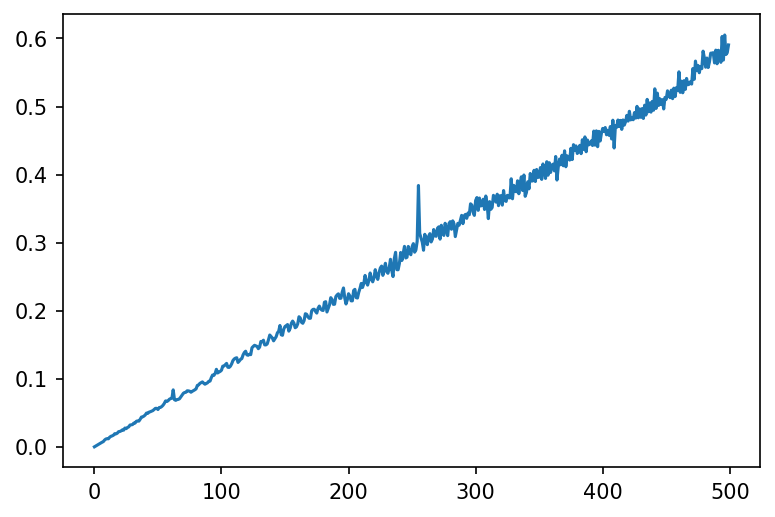

In [50]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(step_times)

#### Test LangevinIntegrator

In [5]:
with open("/data/chodera/zhangi/perses_benchmark/repex/0/solvent/ALA_CYS_solvent.pickle", 'rb') as f:
    htf = pickle.load(f)

In [6]:
# Langevin
# from openmmtools.integrators import LangevinIntegrator
from simtk.openmm import LangevinIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = LangevinIntegrator(300*unit.kelvin, 1/unit.picosecond, timestep)


In [7]:
from simtk import openmm

platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [8]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [9]:
md_step_times = []
nsteps = 500
for step in range(nsteps):
    initial_time = time.time()
    integrator.step(step)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    md_step_times.append(elapsed_time)
    _logger.info(f'step: {step} took: {elapsed_time / unit.seconds} seconds')


INFO:root:step: 0 took: 0.0003421306610107422 seconds
INFO:root:step: 1 took: 0.3270423412322998 seconds
INFO:root:step: 2 took: 0.0005223751068115234 seconds
INFO:root:step: 3 took: 0.0006740093231201172 seconds
INFO:root:step: 4 took: 0.0009868144989013672 seconds
INFO:root:step: 5 took: 0.0012638568878173828 seconds
INFO:root:step: 6 took: 0.0017080307006835938 seconds
INFO:root:step: 7 took: 0.001897573471069336 seconds
INFO:root:step: 8 took: 0.0023412704467773438 seconds
INFO:root:step: 9 took: 0.002482175827026367 seconds
INFO:root:step: 10 took: 0.005415439605712891 seconds
INFO:root:step: 11 took: 0.003644227981567383 seconds
INFO:root:step: 12 took: 0.0035524368286132812 seconds
INFO:root:step: 13 took: 0.003975629806518555 seconds
INFO:root:step: 14 took: 0.005198001861572266 seconds
INFO:root:step: 15 took: 0.004622936248779297 seconds
INFO:root:step: 16 took: 0.004908323287963867 seconds
INFO:root:step: 17 took: 0.006439208984375 seconds
INFO:root:step: 18 took: 0.00550317

INFO:root:step: 153 took: 0.04476308822631836 seconds
INFO:root:step: 154 took: 0.04560708999633789 seconds
INFO:root:step: 155 took: 0.04557085037231445 seconds
INFO:root:step: 156 took: 0.04603266716003418 seconds
INFO:root:step: 157 took: 0.04712057113647461 seconds
INFO:root:step: 158 took: 0.04602694511413574 seconds
INFO:root:step: 159 took: 0.04675173759460449 seconds
INFO:root:step: 160 took: 0.04709315299987793 seconds
INFO:root:step: 161 took: 0.04642748832702637 seconds
INFO:root:step: 162 took: 0.04802131652832031 seconds
INFO:root:step: 163 took: 0.04769301414489746 seconds
INFO:root:step: 164 took: 0.04773664474487305 seconds
INFO:root:step: 165 took: 0.048165321350097656 seconds
INFO:root:step: 166 took: 0.04899001121520996 seconds
INFO:root:step: 167 took: 0.04869675636291504 seconds
INFO:root:step: 168 took: 0.048862457275390625 seconds
INFO:root:step: 169 took: 0.04995441436767578 seconds
INFO:root:step: 170 took: 0.04924416542053223 seconds
INFO:root:step: 171 took: 

INFO:root:step: 305 took: 0.09046792984008789 seconds
INFO:root:step: 306 took: 0.09071135520935059 seconds
INFO:root:step: 307 took: 0.09123373031616211 seconds
INFO:root:step: 308 took: 0.09167218208312988 seconds
INFO:root:step: 309 took: 0.09218335151672363 seconds
INFO:root:step: 310 took: 0.09359192848205566 seconds
INFO:root:step: 311 took: 0.0929250717163086 seconds
INFO:root:step: 312 took: 0.09284615516662598 seconds
INFO:root:step: 313 took: 0.09297728538513184 seconds
INFO:root:step: 314 took: 0.09450364112854004 seconds
INFO:root:step: 315 took: 0.09393882751464844 seconds
INFO:root:step: 316 took: 0.09392857551574707 seconds
INFO:root:step: 317 took: 0.09493207931518555 seconds
INFO:root:step: 318 took: 0.09672236442565918 seconds
INFO:root:step: 319 took: 0.09513998031616211 seconds
INFO:root:step: 320 took: 0.09559297561645508 seconds
INFO:root:step: 321 took: 0.09529972076416016 seconds
INFO:root:step: 322 took: 0.09670543670654297 seconds
INFO:root:step: 323 took: 0.0

INFO:root:step: 458 took: 0.1359236240386963 seconds
INFO:root:step: 459 took: 0.13594341278076172 seconds
INFO:root:step: 460 took: 0.1369011402130127 seconds
INFO:root:step: 461 took: 0.13676786422729492 seconds
INFO:root:step: 462 took: 0.1380302906036377 seconds
INFO:root:step: 463 took: 0.13776803016662598 seconds
INFO:root:step: 464 took: 0.1383681297302246 seconds
INFO:root:step: 465 took: 0.13828539848327637 seconds
INFO:root:step: 466 took: 0.13915801048278809 seconds
INFO:root:step: 467 took: 0.13806962966918945 seconds
INFO:root:step: 468 took: 0.1387619972229004 seconds
INFO:root:step: 469 took: 0.1395549774169922 seconds
INFO:root:step: 470 took: 0.1390514373779297 seconds
INFO:root:step: 471 took: 0.1402738094329834 seconds
INFO:root:step: 472 took: 0.14070558547973633 seconds
INFO:root:step: 473 took: 0.14063262939453125 seconds
INFO:root:step: 474 took: 0.14069676399230957 seconds
INFO:root:step: 475 took: 0.14126873016357422 seconds
INFO:root:step: 476 took: 0.14059686

In [10]:
len(md_step_times)

500

In [11]:
max(md_step_times)

Quantity(value=0.3270423412322998, unit=second)

In [12]:
md_step_times = [time / unit.seconds for time in md_step_times]

DEBUG:matplotlib:$HOME=/home/zhangi
DEBUG:matplotlib:CONFIGDIR=/home/zhangi/.config/matplotlib
DEBUG:matplotlib:matplotlib data path: /home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/matplotlib/mpl-data
DEBUG:matplotlib:loaded rc file /home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/matplotlib/mpl-data/matplotlibrc
DEBUG:matplotlib:matplotlib version 3.1.1
DEBUG:matplotlib:interactive is False
DEBUG:matplotlib:platform is linux
DEBUG:matplotlib:loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', 'zipimport', '_frozen_importlib_external', '_io', 'marshal', 'posix', 'encodings', 'codecs', '_codecs', 'encodings.aliases', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', 'io', 'abc', '_abc', '_bootlocale', '_locale', 'site', 'os', 'stat', '_stat', 'posixpath', 'genericpath', 'os.path', '_collections_abc', '_sitebuiltins', 'types', 'importlib', 'importlib._bootstrap', 'importlib._bootstrap_

DEBUG:matplotlib:CACHEDIR=/home/zhangi/.cache/matplotlib
DEBUG:matplotlib.font_manager:Using fontManager instance from /home/zhangi/.cache/matplotlib/fontlist-v310.json
DEBUG:matplotlib.pyplot:Loaded backend module://ipykernel.pylab.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://ipykernel.pylab.backend_inline version unknown.


DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal bold normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal regular normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal bold normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal bold normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplo

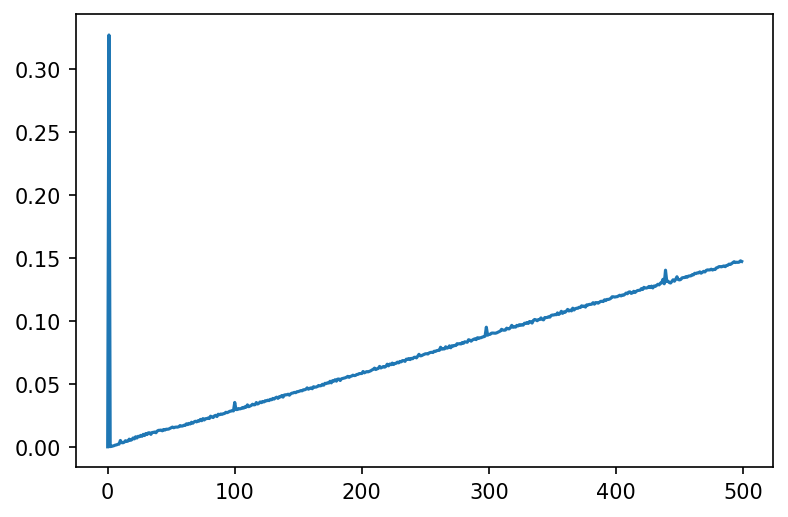

In [13]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(md_step_times)

In [25]:
# test vacuum
with open("/data/chodera/zhangi/perses_benchmark/repex/0/vacuum/ALA_CYS_vacuum.pickle", 'rb') as f:
    htf = pickle.load(f)

In [26]:
# Langevin
from openmmtools.integrators import LangevinIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = LangevinIntegrator(300*unit.kelvin, 1/unit.picosecond, timestep)


In [27]:
from simtk import openmm

platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [28]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [29]:
md_step_times = []
nsteps = 500
for step in range(nsteps):
    initial_time = time.time()
    integrator.step(step)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    md_step_times.append(elapsed_time)
    _logger.info(f'step: {step} took: {elapsed_time / unit.seconds} seconds')


INFO:root:step: 0 took: 0.00017261505126953125 seconds
INFO:root:step: 1 took: 0.2281935214996338 seconds
INFO:root:step: 2 took: 0.00022363662719726562 seconds
INFO:root:step: 3 took: 0.0002911090850830078 seconds
INFO:root:step: 4 took: 0.0003509521484375 seconds
INFO:root:step: 5 took: 0.0004456043243408203 seconds
INFO:root:step: 6 took: 0.00039267539978027344 seconds
INFO:root:step: 7 took: 0.00046563148498535156 seconds
INFO:root:step: 8 took: 0.0005018711090087891 seconds
INFO:root:step: 9 took: 0.0005648136138916016 seconds
INFO:root:step: 10 took: 0.0006129741668701172 seconds
INFO:root:step: 11 took: 0.0006663799285888672 seconds
INFO:root:step: 12 took: 0.0007309913635253906 seconds
INFO:root:step: 13 took: 0.0007803440093994141 seconds
INFO:root:step: 14 took: 0.0008366107940673828 seconds
INFO:root:step: 15 took: 0.0008833408355712891 seconds
INFO:root:step: 16 took: 0.0009450912475585938 seconds
INFO:root:step: 17 took: 0.0009918212890625 seconds
INFO:root:step: 18 took: 

INFO:root:step: 151 took: 0.022403478622436523 seconds
INFO:root:step: 152 took: 0.022705554962158203 seconds
INFO:root:step: 153 took: 0.022539377212524414 seconds
INFO:root:step: 154 took: 0.02273869514465332 seconds
INFO:root:step: 155 took: 0.02278733253479004 seconds
INFO:root:step: 156 took: 0.023229360580444336 seconds
INFO:root:step: 157 took: 0.023270130157470703 seconds
INFO:root:step: 158 took: 0.023682832717895508 seconds
INFO:root:step: 159 took: 0.023576021194458008 seconds
INFO:root:step: 160 took: 0.02360057830810547 seconds
INFO:root:step: 161 took: 0.023715496063232422 seconds
INFO:root:step: 162 took: 0.023856639862060547 seconds
INFO:root:step: 163 took: 0.024029016494750977 seconds
INFO:root:step: 164 took: 0.02441883087158203 seconds
INFO:root:step: 165 took: 0.02478313446044922 seconds
INFO:root:step: 166 took: 0.024585485458374023 seconds
INFO:root:step: 167 took: 0.0248720645904541 seconds
INFO:root:step: 168 took: 0.025127887725830078 seconds
INFO:root:step: 1

INFO:root:step: 302 took: 0.04556775093078613 seconds
INFO:root:step: 303 took: 0.04588961601257324 seconds
INFO:root:step: 304 took: 0.04607129096984863 seconds
INFO:root:step: 305 took: 0.04603242874145508 seconds
INFO:root:step: 306 took: 0.04653811454772949 seconds
INFO:root:step: 307 took: 0.04633474349975586 seconds
INFO:root:step: 308 took: 0.046864986419677734 seconds
INFO:root:step: 309 took: 0.04729509353637695 seconds
INFO:root:step: 310 took: 0.046764373779296875 seconds
INFO:root:step: 311 took: 0.04743528366088867 seconds
INFO:root:step: 312 took: 0.04778885841369629 seconds
INFO:root:step: 313 took: 0.04864788055419922 seconds
INFO:root:step: 314 took: 0.04854583740234375 seconds
INFO:root:step: 315 took: 0.048375844955444336 seconds
INFO:root:step: 316 took: 0.04779505729675293 seconds
INFO:root:step: 317 took: 0.048326969146728516 seconds
INFO:root:step: 318 took: 0.04830050468444824 seconds
INFO:root:step: 319 took: 0.048339128494262695 seconds
INFO:root:step: 320 too

INFO:root:step: 454 took: 0.0699915885925293 seconds
INFO:root:step: 455 took: 0.07046175003051758 seconds
INFO:root:step: 456 took: 0.07047629356384277 seconds
INFO:root:step: 457 took: 0.06983208656311035 seconds
INFO:root:step: 458 took: 0.06952619552612305 seconds
INFO:root:step: 459 took: 0.07036924362182617 seconds
INFO:root:step: 460 took: 0.07042574882507324 seconds
INFO:root:step: 461 took: 0.0705263614654541 seconds
INFO:root:step: 462 took: 0.07090401649475098 seconds
INFO:root:step: 463 took: 0.07083868980407715 seconds
INFO:root:step: 464 took: 0.0722494125366211 seconds
INFO:root:step: 465 took: 0.07134771347045898 seconds
INFO:root:step: 466 took: 0.0712583065032959 seconds
INFO:root:step: 467 took: 0.07118678092956543 seconds
INFO:root:step: 468 took: 0.0717160701751709 seconds
INFO:root:step: 469 took: 0.07191872596740723 seconds
INFO:root:step: 470 took: 0.07225489616394043 seconds
INFO:root:step: 471 took: 0.07186150550842285 seconds
INFO:root:step: 472 took: 0.07304

In [30]:
len(md_step_times)

500

In [31]:
max(md_step_times)

Quantity(value=0.2281935214996338, unit=second)

In [32]:
md_step_times = [time / unit.seconds for time in md_step_times]

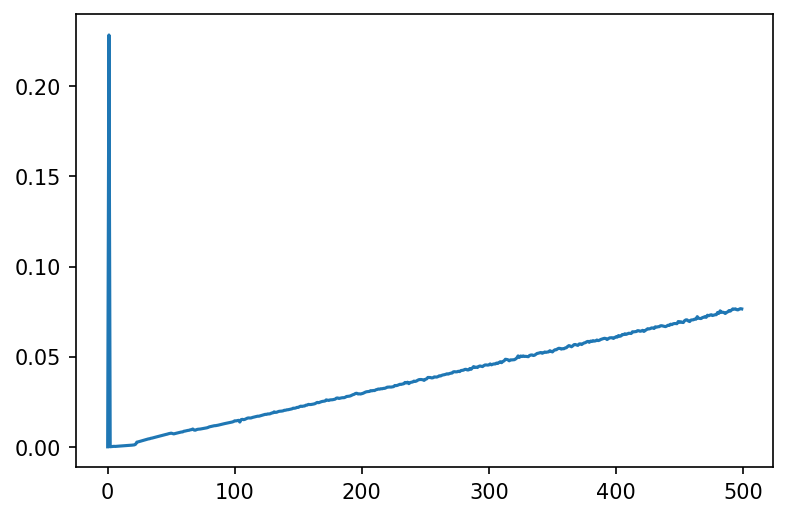

In [33]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(md_step_times)

#### Test Langevin with one of hannah's htfs

In [79]:
import numpy as np
data = np.load('htf.npz', allow_pickle=True) 

In [80]:
list(data.keys())

['arr_0']

In [83]:
htf = data.get('arr_0')

In [114]:
htf = htf.flatten()[0]

In [116]:
x = 'lambda'
DEFAULT_ALCHEMICAL_FUNCTIONS = {
                             'lambda_sterics_core': x,
                             'lambda_electrostatics_core': x,
                             'lambda_sterics_insert': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_sterics_delete': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_insert': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_delete': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_bonds': x,
                             'lambda_angles': x,
                             'lambda_torsions': x}

In [117]:
# Langevin
from openmmtools.integrators import LangevinIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = LangevinIntegrator(300*unit.kelvin, 1/unit.picosecond, timestep)


In [121]:
from simtk import openmm
platform_name = 'CUDA'
['hybrid_system']
system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [122]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [123]:
md_step_times = []
nsteps = 500
for step in range(nsteps):
    initial_time = time.time()
    integrator.step(step)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    md_step_times.append(elapsed_time)
    _logger.info(f'step: {step} took: {elapsed_time / unit.seconds} seconds')


INFO:root:step: 0 took: 0.0050733089447021484 seconds
INFO:root:step: 1 took: 0.6162106990814209 seconds
INFO:root:step: 2 took: 0.005721092224121094 seconds
INFO:root:step: 3 took: 0.01146841049194336 seconds
INFO:root:step: 4 took: 0.01591777801513672 seconds
INFO:root:step: 5 took: 0.01978754997253418 seconds
INFO:root:step: 6 took: 0.025734424591064453 seconds
INFO:root:step: 7 took: 0.02840399742126465 seconds
INFO:root:step: 8 took: 0.03506922721862793 seconds
INFO:root:step: 9 took: 0.03954601287841797 seconds
INFO:root:step: 10 took: 0.0791785717010498 seconds
INFO:root:step: 11 took: 0.04742312431335449 seconds
INFO:root:step: 12 took: 0.05258631706237793 seconds
INFO:root:step: 13 took: 0.05588936805725098 seconds
INFO:root:step: 14 took: 0.06990551948547363 seconds
INFO:root:step: 15 took: 0.06592941284179688 seconds
INFO:root:step: 16 took: 0.07069635391235352 seconds
INFO:root:step: 17 took: 0.08246946334838867 seconds
INFO:root:step: 18 took: 0.07949209213256836 seconds
I

INFO:root:step: 156 took: 0.7570686340332031 seconds
INFO:root:step: 157 took: 0.7950432300567627 seconds
INFO:root:step: 158 took: 0.788630485534668 seconds
INFO:root:step: 159 took: 0.7771594524383545 seconds
INFO:root:step: 160 took: 0.8024988174438477 seconds
INFO:root:step: 161 took: 0.8081283569335938 seconds
INFO:root:step: 162 took: 0.7961978912353516 seconds
INFO:root:step: 163 took: 0.8148458003997803 seconds
INFO:root:step: 164 took: 0.8171210289001465 seconds
INFO:root:step: 165 took: 0.7977924346923828 seconds
INFO:root:step: 166 took: 0.8362512588500977 seconds
INFO:root:step: 167 took: 0.8319060802459717 seconds
INFO:root:step: 168 took: 0.831597089767456 seconds
INFO:root:step: 169 took: 0.8569042682647705 seconds
INFO:root:step: 170 took: 0.8502094745635986 seconds
INFO:root:step: 171 took: 0.8411974906921387 seconds
INFO:root:step: 172 took: 0.8541200160980225 seconds
INFO:root:step: 173 took: 0.8673062324523926 seconds
INFO:root:step: 174 took: 0.849498987197876 seco

INFO:root:step: 312 took: 1.5705883502960205 seconds
INFO:root:step: 313 took: 1.5793664455413818 seconds
INFO:root:step: 314 took: 1.6131885051727295 seconds
INFO:root:step: 315 took: 1.5886986255645752 seconds
INFO:root:step: 316 took: 1.5844061374664307 seconds
INFO:root:step: 317 took: 1.6213030815124512 seconds
INFO:root:step: 318 took: 1.598268985748291 seconds
INFO:root:step: 319 took: 1.5981509685516357 seconds
INFO:root:step: 320 took: 1.6146965026855469 seconds
INFO:root:step: 321 took: 1.6384429931640625 seconds
INFO:root:step: 322 took: 1.6222002506256104 seconds
INFO:root:step: 323 took: 1.6271202564239502 seconds
INFO:root:step: 324 took: 1.639178991317749 seconds
INFO:root:step: 325 took: 1.6409506797790527 seconds
INFO:root:step: 326 took: 1.6526000499725342 seconds
INFO:root:step: 327 took: 1.6445846557617188 seconds
INFO:root:step: 328 took: 1.6651091575622559 seconds
INFO:root:step: 329 took: 1.6406049728393555 seconds
INFO:root:step: 330 took: 1.651961088180542 seco

INFO:root:step: 468 took: 2.3638532161712646 seconds
INFO:root:step: 469 took: 2.390108108520508 seconds
INFO:root:step: 470 took: 2.3912620544433594 seconds
INFO:root:step: 471 took: 2.4919629096984863 seconds
INFO:root:step: 472 took: 2.374424934387207 seconds
INFO:root:step: 473 took: 2.4115092754364014 seconds
INFO:root:step: 474 took: 2.4057579040527344 seconds
INFO:root:step: 475 took: 2.432133674621582 seconds
INFO:root:step: 476 took: 2.4157135486602783 seconds
INFO:root:step: 477 took: 2.398127317428589 seconds
INFO:root:step: 478 took: 2.3962342739105225 seconds
INFO:root:step: 479 took: 2.4487388134002686 seconds
INFO:root:step: 480 took: 2.437397003173828 seconds
INFO:root:step: 481 took: 2.454073667526245 seconds
INFO:root:step: 482 took: 2.4346790313720703 seconds
INFO:root:step: 483 took: 2.448148012161255 seconds
INFO:root:step: 484 took: 2.46856427192688 seconds
INFO:root:step: 485 took: 2.4621737003326416 seconds
INFO:root:step: 486 took: 2.4578280448913574 seconds
IN

In [30]:
len(md_step_times)

500

In [31]:
max(md_step_times)

Quantity(value=0.2281935214996338, unit=second)

In [32]:
md_step_times = [time / unit.seconds for time in md_step_times]

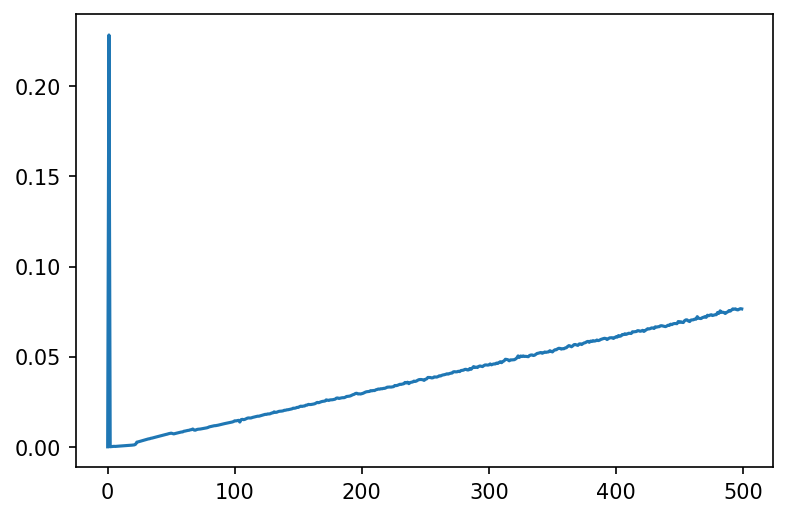

In [33]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(md_step_times)

#### Test LangevinIntegrator for cyclic behavior

In [3]:
with open("/data/chodera/zhangi/perses_benchmark/repex/0/solvent/ALA_CYS_solvent.pickle", 'rb') as f:
    htf = pickle.load(f)

In [4]:
# Langevin
from openmmtools.integrators import LangevinIntegrator
# from simtk.openmm import LangevinIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = LangevinIntegrator(300*unit.kelvin, 1/unit.picosecond, timestep)


In [5]:
from simtk import openmm

platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [6]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [7]:
md_step_times = []
cycles = 500
for cycle in range(cycles):
    initial_time = time.time()
    integrator.step(100)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    md_step_times.append(elapsed_time)
    _logger.info(f'cycle: {cycle} took: {elapsed_time / unit.seconds} seconds')


INFO:root:cycle: 0 took: 0.07043266296386719 seconds
INFO:root:cycle: 1 took: 0.05124831199645996 seconds
INFO:root:cycle: 2 took: 0.05040121078491211 seconds
INFO:root:cycle: 3 took: 0.051157236099243164 seconds
INFO:root:cycle: 4 took: 0.05055546760559082 seconds
INFO:root:cycle: 5 took: 0.05009746551513672 seconds
INFO:root:cycle: 6 took: 0.049068450927734375 seconds
INFO:root:cycle: 7 took: 0.04888486862182617 seconds
INFO:root:cycle: 8 took: 0.04970431327819824 seconds
INFO:root:cycle: 9 took: 0.049211978912353516 seconds
INFO:root:cycle: 10 took: 0.05049443244934082 seconds
INFO:root:cycle: 11 took: 0.049401044845581055 seconds
INFO:root:cycle: 12 took: 0.04952383041381836 seconds
INFO:root:cycle: 13 took: 0.04996299743652344 seconds
INFO:root:cycle: 14 took: 0.04926633834838867 seconds
INFO:root:cycle: 15 took: 0.04994630813598633 seconds
INFO:root:cycle: 16 took: 0.04941821098327637 seconds
INFO:root:cycle: 17 took: 0.05187678337097168 seconds
INFO:root:cycle: 18 took: 0.051565

INFO:root:cycle: 151 took: 0.05022382736206055 seconds
INFO:root:cycle: 152 took: 0.049610137939453125 seconds
INFO:root:cycle: 153 took: 0.05022430419921875 seconds
INFO:root:cycle: 154 took: 0.049361228942871094 seconds
INFO:root:cycle: 155 took: 0.04911398887634277 seconds
INFO:root:cycle: 156 took: 0.04965853691101074 seconds
INFO:root:cycle: 157 took: 0.04924464225769043 seconds
INFO:root:cycle: 158 took: 0.0501711368560791 seconds
INFO:root:cycle: 159 took: 0.04914689064025879 seconds
INFO:root:cycle: 160 took: 0.04921913146972656 seconds
INFO:root:cycle: 161 took: 0.04998970031738281 seconds
INFO:root:cycle: 162 took: 0.04912257194519043 seconds
INFO:root:cycle: 163 took: 0.05147361755371094 seconds
INFO:root:cycle: 164 took: 0.04954099655151367 seconds
INFO:root:cycle: 165 took: 0.04906654357910156 seconds
INFO:root:cycle: 166 took: 0.04957127571105957 seconds
INFO:root:cycle: 167 took: 0.049250125885009766 seconds
INFO:root:cycle: 168 took: 0.050162553787231445 seconds
INFO:ro

INFO:root:cycle: 300 took: 0.04926323890686035 seconds
INFO:root:cycle: 301 took: 0.04962515830993652 seconds
INFO:root:cycle: 302 took: 0.04904603958129883 seconds
INFO:root:cycle: 303 took: 0.04924416542053223 seconds
INFO:root:cycle: 304 took: 0.049783945083618164 seconds
INFO:root:cycle: 305 took: 0.0490870475769043 seconds
INFO:root:cycle: 306 took: 0.050223350524902344 seconds
INFO:root:cycle: 307 took: 0.049535274505615234 seconds
INFO:root:cycle: 308 took: 0.04909062385559082 seconds
INFO:root:cycle: 309 took: 0.05018043518066406 seconds
INFO:root:cycle: 310 took: 0.04945492744445801 seconds
INFO:root:cycle: 311 took: 0.04985499382019043 seconds
INFO:root:cycle: 312 took: 0.04923272132873535 seconds
INFO:root:cycle: 313 took: 0.04924964904785156 seconds
INFO:root:cycle: 314 took: 0.05008983612060547 seconds
INFO:root:cycle: 315 took: 0.049326419830322266 seconds
INFO:root:cycle: 316 took: 0.05031299591064453 seconds
INFO:root:cycle: 317 took: 0.049518585205078125 seconds
INFO:r

INFO:root:cycle: 449 took: 0.050290584564208984 seconds
INFO:root:cycle: 450 took: 0.049828290939331055 seconds
INFO:root:cycle: 451 took: 0.049952030181884766 seconds
INFO:root:cycle: 452 took: 0.05052351951599121 seconds
INFO:root:cycle: 453 took: 0.04970216751098633 seconds
INFO:root:cycle: 454 took: 0.05058097839355469 seconds
INFO:root:cycle: 455 took: 0.04950571060180664 seconds
INFO:root:cycle: 456 took: 0.049803733825683594 seconds
INFO:root:cycle: 457 took: 0.05032753944396973 seconds
INFO:root:cycle: 458 took: 0.04957246780395508 seconds
INFO:root:cycle: 459 took: 0.050771236419677734 seconds
INFO:root:cycle: 460 took: 0.04983949661254883 seconds
INFO:root:cycle: 461 took: 0.05007767677307129 seconds
INFO:root:cycle: 462 took: 0.05039024353027344 seconds
INFO:root:cycle: 463 took: 0.04965353012084961 seconds
INFO:root:cycle: 464 took: 0.05058455467224121 seconds
INFO:root:cycle: 465 took: 0.04990577697753906 seconds
INFO:root:cycle: 466 took: 0.0500943660736084 seconds
INFO:r

In [11]:
len(md_step_times)

500

In [12]:
max(md_step_times)

Quantity(value=0.426116943359375, unit=second)

In [13]:
md_step_times = [time / unit.seconds for time in md_step_times]

DEBUG:matplotlib:$HOME=/home/zhangi
DEBUG:matplotlib:CONFIGDIR=/home/zhangi/.config/matplotlib
DEBUG:matplotlib:matplotlib data path: /home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/matplotlib/mpl-data
DEBUG:matplotlib:loaded rc file /home/zhangi/miniconda3/envs/perses-sims/lib/python3.7/site-packages/matplotlib/mpl-data/matplotlibrc
DEBUG:matplotlib:matplotlib version 3.1.1
DEBUG:matplotlib:interactive is False
DEBUG:matplotlib:platform is linux
DEBUG:matplotlib:loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', 'zipimport', '_frozen_importlib_external', '_io', 'marshal', 'posix', 'encodings', 'codecs', '_codecs', 'encodings.aliases', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', 'io', 'abc', '_abc', '_bootlocale', '_locale', 'site', 'os', 'stat', '_stat', 'posixpath', 'genericpath', 'os.path', '_collections_abc', '_sitebuiltins', 'types', 'importlib', 'importlib._bootstrap', 'importlib._bootstrap_

DEBUG:matplotlib:CACHEDIR=/home/zhangi/.cache/matplotlib
DEBUG:matplotlib.font_manager:Using fontManager instance from /home/zhangi/.cache/matplotlib/fontlist-v310.json
DEBUG:matplotlib.pyplot:Loaded backend module://ipykernel.pylab.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://ipykernel.pylab.backend_inline version unknown.


DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal bold normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal regular normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal bold normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal bold normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplo

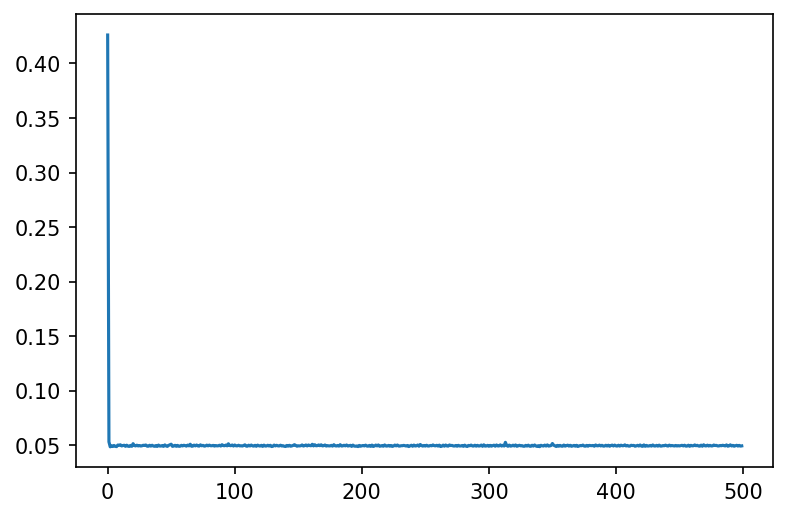

In [14]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(md_step_times)

#### PeriodicNonequilibriumIntegrator (remove bug, test efficiency with diff constraints)

In [5]:
with open("/data/chodera/zhangi/perses_benchmark/repex/0/solvent/ALA_CYS_solvent.pickle", 'rb') as f:
    htf = pickle.load(f)

In [6]:
x = 'lambda'
DEFAULT_ALCHEMICAL_FUNCTIONS = {
                             'lambda_sterics_core': x,
                             'lambda_electrostatics_core': x,
                             'lambda_sterics_insert': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_sterics_delete': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_insert': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_delete': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_bonds': x,
                             'lambda_angles': x,
                             'lambda_torsions': x}

In [7]:
# PeriodicNonEq
from openmmtools.integrators import PeriodicNonequilibriumIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = PeriodicNonequilibriumIntegrator(DEFAULT_ALCHEMICAL_FUNCTIONS, nsteps_eq, nsteps_neq, neq_splitting, timestep=timestep)


In [8]:
integrator.getConstraintTolerance()

1e-08

In [9]:
from simtk import openmm

temperature = 300*unit.kelvin
collision_rate = 90/unit.picosecond
platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [10]:
platform.getName()

'CUDA'

In [11]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [12]:
# Run neq
ncycles = 1
forward_works_master, reverse_works_master = list(), list()
for _ in range(ncycles):
    # Equilibrium (lambda = 0)
    _logger.info(f'Starting to equilibrate at lambda = 0')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 0, took: {elapsed_time / unit.seconds} seconds')

    # Forward (0 -> 1)
    forward_works = [integrator.get_protocol_work(dimensionless=True)]
    forward_times = []
    for fwd_step in range(nsteps_neq):
        _logger.info(f'forward NEQ step: {fwd_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        forward_times.append(elapsed_time)
        forward_works.append(integrator.get_protocol_work(dimensionless=True))
    forward_works_master.append(forward_works)

    # Equilibrium (lambda = 1)
    _logger.info(f'Starting to equilibrate at lambda = 1')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 1, took: {elapsed_time / unit.seconds} seconds')

    # Reverse work (1 -> 0)
    reverse_works = [integrator.get_protocol_work(dimensionless=True)]
    reverse_times = []
    for rev_step in range(nsteps_neq):
        _logger.info(f'reverse NEQ step: {rev_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        reverse_times.append(elapsed_time)
        reverse_works.append(integrator.get_protocol_work(dimensionless=True))
    reverse_works_master.append(reverse_works)

INFO:root:Starting to equilibrate at lambda = 0
INFO:root:Done equilibrating at lambda = 0, took: 65.53849363327026 seconds
INFO:root:NEQ step: 0
INFO:root:NEQ step: 1
INFO:root:NEQ step: 2
INFO:root:NEQ step: 3
INFO:root:NEQ step: 4
INFO:root:NEQ step: 5
INFO:root:NEQ step: 6
INFO:root:NEQ step: 7
INFO:root:NEQ step: 8
INFO:root:NEQ step: 9
INFO:root:NEQ step: 10
INFO:root:NEQ step: 11
INFO:root:NEQ step: 12
INFO:root:NEQ step: 13
INFO:root:NEQ step: 14
INFO:root:NEQ step: 15
INFO:root:NEQ step: 16
INFO:root:NEQ step: 17
INFO:root:NEQ step: 18
INFO:root:NEQ step: 19
INFO:root:NEQ step: 20
INFO:root:NEQ step: 21
INFO:root:NEQ step: 22
INFO:root:NEQ step: 23
INFO:root:NEQ step: 24
INFO:root:NEQ step: 25
INFO:root:NEQ step: 26
INFO:root:NEQ step: 27
INFO:root:NEQ step: 28
INFO:root:NEQ step: 29
INFO:root:NEQ step: 30
INFO:root:NEQ step: 31
INFO:root:NEQ step: 32
INFO:root:NEQ step: 33
INFO:root:NEQ step: 34
INFO:root:NEQ step: 35
INFO:root:NEQ step: 36
INFO:root:NEQ step: 37
INFO:root:NE

INFO:root:NEQ step: 341
INFO:root:NEQ step: 342
INFO:root:NEQ step: 343
INFO:root:NEQ step: 344
INFO:root:NEQ step: 345
INFO:root:NEQ step: 346
INFO:root:NEQ step: 347
INFO:root:NEQ step: 348
INFO:root:NEQ step: 349
INFO:root:NEQ step: 350
INFO:root:NEQ step: 351
INFO:root:NEQ step: 352
INFO:root:NEQ step: 353
INFO:root:NEQ step: 354
INFO:root:NEQ step: 355
INFO:root:NEQ step: 356
INFO:root:NEQ step: 357
INFO:root:NEQ step: 358
INFO:root:NEQ step: 359
INFO:root:NEQ step: 360
INFO:root:NEQ step: 361
INFO:root:NEQ step: 362
INFO:root:NEQ step: 363
INFO:root:NEQ step: 364
INFO:root:NEQ step: 365
INFO:root:NEQ step: 366
INFO:root:NEQ step: 367
INFO:root:NEQ step: 368
INFO:root:NEQ step: 369
INFO:root:NEQ step: 370
INFO:root:NEQ step: 371
INFO:root:NEQ step: 372
INFO:root:NEQ step: 373
INFO:root:NEQ step: 374
INFO:root:NEQ step: 375
INFO:root:NEQ step: 376
INFO:root:NEQ step: 377
INFO:root:NEQ step: 378
INFO:root:NEQ step: 379
INFO:root:NEQ step: 380
INFO:root:NEQ step: 381
INFO:root:NEQ st

INFO:root:NEQ step: 683
INFO:root:NEQ step: 684
INFO:root:NEQ step: 685
INFO:root:NEQ step: 686
INFO:root:NEQ step: 687
INFO:root:NEQ step: 688
INFO:root:NEQ step: 689
INFO:root:NEQ step: 690
INFO:root:NEQ step: 691
INFO:root:NEQ step: 692
INFO:root:NEQ step: 693
INFO:root:NEQ step: 694
INFO:root:NEQ step: 695
INFO:root:NEQ step: 696
INFO:root:NEQ step: 697
INFO:root:NEQ step: 698
INFO:root:NEQ step: 699
INFO:root:NEQ step: 700
INFO:root:NEQ step: 701
INFO:root:NEQ step: 702
INFO:root:NEQ step: 703
INFO:root:NEQ step: 704
INFO:root:NEQ step: 705
INFO:root:NEQ step: 706
INFO:root:NEQ step: 707
INFO:root:NEQ step: 708
INFO:root:NEQ step: 709
INFO:root:NEQ step: 710
INFO:root:NEQ step: 711
INFO:root:NEQ step: 712
INFO:root:NEQ step: 713
INFO:root:NEQ step: 714
INFO:root:NEQ step: 715
INFO:root:NEQ step: 716
INFO:root:NEQ step: 717
INFO:root:NEQ step: 718
INFO:root:NEQ step: 719
INFO:root:NEQ step: 720
INFO:root:NEQ step: 721
INFO:root:NEQ step: 722
INFO:root:NEQ step: 723
INFO:root:NEQ st

INFO:root:NEQ step: 1024
INFO:root:NEQ step: 1025
INFO:root:NEQ step: 1026
INFO:root:NEQ step: 1027
INFO:root:NEQ step: 1028
INFO:root:NEQ step: 1029
INFO:root:NEQ step: 1030
INFO:root:NEQ step: 1031
INFO:root:NEQ step: 1032
INFO:root:NEQ step: 1033
INFO:root:NEQ step: 1034
INFO:root:NEQ step: 1035
INFO:root:NEQ step: 1036
INFO:root:NEQ step: 1037
INFO:root:NEQ step: 1038
INFO:root:NEQ step: 1039
INFO:root:NEQ step: 1040
INFO:root:NEQ step: 1041
INFO:root:NEQ step: 1042
INFO:root:NEQ step: 1043
INFO:root:NEQ step: 1044
INFO:root:NEQ step: 1045
INFO:root:NEQ step: 1046
INFO:root:NEQ step: 1047
INFO:root:NEQ step: 1048
INFO:root:NEQ step: 1049
INFO:root:NEQ step: 1050
INFO:root:NEQ step: 1051
INFO:root:NEQ step: 1052
INFO:root:NEQ step: 1053
INFO:root:NEQ step: 1054
INFO:root:NEQ step: 1055
INFO:root:NEQ step: 1056
INFO:root:NEQ step: 1057
INFO:root:NEQ step: 1058
INFO:root:NEQ step: 1059
INFO:root:NEQ step: 1060
INFO:root:NEQ step: 1061
INFO:root:NEQ step: 1062
INFO:root:NEQ step: 1063


INFO:root:NEQ step: 1352
INFO:root:NEQ step: 1353
INFO:root:NEQ step: 1354
INFO:root:NEQ step: 1355
INFO:root:NEQ step: 1356
INFO:root:NEQ step: 1357
INFO:root:NEQ step: 1358
INFO:root:NEQ step: 1359
INFO:root:NEQ step: 1360
INFO:root:NEQ step: 1361
INFO:root:NEQ step: 1362
INFO:root:NEQ step: 1363
INFO:root:NEQ step: 1364
INFO:root:NEQ step: 1365
INFO:root:NEQ step: 1366
INFO:root:NEQ step: 1367
INFO:root:NEQ step: 1368
INFO:root:NEQ step: 1369
INFO:root:NEQ step: 1370
INFO:root:NEQ step: 1371
INFO:root:NEQ step: 1372
INFO:root:NEQ step: 1373
INFO:root:NEQ step: 1374
INFO:root:NEQ step: 1375
INFO:root:NEQ step: 1376
INFO:root:NEQ step: 1377
INFO:root:NEQ step: 1378
INFO:root:NEQ step: 1379
INFO:root:NEQ step: 1380
INFO:root:NEQ step: 1381
INFO:root:NEQ step: 1382
INFO:root:NEQ step: 1383
INFO:root:NEQ step: 1384
INFO:root:NEQ step: 1385
INFO:root:NEQ step: 1386
INFO:root:NEQ step: 1387
INFO:root:NEQ step: 1388
INFO:root:NEQ step: 1389
INFO:root:NEQ step: 1390
INFO:root:NEQ step: 1391


INFO:root:NEQ step: 1680
INFO:root:NEQ step: 1681
INFO:root:NEQ step: 1682
INFO:root:NEQ step: 1683
INFO:root:NEQ step: 1684
INFO:root:NEQ step: 1685
INFO:root:NEQ step: 1686
INFO:root:NEQ step: 1687
INFO:root:NEQ step: 1688
INFO:root:NEQ step: 1689
INFO:root:NEQ step: 1690
INFO:root:NEQ step: 1691
INFO:root:NEQ step: 1692
INFO:root:NEQ step: 1693
INFO:root:NEQ step: 1694
INFO:root:NEQ step: 1695
INFO:root:NEQ step: 1696
INFO:root:NEQ step: 1697
INFO:root:NEQ step: 1698
INFO:root:NEQ step: 1699
INFO:root:NEQ step: 1700
INFO:root:NEQ step: 1701
INFO:root:NEQ step: 1702
INFO:root:NEQ step: 1703
INFO:root:NEQ step: 1704
INFO:root:NEQ step: 1705
INFO:root:NEQ step: 1706
INFO:root:NEQ step: 1707
INFO:root:NEQ step: 1708
INFO:root:NEQ step: 1709
INFO:root:NEQ step: 1710
INFO:root:NEQ step: 1711
INFO:root:NEQ step: 1712
INFO:root:NEQ step: 1713
INFO:root:NEQ step: 1714
INFO:root:NEQ step: 1715
INFO:root:NEQ step: 1716
INFO:root:NEQ step: 1717
INFO:root:NEQ step: 1718
INFO:root:NEQ step: 1719


INFO:root:NEQ step: 2008
INFO:root:NEQ step: 2009
INFO:root:NEQ step: 2010
INFO:root:NEQ step: 2011
INFO:root:NEQ step: 2012
INFO:root:NEQ step: 2013
INFO:root:NEQ step: 2014
INFO:root:NEQ step: 2015
INFO:root:NEQ step: 2016
INFO:root:NEQ step: 2017
INFO:root:NEQ step: 2018
INFO:root:NEQ step: 2019
INFO:root:NEQ step: 2020
INFO:root:NEQ step: 2021
INFO:root:NEQ step: 2022
INFO:root:NEQ step: 2023
INFO:root:NEQ step: 2024
INFO:root:NEQ step: 2025
INFO:root:NEQ step: 2026
INFO:root:NEQ step: 2027
INFO:root:NEQ step: 2028
INFO:root:NEQ step: 2029
INFO:root:NEQ step: 2030
INFO:root:NEQ step: 2031
INFO:root:NEQ step: 2032
INFO:root:NEQ step: 2033
INFO:root:NEQ step: 2034
INFO:root:NEQ step: 2035
INFO:root:NEQ step: 2036
INFO:root:NEQ step: 2037
INFO:root:NEQ step: 2038
INFO:root:NEQ step: 2039
INFO:root:NEQ step: 2040
INFO:root:NEQ step: 2041
INFO:root:NEQ step: 2042
INFO:root:NEQ step: 2043
INFO:root:NEQ step: 2044
INFO:root:NEQ step: 2045
INFO:root:NEQ step: 2046
INFO:root:NEQ step: 2047


INFO:root:NEQ step: 2336
INFO:root:NEQ step: 2337
INFO:root:NEQ step: 2338
INFO:root:NEQ step: 2339
INFO:root:NEQ step: 2340
INFO:root:NEQ step: 2341
INFO:root:NEQ step: 2342
INFO:root:NEQ step: 2343
INFO:root:NEQ step: 2344
INFO:root:NEQ step: 2345
INFO:root:NEQ step: 2346
INFO:root:NEQ step: 2347
INFO:root:NEQ step: 2348
INFO:root:NEQ step: 2349
INFO:root:NEQ step: 2350
INFO:root:NEQ step: 2351
INFO:root:NEQ step: 2352
INFO:root:NEQ step: 2353
INFO:root:NEQ step: 2354
INFO:root:NEQ step: 2355
INFO:root:NEQ step: 2356
INFO:root:NEQ step: 2357
INFO:root:NEQ step: 2358
INFO:root:NEQ step: 2359
INFO:root:NEQ step: 2360
INFO:root:NEQ step: 2361
INFO:root:NEQ step: 2362
INFO:root:NEQ step: 2363
INFO:root:NEQ step: 2364
INFO:root:NEQ step: 2365
INFO:root:NEQ step: 2366
INFO:root:NEQ step: 2367
INFO:root:NEQ step: 2368
INFO:root:NEQ step: 2369
INFO:root:NEQ step: 2370
INFO:root:NEQ step: 2371
INFO:root:NEQ step: 2372
INFO:root:NEQ step: 2373
INFO:root:NEQ step: 2374
INFO:root:NEQ step: 2375


INFO:root:NEQ step: 2664
INFO:root:NEQ step: 2665
INFO:root:NEQ step: 2666
INFO:root:NEQ step: 2667
INFO:root:NEQ step: 2668
INFO:root:NEQ step: 2669
INFO:root:NEQ step: 2670
INFO:root:NEQ step: 2671
INFO:root:NEQ step: 2672
INFO:root:NEQ step: 2673
INFO:root:NEQ step: 2674
INFO:root:NEQ step: 2675
INFO:root:NEQ step: 2676
INFO:root:NEQ step: 2677
INFO:root:NEQ step: 2678
INFO:root:NEQ step: 2679
INFO:root:NEQ step: 2680
INFO:root:NEQ step: 2681
INFO:root:NEQ step: 2682
INFO:root:NEQ step: 2683
INFO:root:NEQ step: 2684
INFO:root:NEQ step: 2685
INFO:root:NEQ step: 2686
INFO:root:NEQ step: 2687
INFO:root:NEQ step: 2688
INFO:root:NEQ step: 2689
INFO:root:NEQ step: 2690
INFO:root:NEQ step: 2691
INFO:root:NEQ step: 2692
INFO:root:NEQ step: 2693
INFO:root:NEQ step: 2694
INFO:root:NEQ step: 2695
INFO:root:NEQ step: 2696
INFO:root:NEQ step: 2697
INFO:root:NEQ step: 2698
INFO:root:NEQ step: 2699
INFO:root:NEQ step: 2700
INFO:root:NEQ step: 2701
INFO:root:NEQ step: 2702
INFO:root:NEQ step: 2703


INFO:root:NEQ step: 2992
INFO:root:NEQ step: 2993
INFO:root:NEQ step: 2994
INFO:root:NEQ step: 2995
INFO:root:NEQ step: 2996
INFO:root:NEQ step: 2997
INFO:root:NEQ step: 2998
INFO:root:NEQ step: 2999
INFO:root:NEQ step: 3000
INFO:root:NEQ step: 3001
INFO:root:NEQ step: 3002
INFO:root:NEQ step: 3003
INFO:root:NEQ step: 3004
INFO:root:NEQ step: 3005
INFO:root:NEQ step: 3006
INFO:root:NEQ step: 3007
INFO:root:NEQ step: 3008
INFO:root:NEQ step: 3009
INFO:root:NEQ step: 3010
INFO:root:NEQ step: 3011
INFO:root:NEQ step: 3012
INFO:root:NEQ step: 3013
INFO:root:NEQ step: 3014
INFO:root:NEQ step: 3015
INFO:root:NEQ step: 3016
INFO:root:NEQ step: 3017
INFO:root:NEQ step: 3018
INFO:root:NEQ step: 3019
INFO:root:NEQ step: 3020
INFO:root:NEQ step: 3021
INFO:root:NEQ step: 3022
INFO:root:NEQ step: 3023
INFO:root:NEQ step: 3024
INFO:root:NEQ step: 3025
INFO:root:NEQ step: 3026
INFO:root:NEQ step: 3027
INFO:root:NEQ step: 3028
INFO:root:NEQ step: 3029
INFO:root:NEQ step: 3030
INFO:root:NEQ step: 3031


INFO:root:NEQ step: 3320
INFO:root:NEQ step: 3321
INFO:root:NEQ step: 3322
INFO:root:NEQ step: 3323
INFO:root:NEQ step: 3324
INFO:root:NEQ step: 3325
INFO:root:NEQ step: 3326
INFO:root:NEQ step: 3327
INFO:root:NEQ step: 3328
INFO:root:NEQ step: 3329
INFO:root:NEQ step: 3330
INFO:root:NEQ step: 3331
INFO:root:NEQ step: 3332
INFO:root:NEQ step: 3333
INFO:root:NEQ step: 3334
INFO:root:NEQ step: 3335
INFO:root:NEQ step: 3336
INFO:root:NEQ step: 3337
INFO:root:NEQ step: 3338
INFO:root:NEQ step: 3339
INFO:root:NEQ step: 3340
INFO:root:NEQ step: 3341
INFO:root:NEQ step: 3342
INFO:root:NEQ step: 3343
INFO:root:NEQ step: 3344
INFO:root:NEQ step: 3345
INFO:root:NEQ step: 3346
INFO:root:NEQ step: 3347
INFO:root:NEQ step: 3348
INFO:root:NEQ step: 3349
INFO:root:NEQ step: 3350
INFO:root:NEQ step: 3351
INFO:root:NEQ step: 3352
INFO:root:NEQ step: 3353
INFO:root:NEQ step: 3354
INFO:root:NEQ step: 3355
INFO:root:NEQ step: 3356
INFO:root:NEQ step: 3357
INFO:root:NEQ step: 3358
INFO:root:NEQ step: 3359


INFO:root:NEQ step: 3648
INFO:root:NEQ step: 3649
INFO:root:NEQ step: 3650
INFO:root:NEQ step: 3651
INFO:root:NEQ step: 3652
INFO:root:NEQ step: 3653
INFO:root:NEQ step: 3654
INFO:root:NEQ step: 3655
INFO:root:NEQ step: 3656
INFO:root:NEQ step: 3657
INFO:root:NEQ step: 3658
INFO:root:NEQ step: 3659
INFO:root:NEQ step: 3660
INFO:root:NEQ step: 3661
INFO:root:NEQ step: 3662
INFO:root:NEQ step: 3663
INFO:root:NEQ step: 3664
INFO:root:NEQ step: 3665
INFO:root:NEQ step: 3666
INFO:root:NEQ step: 3667
INFO:root:NEQ step: 3668
INFO:root:NEQ step: 3669
INFO:root:NEQ step: 3670
INFO:root:NEQ step: 3671
INFO:root:NEQ step: 3672
INFO:root:NEQ step: 3673
INFO:root:NEQ step: 3674
INFO:root:NEQ step: 3675
INFO:root:NEQ step: 3676
INFO:root:NEQ step: 3677
INFO:root:NEQ step: 3678
INFO:root:NEQ step: 3679
INFO:root:NEQ step: 3680
INFO:root:NEQ step: 3681
INFO:root:NEQ step: 3682
INFO:root:NEQ step: 3683
INFO:root:NEQ step: 3684
INFO:root:NEQ step: 3685
INFO:root:NEQ step: 3686
INFO:root:NEQ step: 3687


INFO:root:NEQ step: 3976
INFO:root:NEQ step: 3977
INFO:root:NEQ step: 3978
INFO:root:NEQ step: 3979
INFO:root:NEQ step: 3980
INFO:root:NEQ step: 3981
INFO:root:NEQ step: 3982
INFO:root:NEQ step: 3983
INFO:root:NEQ step: 3984
INFO:root:NEQ step: 3985
INFO:root:NEQ step: 3986
INFO:root:NEQ step: 3987
INFO:root:NEQ step: 3988
INFO:root:NEQ step: 3989
INFO:root:NEQ step: 3990
INFO:root:NEQ step: 3991
INFO:root:NEQ step: 3992
INFO:root:NEQ step: 3993
INFO:root:NEQ step: 3994
INFO:root:NEQ step: 3995
INFO:root:NEQ step: 3996
INFO:root:NEQ step: 3997
INFO:root:NEQ step: 3998
INFO:root:NEQ step: 3999
INFO:root:NEQ step: 4000
INFO:root:NEQ step: 4001
INFO:root:NEQ step: 4002
INFO:root:NEQ step: 4003
INFO:root:NEQ step: 4004
INFO:root:NEQ step: 4005
INFO:root:NEQ step: 4006
INFO:root:NEQ step: 4007
INFO:root:NEQ step: 4008
INFO:root:NEQ step: 4009
INFO:root:NEQ step: 4010
INFO:root:NEQ step: 4011
INFO:root:NEQ step: 4012
INFO:root:NEQ step: 4013
INFO:root:NEQ step: 4014
INFO:root:NEQ step: 4015


INFO:root:NEQ step: 4304
INFO:root:NEQ step: 4305
INFO:root:NEQ step: 4306
INFO:root:NEQ step: 4307
INFO:root:NEQ step: 4308
INFO:root:NEQ step: 4309
INFO:root:NEQ step: 4310
INFO:root:NEQ step: 4311
INFO:root:NEQ step: 4312
INFO:root:NEQ step: 4313
INFO:root:NEQ step: 4314
INFO:root:NEQ step: 4315
INFO:root:NEQ step: 4316
INFO:root:NEQ step: 4317
INFO:root:NEQ step: 4318
INFO:root:NEQ step: 4319
INFO:root:NEQ step: 4320
INFO:root:NEQ step: 4321
INFO:root:NEQ step: 4322
INFO:root:NEQ step: 4323
INFO:root:NEQ step: 4324
INFO:root:NEQ step: 4325
INFO:root:NEQ step: 4326
INFO:root:NEQ step: 4327
INFO:root:NEQ step: 4328
INFO:root:NEQ step: 4329
INFO:root:NEQ step: 4330
INFO:root:NEQ step: 4331
INFO:root:NEQ step: 4332
INFO:root:NEQ step: 4333
INFO:root:NEQ step: 4334
INFO:root:NEQ step: 4335
INFO:root:NEQ step: 4336
INFO:root:NEQ step: 4337
INFO:root:NEQ step: 4338
INFO:root:NEQ step: 4339
INFO:root:NEQ step: 4340
INFO:root:NEQ step: 4341
INFO:root:NEQ step: 4342
INFO:root:NEQ step: 4343


INFO:root:NEQ step: 4632
INFO:root:NEQ step: 4633
INFO:root:NEQ step: 4634
INFO:root:NEQ step: 4635
INFO:root:NEQ step: 4636
INFO:root:NEQ step: 4637
INFO:root:NEQ step: 4638
INFO:root:NEQ step: 4639
INFO:root:NEQ step: 4640
INFO:root:NEQ step: 4641
INFO:root:NEQ step: 4642
INFO:root:NEQ step: 4643
INFO:root:NEQ step: 4644
INFO:root:NEQ step: 4645
INFO:root:NEQ step: 4646
INFO:root:NEQ step: 4647
INFO:root:NEQ step: 4648
INFO:root:NEQ step: 4649
INFO:root:NEQ step: 4650
INFO:root:NEQ step: 4651
INFO:root:NEQ step: 4652
INFO:root:NEQ step: 4653
INFO:root:NEQ step: 4654
INFO:root:NEQ step: 4655
INFO:root:NEQ step: 4656
INFO:root:NEQ step: 4657
INFO:root:NEQ step: 4658
INFO:root:NEQ step: 4659
INFO:root:NEQ step: 4660
INFO:root:NEQ step: 4661
INFO:root:NEQ step: 4662
INFO:root:NEQ step: 4663
INFO:root:NEQ step: 4664
INFO:root:NEQ step: 4665
INFO:root:NEQ step: 4666
INFO:root:NEQ step: 4667
INFO:root:NEQ step: 4668
INFO:root:NEQ step: 4669
INFO:root:NEQ step: 4670
INFO:root:NEQ step: 4671


INFO:root:NEQ step: 4960
INFO:root:NEQ step: 4961
INFO:root:NEQ step: 4962
INFO:root:NEQ step: 4963
INFO:root:NEQ step: 4964
INFO:root:NEQ step: 4965
INFO:root:NEQ step: 4966
INFO:root:NEQ step: 4967
INFO:root:NEQ step: 4968
INFO:root:NEQ step: 4969
INFO:root:NEQ step: 4970
INFO:root:NEQ step: 4971
INFO:root:NEQ step: 4972
INFO:root:NEQ step: 4973
INFO:root:NEQ step: 4974
INFO:root:NEQ step: 4975
INFO:root:NEQ step: 4976
INFO:root:NEQ step: 4977
INFO:root:NEQ step: 4978
INFO:root:NEQ step: 4979
INFO:root:NEQ step: 4980
INFO:root:NEQ step: 4981
INFO:root:NEQ step: 4982
INFO:root:NEQ step: 4983
INFO:root:NEQ step: 4984
INFO:root:NEQ step: 4985
INFO:root:NEQ step: 4986
INFO:root:NEQ step: 4987
INFO:root:NEQ step: 4988
INFO:root:NEQ step: 4989
INFO:root:NEQ step: 4990
INFO:root:NEQ step: 4991
INFO:root:NEQ step: 4992
INFO:root:NEQ step: 4993
INFO:root:NEQ step: 4994
INFO:root:NEQ step: 4995
INFO:root:NEQ step: 4996
INFO:root:NEQ step: 4997
INFO:root:NEQ step: 4998
INFO:root:NEQ step: 4999


INFO:root:NEQ step: 5288
INFO:root:NEQ step: 5289
INFO:root:NEQ step: 5290
INFO:root:NEQ step: 5291
INFO:root:NEQ step: 5292
INFO:root:NEQ step: 5293
INFO:root:NEQ step: 5294
INFO:root:NEQ step: 5295
INFO:root:NEQ step: 5296
INFO:root:NEQ step: 5297
INFO:root:NEQ step: 5298
INFO:root:NEQ step: 5299
INFO:root:NEQ step: 5300
INFO:root:NEQ step: 5301
INFO:root:NEQ step: 5302
INFO:root:NEQ step: 5303
INFO:root:NEQ step: 5304
INFO:root:NEQ step: 5305
INFO:root:NEQ step: 5306
INFO:root:NEQ step: 5307
INFO:root:NEQ step: 5308
INFO:root:NEQ step: 5309
INFO:root:NEQ step: 5310
INFO:root:NEQ step: 5311
INFO:root:NEQ step: 5312
INFO:root:NEQ step: 5313
INFO:root:NEQ step: 5314
INFO:root:NEQ step: 5315
INFO:root:NEQ step: 5316
INFO:root:NEQ step: 5317
INFO:root:NEQ step: 5318
INFO:root:NEQ step: 5319
INFO:root:NEQ step: 5320
INFO:root:NEQ step: 5321
INFO:root:NEQ step: 5322
INFO:root:NEQ step: 5323
INFO:root:NEQ step: 5324
INFO:root:NEQ step: 5325
INFO:root:NEQ step: 5326
INFO:root:NEQ step: 5327


INFO:root:NEQ step: 5616
INFO:root:NEQ step: 5617
INFO:root:NEQ step: 5618
INFO:root:NEQ step: 5619
INFO:root:NEQ step: 5620
INFO:root:NEQ step: 5621
INFO:root:NEQ step: 5622
INFO:root:NEQ step: 5623
INFO:root:NEQ step: 5624
INFO:root:NEQ step: 5625
INFO:root:NEQ step: 5626
INFO:root:NEQ step: 5627
INFO:root:NEQ step: 5628
INFO:root:NEQ step: 5629
INFO:root:NEQ step: 5630
INFO:root:NEQ step: 5631
INFO:root:NEQ step: 5632
INFO:root:NEQ step: 5633
INFO:root:NEQ step: 5634
INFO:root:NEQ step: 5635
INFO:root:NEQ step: 5636
INFO:root:NEQ step: 5637
INFO:root:NEQ step: 5638
INFO:root:NEQ step: 5639
INFO:root:NEQ step: 5640
INFO:root:NEQ step: 5641
INFO:root:NEQ step: 5642
INFO:root:NEQ step: 5643
INFO:root:NEQ step: 5644
INFO:root:NEQ step: 5645
INFO:root:NEQ step: 5646
INFO:root:NEQ step: 5647
INFO:root:NEQ step: 5648
INFO:root:NEQ step: 5649
INFO:root:NEQ step: 5650
INFO:root:NEQ step: 5651
INFO:root:NEQ step: 5652
INFO:root:NEQ step: 5653
INFO:root:NEQ step: 5654
INFO:root:NEQ step: 5655


INFO:root:NEQ step: 5944
INFO:root:NEQ step: 5945
INFO:root:NEQ step: 5946
INFO:root:NEQ step: 5947
INFO:root:NEQ step: 5948
INFO:root:NEQ step: 5949
INFO:root:NEQ step: 5950
INFO:root:NEQ step: 5951
INFO:root:NEQ step: 5952
INFO:root:NEQ step: 5953
INFO:root:NEQ step: 5954
INFO:root:NEQ step: 5955
INFO:root:NEQ step: 5956
INFO:root:NEQ step: 5957
INFO:root:NEQ step: 5958
INFO:root:NEQ step: 5959
INFO:root:NEQ step: 5960
INFO:root:NEQ step: 5961
INFO:root:NEQ step: 5962
INFO:root:NEQ step: 5963
INFO:root:NEQ step: 5964
INFO:root:NEQ step: 5965
INFO:root:NEQ step: 5966
INFO:root:NEQ step: 5967
INFO:root:NEQ step: 5968
INFO:root:NEQ step: 5969
INFO:root:NEQ step: 5970
INFO:root:NEQ step: 5971
INFO:root:NEQ step: 5972
INFO:root:NEQ step: 5973
INFO:root:NEQ step: 5974
INFO:root:NEQ step: 5975
INFO:root:NEQ step: 5976
INFO:root:NEQ step: 5977
INFO:root:NEQ step: 5978
INFO:root:NEQ step: 5979
INFO:root:NEQ step: 5980
INFO:root:NEQ step: 5981
INFO:root:NEQ step: 5982
INFO:root:NEQ step: 5983


INFO:root:NEQ step: 6272
INFO:root:NEQ step: 6273
INFO:root:NEQ step: 6274
INFO:root:NEQ step: 6275
INFO:root:NEQ step: 6276
INFO:root:NEQ step: 6277
INFO:root:NEQ step: 6278
INFO:root:NEQ step: 6279
INFO:root:NEQ step: 6280
INFO:root:NEQ step: 6281
INFO:root:NEQ step: 6282
INFO:root:NEQ step: 6283
INFO:root:NEQ step: 6284
INFO:root:NEQ step: 6285
INFO:root:NEQ step: 6286
INFO:root:NEQ step: 6287
INFO:root:NEQ step: 6288
INFO:root:NEQ step: 6289
INFO:root:NEQ step: 6290
INFO:root:NEQ step: 6291
INFO:root:NEQ step: 6292
INFO:root:NEQ step: 6293
INFO:root:NEQ step: 6294
INFO:root:NEQ step: 6295
INFO:root:NEQ step: 6296
INFO:root:NEQ step: 6297
INFO:root:NEQ step: 6298
INFO:root:NEQ step: 6299
INFO:root:NEQ step: 6300
INFO:root:NEQ step: 6301
INFO:root:NEQ step: 6302
INFO:root:NEQ step: 6303
INFO:root:NEQ step: 6304
INFO:root:NEQ step: 6305
INFO:root:NEQ step: 6306
INFO:root:NEQ step: 6307
INFO:root:NEQ step: 6308
INFO:root:NEQ step: 6309
INFO:root:NEQ step: 6310
INFO:root:NEQ step: 6311


INFO:root:NEQ step: 6600
INFO:root:NEQ step: 6601
INFO:root:NEQ step: 6602
INFO:root:NEQ step: 6603
INFO:root:NEQ step: 6604
INFO:root:NEQ step: 6605
INFO:root:NEQ step: 6606
INFO:root:NEQ step: 6607
INFO:root:NEQ step: 6608
INFO:root:NEQ step: 6609
INFO:root:NEQ step: 6610
INFO:root:NEQ step: 6611
INFO:root:NEQ step: 6612
INFO:root:NEQ step: 6613
INFO:root:NEQ step: 6614
INFO:root:NEQ step: 6615
INFO:root:NEQ step: 6616
INFO:root:NEQ step: 6617
INFO:root:NEQ step: 6618
INFO:root:NEQ step: 6619
INFO:root:NEQ step: 6620
INFO:root:NEQ step: 6621
INFO:root:NEQ step: 6622
INFO:root:NEQ step: 6623
INFO:root:NEQ step: 6624
INFO:root:NEQ step: 6625
INFO:root:NEQ step: 6626
INFO:root:NEQ step: 6627
INFO:root:NEQ step: 6628
INFO:root:NEQ step: 6629
INFO:root:NEQ step: 6630
INFO:root:NEQ step: 6631
INFO:root:NEQ step: 6632
INFO:root:NEQ step: 6633
INFO:root:NEQ step: 6634
INFO:root:NEQ step: 6635
INFO:root:NEQ step: 6636
INFO:root:NEQ step: 6637
INFO:root:NEQ step: 6638
INFO:root:NEQ step: 6639


INFO:root:NEQ step: 6928
INFO:root:NEQ step: 6929
INFO:root:NEQ step: 6930
INFO:root:NEQ step: 6931
INFO:root:NEQ step: 6932
INFO:root:NEQ step: 6933
INFO:root:NEQ step: 6934
INFO:root:NEQ step: 6935
INFO:root:NEQ step: 6936
INFO:root:NEQ step: 6937
INFO:root:NEQ step: 6938
INFO:root:NEQ step: 6939
INFO:root:NEQ step: 6940
INFO:root:NEQ step: 6941
INFO:root:NEQ step: 6942
INFO:root:NEQ step: 6943
INFO:root:NEQ step: 6944
INFO:root:NEQ step: 6945
INFO:root:NEQ step: 6946
INFO:root:NEQ step: 6947
INFO:root:NEQ step: 6948
INFO:root:NEQ step: 6949
INFO:root:NEQ step: 6950
INFO:root:NEQ step: 6951
INFO:root:NEQ step: 6952
INFO:root:NEQ step: 6953
INFO:root:NEQ step: 6954
INFO:root:NEQ step: 6955
INFO:root:NEQ step: 6956
INFO:root:NEQ step: 6957
INFO:root:NEQ step: 6958
INFO:root:NEQ step: 6959
INFO:root:NEQ step: 6960
INFO:root:NEQ step: 6961
INFO:root:NEQ step: 6962
INFO:root:NEQ step: 6963
INFO:root:NEQ step: 6964
INFO:root:NEQ step: 6965
INFO:root:NEQ step: 6966
INFO:root:NEQ step: 6967


INFO:root:NEQ step: 7256
INFO:root:NEQ step: 7257
INFO:root:NEQ step: 7258
INFO:root:NEQ step: 7259
INFO:root:NEQ step: 7260
INFO:root:NEQ step: 7261
INFO:root:NEQ step: 7262
INFO:root:NEQ step: 7263
INFO:root:NEQ step: 7264
INFO:root:NEQ step: 7265
INFO:root:NEQ step: 7266
INFO:root:NEQ step: 7267
INFO:root:NEQ step: 7268
INFO:root:NEQ step: 7269
INFO:root:NEQ step: 7270
INFO:root:NEQ step: 7271
INFO:root:NEQ step: 7272
INFO:root:NEQ step: 7273
INFO:root:NEQ step: 7274
INFO:root:NEQ step: 7275
INFO:root:NEQ step: 7276
INFO:root:NEQ step: 7277
INFO:root:NEQ step: 7278
INFO:root:NEQ step: 7279
INFO:root:NEQ step: 7280
INFO:root:NEQ step: 7281
INFO:root:NEQ step: 7282
INFO:root:NEQ step: 7283
INFO:root:NEQ step: 7284
INFO:root:NEQ step: 7285
INFO:root:NEQ step: 7286
INFO:root:NEQ step: 7287
INFO:root:NEQ step: 7288
INFO:root:NEQ step: 7289
INFO:root:NEQ step: 7290
INFO:root:NEQ step: 7291
INFO:root:NEQ step: 7292
INFO:root:NEQ step: 7293
INFO:root:NEQ step: 7294
INFO:root:NEQ step: 7295


INFO:root:NEQ step: 7584
INFO:root:NEQ step: 7585
INFO:root:NEQ step: 7586
INFO:root:NEQ step: 7587
INFO:root:NEQ step: 7588
INFO:root:NEQ step: 7589
INFO:root:NEQ step: 7590
INFO:root:NEQ step: 7591
INFO:root:NEQ step: 7592
INFO:root:NEQ step: 7593
INFO:root:NEQ step: 7594
INFO:root:NEQ step: 7595
INFO:root:NEQ step: 7596
INFO:root:NEQ step: 7597
INFO:root:NEQ step: 7598
INFO:root:NEQ step: 7599
INFO:root:NEQ step: 7600
INFO:root:NEQ step: 7601
INFO:root:NEQ step: 7602
INFO:root:NEQ step: 7603
INFO:root:NEQ step: 7604
INFO:root:NEQ step: 7605
INFO:root:NEQ step: 7606
INFO:root:NEQ step: 7607
INFO:root:NEQ step: 7608
INFO:root:NEQ step: 7609
INFO:root:NEQ step: 7610
INFO:root:NEQ step: 7611
INFO:root:NEQ step: 7612
INFO:root:NEQ step: 7613
INFO:root:NEQ step: 7614
INFO:root:NEQ step: 7615
INFO:root:NEQ step: 7616
INFO:root:NEQ step: 7617
INFO:root:NEQ step: 7618
INFO:root:NEQ step: 7619
INFO:root:NEQ step: 7620
INFO:root:NEQ step: 7621
INFO:root:NEQ step: 7622
INFO:root:NEQ step: 7623


INFO:root:NEQ step: 7912
INFO:root:NEQ step: 7913
INFO:root:NEQ step: 7914
INFO:root:NEQ step: 7915
INFO:root:NEQ step: 7916
INFO:root:NEQ step: 7917
INFO:root:NEQ step: 7918
INFO:root:NEQ step: 7919
INFO:root:NEQ step: 7920
INFO:root:NEQ step: 7921
INFO:root:NEQ step: 7922
INFO:root:NEQ step: 7923
INFO:root:NEQ step: 7924
INFO:root:NEQ step: 7925
INFO:root:NEQ step: 7926
INFO:root:NEQ step: 7927
INFO:root:NEQ step: 7928
INFO:root:NEQ step: 7929
INFO:root:NEQ step: 7930
INFO:root:NEQ step: 7931
INFO:root:NEQ step: 7932
INFO:root:NEQ step: 7933
INFO:root:NEQ step: 7934
INFO:root:NEQ step: 7935
INFO:root:NEQ step: 7936
INFO:root:NEQ step: 7937
INFO:root:NEQ step: 7938
INFO:root:NEQ step: 7939
INFO:root:NEQ step: 7940
INFO:root:NEQ step: 7941
INFO:root:NEQ step: 7942
INFO:root:NEQ step: 7943
INFO:root:NEQ step: 7944
INFO:root:NEQ step: 7945
INFO:root:NEQ step: 7946
INFO:root:NEQ step: 7947
INFO:root:NEQ step: 7948
INFO:root:NEQ step: 7949
INFO:root:NEQ step: 7950
INFO:root:NEQ step: 7951


INFO:root:NEQ step: 8240
INFO:root:NEQ step: 8241
INFO:root:NEQ step: 8242
INFO:root:NEQ step: 8243
INFO:root:NEQ step: 8244
INFO:root:NEQ step: 8245
INFO:root:NEQ step: 8246
INFO:root:NEQ step: 8247
INFO:root:NEQ step: 8248
INFO:root:NEQ step: 8249
INFO:root:NEQ step: 8250
INFO:root:NEQ step: 8251
INFO:root:NEQ step: 8252
INFO:root:NEQ step: 8253
INFO:root:NEQ step: 8254
INFO:root:NEQ step: 8255
INFO:root:NEQ step: 8256
INFO:root:NEQ step: 8257
INFO:root:NEQ step: 8258
INFO:root:NEQ step: 8259
INFO:root:NEQ step: 8260
INFO:root:NEQ step: 8261
INFO:root:NEQ step: 8262
INFO:root:NEQ step: 8263
INFO:root:NEQ step: 8264
INFO:root:NEQ step: 8265
INFO:root:NEQ step: 8266
INFO:root:NEQ step: 8267
INFO:root:NEQ step: 8268
INFO:root:NEQ step: 8269
INFO:root:NEQ step: 8270
INFO:root:NEQ step: 8271
INFO:root:NEQ step: 8272
INFO:root:NEQ step: 8273
INFO:root:NEQ step: 8274
INFO:root:NEQ step: 8275
INFO:root:NEQ step: 8276
INFO:root:NEQ step: 8277
INFO:root:NEQ step: 8278
INFO:root:NEQ step: 8279


INFO:root:NEQ step: 8568
INFO:root:NEQ step: 8569
INFO:root:NEQ step: 8570
INFO:root:NEQ step: 8571
INFO:root:NEQ step: 8572
INFO:root:NEQ step: 8573
INFO:root:NEQ step: 8574
INFO:root:NEQ step: 8575
INFO:root:NEQ step: 8576
INFO:root:NEQ step: 8577
INFO:root:NEQ step: 8578
INFO:root:NEQ step: 8579
INFO:root:NEQ step: 8580
INFO:root:NEQ step: 8581
INFO:root:NEQ step: 8582
INFO:root:NEQ step: 8583
INFO:root:NEQ step: 8584
INFO:root:NEQ step: 8585
INFO:root:NEQ step: 8586
INFO:root:NEQ step: 8587
INFO:root:NEQ step: 8588
INFO:root:NEQ step: 8589
INFO:root:NEQ step: 8590
INFO:root:NEQ step: 8591
INFO:root:NEQ step: 8592
INFO:root:NEQ step: 8593
INFO:root:NEQ step: 8594
INFO:root:NEQ step: 8595
INFO:root:NEQ step: 8596
INFO:root:NEQ step: 8597
INFO:root:NEQ step: 8598
INFO:root:NEQ step: 8599
INFO:root:NEQ step: 8600
INFO:root:NEQ step: 8601
INFO:root:NEQ step: 8602
INFO:root:NEQ step: 8603
INFO:root:NEQ step: 8604
INFO:root:NEQ step: 8605
INFO:root:NEQ step: 8606
INFO:root:NEQ step: 8607


INFO:root:NEQ step: 8896
INFO:root:NEQ step: 8897
INFO:root:NEQ step: 8898
INFO:root:NEQ step: 8899
INFO:root:NEQ step: 8900
INFO:root:NEQ step: 8901
INFO:root:NEQ step: 8902
INFO:root:NEQ step: 8903
INFO:root:NEQ step: 8904
INFO:root:NEQ step: 8905
INFO:root:NEQ step: 8906
INFO:root:NEQ step: 8907
INFO:root:NEQ step: 8908
INFO:root:NEQ step: 8909
INFO:root:NEQ step: 8910
INFO:root:NEQ step: 8911
INFO:root:NEQ step: 8912
INFO:root:NEQ step: 8913
INFO:root:NEQ step: 8914
INFO:root:NEQ step: 8915
INFO:root:NEQ step: 8916
INFO:root:NEQ step: 8917
INFO:root:NEQ step: 8918
INFO:root:NEQ step: 8919
INFO:root:NEQ step: 8920
INFO:root:NEQ step: 8921
INFO:root:NEQ step: 8922
INFO:root:NEQ step: 8923
INFO:root:NEQ step: 8924
INFO:root:NEQ step: 8925
INFO:root:NEQ step: 8926
INFO:root:NEQ step: 8927
INFO:root:NEQ step: 8928
INFO:root:NEQ step: 8929
INFO:root:NEQ step: 8930
INFO:root:NEQ step: 8931
INFO:root:NEQ step: 8932
INFO:root:NEQ step: 8933
INFO:root:NEQ step: 8934
INFO:root:NEQ step: 8935


INFO:root:NEQ step: 9224
INFO:root:NEQ step: 9225
INFO:root:NEQ step: 9226
INFO:root:NEQ step: 9227
INFO:root:NEQ step: 9228
INFO:root:NEQ step: 9229
INFO:root:NEQ step: 9230
INFO:root:NEQ step: 9231
INFO:root:NEQ step: 9232
INFO:root:NEQ step: 9233
INFO:root:NEQ step: 9234
INFO:root:NEQ step: 9235
INFO:root:NEQ step: 9236
INFO:root:NEQ step: 9237
INFO:root:NEQ step: 9238
INFO:root:NEQ step: 9239
INFO:root:NEQ step: 9240
INFO:root:NEQ step: 9241
INFO:root:NEQ step: 9242
INFO:root:NEQ step: 9243
INFO:root:NEQ step: 9244
INFO:root:NEQ step: 9245
INFO:root:NEQ step: 9246
INFO:root:NEQ step: 9247
INFO:root:NEQ step: 9248
INFO:root:NEQ step: 9249
INFO:root:NEQ step: 9250
INFO:root:NEQ step: 9251
INFO:root:NEQ step: 9252
INFO:root:NEQ step: 9253
INFO:root:NEQ step: 9254
INFO:root:NEQ step: 9255
INFO:root:NEQ step: 9256
INFO:root:NEQ step: 9257
INFO:root:NEQ step: 9258
INFO:root:NEQ step: 9259
INFO:root:NEQ step: 9260
INFO:root:NEQ step: 9261
INFO:root:NEQ step: 9262
INFO:root:NEQ step: 9263


INFO:root:NEQ step: 9552
INFO:root:NEQ step: 9553
INFO:root:NEQ step: 9554
INFO:root:NEQ step: 9555
INFO:root:NEQ step: 9556
INFO:root:NEQ step: 9557
INFO:root:NEQ step: 9558
INFO:root:NEQ step: 9559
INFO:root:NEQ step: 9560
INFO:root:NEQ step: 9561
INFO:root:NEQ step: 9562
INFO:root:NEQ step: 9563
INFO:root:NEQ step: 9564
INFO:root:NEQ step: 9565
INFO:root:NEQ step: 9566
INFO:root:NEQ step: 9567
INFO:root:NEQ step: 9568
INFO:root:NEQ step: 9569
INFO:root:NEQ step: 9570
INFO:root:NEQ step: 9571
INFO:root:NEQ step: 9572
INFO:root:NEQ step: 9573
INFO:root:NEQ step: 9574
INFO:root:NEQ step: 9575
INFO:root:NEQ step: 9576
INFO:root:NEQ step: 9577
INFO:root:NEQ step: 9578
INFO:root:NEQ step: 9579
INFO:root:NEQ step: 9580
INFO:root:NEQ step: 9581
INFO:root:NEQ step: 9582
INFO:root:NEQ step: 9583
INFO:root:NEQ step: 9584
INFO:root:NEQ step: 9585
INFO:root:NEQ step: 9586
INFO:root:NEQ step: 9587
INFO:root:NEQ step: 9588
INFO:root:NEQ step: 9589
INFO:root:NEQ step: 9590
INFO:root:NEQ step: 9591


INFO:root:NEQ step: 9880
INFO:root:NEQ step: 9881
INFO:root:NEQ step: 9882
INFO:root:NEQ step: 9883
INFO:root:NEQ step: 9884
INFO:root:NEQ step: 9885
INFO:root:NEQ step: 9886
INFO:root:NEQ step: 9887
INFO:root:NEQ step: 9888
INFO:root:NEQ step: 9889
INFO:root:NEQ step: 9890
INFO:root:NEQ step: 9891
INFO:root:NEQ step: 9892
INFO:root:NEQ step: 9893
INFO:root:NEQ step: 9894
INFO:root:NEQ step: 9895
INFO:root:NEQ step: 9896
INFO:root:NEQ step: 9897
INFO:root:NEQ step: 9898
INFO:root:NEQ step: 9899
INFO:root:NEQ step: 9900
INFO:root:NEQ step: 9901
INFO:root:NEQ step: 9902
INFO:root:NEQ step: 9903
INFO:root:NEQ step: 9904
INFO:root:NEQ step: 9905
INFO:root:NEQ step: 9906
INFO:root:NEQ step: 9907
INFO:root:NEQ step: 9908
INFO:root:NEQ step: 9909
INFO:root:NEQ step: 9910
INFO:root:NEQ step: 9911
INFO:root:NEQ step: 9912
INFO:root:NEQ step: 9913
INFO:root:NEQ step: 9914
INFO:root:NEQ step: 9915
INFO:root:NEQ step: 9916
INFO:root:NEQ step: 9917
INFO:root:NEQ step: 9918
INFO:root:NEQ step: 9919


INFO:root:NEQ step: 10200
INFO:root:NEQ step: 10201
INFO:root:NEQ step: 10202
INFO:root:NEQ step: 10203
INFO:root:NEQ step: 10204
INFO:root:NEQ step: 10205
INFO:root:NEQ step: 10206
INFO:root:NEQ step: 10207
INFO:root:NEQ step: 10208
INFO:root:NEQ step: 10209
INFO:root:NEQ step: 10210
INFO:root:NEQ step: 10211
INFO:root:NEQ step: 10212
INFO:root:NEQ step: 10213
INFO:root:NEQ step: 10214
INFO:root:NEQ step: 10215
INFO:root:NEQ step: 10216
INFO:root:NEQ step: 10217
INFO:root:NEQ step: 10218
INFO:root:NEQ step: 10219
INFO:root:NEQ step: 10220
INFO:root:NEQ step: 10221
INFO:root:NEQ step: 10222
INFO:root:NEQ step: 10223
INFO:root:NEQ step: 10224
INFO:root:NEQ step: 10225
INFO:root:NEQ step: 10226
INFO:root:NEQ step: 10227
INFO:root:NEQ step: 10228
INFO:root:NEQ step: 10229
INFO:root:NEQ step: 10230
INFO:root:NEQ step: 10231
INFO:root:NEQ step: 10232
INFO:root:NEQ step: 10233
INFO:root:NEQ step: 10234
INFO:root:NEQ step: 10235
INFO:root:NEQ step: 10236
INFO:root:NEQ step: 10237
INFO:root:NE

INFO:root:NEQ step: 10516
INFO:root:NEQ step: 10517
INFO:root:NEQ step: 10518
INFO:root:NEQ step: 10519
INFO:root:NEQ step: 10520
INFO:root:NEQ step: 10521
INFO:root:NEQ step: 10522
INFO:root:NEQ step: 10523
INFO:root:NEQ step: 10524
INFO:root:NEQ step: 10525
INFO:root:NEQ step: 10526
INFO:root:NEQ step: 10527
INFO:root:NEQ step: 10528
INFO:root:NEQ step: 10529
INFO:root:NEQ step: 10530
INFO:root:NEQ step: 10531
INFO:root:NEQ step: 10532
INFO:root:NEQ step: 10533
INFO:root:NEQ step: 10534
INFO:root:NEQ step: 10535
INFO:root:NEQ step: 10536
INFO:root:NEQ step: 10537
INFO:root:NEQ step: 10538
INFO:root:NEQ step: 10539
INFO:root:NEQ step: 10540
INFO:root:NEQ step: 10541
INFO:root:NEQ step: 10542
INFO:root:NEQ step: 10543
INFO:root:NEQ step: 10544
INFO:root:NEQ step: 10545
INFO:root:NEQ step: 10546
INFO:root:NEQ step: 10547
INFO:root:NEQ step: 10548
INFO:root:NEQ step: 10549
INFO:root:NEQ step: 10550
INFO:root:NEQ step: 10551
INFO:root:NEQ step: 10552
INFO:root:NEQ step: 10553
INFO:root:NE

INFO:root:NEQ step: 10832
INFO:root:NEQ step: 10833
INFO:root:NEQ step: 10834
INFO:root:NEQ step: 10835
INFO:root:NEQ step: 10836
INFO:root:NEQ step: 10837
INFO:root:NEQ step: 10838
INFO:root:NEQ step: 10839
INFO:root:NEQ step: 10840
INFO:root:NEQ step: 10841
INFO:root:NEQ step: 10842
INFO:root:NEQ step: 10843
INFO:root:NEQ step: 10844
INFO:root:NEQ step: 10845
INFO:root:NEQ step: 10846
INFO:root:NEQ step: 10847
INFO:root:NEQ step: 10848
INFO:root:NEQ step: 10849
INFO:root:NEQ step: 10850
INFO:root:NEQ step: 10851
INFO:root:NEQ step: 10852
INFO:root:NEQ step: 10853
INFO:root:NEQ step: 10854
INFO:root:NEQ step: 10855
INFO:root:NEQ step: 10856
INFO:root:NEQ step: 10857
INFO:root:NEQ step: 10858
INFO:root:NEQ step: 10859
INFO:root:NEQ step: 10860
INFO:root:NEQ step: 10861
INFO:root:NEQ step: 10862
INFO:root:NEQ step: 10863
INFO:root:NEQ step: 10864
INFO:root:NEQ step: 10865
INFO:root:NEQ step: 10866
INFO:root:NEQ step: 10867
INFO:root:NEQ step: 10868
INFO:root:NEQ step: 10869
INFO:root:NE

INFO:root:NEQ step: 11148
INFO:root:NEQ step: 11149
INFO:root:NEQ step: 11150
INFO:root:NEQ step: 11151
INFO:root:NEQ step: 11152
INFO:root:NEQ step: 11153
INFO:root:NEQ step: 11154
INFO:root:NEQ step: 11155
INFO:root:NEQ step: 11156
INFO:root:NEQ step: 11157
INFO:root:NEQ step: 11158
INFO:root:NEQ step: 11159
INFO:root:NEQ step: 11160
INFO:root:NEQ step: 11161
INFO:root:NEQ step: 11162
INFO:root:NEQ step: 11163
INFO:root:NEQ step: 11164
INFO:root:NEQ step: 11165
INFO:root:NEQ step: 11166
INFO:root:NEQ step: 11167
INFO:root:NEQ step: 11168
INFO:root:NEQ step: 11169
INFO:root:NEQ step: 11170
INFO:root:NEQ step: 11171
INFO:root:NEQ step: 11172
INFO:root:NEQ step: 11173
INFO:root:NEQ step: 11174
INFO:root:NEQ step: 11175
INFO:root:NEQ step: 11176
INFO:root:NEQ step: 11177
INFO:root:NEQ step: 11178
INFO:root:NEQ step: 11179
INFO:root:NEQ step: 11180
INFO:root:NEQ step: 11181
INFO:root:NEQ step: 11182
INFO:root:NEQ step: 11183
INFO:root:NEQ step: 11184
INFO:root:NEQ step: 11185
INFO:root:NE

INFO:root:NEQ step: 11464
INFO:root:NEQ step: 11465
INFO:root:NEQ step: 11466
INFO:root:NEQ step: 11467
INFO:root:NEQ step: 11468
INFO:root:NEQ step: 11469
INFO:root:NEQ step: 11470
INFO:root:NEQ step: 11471
INFO:root:NEQ step: 11472
INFO:root:NEQ step: 11473
INFO:root:NEQ step: 11474
INFO:root:NEQ step: 11475
INFO:root:NEQ step: 11476
INFO:root:NEQ step: 11477
INFO:root:NEQ step: 11478
INFO:root:NEQ step: 11479
INFO:root:NEQ step: 11480
INFO:root:NEQ step: 11481
INFO:root:NEQ step: 11482
INFO:root:NEQ step: 11483
INFO:root:NEQ step: 11484
INFO:root:NEQ step: 11485
INFO:root:NEQ step: 11486
INFO:root:NEQ step: 11487
INFO:root:NEQ step: 11488
INFO:root:NEQ step: 11489
INFO:root:NEQ step: 11490
INFO:root:NEQ step: 11491
INFO:root:NEQ step: 11492
INFO:root:NEQ step: 11493
INFO:root:NEQ step: 11494
INFO:root:NEQ step: 11495
INFO:root:NEQ step: 11496
INFO:root:NEQ step: 11497
INFO:root:NEQ step: 11498
INFO:root:NEQ step: 11499
INFO:root:NEQ step: 11500
INFO:root:NEQ step: 11501
INFO:root:NE

INFO:root:NEQ step: 11780
INFO:root:NEQ step: 11781
INFO:root:NEQ step: 11782
INFO:root:NEQ step: 11783
INFO:root:NEQ step: 11784
INFO:root:NEQ step: 11785
INFO:root:NEQ step: 11786
INFO:root:NEQ step: 11787
INFO:root:NEQ step: 11788
INFO:root:NEQ step: 11789
INFO:root:NEQ step: 11790
INFO:root:NEQ step: 11791
INFO:root:NEQ step: 11792
INFO:root:NEQ step: 11793
INFO:root:NEQ step: 11794
INFO:root:NEQ step: 11795
INFO:root:NEQ step: 11796
INFO:root:NEQ step: 11797
INFO:root:NEQ step: 11798
INFO:root:NEQ step: 11799
INFO:root:NEQ step: 11800
INFO:root:NEQ step: 11801
INFO:root:NEQ step: 11802
INFO:root:NEQ step: 11803
INFO:root:NEQ step: 11804
INFO:root:NEQ step: 11805
INFO:root:NEQ step: 11806
INFO:root:NEQ step: 11807
INFO:root:NEQ step: 11808
INFO:root:NEQ step: 11809
INFO:root:NEQ step: 11810
INFO:root:NEQ step: 11811
INFO:root:NEQ step: 11812
INFO:root:NEQ step: 11813
INFO:root:NEQ step: 11814
INFO:root:NEQ step: 11815
INFO:root:NEQ step: 11816
INFO:root:NEQ step: 11817
INFO:root:NE

INFO:root:NEQ step: 12096
INFO:root:NEQ step: 12097
INFO:root:NEQ step: 12098
INFO:root:NEQ step: 12099
INFO:root:NEQ step: 12100
INFO:root:NEQ step: 12101
INFO:root:NEQ step: 12102
INFO:root:NEQ step: 12103
INFO:root:NEQ step: 12104
INFO:root:NEQ step: 12105
INFO:root:NEQ step: 12106
INFO:root:NEQ step: 12107
INFO:root:NEQ step: 12108
INFO:root:NEQ step: 12109
INFO:root:NEQ step: 12110
INFO:root:NEQ step: 12111
INFO:root:NEQ step: 12112
INFO:root:NEQ step: 12113
INFO:root:NEQ step: 12114
INFO:root:NEQ step: 12115
INFO:root:NEQ step: 12116
INFO:root:NEQ step: 12117
INFO:root:NEQ step: 12118
INFO:root:NEQ step: 12119
INFO:root:NEQ step: 12120
INFO:root:NEQ step: 12121
INFO:root:NEQ step: 12122
INFO:root:NEQ step: 12123
INFO:root:NEQ step: 12124
INFO:root:NEQ step: 12125
INFO:root:NEQ step: 12126
INFO:root:NEQ step: 12127
INFO:root:NEQ step: 12128
INFO:root:NEQ step: 12129
INFO:root:NEQ step: 12130
INFO:root:NEQ step: 12131
INFO:root:NEQ step: 12132
INFO:root:NEQ step: 12133
INFO:root:NE

INFO:root:NEQ step: 12412
INFO:root:NEQ step: 12413
INFO:root:NEQ step: 12414
INFO:root:NEQ step: 12415
INFO:root:NEQ step: 12416
INFO:root:NEQ step: 12417
INFO:root:NEQ step: 12418
INFO:root:NEQ step: 12419
INFO:root:NEQ step: 12420
INFO:root:NEQ step: 12421
INFO:root:NEQ step: 12422
INFO:root:NEQ step: 12423
INFO:root:NEQ step: 12424
INFO:root:NEQ step: 12425
INFO:root:NEQ step: 12426
INFO:root:NEQ step: 12427
INFO:root:NEQ step: 12428
INFO:root:NEQ step: 12429
INFO:root:NEQ step: 12430
INFO:root:NEQ step: 12431
INFO:root:NEQ step: 12432
INFO:root:NEQ step: 12433
INFO:root:NEQ step: 12434
INFO:root:NEQ step: 12435
INFO:root:NEQ step: 12436
INFO:root:NEQ step: 12437
INFO:root:NEQ step: 12438
INFO:root:NEQ step: 12439
INFO:root:NEQ step: 12440
INFO:root:NEQ step: 12441
INFO:root:NEQ step: 12442
INFO:root:NEQ step: 12443
INFO:root:NEQ step: 12444
INFO:root:NEQ step: 12445
INFO:root:NEQ step: 12446
INFO:root:NEQ step: 12447
INFO:root:NEQ step: 12448
INFO:root:NEQ step: 12449
INFO:root:NE

INFO:root:NEQ step: 12728
INFO:root:NEQ step: 12729
INFO:root:NEQ step: 12730
INFO:root:NEQ step: 12731
INFO:root:NEQ step: 12732
INFO:root:NEQ step: 12733
INFO:root:NEQ step: 12734
INFO:root:NEQ step: 12735
INFO:root:NEQ step: 12736
INFO:root:NEQ step: 12737
INFO:root:NEQ step: 12738
INFO:root:NEQ step: 12739
INFO:root:NEQ step: 12740
INFO:root:NEQ step: 12741
INFO:root:NEQ step: 12742
INFO:root:NEQ step: 12743
INFO:root:NEQ step: 12744
INFO:root:NEQ step: 12745
INFO:root:NEQ step: 12746
INFO:root:NEQ step: 12747
INFO:root:NEQ step: 12748
INFO:root:NEQ step: 12749
INFO:root:NEQ step: 12750
INFO:root:NEQ step: 12751
INFO:root:NEQ step: 12752
INFO:root:NEQ step: 12753
INFO:root:NEQ step: 12754
INFO:root:NEQ step: 12755
INFO:root:NEQ step: 12756
INFO:root:NEQ step: 12757
INFO:root:NEQ step: 12758
INFO:root:NEQ step: 12759
INFO:root:NEQ step: 12760
INFO:root:NEQ step: 12761
INFO:root:NEQ step: 12762
INFO:root:NEQ step: 12763
INFO:root:NEQ step: 12764
INFO:root:NEQ step: 12765
INFO:root:NE

INFO:root:NEQ step: 13044
INFO:root:NEQ step: 13045
INFO:root:NEQ step: 13046
INFO:root:NEQ step: 13047
INFO:root:NEQ step: 13048
INFO:root:NEQ step: 13049
INFO:root:NEQ step: 13050
INFO:root:NEQ step: 13051
INFO:root:NEQ step: 13052
INFO:root:NEQ step: 13053
INFO:root:NEQ step: 13054
INFO:root:NEQ step: 13055
INFO:root:NEQ step: 13056
INFO:root:NEQ step: 13057
INFO:root:NEQ step: 13058
INFO:root:NEQ step: 13059
INFO:root:NEQ step: 13060
INFO:root:NEQ step: 13061
INFO:root:NEQ step: 13062
INFO:root:NEQ step: 13063
INFO:root:NEQ step: 13064
INFO:root:NEQ step: 13065
INFO:root:NEQ step: 13066
INFO:root:NEQ step: 13067
INFO:root:NEQ step: 13068
INFO:root:NEQ step: 13069
INFO:root:NEQ step: 13070
INFO:root:NEQ step: 13071
INFO:root:NEQ step: 13072
INFO:root:NEQ step: 13073
INFO:root:NEQ step: 13074
INFO:root:NEQ step: 13075
INFO:root:NEQ step: 13076
INFO:root:NEQ step: 13077
INFO:root:NEQ step: 13078
INFO:root:NEQ step: 13079
INFO:root:NEQ step: 13080
INFO:root:NEQ step: 13081
INFO:root:NE

INFO:root:NEQ step: 13360
INFO:root:NEQ step: 13361
INFO:root:NEQ step: 13362
INFO:root:NEQ step: 13363
INFO:root:NEQ step: 13364
INFO:root:NEQ step: 13365
INFO:root:NEQ step: 13366
INFO:root:NEQ step: 13367
INFO:root:NEQ step: 13368
INFO:root:NEQ step: 13369
INFO:root:NEQ step: 13370
INFO:root:NEQ step: 13371
INFO:root:NEQ step: 13372
INFO:root:NEQ step: 13373
INFO:root:NEQ step: 13374
INFO:root:NEQ step: 13375
INFO:root:NEQ step: 13376
INFO:root:NEQ step: 13377
INFO:root:NEQ step: 13378
INFO:root:NEQ step: 13379
INFO:root:NEQ step: 13380
INFO:root:NEQ step: 13381
INFO:root:NEQ step: 13382
INFO:root:NEQ step: 13383
INFO:root:NEQ step: 13384
INFO:root:NEQ step: 13385
INFO:root:NEQ step: 13386
INFO:root:NEQ step: 13387
INFO:root:NEQ step: 13388
INFO:root:NEQ step: 13389
INFO:root:NEQ step: 13390
INFO:root:NEQ step: 13391
INFO:root:NEQ step: 13392
INFO:root:NEQ step: 13393
INFO:root:NEQ step: 13394
INFO:root:NEQ step: 13395
INFO:root:NEQ step: 13396
INFO:root:NEQ step: 13397
INFO:root:NE

INFO:root:NEQ step: 13676
INFO:root:NEQ step: 13677
INFO:root:NEQ step: 13678
INFO:root:NEQ step: 13679
INFO:root:NEQ step: 13680
INFO:root:NEQ step: 13681
INFO:root:NEQ step: 13682
INFO:root:NEQ step: 13683
INFO:root:NEQ step: 13684
INFO:root:NEQ step: 13685
INFO:root:NEQ step: 13686
INFO:root:NEQ step: 13687
INFO:root:NEQ step: 13688
INFO:root:NEQ step: 13689
INFO:root:NEQ step: 13690
INFO:root:NEQ step: 13691
INFO:root:NEQ step: 13692
INFO:root:NEQ step: 13693
INFO:root:NEQ step: 13694
INFO:root:NEQ step: 13695
INFO:root:NEQ step: 13696
INFO:root:NEQ step: 13697
INFO:root:NEQ step: 13698
INFO:root:NEQ step: 13699
INFO:root:NEQ step: 13700
INFO:root:NEQ step: 13701
INFO:root:NEQ step: 13702
INFO:root:NEQ step: 13703
INFO:root:NEQ step: 13704
INFO:root:NEQ step: 13705
INFO:root:NEQ step: 13706
INFO:root:NEQ step: 13707
INFO:root:NEQ step: 13708
INFO:root:NEQ step: 13709
INFO:root:NEQ step: 13710
INFO:root:NEQ step: 13711
INFO:root:NEQ step: 13712
INFO:root:NEQ step: 13713
INFO:root:NE

INFO:root:NEQ step: 13992
INFO:root:NEQ step: 13993
INFO:root:NEQ step: 13994
INFO:root:NEQ step: 13995
INFO:root:NEQ step: 13996
INFO:root:NEQ step: 13997
INFO:root:NEQ step: 13998
INFO:root:NEQ step: 13999
INFO:root:NEQ step: 14000
INFO:root:NEQ step: 14001
INFO:root:NEQ step: 14002
INFO:root:NEQ step: 14003
INFO:root:NEQ step: 14004
INFO:root:NEQ step: 14005
INFO:root:NEQ step: 14006
INFO:root:NEQ step: 14007
INFO:root:NEQ step: 14008
INFO:root:NEQ step: 14009
INFO:root:NEQ step: 14010
INFO:root:NEQ step: 14011
INFO:root:NEQ step: 14012
INFO:root:NEQ step: 14013
INFO:root:NEQ step: 14014
INFO:root:NEQ step: 14015
INFO:root:NEQ step: 14016
INFO:root:NEQ step: 14017
INFO:root:NEQ step: 14018
INFO:root:NEQ step: 14019
INFO:root:NEQ step: 14020
INFO:root:NEQ step: 14021
INFO:root:NEQ step: 14022
INFO:root:NEQ step: 14023
INFO:root:NEQ step: 14024
INFO:root:NEQ step: 14025
INFO:root:NEQ step: 14026
INFO:root:NEQ step: 14027
INFO:root:NEQ step: 14028
INFO:root:NEQ step: 14029
INFO:root:NE

INFO:root:NEQ step: 14308
INFO:root:NEQ step: 14309
INFO:root:NEQ step: 14310
INFO:root:NEQ step: 14311
INFO:root:NEQ step: 14312
INFO:root:NEQ step: 14313
INFO:root:NEQ step: 14314
INFO:root:NEQ step: 14315
INFO:root:NEQ step: 14316
INFO:root:NEQ step: 14317
INFO:root:NEQ step: 14318
INFO:root:NEQ step: 14319
INFO:root:NEQ step: 14320
INFO:root:NEQ step: 14321
INFO:root:NEQ step: 14322
INFO:root:NEQ step: 14323
INFO:root:NEQ step: 14324
INFO:root:NEQ step: 14325
INFO:root:NEQ step: 14326
INFO:root:NEQ step: 14327
INFO:root:NEQ step: 14328
INFO:root:NEQ step: 14329
INFO:root:NEQ step: 14330
INFO:root:NEQ step: 14331
INFO:root:NEQ step: 14332
INFO:root:NEQ step: 14333
INFO:root:NEQ step: 14334
INFO:root:NEQ step: 14335
INFO:root:NEQ step: 14336
INFO:root:NEQ step: 14337
INFO:root:NEQ step: 14338
INFO:root:NEQ step: 14339
INFO:root:NEQ step: 14340
INFO:root:NEQ step: 14341
INFO:root:NEQ step: 14342
INFO:root:NEQ step: 14343
INFO:root:NEQ step: 14344
INFO:root:NEQ step: 14345
INFO:root:NE

INFO:root:NEQ step: 14624
INFO:root:NEQ step: 14625
INFO:root:NEQ step: 14626
INFO:root:NEQ step: 14627
INFO:root:NEQ step: 14628
INFO:root:NEQ step: 14629
INFO:root:NEQ step: 14630
INFO:root:NEQ step: 14631
INFO:root:NEQ step: 14632
INFO:root:NEQ step: 14633
INFO:root:NEQ step: 14634
INFO:root:NEQ step: 14635
INFO:root:NEQ step: 14636
INFO:root:NEQ step: 14637
INFO:root:NEQ step: 14638
INFO:root:NEQ step: 14639
INFO:root:NEQ step: 14640
INFO:root:NEQ step: 14641
INFO:root:NEQ step: 14642
INFO:root:NEQ step: 14643
INFO:root:NEQ step: 14644
INFO:root:NEQ step: 14645
INFO:root:NEQ step: 14646
INFO:root:NEQ step: 14647
INFO:root:NEQ step: 14648
INFO:root:NEQ step: 14649
INFO:root:NEQ step: 14650
INFO:root:NEQ step: 14651
INFO:root:NEQ step: 14652
INFO:root:NEQ step: 14653
INFO:root:NEQ step: 14654
INFO:root:NEQ step: 14655
INFO:root:NEQ step: 14656
INFO:root:NEQ step: 14657
INFO:root:NEQ step: 14658
INFO:root:NEQ step: 14659
INFO:root:NEQ step: 14660
INFO:root:NEQ step: 14661
INFO:root:NE

INFO:root:NEQ step: 14940
INFO:root:NEQ step: 14941
INFO:root:NEQ step: 14942
INFO:root:NEQ step: 14943
INFO:root:NEQ step: 14944
INFO:root:NEQ step: 14945
INFO:root:NEQ step: 14946
INFO:root:NEQ step: 14947
INFO:root:NEQ step: 14948
INFO:root:NEQ step: 14949
INFO:root:NEQ step: 14950
INFO:root:NEQ step: 14951
INFO:root:NEQ step: 14952
INFO:root:NEQ step: 14953
INFO:root:NEQ step: 14954
INFO:root:NEQ step: 14955
INFO:root:NEQ step: 14956
INFO:root:NEQ step: 14957
INFO:root:NEQ step: 14958
INFO:root:NEQ step: 14959
INFO:root:NEQ step: 14960
INFO:root:NEQ step: 14961
INFO:root:NEQ step: 14962
INFO:root:NEQ step: 14963
INFO:root:NEQ step: 14964
INFO:root:NEQ step: 14965
INFO:root:NEQ step: 14966
INFO:root:NEQ step: 14967
INFO:root:NEQ step: 14968
INFO:root:NEQ step: 14969
INFO:root:NEQ step: 14970
INFO:root:NEQ step: 14971
INFO:root:NEQ step: 14972
INFO:root:NEQ step: 14973
INFO:root:NEQ step: 14974
INFO:root:NEQ step: 14975
INFO:root:NEQ step: 14976
INFO:root:NEQ step: 14977
INFO:root:NE

INFO:root:NEQ step: 15256
INFO:root:NEQ step: 15257
INFO:root:NEQ step: 15258
INFO:root:NEQ step: 15259
INFO:root:NEQ step: 15260
INFO:root:NEQ step: 15261
INFO:root:NEQ step: 15262
INFO:root:NEQ step: 15263
INFO:root:NEQ step: 15264
INFO:root:NEQ step: 15265
INFO:root:NEQ step: 15266
INFO:root:NEQ step: 15267
INFO:root:NEQ step: 15268
INFO:root:NEQ step: 15269
INFO:root:NEQ step: 15270
INFO:root:NEQ step: 15271
INFO:root:NEQ step: 15272
INFO:root:NEQ step: 15273
INFO:root:NEQ step: 15274
INFO:root:NEQ step: 15275
INFO:root:NEQ step: 15276
INFO:root:NEQ step: 15277
INFO:root:NEQ step: 15278
INFO:root:NEQ step: 15279
INFO:root:NEQ step: 15280
INFO:root:NEQ step: 15281
INFO:root:NEQ step: 15282
INFO:root:NEQ step: 15283
INFO:root:NEQ step: 15284
INFO:root:NEQ step: 15285
INFO:root:NEQ step: 15286
INFO:root:NEQ step: 15287
INFO:root:NEQ step: 15288
INFO:root:NEQ step: 15289
INFO:root:NEQ step: 15290
INFO:root:NEQ step: 15291
INFO:root:NEQ step: 15292
INFO:root:NEQ step: 15293
INFO:root:NE

INFO:root:NEQ step: 15572
INFO:root:NEQ step: 15573
INFO:root:NEQ step: 15574
INFO:root:NEQ step: 15575
INFO:root:NEQ step: 15576
INFO:root:NEQ step: 15577
INFO:root:NEQ step: 15578
INFO:root:NEQ step: 15579
INFO:root:NEQ step: 15580
INFO:root:NEQ step: 15581
INFO:root:NEQ step: 15582
INFO:root:NEQ step: 15583
INFO:root:NEQ step: 15584
INFO:root:NEQ step: 15585
INFO:root:NEQ step: 15586
INFO:root:NEQ step: 15587
INFO:root:NEQ step: 15588
INFO:root:NEQ step: 15589
INFO:root:NEQ step: 15590
INFO:root:NEQ step: 15591
INFO:root:NEQ step: 15592
INFO:root:NEQ step: 15593
INFO:root:NEQ step: 15594
INFO:root:NEQ step: 15595
INFO:root:NEQ step: 15596
INFO:root:NEQ step: 15597
INFO:root:NEQ step: 15598
INFO:root:NEQ step: 15599
INFO:root:NEQ step: 15600
INFO:root:NEQ step: 15601
INFO:root:NEQ step: 15602
INFO:root:NEQ step: 15603
INFO:root:NEQ step: 15604
INFO:root:NEQ step: 15605
INFO:root:NEQ step: 15606
INFO:root:NEQ step: 15607
INFO:root:NEQ step: 15608
INFO:root:NEQ step: 15609
INFO:root:NE

INFO:root:NEQ step: 15888
INFO:root:NEQ step: 15889
INFO:root:NEQ step: 15890
INFO:root:NEQ step: 15891
INFO:root:NEQ step: 15892
INFO:root:NEQ step: 15893
INFO:root:NEQ step: 15894
INFO:root:NEQ step: 15895
INFO:root:NEQ step: 15896
INFO:root:NEQ step: 15897
INFO:root:NEQ step: 15898
INFO:root:NEQ step: 15899
INFO:root:NEQ step: 15900
INFO:root:NEQ step: 15901
INFO:root:NEQ step: 15902
INFO:root:NEQ step: 15903
INFO:root:NEQ step: 15904
INFO:root:NEQ step: 15905
INFO:root:NEQ step: 15906
INFO:root:NEQ step: 15907
INFO:root:NEQ step: 15908
INFO:root:NEQ step: 15909
INFO:root:NEQ step: 15910
INFO:root:NEQ step: 15911
INFO:root:NEQ step: 15912
INFO:root:NEQ step: 15913
INFO:root:NEQ step: 15914
INFO:root:NEQ step: 15915
INFO:root:NEQ step: 15916
INFO:root:NEQ step: 15917
INFO:root:NEQ step: 15918
INFO:root:NEQ step: 15919
INFO:root:NEQ step: 15920
INFO:root:NEQ step: 15921
INFO:root:NEQ step: 15922
INFO:root:NEQ step: 15923
INFO:root:NEQ step: 15924
INFO:root:NEQ step: 15925
INFO:root:NE

INFO:root:NEQ step: 16204
INFO:root:NEQ step: 16205
INFO:root:NEQ step: 16206
INFO:root:NEQ step: 16207
INFO:root:NEQ step: 16208
INFO:root:NEQ step: 16209
INFO:root:NEQ step: 16210
INFO:root:NEQ step: 16211
INFO:root:NEQ step: 16212
INFO:root:NEQ step: 16213
INFO:root:NEQ step: 16214
INFO:root:NEQ step: 16215
INFO:root:NEQ step: 16216
INFO:root:NEQ step: 16217
INFO:root:NEQ step: 16218
INFO:root:NEQ step: 16219
INFO:root:NEQ step: 16220
INFO:root:NEQ step: 16221
INFO:root:NEQ step: 16222
INFO:root:NEQ step: 16223
INFO:root:NEQ step: 16224
INFO:root:NEQ step: 16225
INFO:root:NEQ step: 16226
INFO:root:NEQ step: 16227
INFO:root:NEQ step: 16228
INFO:root:NEQ step: 16229
INFO:root:NEQ step: 16230
INFO:root:NEQ step: 16231
INFO:root:NEQ step: 16232
INFO:root:NEQ step: 16233
INFO:root:NEQ step: 16234
INFO:root:NEQ step: 16235
INFO:root:NEQ step: 16236
INFO:root:NEQ step: 16237
INFO:root:NEQ step: 16238
INFO:root:NEQ step: 16239
INFO:root:NEQ step: 16240
INFO:root:NEQ step: 16241
INFO:root:NE

INFO:root:NEQ step: 16520
INFO:root:NEQ step: 16521
INFO:root:NEQ step: 16522
INFO:root:NEQ step: 16523
INFO:root:NEQ step: 16524
INFO:root:NEQ step: 16525
INFO:root:NEQ step: 16526
INFO:root:NEQ step: 16527
INFO:root:NEQ step: 16528
INFO:root:NEQ step: 16529
INFO:root:NEQ step: 16530
INFO:root:NEQ step: 16531
INFO:root:NEQ step: 16532
INFO:root:NEQ step: 16533
INFO:root:NEQ step: 16534
INFO:root:NEQ step: 16535
INFO:root:NEQ step: 16536
INFO:root:NEQ step: 16537
INFO:root:NEQ step: 16538
INFO:root:NEQ step: 16539
INFO:root:NEQ step: 16540
INFO:root:NEQ step: 16541
INFO:root:NEQ step: 16542
INFO:root:NEQ step: 16543
INFO:root:NEQ step: 16544
INFO:root:NEQ step: 16545
INFO:root:NEQ step: 16546
INFO:root:NEQ step: 16547
INFO:root:NEQ step: 16548
INFO:root:NEQ step: 16549
INFO:root:NEQ step: 16550
INFO:root:NEQ step: 16551
INFO:root:NEQ step: 16552
INFO:root:NEQ step: 16553
INFO:root:NEQ step: 16554
INFO:root:NEQ step: 16555
INFO:root:NEQ step: 16556
INFO:root:NEQ step: 16557
INFO:root:NE

INFO:root:NEQ step: 16836
INFO:root:NEQ step: 16837
INFO:root:NEQ step: 16838
INFO:root:NEQ step: 16839
INFO:root:NEQ step: 16840
INFO:root:NEQ step: 16841
INFO:root:NEQ step: 16842
INFO:root:NEQ step: 16843
INFO:root:NEQ step: 16844
INFO:root:NEQ step: 16845
INFO:root:NEQ step: 16846
INFO:root:NEQ step: 16847
INFO:root:NEQ step: 16848
INFO:root:NEQ step: 16849
INFO:root:NEQ step: 16850
INFO:root:NEQ step: 16851
INFO:root:NEQ step: 16852
INFO:root:NEQ step: 16853
INFO:root:NEQ step: 16854
INFO:root:NEQ step: 16855
INFO:root:NEQ step: 16856
INFO:root:NEQ step: 16857
INFO:root:NEQ step: 16858
INFO:root:NEQ step: 16859
INFO:root:NEQ step: 16860
INFO:root:NEQ step: 16861
INFO:root:NEQ step: 16862
INFO:root:NEQ step: 16863
INFO:root:NEQ step: 16864
INFO:root:NEQ step: 16865
INFO:root:NEQ step: 16866
INFO:root:NEQ step: 16867
INFO:root:NEQ step: 16868
INFO:root:NEQ step: 16869
INFO:root:NEQ step: 16870
INFO:root:NEQ step: 16871
INFO:root:NEQ step: 16872
INFO:root:NEQ step: 16873
INFO:root:NE

INFO:root:NEQ step: 17152
INFO:root:NEQ step: 17153
INFO:root:NEQ step: 17154
INFO:root:NEQ step: 17155
INFO:root:NEQ step: 17156
INFO:root:NEQ step: 17157
INFO:root:NEQ step: 17158
INFO:root:NEQ step: 17159
INFO:root:NEQ step: 17160
INFO:root:NEQ step: 17161
INFO:root:NEQ step: 17162
INFO:root:NEQ step: 17163
INFO:root:NEQ step: 17164
INFO:root:NEQ step: 17165
INFO:root:NEQ step: 17166
INFO:root:NEQ step: 17167
INFO:root:NEQ step: 17168
INFO:root:NEQ step: 17169
INFO:root:NEQ step: 17170
INFO:root:NEQ step: 17171
INFO:root:NEQ step: 17172
INFO:root:NEQ step: 17173
INFO:root:NEQ step: 17174
INFO:root:NEQ step: 17175
INFO:root:NEQ step: 17176
INFO:root:NEQ step: 17177
INFO:root:NEQ step: 17178
INFO:root:NEQ step: 17179
INFO:root:NEQ step: 17180
INFO:root:NEQ step: 17181
INFO:root:NEQ step: 17182
INFO:root:NEQ step: 17183
INFO:root:NEQ step: 17184
INFO:root:NEQ step: 17185
INFO:root:NEQ step: 17186
INFO:root:NEQ step: 17187
INFO:root:NEQ step: 17188
INFO:root:NEQ step: 17189
INFO:root:NE

INFO:root:NEQ step: 17468
INFO:root:NEQ step: 17469
INFO:root:NEQ step: 17470
INFO:root:NEQ step: 17471
INFO:root:NEQ step: 17472
INFO:root:NEQ step: 17473
INFO:root:NEQ step: 17474
INFO:root:NEQ step: 17475
INFO:root:NEQ step: 17476
INFO:root:NEQ step: 17477
INFO:root:NEQ step: 17478
INFO:root:NEQ step: 17479
INFO:root:NEQ step: 17480
INFO:root:NEQ step: 17481
INFO:root:NEQ step: 17482
INFO:root:NEQ step: 17483
INFO:root:NEQ step: 17484
INFO:root:NEQ step: 17485
INFO:root:NEQ step: 17486
INFO:root:NEQ step: 17487
INFO:root:NEQ step: 17488
INFO:root:NEQ step: 17489
INFO:root:NEQ step: 17490
INFO:root:NEQ step: 17491
INFO:root:NEQ step: 17492
INFO:root:NEQ step: 17493
INFO:root:NEQ step: 17494
INFO:root:NEQ step: 17495
INFO:root:NEQ step: 17496
INFO:root:NEQ step: 17497
INFO:root:NEQ step: 17498
INFO:root:NEQ step: 17499
INFO:root:NEQ step: 17500
INFO:root:NEQ step: 17501
INFO:root:NEQ step: 17502
INFO:root:NEQ step: 17503
INFO:root:NEQ step: 17504
INFO:root:NEQ step: 17505
INFO:root:NE

INFO:root:NEQ step: 17784
INFO:root:NEQ step: 17785
INFO:root:NEQ step: 17786
INFO:root:NEQ step: 17787
INFO:root:NEQ step: 17788
INFO:root:NEQ step: 17789
INFO:root:NEQ step: 17790
INFO:root:NEQ step: 17791
INFO:root:NEQ step: 17792
INFO:root:NEQ step: 17793
INFO:root:NEQ step: 17794
INFO:root:NEQ step: 17795
INFO:root:NEQ step: 17796
INFO:root:NEQ step: 17797
INFO:root:NEQ step: 17798
INFO:root:NEQ step: 17799
INFO:root:NEQ step: 17800
INFO:root:NEQ step: 17801
INFO:root:NEQ step: 17802
INFO:root:NEQ step: 17803
INFO:root:NEQ step: 17804
INFO:root:NEQ step: 17805
INFO:root:NEQ step: 17806
INFO:root:NEQ step: 17807
INFO:root:NEQ step: 17808
INFO:root:NEQ step: 17809
INFO:root:NEQ step: 17810
INFO:root:NEQ step: 17811
INFO:root:NEQ step: 17812
INFO:root:NEQ step: 17813
INFO:root:NEQ step: 17814
INFO:root:NEQ step: 17815
INFO:root:NEQ step: 17816
INFO:root:NEQ step: 17817
INFO:root:NEQ step: 17818
INFO:root:NEQ step: 17819
INFO:root:NEQ step: 17820
INFO:root:NEQ step: 17821
INFO:root:NE

INFO:root:NEQ step: 18100
INFO:root:NEQ step: 18101
INFO:root:NEQ step: 18102
INFO:root:NEQ step: 18103
INFO:root:NEQ step: 18104
INFO:root:NEQ step: 18105
INFO:root:NEQ step: 18106
INFO:root:NEQ step: 18107
INFO:root:NEQ step: 18108
INFO:root:NEQ step: 18109
INFO:root:NEQ step: 18110
INFO:root:NEQ step: 18111
INFO:root:NEQ step: 18112
INFO:root:NEQ step: 18113
INFO:root:NEQ step: 18114
INFO:root:NEQ step: 18115
INFO:root:NEQ step: 18116
INFO:root:NEQ step: 18117
INFO:root:NEQ step: 18118
INFO:root:NEQ step: 18119
INFO:root:NEQ step: 18120
INFO:root:NEQ step: 18121
INFO:root:NEQ step: 18122
INFO:root:NEQ step: 18123
INFO:root:NEQ step: 18124
INFO:root:NEQ step: 18125
INFO:root:NEQ step: 18126
INFO:root:NEQ step: 18127
INFO:root:NEQ step: 18128
INFO:root:NEQ step: 18129
INFO:root:NEQ step: 18130
INFO:root:NEQ step: 18131
INFO:root:NEQ step: 18132
INFO:root:NEQ step: 18133
INFO:root:NEQ step: 18134
INFO:root:NEQ step: 18135
INFO:root:NEQ step: 18136
INFO:root:NEQ step: 18137
INFO:root:NE

INFO:root:NEQ step: 18416
INFO:root:NEQ step: 18417
INFO:root:NEQ step: 18418
INFO:root:NEQ step: 18419
INFO:root:NEQ step: 18420
INFO:root:NEQ step: 18421
INFO:root:NEQ step: 18422
INFO:root:NEQ step: 18423
INFO:root:NEQ step: 18424
INFO:root:NEQ step: 18425
INFO:root:NEQ step: 18426
INFO:root:NEQ step: 18427
INFO:root:NEQ step: 18428
INFO:root:NEQ step: 18429
INFO:root:NEQ step: 18430
INFO:root:NEQ step: 18431
INFO:root:NEQ step: 18432
INFO:root:NEQ step: 18433
INFO:root:NEQ step: 18434
INFO:root:NEQ step: 18435
INFO:root:NEQ step: 18436
INFO:root:NEQ step: 18437
INFO:root:NEQ step: 18438
INFO:root:NEQ step: 18439
INFO:root:NEQ step: 18440
INFO:root:NEQ step: 18441
INFO:root:NEQ step: 18442
INFO:root:NEQ step: 18443
INFO:root:NEQ step: 18444
INFO:root:NEQ step: 18445
INFO:root:NEQ step: 18446
INFO:root:NEQ step: 18447
INFO:root:NEQ step: 18448
INFO:root:NEQ step: 18449
INFO:root:NEQ step: 18450
INFO:root:NEQ step: 18451
INFO:root:NEQ step: 18452
INFO:root:NEQ step: 18453
INFO:root:NE

INFO:root:NEQ step: 18732
INFO:root:NEQ step: 18733
INFO:root:NEQ step: 18734
INFO:root:NEQ step: 18735
INFO:root:NEQ step: 18736
INFO:root:NEQ step: 18737
INFO:root:NEQ step: 18738
INFO:root:NEQ step: 18739
INFO:root:NEQ step: 18740
INFO:root:NEQ step: 18741
INFO:root:NEQ step: 18742
INFO:root:NEQ step: 18743
INFO:root:NEQ step: 18744
INFO:root:NEQ step: 18745
INFO:root:NEQ step: 18746
INFO:root:NEQ step: 18747
INFO:root:NEQ step: 18748
INFO:root:NEQ step: 18749
INFO:root:NEQ step: 18750
INFO:root:NEQ step: 18751
INFO:root:NEQ step: 18752
INFO:root:NEQ step: 18753
INFO:root:NEQ step: 18754
INFO:root:NEQ step: 18755
INFO:root:NEQ step: 18756
INFO:root:NEQ step: 18757
INFO:root:NEQ step: 18758
INFO:root:NEQ step: 18759
INFO:root:NEQ step: 18760
INFO:root:NEQ step: 18761
INFO:root:NEQ step: 18762
INFO:root:NEQ step: 18763
INFO:root:NEQ step: 18764
INFO:root:NEQ step: 18765
INFO:root:NEQ step: 18766
INFO:root:NEQ step: 18767
INFO:root:NEQ step: 18768
INFO:root:NEQ step: 18769
INFO:root:NE

INFO:root:NEQ step: 19048
INFO:root:NEQ step: 19049
INFO:root:NEQ step: 19050
INFO:root:NEQ step: 19051
INFO:root:NEQ step: 19052
INFO:root:NEQ step: 19053
INFO:root:NEQ step: 19054
INFO:root:NEQ step: 19055
INFO:root:NEQ step: 19056
INFO:root:NEQ step: 19057
INFO:root:NEQ step: 19058
INFO:root:NEQ step: 19059
INFO:root:NEQ step: 19060
INFO:root:NEQ step: 19061
INFO:root:NEQ step: 19062
INFO:root:NEQ step: 19063
INFO:root:NEQ step: 19064
INFO:root:NEQ step: 19065
INFO:root:NEQ step: 19066
INFO:root:NEQ step: 19067
INFO:root:NEQ step: 19068
INFO:root:NEQ step: 19069
INFO:root:NEQ step: 19070
INFO:root:NEQ step: 19071
INFO:root:NEQ step: 19072
INFO:root:NEQ step: 19073
INFO:root:NEQ step: 19074
INFO:root:NEQ step: 19075
INFO:root:NEQ step: 19076
INFO:root:NEQ step: 19077
INFO:root:NEQ step: 19078
INFO:root:NEQ step: 19079
INFO:root:NEQ step: 19080
INFO:root:NEQ step: 19081
INFO:root:NEQ step: 19082
INFO:root:NEQ step: 19083
INFO:root:NEQ step: 19084
INFO:root:NEQ step: 19085
INFO:root:NE

INFO:root:NEQ step: 19364
INFO:root:NEQ step: 19365
INFO:root:NEQ step: 19366
INFO:root:NEQ step: 19367
INFO:root:NEQ step: 19368
INFO:root:NEQ step: 19369
INFO:root:NEQ step: 19370
INFO:root:NEQ step: 19371
INFO:root:NEQ step: 19372
INFO:root:NEQ step: 19373
INFO:root:NEQ step: 19374
INFO:root:NEQ step: 19375
INFO:root:NEQ step: 19376
INFO:root:NEQ step: 19377
INFO:root:NEQ step: 19378
INFO:root:NEQ step: 19379
INFO:root:NEQ step: 19380
INFO:root:NEQ step: 19381
INFO:root:NEQ step: 19382
INFO:root:NEQ step: 19383
INFO:root:NEQ step: 19384
INFO:root:NEQ step: 19385
INFO:root:NEQ step: 19386
INFO:root:NEQ step: 19387
INFO:root:NEQ step: 19388
INFO:root:NEQ step: 19389
INFO:root:NEQ step: 19390
INFO:root:NEQ step: 19391
INFO:root:NEQ step: 19392
INFO:root:NEQ step: 19393
INFO:root:NEQ step: 19394
INFO:root:NEQ step: 19395
INFO:root:NEQ step: 19396
INFO:root:NEQ step: 19397
INFO:root:NEQ step: 19398
INFO:root:NEQ step: 19399
INFO:root:NEQ step: 19400
INFO:root:NEQ step: 19401
INFO:root:NE

INFO:root:NEQ step: 19680
INFO:root:NEQ step: 19681
INFO:root:NEQ step: 19682
INFO:root:NEQ step: 19683
INFO:root:NEQ step: 19684
INFO:root:NEQ step: 19685
INFO:root:NEQ step: 19686
INFO:root:NEQ step: 19687
INFO:root:NEQ step: 19688
INFO:root:NEQ step: 19689
INFO:root:NEQ step: 19690
INFO:root:NEQ step: 19691
INFO:root:NEQ step: 19692
INFO:root:NEQ step: 19693
INFO:root:NEQ step: 19694
INFO:root:NEQ step: 19695
INFO:root:NEQ step: 19696
INFO:root:NEQ step: 19697
INFO:root:NEQ step: 19698
INFO:root:NEQ step: 19699
INFO:root:NEQ step: 19700
INFO:root:NEQ step: 19701
INFO:root:NEQ step: 19702
INFO:root:NEQ step: 19703
INFO:root:NEQ step: 19704
INFO:root:NEQ step: 19705
INFO:root:NEQ step: 19706
INFO:root:NEQ step: 19707
INFO:root:NEQ step: 19708
INFO:root:NEQ step: 19709
INFO:root:NEQ step: 19710
INFO:root:NEQ step: 19711
INFO:root:NEQ step: 19712
INFO:root:NEQ step: 19713
INFO:root:NEQ step: 19714
INFO:root:NEQ step: 19715
INFO:root:NEQ step: 19716
INFO:root:NEQ step: 19717
INFO:root:NE

INFO:root:NEQ step: 19996
INFO:root:NEQ step: 19997
INFO:root:NEQ step: 19998
INFO:root:NEQ step: 19999
INFO:root:Starting to equilibrate at lambda = 1
INFO:root:Done equilibrating at lambda = 1, took: 67.73462080955505 seconds
INFO:root:NEQ step: 0
INFO:root:NEQ step: 1
INFO:root:NEQ step: 2
INFO:root:NEQ step: 3
INFO:root:NEQ step: 4
INFO:root:NEQ step: 5
INFO:root:NEQ step: 6
INFO:root:NEQ step: 7
INFO:root:NEQ step: 8
INFO:root:NEQ step: 9
INFO:root:NEQ step: 10
INFO:root:NEQ step: 11
INFO:root:NEQ step: 12
INFO:root:NEQ step: 13
INFO:root:NEQ step: 14
INFO:root:NEQ step: 15
INFO:root:NEQ step: 16
INFO:root:NEQ step: 17
INFO:root:NEQ step: 18
INFO:root:NEQ step: 19
INFO:root:NEQ step: 20
INFO:root:NEQ step: 21
INFO:root:NEQ step: 22
INFO:root:NEQ step: 23
INFO:root:NEQ step: 24
INFO:root:NEQ step: 25
INFO:root:NEQ step: 26
INFO:root:NEQ step: 27
INFO:root:NEQ step: 28
INFO:root:NEQ step: 29
INFO:root:NEQ step: 30
INFO:root:NEQ step: 31
INFO:root:NEQ step: 32
INFO:root:NEQ step: 33


INFO:root:NEQ step: 337
INFO:root:NEQ step: 338
INFO:root:NEQ step: 339
INFO:root:NEQ step: 340
INFO:root:NEQ step: 341
INFO:root:NEQ step: 342
INFO:root:NEQ step: 343
INFO:root:NEQ step: 344
INFO:root:NEQ step: 345
INFO:root:NEQ step: 346
INFO:root:NEQ step: 347
INFO:root:NEQ step: 348
INFO:root:NEQ step: 349
INFO:root:NEQ step: 350
INFO:root:NEQ step: 351
INFO:root:NEQ step: 352
INFO:root:NEQ step: 353
INFO:root:NEQ step: 354
INFO:root:NEQ step: 355
INFO:root:NEQ step: 356
INFO:root:NEQ step: 357
INFO:root:NEQ step: 358
INFO:root:NEQ step: 359
INFO:root:NEQ step: 360
INFO:root:NEQ step: 361
INFO:root:NEQ step: 362
INFO:root:NEQ step: 363
INFO:root:NEQ step: 364
INFO:root:NEQ step: 365
INFO:root:NEQ step: 366
INFO:root:NEQ step: 367
INFO:root:NEQ step: 368
INFO:root:NEQ step: 369
INFO:root:NEQ step: 370
INFO:root:NEQ step: 371
INFO:root:NEQ step: 372
INFO:root:NEQ step: 373
INFO:root:NEQ step: 374
INFO:root:NEQ step: 375
INFO:root:NEQ step: 376
INFO:root:NEQ step: 377
INFO:root:NEQ st

INFO:root:NEQ step: 679
INFO:root:NEQ step: 680
INFO:root:NEQ step: 681
INFO:root:NEQ step: 682
INFO:root:NEQ step: 683
INFO:root:NEQ step: 684
INFO:root:NEQ step: 685
INFO:root:NEQ step: 686
INFO:root:NEQ step: 687
INFO:root:NEQ step: 688
INFO:root:NEQ step: 689
INFO:root:NEQ step: 690
INFO:root:NEQ step: 691
INFO:root:NEQ step: 692
INFO:root:NEQ step: 693
INFO:root:NEQ step: 694
INFO:root:NEQ step: 695
INFO:root:NEQ step: 696
INFO:root:NEQ step: 697
INFO:root:NEQ step: 698
INFO:root:NEQ step: 699
INFO:root:NEQ step: 700
INFO:root:NEQ step: 701
INFO:root:NEQ step: 702
INFO:root:NEQ step: 703
INFO:root:NEQ step: 704
INFO:root:NEQ step: 705
INFO:root:NEQ step: 706
INFO:root:NEQ step: 707
INFO:root:NEQ step: 708
INFO:root:NEQ step: 709
INFO:root:NEQ step: 710
INFO:root:NEQ step: 711
INFO:root:NEQ step: 712
INFO:root:NEQ step: 713
INFO:root:NEQ step: 714
INFO:root:NEQ step: 715
INFO:root:NEQ step: 716
INFO:root:NEQ step: 717
INFO:root:NEQ step: 718
INFO:root:NEQ step: 719
INFO:root:NEQ st

INFO:root:NEQ step: 1020
INFO:root:NEQ step: 1021
INFO:root:NEQ step: 1022
INFO:root:NEQ step: 1023
INFO:root:NEQ step: 1024
INFO:root:NEQ step: 1025
INFO:root:NEQ step: 1026
INFO:root:NEQ step: 1027
INFO:root:NEQ step: 1028
INFO:root:NEQ step: 1029
INFO:root:NEQ step: 1030
INFO:root:NEQ step: 1031
INFO:root:NEQ step: 1032
INFO:root:NEQ step: 1033
INFO:root:NEQ step: 1034
INFO:root:NEQ step: 1035
INFO:root:NEQ step: 1036
INFO:root:NEQ step: 1037
INFO:root:NEQ step: 1038
INFO:root:NEQ step: 1039
INFO:root:NEQ step: 1040
INFO:root:NEQ step: 1041
INFO:root:NEQ step: 1042
INFO:root:NEQ step: 1043
INFO:root:NEQ step: 1044
INFO:root:NEQ step: 1045
INFO:root:NEQ step: 1046
INFO:root:NEQ step: 1047
INFO:root:NEQ step: 1048
INFO:root:NEQ step: 1049
INFO:root:NEQ step: 1050
INFO:root:NEQ step: 1051
INFO:root:NEQ step: 1052
INFO:root:NEQ step: 1053
INFO:root:NEQ step: 1054
INFO:root:NEQ step: 1055
INFO:root:NEQ step: 1056
INFO:root:NEQ step: 1057
INFO:root:NEQ step: 1058
INFO:root:NEQ step: 1059


INFO:root:NEQ step: 1348
INFO:root:NEQ step: 1349
INFO:root:NEQ step: 1350
INFO:root:NEQ step: 1351
INFO:root:NEQ step: 1352
INFO:root:NEQ step: 1353
INFO:root:NEQ step: 1354
INFO:root:NEQ step: 1355
INFO:root:NEQ step: 1356
INFO:root:NEQ step: 1357
INFO:root:NEQ step: 1358
INFO:root:NEQ step: 1359
INFO:root:NEQ step: 1360
INFO:root:NEQ step: 1361
INFO:root:NEQ step: 1362
INFO:root:NEQ step: 1363
INFO:root:NEQ step: 1364
INFO:root:NEQ step: 1365
INFO:root:NEQ step: 1366
INFO:root:NEQ step: 1367
INFO:root:NEQ step: 1368
INFO:root:NEQ step: 1369
INFO:root:NEQ step: 1370
INFO:root:NEQ step: 1371
INFO:root:NEQ step: 1372
INFO:root:NEQ step: 1373
INFO:root:NEQ step: 1374
INFO:root:NEQ step: 1375
INFO:root:NEQ step: 1376
INFO:root:NEQ step: 1377
INFO:root:NEQ step: 1378
INFO:root:NEQ step: 1379
INFO:root:NEQ step: 1380
INFO:root:NEQ step: 1381
INFO:root:NEQ step: 1382
INFO:root:NEQ step: 1383
INFO:root:NEQ step: 1384
INFO:root:NEQ step: 1385
INFO:root:NEQ step: 1386
INFO:root:NEQ step: 1387


INFO:root:NEQ step: 1676
INFO:root:NEQ step: 1677
INFO:root:NEQ step: 1678
INFO:root:NEQ step: 1679
INFO:root:NEQ step: 1680
INFO:root:NEQ step: 1681
INFO:root:NEQ step: 1682
INFO:root:NEQ step: 1683
INFO:root:NEQ step: 1684
INFO:root:NEQ step: 1685
INFO:root:NEQ step: 1686
INFO:root:NEQ step: 1687
INFO:root:NEQ step: 1688
INFO:root:NEQ step: 1689
INFO:root:NEQ step: 1690
INFO:root:NEQ step: 1691
INFO:root:NEQ step: 1692
INFO:root:NEQ step: 1693
INFO:root:NEQ step: 1694
INFO:root:NEQ step: 1695
INFO:root:NEQ step: 1696
INFO:root:NEQ step: 1697
INFO:root:NEQ step: 1698
INFO:root:NEQ step: 1699
INFO:root:NEQ step: 1700
INFO:root:NEQ step: 1701
INFO:root:NEQ step: 1702
INFO:root:NEQ step: 1703
INFO:root:NEQ step: 1704
INFO:root:NEQ step: 1705
INFO:root:NEQ step: 1706
INFO:root:NEQ step: 1707
INFO:root:NEQ step: 1708
INFO:root:NEQ step: 1709
INFO:root:NEQ step: 1710
INFO:root:NEQ step: 1711
INFO:root:NEQ step: 1712
INFO:root:NEQ step: 1713
INFO:root:NEQ step: 1714
INFO:root:NEQ step: 1715


INFO:root:NEQ step: 2004
INFO:root:NEQ step: 2005
INFO:root:NEQ step: 2006
INFO:root:NEQ step: 2007
INFO:root:NEQ step: 2008
INFO:root:NEQ step: 2009
INFO:root:NEQ step: 2010
INFO:root:NEQ step: 2011
INFO:root:NEQ step: 2012
INFO:root:NEQ step: 2013
INFO:root:NEQ step: 2014
INFO:root:NEQ step: 2015
INFO:root:NEQ step: 2016
INFO:root:NEQ step: 2017
INFO:root:NEQ step: 2018
INFO:root:NEQ step: 2019
INFO:root:NEQ step: 2020
INFO:root:NEQ step: 2021
INFO:root:NEQ step: 2022
INFO:root:NEQ step: 2023
INFO:root:NEQ step: 2024
INFO:root:NEQ step: 2025
INFO:root:NEQ step: 2026
INFO:root:NEQ step: 2027
INFO:root:NEQ step: 2028
INFO:root:NEQ step: 2029
INFO:root:NEQ step: 2030
INFO:root:NEQ step: 2031
INFO:root:NEQ step: 2032
INFO:root:NEQ step: 2033
INFO:root:NEQ step: 2034
INFO:root:NEQ step: 2035
INFO:root:NEQ step: 2036
INFO:root:NEQ step: 2037
INFO:root:NEQ step: 2038
INFO:root:NEQ step: 2039
INFO:root:NEQ step: 2040
INFO:root:NEQ step: 2041
INFO:root:NEQ step: 2042
INFO:root:NEQ step: 2043


INFO:root:NEQ step: 2332
INFO:root:NEQ step: 2333
INFO:root:NEQ step: 2334
INFO:root:NEQ step: 2335
INFO:root:NEQ step: 2336
INFO:root:NEQ step: 2337
INFO:root:NEQ step: 2338
INFO:root:NEQ step: 2339
INFO:root:NEQ step: 2340
INFO:root:NEQ step: 2341
INFO:root:NEQ step: 2342
INFO:root:NEQ step: 2343
INFO:root:NEQ step: 2344
INFO:root:NEQ step: 2345
INFO:root:NEQ step: 2346
INFO:root:NEQ step: 2347
INFO:root:NEQ step: 2348
INFO:root:NEQ step: 2349
INFO:root:NEQ step: 2350
INFO:root:NEQ step: 2351
INFO:root:NEQ step: 2352
INFO:root:NEQ step: 2353
INFO:root:NEQ step: 2354
INFO:root:NEQ step: 2355
INFO:root:NEQ step: 2356
INFO:root:NEQ step: 2357
INFO:root:NEQ step: 2358
INFO:root:NEQ step: 2359
INFO:root:NEQ step: 2360
INFO:root:NEQ step: 2361
INFO:root:NEQ step: 2362
INFO:root:NEQ step: 2363
INFO:root:NEQ step: 2364
INFO:root:NEQ step: 2365
INFO:root:NEQ step: 2366
INFO:root:NEQ step: 2367
INFO:root:NEQ step: 2368
INFO:root:NEQ step: 2369
INFO:root:NEQ step: 2370
INFO:root:NEQ step: 2371


INFO:root:NEQ step: 2660
INFO:root:NEQ step: 2661
INFO:root:NEQ step: 2662
INFO:root:NEQ step: 2663
INFO:root:NEQ step: 2664
INFO:root:NEQ step: 2665
INFO:root:NEQ step: 2666
INFO:root:NEQ step: 2667
INFO:root:NEQ step: 2668
INFO:root:NEQ step: 2669
INFO:root:NEQ step: 2670
INFO:root:NEQ step: 2671
INFO:root:NEQ step: 2672
INFO:root:NEQ step: 2673
INFO:root:NEQ step: 2674
INFO:root:NEQ step: 2675
INFO:root:NEQ step: 2676
INFO:root:NEQ step: 2677
INFO:root:NEQ step: 2678
INFO:root:NEQ step: 2679
INFO:root:NEQ step: 2680
INFO:root:NEQ step: 2681
INFO:root:NEQ step: 2682
INFO:root:NEQ step: 2683
INFO:root:NEQ step: 2684
INFO:root:NEQ step: 2685
INFO:root:NEQ step: 2686
INFO:root:NEQ step: 2687
INFO:root:NEQ step: 2688
INFO:root:NEQ step: 2689
INFO:root:NEQ step: 2690
INFO:root:NEQ step: 2691
INFO:root:NEQ step: 2692
INFO:root:NEQ step: 2693
INFO:root:NEQ step: 2694
INFO:root:NEQ step: 2695
INFO:root:NEQ step: 2696
INFO:root:NEQ step: 2697
INFO:root:NEQ step: 2698
INFO:root:NEQ step: 2699


INFO:root:NEQ step: 2988
INFO:root:NEQ step: 2989
INFO:root:NEQ step: 2990
INFO:root:NEQ step: 2991
INFO:root:NEQ step: 2992
INFO:root:NEQ step: 2993
INFO:root:NEQ step: 2994
INFO:root:NEQ step: 2995
INFO:root:NEQ step: 2996
INFO:root:NEQ step: 2997
INFO:root:NEQ step: 2998
INFO:root:NEQ step: 2999
INFO:root:NEQ step: 3000
INFO:root:NEQ step: 3001
INFO:root:NEQ step: 3002
INFO:root:NEQ step: 3003
INFO:root:NEQ step: 3004
INFO:root:NEQ step: 3005
INFO:root:NEQ step: 3006
INFO:root:NEQ step: 3007
INFO:root:NEQ step: 3008
INFO:root:NEQ step: 3009
INFO:root:NEQ step: 3010
INFO:root:NEQ step: 3011
INFO:root:NEQ step: 3012
INFO:root:NEQ step: 3013
INFO:root:NEQ step: 3014
INFO:root:NEQ step: 3015
INFO:root:NEQ step: 3016
INFO:root:NEQ step: 3017
INFO:root:NEQ step: 3018
INFO:root:NEQ step: 3019
INFO:root:NEQ step: 3020
INFO:root:NEQ step: 3021
INFO:root:NEQ step: 3022
INFO:root:NEQ step: 3023
INFO:root:NEQ step: 3024
INFO:root:NEQ step: 3025
INFO:root:NEQ step: 3026
INFO:root:NEQ step: 3027


INFO:root:NEQ step: 3316
INFO:root:NEQ step: 3317
INFO:root:NEQ step: 3318
INFO:root:NEQ step: 3319
INFO:root:NEQ step: 3320
INFO:root:NEQ step: 3321
INFO:root:NEQ step: 3322
INFO:root:NEQ step: 3323
INFO:root:NEQ step: 3324
INFO:root:NEQ step: 3325
INFO:root:NEQ step: 3326
INFO:root:NEQ step: 3327
INFO:root:NEQ step: 3328
INFO:root:NEQ step: 3329
INFO:root:NEQ step: 3330
INFO:root:NEQ step: 3331
INFO:root:NEQ step: 3332
INFO:root:NEQ step: 3333
INFO:root:NEQ step: 3334
INFO:root:NEQ step: 3335
INFO:root:NEQ step: 3336
INFO:root:NEQ step: 3337
INFO:root:NEQ step: 3338
INFO:root:NEQ step: 3339
INFO:root:NEQ step: 3340
INFO:root:NEQ step: 3341
INFO:root:NEQ step: 3342
INFO:root:NEQ step: 3343
INFO:root:NEQ step: 3344
INFO:root:NEQ step: 3345
INFO:root:NEQ step: 3346
INFO:root:NEQ step: 3347
INFO:root:NEQ step: 3348
INFO:root:NEQ step: 3349
INFO:root:NEQ step: 3350
INFO:root:NEQ step: 3351
INFO:root:NEQ step: 3352
INFO:root:NEQ step: 3353
INFO:root:NEQ step: 3354
INFO:root:NEQ step: 3355


INFO:root:NEQ step: 3644
INFO:root:NEQ step: 3645
INFO:root:NEQ step: 3646
INFO:root:NEQ step: 3647
INFO:root:NEQ step: 3648
INFO:root:NEQ step: 3649
INFO:root:NEQ step: 3650
INFO:root:NEQ step: 3651
INFO:root:NEQ step: 3652
INFO:root:NEQ step: 3653
INFO:root:NEQ step: 3654
INFO:root:NEQ step: 3655
INFO:root:NEQ step: 3656
INFO:root:NEQ step: 3657
INFO:root:NEQ step: 3658
INFO:root:NEQ step: 3659
INFO:root:NEQ step: 3660
INFO:root:NEQ step: 3661
INFO:root:NEQ step: 3662
INFO:root:NEQ step: 3663
INFO:root:NEQ step: 3664
INFO:root:NEQ step: 3665
INFO:root:NEQ step: 3666
INFO:root:NEQ step: 3667
INFO:root:NEQ step: 3668
INFO:root:NEQ step: 3669
INFO:root:NEQ step: 3670
INFO:root:NEQ step: 3671
INFO:root:NEQ step: 3672
INFO:root:NEQ step: 3673
INFO:root:NEQ step: 3674
INFO:root:NEQ step: 3675
INFO:root:NEQ step: 3676
INFO:root:NEQ step: 3677
INFO:root:NEQ step: 3678
INFO:root:NEQ step: 3679
INFO:root:NEQ step: 3680
INFO:root:NEQ step: 3681
INFO:root:NEQ step: 3682
INFO:root:NEQ step: 3683


INFO:root:NEQ step: 3972
INFO:root:NEQ step: 3973
INFO:root:NEQ step: 3974
INFO:root:NEQ step: 3975
INFO:root:NEQ step: 3976
INFO:root:NEQ step: 3977
INFO:root:NEQ step: 3978
INFO:root:NEQ step: 3979
INFO:root:NEQ step: 3980
INFO:root:NEQ step: 3981
INFO:root:NEQ step: 3982
INFO:root:NEQ step: 3983
INFO:root:NEQ step: 3984
INFO:root:NEQ step: 3985
INFO:root:NEQ step: 3986
INFO:root:NEQ step: 3987
INFO:root:NEQ step: 3988
INFO:root:NEQ step: 3989
INFO:root:NEQ step: 3990
INFO:root:NEQ step: 3991
INFO:root:NEQ step: 3992
INFO:root:NEQ step: 3993
INFO:root:NEQ step: 3994
INFO:root:NEQ step: 3995
INFO:root:NEQ step: 3996
INFO:root:NEQ step: 3997
INFO:root:NEQ step: 3998
INFO:root:NEQ step: 3999
INFO:root:NEQ step: 4000
INFO:root:NEQ step: 4001
INFO:root:NEQ step: 4002
INFO:root:NEQ step: 4003
INFO:root:NEQ step: 4004
INFO:root:NEQ step: 4005
INFO:root:NEQ step: 4006
INFO:root:NEQ step: 4007
INFO:root:NEQ step: 4008
INFO:root:NEQ step: 4009
INFO:root:NEQ step: 4010
INFO:root:NEQ step: 4011


INFO:root:NEQ step: 4300
INFO:root:NEQ step: 4301
INFO:root:NEQ step: 4302
INFO:root:NEQ step: 4303
INFO:root:NEQ step: 4304
INFO:root:NEQ step: 4305
INFO:root:NEQ step: 4306
INFO:root:NEQ step: 4307
INFO:root:NEQ step: 4308
INFO:root:NEQ step: 4309
INFO:root:NEQ step: 4310
INFO:root:NEQ step: 4311
INFO:root:NEQ step: 4312
INFO:root:NEQ step: 4313
INFO:root:NEQ step: 4314
INFO:root:NEQ step: 4315
INFO:root:NEQ step: 4316
INFO:root:NEQ step: 4317
INFO:root:NEQ step: 4318
INFO:root:NEQ step: 4319
INFO:root:NEQ step: 4320
INFO:root:NEQ step: 4321
INFO:root:NEQ step: 4322
INFO:root:NEQ step: 4323
INFO:root:NEQ step: 4324
INFO:root:NEQ step: 4325
INFO:root:NEQ step: 4326
INFO:root:NEQ step: 4327
INFO:root:NEQ step: 4328
INFO:root:NEQ step: 4329
INFO:root:NEQ step: 4330
INFO:root:NEQ step: 4331
INFO:root:NEQ step: 4332
INFO:root:NEQ step: 4333
INFO:root:NEQ step: 4334
INFO:root:NEQ step: 4335
INFO:root:NEQ step: 4336
INFO:root:NEQ step: 4337
INFO:root:NEQ step: 4338
INFO:root:NEQ step: 4339


INFO:root:NEQ step: 4628
INFO:root:NEQ step: 4629
INFO:root:NEQ step: 4630
INFO:root:NEQ step: 4631
INFO:root:NEQ step: 4632
INFO:root:NEQ step: 4633
INFO:root:NEQ step: 4634
INFO:root:NEQ step: 4635
INFO:root:NEQ step: 4636
INFO:root:NEQ step: 4637
INFO:root:NEQ step: 4638
INFO:root:NEQ step: 4639
INFO:root:NEQ step: 4640
INFO:root:NEQ step: 4641
INFO:root:NEQ step: 4642
INFO:root:NEQ step: 4643
INFO:root:NEQ step: 4644
INFO:root:NEQ step: 4645
INFO:root:NEQ step: 4646
INFO:root:NEQ step: 4647
INFO:root:NEQ step: 4648
INFO:root:NEQ step: 4649
INFO:root:NEQ step: 4650
INFO:root:NEQ step: 4651
INFO:root:NEQ step: 4652
INFO:root:NEQ step: 4653
INFO:root:NEQ step: 4654
INFO:root:NEQ step: 4655
INFO:root:NEQ step: 4656
INFO:root:NEQ step: 4657
INFO:root:NEQ step: 4658
INFO:root:NEQ step: 4659
INFO:root:NEQ step: 4660
INFO:root:NEQ step: 4661
INFO:root:NEQ step: 4662
INFO:root:NEQ step: 4663
INFO:root:NEQ step: 4664
INFO:root:NEQ step: 4665
INFO:root:NEQ step: 4666
INFO:root:NEQ step: 4667


INFO:root:NEQ step: 4956
INFO:root:NEQ step: 4957
INFO:root:NEQ step: 4958
INFO:root:NEQ step: 4959
INFO:root:NEQ step: 4960
INFO:root:NEQ step: 4961
INFO:root:NEQ step: 4962
INFO:root:NEQ step: 4963
INFO:root:NEQ step: 4964
INFO:root:NEQ step: 4965
INFO:root:NEQ step: 4966
INFO:root:NEQ step: 4967
INFO:root:NEQ step: 4968
INFO:root:NEQ step: 4969
INFO:root:NEQ step: 4970
INFO:root:NEQ step: 4971
INFO:root:NEQ step: 4972
INFO:root:NEQ step: 4973
INFO:root:NEQ step: 4974
INFO:root:NEQ step: 4975
INFO:root:NEQ step: 4976
INFO:root:NEQ step: 4977
INFO:root:NEQ step: 4978
INFO:root:NEQ step: 4979
INFO:root:NEQ step: 4980
INFO:root:NEQ step: 4981
INFO:root:NEQ step: 4982
INFO:root:NEQ step: 4983
INFO:root:NEQ step: 4984
INFO:root:NEQ step: 4985
INFO:root:NEQ step: 4986
INFO:root:NEQ step: 4987
INFO:root:NEQ step: 4988
INFO:root:NEQ step: 4989
INFO:root:NEQ step: 4990
INFO:root:NEQ step: 4991
INFO:root:NEQ step: 4992
INFO:root:NEQ step: 4993
INFO:root:NEQ step: 4994
INFO:root:NEQ step: 4995


INFO:root:NEQ step: 5284
INFO:root:NEQ step: 5285
INFO:root:NEQ step: 5286
INFO:root:NEQ step: 5287
INFO:root:NEQ step: 5288
INFO:root:NEQ step: 5289
INFO:root:NEQ step: 5290
INFO:root:NEQ step: 5291
INFO:root:NEQ step: 5292
INFO:root:NEQ step: 5293
INFO:root:NEQ step: 5294
INFO:root:NEQ step: 5295
INFO:root:NEQ step: 5296
INFO:root:NEQ step: 5297
INFO:root:NEQ step: 5298
INFO:root:NEQ step: 5299
INFO:root:NEQ step: 5300
INFO:root:NEQ step: 5301
INFO:root:NEQ step: 5302
INFO:root:NEQ step: 5303
INFO:root:NEQ step: 5304
INFO:root:NEQ step: 5305
INFO:root:NEQ step: 5306
INFO:root:NEQ step: 5307
INFO:root:NEQ step: 5308
INFO:root:NEQ step: 5309
INFO:root:NEQ step: 5310
INFO:root:NEQ step: 5311
INFO:root:NEQ step: 5312
INFO:root:NEQ step: 5313
INFO:root:NEQ step: 5314
INFO:root:NEQ step: 5315
INFO:root:NEQ step: 5316
INFO:root:NEQ step: 5317
INFO:root:NEQ step: 5318
INFO:root:NEQ step: 5319
INFO:root:NEQ step: 5320
INFO:root:NEQ step: 5321
INFO:root:NEQ step: 5322
INFO:root:NEQ step: 5323


INFO:root:NEQ step: 5612
INFO:root:NEQ step: 5613
INFO:root:NEQ step: 5614
INFO:root:NEQ step: 5615
INFO:root:NEQ step: 5616
INFO:root:NEQ step: 5617
INFO:root:NEQ step: 5618
INFO:root:NEQ step: 5619
INFO:root:NEQ step: 5620
INFO:root:NEQ step: 5621
INFO:root:NEQ step: 5622
INFO:root:NEQ step: 5623
INFO:root:NEQ step: 5624
INFO:root:NEQ step: 5625
INFO:root:NEQ step: 5626
INFO:root:NEQ step: 5627
INFO:root:NEQ step: 5628
INFO:root:NEQ step: 5629
INFO:root:NEQ step: 5630
INFO:root:NEQ step: 5631
INFO:root:NEQ step: 5632
INFO:root:NEQ step: 5633
INFO:root:NEQ step: 5634
INFO:root:NEQ step: 5635
INFO:root:NEQ step: 5636
INFO:root:NEQ step: 5637
INFO:root:NEQ step: 5638
INFO:root:NEQ step: 5639
INFO:root:NEQ step: 5640
INFO:root:NEQ step: 5641
INFO:root:NEQ step: 5642
INFO:root:NEQ step: 5643
INFO:root:NEQ step: 5644
INFO:root:NEQ step: 5645
INFO:root:NEQ step: 5646
INFO:root:NEQ step: 5647
INFO:root:NEQ step: 5648
INFO:root:NEQ step: 5649
INFO:root:NEQ step: 5650
INFO:root:NEQ step: 5651


INFO:root:NEQ step: 5940
INFO:root:NEQ step: 5941
INFO:root:NEQ step: 5942
INFO:root:NEQ step: 5943
INFO:root:NEQ step: 5944
INFO:root:NEQ step: 5945
INFO:root:NEQ step: 5946
INFO:root:NEQ step: 5947
INFO:root:NEQ step: 5948
INFO:root:NEQ step: 5949
INFO:root:NEQ step: 5950
INFO:root:NEQ step: 5951
INFO:root:NEQ step: 5952
INFO:root:NEQ step: 5953
INFO:root:NEQ step: 5954
INFO:root:NEQ step: 5955
INFO:root:NEQ step: 5956
INFO:root:NEQ step: 5957
INFO:root:NEQ step: 5958
INFO:root:NEQ step: 5959
INFO:root:NEQ step: 5960
INFO:root:NEQ step: 5961
INFO:root:NEQ step: 5962
INFO:root:NEQ step: 5963
INFO:root:NEQ step: 5964
INFO:root:NEQ step: 5965
INFO:root:NEQ step: 5966
INFO:root:NEQ step: 5967
INFO:root:NEQ step: 5968
INFO:root:NEQ step: 5969
INFO:root:NEQ step: 5970
INFO:root:NEQ step: 5971
INFO:root:NEQ step: 5972
INFO:root:NEQ step: 5973
INFO:root:NEQ step: 5974
INFO:root:NEQ step: 5975
INFO:root:NEQ step: 5976
INFO:root:NEQ step: 5977
INFO:root:NEQ step: 5978
INFO:root:NEQ step: 5979


INFO:root:NEQ step: 6268
INFO:root:NEQ step: 6269
INFO:root:NEQ step: 6270
INFO:root:NEQ step: 6271
INFO:root:NEQ step: 6272
INFO:root:NEQ step: 6273
INFO:root:NEQ step: 6274
INFO:root:NEQ step: 6275
INFO:root:NEQ step: 6276
INFO:root:NEQ step: 6277
INFO:root:NEQ step: 6278
INFO:root:NEQ step: 6279
INFO:root:NEQ step: 6280
INFO:root:NEQ step: 6281
INFO:root:NEQ step: 6282
INFO:root:NEQ step: 6283
INFO:root:NEQ step: 6284
INFO:root:NEQ step: 6285
INFO:root:NEQ step: 6286
INFO:root:NEQ step: 6287
INFO:root:NEQ step: 6288
INFO:root:NEQ step: 6289
INFO:root:NEQ step: 6290
INFO:root:NEQ step: 6291
INFO:root:NEQ step: 6292
INFO:root:NEQ step: 6293
INFO:root:NEQ step: 6294
INFO:root:NEQ step: 6295
INFO:root:NEQ step: 6296
INFO:root:NEQ step: 6297
INFO:root:NEQ step: 6298
INFO:root:NEQ step: 6299
INFO:root:NEQ step: 6300
INFO:root:NEQ step: 6301
INFO:root:NEQ step: 6302
INFO:root:NEQ step: 6303
INFO:root:NEQ step: 6304
INFO:root:NEQ step: 6305
INFO:root:NEQ step: 6306
INFO:root:NEQ step: 6307


INFO:root:NEQ step: 6596
INFO:root:NEQ step: 6597
INFO:root:NEQ step: 6598
INFO:root:NEQ step: 6599
INFO:root:NEQ step: 6600
INFO:root:NEQ step: 6601
INFO:root:NEQ step: 6602
INFO:root:NEQ step: 6603
INFO:root:NEQ step: 6604
INFO:root:NEQ step: 6605
INFO:root:NEQ step: 6606
INFO:root:NEQ step: 6607
INFO:root:NEQ step: 6608
INFO:root:NEQ step: 6609
INFO:root:NEQ step: 6610
INFO:root:NEQ step: 6611
INFO:root:NEQ step: 6612
INFO:root:NEQ step: 6613
INFO:root:NEQ step: 6614
INFO:root:NEQ step: 6615
INFO:root:NEQ step: 6616
INFO:root:NEQ step: 6617
INFO:root:NEQ step: 6618
INFO:root:NEQ step: 6619
INFO:root:NEQ step: 6620
INFO:root:NEQ step: 6621
INFO:root:NEQ step: 6622
INFO:root:NEQ step: 6623
INFO:root:NEQ step: 6624
INFO:root:NEQ step: 6625
INFO:root:NEQ step: 6626
INFO:root:NEQ step: 6627
INFO:root:NEQ step: 6628
INFO:root:NEQ step: 6629
INFO:root:NEQ step: 6630
INFO:root:NEQ step: 6631
INFO:root:NEQ step: 6632
INFO:root:NEQ step: 6633
INFO:root:NEQ step: 6634
INFO:root:NEQ step: 6635


INFO:root:NEQ step: 6924
INFO:root:NEQ step: 6925
INFO:root:NEQ step: 6926
INFO:root:NEQ step: 6927
INFO:root:NEQ step: 6928
INFO:root:NEQ step: 6929
INFO:root:NEQ step: 6930
INFO:root:NEQ step: 6931
INFO:root:NEQ step: 6932
INFO:root:NEQ step: 6933
INFO:root:NEQ step: 6934
INFO:root:NEQ step: 6935
INFO:root:NEQ step: 6936
INFO:root:NEQ step: 6937
INFO:root:NEQ step: 6938
INFO:root:NEQ step: 6939
INFO:root:NEQ step: 6940
INFO:root:NEQ step: 6941
INFO:root:NEQ step: 6942
INFO:root:NEQ step: 6943
INFO:root:NEQ step: 6944
INFO:root:NEQ step: 6945
INFO:root:NEQ step: 6946
INFO:root:NEQ step: 6947
INFO:root:NEQ step: 6948
INFO:root:NEQ step: 6949
INFO:root:NEQ step: 6950
INFO:root:NEQ step: 6951
INFO:root:NEQ step: 6952
INFO:root:NEQ step: 6953
INFO:root:NEQ step: 6954
INFO:root:NEQ step: 6955
INFO:root:NEQ step: 6956
INFO:root:NEQ step: 6957
INFO:root:NEQ step: 6958
INFO:root:NEQ step: 6959
INFO:root:NEQ step: 6960
INFO:root:NEQ step: 6961
INFO:root:NEQ step: 6962
INFO:root:NEQ step: 6963


INFO:root:NEQ step: 7252
INFO:root:NEQ step: 7253
INFO:root:NEQ step: 7254
INFO:root:NEQ step: 7255
INFO:root:NEQ step: 7256
INFO:root:NEQ step: 7257
INFO:root:NEQ step: 7258
INFO:root:NEQ step: 7259
INFO:root:NEQ step: 7260
INFO:root:NEQ step: 7261
INFO:root:NEQ step: 7262
INFO:root:NEQ step: 7263
INFO:root:NEQ step: 7264
INFO:root:NEQ step: 7265
INFO:root:NEQ step: 7266
INFO:root:NEQ step: 7267
INFO:root:NEQ step: 7268
INFO:root:NEQ step: 7269
INFO:root:NEQ step: 7270
INFO:root:NEQ step: 7271
INFO:root:NEQ step: 7272
INFO:root:NEQ step: 7273
INFO:root:NEQ step: 7274
INFO:root:NEQ step: 7275
INFO:root:NEQ step: 7276
INFO:root:NEQ step: 7277
INFO:root:NEQ step: 7278
INFO:root:NEQ step: 7279
INFO:root:NEQ step: 7280
INFO:root:NEQ step: 7281
INFO:root:NEQ step: 7282
INFO:root:NEQ step: 7283
INFO:root:NEQ step: 7284
INFO:root:NEQ step: 7285
INFO:root:NEQ step: 7286
INFO:root:NEQ step: 7287
INFO:root:NEQ step: 7288
INFO:root:NEQ step: 7289
INFO:root:NEQ step: 7290
INFO:root:NEQ step: 7291


INFO:root:NEQ step: 7580
INFO:root:NEQ step: 7581
INFO:root:NEQ step: 7582
INFO:root:NEQ step: 7583
INFO:root:NEQ step: 7584
INFO:root:NEQ step: 7585
INFO:root:NEQ step: 7586
INFO:root:NEQ step: 7587
INFO:root:NEQ step: 7588
INFO:root:NEQ step: 7589
INFO:root:NEQ step: 7590
INFO:root:NEQ step: 7591
INFO:root:NEQ step: 7592
INFO:root:NEQ step: 7593
INFO:root:NEQ step: 7594
INFO:root:NEQ step: 7595
INFO:root:NEQ step: 7596
INFO:root:NEQ step: 7597
INFO:root:NEQ step: 7598
INFO:root:NEQ step: 7599
INFO:root:NEQ step: 7600
INFO:root:NEQ step: 7601
INFO:root:NEQ step: 7602
INFO:root:NEQ step: 7603
INFO:root:NEQ step: 7604
INFO:root:NEQ step: 7605
INFO:root:NEQ step: 7606
INFO:root:NEQ step: 7607
INFO:root:NEQ step: 7608
INFO:root:NEQ step: 7609
INFO:root:NEQ step: 7610
INFO:root:NEQ step: 7611
INFO:root:NEQ step: 7612
INFO:root:NEQ step: 7613
INFO:root:NEQ step: 7614
INFO:root:NEQ step: 7615
INFO:root:NEQ step: 7616
INFO:root:NEQ step: 7617
INFO:root:NEQ step: 7618
INFO:root:NEQ step: 7619


INFO:root:NEQ step: 7908
INFO:root:NEQ step: 7909
INFO:root:NEQ step: 7910
INFO:root:NEQ step: 7911
INFO:root:NEQ step: 7912
INFO:root:NEQ step: 7913
INFO:root:NEQ step: 7914
INFO:root:NEQ step: 7915
INFO:root:NEQ step: 7916
INFO:root:NEQ step: 7917
INFO:root:NEQ step: 7918
INFO:root:NEQ step: 7919
INFO:root:NEQ step: 7920
INFO:root:NEQ step: 7921
INFO:root:NEQ step: 7922
INFO:root:NEQ step: 7923
INFO:root:NEQ step: 7924
INFO:root:NEQ step: 7925
INFO:root:NEQ step: 7926
INFO:root:NEQ step: 7927
INFO:root:NEQ step: 7928
INFO:root:NEQ step: 7929
INFO:root:NEQ step: 7930
INFO:root:NEQ step: 7931
INFO:root:NEQ step: 7932
INFO:root:NEQ step: 7933
INFO:root:NEQ step: 7934
INFO:root:NEQ step: 7935
INFO:root:NEQ step: 7936
INFO:root:NEQ step: 7937
INFO:root:NEQ step: 7938
INFO:root:NEQ step: 7939
INFO:root:NEQ step: 7940
INFO:root:NEQ step: 7941
INFO:root:NEQ step: 7942
INFO:root:NEQ step: 7943
INFO:root:NEQ step: 7944
INFO:root:NEQ step: 7945
INFO:root:NEQ step: 7946
INFO:root:NEQ step: 7947


INFO:root:NEQ step: 8236
INFO:root:NEQ step: 8237
INFO:root:NEQ step: 8238
INFO:root:NEQ step: 8239
INFO:root:NEQ step: 8240
INFO:root:NEQ step: 8241
INFO:root:NEQ step: 8242
INFO:root:NEQ step: 8243
INFO:root:NEQ step: 8244
INFO:root:NEQ step: 8245
INFO:root:NEQ step: 8246
INFO:root:NEQ step: 8247
INFO:root:NEQ step: 8248
INFO:root:NEQ step: 8249
INFO:root:NEQ step: 8250
INFO:root:NEQ step: 8251
INFO:root:NEQ step: 8252
INFO:root:NEQ step: 8253
INFO:root:NEQ step: 8254
INFO:root:NEQ step: 8255
INFO:root:NEQ step: 8256
INFO:root:NEQ step: 8257
INFO:root:NEQ step: 8258
INFO:root:NEQ step: 8259
INFO:root:NEQ step: 8260
INFO:root:NEQ step: 8261
INFO:root:NEQ step: 8262
INFO:root:NEQ step: 8263
INFO:root:NEQ step: 8264
INFO:root:NEQ step: 8265
INFO:root:NEQ step: 8266
INFO:root:NEQ step: 8267
INFO:root:NEQ step: 8268
INFO:root:NEQ step: 8269
INFO:root:NEQ step: 8270
INFO:root:NEQ step: 8271
INFO:root:NEQ step: 8272
INFO:root:NEQ step: 8273
INFO:root:NEQ step: 8274
INFO:root:NEQ step: 8275


INFO:root:NEQ step: 8564
INFO:root:NEQ step: 8565
INFO:root:NEQ step: 8566
INFO:root:NEQ step: 8567
INFO:root:NEQ step: 8568
INFO:root:NEQ step: 8569
INFO:root:NEQ step: 8570
INFO:root:NEQ step: 8571
INFO:root:NEQ step: 8572
INFO:root:NEQ step: 8573
INFO:root:NEQ step: 8574
INFO:root:NEQ step: 8575
INFO:root:NEQ step: 8576
INFO:root:NEQ step: 8577
INFO:root:NEQ step: 8578
INFO:root:NEQ step: 8579
INFO:root:NEQ step: 8580
INFO:root:NEQ step: 8581
INFO:root:NEQ step: 8582
INFO:root:NEQ step: 8583
INFO:root:NEQ step: 8584
INFO:root:NEQ step: 8585
INFO:root:NEQ step: 8586
INFO:root:NEQ step: 8587
INFO:root:NEQ step: 8588
INFO:root:NEQ step: 8589
INFO:root:NEQ step: 8590
INFO:root:NEQ step: 8591
INFO:root:NEQ step: 8592
INFO:root:NEQ step: 8593
INFO:root:NEQ step: 8594
INFO:root:NEQ step: 8595
INFO:root:NEQ step: 8596
INFO:root:NEQ step: 8597
INFO:root:NEQ step: 8598
INFO:root:NEQ step: 8599
INFO:root:NEQ step: 8600
INFO:root:NEQ step: 8601
INFO:root:NEQ step: 8602
INFO:root:NEQ step: 8603


INFO:root:NEQ step: 8892
INFO:root:NEQ step: 8893
INFO:root:NEQ step: 8894
INFO:root:NEQ step: 8895
INFO:root:NEQ step: 8896
INFO:root:NEQ step: 8897
INFO:root:NEQ step: 8898
INFO:root:NEQ step: 8899
INFO:root:NEQ step: 8900
INFO:root:NEQ step: 8901
INFO:root:NEQ step: 8902
INFO:root:NEQ step: 8903
INFO:root:NEQ step: 8904
INFO:root:NEQ step: 8905
INFO:root:NEQ step: 8906
INFO:root:NEQ step: 8907
INFO:root:NEQ step: 8908
INFO:root:NEQ step: 8909
INFO:root:NEQ step: 8910
INFO:root:NEQ step: 8911
INFO:root:NEQ step: 8912
INFO:root:NEQ step: 8913
INFO:root:NEQ step: 8914
INFO:root:NEQ step: 8915
INFO:root:NEQ step: 8916
INFO:root:NEQ step: 8917
INFO:root:NEQ step: 8918
INFO:root:NEQ step: 8919
INFO:root:NEQ step: 8920
INFO:root:NEQ step: 8921
INFO:root:NEQ step: 8922
INFO:root:NEQ step: 8923
INFO:root:NEQ step: 8924
INFO:root:NEQ step: 8925
INFO:root:NEQ step: 8926
INFO:root:NEQ step: 8927
INFO:root:NEQ step: 8928
INFO:root:NEQ step: 8929
INFO:root:NEQ step: 8930
INFO:root:NEQ step: 8931


INFO:root:NEQ step: 9220
INFO:root:NEQ step: 9221
INFO:root:NEQ step: 9222
INFO:root:NEQ step: 9223
INFO:root:NEQ step: 9224
INFO:root:NEQ step: 9225
INFO:root:NEQ step: 9226
INFO:root:NEQ step: 9227
INFO:root:NEQ step: 9228
INFO:root:NEQ step: 9229
INFO:root:NEQ step: 9230
INFO:root:NEQ step: 9231
INFO:root:NEQ step: 9232
INFO:root:NEQ step: 9233
INFO:root:NEQ step: 9234
INFO:root:NEQ step: 9235
INFO:root:NEQ step: 9236
INFO:root:NEQ step: 9237
INFO:root:NEQ step: 9238
INFO:root:NEQ step: 9239
INFO:root:NEQ step: 9240
INFO:root:NEQ step: 9241
INFO:root:NEQ step: 9242
INFO:root:NEQ step: 9243
INFO:root:NEQ step: 9244
INFO:root:NEQ step: 9245
INFO:root:NEQ step: 9246
INFO:root:NEQ step: 9247
INFO:root:NEQ step: 9248
INFO:root:NEQ step: 9249
INFO:root:NEQ step: 9250
INFO:root:NEQ step: 9251
INFO:root:NEQ step: 9252
INFO:root:NEQ step: 9253
INFO:root:NEQ step: 9254
INFO:root:NEQ step: 9255
INFO:root:NEQ step: 9256
INFO:root:NEQ step: 9257
INFO:root:NEQ step: 9258
INFO:root:NEQ step: 9259


INFO:root:NEQ step: 9548
INFO:root:NEQ step: 9549
INFO:root:NEQ step: 9550
INFO:root:NEQ step: 9551
INFO:root:NEQ step: 9552
INFO:root:NEQ step: 9553
INFO:root:NEQ step: 9554
INFO:root:NEQ step: 9555
INFO:root:NEQ step: 9556
INFO:root:NEQ step: 9557
INFO:root:NEQ step: 9558
INFO:root:NEQ step: 9559
INFO:root:NEQ step: 9560
INFO:root:NEQ step: 9561
INFO:root:NEQ step: 9562
INFO:root:NEQ step: 9563
INFO:root:NEQ step: 9564
INFO:root:NEQ step: 9565
INFO:root:NEQ step: 9566
INFO:root:NEQ step: 9567
INFO:root:NEQ step: 9568
INFO:root:NEQ step: 9569
INFO:root:NEQ step: 9570
INFO:root:NEQ step: 9571
INFO:root:NEQ step: 9572
INFO:root:NEQ step: 9573
INFO:root:NEQ step: 9574
INFO:root:NEQ step: 9575
INFO:root:NEQ step: 9576
INFO:root:NEQ step: 9577
INFO:root:NEQ step: 9578
INFO:root:NEQ step: 9579
INFO:root:NEQ step: 9580
INFO:root:NEQ step: 9581
INFO:root:NEQ step: 9582
INFO:root:NEQ step: 9583
INFO:root:NEQ step: 9584
INFO:root:NEQ step: 9585
INFO:root:NEQ step: 9586
INFO:root:NEQ step: 9587


INFO:root:NEQ step: 9876
INFO:root:NEQ step: 9877
INFO:root:NEQ step: 9878
INFO:root:NEQ step: 9879
INFO:root:NEQ step: 9880
INFO:root:NEQ step: 9881
INFO:root:NEQ step: 9882
INFO:root:NEQ step: 9883
INFO:root:NEQ step: 9884
INFO:root:NEQ step: 9885
INFO:root:NEQ step: 9886
INFO:root:NEQ step: 9887
INFO:root:NEQ step: 9888
INFO:root:NEQ step: 9889
INFO:root:NEQ step: 9890
INFO:root:NEQ step: 9891
INFO:root:NEQ step: 9892
INFO:root:NEQ step: 9893
INFO:root:NEQ step: 9894
INFO:root:NEQ step: 9895
INFO:root:NEQ step: 9896
INFO:root:NEQ step: 9897
INFO:root:NEQ step: 9898
INFO:root:NEQ step: 9899
INFO:root:NEQ step: 9900
INFO:root:NEQ step: 9901
INFO:root:NEQ step: 9902
INFO:root:NEQ step: 9903
INFO:root:NEQ step: 9904
INFO:root:NEQ step: 9905
INFO:root:NEQ step: 9906
INFO:root:NEQ step: 9907
INFO:root:NEQ step: 9908
INFO:root:NEQ step: 9909
INFO:root:NEQ step: 9910
INFO:root:NEQ step: 9911
INFO:root:NEQ step: 9912
INFO:root:NEQ step: 9913
INFO:root:NEQ step: 9914
INFO:root:NEQ step: 9915


INFO:root:NEQ step: 10196
INFO:root:NEQ step: 10197
INFO:root:NEQ step: 10198
INFO:root:NEQ step: 10199
INFO:root:NEQ step: 10200
INFO:root:NEQ step: 10201
INFO:root:NEQ step: 10202
INFO:root:NEQ step: 10203
INFO:root:NEQ step: 10204
INFO:root:NEQ step: 10205
INFO:root:NEQ step: 10206
INFO:root:NEQ step: 10207
INFO:root:NEQ step: 10208
INFO:root:NEQ step: 10209
INFO:root:NEQ step: 10210
INFO:root:NEQ step: 10211
INFO:root:NEQ step: 10212
INFO:root:NEQ step: 10213
INFO:root:NEQ step: 10214
INFO:root:NEQ step: 10215
INFO:root:NEQ step: 10216
INFO:root:NEQ step: 10217
INFO:root:NEQ step: 10218
INFO:root:NEQ step: 10219
INFO:root:NEQ step: 10220
INFO:root:NEQ step: 10221
INFO:root:NEQ step: 10222
INFO:root:NEQ step: 10223
INFO:root:NEQ step: 10224
INFO:root:NEQ step: 10225
INFO:root:NEQ step: 10226
INFO:root:NEQ step: 10227
INFO:root:NEQ step: 10228
INFO:root:NEQ step: 10229
INFO:root:NEQ step: 10230
INFO:root:NEQ step: 10231
INFO:root:NEQ step: 10232
INFO:root:NEQ step: 10233
INFO:root:NE

INFO:root:NEQ step: 10512
INFO:root:NEQ step: 10513
INFO:root:NEQ step: 10514
INFO:root:NEQ step: 10515
INFO:root:NEQ step: 10516
INFO:root:NEQ step: 10517
INFO:root:NEQ step: 10518
INFO:root:NEQ step: 10519
INFO:root:NEQ step: 10520
INFO:root:NEQ step: 10521
INFO:root:NEQ step: 10522
INFO:root:NEQ step: 10523
INFO:root:NEQ step: 10524
INFO:root:NEQ step: 10525
INFO:root:NEQ step: 10526
INFO:root:NEQ step: 10527
INFO:root:NEQ step: 10528
INFO:root:NEQ step: 10529
INFO:root:NEQ step: 10530
INFO:root:NEQ step: 10531
INFO:root:NEQ step: 10532
INFO:root:NEQ step: 10533
INFO:root:NEQ step: 10534
INFO:root:NEQ step: 10535
INFO:root:NEQ step: 10536
INFO:root:NEQ step: 10537
INFO:root:NEQ step: 10538
INFO:root:NEQ step: 10539
INFO:root:NEQ step: 10540
INFO:root:NEQ step: 10541
INFO:root:NEQ step: 10542
INFO:root:NEQ step: 10543
INFO:root:NEQ step: 10544
INFO:root:NEQ step: 10545
INFO:root:NEQ step: 10546
INFO:root:NEQ step: 10547
INFO:root:NEQ step: 10548
INFO:root:NEQ step: 10549
INFO:root:NE

INFO:root:NEQ step: 10828
INFO:root:NEQ step: 10829
INFO:root:NEQ step: 10830
INFO:root:NEQ step: 10831
INFO:root:NEQ step: 10832
INFO:root:NEQ step: 10833
INFO:root:NEQ step: 10834
INFO:root:NEQ step: 10835
INFO:root:NEQ step: 10836
INFO:root:NEQ step: 10837
INFO:root:NEQ step: 10838
INFO:root:NEQ step: 10839
INFO:root:NEQ step: 10840
INFO:root:NEQ step: 10841
INFO:root:NEQ step: 10842
INFO:root:NEQ step: 10843
INFO:root:NEQ step: 10844
INFO:root:NEQ step: 10845
INFO:root:NEQ step: 10846
INFO:root:NEQ step: 10847
INFO:root:NEQ step: 10848
INFO:root:NEQ step: 10849
INFO:root:NEQ step: 10850
INFO:root:NEQ step: 10851
INFO:root:NEQ step: 10852
INFO:root:NEQ step: 10853
INFO:root:NEQ step: 10854
INFO:root:NEQ step: 10855
INFO:root:NEQ step: 10856
INFO:root:NEQ step: 10857
INFO:root:NEQ step: 10858
INFO:root:NEQ step: 10859
INFO:root:NEQ step: 10860
INFO:root:NEQ step: 10861
INFO:root:NEQ step: 10862
INFO:root:NEQ step: 10863
INFO:root:NEQ step: 10864
INFO:root:NEQ step: 10865
INFO:root:NE

INFO:root:NEQ step: 11144
INFO:root:NEQ step: 11145
INFO:root:NEQ step: 11146
INFO:root:NEQ step: 11147
INFO:root:NEQ step: 11148
INFO:root:NEQ step: 11149
INFO:root:NEQ step: 11150
INFO:root:NEQ step: 11151
INFO:root:NEQ step: 11152
INFO:root:NEQ step: 11153
INFO:root:NEQ step: 11154
INFO:root:NEQ step: 11155
INFO:root:NEQ step: 11156
INFO:root:NEQ step: 11157
INFO:root:NEQ step: 11158
INFO:root:NEQ step: 11159
INFO:root:NEQ step: 11160
INFO:root:NEQ step: 11161
INFO:root:NEQ step: 11162
INFO:root:NEQ step: 11163
INFO:root:NEQ step: 11164
INFO:root:NEQ step: 11165
INFO:root:NEQ step: 11166
INFO:root:NEQ step: 11167
INFO:root:NEQ step: 11168
INFO:root:NEQ step: 11169
INFO:root:NEQ step: 11170
INFO:root:NEQ step: 11171
INFO:root:NEQ step: 11172
INFO:root:NEQ step: 11173
INFO:root:NEQ step: 11174
INFO:root:NEQ step: 11175
INFO:root:NEQ step: 11176
INFO:root:NEQ step: 11177
INFO:root:NEQ step: 11178
INFO:root:NEQ step: 11179
INFO:root:NEQ step: 11180
INFO:root:NEQ step: 11181
INFO:root:NE

INFO:root:NEQ step: 11460
INFO:root:NEQ step: 11461
INFO:root:NEQ step: 11462
INFO:root:NEQ step: 11463
INFO:root:NEQ step: 11464
INFO:root:NEQ step: 11465
INFO:root:NEQ step: 11466
INFO:root:NEQ step: 11467
INFO:root:NEQ step: 11468
INFO:root:NEQ step: 11469
INFO:root:NEQ step: 11470
INFO:root:NEQ step: 11471
INFO:root:NEQ step: 11472
INFO:root:NEQ step: 11473
INFO:root:NEQ step: 11474
INFO:root:NEQ step: 11475
INFO:root:NEQ step: 11476
INFO:root:NEQ step: 11477
INFO:root:NEQ step: 11478
INFO:root:NEQ step: 11479
INFO:root:NEQ step: 11480
INFO:root:NEQ step: 11481
INFO:root:NEQ step: 11482
INFO:root:NEQ step: 11483
INFO:root:NEQ step: 11484
INFO:root:NEQ step: 11485
INFO:root:NEQ step: 11486
INFO:root:NEQ step: 11487
INFO:root:NEQ step: 11488
INFO:root:NEQ step: 11489
INFO:root:NEQ step: 11490
INFO:root:NEQ step: 11491
INFO:root:NEQ step: 11492
INFO:root:NEQ step: 11493
INFO:root:NEQ step: 11494
INFO:root:NEQ step: 11495
INFO:root:NEQ step: 11496
INFO:root:NEQ step: 11497
INFO:root:NE

INFO:root:NEQ step: 11776
INFO:root:NEQ step: 11777
INFO:root:NEQ step: 11778
INFO:root:NEQ step: 11779
INFO:root:NEQ step: 11780
INFO:root:NEQ step: 11781
INFO:root:NEQ step: 11782
INFO:root:NEQ step: 11783
INFO:root:NEQ step: 11784
INFO:root:NEQ step: 11785
INFO:root:NEQ step: 11786
INFO:root:NEQ step: 11787
INFO:root:NEQ step: 11788
INFO:root:NEQ step: 11789
INFO:root:NEQ step: 11790
INFO:root:NEQ step: 11791
INFO:root:NEQ step: 11792
INFO:root:NEQ step: 11793
INFO:root:NEQ step: 11794
INFO:root:NEQ step: 11795
INFO:root:NEQ step: 11796
INFO:root:NEQ step: 11797
INFO:root:NEQ step: 11798
INFO:root:NEQ step: 11799
INFO:root:NEQ step: 11800
INFO:root:NEQ step: 11801
INFO:root:NEQ step: 11802
INFO:root:NEQ step: 11803
INFO:root:NEQ step: 11804
INFO:root:NEQ step: 11805
INFO:root:NEQ step: 11806
INFO:root:NEQ step: 11807
INFO:root:NEQ step: 11808
INFO:root:NEQ step: 11809
INFO:root:NEQ step: 11810
INFO:root:NEQ step: 11811
INFO:root:NEQ step: 11812
INFO:root:NEQ step: 11813
INFO:root:NE

INFO:root:NEQ step: 12092
INFO:root:NEQ step: 12093
INFO:root:NEQ step: 12094
INFO:root:NEQ step: 12095
INFO:root:NEQ step: 12096
INFO:root:NEQ step: 12097
INFO:root:NEQ step: 12098
INFO:root:NEQ step: 12099
INFO:root:NEQ step: 12100
INFO:root:NEQ step: 12101
INFO:root:NEQ step: 12102
INFO:root:NEQ step: 12103
INFO:root:NEQ step: 12104
INFO:root:NEQ step: 12105
INFO:root:NEQ step: 12106
INFO:root:NEQ step: 12107
INFO:root:NEQ step: 12108
INFO:root:NEQ step: 12109
INFO:root:NEQ step: 12110
INFO:root:NEQ step: 12111
INFO:root:NEQ step: 12112
INFO:root:NEQ step: 12113
INFO:root:NEQ step: 12114
INFO:root:NEQ step: 12115
INFO:root:NEQ step: 12116
INFO:root:NEQ step: 12117
INFO:root:NEQ step: 12118
INFO:root:NEQ step: 12119
INFO:root:NEQ step: 12120
INFO:root:NEQ step: 12121
INFO:root:NEQ step: 12122
INFO:root:NEQ step: 12123
INFO:root:NEQ step: 12124
INFO:root:NEQ step: 12125
INFO:root:NEQ step: 12126
INFO:root:NEQ step: 12127
INFO:root:NEQ step: 12128
INFO:root:NEQ step: 12129
INFO:root:NE

INFO:root:NEQ step: 12408
INFO:root:NEQ step: 12409
INFO:root:NEQ step: 12410
INFO:root:NEQ step: 12411
INFO:root:NEQ step: 12412
INFO:root:NEQ step: 12413
INFO:root:NEQ step: 12414
INFO:root:NEQ step: 12415
INFO:root:NEQ step: 12416
INFO:root:NEQ step: 12417
INFO:root:NEQ step: 12418
INFO:root:NEQ step: 12419
INFO:root:NEQ step: 12420
INFO:root:NEQ step: 12421
INFO:root:NEQ step: 12422
INFO:root:NEQ step: 12423
INFO:root:NEQ step: 12424
INFO:root:NEQ step: 12425
INFO:root:NEQ step: 12426
INFO:root:NEQ step: 12427
INFO:root:NEQ step: 12428
INFO:root:NEQ step: 12429
INFO:root:NEQ step: 12430
INFO:root:NEQ step: 12431
INFO:root:NEQ step: 12432
INFO:root:NEQ step: 12433
INFO:root:NEQ step: 12434
INFO:root:NEQ step: 12435
INFO:root:NEQ step: 12436
INFO:root:NEQ step: 12437
INFO:root:NEQ step: 12438
INFO:root:NEQ step: 12439
INFO:root:NEQ step: 12440
INFO:root:NEQ step: 12441
INFO:root:NEQ step: 12442
INFO:root:NEQ step: 12443
INFO:root:NEQ step: 12444
INFO:root:NEQ step: 12445
INFO:root:NE

INFO:root:NEQ step: 12724
INFO:root:NEQ step: 12725
INFO:root:NEQ step: 12726
INFO:root:NEQ step: 12727
INFO:root:NEQ step: 12728
INFO:root:NEQ step: 12729
INFO:root:NEQ step: 12730
INFO:root:NEQ step: 12731
INFO:root:NEQ step: 12732
INFO:root:NEQ step: 12733
INFO:root:NEQ step: 12734
INFO:root:NEQ step: 12735
INFO:root:NEQ step: 12736
INFO:root:NEQ step: 12737
INFO:root:NEQ step: 12738
INFO:root:NEQ step: 12739
INFO:root:NEQ step: 12740
INFO:root:NEQ step: 12741
INFO:root:NEQ step: 12742
INFO:root:NEQ step: 12743
INFO:root:NEQ step: 12744
INFO:root:NEQ step: 12745
INFO:root:NEQ step: 12746
INFO:root:NEQ step: 12747
INFO:root:NEQ step: 12748
INFO:root:NEQ step: 12749
INFO:root:NEQ step: 12750
INFO:root:NEQ step: 12751
INFO:root:NEQ step: 12752
INFO:root:NEQ step: 12753
INFO:root:NEQ step: 12754
INFO:root:NEQ step: 12755
INFO:root:NEQ step: 12756
INFO:root:NEQ step: 12757
INFO:root:NEQ step: 12758
INFO:root:NEQ step: 12759
INFO:root:NEQ step: 12760
INFO:root:NEQ step: 12761
INFO:root:NE

INFO:root:NEQ step: 13040
INFO:root:NEQ step: 13041
INFO:root:NEQ step: 13042
INFO:root:NEQ step: 13043
INFO:root:NEQ step: 13044
INFO:root:NEQ step: 13045
INFO:root:NEQ step: 13046
INFO:root:NEQ step: 13047
INFO:root:NEQ step: 13048
INFO:root:NEQ step: 13049
INFO:root:NEQ step: 13050
INFO:root:NEQ step: 13051
INFO:root:NEQ step: 13052
INFO:root:NEQ step: 13053
INFO:root:NEQ step: 13054
INFO:root:NEQ step: 13055
INFO:root:NEQ step: 13056
INFO:root:NEQ step: 13057
INFO:root:NEQ step: 13058
INFO:root:NEQ step: 13059
INFO:root:NEQ step: 13060
INFO:root:NEQ step: 13061
INFO:root:NEQ step: 13062
INFO:root:NEQ step: 13063
INFO:root:NEQ step: 13064
INFO:root:NEQ step: 13065
INFO:root:NEQ step: 13066
INFO:root:NEQ step: 13067
INFO:root:NEQ step: 13068
INFO:root:NEQ step: 13069
INFO:root:NEQ step: 13070
INFO:root:NEQ step: 13071
INFO:root:NEQ step: 13072
INFO:root:NEQ step: 13073
INFO:root:NEQ step: 13074
INFO:root:NEQ step: 13075
INFO:root:NEQ step: 13076
INFO:root:NEQ step: 13077
INFO:root:NE

INFO:root:NEQ step: 13356
INFO:root:NEQ step: 13357
INFO:root:NEQ step: 13358
INFO:root:NEQ step: 13359
INFO:root:NEQ step: 13360
INFO:root:NEQ step: 13361
INFO:root:NEQ step: 13362
INFO:root:NEQ step: 13363
INFO:root:NEQ step: 13364
INFO:root:NEQ step: 13365
INFO:root:NEQ step: 13366
INFO:root:NEQ step: 13367
INFO:root:NEQ step: 13368
INFO:root:NEQ step: 13369
INFO:root:NEQ step: 13370
INFO:root:NEQ step: 13371
INFO:root:NEQ step: 13372
INFO:root:NEQ step: 13373
INFO:root:NEQ step: 13374
INFO:root:NEQ step: 13375
INFO:root:NEQ step: 13376
INFO:root:NEQ step: 13377
INFO:root:NEQ step: 13378
INFO:root:NEQ step: 13379
INFO:root:NEQ step: 13380
INFO:root:NEQ step: 13381
INFO:root:NEQ step: 13382
INFO:root:NEQ step: 13383
INFO:root:NEQ step: 13384
INFO:root:NEQ step: 13385
INFO:root:NEQ step: 13386
INFO:root:NEQ step: 13387
INFO:root:NEQ step: 13388
INFO:root:NEQ step: 13389
INFO:root:NEQ step: 13390
INFO:root:NEQ step: 13391
INFO:root:NEQ step: 13392
INFO:root:NEQ step: 13393
INFO:root:NE

INFO:root:NEQ step: 13672
INFO:root:NEQ step: 13673
INFO:root:NEQ step: 13674
INFO:root:NEQ step: 13675
INFO:root:NEQ step: 13676
INFO:root:NEQ step: 13677
INFO:root:NEQ step: 13678
INFO:root:NEQ step: 13679
INFO:root:NEQ step: 13680
INFO:root:NEQ step: 13681
INFO:root:NEQ step: 13682
INFO:root:NEQ step: 13683
INFO:root:NEQ step: 13684
INFO:root:NEQ step: 13685
INFO:root:NEQ step: 13686
INFO:root:NEQ step: 13687
INFO:root:NEQ step: 13688
INFO:root:NEQ step: 13689
INFO:root:NEQ step: 13690
INFO:root:NEQ step: 13691
INFO:root:NEQ step: 13692
INFO:root:NEQ step: 13693
INFO:root:NEQ step: 13694
INFO:root:NEQ step: 13695
INFO:root:NEQ step: 13696
INFO:root:NEQ step: 13697
INFO:root:NEQ step: 13698
INFO:root:NEQ step: 13699
INFO:root:NEQ step: 13700
INFO:root:NEQ step: 13701
INFO:root:NEQ step: 13702
INFO:root:NEQ step: 13703
INFO:root:NEQ step: 13704
INFO:root:NEQ step: 13705
INFO:root:NEQ step: 13706
INFO:root:NEQ step: 13707
INFO:root:NEQ step: 13708
INFO:root:NEQ step: 13709
INFO:root:NE

INFO:root:NEQ step: 13988
INFO:root:NEQ step: 13989
INFO:root:NEQ step: 13990
INFO:root:NEQ step: 13991
INFO:root:NEQ step: 13992
INFO:root:NEQ step: 13993
INFO:root:NEQ step: 13994
INFO:root:NEQ step: 13995
INFO:root:NEQ step: 13996
INFO:root:NEQ step: 13997
INFO:root:NEQ step: 13998
INFO:root:NEQ step: 13999
INFO:root:NEQ step: 14000
INFO:root:NEQ step: 14001
INFO:root:NEQ step: 14002
INFO:root:NEQ step: 14003
INFO:root:NEQ step: 14004
INFO:root:NEQ step: 14005
INFO:root:NEQ step: 14006
INFO:root:NEQ step: 14007
INFO:root:NEQ step: 14008
INFO:root:NEQ step: 14009
INFO:root:NEQ step: 14010
INFO:root:NEQ step: 14011
INFO:root:NEQ step: 14012
INFO:root:NEQ step: 14013
INFO:root:NEQ step: 14014
INFO:root:NEQ step: 14015
INFO:root:NEQ step: 14016
INFO:root:NEQ step: 14017
INFO:root:NEQ step: 14018
INFO:root:NEQ step: 14019
INFO:root:NEQ step: 14020
INFO:root:NEQ step: 14021
INFO:root:NEQ step: 14022
INFO:root:NEQ step: 14023
INFO:root:NEQ step: 14024
INFO:root:NEQ step: 14025
INFO:root:NE

INFO:root:NEQ step: 14304
INFO:root:NEQ step: 14305
INFO:root:NEQ step: 14306
INFO:root:NEQ step: 14307
INFO:root:NEQ step: 14308
INFO:root:NEQ step: 14309
INFO:root:NEQ step: 14310
INFO:root:NEQ step: 14311
INFO:root:NEQ step: 14312
INFO:root:NEQ step: 14313
INFO:root:NEQ step: 14314
INFO:root:NEQ step: 14315
INFO:root:NEQ step: 14316
INFO:root:NEQ step: 14317
INFO:root:NEQ step: 14318
INFO:root:NEQ step: 14319
INFO:root:NEQ step: 14320
INFO:root:NEQ step: 14321
INFO:root:NEQ step: 14322
INFO:root:NEQ step: 14323
INFO:root:NEQ step: 14324
INFO:root:NEQ step: 14325
INFO:root:NEQ step: 14326
INFO:root:NEQ step: 14327
INFO:root:NEQ step: 14328
INFO:root:NEQ step: 14329
INFO:root:NEQ step: 14330
INFO:root:NEQ step: 14331
INFO:root:NEQ step: 14332
INFO:root:NEQ step: 14333
INFO:root:NEQ step: 14334
INFO:root:NEQ step: 14335
INFO:root:NEQ step: 14336
INFO:root:NEQ step: 14337
INFO:root:NEQ step: 14338
INFO:root:NEQ step: 14339
INFO:root:NEQ step: 14340
INFO:root:NEQ step: 14341
INFO:root:NE

INFO:root:NEQ step: 14620
INFO:root:NEQ step: 14621
INFO:root:NEQ step: 14622
INFO:root:NEQ step: 14623
INFO:root:NEQ step: 14624
INFO:root:NEQ step: 14625
INFO:root:NEQ step: 14626
INFO:root:NEQ step: 14627
INFO:root:NEQ step: 14628
INFO:root:NEQ step: 14629
INFO:root:NEQ step: 14630
INFO:root:NEQ step: 14631
INFO:root:NEQ step: 14632
INFO:root:NEQ step: 14633
INFO:root:NEQ step: 14634
INFO:root:NEQ step: 14635
INFO:root:NEQ step: 14636
INFO:root:NEQ step: 14637
INFO:root:NEQ step: 14638
INFO:root:NEQ step: 14639
INFO:root:NEQ step: 14640
INFO:root:NEQ step: 14641
INFO:root:NEQ step: 14642
INFO:root:NEQ step: 14643
INFO:root:NEQ step: 14644
INFO:root:NEQ step: 14645
INFO:root:NEQ step: 14646
INFO:root:NEQ step: 14647
INFO:root:NEQ step: 14648
INFO:root:NEQ step: 14649
INFO:root:NEQ step: 14650
INFO:root:NEQ step: 14651
INFO:root:NEQ step: 14652
INFO:root:NEQ step: 14653
INFO:root:NEQ step: 14654
INFO:root:NEQ step: 14655
INFO:root:NEQ step: 14656
INFO:root:NEQ step: 14657
INFO:root:NE

INFO:root:NEQ step: 14936
INFO:root:NEQ step: 14937
INFO:root:NEQ step: 14938
INFO:root:NEQ step: 14939
INFO:root:NEQ step: 14940
INFO:root:NEQ step: 14941
INFO:root:NEQ step: 14942
INFO:root:NEQ step: 14943
INFO:root:NEQ step: 14944
INFO:root:NEQ step: 14945
INFO:root:NEQ step: 14946
INFO:root:NEQ step: 14947
INFO:root:NEQ step: 14948
INFO:root:NEQ step: 14949
INFO:root:NEQ step: 14950
INFO:root:NEQ step: 14951
INFO:root:NEQ step: 14952
INFO:root:NEQ step: 14953
INFO:root:NEQ step: 14954
INFO:root:NEQ step: 14955
INFO:root:NEQ step: 14956
INFO:root:NEQ step: 14957
INFO:root:NEQ step: 14958
INFO:root:NEQ step: 14959
INFO:root:NEQ step: 14960
INFO:root:NEQ step: 14961
INFO:root:NEQ step: 14962
INFO:root:NEQ step: 14963
INFO:root:NEQ step: 14964
INFO:root:NEQ step: 14965
INFO:root:NEQ step: 14966
INFO:root:NEQ step: 14967
INFO:root:NEQ step: 14968
INFO:root:NEQ step: 14969
INFO:root:NEQ step: 14970
INFO:root:NEQ step: 14971
INFO:root:NEQ step: 14972
INFO:root:NEQ step: 14973
INFO:root:NE

INFO:root:NEQ step: 15252
INFO:root:NEQ step: 15253
INFO:root:NEQ step: 15254
INFO:root:NEQ step: 15255
INFO:root:NEQ step: 15256
INFO:root:NEQ step: 15257
INFO:root:NEQ step: 15258
INFO:root:NEQ step: 15259
INFO:root:NEQ step: 15260
INFO:root:NEQ step: 15261
INFO:root:NEQ step: 15262
INFO:root:NEQ step: 15263
INFO:root:NEQ step: 15264
INFO:root:NEQ step: 15265
INFO:root:NEQ step: 15266
INFO:root:NEQ step: 15267
INFO:root:NEQ step: 15268
INFO:root:NEQ step: 15269
INFO:root:NEQ step: 15270
INFO:root:NEQ step: 15271
INFO:root:NEQ step: 15272
INFO:root:NEQ step: 15273
INFO:root:NEQ step: 15274
INFO:root:NEQ step: 15275
INFO:root:NEQ step: 15276
INFO:root:NEQ step: 15277
INFO:root:NEQ step: 15278
INFO:root:NEQ step: 15279
INFO:root:NEQ step: 15280
INFO:root:NEQ step: 15281
INFO:root:NEQ step: 15282
INFO:root:NEQ step: 15283
INFO:root:NEQ step: 15284
INFO:root:NEQ step: 15285
INFO:root:NEQ step: 15286
INFO:root:NEQ step: 15287
INFO:root:NEQ step: 15288
INFO:root:NEQ step: 15289
INFO:root:NE

INFO:root:NEQ step: 15568
INFO:root:NEQ step: 15569
INFO:root:NEQ step: 15570
INFO:root:NEQ step: 15571
INFO:root:NEQ step: 15572
INFO:root:NEQ step: 15573
INFO:root:NEQ step: 15574
INFO:root:NEQ step: 15575
INFO:root:NEQ step: 15576
INFO:root:NEQ step: 15577
INFO:root:NEQ step: 15578
INFO:root:NEQ step: 15579
INFO:root:NEQ step: 15580
INFO:root:NEQ step: 15581
INFO:root:NEQ step: 15582
INFO:root:NEQ step: 15583
INFO:root:NEQ step: 15584
INFO:root:NEQ step: 15585
INFO:root:NEQ step: 15586
INFO:root:NEQ step: 15587
INFO:root:NEQ step: 15588
INFO:root:NEQ step: 15589
INFO:root:NEQ step: 15590
INFO:root:NEQ step: 15591
INFO:root:NEQ step: 15592
INFO:root:NEQ step: 15593
INFO:root:NEQ step: 15594
INFO:root:NEQ step: 15595
INFO:root:NEQ step: 15596
INFO:root:NEQ step: 15597
INFO:root:NEQ step: 15598
INFO:root:NEQ step: 15599
INFO:root:NEQ step: 15600
INFO:root:NEQ step: 15601
INFO:root:NEQ step: 15602
INFO:root:NEQ step: 15603
INFO:root:NEQ step: 15604
INFO:root:NEQ step: 15605
INFO:root:NE

INFO:root:NEQ step: 15884
INFO:root:NEQ step: 15885
INFO:root:NEQ step: 15886
INFO:root:NEQ step: 15887
INFO:root:NEQ step: 15888
INFO:root:NEQ step: 15889
INFO:root:NEQ step: 15890
INFO:root:NEQ step: 15891
INFO:root:NEQ step: 15892
INFO:root:NEQ step: 15893
INFO:root:NEQ step: 15894
INFO:root:NEQ step: 15895
INFO:root:NEQ step: 15896
INFO:root:NEQ step: 15897
INFO:root:NEQ step: 15898
INFO:root:NEQ step: 15899
INFO:root:NEQ step: 15900
INFO:root:NEQ step: 15901
INFO:root:NEQ step: 15902
INFO:root:NEQ step: 15903
INFO:root:NEQ step: 15904
INFO:root:NEQ step: 15905
INFO:root:NEQ step: 15906
INFO:root:NEQ step: 15907
INFO:root:NEQ step: 15908
INFO:root:NEQ step: 15909
INFO:root:NEQ step: 15910
INFO:root:NEQ step: 15911
INFO:root:NEQ step: 15912
INFO:root:NEQ step: 15913
INFO:root:NEQ step: 15914
INFO:root:NEQ step: 15915
INFO:root:NEQ step: 15916
INFO:root:NEQ step: 15917
INFO:root:NEQ step: 15918
INFO:root:NEQ step: 15919
INFO:root:NEQ step: 15920
INFO:root:NEQ step: 15921
INFO:root:NE

INFO:root:NEQ step: 16200
INFO:root:NEQ step: 16201
INFO:root:NEQ step: 16202
INFO:root:NEQ step: 16203
INFO:root:NEQ step: 16204
INFO:root:NEQ step: 16205
INFO:root:NEQ step: 16206
INFO:root:NEQ step: 16207
INFO:root:NEQ step: 16208
INFO:root:NEQ step: 16209
INFO:root:NEQ step: 16210
INFO:root:NEQ step: 16211
INFO:root:NEQ step: 16212
INFO:root:NEQ step: 16213
INFO:root:NEQ step: 16214
INFO:root:NEQ step: 16215
INFO:root:NEQ step: 16216
INFO:root:NEQ step: 16217
INFO:root:NEQ step: 16218
INFO:root:NEQ step: 16219
INFO:root:NEQ step: 16220
INFO:root:NEQ step: 16221
INFO:root:NEQ step: 16222
INFO:root:NEQ step: 16223
INFO:root:NEQ step: 16224
INFO:root:NEQ step: 16225
INFO:root:NEQ step: 16226
INFO:root:NEQ step: 16227
INFO:root:NEQ step: 16228
INFO:root:NEQ step: 16229
INFO:root:NEQ step: 16230
INFO:root:NEQ step: 16231
INFO:root:NEQ step: 16232
INFO:root:NEQ step: 16233
INFO:root:NEQ step: 16234
INFO:root:NEQ step: 16235
INFO:root:NEQ step: 16236
INFO:root:NEQ step: 16237
INFO:root:NE

INFO:root:NEQ step: 16516
INFO:root:NEQ step: 16517
INFO:root:NEQ step: 16518
INFO:root:NEQ step: 16519
INFO:root:NEQ step: 16520
INFO:root:NEQ step: 16521
INFO:root:NEQ step: 16522
INFO:root:NEQ step: 16523
INFO:root:NEQ step: 16524
INFO:root:NEQ step: 16525
INFO:root:NEQ step: 16526
INFO:root:NEQ step: 16527
INFO:root:NEQ step: 16528
INFO:root:NEQ step: 16529
INFO:root:NEQ step: 16530
INFO:root:NEQ step: 16531
INFO:root:NEQ step: 16532
INFO:root:NEQ step: 16533
INFO:root:NEQ step: 16534
INFO:root:NEQ step: 16535
INFO:root:NEQ step: 16536
INFO:root:NEQ step: 16537
INFO:root:NEQ step: 16538
INFO:root:NEQ step: 16539
INFO:root:NEQ step: 16540
INFO:root:NEQ step: 16541
INFO:root:NEQ step: 16542
INFO:root:NEQ step: 16543
INFO:root:NEQ step: 16544
INFO:root:NEQ step: 16545
INFO:root:NEQ step: 16546
INFO:root:NEQ step: 16547
INFO:root:NEQ step: 16548
INFO:root:NEQ step: 16549
INFO:root:NEQ step: 16550
INFO:root:NEQ step: 16551
INFO:root:NEQ step: 16552
INFO:root:NEQ step: 16553
INFO:root:NE

INFO:root:NEQ step: 16832
INFO:root:NEQ step: 16833
INFO:root:NEQ step: 16834
INFO:root:NEQ step: 16835
INFO:root:NEQ step: 16836
INFO:root:NEQ step: 16837
INFO:root:NEQ step: 16838
INFO:root:NEQ step: 16839
INFO:root:NEQ step: 16840
INFO:root:NEQ step: 16841
INFO:root:NEQ step: 16842
INFO:root:NEQ step: 16843
INFO:root:NEQ step: 16844
INFO:root:NEQ step: 16845
INFO:root:NEQ step: 16846
INFO:root:NEQ step: 16847
INFO:root:NEQ step: 16848
INFO:root:NEQ step: 16849
INFO:root:NEQ step: 16850
INFO:root:NEQ step: 16851
INFO:root:NEQ step: 16852
INFO:root:NEQ step: 16853
INFO:root:NEQ step: 16854
INFO:root:NEQ step: 16855
INFO:root:NEQ step: 16856
INFO:root:NEQ step: 16857
INFO:root:NEQ step: 16858
INFO:root:NEQ step: 16859
INFO:root:NEQ step: 16860
INFO:root:NEQ step: 16861
INFO:root:NEQ step: 16862
INFO:root:NEQ step: 16863
INFO:root:NEQ step: 16864
INFO:root:NEQ step: 16865
INFO:root:NEQ step: 16866
INFO:root:NEQ step: 16867
INFO:root:NEQ step: 16868
INFO:root:NEQ step: 16869
INFO:root:NE

INFO:root:NEQ step: 17148
INFO:root:NEQ step: 17149
INFO:root:NEQ step: 17150
INFO:root:NEQ step: 17151
INFO:root:NEQ step: 17152
INFO:root:NEQ step: 17153
INFO:root:NEQ step: 17154
INFO:root:NEQ step: 17155
INFO:root:NEQ step: 17156
INFO:root:NEQ step: 17157
INFO:root:NEQ step: 17158
INFO:root:NEQ step: 17159
INFO:root:NEQ step: 17160
INFO:root:NEQ step: 17161
INFO:root:NEQ step: 17162
INFO:root:NEQ step: 17163
INFO:root:NEQ step: 17164
INFO:root:NEQ step: 17165
INFO:root:NEQ step: 17166
INFO:root:NEQ step: 17167
INFO:root:NEQ step: 17168
INFO:root:NEQ step: 17169
INFO:root:NEQ step: 17170
INFO:root:NEQ step: 17171
INFO:root:NEQ step: 17172
INFO:root:NEQ step: 17173
INFO:root:NEQ step: 17174
INFO:root:NEQ step: 17175
INFO:root:NEQ step: 17176
INFO:root:NEQ step: 17177
INFO:root:NEQ step: 17178
INFO:root:NEQ step: 17179
INFO:root:NEQ step: 17180
INFO:root:NEQ step: 17181
INFO:root:NEQ step: 17182
INFO:root:NEQ step: 17183
INFO:root:NEQ step: 17184
INFO:root:NEQ step: 17185
INFO:root:NE

INFO:root:NEQ step: 17464
INFO:root:NEQ step: 17465
INFO:root:NEQ step: 17466
INFO:root:NEQ step: 17467
INFO:root:NEQ step: 17468
INFO:root:NEQ step: 17469
INFO:root:NEQ step: 17470
INFO:root:NEQ step: 17471
INFO:root:NEQ step: 17472
INFO:root:NEQ step: 17473
INFO:root:NEQ step: 17474
INFO:root:NEQ step: 17475
INFO:root:NEQ step: 17476
INFO:root:NEQ step: 17477
INFO:root:NEQ step: 17478
INFO:root:NEQ step: 17479
INFO:root:NEQ step: 17480
INFO:root:NEQ step: 17481
INFO:root:NEQ step: 17482
INFO:root:NEQ step: 17483
INFO:root:NEQ step: 17484
INFO:root:NEQ step: 17485
INFO:root:NEQ step: 17486
INFO:root:NEQ step: 17487
INFO:root:NEQ step: 17488
INFO:root:NEQ step: 17489
INFO:root:NEQ step: 17490
INFO:root:NEQ step: 17491
INFO:root:NEQ step: 17492
INFO:root:NEQ step: 17493
INFO:root:NEQ step: 17494
INFO:root:NEQ step: 17495
INFO:root:NEQ step: 17496
INFO:root:NEQ step: 17497
INFO:root:NEQ step: 17498
INFO:root:NEQ step: 17499
INFO:root:NEQ step: 17500
INFO:root:NEQ step: 17501
INFO:root:NE

INFO:root:NEQ step: 17780
INFO:root:NEQ step: 17781
INFO:root:NEQ step: 17782
INFO:root:NEQ step: 17783
INFO:root:NEQ step: 17784
INFO:root:NEQ step: 17785
INFO:root:NEQ step: 17786
INFO:root:NEQ step: 17787
INFO:root:NEQ step: 17788
INFO:root:NEQ step: 17789
INFO:root:NEQ step: 17790
INFO:root:NEQ step: 17791
INFO:root:NEQ step: 17792
INFO:root:NEQ step: 17793
INFO:root:NEQ step: 17794
INFO:root:NEQ step: 17795
INFO:root:NEQ step: 17796
INFO:root:NEQ step: 17797
INFO:root:NEQ step: 17798
INFO:root:NEQ step: 17799
INFO:root:NEQ step: 17800
INFO:root:NEQ step: 17801
INFO:root:NEQ step: 17802
INFO:root:NEQ step: 17803
INFO:root:NEQ step: 17804
INFO:root:NEQ step: 17805
INFO:root:NEQ step: 17806
INFO:root:NEQ step: 17807
INFO:root:NEQ step: 17808
INFO:root:NEQ step: 17809
INFO:root:NEQ step: 17810
INFO:root:NEQ step: 17811
INFO:root:NEQ step: 17812
INFO:root:NEQ step: 17813
INFO:root:NEQ step: 17814
INFO:root:NEQ step: 17815
INFO:root:NEQ step: 17816
INFO:root:NEQ step: 17817
INFO:root:NE

INFO:root:NEQ step: 18096
INFO:root:NEQ step: 18097
INFO:root:NEQ step: 18098
INFO:root:NEQ step: 18099
INFO:root:NEQ step: 18100
INFO:root:NEQ step: 18101
INFO:root:NEQ step: 18102
INFO:root:NEQ step: 18103
INFO:root:NEQ step: 18104
INFO:root:NEQ step: 18105
INFO:root:NEQ step: 18106
INFO:root:NEQ step: 18107
INFO:root:NEQ step: 18108
INFO:root:NEQ step: 18109
INFO:root:NEQ step: 18110
INFO:root:NEQ step: 18111
INFO:root:NEQ step: 18112
INFO:root:NEQ step: 18113
INFO:root:NEQ step: 18114
INFO:root:NEQ step: 18115
INFO:root:NEQ step: 18116
INFO:root:NEQ step: 18117
INFO:root:NEQ step: 18118
INFO:root:NEQ step: 18119
INFO:root:NEQ step: 18120
INFO:root:NEQ step: 18121
INFO:root:NEQ step: 18122
INFO:root:NEQ step: 18123
INFO:root:NEQ step: 18124
INFO:root:NEQ step: 18125
INFO:root:NEQ step: 18126
INFO:root:NEQ step: 18127
INFO:root:NEQ step: 18128
INFO:root:NEQ step: 18129
INFO:root:NEQ step: 18130
INFO:root:NEQ step: 18131
INFO:root:NEQ step: 18132
INFO:root:NEQ step: 18133
INFO:root:NE

INFO:root:NEQ step: 18412
INFO:root:NEQ step: 18413
INFO:root:NEQ step: 18414
INFO:root:NEQ step: 18415
INFO:root:NEQ step: 18416
INFO:root:NEQ step: 18417
INFO:root:NEQ step: 18418
INFO:root:NEQ step: 18419
INFO:root:NEQ step: 18420
INFO:root:NEQ step: 18421
INFO:root:NEQ step: 18422
INFO:root:NEQ step: 18423
INFO:root:NEQ step: 18424
INFO:root:NEQ step: 18425
INFO:root:NEQ step: 18426
INFO:root:NEQ step: 18427
INFO:root:NEQ step: 18428
INFO:root:NEQ step: 18429
INFO:root:NEQ step: 18430
INFO:root:NEQ step: 18431
INFO:root:NEQ step: 18432
INFO:root:NEQ step: 18433
INFO:root:NEQ step: 18434
INFO:root:NEQ step: 18435
INFO:root:NEQ step: 18436
INFO:root:NEQ step: 18437
INFO:root:NEQ step: 18438
INFO:root:NEQ step: 18439
INFO:root:NEQ step: 18440
INFO:root:NEQ step: 18441
INFO:root:NEQ step: 18442
INFO:root:NEQ step: 18443
INFO:root:NEQ step: 18444
INFO:root:NEQ step: 18445
INFO:root:NEQ step: 18446
INFO:root:NEQ step: 18447
INFO:root:NEQ step: 18448
INFO:root:NEQ step: 18449
INFO:root:NE

INFO:root:NEQ step: 18728
INFO:root:NEQ step: 18729
INFO:root:NEQ step: 18730
INFO:root:NEQ step: 18731
INFO:root:NEQ step: 18732
INFO:root:NEQ step: 18733
INFO:root:NEQ step: 18734
INFO:root:NEQ step: 18735
INFO:root:NEQ step: 18736
INFO:root:NEQ step: 18737
INFO:root:NEQ step: 18738
INFO:root:NEQ step: 18739
INFO:root:NEQ step: 18740
INFO:root:NEQ step: 18741
INFO:root:NEQ step: 18742
INFO:root:NEQ step: 18743
INFO:root:NEQ step: 18744
INFO:root:NEQ step: 18745
INFO:root:NEQ step: 18746
INFO:root:NEQ step: 18747
INFO:root:NEQ step: 18748
INFO:root:NEQ step: 18749
INFO:root:NEQ step: 18750
INFO:root:NEQ step: 18751
INFO:root:NEQ step: 18752
INFO:root:NEQ step: 18753
INFO:root:NEQ step: 18754
INFO:root:NEQ step: 18755
INFO:root:NEQ step: 18756
INFO:root:NEQ step: 18757
INFO:root:NEQ step: 18758
INFO:root:NEQ step: 18759
INFO:root:NEQ step: 18760
INFO:root:NEQ step: 18761
INFO:root:NEQ step: 18762
INFO:root:NEQ step: 18763
INFO:root:NEQ step: 18764
INFO:root:NEQ step: 18765
INFO:root:NE

INFO:root:NEQ step: 19044
INFO:root:NEQ step: 19045
INFO:root:NEQ step: 19046
INFO:root:NEQ step: 19047
INFO:root:NEQ step: 19048
INFO:root:NEQ step: 19049
INFO:root:NEQ step: 19050
INFO:root:NEQ step: 19051
INFO:root:NEQ step: 19052
INFO:root:NEQ step: 19053
INFO:root:NEQ step: 19054
INFO:root:NEQ step: 19055
INFO:root:NEQ step: 19056
INFO:root:NEQ step: 19057
INFO:root:NEQ step: 19058
INFO:root:NEQ step: 19059
INFO:root:NEQ step: 19060
INFO:root:NEQ step: 19061
INFO:root:NEQ step: 19062
INFO:root:NEQ step: 19063
INFO:root:NEQ step: 19064
INFO:root:NEQ step: 19065
INFO:root:NEQ step: 19066
INFO:root:NEQ step: 19067
INFO:root:NEQ step: 19068
INFO:root:NEQ step: 19069
INFO:root:NEQ step: 19070
INFO:root:NEQ step: 19071
INFO:root:NEQ step: 19072
INFO:root:NEQ step: 19073
INFO:root:NEQ step: 19074
INFO:root:NEQ step: 19075
INFO:root:NEQ step: 19076
INFO:root:NEQ step: 19077
INFO:root:NEQ step: 19078
INFO:root:NEQ step: 19079
INFO:root:NEQ step: 19080
INFO:root:NEQ step: 19081
INFO:root:NE

In [19]:
step_times_1 = [time / unit.seconds for time in reverse_times]

In [32]:
import numpy as np
np.mean(step_times_1)

0.0015498387813568115

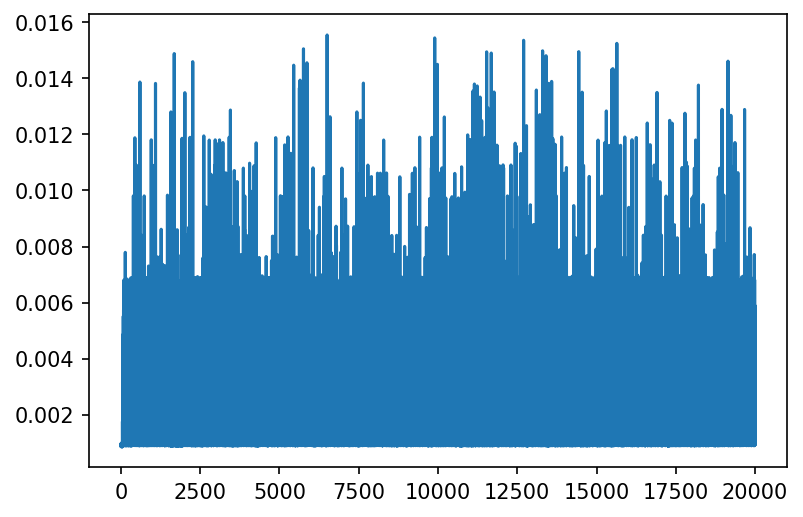

In [20]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(step_times_1)

In [ ]:
# Tolerance: 1.0e6

In [17]:
# PeriodicNonEq
from openmmtools.integrators import PeriodicNonequilibriumIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = PeriodicNonequilibriumIntegrator(DEFAULT_ALCHEMICAL_FUNCTIONS, nsteps_eq, nsteps_neq, neq_splitting, timestep=timestep)


In [21]:
integrator.setConstraintTolerance(1e-6)

In [22]:
integrator.getConstraintTolerance()

1e-06

In [23]:
from simtk import openmm

temperature = 300*unit.kelvin
collision_rate = 90/unit.picosecond
platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [25]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [26]:
# Run neq
ncycles = 1
forward_works_master, reverse_works_master = list(), list()
for _ in range(ncycles):
    # Equilibrium (lambda = 0)
    _logger.info(f'Starting to equilibrate at lambda = 0')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 0, took: {elapsed_time / unit.seconds} seconds')

    # Forward (0 -> 1)
    forward_works = [integrator.get_protocol_work(dimensionless=True)]
    forward_times = []
    for fwd_step in range(nsteps_neq):
        _logger.info(f'forward NEQ step: {fwd_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        forward_times.append(elapsed_time)
        forward_works.append(integrator.get_protocol_work(dimensionless=True))
    forward_works_master.append(forward_works)

    # Equilibrium (lambda = 1)
    _logger.info(f'Starting to equilibrate at lambda = 1')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 1, took: {elapsed_time / unit.seconds} seconds')

    # Reverse work (1 -> 0)
    reverse_works = [integrator.get_protocol_work(dimensionless=True)]
    reverse_times = []
    for rev_step in range(nsteps_neq):
        _logger.info(f'reverse NEQ step: {rev_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        reverse_times.append(elapsed_time)
        reverse_works.append(integrator.get_protocol_work(dimensionless=True))
    reverse_works_master.append(reverse_works)

INFO:root:Starting to equilibrate at lambda = 0
INFO:root:Done equilibrating at lambda = 0, took: 62.89034104347229 seconds
INFO:root:forward NEQ step: 0, took: 62.89034104347229 seconds
INFO:root:forward NEQ step: 1, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 2, took: 0.0008518695831298828 seconds
INFO:root:forward NEQ step: 3, took: 0.0008416175842285156 seconds
INFO:root:forward NEQ step: 4, took: 0.0008525848388671875 seconds
INFO:root:forward NEQ step: 5, took: 0.0009496212005615234 seconds
INFO:root:forward NEQ step: 6, took: 0.0008471012115478516 seconds
INFO:root:forward NEQ step: 7, took: 0.0008547306060791016 seconds
INFO:root:forward NEQ step: 8, took: 0.0008497238159179688 seconds
INFO:root:forward NEQ step: 9, took: 0.0008497238159179688 seconds
INFO:root:forward NEQ step: 10, took: 0.0009486675262451172 seconds
INFO:root:forward NEQ step: 11, took: 0.0008218288421630859 seconds
INFO:root:forward NEQ step: 12, took: 0.0008392333984375 seconds
INFO:root

INFO:root:forward NEQ step: 119, took: 0.0010292530059814453 seconds
INFO:root:forward NEQ step: 120, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 121, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 122, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 123, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 124, took: 0.005753993988037109 seconds
INFO:root:forward NEQ step: 125, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 126, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 127, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 128, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 129, took: 0.0009362697601318359 seconds
INFO:root:forward NEQ step: 130, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 131, took: 0.007799863815307617 seconds
INFO:root:forward NEQ step: 132, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 133, too

INFO:root:forward NEQ step: 239, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 240, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 241, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 242, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 243, took: 0.0009531974792480469 seconds
INFO:root:forward NEQ step: 244, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 245, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 246, took: 0.008404016494750977 seconds
INFO:root:forward NEQ step: 247, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 248, took: 0.0009839534759521484 seconds
INFO:root:forward NEQ step: 249, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 250, took: 0.0019750595092773438 seconds
INFO:root:forward NEQ step: 251, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 252, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 253, too

INFO:root:forward NEQ step: 359, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 360, took: 0.0010077953338623047 seconds
INFO:root:forward NEQ step: 361, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 362, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 363, took: 0.005799531936645508 seconds
INFO:root:forward NEQ step: 364, took: 0.0009436607360839844 seconds
INFO:root:forward NEQ step: 365, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 366, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 367, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 368, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 369, took: 0.0009484291076660156 seconds
INFO:root:forward NEQ step: 370, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 371, took: 0.005797386169433594 seconds
INFO:root:forward NEQ step: 372, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 373, took: 0

INFO:root:forward NEQ step: 479, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 480, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 481, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 482, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 483, took: 0.00580286979675293 seconds
INFO:root:forward NEQ step: 484, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 485, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 486, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 487, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 488, took: 0.000997304916381836 seconds
INFO:root:forward NEQ step: 489, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 490, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 491, took: 0.00662541389465332 seconds
INFO:root:forward NEQ step: 492, took: 0.0009405612945556641 seconds
INFO:root:forward NEQ step: 493, took: 

INFO:root:forward NEQ step: 599, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 600, took: 0.0018990039825439453 seconds
INFO:root:forward NEQ step: 601, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 602, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 603, took: 0.006487846374511719 seconds
INFO:root:forward NEQ step: 604, took: 0.0009539127349853516 seconds
INFO:root:forward NEQ step: 605, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 606, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 607, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 608, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 609, took: 0.001004934310913086 seconds
INFO:root:forward NEQ step: 610, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 611, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 612, took: 0.005972385406494141 seconds
INFO:root:forward NEQ step: 613, took

INFO:root:forward NEQ step: 719, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 720, took: 0.0057947635650634766 seconds
INFO:root:forward NEQ step: 721, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 722, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 723, took: 0.0010099411010742188 seconds
INFO:root:forward NEQ step: 724, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 725, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 726, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 727, took: 0.005662202835083008 seconds
INFO:root:forward NEQ step: 728, took: 0.0009555816650390625 seconds
INFO:root:forward NEQ step: 729, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 730, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 731, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 732, took: 0.0010247230529785156 seconds
INFO:root:forward NEQ step: 733, to

INFO:root:forward NEQ step: 839, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 840, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 841, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 842, took: 0.006615161895751953 seconds
INFO:root:forward NEQ step: 843, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 844, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 845, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 846, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 847, took: 0.001003265380859375 seconds
INFO:root:forward NEQ step: 848, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 849, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 850, took: 0.008625507354736328 seconds
INFO:root:forward NEQ step: 851, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 852, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 853, took

INFO:root:forward NEQ step: 959, took: 0.0009546279907226562 seconds
INFO:root:forward NEQ step: 960, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 961, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 962, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 963, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 964, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 965, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 966, took: 0.005730390548706055 seconds
INFO:root:forward NEQ step: 967, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 968, took: 0.0009450912475585938 seconds
INFO:root:forward NEQ step: 969, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 970, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 971, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 972, took: 0.0009369850158691406 seconds
INFO:root:forward NEQ step: 973, took:

INFO:root:forward NEQ step: 1077, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 1078, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 1079, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 1080, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 1081, took: 0.00102996826171875 seconds
INFO:root:forward NEQ step: 1082, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 1083, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 1084, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 1085, took: 0.0009458065032958984 seconds
INFO:root:forward NEQ step: 1086, took: 0.006622314453125 seconds
INFO:root:forward NEQ step: 1087, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 1088, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 1089, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 1090, took: 0.0009474754333496094 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 1195, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 1196, took: 0.0009377002716064453 seconds
INFO:root:forward NEQ step: 1197, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 1198, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 1199, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 1200, took: 0.0018393993377685547 seconds
INFO:root:forward NEQ step: 1201, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 1202, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 1203, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 1204, took: 0.006891727447509766 seconds
INFO:root:forward NEQ step: 1205, took: 0.0010187625885009766 seconds
INFO:root:forward NEQ step: 1206, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 1207, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 1208, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1313, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 1314, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 1315, took: 0.012910127639770508 seconds
INFO:root:forward NEQ step: 1316, took: 0.0009515285491943359 seconds
INFO:root:forward NEQ step: 1317, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 1318, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 1319, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 1320, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 1321, took: 0.0010142326354980469 seconds
INFO:root:forward NEQ step: 1322, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 1323, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 1324, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 1325, took: 0.0009393692016601562 seconds
INFO:root:forward NEQ step: 1326, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1431, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 1432, took: 0.0010030269622802734 seconds
INFO:root:forward NEQ step: 1433, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 1434, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 1435, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 1436, took: 0.008360862731933594 seconds
INFO:root:forward NEQ step: 1437, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 1438, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 1439, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 1440, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 1441, took: 0.0009479522705078125 seconds
INFO:root:forward NEQ step: 1442, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 1443, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 1444, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1549, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 1550, took: 0.0019383430480957031 seconds
INFO:root:forward NEQ step: 1551, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 1552, took: 0.005808591842651367 seconds
INFO:root:forward NEQ step: 1553, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 1554, took: 0.0009355545043945312 seconds
INFO:root:forward NEQ step: 1555, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 1556, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 1557, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 1558, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 1559, took: 0.0009982585906982422 seconds
INFO:root:forward NEQ step: 1560, took: 0.005795955657958984 seconds
INFO:root:forward NEQ step: 1561, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 1562, took: 0.0015385150909423828 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 1667, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 1668, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 1669, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 1670, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 1671, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 1672, took: 0.0009925365447998047 seconds
INFO:root:forward NEQ step: 1673, took: 0.006894826889038086 seconds
INFO:root:forward NEQ step: 1674, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 1675, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 1676, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 1677, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 1678, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 1679, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 1680, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1785, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 1786, took: 0.0009453296661376953 seconds
INFO:root:forward NEQ step: 1787, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 1788, took: 0.006806850433349609 seconds
INFO:root:forward NEQ step: 1789, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 1790, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 1791, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 1792, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 1793, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 1794, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 1795, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 1796, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 1797, took: 0.005799531936645508 seconds
INFO:root:forward NEQ step: 1798, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 1903, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 1904, took: 0.0009322166442871094 seconds
INFO:root:forward NEQ step: 1905, took: 0.007613182067871094 seconds
INFO:root:forward NEQ step: 1906, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 1907, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 1908, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 1909, took: 0.0010216236114501953 seconds
INFO:root:forward NEQ step: 1910, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 1911, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 1912, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 1913, took: 0.0009667873382568359 seconds
INFO:root:forward NEQ step: 1914, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 1915, took: 0.005618572235107422 seconds
INFO:root:forward NEQ step: 1916, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 2021, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 2022, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 2023, took: 0.0010156631469726562 seconds
INFO:root:forward NEQ step: 2024, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 2025, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 2026, took: 0.006622314453125 seconds
INFO:root:forward NEQ step: 2027, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 2028, took: 0.0009999275207519531 seconds
INFO:root:forward NEQ step: 2029, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 2030, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 2031, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 2032, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 2033, took: 0.0010097026824951172 seconds
INFO:root:forward NEQ step: 2034, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 2139, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 2140, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 2141, took: 0.0009465217590332031 seconds
INFO:root:forward NEQ step: 2142, took: 0.006871461868286133 seconds
INFO:root:forward NEQ step: 2143, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 2144, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 2145, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 2146, took: 0.0010182857513427734 seconds
INFO:root:forward NEQ step: 2147, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 2148, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 2149, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 2150, took: 0.009711503982543945 seconds
INFO:root:forward NEQ step: 2151, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 2152, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 2257, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 2258, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 2259, took: 0.0010349750518798828 seconds
INFO:root:forward NEQ step: 2260, took: 0.006864786148071289 seconds
INFO:root:forward NEQ step: 2261, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 2262, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 2263, took: 0.000946044921875 seconds
INFO:root:forward NEQ step: 2264, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 2265, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 2266, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 2267, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 2268, took: 0.0009438991546630859 seconds
INFO:root:forward NEQ step: 2269, took: 0.005810976028442383 seconds
INFO:root:forward NEQ step: 2270, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 2375, took: 0.0056552886962890625 seconds
INFO:root:forward NEQ step: 2376, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 2377, took: 0.0009627342224121094 seconds
INFO:root:forward NEQ step: 2378, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 2379, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 2380, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 2381, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 2382, took: 0.006562471389770508 seconds
INFO:root:forward NEQ step: 2383, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 2384, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 2385, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 2386, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 2387, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 2388, took: 0.0010230541229248047 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 2493, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 2494, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 2495, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 2496, took: 0.00095367431640625 seconds
INFO:root:forward NEQ step: 2497, took: 0.0058078765869140625 seconds
INFO:root:forward NEQ step: 2498, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 2499, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 2500, took: 0.0018427371978759766 seconds
INFO:root:forward NEQ step: 2501, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 2502, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 2503, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 2504, took: 0.011556625366210938 seconds
INFO:root:forward NEQ step: 2505, took: 0.0010173320770263672 seconds
INFO:root:forward NEQ step: 2506, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 2611, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 2612, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 2613, took: 0.0009646415710449219 seconds
INFO:root:forward NEQ step: 2614, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 2615, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 2616, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 2617, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 2618, took: 0.0010645389556884766 seconds
INFO:root:forward NEQ step: 2619, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 2620, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 2621, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 2622, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 2623, took: 0.0010042190551757812 seconds
INFO:root:forward NEQ step: 2624, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 2729, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 2730, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 2731, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 2732, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 2733, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 2734, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 2735, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 2736, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 2737, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 2738, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 2739, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 2740, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 2741, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 2742, took: 0.0009493827819824219 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 2847, took: 0.000942230224609375 seconds
INFO:root:forward NEQ step: 2848, took: 0.0076141357421875 seconds
INFO:root:forward NEQ step: 2849, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 2850, took: 0.0019729137420654297 seconds
INFO:root:forward NEQ step: 2851, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 2852, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 2853, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 2854, took: 0.0009436607360839844 seconds
INFO:root:forward NEQ step: 2855, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 2856, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 2857, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 2858, took: 0.005892515182495117 seconds
INFO:root:forward NEQ step: 2859, took: 0.0009582042694091797 seconds
INFO:root:forward NEQ step: 2860, took: 0.0009708404541015625 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 2965, took: 0.006880760192871094 seconds
INFO:root:forward NEQ step: 2966, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 2967, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 2968, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 2969, took: 0.0009407997131347656 seconds
INFO:root:forward NEQ step: 2970, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 2971, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 2972, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 2973, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 2974, took: 0.005528688430786133 seconds
INFO:root:forward NEQ step: 2975, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 2976, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 2977, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 2978, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3083, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 3084, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 3085, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 3086, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 3087, took: 0.005717039108276367 seconds
INFO:root:forward NEQ step: 3088, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 3089, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 3090, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 3091, took: 0.0010178089141845703 seconds
INFO:root:forward NEQ step: 3092, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 3093, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 3094, took: 0.0066258907318115234 seconds
INFO:root:forward NEQ step: 3095, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 3096, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 3201, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 3202, took: 0.005488872528076172 seconds
INFO:root:forward NEQ step: 3203, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 3204, took: 0.0010726451873779297 seconds
INFO:root:forward NEQ step: 3205, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 3206, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 3207, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 3208, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 3209, took: 0.0010097026824951172 seconds
INFO:root:forward NEQ step: 3210, took: 0.005793094635009766 seconds
INFO:root:forward NEQ step: 3211, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ step: 3212, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 3213, took: 0.001007080078125 seconds
INFO:root:forward NEQ step: 3214, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step:

INFO:root:forward NEQ step: 3319, took: 0.001634836196899414 seconds
INFO:root:forward NEQ step: 3320, took: 0.0012691020965576172 seconds
INFO:root:forward NEQ step: 3321, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 3322, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 3323, took: 0.005809783935546875 seconds
INFO:root:forward NEQ step: 3324, took: 0.001024007797241211 seconds
INFO:root:forward NEQ step: 3325, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 3326, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 3327, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 3328, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 3329, took: 0.0009918212890625 seconds
INFO:root:forward NEQ step: 3330, took: 0.005305290222167969 seconds
INFO:root:forward NEQ step: 3331, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 3332, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 3333,

INFO:root:forward NEQ step: 3437, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 3438, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 3439, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 3440, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 3441, took: 0.0010304450988769531 seconds
INFO:root:forward NEQ step: 3442, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 3443, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 3444, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 3445, took: 0.0009589195251464844 seconds
INFO:root:forward NEQ step: 3446, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 3447, took: 0.0059051513671875 seconds
INFO:root:forward NEQ step: 3448, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 3449, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 3450, took: 0.001981496810913086 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 3555, took: 0.0058019161224365234 seconds
INFO:root:forward NEQ step: 3556, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 3557, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 3558, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 3559, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 3560, took: 0.0010066032409667969 seconds
INFO:root:forward NEQ step: 3561, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 3562, took: 0.005795478820800781 seconds
INFO:root:forward NEQ step: 3563, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 3564, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 3565, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 3566, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 3567, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 3568, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3673, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 3674, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 3675, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 3676, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 3677, took: 0.0065953731536865234 seconds
INFO:root:forward NEQ step: 3678, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 3679, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 3680, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 3681, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 3682, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 3683, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 3684, took: 0.0010154247283935547 seconds
INFO:root:forward NEQ step: 3685, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 3686, took: 0.007422447204589844 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 3791, took: 0.0008683204650878906 seconds
INFO:root:forward NEQ step: 3792, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 3793, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 3794, took: 0.006849527359008789 seconds
INFO:root:forward NEQ step: 3795, took: 0.0009479522705078125 seconds
INFO:root:forward NEQ step: 3796, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 3797, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 3798, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 3799, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 3800, took: 0.0018656253814697266 seconds
INFO:root:forward NEQ step: 3801, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 3802, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 3803, took: 0.005796670913696289 seconds
INFO:root:forward NEQ step: 3804, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3909, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 3910, took: 0.0010037422180175781 seconds
INFO:root:forward NEQ step: 3911, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 3912, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 3913, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 3914, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 3915, took: 0.0009303092956542969 seconds
INFO:root:forward NEQ step: 3916, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 3917, took: 0.006903648376464844 seconds
INFO:root:forward NEQ step: 3918, took: 0.0008759498596191406 seconds
INFO:root:forward NEQ step: 3919, took: 0.0009315013885498047 seconds
INFO:root:forward NEQ step: 3920, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 3921, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 3922, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 4027, took: 0.0010039806365966797 seconds
INFO:root:forward NEQ step: 4028, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 4029, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 4030, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 4031, took: 0.0058863162994384766 seconds
INFO:root:forward NEQ step: 4032, took: 0.001005411148071289 seconds
INFO:root:forward NEQ step: 4033, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 4034, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 4035, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 4036, took: 0.0009448528289794922 seconds
INFO:root:forward NEQ step: 4037, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 4038, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 4039, took: 0.00571751594543457 seconds
INFO:root:forward NEQ step: 4040, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 4145, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 4146, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 4147, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 4148, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 4149, took: 0.0009465217590332031 seconds
INFO:root:forward NEQ step: 4150, took: 0.00798487663269043 seconds
INFO:root:forward NEQ step: 4151, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 4152, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 4153, took: 0.0008754730224609375 seconds
INFO:root:forward NEQ step: 4154, took: 0.0010371208190917969 seconds
INFO:root:forward NEQ step: 4155, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 4156, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 4157, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 4158, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4263, took: 0.0010344982147216797 seconds
INFO:root:forward NEQ step: 4264, took: 0.0018475055694580078 seconds
INFO:root:forward NEQ step: 4265, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 4266, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 4267, took: 0.0010235309600830078 seconds
INFO:root:forward NEQ step: 4268, took: 0.009502887725830078 seconds
INFO:root:forward NEQ step: 4269, took: 0.0024590492248535156 seconds
INFO:root:forward NEQ step: 4270, took: 0.0041828155517578125 seconds
INFO:root:forward NEQ step: 4271, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 4272, took: 0.0010106563568115234 seconds
INFO:root:forward NEQ step: 4273, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 4274, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 4275, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 4276, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 4381, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 4382, took: 0.0009572505950927734 seconds
INFO:root:forward NEQ step: 4383, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 4384, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 4385, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 4386, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 4387, took: 0.0009407997131347656 seconds
INFO:root:forward NEQ step: 4388, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 4389, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 4390, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 4391, took: 0.005803585052490234 seconds
INFO:root:forward NEQ step: 4392, took: 0.0010042190551757812 seconds
INFO:root:forward NEQ step: 4393, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 4394, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4499, took: 0.005850553512573242 seconds
INFO:root:forward NEQ step: 4500, took: 0.0019998550415039062 seconds
INFO:root:forward NEQ step: 4501, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 4502, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 4503, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 4504, took: 0.0009887218475341797 seconds
INFO:root:forward NEQ step: 4505, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 4506, took: 0.006867170333862305 seconds
INFO:root:forward NEQ step: 4507, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 4508, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 4509, took: 0.0009949207305908203 seconds
INFO:root:forward NEQ step: 4510, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 4511, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 4512, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4617, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 4618, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 4619, took: 0.0009975433349609375 seconds
INFO:root:forward NEQ step: 4620, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 4621, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 4622, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 4623, took: 0.0009331703186035156 seconds
INFO:root:forward NEQ step: 4624, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 4625, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 4626, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 4627, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 4628, took: 0.0010008811950683594 seconds
INFO:root:forward NEQ step: 4629, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 4630, took: 0.00090789794921875 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4735, took: 0.0009577274322509766 seconds
INFO:root:forward NEQ step: 4736, took: 0.0057392120361328125 seconds
INFO:root:forward NEQ step: 4737, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 4738, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 4739, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 4740, took: 0.0009472370147705078 seconds
INFO:root:forward NEQ step: 4741, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 4742, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 4743, took: 0.009705781936645508 seconds
INFO:root:forward NEQ step: 4744, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 4745, took: 0.0009946823120117188 seconds
INFO:root:forward NEQ step: 4746, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 4747, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 4748, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 4853, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 4854, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 4855, took: 0.0010120868682861328 seconds
INFO:root:forward NEQ step: 4856, took: 0.00680851936340332 seconds
INFO:root:forward NEQ step: 4857, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 4858, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 4859, took: 0.0009555816650390625 seconds
INFO:root:forward NEQ step: 4860, took: 0.000934600830078125 seconds
INFO:root:forward NEQ step: 4861, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 4862, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 4863, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 4864, took: 0.0009474754333496094 seconds
INFO:root:forward NEQ step: 4865, took: 0.005802154541015625 seconds
INFO:root:forward NEQ step: 4866, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 4971, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 4972, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 4973, took: 0.005805015563964844 seconds
INFO:root:forward NEQ step: 4974, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 4975, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 4976, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 4977, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 4978, took: 0.001005411148071289 seconds
INFO:root:forward NEQ step: 4979, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 4980, took: 0.006887674331665039 seconds
INFO:root:forward NEQ step: 4981, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 4982, took: 0.0009400844573974609 seconds
INFO:root:forward NEQ step: 4983, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 4984, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5089, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 5090, took: 0.005747556686401367 seconds
INFO:root:forward NEQ step: 5091, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 5092, took: 0.00102996826171875 seconds
INFO:root:forward NEQ step: 5093, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 5094, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 5095, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 5096, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 5097, took: 0.006571292877197266 seconds
INFO:root:forward NEQ step: 5098, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 5099, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 5100, took: 0.0018367767333984375 seconds
INFO:root:forward NEQ step: 5101, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 5102, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 5207, took: 0.008794307708740234 seconds
INFO:root:forward NEQ step: 5208, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 5209, took: 0.0009524822235107422 seconds
INFO:root:forward NEQ step: 5210, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 5211, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 5212, took: 0.0009357929229736328 seconds
INFO:root:forward NEQ step: 5213, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 5214, took: 0.0009429454803466797 seconds
INFO:root:forward NEQ step: 5215, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 5216, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 5217, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 5218, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 5219, took: 0.0058481693267822266 seconds
INFO:root:forward NEQ step: 5220, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 5325, took: 0.005888462066650391 seconds
INFO:root:forward NEQ step: 5326, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 5327, took: 0.0015566349029541016 seconds
INFO:root:forward NEQ step: 5328, took: 0.0012364387512207031 seconds
INFO:root:forward NEQ step: 5329, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 5330, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 5331, took: 0.005586385726928711 seconds
INFO:root:forward NEQ step: 5332, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 5333, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 5334, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 5335, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 5336, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 5337, took: 0.0010056495666503906 seconds
INFO:root:forward NEQ step: 5338, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 5443, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 5444, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 5445, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 5446, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 5447, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 5448, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 5449, took: 0.0010144710540771484 seconds
INFO:root:forward NEQ step: 5450, took: 0.006883382797241211 seconds
INFO:root:forward NEQ step: 5451, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 5452, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 5453, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 5454, took: 0.001001596450805664 seconds
INFO:root:forward NEQ step: 5455, took: 0.0008749961853027344 seconds
INFO:root:forward NEQ step: 5456, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5561, took: 0.00577855110168457 seconds
INFO:root:forward NEQ step: 5562, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 5563, took: 0.0010020732879638672 seconds
INFO:root:forward NEQ step: 5564, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 5565, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 5566, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 5567, took: 0.0010044574737548828 seconds
INFO:root:forward NEQ step: 5568, took: 0.005579233169555664 seconds
INFO:root:forward NEQ step: 5569, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 5570, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 5571, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 5572, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 5573, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 5574, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 5679, took: 0.0009453296661376953 seconds
INFO:root:forward NEQ step: 5680, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 5681, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 5682, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 5683, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 5684, took: 0.0009982585906982422 seconds
INFO:root:forward NEQ step: 5685, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 5686, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 5687, took: 0.0009512901306152344 seconds
INFO:root:forward NEQ step: 5688, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 5689, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 5690, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 5691, took: 0.0009386539459228516 seconds
INFO:root:forward NEQ step: 5692, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 5797, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 5798, took: 0.0009357929229736328 seconds
INFO:root:forward NEQ step: 5799, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 5800, took: 0.001995563507080078 seconds
INFO:root:forward NEQ step: 5801, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 5802, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 5803, took: 0.0009477138519287109 seconds
INFO:root:forward NEQ step: 5804, took: 0.005440473556518555 seconds
INFO:root:forward NEQ step: 5805, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 5806, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 5807, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 5808, took: 0.0010144710540771484 seconds
INFO:root:forward NEQ step: 5809, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 5810, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5915, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 5916, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 5917, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 5918, took: 0.0076677799224853516 seconds
INFO:root:forward NEQ step: 5919, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 5920, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 5921, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 5922, took: 0.0009427070617675781 seconds
INFO:root:forward NEQ step: 5923, took: 0.0009632110595703125 seconds
INFO:root:forward NEQ step: 5924, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 5925, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 5926, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 5927, took: 0.0010123252868652344 seconds
INFO:root:forward NEQ step: 5928, took: 0.005805253982543945 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 6033, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 6034, took: 0.00739598274230957 seconds
INFO:root:forward NEQ step: 6035, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 6036, took: 0.000997304916381836 seconds
INFO:root:forward NEQ step: 6037, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 6038, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 6039, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 6040, took: 0.0009496212005615234 seconds
INFO:root:forward NEQ step: 6041, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 6042, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 6043, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 6044, took: 0.0008745193481445312 seconds
INFO:root:forward NEQ step: 6045, took: 0.005669116973876953 seconds
INFO:root:forward NEQ step: 6046, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 6151, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 6152, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 6153, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 6154, took: 0.0009322166442871094 seconds
INFO:root:forward NEQ step: 6155, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 6156, took: 0.005731821060180664 seconds
INFO:root:forward NEQ step: 6157, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 6158, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 6159, took: 0.0009253025054931641 seconds
INFO:root:forward NEQ step: 6160, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 6161, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 6162, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 6163, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 6164, took: 0.005756378173828125 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 6269, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 6270, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 6271, took: 0.005721092224121094 seconds
INFO:root:forward NEQ step: 6272, took: 0.0010318756103515625 seconds
INFO:root:forward NEQ step: 6273, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 6274, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 6275, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 6276, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 6277, took: 0.001020193099975586 seconds
INFO:root:forward NEQ step: 6278, took: 0.006632089614868164 seconds
INFO:root:forward NEQ step: 6279, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 6280, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 6281, took: 0.0009729862213134766 seconds
INFO:root:forward NEQ step: 6282, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 6387, took: 0.0009653568267822266 seconds
INFO:root:forward NEQ step: 6388, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 6389, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 6390, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 6391, took: 0.0009300708770751953 seconds
INFO:root:forward NEQ step: 6392, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 6393, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 6394, took: 0.006883859634399414 seconds
INFO:root:forward NEQ step: 6395, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 6396, took: 0.0009281635284423828 seconds
INFO:root:forward NEQ step: 6397, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 6398, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 6399, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 6400, took: 0.0019986629486083984 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 6505, took: 0.0010066032409667969 seconds
INFO:root:forward NEQ step: 6506, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 6507, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 6508, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 6509, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 6510, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 6511, took: 0.005894660949707031 seconds
INFO:root:forward NEQ step: 6512, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 6513, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 6514, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 6515, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 6516, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 6517, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 6518, took: 0.005894660949707031 seconds
INFO:root:forward NEQ step: 

INFO:root:forward NEQ step: 6623, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 6624, took: 0.0010521411895751953 seconds
INFO:root:forward NEQ step: 6625, took: 0.0058100223541259766 seconds
INFO:root:forward NEQ step: 6626, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 6627, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 6628, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 6629, took: 0.0010192394256591797 seconds
INFO:root:forward NEQ step: 6630, took: 0.0009560585021972656 seconds
INFO:root:forward NEQ step: 6631, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 6632, took: 0.0068967342376708984 seconds
INFO:root:forward NEQ step: 6633, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 6634, took: 0.001007080078125 seconds
INFO:root:forward NEQ step: 6635, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 6636, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 6741, took: 0.0009477138519287109 seconds
INFO:root:forward NEQ step: 6742, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 6743, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 6744, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 6745, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 6746, took: 0.001010894775390625 seconds
INFO:root:forward NEQ step: 6747, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 6748, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 6749, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 6750, took: 0.0018694400787353516 seconds
INFO:root:forward NEQ step: 6751, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 6752, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 6753, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 6754, took: 0.000873565673828125 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 6859, took: 0.0010361671447753906 seconds
INFO:root:forward NEQ step: 6860, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 6861, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 6862, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 6863, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 6864, took: 0.0010836124420166016 seconds
INFO:root:forward NEQ step: 6865, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 6866, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 6867, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 6868, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 6869, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 6870, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 6871, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 6872, took: 0.0008985996246337891 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 6977, took: 0.0010156631469726562 seconds
INFO:root:forward NEQ step: 6978, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 6979, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 6980, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 6981, took: 0.00095367431640625 seconds
INFO:root:forward NEQ step: 6982, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 6983, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 6984, took: 0.005795478820800781 seconds
INFO:root:forward NEQ step: 6985, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 6986, took: 0.0010001659393310547 seconds
INFO:root:forward NEQ step: 6987, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 6988, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 6989, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 6990, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 7095, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 7096, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 7097, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 7098, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 7099, took: 0.000990152359008789 seconds
INFO:root:forward NEQ step: 7100, took: 0.006933927536010742 seconds
INFO:root:forward NEQ step: 7101, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 7102, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 7103, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 7104, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 7105, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 7106, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 7107, took: 0.005801200866699219 seconds
INFO:root:forward NEQ step: 7108, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 7213, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 7214, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 7215, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 7216, took: 0.0009596347808837891 seconds
INFO:root:forward NEQ step: 7217, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 7218, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 7219, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 7220, took: 0.00580596923828125 seconds
INFO:root:forward NEQ step: 7221, took: 0.0009427070617675781 seconds
INFO:root:forward NEQ step: 7222, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 7223, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 7224, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 7225, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 7226, took: 0.0009512901306152344 seconds
INFO:root:forward NEQ step: 7

INFO:root:forward NEQ step: 7331, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 7332, took: 0.005303859710693359 seconds
INFO:root:forward NEQ step: 7333, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 7334, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 7335, took: 0.0015714168548583984 seconds
INFO:root:forward NEQ step: 7336, took: 0.0012853145599365234 seconds
INFO:root:forward NEQ step: 7337, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 7338, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 7339, took: 0.008753538131713867 seconds
INFO:root:forward NEQ step: 7340, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 7341, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 7342, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 7343, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 7344, took: 0.0010042190551757812 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 7449, took: 0.006724357604980469 seconds
INFO:root:forward NEQ step: 7450, took: 0.0019731521606445312 seconds
INFO:root:forward NEQ step: 7451, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 7452, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 7453, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 7454, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 7455, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 7456, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 7457, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 7458, took: 0.0058400630950927734 seconds
INFO:root:forward NEQ step: 7459, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 7460, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 7461, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 7462, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 7567, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 7568, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 7569, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 7570, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 7571, took: 0.005612373352050781 seconds
INFO:root:forward NEQ step: 7572, took: 0.0010237693786621094 seconds
INFO:root:forward NEQ step: 7573, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 7574, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 7575, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 7576, took: 0.0010197162628173828 seconds
INFO:root:forward NEQ step: 7577, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 7578, took: 0.005468606948852539 seconds
INFO:root:forward NEQ step: 7579, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 7580, took: 0.0009546279907226562 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 7685, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 7686, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 7687, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 7688, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 7689, took: 0.0009388923645019531 seconds
INFO:root:forward NEQ step: 7690, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 7691, took: 0.0065937042236328125 seconds
INFO:root:forward NEQ step: 7692, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 7693, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 7694, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 7695, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 7696, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 7697, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 7698, took: 0.0008878707885742188 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 7803, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 7804, took: 0.0009942054748535156 seconds
INFO:root:forward NEQ step: 7805, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 7806, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 7807, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 7808, took: 0.0009469985961914062 seconds
INFO:root:forward NEQ step: 7809, took: 0.010811090469360352 seconds
INFO:root:forward NEQ step: 7810, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 7811, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 7812, took: 0.0009427070617675781 seconds
INFO:root:forward NEQ step: 7813, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 7814, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 7815, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 7816, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 7921, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 7922, took: 0.0010251998901367188 seconds
INFO:root:forward NEQ step: 7923, took: 0.005808830261230469 seconds
INFO:root:forward NEQ step: 7924, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 7925, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 7926, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 7927, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 7928, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 7929, took: 0.000873565673828125 seconds
INFO:root:forward NEQ step: 7930, took: 0.006880044937133789 seconds
INFO:root:forward NEQ step: 7931, took: 0.0010161399841308594 seconds
INFO:root:forward NEQ step: 7932, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 7933, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 7934, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8039, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 8040, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 8041, took: 0.001020193099975586 seconds
INFO:root:forward NEQ step: 8042, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 8043, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 8044, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 8045, took: 0.0009377002716064453 seconds
INFO:root:forward NEQ step: 8046, took: 0.008626461029052734 seconds
INFO:root:forward NEQ step: 8047, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 8048, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 8049, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 8050, took: 0.002010345458984375 seconds
INFO:root:forward NEQ step: 8051, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 8052, took: 0.00087738037109375 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 8157, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 8158, took: 0.0009281635284423828 seconds
INFO:root:forward NEQ step: 8159, took: 0.0008709430694580078 seconds
INFO:root:forward NEQ step: 8160, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 8161, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 8162, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 8163, took: 0.005893707275390625 seconds
INFO:root:forward NEQ step: 8164, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 8165, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 8166, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 8167, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 8168, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 8169, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 8170, took: 0.0068013668060302734 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 8275, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 8276, took: 0.0009524822235107422 seconds
INFO:root:forward NEQ step: 8277, took: 0.005809307098388672 seconds
INFO:root:forward NEQ step: 8278, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 8279, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 8280, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 8281, took: 0.0010225772857666016 seconds
INFO:root:forward NEQ step: 8282, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 8283, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 8284, took: 0.006494998931884766 seconds
INFO:root:forward NEQ step: 8285, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 8286, took: 0.0009479522705078125 seconds
INFO:root:forward NEQ step: 8287, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 8288, took: 0.0009248256683349609 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8393, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 8394, took: 0.005898237228393555 seconds
INFO:root:forward NEQ step: 8395, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 8396, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 8397, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 8398, took: 0.0009398460388183594 seconds
INFO:root:forward NEQ step: 8399, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 8400, took: 0.001966714859008789 seconds
INFO:root:forward NEQ step: 8401, took: 0.005796670913696289 seconds
INFO:root:forward NEQ step: 8402, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 8403, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 8404, took: 0.001016378402709961 seconds
INFO:root:forward NEQ step: 8405, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 8406, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 8511, took: 0.0057964324951171875 seconds
INFO:root:forward NEQ step: 8512, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 8513, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 8514, took: 0.0009458065032958984 seconds
INFO:root:forward NEQ step: 8515, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 8516, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 8517, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 8518, took: 0.0068857669830322266 seconds
INFO:root:forward NEQ step: 8519, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 8520, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 8521, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 8522, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 8523, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 8524, took: 0.0010030269622802734 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 8629, took: 0.0009603500366210938 seconds
INFO:root:forward NEQ step: 8630, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 8631, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 8632, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 8633, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 8634, took: 0.0009469985961914062 seconds
INFO:root:forward NEQ step: 8635, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 8636, took: 0.005756378173828125 seconds
INFO:root:forward NEQ step: 8637, took: 0.001056671142578125 seconds
INFO:root:forward NEQ step: 8638, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 8639, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 8640, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 8641, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 8642, took: 0.005695819854736328 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8747, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 8748, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 8749, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 8750, took: 0.00796961784362793 seconds
INFO:root:forward NEQ step: 8751, took: 0.0009639263153076172 seconds
INFO:root:forward NEQ step: 8752, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 8753, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 8754, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 8755, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 8756, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 8757, took: 0.008278369903564453 seconds
INFO:root:forward NEQ step: 8758, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 8759, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 8760, took: 0.0010161399841308594 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8865, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 8866, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 8867, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 8868, took: 0.0009329319000244141 seconds
INFO:root:forward NEQ step: 8869, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 8870, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 8871, took: 0.005769252777099609 seconds
INFO:root:forward NEQ step: 8872, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 8873, took: 0.0009987354278564453 seconds
INFO:root:forward NEQ step: 8874, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 8875, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 8876, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 8877, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 8878, took: 0.01162099838256836 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8983, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 8984, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 8985, took: 0.010614871978759766 seconds
INFO:root:forward NEQ step: 8986, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 8987, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 8988, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 8989, took: 0.0009419918060302734 seconds
INFO:root:forward NEQ step: 8990, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 8991, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 8992, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 8993, took: 0.0009281635284423828 seconds
INFO:root:forward NEQ step: 8994, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 8995, took: 0.0010218620300292969 seconds
INFO:root:forward NEQ step: 8996, took: 0.00090789794921875 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9101, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 9102, took: 0.0054874420166015625 seconds
INFO:root:forward NEQ step: 9103, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 9104, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 9105, took: 0.0010139942169189453 seconds
INFO:root:forward NEQ step: 9106, took: 0.0009620189666748047 seconds
INFO:root:forward NEQ step: 9107, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 9108, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 9109, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 9110, took: 0.005800485610961914 seconds
INFO:root:forward NEQ step: 9111, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 9112, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 9113, took: 0.0009500980377197266 seconds
INFO:root:forward NEQ step: 9114, took: 0.0009407997131347656 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 9219, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 9220, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 9221, took: 0.0009584426879882812 seconds
INFO:root:forward NEQ step: 9222, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 9223, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 9224, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 9225, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 9226, took: 0.0010161399841308594 seconds
INFO:root:forward NEQ step: 9227, took: 0.00580286979675293 seconds
INFO:root:forward NEQ step: 9228, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 9229, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 9230, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 9231, took: 0.00102996826171875 seconds
INFO:root:forward NEQ step: 9232, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 9337, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 9338, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 9339, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 9340, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 9341, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 9342, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 9343, took: 0.001590728759765625 seconds
INFO:root:forward NEQ step: 9344, took: 0.007970571517944336 seconds
INFO:root:forward NEQ step: 9345, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 9346, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 9347, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 9348, took: 0.0010187625885009766 seconds
INFO:root:forward NEQ step: 9349, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 9350, took: 0.0018465518951416016 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9455, took: 0.0010094642639160156 seconds
INFO:root:forward NEQ step: 9456, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 9457, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 9458, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 9459, took: 0.006061553955078125 seconds
INFO:root:forward NEQ step: 9460, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 9461, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 9462, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 9463, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 9464, took: 0.0009517669677734375 seconds
INFO:root:forward NEQ step: 9465, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 9466, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 9467, took: 0.0066568851470947266 seconds
INFO:root:forward NEQ step: 9468, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 9573, took: 0.0010085105895996094 seconds
INFO:root:forward NEQ step: 9574, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 9575, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 9576, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 9577, took: 0.0055963993072509766 seconds
INFO:root:forward NEQ step: 9578, took: 0.0009555816650390625 seconds
INFO:root:forward NEQ step: 9579, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 9580, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 9581, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 9582, took: 0.000949859619140625 seconds
INFO:root:forward NEQ step: 9583, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 9584, took: 0.007310390472412109 seconds
INFO:root:forward NEQ step: 9585, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 9586, took: 0.0009443759918212891 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 9691, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 9692, took: 0.001001119613647461 seconds
INFO:root:forward NEQ step: 9693, took: 0.006820201873779297 seconds
INFO:root:forward NEQ step: 9694, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 9695, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 9696, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 9697, took: 0.001013040542602539 seconds
INFO:root:forward NEQ step: 9698, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 9699, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 9700, took: 0.0018565654754638672 seconds
INFO:root:forward NEQ step: 9701, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 9702, took: 0.005885124206542969 seconds
INFO:root:forward NEQ step: 9703, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 9704, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 

INFO:root:forward NEQ step: 9809, took: 0.0010340213775634766 seconds
INFO:root:forward NEQ step: 9810, took: 0.006922721862792969 seconds
INFO:root:forward NEQ step: 9811, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 9812, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 9813, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 9814, took: 0.00106048583984375 seconds
INFO:root:forward NEQ step: 9815, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 9816, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 9817, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 9818, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 9819, took: 0.009822607040405273 seconds
INFO:root:forward NEQ step: 9820, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 9821, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 9822, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 9927, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 9928, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 9929, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 9930, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 9931, took: 0.0010139942169189453 seconds
INFO:root:forward NEQ step: 9932, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 9933, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 9934, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 9935, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 9936, took: 0.0010099411010742188 seconds
INFO:root:forward NEQ step: 9937, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 9938, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 9939, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 9940, took: 0.0008976459503173828 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 10044, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 10045, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 10046, took: 0.0010230541229248047 seconds
INFO:root:forward NEQ step: 10047, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 10048, took: 0.005804538726806641 seconds
INFO:root:forward NEQ step: 10049, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 10050, took: 0.0019969940185546875 seconds
INFO:root:forward NEQ step: 10051, took: 0.0009291172027587891 seconds
INFO:root:forward NEQ step: 10052, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 10053, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 10054, took: 0.0010137557983398438 seconds
INFO:root:forward NEQ step: 10055, took: 0.003969669342041016 seconds
INFO:root:forward NEQ step: 10056, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 10057, took: 0.0008924007415771484 seconds
INFO:roo

INFO:root:forward NEQ step: 10160, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 10161, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 10162, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 10163, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 10164, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 10165, took: 0.005773782730102539 seconds
INFO:root:forward NEQ step: 10166, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 10167, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 10168, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 10169, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 10170, took: 0.001016378402709961 seconds
INFO:root:forward NEQ step: 10171, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 10172, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 10173, took: 0.006811380386352539 seconds
INFO:root:f

INFO:root:forward NEQ step: 10276, took: 0.000946044921875 seconds
INFO:root:forward NEQ step: 10277, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 10278, took: 0.0009233951568603516 seconds
INFO:root:forward NEQ step: 10279, took: 0.006624698638916016 seconds
INFO:root:forward NEQ step: 10280, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 10281, took: 0.0009548664093017578 seconds
INFO:root:forward NEQ step: 10282, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 10283, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 10284, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 10285, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 10286, took: 0.001035451889038086 seconds
INFO:root:forward NEQ step: 10287, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 10288, took: 0.00683140754699707 seconds
INFO:root:forward NEQ step: 10289, took: 0.0008957386016845703 seconds
INFO:root:forward

INFO:root:forward NEQ step: 10392, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 10393, took: 0.006630659103393555 seconds
INFO:root:forward NEQ step: 10394, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 10395, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 10396, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 10397, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 10398, took: 0.0009438991546630859 seconds
INFO:root:forward NEQ step: 10399, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 10400, took: 0.0018718242645263672 seconds
INFO:root:forward NEQ step: 10401, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 10402, took: 0.009837627410888672 seconds
INFO:root:forward NEQ step: 10403, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 10404, took: 0.0010132789611816406 seconds
INFO:root:forward NEQ step: 10405, took: 0.0008990764617919922 seconds
INFO:root

INFO:root:forward NEQ step: 10508, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 10509, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 10510, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 10511, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 10512, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 10513, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 10514, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 10515, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 10516, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 10517, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 10518, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 10519, took: 0.0009248256683349609 seconds
INFO:root:forward NEQ step: 10520, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 10521, took: 0.0008866786956787109 seconds
INFO:ro

INFO:root:forward NEQ step: 10624, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 10625, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 10626, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 10627, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 10628, took: 0.000985860824584961 seconds
INFO:root:forward NEQ step: 10629, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 10630, took: 0.009710073471069336 seconds
INFO:root:forward NEQ step: 10631, took: 0.0008759498596191406 seconds
INFO:root:forward NEQ step: 10632, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 10633, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 10634, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 10635, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ step: 10636, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 10637, took: 0.0010035037994384766 seconds
INFO:roo

INFO:root:forward NEQ step: 10740, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 10741, took: 0.009581804275512695 seconds
INFO:root:forward NEQ step: 10742, took: 0.0009310245513916016 seconds
INFO:root:forward NEQ step: 10743, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 10744, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 10745, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 10746, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 10747, took: 0.0009355545043945312 seconds
INFO:root:forward NEQ step: 10748, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 10749, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 10750, took: 0.0018537044525146484 seconds
INFO:root:forward NEQ step: 10751, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 10752, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 10753, took: 0.0008902549743652344 seconds
INFO:ro

INFO:root:forward NEQ step: 10856, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 10857, took: 0.0009458065032958984 seconds
INFO:root:forward NEQ step: 10858, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 10859, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 10860, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 10861, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ step: 10862, took: 0.006891727447509766 seconds
INFO:root:forward NEQ step: 10863, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 10864, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 10865, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 10866, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 10867, took: 0.0009927749633789062 seconds
INFO:root:forward NEQ step: 10868, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 10869, took: 0.0009095668792724609 seconds
INFO:ro

INFO:root:forward NEQ step: 10972, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 10973, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 10974, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 10975, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 10976, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 10977, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ step: 10978, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 10979, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 10980, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 10981, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 10982, took: 0.0010106563568115234 seconds
INFO:root:forward NEQ step: 10983, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 10984, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 10985, took: 0.0008988380432128906 seconds
INFO:root:

INFO:root:forward NEQ step: 11088, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 11089, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 11090, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 11091, took: 0.0010044574737548828 seconds
INFO:root:forward NEQ step: 11092, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 11093, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 11094, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 11095, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 11096, took: 0.0010266304016113281 seconds
INFO:root:forward NEQ step: 11097, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 11098, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 11099, took: 0.006608724594116211 seconds
INFO:root:forward NEQ step: 11100, took: 0.002547025680541992 seconds
INFO:root:forward NEQ step: 11101, took: 0.0012936592102050781 seconds
INFO:roo

INFO:root:forward NEQ step: 11204, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 11205, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 11206, took: 0.005853176116943359 seconds
INFO:root:forward NEQ step: 11207, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 11208, took: 0.0010328292846679688 seconds
INFO:root:forward NEQ step: 11209, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 11210, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 11211, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 11212, took: 0.0009355545043945312 seconds
INFO:root:forward NEQ step: 11213, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 11214, took: 0.005895853042602539 seconds
INFO:root:forward NEQ step: 11215, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 11216, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 11217, took: 0.0010025501251220703 seconds
INFO:roo

INFO:root:forward NEQ step: 11320, took: 0.0058078765869140625 seconds
INFO:root:forward NEQ step: 11321, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 11322, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 11323, took: 0.0010116100311279297 seconds
INFO:root:forward NEQ step: 11324, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 11325, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 11326, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 11327, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 11328, took: 0.0067064762115478516 seconds
INFO:root:forward NEQ step: 11329, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 11330, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 11331, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 11332, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 11333, took: 0.0010113716125488281 seconds
INFO:roo

INFO:root:forward NEQ step: 11436, took: 0.0009491443634033203 seconds
INFO:root:forward NEQ step: 11437, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 11438, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 11439, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 11440, took: 0.002167940139770508 seconds
INFO:root:forward NEQ step: 11441, took: 0.0009577274322509766 seconds
INFO:root:forward NEQ step: 11442, took: 0.006874799728393555 seconds
INFO:root:forward NEQ step: 11443, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 11444, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 11445, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 11446, took: 0.0009372234344482422 seconds
INFO:root:forward NEQ step: 11447, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 11448, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 11449, took: 0.000873565673828125 seconds
INFO:root:for

INFO:root:forward NEQ step: 11552, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 11553, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 11554, took: 0.0009326934814453125 seconds
INFO:root:forward NEQ step: 11555, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 11556, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 11557, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 11558, took: 0.006664276123046875 seconds
INFO:root:forward NEQ step: 11559, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 11560, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 11561, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 11562, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 11563, took: 0.0009503364562988281 seconds
INFO:root:forward NEQ step: 11564, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 11565, took: 0.0009052753448486328 seconds
INFO:ro

INFO:root:forward NEQ step: 11668, took: 0.0010192394256591797 seconds
INFO:root:forward NEQ step: 11669, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 11670, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 11671, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 11672, took: 0.0009183883666992188 seconds
INFO:root:forward NEQ step: 11673, took: 0.0010111331939697266 seconds
INFO:root:forward NEQ step: 11674, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 11675, took: 0.005805253982543945 seconds
INFO:root:forward NEQ step: 11676, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 11677, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 11678, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 11679, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 11680, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 11681, took: 0.0008914470672607422 seconds
INFO:ro

INFO:root:forward NEQ step: 11784, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 11785, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 11786, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 11787, took: 0.005932807922363281 seconds
INFO:root:forward NEQ step: 11788, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 11789, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 11790, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 11791, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 11792, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 11793, took: 0.0010104179382324219 seconds
INFO:root:forward NEQ step: 11794, took: 0.0059320926666259766 seconds
INFO:root:forward NEQ step: 11795, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 11796, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 11797, took: 0.0009331703186035156 seconds
INFO:roo

INFO:root:forward NEQ step: 11900, took: 0.0069522857666015625 seconds
INFO:root:forward NEQ step: 11901, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 11902, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 11903, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 11904, took: 0.0009322166442871094 seconds
INFO:root:forward NEQ step: 11905, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 11906, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 11907, took: 0.005490779876708984 seconds
INFO:root:forward NEQ step: 11908, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 11909, took: 0.000965118408203125 seconds
INFO:root:forward NEQ step: 11910, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 11911, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 11912, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 11913, took: 0.0008864402770996094 seconds
INFO:root

INFO:root:forward NEQ step: 12016, took: 0.007665872573852539 seconds
INFO:root:forward NEQ step: 12017, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 12018, took: 0.0009589195251464844 seconds
INFO:root:forward NEQ step: 12019, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 12020, took: 0.0009572505950927734 seconds
INFO:root:forward NEQ step: 12021, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 12022, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 12023, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 12024, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 12025, took: 0.0010211467742919922 seconds
INFO:root:forward NEQ step: 12026, took: 0.0076138973236083984 seconds
INFO:root:forward NEQ step: 12027, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 12028, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 12029, took: 0.0009019374847412109 seconds
INFO:roo

INFO:root:forward NEQ step: 12132, took: 0.0009548664093017578 seconds
INFO:root:forward NEQ step: 12133, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 12134, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 12135, took: 0.005903720855712891 seconds
INFO:root:forward NEQ step: 12136, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 12137, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 12138, took: 0.0010085105895996094 seconds
INFO:root:forward NEQ step: 12139, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 12140, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 12141, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 12142, took: 0.005349874496459961 seconds
INFO:root:forward NEQ step: 12143, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 12144, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 12145, took: 0.0009212493896484375 seconds
INFO:roo

INFO:root:forward NEQ step: 12248, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 12249, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 12250, took: 0.0019884109497070312 seconds
INFO:root:forward NEQ step: 12251, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 12252, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 12253, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 12254, took: 0.0009300708770751953 seconds
INFO:root:forward NEQ step: 12255, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 12256, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 12257, took: 0.0009183883666992188 seconds
INFO:root:forward NEQ step: 12258, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 12259, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 12260, took: 0.0009918212890625 seconds
INFO:root:forward NEQ step: 12261, took: 0.0008988380432128906 seconds
INFO:root:

INFO:root:forward NEQ step: 12364, took: 0.005789756774902344 seconds
INFO:root:forward NEQ step: 12365, took: 0.0009443759918212891 seconds
INFO:root:forward NEQ step: 12366, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 12367, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 12368, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 12369, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 12370, took: 0.0010154247283935547 seconds
INFO:root:forward NEQ step: 12371, took: 0.005487918853759766 seconds
INFO:root:forward NEQ step: 12372, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 12373, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 12374, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 12375, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 12376, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 12377, took: 0.0009121894836425781 seconds
INFO:root

INFO:root:forward NEQ step: 12480, took: 0.009897470474243164 seconds
INFO:root:forward NEQ step: 12481, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 12482, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 12483, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 12484, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 12485, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 12486, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 12487, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 12488, took: 0.0010104179382324219 seconds
INFO:root:forward NEQ step: 12489, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 12490, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 12491, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 12492, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 12493, took: 0.0010132789611816406 seconds
INFO:roo

INFO:root:forward NEQ step: 12596, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 12597, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 12598, took: 0.0009915828704833984 seconds
INFO:root:forward NEQ step: 12599, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 12600, took: 0.001984834671020508 seconds
INFO:root:forward NEQ step: 12601, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 12602, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 12603, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 12604, took: 0.0009570121765136719 seconds
INFO:root:forward NEQ step: 12605, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 12606, took: 0.0015676021575927734 seconds
INFO:root:forward NEQ step: 12607, took: 0.003079652786254883 seconds
INFO:root:forward NEQ step: 12608, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 12609, took: 0.000896453857421875 seconds
INFO:root:forw

INFO:root:forward NEQ step: 12712, took: 0.011963129043579102 seconds
INFO:root:forward NEQ step: 12713, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 12714, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 12715, took: 0.000957489013671875 seconds
INFO:root:forward NEQ step: 12716, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 12717, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 12718, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 12719, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 12720, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 12721, took: 0.0010008811950683594 seconds
INFO:root:forward NEQ step: 12722, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 12723, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 12724, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 12725, took: 0.0008983612060546875 seconds
INFO:root

INFO:root:forward NEQ step: 12828, took: 0.0009984970092773438 seconds
INFO:root:forward NEQ step: 12829, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 12830, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 12831, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 12832, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 12833, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 12834, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 12835, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 12836, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 12837, took: 0.0010178089141845703 seconds
INFO:root:forward NEQ step: 12838, took: 0.007584571838378906 seconds
INFO:root:forward NEQ step: 12839, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 12840, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 12841, took: 0.0009412765502929688 seconds
INFO:ro

INFO:root:forward NEQ step: 12944, took: 0.0010066032409667969 seconds
INFO:root:forward NEQ step: 12945, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 12946, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 12947, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 12948, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 12949, took: 0.0010058879852294922 seconds
INFO:root:forward NEQ step: 12950, took: 0.001981496810913086 seconds
INFO:root:forward NEQ step: 12951, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 12952, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 12953, took: 0.007711172103881836 seconds
INFO:root:forward NEQ step: 12954, took: 0.0009319782257080078 seconds
INFO:root:forward NEQ step: 12955, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 12956, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 12957, took: 0.0008950233459472656 seconds
INFO:roo

INFO:root:forward NEQ step: 13060, took: 0.000949859619140625 seconds
INFO:root:forward NEQ step: 13061, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 13062, took: 0.005889415740966797 seconds
INFO:root:forward NEQ step: 13063, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 13064, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 13065, took: 0.002500295639038086 seconds
INFO:root:forward NEQ step: 13066, took: 0.0009503364562988281 seconds
INFO:root:forward NEQ step: 13067, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 13068, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 13069, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 13070, took: 0.0009677410125732422 seconds
INFO:root:forward NEQ step: 13071, took: 0.0018045902252197266 seconds
INFO:root:forward NEQ step: 13072, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 13073, took: 0.0017085075378417969 seconds
INFO:root

INFO:root:forward NEQ step: 13176, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 13177, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 13178, took: 0.0009305477142333984 seconds
INFO:root:forward NEQ step: 13179, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 13180, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 13181, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 13182, took: 0.005841255187988281 seconds
INFO:root:forward NEQ step: 13183, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 13184, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 13185, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 13186, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 13187, took: 0.0009441375732421875 seconds
INFO:root:forward NEQ step: 13188, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 13189, took: 0.005308389663696289 seconds
INFO:roo

INFO:root:forward NEQ step: 13292, took: 0.0009534358978271484 seconds
INFO:root:forward NEQ step: 13293, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 13294, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 13295, took: 0.0008742809295654297 seconds
INFO:root:forward NEQ step: 13296, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 13297, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 13298, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 13299, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 13300, took: 0.0018527507781982422 seconds
INFO:root:forward NEQ step: 13301, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 13302, took: 0.0076296329498291016 seconds
INFO:root:forward NEQ step: 13303, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 13304, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 13305, took: 0.0010390281677246094 seconds
INFO:r

INFO:root:forward NEQ step: 13408, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 13409, took: 0.0009386539459228516 seconds
INFO:root:forward NEQ step: 13410, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 13411, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 13412, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 13413, took: 0.006853580474853516 seconds
INFO:root:forward NEQ step: 13414, took: 0.0009968280792236328 seconds
INFO:root:forward NEQ step: 13415, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 13416, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 13417, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 13418, took: 0.0009751319885253906 seconds
INFO:root:forward NEQ step: 13419, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 13420, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 13421, took: 0.0008924007415771484 seconds
INFO:ro

INFO:root:forward NEQ step: 13524, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 13525, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 13526, took: 0.0058956146240234375 seconds
INFO:root:forward NEQ step: 13527, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 13528, took: 0.0009517669677734375 seconds
INFO:root:forward NEQ step: 13529, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 13530, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 13531, took: 0.0009281635284423828 seconds
INFO:root:forward NEQ step: 13532, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 13533, took: 0.0009472370147705078 seconds
INFO:root:forward NEQ step: 13534, took: 0.005707979202270508 seconds
INFO:root:forward NEQ step: 13535, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 13536, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 13537, took: 0.0008962154388427734 seconds
INFO:root

INFO:root:forward NEQ step: 13640, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 13641, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 13642, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 13643, took: 0.0010170936584472656 seconds
INFO:root:forward NEQ step: 13644, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 13645, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 13646, took: 0.005710124969482422 seconds
INFO:root:forward NEQ step: 13647, took: 0.0009510517120361328 seconds
INFO:root:forward NEQ step: 13648, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 13649, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 13650, took: 0.001852273941040039 seconds
INFO:root:forward NEQ step: 13651, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 13652, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 13653, took: 0.00760960578918457 seconds
INFO:root:

INFO:root:forward NEQ step: 13756, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 13757, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 13758, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 13759, took: 0.0009982585906982422 seconds
INFO:root:forward NEQ step: 13760, took: 0.00570368766784668 seconds
INFO:root:forward NEQ step: 13761, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 13762, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 13763, took: 0.0009362697601318359 seconds
INFO:root:forward NEQ step: 13764, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 13765, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 13766, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 13767, took: 0.011560916900634766 seconds
INFO:root:forward NEQ step: 13768, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 13769, took: 0.0009882450103759766 seconds
INFO:root:

INFO:root:forward NEQ step: 13872, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 13873, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 13874, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 13875, took: 0.0009455680847167969 seconds
INFO:root:forward NEQ step: 13876, took: 0.005806684494018555 seconds
INFO:root:forward NEQ step: 13877, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 13878, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 13879, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 13880, took: 0.0009963512420654297 seconds
INFO:root:forward NEQ step: 13881, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 13882, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 13883, took: 0.0008752346038818359 seconds
INFO:root:forward NEQ step: 13884, took: 0.005893707275390625 seconds
INFO:root:forward NEQ step: 13885, took: 0.0008838176727294922 seconds
INFO:roo

INFO:root:forward NEQ step: 13988, took: 0.001026153564453125 seconds
INFO:root:forward NEQ step: 13989, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 13990, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 13991, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 13992, took: 0.0058100223541259766 seconds
INFO:root:forward NEQ step: 13993, took: 0.0009937286376953125 seconds
INFO:root:forward NEQ step: 13994, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 13995, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 13996, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 13997, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 13998, took: 0.0009951591491699219 seconds
INFO:root:forward NEQ step: 13999, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 14000, took: 0.006860017776489258 seconds
INFO:root:forward NEQ step: 14001, took: 0.0009026527404785156 seconds
INFO:roo

INFO:root:forward NEQ step: 14104, took: 0.0009410381317138672 seconds
INFO:root:forward NEQ step: 14105, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 14106, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 14107, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 14108, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 14109, took: 0.010815620422363281 seconds
INFO:root:forward NEQ step: 14110, took: 0.0010137557983398438 seconds
INFO:root:forward NEQ step: 14111, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 14112, took: 0.001584768295288086 seconds
INFO:root:forward NEQ step: 14113, took: 0.0013079643249511719 seconds
INFO:root:forward NEQ step: 14114, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 14115, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 14116, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 14117, took: 0.0009369850158691406 seconds
INFO:roo

INFO:root:forward NEQ step: 14220, took: 0.0009984970092773438 seconds
INFO:root:forward NEQ step: 14221, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 14222, took: 0.006886005401611328 seconds
INFO:root:forward NEQ step: 14223, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 14224, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 14225, took: 0.0009469985961914062 seconds
INFO:root:forward NEQ step: 14226, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 14227, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 14228, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 14229, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 14230, took: 0.0009438991546630859 seconds
INFO:root:forward NEQ step: 14231, took: 0.005796670913696289 seconds
INFO:root:forward NEQ step: 14232, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 14233, took: 0.0009200572967529297 seconds
INFO:root

INFO:root:forward NEQ step: 14336, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 14337, took: 0.0009293556213378906 seconds
INFO:root:forward NEQ step: 14338, took: 0.007902383804321289 seconds
INFO:root:forward NEQ step: 14339, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 14340, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 14341, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 14342, took: 0.0010204315185546875 seconds
INFO:root:forward NEQ step: 14343, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 14344, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 14345, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 14346, took: 0.0009469985961914062 seconds
INFO:root:forward NEQ step: 14347, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 14348, took: 0.006582498550415039 seconds
INFO:root:forward NEQ step: 14349, took: 0.0008985996246337891 seconds
INFO:roo

INFO:root:forward NEQ step: 14452, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 14453, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 14454, took: 0.000993490219116211 seconds
INFO:root:forward NEQ step: 14455, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 14456, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 14457, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 14458, took: 0.0009415149688720703 seconds
INFO:root:forward NEQ step: 14459, took: 0.0009412765502929688 seconds
INFO:root:forward NEQ step: 14460, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 14461, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 14462, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 14463, took: 0.006632804870605469 seconds
INFO:root:forward NEQ step: 14464, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 14465, took: 0.0008935928344726562 seconds
INFO:root

INFO:root:forward NEQ step: 14568, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 14569, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 14570, took: 0.002391338348388672 seconds
INFO:root:forward NEQ step: 14571, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 14572, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 14573, took: 0.005888938903808594 seconds
INFO:root:forward NEQ step: 14574, took: 0.001020669937133789 seconds
INFO:root:forward NEQ step: 14575, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 14576, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 14577, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 14578, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 14579, took: 0.0009806156158447266 seconds
INFO:root:forward NEQ step: 14580, took: 0.008277177810668945 seconds
INFO:root:forward NEQ step: 14581, took: 0.0009069442749023438 seconds
INFO:root:

INFO:root:forward NEQ step: 14684, took: 0.001003265380859375 seconds
INFO:root:forward NEQ step: 14685, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 14686, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 14687, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 14688, took: 0.0010006427764892578 seconds
INFO:root:forward NEQ step: 14689, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 14690, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 14691, took: 0.0057146549224853516 seconds
INFO:root:forward NEQ step: 14692, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 14693, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 14694, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 14695, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 14696, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 14697, took: 0.0009963512420654297 seconds
INFO:root:

INFO:root:forward NEQ step: 14800, took: 0.0018486976623535156 seconds
INFO:root:forward NEQ step: 14801, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 14802, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 14803, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 14804, took: 0.0009381771087646484 seconds
INFO:root:forward NEQ step: 14805, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 14806, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 14807, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 14808, took: 0.005902767181396484 seconds
INFO:root:forward NEQ step: 14809, took: 0.0010247230529785156 seconds
INFO:root:forward NEQ step: 14810, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 14811, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 14812, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 14813, took: 0.0008993148803710938 seconds
INFO:roo

INFO:root:forward NEQ step: 14916, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 14917, took: 0.0009987354278564453 seconds
INFO:root:forward NEQ step: 14918, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 14919, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 14920, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 14921, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 14922, took: 0.0009250640869140625 seconds
INFO:root:forward NEQ step: 14923, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 14924, took: 0.011561393737792969 seconds
INFO:root:forward NEQ step: 14925, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 14926, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 14927, took: 0.0010209083557128906 seconds
INFO:root:forward NEQ step: 14928, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 14929, took: 0.0008904933929443359 seconds
INFO:ro

INFO:root:forward NEQ step: 15032, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 15033, took: 0.000997781753540039 seconds
INFO:root:forward NEQ step: 15034, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 15035, took: 0.005851268768310547 seconds
INFO:root:forward NEQ step: 15036, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 15037, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 15038, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 15039, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 15040, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 15041, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 15042, took: 0.005614757537841797 seconds
INFO:root:forward NEQ step: 15043, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 15044, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 15045, took: 0.0009009838104248047 seconds
INFO:root

INFO:root:forward NEQ step: 15148, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 15149, took: 0.005581378936767578 seconds
INFO:root:forward NEQ step: 15150, took: 0.0019729137420654297 seconds
INFO:root:forward NEQ step: 15151, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 15152, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 15153, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 15154, took: 0.0009484291076660156 seconds
INFO:root:forward NEQ step: 15155, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 15156, took: 0.0076177120208740234 seconds
INFO:root:forward NEQ step: 15157, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 15158, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 15159, took: 0.0009961128234863281 seconds
INFO:root:forward NEQ step: 15160, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 15161, took: 0.0009059906005859375 seconds
INFO:ro

INFO:root:forward NEQ step: 15264, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 15265, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 15266, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 15267, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 15268, took: 0.010796308517456055 seconds
INFO:root:forward NEQ step: 15269, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 15270, took: 0.0010161399841308594 seconds
INFO:root:forward NEQ step: 15271, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 15272, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 15273, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 15274, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 15275, took: 0.0010216236114501953 seconds
INFO:root:forward NEQ step: 15276, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 15277, took: 0.0009028911590576172 seconds
INFO:root

INFO:root:forward NEQ step: 15380, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 15381, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 15382, took: 0.0009875297546386719 seconds
INFO:root:forward NEQ step: 15383, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 15384, took: 0.006619691848754883 seconds
INFO:root:forward NEQ step: 15385, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 15386, took: 0.0009431838989257812 seconds
INFO:root:forward NEQ step: 15387, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 15388, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 15389, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 15390, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 15391, took: 0.0009508132934570312 seconds
INFO:root:forward NEQ step: 15392, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 15393, took: 0.0067195892333984375 seconds
INFO:ro

INFO:root:forward NEQ step: 15496, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 15497, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 15498, took: 0.0009429454803466797 seconds
INFO:root:forward NEQ step: 15499, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 15500, took: 0.001977682113647461 seconds
INFO:root:forward NEQ step: 15501, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 15502, took: 0.005591869354248047 seconds
INFO:root:forward NEQ step: 15503, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 15504, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 15505, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 15506, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 15507, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 15508, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 15509, took: 0.0054891109466552734 seconds
INFO:root:fo

INFO:root:forward NEQ step: 15612, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 15613, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 15614, took: 0.0009911060333251953 seconds
INFO:root:forward NEQ step: 15615, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 15616, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 15617, took: 0.006585121154785156 seconds
INFO:root:forward NEQ step: 15618, took: 0.001577615737915039 seconds
INFO:root:forward NEQ step: 15619, took: 0.0012941360473632812 seconds
INFO:root:forward NEQ step: 15620, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 15621, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 15622, took: 0.0009319782257080078 seconds
INFO:root:forward NEQ step: 15623, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 15624, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 15625, took: 0.005698680877685547 seconds
INFO:root:fo

INFO:root:forward NEQ step: 15728, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 15729, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 15730, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 15731, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 15732, took: 0.0009355545043945312 seconds
INFO:root:forward NEQ step: 15733, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 15734, took: 0.005792856216430664 seconds
INFO:root:forward NEQ step: 15735, took: 0.0009756088256835938 seconds
INFO:root:forward NEQ step: 15736, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 15737, took: 0.0009584426879882812 seconds
INFO:root:forward NEQ step: 15738, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 15739, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 15740, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 15741, took: 0.005441904067993164 seconds
INFO:root:forw

INFO:root:forward NEQ step: 15844, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 15845, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 15846, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 15847, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 15848, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 15849, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 15850, took: 0.0019683837890625 seconds
INFO:root:forward NEQ step: 15851, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 15852, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 15853, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 15854, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 15855, took: 0.0010216236114501953 seconds
INFO:root:forward NEQ step: 15856, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 15857, took: 0.0008904933929443359 seconds
INFO:root

INFO:root:forward NEQ step: 15960, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 15961, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 15962, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 15963, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 15964, took: 0.0010020732879638672 seconds
INFO:root:forward NEQ step: 15965, took: 0.006359100341796875 seconds
INFO:root:forward NEQ step: 15966, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 15967, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 15968, took: 0.0009410381317138672 seconds
INFO:root:forward NEQ step: 15969, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 15970, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 15971, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 15972, took: 0.005684852600097656 seconds
INFO:root:forward NEQ step: 15973, took: 0.0009417533874511719 seconds
INFO:roo

INFO:root:forward NEQ step: 16076, took: 0.008415460586547852 seconds
INFO:root:forward NEQ step: 16077, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 16078, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 16079, took: 0.001005411148071289 seconds
INFO:root:forward NEQ step: 16080, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 16081, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 16082, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 16083, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 16084, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 16085, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 16086, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 16087, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 16088, took: 0.0012581348419189453 seconds
INFO:root:forward NEQ step: 16089, took: 0.0057125091552734375 seconds
INFO:roo

INFO:root:forward NEQ step: 16192, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 16193, took: 0.006804466247558594 seconds
INFO:root:forward NEQ step: 16194, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 16195, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 16196, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 16197, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 16198, took: 0.0010387897491455078 seconds
INFO:root:forward NEQ step: 16199, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 16200, took: 0.0018792152404785156 seconds
INFO:root:forward NEQ step: 16201, took: 0.005584001541137695 seconds
INFO:root:forward NEQ step: 16202, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 16203, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 16204, took: 0.0009527206420898438 seconds
INFO:root:forward NEQ step: 16205, took: 0.0008904933929443359 seconds
INFO:roo

INFO:root:forward NEQ step: 16308, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 16309, took: 0.0058629512786865234 seconds
INFO:root:forward NEQ step: 16310, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 16311, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 16312, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 16313, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 16314, took: 0.0009357929229736328 seconds
INFO:root:forward NEQ step: 16315, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 16316, took: 0.006902456283569336 seconds
INFO:root:forward NEQ step: 16317, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 16318, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 16319, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 16320, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 16321, took: 0.0008890628814697266 seconds
INFO:roo

INFO:root:forward NEQ step: 16424, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 16425, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 16426, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 16427, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 16428, took: 0.0009968280792236328 seconds
INFO:root:forward NEQ step: 16429, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 16430, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 16431, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 16432, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 16433, took: 0.0009560585021972656 seconds
INFO:root:forward NEQ step: 16434, took: 0.007154941558837891 seconds
INFO:root:forward NEQ step: 16435, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 16436, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 16437, took: 0.0008974075317382812 seconds
INFO:ro

INFO:root:forward NEQ step: 16540, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 16541, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 16542, took: 0.0065975189208984375 seconds
INFO:root:forward NEQ step: 16543, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 16544, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 16545, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 16546, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 16547, took: 0.0010178089141845703 seconds
INFO:root:forward NEQ step: 16548, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 16549, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 16550, took: 0.010314702987670898 seconds
INFO:root:forward NEQ step: 16551, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 16552, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 16553, took: 0.0008985996246337891 seconds
INFO:ro

INFO:root:forward NEQ step: 16656, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 16657, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 16658, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 16659, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 16660, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 16661, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 16662, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 16663, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 16664, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 16665, took: 0.0009534358978271484 seconds
INFO:root:forward NEQ step: 16666, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 16667, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 16668, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 16669, took: 0.0009512901306152344 seconds
INFO:root

INFO:root:forward NEQ step: 16772, took: 0.0010313987731933594 seconds
INFO:root:forward NEQ step: 16773, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 16774, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 16775, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 16776, took: 0.0009410381317138672 seconds
INFO:root:forward NEQ step: 16777, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 16778, took: 0.005917549133300781 seconds
INFO:root:forward NEQ step: 16779, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 16780, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 16781, took: 0.0009968280792236328 seconds
INFO:root:forward NEQ step: 16782, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 16783, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 16784, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 16785, took: 0.005822420120239258 seconds
INFO:roo

INFO:root:forward NEQ step: 16888, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 16889, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 16890, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 16891, took: 0.0009586811065673828 seconds
INFO:root:forward NEQ step: 16892, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 16893, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 16894, took: 0.005896568298339844 seconds
INFO:root:forward NEQ step: 16895, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 16896, took: 0.0010030269622802734 seconds
INFO:root:forward NEQ step: 16897, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 16898, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 16899, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 16900, took: 0.0018429756164550781 seconds
INFO:root:forward NEQ step: 16901, took: 0.0008842945098876953 seconds
INFO:root

INFO:root:forward NEQ step: 17004, took: 0.0010797977447509766 seconds
INFO:root:forward NEQ step: 17005, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 17006, took: 0.007612943649291992 seconds
INFO:root:forward NEQ step: 17007, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 17008, took: 0.0009410381317138672 seconds
INFO:root:forward NEQ step: 17009, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 17010, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 17011, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 17012, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 17013, took: 0.001020193099975586 seconds
INFO:root:forward NEQ step: 17014, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 17015, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 17016, took: 0.005415678024291992 seconds
INFO:root:forward NEQ step: 17017, took: 0.0009555816650390625 seconds
INFO:root

INFO:root:forward NEQ step: 17120, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 17121, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 17122, took: 0.0009493827819824219 seconds
INFO:root:forward NEQ step: 17123, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 17124, took: 0.006506204605102539 seconds
INFO:root:forward NEQ step: 17125, took: 0.0013113021850585938 seconds
INFO:root:forward NEQ step: 17126, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 17127, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 17128, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 17129, took: 0.0009562969207763672 seconds
INFO:root:forward NEQ step: 17130, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 17131, took: 0.006861209869384766 seconds
INFO:root:forward NEQ step: 17132, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 17133, took: 0.0008924007415771484 seconds
INFO:root

INFO:root:forward NEQ step: 17236, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 17237, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 17238, took: 0.006795167922973633 seconds
INFO:root:forward NEQ step: 17239, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 17240, took: 0.0010056495666503906 seconds
INFO:root:forward NEQ step: 17241, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 17242, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 17243, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 17244, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 17245, took: 0.0010232925415039062 seconds
INFO:root:forward NEQ step: 17246, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 17247, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 17248, took: 0.005908489227294922 seconds
INFO:root:forward NEQ step: 17249, took: 0.0009691715240478516 seconds
INFO:root:f

INFO:root:forward NEQ step: 17352, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 17353, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 17354, took: 0.006880760192871094 seconds
INFO:root:forward NEQ step: 17355, took: 0.0010077953338623047 seconds
INFO:root:forward NEQ step: 17356, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 17357, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 17358, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 17359, took: 0.0009412765502929688 seconds
INFO:root:forward NEQ step: 17360, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 17361, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 17362, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 17363, took: 0.0014617443084716797 seconds
INFO:root:forward NEQ step: 17364, took: 0.005890846252441406 seconds
INFO:root:forward NEQ step: 17365, took: 0.0008957386016845703 seconds
INFO:roo

INFO:root:forward NEQ step: 17468, took: 0.0010733604431152344 seconds
INFO:root:forward NEQ step: 17469, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 17470, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 17471, took: 0.005475282669067383 seconds
INFO:root:forward NEQ step: 17472, took: 0.0009734630584716797 seconds
INFO:root:forward NEQ step: 17473, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 17474, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 17475, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 17476, took: 0.0009453296661376953 seconds
INFO:root:forward NEQ step: 17477, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 17478, took: 0.00540614128112793 seconds
INFO:root:forward NEQ step: 17479, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 17480, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 17481, took: 0.001009225845336914 seconds
INFO:root:

INFO:root:forward NEQ step: 17584, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 17585, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 17586, took: 0.0010228157043457031 seconds
INFO:root:forward NEQ step: 17587, took: 0.010698795318603516 seconds
INFO:root:forward NEQ step: 17588, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 17589, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 17590, took: 0.001012563705444336 seconds
INFO:root:forward NEQ step: 17591, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 17592, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 17593, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 17594, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 17595, took: 0.0010077953338623047 seconds
INFO:root:forward NEQ step: 17596, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 17597, took: 0.0008990764617919922 seconds
INFO:root:f

INFO:root:forward NEQ step: 17700, took: 0.0019750595092773438 seconds
INFO:root:forward NEQ step: 17701, took: 0.006894111633300781 seconds
INFO:root:forward NEQ step: 17702, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 17703, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 17704, took: 0.0010218620300292969 seconds
INFO:root:forward NEQ step: 17705, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 17706, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 17707, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 17708, took: 0.0009331703186035156 seconds
INFO:root:forward NEQ step: 17709, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 17710, took: 0.007620334625244141 seconds
INFO:root:forward NEQ step: 17711, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 17712, took: 0.0009281635284423828 seconds
INFO:root:forward NEQ step: 17713, took: 0.0009014606475830078 seconds
INFO:roo

INFO:root:forward NEQ step: 17816, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 17817, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 17818, took: 0.0009405612945556641 seconds
INFO:root:forward NEQ step: 17819, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 17820, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 17821, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 17822, took: 0.0009415149688720703 seconds
INFO:root:forward NEQ step: 17823, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 17824, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 17825, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 17826, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 17827, took: 0.0009410381317138672 seconds
INFO:root:forward NEQ step: 17828, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 17829, took: 0.0008969306945800781 seconds
INFO:r

INFO:root:forward NEQ step: 17932, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 17933, took: 0.0010151863098144531 seconds
INFO:root:forward NEQ step: 17934, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 17935, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 17936, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 17937, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 17938, took: 0.0010161399841308594 seconds
INFO:root:forward NEQ step: 17939, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 17940, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 17941, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 17942, took: 0.0009324550628662109 seconds
INFO:root:forward NEQ step: 17943, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 17944, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 17945, took: 0.0009138584136962891 seconds
INFO:root:

INFO:root:forward NEQ step: 18048, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 18049, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 18050, took: 0.0019719600677490234 seconds
INFO:root:forward NEQ step: 18051, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 18052, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 18053, took: 0.0058977603912353516 seconds
INFO:root:forward NEQ step: 18054, took: 0.0009272098541259766 seconds
INFO:root:forward NEQ step: 18055, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 18056, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 18057, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 18058, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 18059, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 18060, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 18061, took: 0.005800962448120117 seconds
INFO:root:

INFO:root:forward NEQ step: 18164, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 18165, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 18166, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 18167, took: 0.0010576248168945312 seconds
INFO:root:forward NEQ step: 18168, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 18169, took: 0.00590205192565918 seconds
INFO:root:forward NEQ step: 18170, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 18171, took: 0.0009546279907226562 seconds
INFO:root:forward NEQ step: 18172, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 18173, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 18174, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 18175, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 18176, took: 0.005525827407836914 seconds
INFO:root:forward NEQ step: 18177, took: 0.0009036064147949219 seconds
INFO:root

INFO:root:forward NEQ step: 18280, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 18281, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 18282, took: 0.0009450912475585938 seconds
INFO:root:forward NEQ step: 18283, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 18284, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 18285, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 18286, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 18287, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 18288, took: 0.0010020732879638672 seconds
INFO:root:forward NEQ step: 18289, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 18290, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 18291, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 18292, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 18293, took: 0.0010192394256591797 seconds
INFO:ro

INFO:root:forward NEQ step: 18396, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 18397, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 18398, took: 0.0009980201721191406 seconds
INFO:root:forward NEQ step: 18399, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ step: 18400, took: 0.0019702911376953125 seconds
INFO:root:forward NEQ step: 18401, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 18402, took: 0.014022350311279297 seconds
INFO:root:forward NEQ step: 18403, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 18404, took: 0.0010068416595458984 seconds
INFO:root:forward NEQ step: 18405, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 18406, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 18407, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 18408, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 18409, took: 0.0009942054748535156 seconds
INFO:root

INFO:root:forward NEQ step: 18512, took: 0.0009183883666992188 seconds
INFO:root:forward NEQ step: 18513, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 18514, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 18515, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 18516, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 18517, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 18518, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 18519, took: 0.0010063648223876953 seconds
INFO:root:forward NEQ step: 18520, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 18521, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 18522, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 18523, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 18524, took: 0.005899190902709961 seconds
INFO:root:forward NEQ step: 18525, took: 0.0009024143218994141 seconds
INFO:ro

INFO:root:forward NEQ step: 18628, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 18629, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 18630, took: 0.001577615737915039 seconds
INFO:root:forward NEQ step: 18631, took: 0.00130462646484375 seconds
INFO:root:forward NEQ step: 18632, took: 0.005794048309326172 seconds
INFO:root:forward NEQ step: 18633, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 18634, took: 0.0008575916290283203 seconds
INFO:root:forward NEQ step: 18635, took: 0.001001596450805664 seconds
INFO:root:forward NEQ step: 18636, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 18637, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 18638, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 18639, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 18640, took: 0.006806373596191406 seconds
INFO:root:forward NEQ step: 18641, took: 0.0008900165557861328 seconds
INFO:root:fo

INFO:root:forward NEQ step: 18744, took: 0.0009448528289794922 seconds
INFO:root:forward NEQ step: 18745, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 18746, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 18747, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 18748, took: 0.005797147750854492 seconds
INFO:root:forward NEQ step: 18749, took: 0.0009996891021728516 seconds
INFO:root:forward NEQ step: 18750, took: 0.0018472671508789062 seconds
INFO:root:forward NEQ step: 18751, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 18752, took: 0.0009248256683349609 seconds
INFO:root:forward NEQ step: 18753, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 18754, took: 0.0009458065032958984 seconds
INFO:root:forward NEQ step: 18755, took: 0.005585432052612305 seconds
INFO:root:forward NEQ step: 18756, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 18757, took: 0.000888824462890625 seconds
INFO:root

INFO:root:forward NEQ step: 18860, took: 0.005494356155395508 seconds
INFO:root:forward NEQ step: 18861, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 18862, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 18863, took: 0.0009436607360839844 seconds
INFO:root:forward NEQ step: 18864, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 18865, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 18866, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 18867, took: 0.005493640899658203 seconds
INFO:root:forward NEQ step: 18868, took: 0.0010006427764892578 seconds
INFO:root:forward NEQ step: 18869, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 18870, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 18871, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 18872, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 18873, took: 0.0010063648223876953 seconds
INFO:root:

INFO:root:forward NEQ step: 18976, took: 0.012563467025756836 seconds
INFO:root:forward NEQ step: 18977, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 18978, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 18979, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 18980, took: 0.0009481906890869141 seconds
INFO:root:forward NEQ step: 18981, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 18982, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 18983, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 18984, took: 0.0009303092956542969 seconds
INFO:root:forward NEQ step: 18985, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 18986, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 18987, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 18988, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 18989, took: 0.0009317398071289062 seconds
INFO:ro

INFO:root:forward NEQ step: 19092, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 19093, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 19094, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 19095, took: 0.0010082721710205078 seconds
INFO:root:forward NEQ step: 19096, took: 0.006620168685913086 seconds
INFO:root:forward NEQ step: 19097, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 19098, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 19099, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 19100, took: 0.0018496513366699219 seconds
INFO:root:forward NEQ step: 19101, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 19102, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ step: 19103, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 19104, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 19105, took: 0.00571131706237793 seconds
INFO:root

INFO:root:forward NEQ step: 19208, took: 0.0009984970092773438 seconds
INFO:root:forward NEQ step: 19209, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 19210, took: 0.0054357051849365234 seconds
INFO:root:forward NEQ step: 19211, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 19212, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 19213, took: 0.0009448528289794922 seconds
INFO:root:forward NEQ step: 19214, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 19215, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 19216, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 19217, took: 0.005400896072387695 seconds
INFO:root:forward NEQ step: 19218, took: 0.001001596450805664 seconds
INFO:root:forward NEQ step: 19219, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 19220, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 19221, took: 0.0008931159973144531 seconds
INFO:root:f

INFO:root:forward NEQ step: 19324, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 19325, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 19326, took: 0.001024007797241211 seconds
INFO:root:forward NEQ step: 19327, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 19328, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 19329, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 19330, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 19331, took: 0.0010056495666503906 seconds
INFO:root:forward NEQ step: 19332, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 19333, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 19334, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 19335, took: 0.0009293556213378906 seconds
INFO:root:forward NEQ step: 19336, took: 0.00589752197265625 seconds
INFO:root:forward NEQ step: 19337, took: 0.0009059906005859375 seconds
INFO:root:for

INFO:root:forward NEQ step: 19440, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 19441, took: 0.0010175704956054688 seconds
INFO:root:forward NEQ step: 19442, took: 0.0064542293548583984 seconds
INFO:root:forward NEQ step: 19443, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 19444, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 19445, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 19446, took: 0.001018524169921875 seconds
INFO:root:forward NEQ step: 19447, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 19448, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 19449, took: 0.010651111602783203 seconds
INFO:root:forward NEQ step: 19450, took: 0.0018544197082519531 seconds
INFO:root:forward NEQ step: 19451, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 19452, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 19453, took: 0.0009005069732666016 seconds
INFO:roo

INFO:root:forward NEQ step: 19556, took: 0.005883216857910156 seconds
INFO:root:forward NEQ step: 19557, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 19558, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 19559, took: 0.0010242462158203125 seconds
INFO:root:forward NEQ step: 19560, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 19561, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 19562, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 19563, took: 0.000990152359008789 seconds
INFO:root:forward NEQ step: 19564, took: 0.005895137786865234 seconds
INFO:root:forward NEQ step: 19565, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 19566, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 19567, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 19568, took: 0.0009534358978271484 seconds
INFO:root:forward NEQ step: 19569, took: 0.0008966922760009766 seconds
INFO:root

INFO:root:forward NEQ step: 19672, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 19673, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 19674, took: 0.0010066032409667969 seconds
INFO:root:forward NEQ step: 19675, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 19676, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 19677, took: 0.0058171749114990234 seconds
INFO:root:forward NEQ step: 19678, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 19679, took: 0.0010063648223876953 seconds
INFO:root:forward NEQ step: 19680, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 19681, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 19682, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 19683, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 19684, took: 0.0010113716125488281 seconds
INFO:root:forward NEQ step: 19685, took: 0.005796670913696289 seconds
INFO:ro

INFO:root:forward NEQ step: 19788, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 19789, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 19790, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 19791, took: 0.005758523941040039 seconds
INFO:root:forward NEQ step: 19792, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 19793, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 19794, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 19795, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 19796, took: 0.0009365081787109375 seconds
INFO:root:forward NEQ step: 19797, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 19798, took: 0.0056133270263671875 seconds
INFO:root:forward NEQ step: 19799, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 19800, took: 0.001977205276489258 seconds
INFO:root:forward NEQ step: 19801, took: 0.0009045600891113281 seconds
INFO:root

INFO:root:forward NEQ step: 19904, took: 0.005792140960693359 seconds
INFO:root:forward NEQ step: 19905, took: 0.0010068416595458984 seconds
INFO:root:forward NEQ step: 19906, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 19907, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 19908, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 19909, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 19910, took: 0.0010030269622802734 seconds
INFO:root:forward NEQ step: 19911, took: 0.006564617156982422 seconds
INFO:root:forward NEQ step: 19912, took: 0.0008759498596191406 seconds
INFO:root:forward NEQ step: 19913, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 19914, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 19915, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 19916, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 19917, took: 0.0009012222290039062 seconds
INFO:root

INFO:root:reverse NEQ step: 20, took: 0.0008673667907714844 seconds
INFO:root:reverse NEQ step: 21, took: 0.0008625984191894531 seconds
INFO:root:reverse NEQ step: 22, took: 0.0008480548858642578 seconds
INFO:root:reverse NEQ step: 23, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 24, took: 0.0008738040924072266 seconds
INFO:root:reverse NEQ step: 25, took: 0.0008673667907714844 seconds
INFO:root:reverse NEQ step: 26, took: 0.0008523464202880859 seconds
INFO:root:reverse NEQ step: 27, took: 0.0008563995361328125 seconds
INFO:root:reverse NEQ step: 28, took: 0.0009801387786865234 seconds
INFO:root:reverse NEQ step: 29, took: 0.0008602142333984375 seconds
INFO:root:reverse NEQ step: 30, took: 0.0008563995361328125 seconds
INFO:root:reverse NEQ step: 31, took: 0.0008442401885986328 seconds
INFO:root:reverse NEQ step: 32, took: 0.0008614063262939453 seconds
INFO:root:reverse NEQ step: 33, took: 0.0009694099426269531 seconds
INFO:root:reverse NEQ step: 34, took: 0.000842094

INFO:root:reverse NEQ step: 141, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 142, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 143, took: 0.005707979202270508 seconds
INFO:root:reverse NEQ step: 144, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 145, took: 0.0010182857513427734 seconds
INFO:root:reverse NEQ step: 146, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 147, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 148, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 149, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 150, took: 0.007967233657836914 seconds
INFO:root:reverse NEQ step: 151, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 152, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 153, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 154, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 155, took: 

INFO:root:reverse NEQ step: 261, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 262, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 263, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 264, took: 0.0009520053863525391 seconds
INFO:root:reverse NEQ step: 265, took: 0.008612394332885742 seconds
INFO:root:reverse NEQ step: 266, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 267, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 268, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 269, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 270, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 271, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 272, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 273, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 274, took: 0.0010349750518798828 seconds
INFO:root:reverse NEQ step: 275, to

INFO:root:reverse NEQ step: 381, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 382, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 383, took: 0.001003265380859375 seconds
INFO:root:reverse NEQ step: 384, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 385, took: 0.0009355545043945312 seconds
INFO:root:reverse NEQ step: 386, took: 0.006312131881713867 seconds
INFO:root:reverse NEQ step: 387, took: 0.0012772083282470703 seconds
INFO:root:reverse NEQ step: 388, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 389, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 390, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 391, took: 0.0010256767272949219 seconds
INFO:root:reverse NEQ step: 392, took: 0.009819507598876953 seconds
INFO:root:reverse NEQ step: 393, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 394, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 395, took

INFO:root:reverse NEQ step: 501, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 502, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 503, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 504, took: 0.0010318756103515625 seconds
INFO:root:reverse NEQ step: 505, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 506, took: 0.010817527770996094 seconds
INFO:root:reverse NEQ step: 507, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 508, took: 0.0009500980377197266 seconds
INFO:root:reverse NEQ step: 509, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 510, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 511, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 512, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 513, took: 0.0010061264038085938 seconds
INFO:root:reverse NEQ step: 514, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 515, to

INFO:root:reverse NEQ step: 620, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 621, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 622, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 623, took: 0.011947154998779297 seconds
INFO:root:reverse NEQ step: 624, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 625, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 626, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 627, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 628, took: 0.0009875297546386719 seconds
INFO:root:reverse NEQ step: 629, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 630, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 631, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 632, took: 0.0009386539459228516 seconds
INFO:root:reverse NEQ step: 633, took: 0.0009765625 seconds
INFO:root:reverse NEQ step: 634, took: 0.000

INFO:root:reverse NEQ step: 740, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 741, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 742, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 743, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 744, took: 0.005614042282104492 seconds
INFO:root:reverse NEQ step: 745, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 746, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 747, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 748, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 749, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 750, took: 0.0018963813781738281 seconds
INFO:root:reverse NEQ step: 751, took: 0.0077152252197265625 seconds
INFO:root:reverse NEQ step: 752, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 753, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 754, to

INFO:root:reverse NEQ step: 860, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 861, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 862, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 863, took: 0.0010094642639160156 seconds
INFO:root:reverse NEQ step: 864, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 865, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 866, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 867, took: 0.005803585052490234 seconds
INFO:root:reverse NEQ step: 868, took: 0.0010182857513427734 seconds
INFO:root:reverse NEQ step: 869, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 870, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 871, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 872, took: 0.0009341239929199219 seconds
INFO:root:reverse NEQ step: 873, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 874, to

INFO:root:reverse NEQ step: 980, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 981, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 982, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 983, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 984, took: 0.0010132789611816406 seconds
INFO:root:reverse NEQ step: 985, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 986, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 987, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 988, took: 0.0009634494781494141 seconds
INFO:root:reverse NEQ step: 989, took: 0.005713939666748047 seconds
INFO:root:reverse NEQ step: 990, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 991, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 992, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 993, took: 0.0009555816650390625 seconds
INFO:root:reverse NEQ step: 994, to

INFO:root:reverse NEQ step: 1098, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 1099, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 1100, took: 0.0020325183868408203 seconds
INFO:root:reverse NEQ step: 1101, took: 0.005796670913696289 seconds
INFO:root:reverse NEQ step: 1102, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 1103, took: 0.000946044921875 seconds
INFO:root:reverse NEQ step: 1104, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 1105, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 1106, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 1107, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 1108, took: 0.0010068416595458984 seconds
INFO:root:reverse NEQ step: 1109, took: 0.005803823471069336 seconds
INFO:root:reverse NEQ step: 1110, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1111, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 

INFO:root:reverse NEQ step: 1216, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 1217, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 1218, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 1219, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 1220, took: 0.005793571472167969 seconds
INFO:root:reverse NEQ step: 1221, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 1222, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 1223, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 1224, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 1225, took: 0.0010173320770263672 seconds
INFO:root:reverse NEQ step: 1226, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 1227, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 1228, took: 0.005694389343261719 seconds
INFO:root:reverse NEQ step: 1229, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 1334, took: 0.0066149234771728516 seconds
INFO:root:reverse NEQ step: 1335, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 1336, took: 0.0008821487426757812 seconds
INFO:root:reverse NEQ step: 1337, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 1338, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 1339, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 1340, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 1341, took: 0.0009417533874511719 seconds
INFO:root:reverse NEQ step: 1342, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 1343, took: 0.005620479583740234 seconds
INFO:root:reverse NEQ step: 1344, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 1345, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 1346, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 1347, took: 0.0010111331939697266 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 1452, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 1453, took: 0.0009729862213134766 seconds
INFO:root:reverse NEQ step: 1454, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 1455, took: 0.0066149234771728516 seconds
INFO:root:reverse NEQ step: 1456, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 1457, took: 0.0009605884552001953 seconds
INFO:root:reverse NEQ step: 1458, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 1459, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 1460, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 1461, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 1462, took: 0.0009584426879882812 seconds
INFO:root:reverse NEQ step: 1463, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1464, took: 0.00581049919128418 seconds
INFO:root:reverse NEQ step: 1465, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1570, took: 0.0010004043579101562 seconds
INFO:root:reverse NEQ step: 1571, took: 0.006841421127319336 seconds
INFO:root:reverse NEQ step: 1572, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 1573, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 1574, took: 0.0009646415710449219 seconds
INFO:root:reverse NEQ step: 1575, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 1576, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 1577, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 1578, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 1579, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 1580, took: 0.0065822601318359375 seconds
INFO:root:reverse NEQ step: 1581, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 1582, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 1583, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 1688, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 1689, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 1690, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 1691, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 1692, took: 0.00861501693725586 seconds
INFO:root:reverse NEQ step: 1693, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 1694, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 1695, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 1696, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 1697, took: 0.0009593963623046875 seconds
INFO:root:reverse NEQ step: 1698, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 1699, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1700, took: 0.001974344253540039 seconds
INFO:root:reverse NEQ step: 1701, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 1806, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 1807, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 1808, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 1809, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 1810, took: 0.0009565353393554688 seconds
INFO:root:reverse NEQ step: 1811, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 1812, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 1813, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 1814, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 1815, took: 0.0009646415710449219 seconds
INFO:root:reverse NEQ step: 1816, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 1817, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 1818, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 1819, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1924, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 1925, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 1926, took: 0.0009431838989257812 seconds
INFO:root:reverse NEQ step: 1927, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 1928, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 1929, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1930, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 1931, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 1932, took: 0.001085519790649414 seconds
INFO:root:reverse NEQ step: 1933, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 1934, took: 0.007597684860229492 seconds
INFO:root:reverse NEQ step: 1935, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 1936, took: 0.0009443759918212891 seconds
INFO:root:reverse NEQ step: 1937, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2042, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 2043, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 2044, took: 0.010915279388427734 seconds
INFO:root:reverse NEQ step: 2045, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 2046, took: 0.0010263919830322266 seconds
INFO:root:reverse NEQ step: 2047, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 2048, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 2049, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 2050, took: 0.0019989013671875 seconds
INFO:root:reverse NEQ step: 2051, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 2052, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 2053, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 2054, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 2055, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 2160, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 2161, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 2162, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 2163, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 2164, took: 0.005812406539916992 seconds
INFO:root:reverse NEQ step: 2165, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 2166, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 2167, took: 0.0009534358978271484 seconds
INFO:root:reverse NEQ step: 2168, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 2169, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 2170, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 2171, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 2172, took: 0.005950450897216797 seconds
INFO:root:reverse NEQ step: 2173, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2278, took: 0.0010838508605957031 seconds
INFO:root:reverse NEQ step: 2279, took: 0.005854129791259766 seconds
INFO:root:reverse NEQ step: 2280, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 2281, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 2282, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 2283, took: 0.0010137557983398438 seconds
INFO:root:reverse NEQ step: 2284, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 2285, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 2286, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 2287, took: 0.005715847015380859 seconds
INFO:root:reverse NEQ step: 2288, took: 0.0010302066802978516 seconds
INFO:root:reverse NEQ step: 2289, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 2290, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 2291, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 2

INFO:root:reverse NEQ step: 2396, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 2397, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 2398, took: 0.013493776321411133 seconds
INFO:root:reverse NEQ step: 2399, took: 0.0009818077087402344 seconds
INFO:root:reverse NEQ step: 2400, took: 0.0020062923431396484 seconds
INFO:root:reverse NEQ step: 2401, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 2402, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 2403, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 2404, took: 0.0010249614715576172 seconds
INFO:root:reverse NEQ step: 2405, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 2406, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 2407, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 2408, took: 0.0009591579437255859 seconds
INFO:root:reverse NEQ step: 2409, took: 0.0009360313415527344 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2514, took: 0.0010263919830322266 seconds
INFO:root:reverse NEQ step: 2515, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 2516, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 2517, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 2518, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 2519, took: 0.001009225845336914 seconds
INFO:root:reverse NEQ step: 2520, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 2521, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 2522, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 2523, took: 0.0009570121765136719 seconds
INFO:root:reverse NEQ step: 2524, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 2525, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 2526, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 2527, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 2632, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 2633, took: 0.0010166168212890625 seconds
INFO:root:reverse NEQ step: 2634, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 2635, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 2636, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 2637, took: 0.0010123252868652344 seconds
INFO:root:reverse NEQ step: 2638, took: 0.006811380386352539 seconds
INFO:root:reverse NEQ step: 2639, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 2640, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 2641, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 2642, took: 0.0010182857513427734 seconds
INFO:root:reverse NEQ step: 2643, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 2644, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 2645, took: 0.0015780925750732422 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 2750, took: 0.002024412155151367 seconds
INFO:root:reverse NEQ step: 2751, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 2752, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 2753, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 2754, took: 0.006897449493408203 seconds
INFO:root:reverse NEQ step: 2755, took: 0.0010249614715576172 seconds
INFO:root:reverse NEQ step: 2756, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 2757, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 2758, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 2759, took: 0.0009670257568359375 seconds
INFO:root:reverse NEQ step: 2760, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 2761, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 2762, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 2763, took: 0.013066530227661133 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2868, took: 0.0009534358978271484 seconds
INFO:root:reverse NEQ step: 2869, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 2870, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 2871, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 2872, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 2873, took: 0.0010118484497070312 seconds
INFO:root:reverse NEQ step: 2874, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 2875, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 2876, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 2877, took: 0.0009582042694091797 seconds
INFO:root:reverse NEQ step: 2878, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 2879, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 2880, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 2881, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 2986, took: 0.0009789466857910156 seconds
INFO:root:reverse NEQ step: 2987, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 2988, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 2989, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 2990, took: 0.0053920745849609375 seconds
INFO:root:reverse NEQ step: 2991, took: 0.001005411148071289 seconds
INFO:root:reverse NEQ step: 2992, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 2993, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 2994, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 2995, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 2996, took: 0.0009891986846923828 seconds
INFO:root:reverse NEQ step: 2997, took: 0.009774446487426758 seconds
INFO:root:reverse NEQ step: 2998, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 2999, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 3104, took: 0.0009639263153076172 seconds
INFO:root:reverse NEQ step: 3105, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 3106, took: 0.005668163299560547 seconds
INFO:root:reverse NEQ step: 3107, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 3108, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 3109, took: 0.0009686946868896484 seconds
INFO:root:reverse NEQ step: 3110, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 3111, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 3112, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 3113, took: 0.0057675838470458984 seconds
INFO:root:reverse NEQ step: 3114, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 3115, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 3116, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 3117, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 3222, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 3223, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 3224, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 3225, took: 0.0010135173797607422 seconds
INFO:root:reverse NEQ step: 3226, took: 0.006554126739501953 seconds
INFO:root:reverse NEQ step: 3227, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 3228, took: 0.0008852481842041016 seconds
INFO:root:reverse NEQ step: 3229, took: 0.0009672641754150391 seconds
INFO:root:reverse NEQ step: 3230, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 3231, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 3232, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 3233, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 3234, took: 0.0009510517120361328 seconds
INFO:root:reverse NEQ step: 3235, took: 0.006609678268432617 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 3340, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 3341, took: 0.005433797836303711 seconds
INFO:root:reverse NEQ step: 3342, took: 0.0010290145874023438 seconds
INFO:root:reverse NEQ step: 3343, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 3344, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 3345, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 3346, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 3347, took: 0.0010159015655517578 seconds
INFO:root:reverse NEQ step: 3348, took: 0.00531458854675293 seconds
INFO:root:reverse NEQ step: 3349, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 3350, took: 0.0018622875213623047 seconds
INFO:root:reverse NEQ step: 3351, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 3352, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 3353, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3458, took: 0.0009636878967285156 seconds
INFO:root:reverse NEQ step: 3459, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 3460, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 3461, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 3462, took: 0.005773782730102539 seconds
INFO:root:reverse NEQ step: 3463, took: 0.0010197162628173828 seconds
INFO:root:reverse NEQ step: 3464, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 3465, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 3466, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 3467, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 3468, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 3469, took: 0.0065839290618896484 seconds
INFO:root:reverse NEQ step: 3470, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 3471, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 3576, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 3577, took: 0.0009434223175048828 seconds
INFO:root:reverse NEQ step: 3578, took: 0.0009291172027587891 seconds
INFO:root:reverse NEQ step: 3579, took: 0.002388477325439453 seconds
INFO:root:reverse NEQ step: 3580, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 3581, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 3582, took: 0.000957489013671875 seconds
INFO:root:reverse NEQ step: 3583, took: 0.0009350776672363281 seconds
INFO:root:reverse NEQ step: 3584, took: 0.0011696815490722656 seconds
INFO:root:reverse NEQ step: 3585, took: 0.0014257431030273438 seconds
INFO:root:reverse NEQ step: 3586, took: 0.0024178028106689453 seconds
INFO:root:reverse NEQ step: 3587, took: 0.0023331642150878906 seconds
INFO:root:reverse NEQ step: 3588, took: 0.0022735595703125 seconds
INFO:root:reverse NEQ step: 3589, took: 0.0009760856628417969 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 3694, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 3695, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 3696, took: 0.001027822494506836 seconds
INFO:root:reverse NEQ step: 3697, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 3698, took: 0.006608247756958008 seconds
INFO:root:reverse NEQ step: 3699, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 3700, took: 0.0019609928131103516 seconds
INFO:root:reverse NEQ step: 3701, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 3702, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 3703, took: 0.0009677410125732422 seconds
INFO:root:reverse NEQ step: 3704, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 3705, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 3706, took: 0.00539851188659668 seconds
INFO:root:reverse NEQ step: 3707, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 3812, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 3813, took: 0.006908416748046875 seconds
INFO:root:reverse NEQ step: 3814, took: 0.00101470947265625 seconds
INFO:root:reverse NEQ step: 3815, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 3816, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 3817, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 3818, took: 0.0009493827819824219 seconds
INFO:root:reverse NEQ step: 3819, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 3820, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 3821, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 3822, took: 0.010869026184082031 seconds
INFO:root:reverse NEQ step: 3823, took: 0.0009675025939941406 seconds
INFO:root:reverse NEQ step: 3824, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 3825, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3930, took: 0.0010135173797607422 seconds
INFO:root:reverse NEQ step: 3931, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 3932, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 3933, took: 0.0009407997131347656 seconds
INFO:root:reverse NEQ step: 3934, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 3935, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 3936, took: 0.005808115005493164 seconds
INFO:root:reverse NEQ step: 3937, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 3938, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 3939, took: 0.0009570121765136719 seconds
INFO:root:reverse NEQ step: 3940, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 3941, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 3942, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 3943, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 4048, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 4049, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 4050, took: 0.006304264068603516 seconds
INFO:root:reverse NEQ step: 4051, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 4052, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 4053, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 4054, took: 0.0009469985961914062 seconds
INFO:root:reverse NEQ step: 4055, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 4056, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 4057, took: 0.009725570678710938 seconds
INFO:root:reverse NEQ step: 4058, took: 0.0009503364562988281 seconds
INFO:root:reverse NEQ step: 4059, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 4060, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 4061, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4166, took: 0.0010151863098144531 seconds
INFO:root:reverse NEQ step: 4167, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 4168, took: 0.005793094635009766 seconds
INFO:root:reverse NEQ step: 4169, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 4170, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 4171, took: 0.0010266304016113281 seconds
INFO:root:reverse NEQ step: 4172, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 4173, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 4174, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 4175, took: 0.0009789466857910156 seconds
INFO:root:reverse NEQ step: 4176, took: 0.005797386169433594 seconds
INFO:root:reverse NEQ step: 4177, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 4178, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 4179, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4284, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 4285, took: 0.0010330677032470703 seconds
INFO:root:reverse NEQ step: 4286, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 4287, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 4288, took: 0.008488178253173828 seconds
INFO:root:reverse NEQ step: 4289, took: 0.0010297298431396484 seconds
INFO:root:reverse NEQ step: 4290, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 4291, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 4292, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 4293, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 4294, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 4295, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 4296, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 4297, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4402, took: 0.001581430435180664 seconds
INFO:root:reverse NEQ step: 4403, took: 0.0012600421905517578 seconds
INFO:root:reverse NEQ step: 4404, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 4405, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 4406, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 4407, took: 0.0009996891021728516 seconds
INFO:root:reverse NEQ step: 4408, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 4409, took: 0.005904197692871094 seconds
INFO:root:reverse NEQ step: 4410, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 4411, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 4412, took: 0.0010142326354980469 seconds
INFO:root:reverse NEQ step: 4413, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 4414, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 4415, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 4520, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 4521, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 4522, took: 0.0009412765502929688 seconds
INFO:root:reverse NEQ step: 4523, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 4524, took: 0.00530552864074707 seconds
INFO:root:reverse NEQ step: 4525, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 4526, took: 0.0009481906890869141 seconds
INFO:root:reverse NEQ step: 4527, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 4528, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 4529, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 4530, took: 0.00095367431640625 seconds
INFO:root:reverse NEQ step: 4531, took: 0.008810043334960938 seconds
INFO:root:reverse NEQ step: 4532, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 4533, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 4638, took: 0.0009548664093017578 seconds
INFO:root:reverse NEQ step: 4639, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 4640, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 4641, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 4642, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 4643, took: 0.00098419189453125 seconds
INFO:root:reverse NEQ step: 4644, took: 0.006891012191772461 seconds
INFO:root:reverse NEQ step: 4645, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 4646, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 4647, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 4648, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 4649, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ step: 4650, took: 0.0021004676818847656 seconds
INFO:root:reverse NEQ step: 4651, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 4756, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 4757, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 4758, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 4759, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 4760, took: 0.005605220794677734 seconds
INFO:root:reverse NEQ step: 4761, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 4762, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 4763, took: 0.0009541511535644531 seconds
INFO:root:reverse NEQ step: 4764, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 4765, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 4766, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 4767, took: 0.0058023929595947266 seconds
INFO:root:reverse NEQ step: 4768, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 4769, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4874, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 4875, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 4876, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 4877, took: 0.0009758472442626953 seconds
INFO:root:reverse NEQ step: 4878, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 4879, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 4880, took: 0.005793571472167969 seconds
INFO:root:reverse NEQ step: 4881, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 4882, took: 0.0009548664093017578 seconds
INFO:root:reverse NEQ step: 4883, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 4884, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 4885, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 4886, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 4887, took: 0.001013040542602539 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 4992, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 4993, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 4994, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 4995, took: 0.00677800178527832 seconds
INFO:root:reverse NEQ step: 4996, took: 0.0009696483612060547 seconds
INFO:root:reverse NEQ step: 4997, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 4998, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 4999, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 5000, took: 0.0019969940185546875 seconds
INFO:root:reverse NEQ step: 5001, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 5002, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 5003, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 5004, took: 0.005886554718017578 seconds
INFO:root:reverse NEQ step: 5005, took: 0.000934600830078125 seconds
INFO:root:reverse NEQ step:

INFO:root:reverse NEQ step: 5110, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 5111, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 5112, took: 0.005812406539916992 seconds
INFO:root:reverse NEQ step: 5113, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 5114, took: 0.0010292530059814453 seconds
INFO:root:reverse NEQ step: 5115, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 5116, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 5117, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 5118, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 5119, took: 0.0010237693786621094 seconds
INFO:root:reverse NEQ step: 5120, took: 0.0057964324951171875 seconds
INFO:root:reverse NEQ step: 5121, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 5122, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 5123, took: 0.0009634494781494141 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5228, took: 0.0009610652923583984 seconds
INFO:root:reverse NEQ step: 5229, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 5230, took: 0.0008840560913085938 seconds
INFO:root:reverse NEQ step: 5231, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 5232, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 5233, took: 0.0009779930114746094 seconds
INFO:root:reverse NEQ step: 5234, took: 0.014867544174194336 seconds
INFO:root:reverse NEQ step: 5235, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 5236, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 5237, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 5238, took: 0.0009734630584716797 seconds
INFO:root:reverse NEQ step: 5239, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 5240, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 5241, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5346, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 5347, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 5348, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 5349, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 5350, took: 0.001875162124633789 seconds
INFO:root:reverse NEQ step: 5351, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 5352, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 5353, took: 0.005785226821899414 seconds
INFO:root:reverse NEQ step: 5354, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 5355, took: 0.0010342597961425781 seconds
INFO:root:reverse NEQ step: 5356, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 5357, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 5358, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 5359, took: 0.0009441375732421875 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 5464, took: 0.000957489013671875 seconds
INFO:root:reverse NEQ step: 5465, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 5466, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 5467, took: 0.00580286979675293 seconds
INFO:root:reverse NEQ step: 5468, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 5469, took: 0.001081705093383789 seconds
INFO:root:reverse NEQ step: 5470, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 5471, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 5472, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 5473, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 5474, took: 0.0010592937469482422 seconds
INFO:root:reverse NEQ step: 5475, took: 0.0058040618896484375 seconds
INFO:root:reverse NEQ step: 5476, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 5477, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step:

INFO:root:reverse NEQ step: 5582, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 5583, took: 0.0010204315185546875 seconds
INFO:root:reverse NEQ step: 5584, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 5585, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 5586, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 5587, took: 0.0009963512420654297 seconds
INFO:root:reverse NEQ step: 5588, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 5589, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 5590, took: 0.011314153671264648 seconds
INFO:root:reverse NEQ step: 5591, took: 0.00101470947265625 seconds
INFO:root:reverse NEQ step: 5592, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 5593, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 5594, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 5595, took: 0.0009620189666748047 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 5700, took: 0.0018725395202636719 seconds
INFO:root:reverse NEQ step: 5701, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 5702, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 5703, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 5704, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 5705, took: 0.001024007797241211 seconds
INFO:root:reverse NEQ step: 5706, took: 0.005900859832763672 seconds
INFO:root:reverse NEQ step: 5707, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 5708, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 5709, took: 0.0009644031524658203 seconds
INFO:root:reverse NEQ step: 5710, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 5711, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 5712, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 5713, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 5818, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 5819, took: 0.0009450912475585938 seconds
INFO:root:reverse NEQ step: 5820, took: 0.006896018981933594 seconds
INFO:root:reverse NEQ step: 5821, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 5822, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 5823, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 5824, took: 0.001007080078125 seconds
INFO:root:reverse NEQ step: 5825, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 5826, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 5827, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 5828, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 5829, took: 0.006911516189575195 seconds
INFO:root:reverse NEQ step: 5830, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 5831, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step:

INFO:root:reverse NEQ step: 5936, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 5937, took: 0.0009388923645019531 seconds
INFO:root:reverse NEQ step: 5938, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 5939, took: 0.01079702377319336 seconds
INFO:root:reverse NEQ step: 5940, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 5941, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 5942, took: 0.0010476112365722656 seconds
INFO:root:reverse NEQ step: 5943, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 5944, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 5945, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 5946, took: 0.0009448528289794922 seconds
INFO:root:reverse NEQ step: 5947, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 5948, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 5949, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 6054, took: 0.0009455680847167969 seconds
INFO:root:reverse NEQ step: 6055, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 6056, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 6057, took: 0.0056149959564208984 seconds
INFO:root:reverse NEQ step: 6058, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 6059, took: 0.000978231430053711 seconds
INFO:root:reverse NEQ step: 6060, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 6061, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 6062, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 6063, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 6064, took: 0.010828256607055664 seconds
INFO:root:reverse NEQ step: 6065, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 6066, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 6067, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6172, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 6173, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 6174, took: 0.0010271072387695312 seconds
INFO:root:reverse NEQ step: 6175, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 6176, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 6177, took: 0.005585432052612305 seconds
INFO:root:reverse NEQ step: 6178, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 6179, took: 0.0009989738464355469 seconds
INFO:root:reverse NEQ step: 6180, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 6181, took: 0.0009503364562988281 seconds
INFO:root:reverse NEQ step: 6182, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 6183, took: 0.0009527206420898438 seconds
INFO:root:reverse NEQ step: 6184, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 6185, took: 0.006972789764404297 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6290, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 6291, took: 0.0010223388671875 seconds
INFO:root:reverse NEQ step: 6292, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 6293, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 6294, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 6295, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 6296, took: 0.005902528762817383 seconds
INFO:root:reverse NEQ step: 6297, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 6298, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 6299, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 6300, took: 0.0018835067749023438 seconds
INFO:root:reverse NEQ step: 6301, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 6302, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 6303, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 6408, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 6409, took: 0.0009868144989013672 seconds
INFO:root:reverse NEQ step: 6410, took: 0.0016171932220458984 seconds
INFO:root:reverse NEQ step: 6411, took: 0.0012466907501220703 seconds
INFO:root:reverse NEQ step: 6412, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 6413, took: 0.0057637691497802734 seconds
INFO:root:reverse NEQ step: 6414, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 6415, took: 0.0010142326354980469 seconds
INFO:root:reverse NEQ step: 6416, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 6417, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 6418, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 6419, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 6420, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 6421, took: 0.0068359375 seconds
INFO:root:reverse NEQ step: 642

INFO:root:reverse NEQ step: 6526, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 6527, took: 0.0009660720825195312 seconds
INFO:root:reverse NEQ step: 6528, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 6529, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 6530, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 6531, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 6532, took: 0.0009505748748779297 seconds
INFO:root:reverse NEQ step: 6533, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 6534, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 6535, took: 0.01140284538269043 seconds
INFO:root:reverse NEQ step: 6536, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 6537, took: 0.001046895980834961 seconds
INFO:root:reverse NEQ step: 6538, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 6539, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 6644, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 6645, took: 0.006873130798339844 seconds
INFO:root:reverse NEQ step: 6646, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 6647, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 6648, took: 0.0010192394256591797 seconds
INFO:root:reverse NEQ step: 6649, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 6650, took: 0.002013683319091797 seconds
INFO:root:reverse NEQ step: 6651, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 6652, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 6653, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 6654, took: 0.0058939456939697266 seconds
INFO:root:reverse NEQ step: 6655, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 6656, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 6657, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6762, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 6763, took: 0.0009796619415283203 seconds
INFO:root:reverse NEQ step: 6764, took: 0.0010251998901367188 seconds
INFO:root:reverse NEQ step: 6765, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 6766, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 6767, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 6768, took: 0.0009386539459228516 seconds
INFO:root:reverse NEQ step: 6769, took: 0.005908966064453125 seconds
INFO:root:reverse NEQ step: 6770, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 6771, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 6772, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 6773, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 6774, took: 0.0010042190551757812 seconds
INFO:root:reverse NEQ step: 6775, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6880, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 6881, took: 0.005797863006591797 seconds
INFO:root:reverse NEQ step: 6882, took: 0.0010347366333007812 seconds
INFO:root:reverse NEQ step: 6883, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 6884, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 6885, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 6886, took: 0.000949859619140625 seconds
INFO:root:reverse NEQ step: 6887, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 6888, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 6889, took: 0.006829500198364258 seconds
INFO:root:reverse NEQ step: 6890, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 6891, took: 0.0009515285491943359 seconds
INFO:root:reverse NEQ step: 6892, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 6893, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 6998, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 6999, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 7000, took: 0.001972675323486328 seconds
INFO:root:reverse NEQ step: 7001, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 7002, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 7003, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 7004, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 7005, took: 0.005899906158447266 seconds
INFO:root:reverse NEQ step: 7006, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 7007, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 7008, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 7009, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 7010, took: 0.0010449886322021484 seconds
INFO:root:reverse NEQ step: 7011, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 7116, took: 0.0009517669677734375 seconds
INFO:root:reverse NEQ step: 7117, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 7118, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 7119, took: 0.005820035934448242 seconds
INFO:root:reverse NEQ step: 7120, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 7121, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 7122, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 7123, took: 0.0009577274322509766 seconds
INFO:root:reverse NEQ step: 7124, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 7125, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 7126, took: 0.005720376968383789 seconds
INFO:root:reverse NEQ step: 7127, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 7128, took: 0.0009675025939941406 seconds
INFO:root:reverse NEQ step: 7129, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 7234, took: 0.006956338882446289 seconds
INFO:root:reverse NEQ step: 7235, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 7236, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 7237, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 7238, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 7239, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 7240, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 7241, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 7242, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 7243, took: 0.006577968597412109 seconds
INFO:root:reverse NEQ step: 7244, took: 0.0009584426879882812 seconds
INFO:root:reverse NEQ step: 7245, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 7246, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 7247, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 7352, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 7353, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 7354, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 7355, took: 0.011909961700439453 seconds
INFO:root:reverse NEQ step: 7356, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 7357, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 7358, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 7359, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 7360, took: 0.0010228157043457031 seconds
INFO:root:reverse NEQ step: 7361, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 7362, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 7363, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 7364, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 7365, took: 0.0009601116180419922 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 7470, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 7471, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 7472, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 7473, took: 0.00107574462890625 seconds
INFO:root:reverse NEQ step: 7474, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 7475, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 7476, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 7477, took: 0.0009524822235107422 seconds
INFO:root:reverse NEQ step: 7478, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 7479, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 7480, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 7481, took: 0.000978708267211914 seconds
INFO:root:reverse NEQ step: 7482, took: 0.0009367465972900391 seconds
INFO:root:reverse NEQ step: 7483, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 7588, took: 0.0009579658508300781 seconds
INFO:root:reverse NEQ step: 7589, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 7590, took: 0.006807804107666016 seconds
INFO:root:reverse NEQ step: 7591, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 7592, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 7593, took: 0.0009603500366210938 seconds
INFO:root:reverse NEQ step: 7594, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 7595, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 7596, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 7597, took: 0.0009458065032958984 seconds
INFO:root:reverse NEQ step: 7598, took: 0.0010135173797607422 seconds
INFO:root:reverse NEQ step: 7599, took: 0.006896018981933594 seconds
INFO:root:reverse NEQ step: 7600, took: 0.0018737316131591797 seconds
INFO:root:reverse NEQ step: 7601, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7706, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 7707, took: 0.005938291549682617 seconds
INFO:root:reverse NEQ step: 7708, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 7709, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 7710, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 7711, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 7712, took: 0.0009434223175048828 seconds
INFO:root:reverse NEQ step: 7713, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 7714, took: 0.005486726760864258 seconds
INFO:root:reverse NEQ step: 7715, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 7716, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 7717, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 7718, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 7719, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 7824, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 7825, took: 0.0009789466857910156 seconds
INFO:root:reverse NEQ step: 7826, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 7827, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 7828, took: 0.0010106563568115234 seconds
INFO:root:reverse NEQ step: 7829, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 7830, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 7831, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 7832, took: 0.0009589195251464844 seconds
INFO:root:reverse NEQ step: 7833, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 7834, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 7835, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 7836, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 7837, took: 0.0009508132934570312 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 7942, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 7943, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 7944, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 7945, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 7946, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 7947, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 7948, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 7949, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 7950, took: 0.0018553733825683594 seconds
INFO:root:reverse NEQ step: 7951, took: 0.011900663375854492 seconds
INFO:root:reverse NEQ step: 7952, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 7953, took: 0.0023059844970703125 seconds
INFO:root:reverse NEQ step: 7954, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 7955, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8060, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 8061, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 8062, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 8063, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 8064, took: 0.0010352134704589844 seconds
INFO:root:reverse NEQ step: 8065, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 8066, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 8067, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 8068, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 8069, took: 0.005806922912597656 seconds
INFO:root:reverse NEQ step: 8070, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 8071, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 8072, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 8073, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8178, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 8179, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 8180, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 8181, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 8182, took: 0.013609170913696289 seconds
INFO:root:reverse NEQ step: 8183, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 8184, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 8185, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 8186, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 8187, took: 0.0009484291076660156 seconds
INFO:root:reverse NEQ step: 8188, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 8189, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 8190, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 8191, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 8296, took: 0.0053958892822265625 seconds
INFO:root:reverse NEQ step: 8297, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 8298, took: 0.0010094642639160156 seconds
INFO:root:reverse NEQ step: 8299, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 8300, took: 0.0018739700317382812 seconds
INFO:root:reverse NEQ step: 8301, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 8302, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 8303, took: 0.0055599212646484375 seconds
INFO:root:reverse NEQ step: 8304, took: 0.0009508132934570312 seconds
INFO:root:reverse NEQ step: 8305, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 8306, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 8307, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 8308, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 8309, took: 0.0009469985961914062 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 8414, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 8415, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 8416, took: 0.0009620189666748047 seconds
INFO:root:reverse NEQ step: 8417, took: 0.009815216064453125 seconds
INFO:root:reverse NEQ step: 8418, took: 0.0015964508056640625 seconds
INFO:root:reverse NEQ step: 8419, took: 0.00130462646484375 seconds
INFO:root:reverse NEQ step: 8420, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 8421, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 8422, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 8423, took: 0.0010204315185546875 seconds
INFO:root:reverse NEQ step: 8424, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 8425, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 8426, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 8427, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8532, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 8533, took: 0.005926609039306641 seconds
INFO:root:reverse NEQ step: 8534, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 8535, took: 0.0009751319885253906 seconds
INFO:root:reverse NEQ step: 8536, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 8537, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 8538, took: 0.0010113716125488281 seconds
INFO:root:reverse NEQ step: 8539, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 8540, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 8541, took: 0.0068013668060302734 seconds
INFO:root:reverse NEQ step: 8542, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 8543, took: 0.0009486675262451172 seconds
INFO:root:reverse NEQ step: 8544, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 8545, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 8650, took: 0.0018634796142578125 seconds
INFO:root:reverse NEQ step: 8651, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 8652, took: 0.007688760757446289 seconds
INFO:root:reverse NEQ step: 8653, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 8654, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 8655, took: 0.0010302066802978516 seconds
INFO:root:reverse NEQ step: 8656, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 8657, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 8658, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 8659, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 8660, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 8661, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 8662, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 8663, took: 0.005903720855712891 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 8768, took: 0.0009760856628417969 seconds
INFO:root:reverse NEQ step: 8769, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 8770, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 8771, took: 0.006882429122924805 seconds
INFO:root:reverse NEQ step: 8772, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 8773, took: 0.0009508132934570312 seconds
INFO:root:reverse NEQ step: 8774, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 8775, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 8776, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 8777, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 8778, took: 0.0010294914245605469 seconds
INFO:root:reverse NEQ step: 8779, took: 0.006896495819091797 seconds
INFO:root:reverse NEQ step: 8780, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 8781, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8886, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 8887, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 8888, took: 0.005419731140136719 seconds
INFO:root:reverse NEQ step: 8889, took: 0.0009522438049316406 seconds
INFO:root:reverse NEQ step: 8890, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 8891, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 8892, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 8893, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 8894, took: 0.001027822494506836 seconds
INFO:root:reverse NEQ step: 8895, took: 0.00670933723449707 seconds
INFO:root:reverse NEQ step: 8896, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 8897, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 8898, took: 0.0010230541229248047 seconds
INFO:root:reverse NEQ step: 8899, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 9004, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 9005, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 9006, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 9007, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 9008, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 9009, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 9010, took: 0.0009582042694091797 seconds
INFO:root:reverse NEQ step: 9011, took: 0.005808591842651367 seconds
INFO:root:reverse NEQ step: 9012, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 9013, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 9014, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 9015, took: 0.0009431838989257812 seconds
INFO:root:reverse NEQ step: 9016, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 9017, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 9122, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 9123, took: 0.0009329319000244141 seconds
INFO:root:reverse NEQ step: 9124, took: 0.0010216236114501953 seconds
INFO:root:reverse NEQ step: 9125, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 9126, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 9127, took: 0.0008842945098876953 seconds
INFO:root:reverse NEQ step: 9128, took: 0.0009546279907226562 seconds
INFO:root:reverse NEQ step: 9129, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 9130, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 9131, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 9132, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 9133, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 9134, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 9135, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9240, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 9241, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 9242, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 9243, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 9244, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 9245, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 9246, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 9247, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 9248, took: 0.00980830192565918 seconds
INFO:root:reverse NEQ step: 9249, took: 0.0009465217590332031 seconds
INFO:root:reverse NEQ step: 9250, took: 0.001874685287475586 seconds
INFO:root:reverse NEQ step: 9251, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 9252, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 9253, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 9358, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 9359, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 9360, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 9361, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 9362, took: 0.0009415149688720703 seconds
INFO:root:reverse NEQ step: 9363, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 9364, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 9365, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 9366, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 9367, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 9368, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 9369, took: 0.007558345794677734 seconds
INFO:root:reverse NEQ step: 9370, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 9371, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 9476, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 9477, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 9478, took: 0.0010352134704589844 seconds
INFO:root:reverse NEQ step: 9479, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 9480, took: 0.00690913200378418 seconds
INFO:root:reverse NEQ step: 9481, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 9482, took: 0.0009436607360839844 seconds
INFO:root:reverse NEQ step: 9483, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 9484, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 9485, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 9486, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 9487, took: 0.0009386539459228516 seconds
INFO:root:reverse NEQ step: 9488, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 9489, took: 0.010825157165527344 seconds
INFO:root:reverse NEQ step: 

INFO:root:reverse NEQ step: 9594, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 9595, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 9596, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 9597, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 9598, took: 0.0010221004486083984 seconds
INFO:root:reverse NEQ step: 9599, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 9600, took: 0.0018756389617919922 seconds
INFO:root:reverse NEQ step: 9601, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 9602, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 9603, took: 0.000957489013671875 seconds
INFO:root:reverse NEQ step: 9604, took: 0.012907028198242188 seconds
INFO:root:reverse NEQ step: 9605, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 9606, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 9607, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9712, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 9713, took: 0.0010645389556884766 seconds
INFO:root:reverse NEQ step: 9714, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 9715, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 9716, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 9717, took: 0.0009675025939941406 seconds
INFO:root:reverse NEQ step: 9718, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 9719, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 9720, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 9721, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 9722, took: 0.0010004043579101562 seconds
INFO:root:reverse NEQ step: 9723, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 9724, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 9725, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 9830, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 9831, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 9832, took: 0.0009393692016601562 seconds
INFO:root:reverse NEQ step: 9833, took: 0.005875349044799805 seconds
INFO:root:reverse NEQ step: 9834, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 9835, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 9836, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 9837, took: 0.0010476112365722656 seconds
INFO:root:reverse NEQ step: 9838, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 9839, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 9840, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 9841, took: 0.006948709487915039 seconds
INFO:root:reverse NEQ step: 9842, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 9843, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9948, took: 0.0010020732879638672 seconds
INFO:root:reverse NEQ step: 9949, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 9950, took: 0.007950782775878906 seconds
INFO:root:reverse NEQ step: 9951, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 9952, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 9953, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 9954, took: 0.0010223388671875 seconds
INFO:root:reverse NEQ step: 9955, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 9956, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 9957, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 9958, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 9959, took: 0.0071141719818115234 seconds
INFO:root:reverse NEQ step: 9960, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 9961, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 10065, took: 0.004720449447631836 seconds
INFO:root:reverse NEQ step: 10066, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 10067, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 10068, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 10069, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 10070, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 10071, took: 0.002758502960205078 seconds
INFO:root:reverse NEQ step: 10072, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 10073, took: 0.0009481906890869141 seconds
INFO:root:reverse NEQ step: 10074, took: 0.005735874176025391 seconds
INFO:root:reverse NEQ step: 10075, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 10076, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 10077, took: 0.0009512901306152344 seconds
INFO:root:reverse NEQ step: 10078, took: 0.0009396076202392578 seconds
INFO:root

INFO:root:reverse NEQ step: 10181, took: 0.005882740020751953 seconds
INFO:root:reverse NEQ step: 10182, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 10183, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 10184, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 10185, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 10186, took: 0.0010347366333007812 seconds
INFO:root:reverse NEQ step: 10187, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 10188, took: 0.00584101676940918 seconds
INFO:root:reverse NEQ step: 10189, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 10190, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 10191, took: 0.0010364055633544922 seconds
INFO:root:reverse NEQ step: 10192, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 10193, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 10194, took: 0.0008997917175292969 seconds
INFO:root

INFO:root:reverse NEQ step: 10297, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 10298, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 10299, took: 0.0009477138519287109 seconds
INFO:root:reverse NEQ step: 10300, took: 0.0020127296447753906 seconds
INFO:root:reverse NEQ step: 10301, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 10302, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 10303, took: 0.005948066711425781 seconds
INFO:root:reverse NEQ step: 10304, took: 0.0009739398956298828 seconds
INFO:root:reverse NEQ step: 10305, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 10306, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 10307, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 10308, took: 0.0010194778442382812 seconds
INFO:root:reverse NEQ step: 10309, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 10310, took: 0.0058977603912353516 seconds
INFO:ro

INFO:root:reverse NEQ step: 10413, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 10414, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 10415, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 10416, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 10417, took: 0.0010309219360351562 seconds
INFO:root:reverse NEQ step: 10418, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 10419, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 10420, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 10421, took: 0.0009589195251464844 seconds
INFO:root:reverse NEQ step: 10422, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 10423, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 10424, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 10425, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 10426, took: 0.0016477108001708984 seconds
INFO:root

INFO:root:reverse NEQ step: 10529, took: 0.0010156631469726562 seconds
INFO:root:reverse NEQ step: 10530, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 10531, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 10532, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 10533, took: 0.0009560585021972656 seconds
INFO:root:reverse NEQ step: 10534, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 10535, took: 0.005580425262451172 seconds
INFO:root:reverse NEQ step: 10536, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 10537, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 10538, took: 0.0010044574737548828 seconds
INFO:root:reverse NEQ step: 10539, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 10540, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 10541, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 10542, took: 0.0009515285491943359 seconds
INFO:roo

INFO:root:reverse NEQ step: 10645, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 10646, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 10647, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 10648, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 10649, took: 0.0010058879852294922 seconds
INFO:root:reverse NEQ step: 10650, took: 0.002006053924560547 seconds
INFO:root:reverse NEQ step: 10651, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 10652, took: 0.0058040618896484375 seconds
INFO:root:reverse NEQ step: 10653, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 10654, took: 0.0009601116180419922 seconds
INFO:root:reverse NEQ step: 10655, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 10656, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 10657, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 10658, took: 0.0009198188781738281 seconds
INFO:ro

INFO:root:reverse NEQ step: 10761, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 10762, took: 0.006959676742553711 seconds
INFO:root:reverse NEQ step: 10763, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 10764, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 10765, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 10766, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 10767, took: 0.0010066032409667969 seconds
INFO:root:reverse NEQ step: 10768, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 10769, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 10770, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 10771, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 10772, took: 0.0068013668060302734 seconds
INFO:root:reverse NEQ step: 10773, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 10774, took: 0.0009033679962158203 seconds
INFO:ro

INFO:root:reverse NEQ step: 10877, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 10878, took: 0.0009779930114746094 seconds
INFO:root:reverse NEQ step: 10879, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 10880, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 10881, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 10882, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 10883, took: 0.0009632110595703125 seconds
INFO:root:reverse NEQ step: 10884, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 10885, took: 0.005463600158691406 seconds
INFO:root:reverse NEQ step: 10886, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 10887, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 10888, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 10889, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 10890, took: 0.0009105205535888672 seconds
INFO:ro

INFO:root:reverse NEQ step: 10993, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 10994, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 10995, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 10996, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 10997, took: 0.0056269168853759766 seconds
INFO:root:reverse NEQ step: 10998, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 10999, took: 0.0009436607360839844 seconds
INFO:root:reverse NEQ step: 11000, took: 0.0020089149475097656 seconds
INFO:root:reverse NEQ step: 11001, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 11002, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 11003, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 11004, took: 0.005661725997924805 seconds
INFO:root:reverse NEQ step: 11005, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 11006, took: 0.0009095668792724609 seconds
INFO:ro

INFO:root:reverse NEQ step: 11109, took: 0.0010030269622802734 seconds
INFO:root:reverse NEQ step: 11110, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 11111, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 11112, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 11113, took: 0.0009524822235107422 seconds
INFO:root:reverse NEQ step: 11114, took: 0.0054931640625 seconds
INFO:root:reverse NEQ step: 11115, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 11116, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 11117, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 11118, took: 0.001012563705444336 seconds
INFO:root:reverse NEQ step: 11119, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 11120, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 11121, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 11122, took: 0.006798744201660156 seconds
INFO:root:reve

INFO:root:reverse NEQ step: 11225, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 11226, took: 0.0010118484497070312 seconds
INFO:root:reverse NEQ step: 11227, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 11228, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 11229, took: 0.005799770355224609 seconds
INFO:root:reverse NEQ step: 11230, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 11231, took: 0.0009474754333496094 seconds
INFO:root:reverse NEQ step: 11232, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 11233, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 11234, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 11235, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 11236, took: 0.0009567737579345703 seconds
INFO:root:reverse NEQ step: 11237, took: 0.0068149566650390625 seconds
INFO:root:reverse NEQ step: 11238, took: 0.0009005069732666016 seconds
INFO:ro

INFO:root:reverse NEQ step: 11341, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 11342, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 11343, took: 0.0009522438049316406 seconds
INFO:root:reverse NEQ step: 11344, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 11345, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 11346, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 11347, took: 0.007673978805541992 seconds
INFO:root:reverse NEQ step: 11348, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 11349, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 11350, took: 0.002012491226196289 seconds
INFO:root:reverse NEQ step: 11351, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 11352, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 11353, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 11354, took: 0.0010294914245605469 seconds
INFO:roo

INFO:root:reverse NEQ step: 11457, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 11458, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 11459, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 11460, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 11461, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 11462, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 11463, took: 0.0058956146240234375 seconds
INFO:root:reverse NEQ step: 11464, took: 0.001020193099975586 seconds
INFO:root:reverse NEQ step: 11465, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 11466, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 11467, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 11468, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 11469, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 11470, took: 0.0009005069732666016 seconds
INFO:ro

INFO:root:reverse NEQ step: 11573, took: 0.005903720855712891 seconds
INFO:root:reverse NEQ step: 11574, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 11575, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 11576, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 11577, took: 0.0009527206420898438 seconds
INFO:root:reverse NEQ step: 11578, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 11579, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 11580, took: 0.005802154541015625 seconds
INFO:root:reverse NEQ step: 11581, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 11582, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 11583, took: 0.0010247230529785156 seconds
INFO:root:reverse NEQ step: 11584, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 11585, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 11586, took: 0.0008914470672607422 seconds
INFO:root:

INFO:root:reverse NEQ step: 11689, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 11690, took: 0.0009522438049316406 seconds
INFO:root:reverse NEQ step: 11691, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 11692, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 11693, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 11694, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 11695, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 11696, took: 0.005806446075439453 seconds
INFO:root:reverse NEQ step: 11697, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 11698, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 11699, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 11700, took: 0.0018818378448486328 seconds
INFO:root:reverse NEQ step: 11701, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 11702, took: 0.0009176731109619141 seconds
INFO:root

INFO:root:reverse NEQ step: 11805, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 11806, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 11807, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 11808, took: 0.005609750747680664 seconds
INFO:root:reverse NEQ step: 11809, took: 0.0009496212005615234 seconds
INFO:root:reverse NEQ step: 11810, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 11811, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 11812, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 11813, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 11814, took: 0.0010101795196533203 seconds
INFO:root:reverse NEQ step: 11815, took: 0.008488893508911133 seconds
INFO:root:reverse NEQ step: 11816, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 11817, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 11818, took: 0.0009160041809082031 seconds
INFO:roo

INFO:root:reverse NEQ step: 11921, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 11922, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 11923, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 11924, took: 0.0010161399841308594 seconds
INFO:root:reverse NEQ step: 11925, took: 0.006714820861816406 seconds
INFO:root:reverse NEQ step: 11926, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 11927, took: 0.0008749961853027344 seconds
INFO:root:reverse NEQ step: 11928, took: 0.0009565353393554688 seconds
INFO:root:reverse NEQ step: 11929, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 11930, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 11931, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 11932, took: 0.0015392303466796875 seconds
INFO:root:reverse NEQ step: 11933, took: 0.0012447834014892578 seconds
INFO:root:reverse NEQ step: 11934, took: 0.006797075271606445 seconds
INFO:root:

INFO:root:reverse NEQ step: 12037, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 12038, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 12039, took: 0.0009403228759765625 seconds
INFO:root:reverse NEQ step: 12040, took: 0.012803316116333008 seconds
INFO:root:reverse NEQ step: 12041, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 12042, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 12043, took: 0.0008776187896728516 seconds
INFO:root:reverse NEQ step: 12044, took: 0.0009560585021972656 seconds
INFO:root:reverse NEQ step: 12045, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 12046, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 12047, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 12048, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 12049, took: 0.0010464191436767578 seconds
INFO:root:reverse NEQ step: 12050, took: 0.002007007598876953 seconds
INFO:roo

INFO:root:reverse NEQ step: 12153, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 12154, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 12155, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 12156, took: 0.011624336242675781 seconds
INFO:root:reverse NEQ step: 12157, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 12158, took: 0.0009617805480957031 seconds
INFO:root:reverse NEQ step: 12159, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 12160, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 12161, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 12162, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 12163, took: 0.0010302066802978516 seconds
INFO:root:reverse NEQ step: 12164, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 12165, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 12166, took: 0.0009026527404785156 seconds
INFO:ro

INFO:root:reverse NEQ step: 12269, took: 0.0008754730224609375 seconds
INFO:root:reverse NEQ step: 12270, took: 0.0008809566497802734 seconds
INFO:root:reverse NEQ step: 12271, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 12272, took: 0.0009322166442871094 seconds
INFO:root:reverse NEQ step: 12273, took: 0.0010845661163330078 seconds
INFO:root:reverse NEQ step: 12274, took: 0.006905078887939453 seconds
INFO:root:reverse NEQ step: 12275, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 12276, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 12277, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 12278, took: 0.0010280609130859375 seconds
INFO:root:reverse NEQ step: 12279, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 12280, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 12281, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 12282, took: 0.0008900165557861328 seconds
INFO:ro

INFO:root:reverse NEQ step: 12385, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 12386, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 12387, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 12388, took: 0.002785205841064453 seconds
INFO:root:reverse NEQ step: 12389, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 12390, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 12391, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 12392, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 12393, took: 0.00214385986328125 seconds
INFO:root:reverse NEQ step: 12394, took: 0.0023980140686035156 seconds
INFO:root:reverse NEQ step: 12395, took: 0.004155874252319336 seconds
INFO:root:reverse NEQ step: 12396, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 12397, took: 0.0024955272674560547 seconds
INFO:root:reverse NEQ step: 12398, took: 0.002772808074951172 seconds
INFO:root:re

INFO:root:reverse NEQ step: 12501, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 12502, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 12503, took: 0.00664210319519043 seconds
INFO:root:reverse NEQ step: 12504, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 12505, took: 0.0010137557983398438 seconds
INFO:root:reverse NEQ step: 12506, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 12507, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 12508, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 12509, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 12510, took: 0.0010023117065429688 seconds
INFO:root:reverse NEQ step: 12511, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 12512, took: 0.012590169906616211 seconds
INFO:root:reverse NEQ step: 12513, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 12514, took: 0.0010547637939453125 seconds
INFO:root

INFO:root:reverse NEQ step: 12617, took: 0.0009548664093017578 seconds
INFO:root:reverse NEQ step: 12618, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 12619, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 12620, took: 0.006806612014770508 seconds
INFO:root:reverse NEQ step: 12621, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 12622, took: 0.0010001659393310547 seconds
INFO:root:reverse NEQ step: 12623, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 12624, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 12625, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 12626, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 12627, took: 0.0010166168212890625 seconds
INFO:root:reverse NEQ step: 12628, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 12629, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 12630, took: 0.00580286979675293 seconds
INFO:root

INFO:root:reverse NEQ step: 12733, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 12734, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 12735, took: 0.0009453296661376953 seconds
INFO:root:reverse NEQ step: 12736, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 12737, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 12738, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 12739, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 12740, took: 0.0009713172912597656 seconds
INFO:root:reverse NEQ step: 12741, took: 0.00617527961730957 seconds
INFO:root:reverse NEQ step: 12742, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 12743, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 12744, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 12745, took: 0.0010211467742919922 seconds
INFO:root:reverse NEQ step: 12746, took: 0.0008900165557861328 seconds
INFO:root

INFO:root:reverse NEQ step: 12849, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 12850, took: 0.001998424530029297 seconds
INFO:root:reverse NEQ step: 12851, took: 0.006797313690185547 seconds
INFO:root:reverse NEQ step: 12852, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 12853, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 12854, took: 0.0010137557983398438 seconds
INFO:root:reverse NEQ step: 12855, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 12856, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 12857, took: 0.000949859619140625 seconds
INFO:root:reverse NEQ step: 12858, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 12859, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 12860, took: 0.010808706283569336 seconds
INFO:root:reverse NEQ step: 12861, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 12862, took: 0.0010101795196533203 seconds
INFO:root:r

INFO:root:reverse NEQ step: 12965, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 12966, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 12967, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 12968, took: 0.0009405612945556641 seconds
INFO:root:reverse NEQ step: 12969, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 12970, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 12971, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 12972, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 12973, took: 0.0010116100311279297 seconds
INFO:root:reverse NEQ step: 12974, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 12975, took: 0.005806922912597656 seconds
INFO:root:reverse NEQ step: 12976, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 12977, took: 0.0010027885437011719 seconds
INFO:root:reverse NEQ step: 12978, took: 0.0009143352508544922 seconds
INFO:ro

INFO:root:reverse NEQ step: 13081, took: 0.00576019287109375 seconds
INFO:root:reverse NEQ step: 13082, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 13083, took: 0.001001119613647461 seconds
INFO:root:reverse NEQ step: 13084, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 13085, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 13086, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 13087, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 13088, took: 0.006318092346191406 seconds
INFO:root:reverse NEQ step: 13089, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 13090, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 13091, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 13092, took: 0.0009438991546630859 seconds
INFO:root:reverse NEQ step: 13093, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 13094, took: 0.0008995532989501953 seconds
INFO:root:

INFO:root:reverse NEQ step: 13197, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 13198, took: 0.005922079086303711 seconds
INFO:root:reverse NEQ step: 13199, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 13200, took: 0.0018579959869384766 seconds
INFO:root:reverse NEQ step: 13201, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 13202, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 13203, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 13204, took: 0.0009617805480957031 seconds
INFO:root:reverse NEQ step: 13205, took: 0.006578207015991211 seconds
INFO:root:reverse NEQ step: 13206, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 13207, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 13208, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 13209, took: 0.0010843276977539062 seconds
INFO:root:reverse NEQ step: 13210, took: 0.0008995532989501953 seconds
INFO:roo

INFO:root:reverse NEQ step: 13313, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 13314, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 13315, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 13316, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 13317, took: 0.0008730888366699219 seconds
INFO:root:reverse NEQ step: 13318, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 13319, took: 0.0010221004486083984 seconds
INFO:root:reverse NEQ step: 13320, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 13321, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 13322, took: 0.0008840560913085938 seconds
INFO:root:reverse NEQ step: 13323, took: 0.0009639263153076172 seconds
INFO:root:reverse NEQ step: 13324, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 13325, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 13326, took: 0.0009162425994873047 seconds
INFO:r

INFO:root:reverse NEQ step: 13429, took: 0.0010313987731933594 seconds
INFO:root:reverse NEQ step: 13430, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 13431, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 13432, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 13433, took: 0.005953550338745117 seconds
INFO:root:reverse NEQ step: 13434, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 13435, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 13436, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 13437, took: 0.0009601116180419922 seconds
INFO:root:reverse NEQ step: 13438, took: 0.0015723705291748047 seconds
INFO:root:reverse NEQ step: 13439, took: 0.0013079643249511719 seconds
INFO:root:reverse NEQ step: 13440, took: 0.005807161331176758 seconds
INFO:root:reverse NEQ step: 13441, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 13442, took: 0.0008981227874755859 seconds
INFO:roo

INFO:root:reverse NEQ step: 13545, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 13546, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 13547, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 13548, took: 0.0010154247283935547 seconds
INFO:root:reverse NEQ step: 13549, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 13550, took: 0.008075237274169922 seconds
INFO:root:reverse NEQ step: 13551, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 13552, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 13553, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 13554, took: 0.0010001659393310547 seconds
INFO:root:reverse NEQ step: 13555, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 13556, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 13557, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 13558, took: 0.0009570121765136719 seconds
INFO:roo

INFO:root:reverse NEQ step: 13661, took: 0.005492448806762695 seconds
INFO:root:reverse NEQ step: 13662, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 13663, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 13664, took: 0.0009586811065673828 seconds
INFO:root:reverse NEQ step: 13665, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 13666, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 13667, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 13668, took: 0.005583524703979492 seconds
INFO:root:reverse NEQ step: 13669, took: 0.0010728836059570312 seconds
INFO:root:reverse NEQ step: 13670, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 13671, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 13672, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 13673, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 13674, took: 0.0010159015655517578 seconds
INFO:roo

INFO:root:reverse NEQ step: 13777, took: 0.000949859619140625 seconds
INFO:root:reverse NEQ step: 13778, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 13779, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 13780, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 13781, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 13782, took: 0.001013040542602539 seconds
INFO:root:reverse NEQ step: 13783, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 13784, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 13785, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 13786, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 13787, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 13788, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 13789, took: 0.0050199031829833984 seconds
INFO:root:reverse NEQ step: 13790, took: 0.0009071826934814453 seconds
INFO:roo

INFO:root:reverse NEQ step: 13893, took: 0.0044002532958984375 seconds
INFO:root:reverse NEQ step: 13894, took: 0.001031637191772461 seconds
INFO:root:reverse NEQ step: 13895, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 13896, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 13897, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 13898, took: 0.013670206069946289 seconds
INFO:root:reverse NEQ step: 13899, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 13900, took: 0.0018835067749023438 seconds
INFO:root:reverse NEQ step: 13901, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 13902, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 13903, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 13904, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 13905, took: 0.0010166168212890625 seconds
INFO:root:reverse NEQ step: 13906, took: 0.0008935928344726562 seconds
INFO:root

INFO:root:reverse NEQ step: 14009, took: 0.0009551048278808594 seconds
INFO:root:reverse NEQ step: 14010, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 14011, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 14012, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 14013, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 14014, took: 0.0009517669677734375 seconds
INFO:root:reverse NEQ step: 14015, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 14016, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 14017, took: 0.0009584426879882812 seconds
INFO:root:reverse NEQ step: 14018, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 14019, took: 0.0009553432464599609 seconds
INFO:root:reverse NEQ step: 14020, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 14021, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 14022, took: 0.0009210109710693359 seconds
INFO:r

INFO:root:reverse NEQ step: 14125, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 14126, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 14127, took: 0.0010449886322021484 seconds
INFO:root:reverse NEQ step: 14128, took: 0.006621122360229492 seconds
INFO:root:reverse NEQ step: 14129, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 14130, took: 0.0009584426879882812 seconds
INFO:root:reverse NEQ step: 14131, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 14132, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 14133, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 14134, took: 0.0010180473327636719 seconds
INFO:root:reverse NEQ step: 14135, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 14136, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 14137, took: 0.0068852901458740234 seconds
INFO:root:reverse NEQ step: 14138, took: 0.0009627342224121094 seconds
INFO:ro

INFO:root:reverse NEQ step: 14241, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 14242, took: 0.013710737228393555 seconds
INFO:root:reverse NEQ step: 14243, took: 0.0010485649108886719 seconds
INFO:root:reverse NEQ step: 14244, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 14245, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 14246, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 14247, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 14248, took: 0.0010263919830322266 seconds
INFO:root:reverse NEQ step: 14249, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 14250, took: 0.0018689632415771484 seconds
INFO:root:reverse NEQ step: 14251, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 14252, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 14253, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 14254, took: 0.0009067058563232422 seconds
INFO:root:r

INFO:root:reverse NEQ step: 14357, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 14358, took: 0.005975961685180664 seconds
INFO:root:reverse NEQ step: 14359, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 14360, took: 0.001096487045288086 seconds
INFO:root:reverse NEQ step: 14361, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 14362, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 14363, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 14364, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 14365, took: 0.0010180473327636719 seconds
INFO:root:reverse NEQ step: 14366, took: 0.010925531387329102 seconds
INFO:root:reverse NEQ step: 14367, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 14368, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 14369, took: 0.0009515285491943359 seconds
INFO:root:reverse NEQ step: 14370, took: 0.0008983612060546875 seconds
INFO:root:

INFO:root:reverse NEQ step: 14473, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 14474, took: 0.0010256767272949219 seconds
INFO:root:reverse NEQ step: 14475, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 14476, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 14477, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 14478, took: 0.0009515285491943359 seconds
INFO:root:reverse NEQ step: 14479, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 14480, took: 0.009904146194458008 seconds
INFO:root:reverse NEQ step: 14481, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 14482, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 14483, took: 0.0009562969207763672 seconds
INFO:root:reverse NEQ step: 14484, took: 0.0008852481842041016 seconds
INFO:root:reverse NEQ step: 14485, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 14486, took: 0.0008952617645263672 seconds
INFO:ro

INFO:root:reverse NEQ step: 14589, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 14590, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 14591, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 14592, took: 0.001428365707397461 seconds
INFO:root:reverse NEQ step: 14593, took: 0.00590205192565918 seconds
INFO:root:reverse NEQ step: 14594, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 14595, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 14596, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 14597, took: 0.0010290145874023438 seconds
INFO:root:reverse NEQ step: 14598, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 14599, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 14600, took: 0.001972675323486328 seconds
INFO:root:reverse NEQ step: 14601, took: 0.004990577697753906 seconds
INFO:root:reverse NEQ step: 14602, took: 0.0009071826934814453 seconds
INFO:root:r

INFO:root:reverse NEQ step: 14705, took: 0.0056307315826416016 seconds
INFO:root:reverse NEQ step: 14706, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 14707, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 14708, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 14709, took: 0.0010051727294921875 seconds
INFO:root:reverse NEQ step: 14710, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 14711, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 14712, took: 0.0008831024169921875 seconds
INFO:root:reverse NEQ step: 14713, took: 0.00688934326171875 seconds
INFO:root:reverse NEQ step: 14714, took: 0.001001119613647461 seconds
INFO:root:reverse NEQ step: 14715, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 14716, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 14717, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 14718, took: 0.0008976459503173828 seconds
INFO:root:reverse

INFO:root:reverse NEQ step: 14821, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 14822, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 14823, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 14824, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 14825, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 14826, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 14827, took: 0.00579833984375 seconds
INFO:root:reverse NEQ step: 14828, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 14829, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 14830, took: 0.0010263919830322266 seconds
INFO:root:reverse NEQ step: 14831, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 14832, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 14833, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 14834, took: 0.005540132522583008 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 14937, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 14938, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 14939, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 14940, took: 0.0010504722595214844 seconds
INFO:root:reverse NEQ step: 14941, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 14942, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 14943, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 14944, took: 0.006591320037841797 seconds
INFO:root:reverse NEQ step: 14945, took: 0.0012600421905517578 seconds
INFO:root:reverse NEQ step: 14946, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 14947, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 14948, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 14949, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 14950, took: 0.001975536346435547 seconds
INFO:root:

INFO:root:reverse NEQ step: 15053, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 15054, took: 0.0010044574737548828 seconds
INFO:root:reverse NEQ step: 15055, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 15056, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 15057, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 15058, took: 0.005842447280883789 seconds
INFO:root:reverse NEQ step: 15059, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 15060, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 15061, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 15062, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 15063, took: 0.001049041748046875 seconds
INFO:root:reverse NEQ step: 15064, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 15065, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 15066, took: 0.005712985992431641 seconds
INFO:root

INFO:root:reverse NEQ step: 15169, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 15170, took: 0.0009365081787109375 seconds
INFO:root:reverse NEQ step: 15171, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 15172, took: 0.008404016494750977 seconds
INFO:root:reverse NEQ step: 15173, took: 0.0009388923645019531 seconds
INFO:root:reverse NEQ step: 15174, took: 0.001039266586303711 seconds
INFO:root:reverse NEQ step: 15175, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 15176, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 15177, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 15178, took: 0.0009510517120361328 seconds
INFO:root:reverse NEQ step: 15179, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 15180, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 15181, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 15182, took: 0.0008897781372070312 seconds
INFO:roo

INFO:root:reverse NEQ step: 15285, took: 0.0010242462158203125 seconds
INFO:root:reverse NEQ step: 15286, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 15287, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 15288, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 15289, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 15290, took: 0.007807731628417969 seconds
INFO:root:reverse NEQ step: 15291, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 15292, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 15293, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 15294, took: 0.0010085105895996094 seconds
INFO:root:reverse NEQ step: 15295, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 15296, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 15297, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 15298, took: 0.0008997917175292969 seconds
INFO:root

INFO:root:reverse NEQ step: 15401, took: 0.006246805191040039 seconds
INFO:root:reverse NEQ step: 15402, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 15403, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 15404, took: 0.0009446144104003906 seconds
INFO:root:reverse NEQ step: 15405, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 15406, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 15407, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 15408, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 15409, took: 0.005797863006591797 seconds
INFO:root:reverse NEQ step: 15410, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 15411, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 15412, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 15413, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 15414, took: 0.001009225845336914 seconds
INFO:root:

INFO:root:reverse NEQ step: 15517, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 15518, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 15519, took: 0.0010077953338623047 seconds
INFO:root:reverse NEQ step: 15520, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 15521, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 15522, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 15523, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 15524, took: 0.006929636001586914 seconds
INFO:root:reverse NEQ step: 15525, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 15526, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 15527, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 15528, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 15529, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 15530, took: 0.0009064674377441406 seconds
INFO:ro

INFO:root:reverse NEQ step: 15633, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 15634, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 15635, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 15636, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 15637, took: 0.0009477138519287109 seconds
INFO:root:reverse NEQ step: 15638, took: 0.01081705093383789 seconds
INFO:root:reverse NEQ step: 15639, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 15640, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 15641, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 15642, took: 0.0009479522705078125 seconds
INFO:root:reverse NEQ step: 15643, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 15644, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 15645, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 15646, took: 0.0008857250213623047 seconds
INFO:roo

INFO:root:reverse NEQ step: 15749, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 15750, took: 0.001886129379272461 seconds
INFO:root:reverse NEQ step: 15751, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 15752, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 15753, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 15754, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 15755, took: 0.006901979446411133 seconds
INFO:root:reverse NEQ step: 15756, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 15757, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 15758, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 15759, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 15760, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 15761, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 15762, took: 0.000888824462890625 seconds
INFO:root:

INFO:root:reverse NEQ step: 15865, took: 0.0010120868682861328 seconds
INFO:root:reverse NEQ step: 15866, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 15867, took: 0.0009350776672363281 seconds
INFO:root:reverse NEQ step: 15868, took: 0.005896329879760742 seconds
INFO:root:reverse NEQ step: 15869, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 15870, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 15871, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 15872, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 15873, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 15874, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 15875, took: 0.0010190010070800781 seconds
INFO:root:reverse NEQ step: 15876, took: 0.005796670913696289 seconds
INFO:root:reverse NEQ step: 15877, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 15878, took: 0.0009350776672363281 seconds
INFO:roo

INFO:root:reverse NEQ step: 15981, took: 0.0009462833404541016 seconds
INFO:root:reverse NEQ step: 15982, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 15983, took: 0.005815982818603516 seconds
INFO:root:reverse NEQ step: 15984, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 15985, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 15986, took: 0.0010406970977783203 seconds
INFO:root:reverse NEQ step: 15987, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 15988, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 15989, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 15990, took: 0.001085519790649414 seconds
INFO:root:reverse NEQ step: 15991, took: 0.013918638229370117 seconds
INFO:root:reverse NEQ step: 15992, took: 0.0009286403656005859 seconds
INFO:root:reverse NEQ step: 15993, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 15994, took: 0.0009126663208007812 seconds
INFO:root:

INFO:root:reverse NEQ step: 16097, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 16098, took: 0.0009531974792480469 seconds
INFO:root:reverse NEQ step: 16099, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 16100, took: 0.001901865005493164 seconds
INFO:root:reverse NEQ step: 16101, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 16102, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 16103, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 16104, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 16105, took: 0.0010120868682861328 seconds
INFO:root:reverse NEQ step: 16106, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 16107, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 16108, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 16109, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 16110, took: 0.0010132789611816406 seconds
INFO:root

INFO:root:reverse NEQ step: 16213, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 16214, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 16215, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 16216, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 16217, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 16218, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 16219, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 16220, took: 0.005804777145385742 seconds
INFO:root:reverse NEQ step: 16221, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 16222, took: 0.0010225772857666016 seconds
INFO:root:reverse NEQ step: 16223, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 16224, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 16225, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 16226, took: 0.0008871555328369141 seconds
INFO:ro

INFO:root:reverse NEQ step: 16329, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 16330, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 16331, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 16332, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 16333, took: 0.0009565353393554688 seconds
INFO:root:reverse NEQ step: 16334, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 16335, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 16336, took: 0.00589752197265625 seconds
INFO:root:reverse NEQ step: 16337, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 16338, took: 0.0009613037109375 seconds
INFO:root:reverse NEQ step: 16339, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 16340, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 16341, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 16342, took: 0.0009028911590576172 seconds
INFO:root:r

INFO:root:reverse NEQ step: 16445, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 16446, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 16447, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 16448, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 16449, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 16450, took: 0.002680063247680664 seconds
INFO:root:reverse NEQ step: 16451, took: 0.0012676715850830078 seconds
INFO:root:reverse NEQ step: 16452, took: 0.006891965866088867 seconds
INFO:root:reverse NEQ step: 16453, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 16454, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 16455, took: 0.001013040542602539 seconds
INFO:root:reverse NEQ step: 16456, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 16457, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 16458, took: 0.0009033679962158203 seconds
INFO:root:

INFO:root:reverse NEQ step: 16561, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 16562, took: 0.004296779632568359 seconds
INFO:root:reverse NEQ step: 16563, took: 0.0010235309600830078 seconds
INFO:root:reverse NEQ step: 16564, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 16565, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 16566, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 16567, took: 0.0077822208404541016 seconds
INFO:root:reverse NEQ step: 16568, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 16569, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 16570, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 16571, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 16572, took: 0.0009472370147705078 seconds
INFO:root:reverse NEQ step: 16573, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 16574, took: 0.0008947849273681641 seconds
INFO:ro

INFO:root:reverse NEQ step: 16677, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 16678, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 16679, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 16680, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 16681, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 16682, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 16683, took: 0.0010409355163574219 seconds
INFO:root:reverse NEQ step: 16684, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 16685, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 16686, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 16687, took: 0.0009448528289794922 seconds
INFO:root:reverse NEQ step: 16688, took: 0.0008792877197265625 seconds
INFO:root:reverse NEQ step: 16689, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 16690, took: 0.0009062290191650391 seconds
INFO:r

INFO:root:reverse NEQ step: 16793, took: 0.0010166168212890625 seconds
INFO:root:reverse NEQ step: 16794, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 16795, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 16796, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 16797, took: 0.0068988800048828125 seconds
INFO:root:reverse NEQ step: 16798, took: 0.0032851696014404297 seconds
INFO:root:reverse NEQ step: 16799, took: 0.0011088848114013672 seconds
INFO:root:reverse NEQ step: 16800, took: 0.0019903182983398438 seconds
INFO:root:reverse NEQ step: 16801, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 16802, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 16803, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 16804, took: 0.0025463104248046875 seconds
INFO:root:reverse NEQ step: 16805, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 16806, took: 0.0008852481842041016 seconds
INFO:r

INFO:root:reverse NEQ step: 16909, took: 0.0009632110595703125 seconds
INFO:root:reverse NEQ step: 16910, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 16911, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 16912, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 16913, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 16914, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 16915, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 16916, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 16917, took: 0.005818605422973633 seconds
INFO:root:reverse NEQ step: 16918, took: 0.0010325908660888672 seconds
INFO:root:reverse NEQ step: 16919, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 16920, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 16921, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 16922, took: 0.0009264945983886719 seconds
INFO:ro

INFO:root:reverse NEQ step: 17025, took: 0.006623983383178711 seconds
INFO:root:reverse NEQ step: 17026, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 17027, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 17028, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 17029, took: 0.0010194778442382812 seconds
INFO:root:reverse NEQ step: 17030, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 17031, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 17032, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 17033, took: 0.0009715557098388672 seconds
INFO:root:reverse NEQ step: 17034, took: 0.008718490600585938 seconds
INFO:root:reverse NEQ step: 17035, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 17036, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 17037, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 17038, took: 0.0009500980377197266 seconds
INFO:roo

INFO:root:reverse NEQ step: 17141, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 17142, took: 0.0010251998901367188 seconds
INFO:root:reverse NEQ step: 17143, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 17144, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 17145, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 17146, took: 0.0009684562683105469 seconds
INFO:root:reverse NEQ step: 17147, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 17148, took: 0.002056598663330078 seconds
INFO:root:reverse NEQ step: 17149, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 17150, took: 0.013158798217773438 seconds
INFO:root:reverse NEQ step: 17151, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 17152, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 17153, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 17154, took: 0.0009386539459228516 seconds
INFO:roo

INFO:root:reverse NEQ step: 17257, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 17258, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 17259, took: 0.0009732246398925781 seconds
INFO:root:reverse NEQ step: 17260, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 17261, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 17262, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 17263, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 17264, took: 0.0010728836059570312 seconds
INFO:root:reverse NEQ step: 17265, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 17266, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 17267, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 17268, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 17269, took: 0.0010786056518554688 seconds
INFO:root:reverse NEQ step: 17270, took: 0.0009315013885498047 seconds
INFO:r

INFO:root:reverse NEQ step: 17373, took: 0.0010056495666503906 seconds
INFO:root:reverse NEQ step: 17374, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 17375, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 17376, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 17377, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 17378, took: 0.0065419673919677734 seconds
INFO:root:reverse NEQ step: 17379, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 17380, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 17381, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 17382, took: 0.0010292530059814453 seconds
INFO:root:reverse NEQ step: 17383, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 17384, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 17385, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 17386, took: 0.0009589195251464844 seconds
INFO:r

INFO:root:reverse NEQ step: 17489, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 17490, took: 0.0058896541595458984 seconds
INFO:root:reverse NEQ step: 17491, took: 0.0008831024169921875 seconds
INFO:root:reverse NEQ step: 17492, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 17493, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 17494, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 17495, took: 0.001020669937133789 seconds
INFO:root:reverse NEQ step: 17496, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 17497, took: 0.005585908889770508 seconds
INFO:root:reverse NEQ step: 17498, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 17499, took: 0.0009520053863525391 seconds
INFO:root:reverse NEQ step: 17500, took: 0.0018634796142578125 seconds
INFO:root:reverse NEQ step: 17501, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 17502, took: 0.0008859634399414062 seconds
INFO:roo

INFO:root:reverse NEQ step: 17605, took: 0.0010085105895996094 seconds
INFO:root:reverse NEQ step: 17606, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 17607, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 17608, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 17609, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 17610, took: 0.0010306835174560547 seconds
INFO:root:reverse NEQ step: 17611, took: 0.005615234375 seconds
INFO:root:reverse NEQ step: 17612, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 17613, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 17614, took: 0.0009579658508300781 seconds
INFO:root:reverse NEQ step: 17615, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 17616, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 17617, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 17618, took: 0.005585432052612305 seconds
INFO:root:reve

INFO:root:reverse NEQ step: 17721, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 17722, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 17723, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 17724, took: 0.0010159015655517578 seconds
INFO:root:reverse NEQ step: 17725, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 17726, took: 0.0016088485717773438 seconds
INFO:root:reverse NEQ step: 17727, took: 0.006011962890625 seconds
INFO:root:reverse NEQ step: 17728, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 17729, took: 0.0010151863098144531 seconds
INFO:root:reverse NEQ step: 17730, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 17731, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 17732, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 17733, took: 0.0009605884552001953 seconds
INFO:root:reverse NEQ step: 17734, took: 0.0008947849273681641 seconds
INFO:root:r

INFO:root:reverse NEQ step: 17837, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 17838, took: 0.0009572505950927734 seconds
INFO:root:reverse NEQ step: 17839, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 17840, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 17841, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 17842, took: 0.005808353424072266 seconds
INFO:root:reverse NEQ step: 17843, took: 0.0009679794311523438 seconds
INFO:root:reverse NEQ step: 17844, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 17845, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 17846, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 17847, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 17848, took: 0.0010361671447753906 seconds
INFO:root:reverse NEQ step: 17849, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 17850, took: 0.006957530975341797 seconds
INFO:root

INFO:root:reverse NEQ step: 17953, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 17954, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 17955, took: 0.0010187625885009766 seconds
INFO:root:reverse NEQ step: 17956, took: 0.0015492439270019531 seconds
INFO:root:reverse NEQ step: 17957, took: 0.0013110637664794922 seconds
INFO:root:reverse NEQ step: 17958, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 17959, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 17960, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 17961, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 17962, took: 0.001024484634399414 seconds
INFO:root:reverse NEQ step: 17963, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 17964, took: 0.0037088394165039062 seconds
INFO:root:reverse NEQ step: 17965, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 17966, took: 0.0010063648223876953 seconds
INFO:ro

INFO:root:reverse NEQ step: 18069, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 18070, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 18071, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 18072, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 18073, took: 0.0009624958038330078 seconds
INFO:root:reverse NEQ step: 18074, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 18075, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 18076, took: 0.00862884521484375 seconds
INFO:root:reverse NEQ step: 18077, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 18078, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 18079, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 18080, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 18081, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 18082, took: 0.0008978843688964844 seconds
INFO:roo

INFO:root:reverse NEQ step: 18185, took: 0.0009355545043945312 seconds
INFO:root:reverse NEQ step: 18186, took: 0.0009710788726806641 seconds
INFO:root:reverse NEQ step: 18187, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 18188, took: 0.0010204315185546875 seconds
INFO:root:reverse NEQ step: 18189, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 18190, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 18191, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 18192, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 18193, took: 0.005962848663330078 seconds
INFO:root:reverse NEQ step: 18194, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 18195, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 18196, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 18197, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 18198, took: 0.0010042190551757812 seconds
INFO:ro

INFO:root:reverse NEQ step: 18301, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 18302, took: 0.006396293640136719 seconds
INFO:root:reverse NEQ step: 18303, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 18304, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 18305, took: 0.0010275840759277344 seconds
INFO:root:reverse NEQ step: 18306, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 18307, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 18308, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 18309, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 18310, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 18311, took: 0.0036568641662597656 seconds
INFO:root:reverse NEQ step: 18312, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 18313, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 18314, took: 0.0009665489196777344 seconds
INFO:root

INFO:root:reverse NEQ step: 18417, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 18418, took: 0.0010039806365966797 seconds
INFO:root:reverse NEQ step: 18419, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 18420, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 18421, took: 0.005816221237182617 seconds
INFO:root:reverse NEQ step: 18422, took: 0.0010256767272949219 seconds
INFO:root:reverse NEQ step: 18423, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 18424, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 18425, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 18426, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 18427, took: 0.0010077953338623047 seconds
INFO:root:reverse NEQ step: 18428, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 18429, took: 0.006270170211791992 seconds
INFO:root:reverse NEQ step: 18430, took: 0.0009081363677978516 seconds
INFO:roo

INFO:root:reverse NEQ step: 18533, took: 0.005617380142211914 seconds
INFO:root:reverse NEQ step: 18534, took: 0.0010073184967041016 seconds
INFO:root:reverse NEQ step: 18535, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 18536, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 18537, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 18538, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 18539, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 18540, took: 0.010807991027832031 seconds
INFO:root:reverse NEQ step: 18541, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 18542, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 18543, took: 0.0010089874267578125 seconds
INFO:root:reverse NEQ step: 18544, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 18545, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 18546, took: 0.0009005069732666016 seconds
INFO:roo

INFO:root:reverse NEQ step: 18649, took: 0.006754159927368164 seconds
INFO:root:reverse NEQ step: 18650, took: 0.0018925666809082031 seconds
INFO:root:reverse NEQ step: 18651, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 18652, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 18653, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 18654, took: 0.0009644031524658203 seconds
INFO:root:reverse NEQ step: 18655, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 18656, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 18657, took: 0.005919218063354492 seconds
INFO:root:reverse NEQ step: 18658, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 18659, took: 0.0009541511535644531 seconds
INFO:root:reverse NEQ step: 18660, took: 0.0008747577667236328 seconds
INFO:root:reverse NEQ step: 18661, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 18662, took: 0.0009052753448486328 seconds
INFO:roo

INFO:root:reverse NEQ step: 18765, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 18766, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 18767, took: 0.011714696884155273 seconds
INFO:root:reverse NEQ step: 18768, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 18769, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 18770, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 18771, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 18772, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 18773, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 18774, took: 0.0010218620300292969 seconds
INFO:root:reverse NEQ step: 18775, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 18776, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 18777, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 18778, took: 0.0009548664093017578 seconds
INFO:root:

INFO:root:reverse NEQ step: 18881, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 18882, took: 0.0009586811065673828 seconds
INFO:root:reverse NEQ step: 18883, took: 0.005901336669921875 seconds
INFO:root:reverse NEQ step: 18884, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 18885, took: 0.0009529590606689453 seconds
INFO:root:reverse NEQ step: 18886, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 18887, took: 0.0010287761688232422 seconds
INFO:root:reverse NEQ step: 18888, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 18889, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 18890, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 18891, took: 0.005838871002197266 seconds
INFO:root:reverse NEQ step: 18892, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 18893, took: 0.0009982585906982422 seconds
INFO:root:reverse NEQ step: 18894, took: 0.0008881092071533203 seconds
INFO:roo

INFO:root:reverse NEQ step: 18997, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 18998, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 18999, took: 0.005786418914794922 seconds
INFO:root:reverse NEQ step: 19000, took: 0.0019230842590332031 seconds
INFO:root:reverse NEQ step: 19001, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 19002, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 19003, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 19004, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 19005, took: 0.005310535430908203 seconds
INFO:root:reverse NEQ step: 19006, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 19007, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 19008, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 19009, took: 0.0009636878967285156 seconds
INFO:root:reverse NEQ step: 19010, took: 0.0008997917175292969 seconds
INFO:roo

INFO:root:reverse NEQ step: 19113, took: 0.005492687225341797 seconds
INFO:root:reverse NEQ step: 19114, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 19115, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 19116, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 19117, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 19118, took: 0.0010156631469726562 seconds
INFO:root:reverse NEQ step: 19119, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 19120, took: 0.005795955657958984 seconds
INFO:root:reverse NEQ step: 19121, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 19122, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 19123, took: 0.0009589195251464844 seconds
INFO:root:reverse NEQ step: 19124, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 19125, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 19126, took: 0.0009009838104248047 seconds
INFO:root:r

INFO:root:reverse NEQ step: 19229, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 19230, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 19231, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 19232, took: 0.0009603500366210938 seconds
INFO:root:reverse NEQ step: 19233, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 19234, took: 0.005486249923706055 seconds
INFO:root:reverse NEQ step: 19235, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 19236, took: 0.000972747802734375 seconds
INFO:root:reverse NEQ step: 19237, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 19238, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 19239, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 19240, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 19241, took: 0.0010347366333007812 seconds
INFO:root:reverse NEQ step: 19242, took: 0.005615711212158203 seconds
INFO:root

INFO:root:reverse NEQ step: 19345, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 19346, took: 0.0010197162628173828 seconds
INFO:root:reverse NEQ step: 19347, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 19348, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 19349, took: 0.008307456970214844 seconds
INFO:root:reverse NEQ step: 19350, took: 0.0018956661224365234 seconds
INFO:root:reverse NEQ step: 19351, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 19352, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 19353, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 19354, took: 0.0009627342224121094 seconds
INFO:root:reverse NEQ step: 19355, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 19356, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 19357, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 19358, took: 0.0009016990661621094 seconds
INFO:roo

INFO:root:reverse NEQ step: 19461, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 19462, took: 0.0015795230865478516 seconds
INFO:root:reverse NEQ step: 19463, took: 0.0012738704681396484 seconds
INFO:root:reverse NEQ step: 19464, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 19465, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 19466, took: 0.005772113800048828 seconds
INFO:root:reverse NEQ step: 19467, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 19468, took: 0.001013040542602539 seconds
INFO:root:reverse NEQ step: 19469, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 19470, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 19471, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 19472, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 19473, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 19474, took: 0.005619525909423828 seconds
INFO:root:

In [27]:
step_times_2 = [time / unit.seconds for time in reverse_times]

In [31]:
import numpy as np
np.mean(step_times_2)

0.0015619312405586244

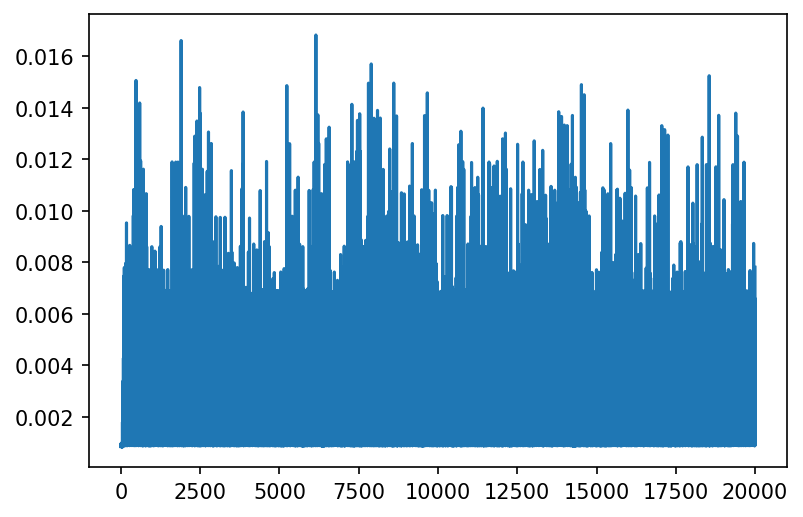

In [29]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(step_times_2)

In [30]:
# Tolerance: 1.0e5

In [33]:
# PeriodicNonEq
from openmmtools.integrators import PeriodicNonequilibriumIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = PeriodicNonequilibriumIntegrator(DEFAULT_ALCHEMICAL_FUNCTIONS, nsteps_eq, nsteps_neq, neq_splitting, timestep=timestep)


In [34]:
integrator.setConstraintTolerance(1e-5)

In [35]:
integrator.getConstraintTolerance()

1e-05

In [36]:
from simtk import openmm

temperature = 300*unit.kelvin
collision_rate = 90/unit.picosecond
platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [37]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [38]:
# Run neq
ncycles = 1
forward_works_master, reverse_works_master = list(), list()
for _ in range(ncycles):
    # Equilibrium (lambda = 0)
    _logger.info(f'Starting to equilibrate at lambda = 0')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 0, took: {elapsed_time / unit.seconds} seconds')

    # Forward (0 -> 1)
    forward_works = [integrator.get_protocol_work(dimensionless=True)]
    forward_times = []
    for fwd_step in range(nsteps_neq):
        _logger.info(f'forward NEQ step: {fwd_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        forward_times.append(elapsed_time)
        forward_works.append(integrator.get_protocol_work(dimensionless=True))
    forward_works_master.append(forward_works)

    # Equilibrium (lambda = 1)
    _logger.info(f'Starting to equilibrate at lambda = 1')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 1, took: {elapsed_time / unit.seconds} seconds')

    # Reverse work (1 -> 0)
    reverse_works = [integrator.get_protocol_work(dimensionless=True)]
    reverse_times = []
    for rev_step in range(nsteps_neq):
        _logger.info(f'reverse NEQ step: {rev_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        reverse_times.append(elapsed_time)
        reverse_works.append(integrator.get_protocol_work(dimensionless=True))
    reverse_works_master.append(reverse_works)

INFO:root:Starting to equilibrate at lambda = 0
INFO:root:Done equilibrating at lambda = 0, took: 62.614853382110596 seconds
INFO:root:forward NEQ step: 0, took: 62.614853382110596 seconds
INFO:root:forward NEQ step: 1, took: 0.0008375644683837891 seconds
INFO:root:forward NEQ step: 2, took: 0.0008397102355957031 seconds
INFO:root:forward NEQ step: 3, took: 0.0008375644683837891 seconds
INFO:root:forward NEQ step: 4, took: 0.0008394718170166016 seconds
INFO:root:forward NEQ step: 5, took: 0.0009753704071044922 seconds
INFO:root:forward NEQ step: 6, took: 0.0008249282836914062 seconds
INFO:root:forward NEQ step: 7, took: 0.0008502006530761719 seconds
INFO:root:forward NEQ step: 8, took: 0.000843048095703125 seconds
INFO:root:forward NEQ step: 9, took: 0.0008485317230224609 seconds
INFO:root:forward NEQ step: 10, took: 0.0009760856628417969 seconds
INFO:root:forward NEQ step: 11, took: 0.0008337497711181641 seconds
INFO:root:forward NEQ step: 12, took: 0.0008382797241210938 seconds
INFO:

INFO:root:forward NEQ step: 120, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 121, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 122, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 123, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 124, took: 0.005751848220825195 seconds
INFO:root:forward NEQ step: 125, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 126, took: 0.0008704662322998047 seconds
INFO:root:forward NEQ step: 127, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 128, took: 0.0008709430694580078 seconds
INFO:root:forward NEQ step: 129, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 130, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 131, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 132, took: 0.0057125091552734375 seconds
INFO:root:forward NEQ step: 133, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 134, to

INFO:root:forward NEQ step: 240, took: 0.0008614063262939453 seconds
INFO:root:forward NEQ step: 241, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 242, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 243, took: 0.000982046127319336 seconds
INFO:root:forward NEQ step: 244, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 245, took: 0.0008690357208251953 seconds
INFO:root:forward NEQ step: 246, took: 0.005791664123535156 seconds
INFO:root:forward NEQ step: 247, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 248, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 249, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 250, took: 0.0019669532775878906 seconds
INFO:root:forward NEQ step: 251, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 252, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 253, took: 0.010792732238769531 seconds
INFO:root:forward NEQ step: 254, took

INFO:root:forward NEQ step: 360, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 361, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 362, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 363, took: 0.001008749008178711 seconds
INFO:root:forward NEQ step: 364, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 365, took: 0.005716085433959961 seconds
INFO:root:forward NEQ step: 366, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 367, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 368, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 369, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 370, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 371, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 372, took: 0.005310535430908203 seconds
INFO:root:forward NEQ step: 373, took: 0.0009419918060302734 seconds
INFO:root:forward NEQ step: 374, took: 0.

INFO:root:forward NEQ step: 480, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 481, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 482, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 483, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 484, took: 0.006800174713134766 seconds
INFO:root:forward NEQ step: 485, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 486, took: 0.0008752346038818359 seconds
INFO:root:forward NEQ step: 487, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 488, took: 0.0009951591491699219 seconds
INFO:root:forward NEQ step: 489, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 490, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 491, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 492, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 493, took: 0.00580906867980957 seconds
INFO:root:forward NEQ step: 494, took: 0.0008

INFO:root:forward NEQ step: 600, took: 0.0019626617431640625 seconds
INFO:root:forward NEQ step: 601, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 602, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 603, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 604, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 605, took: 0.005500078201293945 seconds
INFO:root:forward NEQ step: 606, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 607, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 608, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 609, took: 0.0009419918060302734 seconds
INFO:root:forward NEQ step: 610, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 611, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 612, took: 0.010306596755981445 seconds
INFO:root:forward NEQ step: 613, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 614, too

INFO:root:forward NEQ step: 720, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 721, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 722, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 723, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 724, took: 0.0009999275207519531 seconds
INFO:root:forward NEQ step: 725, took: 0.01063990592956543 seconds
INFO:root:forward NEQ step: 726, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 727, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 728, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 729, took: 0.0009906291961669922 seconds
INFO:root:forward NEQ step: 730, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 731, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 732, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 733, took: 0.0009286403656005859 seconds
INFO:root:forward NEQ step: 734, too

INFO:root:forward NEQ step: 840, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 841, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 842, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 843, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 844, took: 0.0008690357208251953 seconds
INFO:root:forward NEQ step: 845, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 846, took: 0.005704402923583984 seconds
INFO:root:forward NEQ step: 847, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 848, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 849, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 850, took: 0.0018279552459716797 seconds
INFO:root:forward NEQ step: 851, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 852, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 853, took: 0.006582498550415039 seconds
INFO:root:forward NEQ step: 854, took

INFO:root:forward NEQ step: 960, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 961, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 962, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 963, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 964, took: 0.0009362697601318359 seconds
INFO:root:forward NEQ step: 965, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 966, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 967, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 968, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 969, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 970, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 971, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 972, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 973, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 974, t

INFO:root:forward NEQ step: 1078, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 1079, took: 0.0009927749633789062 seconds
INFO:root:forward NEQ step: 1080, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 1081, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 1082, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 1083, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 1084, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 1085, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 1086, took: 0.006793975830078125 seconds
INFO:root:forward NEQ step: 1087, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 1088, took: 0.0009305477142333984 seconds
INFO:root:forward NEQ step: 1089, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 1090, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 1091, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1196, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 1197, took: 0.0010280609130859375 seconds
INFO:root:forward NEQ step: 1198, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 1199, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 1200, took: 0.006498098373413086 seconds
INFO:root:forward NEQ step: 1201, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 1202, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 1203, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 1204, took: 0.0009455680847167969 seconds
INFO:root:forward NEQ step: 1205, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 1206, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 1207, took: 0.006715297698974609 seconds
INFO:root:forward NEQ step: 1208, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 1209, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 1314, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 1315, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 1316, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 1317, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 1318, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 1319, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 1320, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 1321, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 1322, took: 0.005795955657958984 seconds
INFO:root:forward NEQ step: 1323, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 1324, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 1325, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 1326, took: 0.0009300708770751953 seconds
INFO:root:forward NEQ step: 1327, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1432, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 1433, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 1434, took: 0.0057947635650634766 seconds
INFO:root:forward NEQ step: 1435, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 1436, took: 0.0009975433349609375 seconds
INFO:root:forward NEQ step: 1437, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 1438, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 1439, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 1440, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 1441, took: 0.0009987354278564453 seconds
INFO:root:forward NEQ step: 1442, took: 0.005619525909423828 seconds
INFO:root:forward NEQ step: 1443, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 1444, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 1445, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1550, took: 0.015503168106079102 seconds
INFO:root:forward NEQ step: 1551, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 1552, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 1553, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 1554, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 1555, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 1556, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 1557, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 1558, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 1559, took: 0.0009284019470214844 seconds
INFO:root:forward NEQ step: 1560, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 1561, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 1562, took: 0.0015714168548583984 seconds
INFO:root:forward NEQ step: 1563, took: 0.0012607574462890625 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 1668, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 1669, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 1670, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 1671, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 1672, took: 0.005891561508178711 seconds
INFO:root:forward NEQ step: 1673, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 1674, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 1675, took: 0.0008738040924072266 seconds
INFO:root:forward NEQ step: 1676, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 1677, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 1678, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 1679, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 1680, took: 0.005905628204345703 seconds
INFO:root:forward NEQ step: 1681, took: 0.001004934310913086 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 1786, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 1787, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 1788, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 1789, took: 0.005774497985839844 seconds
INFO:root:forward NEQ step: 1790, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 1791, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 1792, took: 0.0010046958923339844 seconds
INFO:root:forward NEQ step: 1793, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 1794, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 1795, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 1796, took: 0.005948305130004883 seconds
INFO:root:forward NEQ step: 1797, took: 0.001018524169921875 seconds
INFO:root:forward NEQ step: 1798, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 1799, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 1904, took: 0.0010139942169189453 seconds
INFO:root:forward NEQ step: 1905, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 1906, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 1907, took: 0.0008687973022460938 seconds
INFO:root:forward NEQ step: 1908, took: 0.0009329319000244141 seconds
INFO:root:forward NEQ step: 1909, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 1910, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 1911, took: 0.005816936492919922 seconds
INFO:root:forward NEQ step: 1912, took: 0.0008692741394042969 seconds
INFO:root:forward NEQ step: 1913, took: 0.001020193099975586 seconds
INFO:root:forward NEQ step: 1914, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 1915, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 1916, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 1917, took: 0.0009980201721191406 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 2022, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 2023, took: 0.0009543895721435547 seconds
INFO:root:forward NEQ step: 2024, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 2025, took: 0.00677943229675293 seconds
INFO:root:forward NEQ step: 2026, took: 0.0008728504180908203 seconds
INFO:root:forward NEQ step: 2027, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 2028, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 2029, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 2030, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 2031, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 2032, took: 0.0009980201721191406 seconds
INFO:root:forward NEQ step: 2033, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 2034, took: 0.005800008773803711 seconds
INFO:root:forward NEQ step: 2035, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 2140, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 2141, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 2142, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 2143, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 2144, took: 0.0009965896606445312 seconds
INFO:root:forward NEQ step: 2145, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 2146, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 2147, took: 0.005889415740966797 seconds
INFO:root:forward NEQ step: 2148, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 2149, took: 0.001001119613647461 seconds
INFO:root:forward NEQ step: 2150, took: 0.0019767284393310547 seconds
INFO:root:forward NEQ step: 2151, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 2152, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 2153, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 2258, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 2259, took: 0.000926971435546875 seconds
INFO:root:forward NEQ step: 2260, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 2261, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 2262, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 2263, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 2264, took: 0.0009257793426513672 seconds
INFO:root:forward NEQ step: 2265, took: 0.005486726760864258 seconds
INFO:root:forward NEQ step: 2266, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 2267, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 2268, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 2269, took: 0.001001119613647461 seconds
INFO:root:forward NEQ step: 2270, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 2271, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 2376, took: 0.004972934722900391 seconds
INFO:root:forward NEQ step: 2377, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 2378, took: 0.001004934310913086 seconds
INFO:root:forward NEQ step: 2379, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 2380, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 2381, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 2382, took: 0.0009930133819580078 seconds
INFO:root:forward NEQ step: 2383, took: 0.007728099822998047 seconds
INFO:root:forward NEQ step: 2384, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 2385, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 2386, took: 0.0009367465972900391 seconds
INFO:root:forward NEQ step: 2387, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 2388, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 2389, took: 0.0008695125579833984 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 2494, took: 0.0009260177612304688 seconds
INFO:root:forward NEQ step: 2495, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 2496, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 2497, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 2498, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 2499, took: 0.0009920597076416016 seconds
INFO:root:forward NEQ step: 2500, took: 0.006907224655151367 seconds
INFO:root:forward NEQ step: 2501, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 2502, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 2503, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 2504, took: 0.001001119613647461 seconds
INFO:root:forward NEQ step: 2505, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 2506, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 2507, took: 0.005793094635009766 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 2612, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 2613, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 2614, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 2615, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 2616, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 2617, took: 0.00872492790222168 seconds
INFO:root:forward NEQ step: 2618, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 2619, took: 0.0009887218475341797 seconds
INFO:root:forward NEQ step: 2620, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 2621, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 2622, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 2623, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 2624, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 2625, took: 0.0008678436279296875 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 2730, took: 0.006881237030029297 seconds
INFO:root:forward NEQ step: 2731, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 2732, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 2733, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 2734, took: 0.0009894371032714844 seconds
INFO:root:forward NEQ step: 2735, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 2736, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 2737, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 2738, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 2739, took: 0.009845256805419922 seconds
INFO:root:forward NEQ step: 2740, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 2741, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 2742, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 2743, took: 0.0010364055633544922 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 2848, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 2849, took: 0.0009233951568603516 seconds
INFO:root:forward NEQ step: 2850, took: 0.0019812583923339844 seconds
INFO:root:forward NEQ step: 2851, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 2852, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 2853, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 2854, took: 0.0009305477142333984 seconds
INFO:root:forward NEQ step: 2855, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 2856, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 2857, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 2858, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 2859, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 2860, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 2861, took: 0.0009069442749023438 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 2966, took: 0.0010037422180175781 seconds
INFO:root:forward NEQ step: 2967, took: 0.0008709430694580078 seconds
INFO:root:forward NEQ step: 2968, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 2969, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 2970, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 2971, took: 0.005875349044799805 seconds
INFO:root:forward NEQ step: 2972, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 2973, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 2974, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 2975, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 2976, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 2977, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 2978, took: 0.015506267547607422 seconds
INFO:root:forward NEQ step: 2979, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3084, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 3085, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 3086, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 3087, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 3088, took: 0.0010595321655273438 seconds
INFO:root:forward NEQ step: 3089, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 3090, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 3091, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 3092, took: 0.0009393692016601562 seconds
INFO:root:forward NEQ step: 3093, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 3094, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 3095, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 3096, took: 0.0009510517120361328 seconds
INFO:root:forward NEQ step: 3097, took: 0.0008900165557861328 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 3202, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 3203, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 3204, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 3205, took: 0.0010187625885009766 seconds
INFO:root:forward NEQ step: 3206, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 3207, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 3208, took: 0.0053026676177978516 seconds
INFO:root:forward NEQ step: 3209, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 3210, took: 0.0010123252868652344 seconds
INFO:root:forward NEQ step: 3211, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 3212, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 3213, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 3214, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 3215, took: 0.010310173034667969 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 3320, took: 0.0013141632080078125 seconds
INFO:root:forward NEQ step: 3321, took: 0.005814552307128906 seconds
INFO:root:forward NEQ step: 3322, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 3323, took: 0.0009367465972900391 seconds
INFO:root:forward NEQ step: 3324, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 3325, took: 0.0009315013885498047 seconds
INFO:root:forward NEQ step: 3326, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 3327, took: 0.0010378360748291016 seconds
INFO:root:forward NEQ step: 3328, took: 0.006924867630004883 seconds
INFO:root:forward NEQ step: 3329, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 3330, took: 0.0008664131164550781 seconds
INFO:root:forward NEQ step: 3331, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 3332, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 3333, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3438, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 3439, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 3440, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 3441, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 3442, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 3443, took: 0.0009360313415527344 seconds
INFO:root:forward NEQ step: 3444, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 3445, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 3446, took: 0.00689244270324707 seconds
INFO:root:forward NEQ step: 3447, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 3448, took: 0.001004934310913086 seconds
INFO:root:forward NEQ step: 3449, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 3450, took: 0.001837015151977539 seconds
INFO:root:forward NEQ step: 3451, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 3556, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 3557, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 3558, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 3559, took: 0.005755186080932617 seconds
INFO:root:forward NEQ step: 3560, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 3561, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 3562, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 3563, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 3564, took: 0.0009982585906982422 seconds
INFO:root:forward NEQ step: 3565, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 3566, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 3567, took: 0.005761861801147461 seconds
INFO:root:forward NEQ step: 3568, took: 0.0009424686431884766 seconds
INFO:root:forward NEQ step: 3569, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3674, took: 0.001001596450805664 seconds
INFO:root:forward NEQ step: 3675, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 3676, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 3677, took: 0.013211727142333984 seconds
INFO:root:forward NEQ step: 3678, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 3679, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 3680, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 3681, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 3682, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 3683, took: 0.0009930133819580078 seconds
INFO:root:forward NEQ step: 3684, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 3685, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 3686, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 3687, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3792, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 3793, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 3794, took: 0.0010242462158203125 seconds
INFO:root:forward NEQ step: 3795, took: 0.005795717239379883 seconds
INFO:root:forward NEQ step: 3796, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 3797, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 3798, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 3799, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 3800, took: 0.001978635787963867 seconds
INFO:root:forward NEQ step: 3801, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 3802, took: 0.005433797836303711 seconds
INFO:root:forward NEQ step: 3803, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 3804, took: 0.0009377002716064453 seconds
INFO:root:forward NEQ step: 3805, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 3910, took: 0.006011962890625 seconds
INFO:root:forward NEQ step: 3911, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 3912, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 3913, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 3914, took: 0.0010209083557128906 seconds
INFO:root:forward NEQ step: 3915, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 3916, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 3917, took: 0.005469560623168945 seconds
INFO:root:forward NEQ step: 3918, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 3919, took: 0.0009851455688476562 seconds
INFO:root:forward NEQ step: 3920, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 3921, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 3922, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 3923, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 4028, took: 0.00093841552734375 seconds
INFO:root:forward NEQ step: 4029, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 4030, took: 0.005495786666870117 seconds
INFO:root:forward NEQ step: 4031, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 4032, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 4033, took: 0.0010058879852294922 seconds
INFO:root:forward NEQ step: 4034, took: 0.0008671283721923828 seconds
INFO:root:forward NEQ step: 4035, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 4036, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 4037, took: 0.006567716598510742 seconds
INFO:root:forward NEQ step: 4038, took: 0.0010941028594970703 seconds
INFO:root:forward NEQ step: 4039, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 4040, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 4041, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 4146, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 4147, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 4148, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 4149, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 4150, took: 0.0019614696502685547 seconds
INFO:root:forward NEQ step: 4151, took: 0.0008709430694580078 seconds
INFO:root:forward NEQ step: 4152, took: 0.005795001983642578 seconds
INFO:root:forward NEQ step: 4153, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 4154, took: 0.0010006427764892578 seconds
INFO:root:forward NEQ step: 4155, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 4156, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 4157, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 4158, took: 0.0009512901306152344 seconds
INFO:root:forward NEQ step: 4159, took: 0.006499290466308594 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4264, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 4265, took: 0.0058939456939697266 seconds
INFO:root:forward NEQ step: 4266, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 4267, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 4268, took: 0.0010025501251220703 seconds
INFO:root:forward NEQ step: 4269, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 4270, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 4271, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 4272, took: 0.005747795104980469 seconds
INFO:root:forward NEQ step: 4273, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 4274, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 4275, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 4276, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 4277, took: 0.0010192394256591797 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 4382, took: 0.0009386539459228516 seconds
INFO:root:forward NEQ step: 4383, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 4384, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 4385, took: 0.005698442459106445 seconds
INFO:root:forward NEQ step: 4386, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 4387, took: 0.0009918212890625 seconds
INFO:root:forward NEQ step: 4388, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 4389, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 4390, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 4391, took: 0.0009284019470214844 seconds
INFO:root:forward NEQ step: 4392, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 4393, took: 0.005800962448120117 seconds
INFO:root:forward NEQ step: 4394, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 4395, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 4500, took: 0.006920576095581055 seconds
INFO:root:forward NEQ step: 4501, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 4502, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 4503, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 4504, took: 0.000997304916381836 seconds
INFO:root:forward NEQ step: 4505, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 4506, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 4507, took: 0.0058057308197021484 seconds
INFO:root:forward NEQ step: 4508, took: 0.0009214878082275391 seconds
INFO:root:forward NEQ step: 4509, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 4510, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 4511, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 4512, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 4513, took: 0.0009927749633789062 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 4618, took: 0.005795955657958984 seconds
INFO:root:forward NEQ step: 4619, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 4620, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 4621, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 4622, took: 0.0009381771087646484 seconds
INFO:root:forward NEQ step: 4623, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 4624, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 4625, took: 0.00648951530456543 seconds
INFO:root:forward NEQ step: 4626, took: 0.0008690357208251953 seconds
INFO:root:forward NEQ step: 4627, took: 0.0009968280792236328 seconds
INFO:root:forward NEQ step: 4628, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 4629, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 4630, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 4631, took: 0.0009925365447998047 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 4736, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 4737, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 4738, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 4739, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 4740, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 4741, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 4742, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 4743, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 4744, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 4745, took: 0.0010118484497070312 seconds
INFO:root:forward NEQ step: 4746, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 4747, took: 0.011797666549682617 seconds
INFO:root:forward NEQ step: 4748, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 4749, took: 0.0009407997131347656 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 4854, took: 0.000997304916381836 seconds
INFO:root:forward NEQ step: 4855, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 4856, took: 0.005898714065551758 seconds
INFO:root:forward NEQ step: 4857, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 4858, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 4859, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 4860, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 4861, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 4862, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 4863, took: 0.000997781753540039 seconds
INFO:root:forward NEQ step: 4864, took: 0.0068874359130859375 seconds
INFO:root:forward NEQ step: 4865, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 4866, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 4867, took: 0.0009355545043945312 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 4972, took: 0.005940675735473633 seconds
INFO:root:forward NEQ step: 4973, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 4974, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 4975, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 4976, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 4977, took: 0.0009403228759765625 seconds
INFO:root:forward NEQ step: 4978, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 4979, took: 0.006891965866088867 seconds
INFO:root:forward NEQ step: 4980, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 4981, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 4982, took: 0.0009293556213378906 seconds
INFO:root:forward NEQ step: 4983, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 4984, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 4985, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 5090, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 5091, took: 0.0010044574737548828 seconds
INFO:root:forward NEQ step: 5092, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 5093, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 5094, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 5095, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 5096, took: 0.0010325908660888672 seconds
INFO:root:forward NEQ step: 5097, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 5098, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 5099, took: 0.010767936706542969 seconds
INFO:root:forward NEQ step: 5100, took: 0.0019750595092773438 seconds
INFO:root:forward NEQ step: 5101, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 5102, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 5103, took: 0.0008625984191894531 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 5208, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 5209, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 5210, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 5211, took: 0.0008752346038818359 seconds
INFO:root:forward NEQ step: 5212, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 5213, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 5214, took: 0.0008647441864013672 seconds
INFO:root:forward NEQ step: 5215, took: 0.010805130004882812 seconds
INFO:root:forward NEQ step: 5216, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 5217, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 5218, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 5219, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 5220, took: 0.000997304916381836 seconds
INFO:root:forward NEQ step: 5221, took: 0.000896453857421875 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 5326, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 5327, took: 0.0015294551849365234 seconds
INFO:root:forward NEQ step: 5328, took: 0.00576329231262207 seconds
INFO:root:forward NEQ step: 5329, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 5330, took: 0.0008730888366699219 seconds
INFO:root:forward NEQ step: 5331, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 5332, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 5333, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 5334, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 5335, took: 0.005632162094116211 seconds
INFO:root:forward NEQ step: 5336, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 5337, took: 0.0010294914245605469 seconds
INFO:root:forward NEQ step: 5338, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 5339, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5444, took: 0.0058591365814208984 seconds
INFO:root:forward NEQ step: 5445, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 5446, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 5447, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 5448, took: 0.0009250640869140625 seconds
INFO:root:forward NEQ step: 5449, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 5450, took: 0.0019805431365966797 seconds
INFO:root:forward NEQ step: 5451, took: 0.005769252777099609 seconds
INFO:root:forward NEQ step: 5452, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 5453, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 5454, took: 0.0009951591491699219 seconds
INFO:root:forward NEQ step: 5455, took: 0.0008702278137207031 seconds
INFO:root:forward NEQ step: 5456, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 5457, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 5562, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 5563, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 5564, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 5565, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 5566, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 5567, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 5568, took: 0.0009915828704833984 seconds
INFO:root:forward NEQ step: 5569, took: 0.005805253982543945 seconds
INFO:root:forward NEQ step: 5570, took: 0.0008718967437744141 seconds
INFO:root:forward NEQ step: 5571, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 5572, took: 0.0009341239929199219 seconds
INFO:root:forward NEQ step: 5573, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 5574, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 5575, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 5680, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 5681, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 5682, took: 0.00589752197265625 seconds
INFO:root:forward NEQ step: 5683, took: 0.0010104179382324219 seconds
INFO:root:forward NEQ step: 5684, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 5685, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 5686, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 5687, took: 0.0010082721710205078 seconds
INFO:root:forward NEQ step: 5688, took: 0.0008759498596191406 seconds
INFO:root:forward NEQ step: 5689, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 5690, took: 0.005709648132324219 seconds
INFO:root:forward NEQ step: 5691, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 5692, took: 0.0009961128234863281 seconds
INFO:root:forward NEQ step: 5693, took: 0.0008728504180908203 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5798, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 5799, took: 0.0010044574737548828 seconds
INFO:root:forward NEQ step: 5800, took: 0.0019898414611816406 seconds
INFO:root:forward NEQ step: 5801, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 5802, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 5803, took: 0.005930900573730469 seconds
INFO:root:forward NEQ step: 5804, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 5805, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 5806, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 5807, took: 0.0009274482727050781 seconds
INFO:root:forward NEQ step: 5808, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 5809, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 5810, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 5811, took: 0.005768299102783203 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 5916, took: 0.006576061248779297 seconds
INFO:root:forward NEQ step: 5917, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 5918, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 5919, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 5920, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 5921, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 5922, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 5923, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 5924, took: 0.0010001659393310547 seconds
INFO:root:forward NEQ step: 5925, took: 0.005544185638427734 seconds
INFO:root:forward NEQ step: 5926, took: 0.0008649826049804688 seconds
INFO:root:forward NEQ step: 5927, took: 0.0008633136749267578 seconds
INFO:root:forward NEQ step: 5928, took: 0.0008604526519775391 seconds
INFO:root:forward NEQ step: 5929, took: 0.00098419189453125 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 6034, took: 0.006573677062988281 seconds
INFO:root:forward NEQ step: 6035, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 6036, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 6037, took: 0.0010082721710205078 seconds
INFO:root:forward NEQ step: 6038, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 6039, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 6040, took: 0.0008606910705566406 seconds
INFO:root:forward NEQ step: 6041, took: 0.000926971435546875 seconds
INFO:root:forward NEQ step: 6042, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 6043, took: 0.011894702911376953 seconds
INFO:root:forward NEQ step: 6044, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 6045, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 6046, took: 0.0009253025054931641 seconds
INFO:root:forward NEQ step: 6047, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 6152, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 6153, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 6154, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 6155, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 6156, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 6157, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 6158, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 6159, took: 0.0009951591491699219 seconds
INFO:root:forward NEQ step: 6160, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 6161, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 6162, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 6163, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 6164, took: 0.0009882450103759766 seconds
INFO:root:forward NEQ step: 6165, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 6270, took: 0.005707502365112305 seconds
INFO:root:forward NEQ step: 6271, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 6272, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 6273, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 6274, took: 0.0009970664978027344 seconds
INFO:root:forward NEQ step: 6275, took: 0.0008745193481445312 seconds
INFO:root:forward NEQ step: 6276, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 6277, took: 0.0062558650970458984 seconds
INFO:root:forward NEQ step: 6278, took: 0.0009295940399169922 seconds
INFO:root:forward NEQ step: 6279, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 6280, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 6281, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 6282, took: 0.0010001659393310547 seconds
INFO:root:forward NEQ step: 6283, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 6388, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 6389, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 6390, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 6391, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 6392, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 6393, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 6394, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 6395, took: 0.000926971435546875 seconds
INFO:root:forward NEQ step: 6396, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 6397, took: 0.01491093635559082 seconds
INFO:root:forward NEQ step: 6398, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 6399, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 6400, took: 0.0019631385803222656 seconds
INFO:root:forward NEQ step: 6401, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 6506, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 6507, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 6508, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 6509, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 6510, took: 0.0009365081787109375 seconds
INFO:root:forward NEQ step: 6511, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 6512, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 6513, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 6514, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 6515, took: 0.0009465217590332031 seconds
INFO:root:forward NEQ step: 6516, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 6517, took: 0.006892681121826172 seconds
INFO:root:forward NEQ step: 6518, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 6519, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 6624, took: 0.006790876388549805 seconds
INFO:root:forward NEQ step: 6625, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 6626, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 6627, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 6628, took: 0.0009324550628662109 seconds
INFO:root:forward NEQ step: 6629, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 6630, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 6631, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 6632, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 6633, took: 0.005808353424072266 seconds
INFO:root:forward NEQ step: 6634, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 6635, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 6636, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 6637, took: 0.0009303092956542969 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 6742, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 6743, took: 0.0010061264038085938 seconds
INFO:root:forward NEQ step: 6744, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 6745, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 6746, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 6747, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 6748, took: 0.006902456283569336 seconds
INFO:root:forward NEQ step: 6749, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 6750, took: 0.002010822296142578 seconds
INFO:root:forward NEQ step: 6751, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 6752, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 6753, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 6754, took: 0.0009925365447998047 seconds
INFO:root:forward NEQ step: 6755, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 6860, took: 0.008166313171386719 seconds
INFO:root:forward NEQ step: 6861, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 6862, took: 0.0009186267852783203 seconds
INFO:root:forward NEQ step: 6863, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 6864, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 6865, took: 0.0010159015655517578 seconds
INFO:root:forward NEQ step: 6866, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 6867, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 6868, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 6869, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 6870, took: 0.0009961128234863281 seconds
INFO:root:forward NEQ step: 6871, took: 0.005894899368286133 seconds
INFO:root:forward NEQ step: 6872, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 6873, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 6978, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 6979, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 6980, took: 0.0009942054748535156 seconds
INFO:root:forward NEQ step: 6981, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 6982, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 6983, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 6984, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 6985, took: 0.0009291172027587891 seconds
INFO:root:forward NEQ step: 6986, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 6987, took: 0.007862567901611328 seconds
INFO:root:forward NEQ step: 6988, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 6989, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 6990, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 6991, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 7096, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 7097, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 7098, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 7099, took: 0.0008730888366699219 seconds
INFO:root:forward NEQ step: 7100, took: 0.0018305778503417969 seconds
INFO:root:forward NEQ step: 7101, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 7102, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 7103, took: 0.0008747577667236328 seconds
INFO:root:forward NEQ step: 7104, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 7105, took: 0.0009415149688720703 seconds
INFO:root:forward NEQ step: 7106, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 7107, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 7108, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 7109, took: 0.0009329319000244141 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 7214, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 7215, took: 0.00092315673828125 seconds
INFO:root:forward NEQ step: 7216, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 7217, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 7218, took: 0.005586385726928711 seconds
INFO:root:forward NEQ step: 7219, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 7220, took: 0.0009870529174804688 seconds
INFO:root:forward NEQ step: 7221, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 7222, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 7223, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 7224, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 7225, took: 0.0009970664978027344 seconds
INFO:root:forward NEQ step: 7226, took: 0.005908489227294922 seconds
INFO:root:forward NEQ step: 7227, took: 0.0008714199066162109 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 7332, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 7333, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 7334, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 7335, took: 0.006423473358154297 seconds
INFO:root:forward NEQ step: 7336, took: 0.0012950897216796875 seconds
INFO:root:forward NEQ step: 7337, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 7338, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 7339, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 7340, took: 0.0009255409240722656 seconds
INFO:root:forward NEQ step: 7341, took: 0.0057985782623291016 seconds
INFO:root:forward NEQ step: 7342, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 7343, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 7344, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 7345, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 7450, took: 0.001850128173828125 seconds
INFO:root:forward NEQ step: 7451, took: 0.00579071044921875 seconds
INFO:root:forward NEQ step: 7452, took: 0.0008742809295654297 seconds
INFO:root:forward NEQ step: 7453, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 7454, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 7455, took: 0.0010952949523925781 seconds
INFO:root:forward NEQ step: 7456, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 7457, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 7458, took: 0.005911588668823242 seconds
INFO:root:forward NEQ step: 7459, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 7460, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 7461, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 7462, took: 0.0009386539459228516 seconds
INFO:root:forward NEQ step: 7463, took: 0.0008747577667236328 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 7568, took: 0.0018074512481689453 seconds
INFO:root:forward NEQ step: 7569, took: 0.0008702278137207031 seconds
INFO:root:forward NEQ step: 7570, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 7571, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 7572, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 7573, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 7574, took: 0.006581783294677734 seconds
INFO:root:forward NEQ step: 7575, took: 0.0008728504180908203 seconds
INFO:root:forward NEQ step: 7576, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 7577, took: 0.0009417533874511719 seconds
INFO:root:forward NEQ step: 7578, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 7579, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 7580, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 7581, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 7686, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 7687, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 7688, took: 0.001010894775390625 seconds
INFO:root:forward NEQ step: 7689, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 7690, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 7691, took: 0.010805845260620117 seconds
INFO:root:forward NEQ step: 7692, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 7693, took: 0.001016855239868164 seconds
INFO:root:forward NEQ step: 7694, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 7695, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 7696, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 7697, took: 0.0009582042694091797 seconds
INFO:root:forward NEQ step: 7698, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 7699, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 7804, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 7805, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 7806, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 7807, took: 0.0062999725341796875 seconds
INFO:root:forward NEQ step: 7808, took: 0.0009398460388183594 seconds
INFO:root:forward NEQ step: 7809, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 7810, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 7811, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 7812, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 7813, took: 0.0009360313415527344 seconds
INFO:root:forward NEQ step: 7814, took: 0.0008747577667236328 seconds
INFO:root:forward NEQ step: 7815, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 7816, took: 0.005891084671020508 seconds
INFO:root:forward NEQ step: 7817, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 7922, took: 0.008641719818115234 seconds
INFO:root:forward NEQ step: 7923, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 7924, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 7925, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 7926, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 7927, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 7928, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 7929, took: 0.0009377002716064453 seconds
INFO:root:forward NEQ step: 7930, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 7931, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 7932, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 7933, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 7934, took: 0.005888938903808594 seconds
INFO:root:forward NEQ step: 7935, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 8040, took: 0.0009386539459228516 seconds
INFO:root:forward NEQ step: 8041, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 8042, took: 0.0008602142333984375 seconds
INFO:root:forward NEQ step: 8043, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 8044, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 8045, took: 0.0009644031524658203 seconds
INFO:root:forward NEQ step: 8046, took: 0.006401777267456055 seconds
INFO:root:forward NEQ step: 8047, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 8048, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 8049, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 8050, took: 0.00185394287109375 seconds
INFO:root:forward NEQ step: 8051, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 8052, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 8053, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8158, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 8159, took: 0.0009450912475585938 seconds
INFO:root:forward NEQ step: 8160, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 8161, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 8162, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 8163, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 8164, took: 0.005793333053588867 seconds
INFO:root:forward NEQ step: 8165, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 8166, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 8167, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 8168, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 8169, took: 0.0010118484497070312 seconds
INFO:root:forward NEQ step: 8170, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 8171, took: 0.006884336471557617 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 8276, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 8277, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 8278, took: 0.010635614395141602 seconds
INFO:root:forward NEQ step: 8279, took: 0.0010330677032470703 seconds
INFO:root:forward NEQ step: 8280, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 8281, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 8282, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 8283, took: 0.0009417533874511719 seconds
INFO:root:forward NEQ step: 8284, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 8285, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 8286, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 8287, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 8288, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 8289, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 8394, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 8395, took: 0.0008730888366699219 seconds
INFO:root:forward NEQ step: 8396, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 8397, took: 0.0058383941650390625 seconds
INFO:root:forward NEQ step: 8398, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 8399, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 8400, took: 0.001980304718017578 seconds
INFO:root:forward NEQ step: 8401, took: 0.0008757114410400391 seconds
INFO:root:forward NEQ step: 8402, took: 0.0008757114410400391 seconds
INFO:root:forward NEQ step: 8403, took: 0.0008726119995117188 seconds
INFO:root:forward NEQ step: 8404, took: 0.005619049072265625 seconds
INFO:root:forward NEQ step: 8405, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 8406, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 8407, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 8512, took: 0.005895853042602539 seconds
INFO:root:forward NEQ step: 8513, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 8514, took: 0.0009930133819580078 seconds
INFO:root:forward NEQ step: 8515, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 8516, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 8517, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 8518, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 8519, took: 0.005493879318237305 seconds
INFO:root:forward NEQ step: 8520, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 8521, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 8522, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 8523, took: 0.0008747577667236328 seconds
INFO:root:forward NEQ step: 8524, took: 0.0010144710540771484 seconds
INFO:root:forward NEQ step: 8525, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 8630, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 8631, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 8632, took: 0.0010199546813964844 seconds
INFO:root:forward NEQ step: 8633, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 8634, took: 0.008354663848876953 seconds
INFO:root:forward NEQ step: 8635, took: 0.0009326934814453125 seconds
INFO:root:forward NEQ step: 8636, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 8637, took: 0.0010063648223876953 seconds
INFO:root:forward NEQ step: 8638, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 8639, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 8640, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 8641, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 8642, took: 0.0009543895721435547 seconds
INFO:root:forward NEQ step: 8643, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 8748, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 8749, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 8750, took: 0.0018911361694335938 seconds
INFO:root:forward NEQ step: 8751, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 8752, took: 0.005487203598022461 seconds
INFO:root:forward NEQ step: 8753, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 8754, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 8755, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 8756, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 8757, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 8758, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 8759, took: 0.005381584167480469 seconds
INFO:root:forward NEQ step: 8760, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 8761, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step:

INFO:root:forward NEQ step: 8866, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 8867, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 8868, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 8869, took: 0.0011179447174072266 seconds
INFO:root:forward NEQ step: 8870, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 8871, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 8872, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 8873, took: 0.005778312683105469 seconds
INFO:root:forward NEQ step: 8874, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 8875, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 8876, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 8877, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 8878, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 8879, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 8984, took: 0.009843111038208008 seconds
INFO:root:forward NEQ step: 8985, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 8986, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 8987, took: 0.0009281635284423828 seconds
INFO:root:forward NEQ step: 8988, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 8989, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 8990, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 8991, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 8992, took: 0.000997781753540039 seconds
INFO:root:forward NEQ step: 8993, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 8994, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 8995, took: 0.0008695125579833984 seconds
INFO:root:forward NEQ step: 8996, took: 0.0009317398071289062 seconds
INFO:root:forward NEQ step: 8997, took: 0.005909919738769531 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9102, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 9103, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 9104, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 9105, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 9106, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 9107, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 9108, took: 0.009804964065551758 seconds
INFO:root:forward NEQ step: 9109, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 9110, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 9111, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 9112, took: 0.0010111331939697266 seconds
INFO:root:forward NEQ step: 9113, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 9114, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 9115, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 9220, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 9221, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 9222, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 9223, took: 0.005767822265625 seconds
INFO:root:forward NEQ step: 9224, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 9225, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 9226, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 9227, took: 0.0009360313415527344 seconds
INFO:root:forward NEQ step: 9228, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 9229, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 9230, took: 0.0058057308197021484 seconds
INFO:root:forward NEQ step: 9231, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 9232, took: 0.0010004043579101562 seconds
INFO:root:forward NEQ step: 9233, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 9338, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 9339, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 9340, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 9341, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 9342, took: 0.0010313987731933594 seconds
INFO:root:forward NEQ step: 9343, took: 0.0015680789947509766 seconds
INFO:root:forward NEQ step: 9344, took: 0.001287221908569336 seconds
INFO:root:forward NEQ step: 9345, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 9346, took: 0.005489349365234375 seconds
INFO:root:forward NEQ step: 9347, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 9348, took: 0.0009315013885498047 seconds
INFO:root:forward NEQ step: 9349, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 9350, took: 0.0018465518951416016 seconds
INFO:root:forward NEQ step: 9351, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 9456, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 9457, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 9458, took: 0.0009326934814453125 seconds
INFO:root:forward NEQ step: 9459, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 9460, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 9461, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 9462, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 9463, took: 0.0009317398071289062 seconds
INFO:root:forward NEQ step: 9464, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 9465, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 9466, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 9467, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 9468, took: 0.001004934310913086 seconds
INFO:root:forward NEQ step: 9469, took: 0.005812406539916992 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 9574, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 9575, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 9576, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 9577, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 9578, took: 0.0009341239929199219 seconds
INFO:root:forward NEQ step: 9579, took: 0.0009982585906982422 seconds
INFO:root:forward NEQ step: 9580, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 9581, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 9582, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 9583, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 9584, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 9585, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 9586, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 9587, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 9692, took: 0.0009284019470214844 seconds
INFO:root:forward NEQ step: 9693, took: 0.005893707275390625 seconds
INFO:root:forward NEQ step: 9694, took: 0.0008759498596191406 seconds
INFO:root:forward NEQ step: 9695, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 9696, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 9697, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 9698, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 9699, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 9700, took: 0.007681131362915039 seconds
INFO:root:forward NEQ step: 9701, took: 0.0009229183197021484 seconds
INFO:root:forward NEQ step: 9702, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 9703, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 9704, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 9705, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9810, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 9811, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 9812, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 9813, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 9814, took: 0.0009386539459228516 seconds
INFO:root:forward NEQ step: 9815, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 9816, took: 0.0068836212158203125 seconds
INFO:root:forward NEQ step: 9817, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 9818, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 9819, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 9820, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 9821, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 9822, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 9823, took: 0.0008759498596191406 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 9928, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 9929, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 9930, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 9931, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 9932, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 9933, took: 0.000965118408203125 seconds
INFO:root:forward NEQ step: 9934, took: 0.011711359024047852 seconds
INFO:root:forward NEQ step: 9935, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 9936, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 9937, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 9938, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 9939, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 9940, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 9941, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 10045, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 10046, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 10047, took: 0.0010297298431396484 seconds
INFO:root:forward NEQ step: 10048, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 10049, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 10050, took: 0.0066068172454833984 seconds
INFO:root:forward NEQ step: 10051, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 10052, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 10053, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 10054, took: 0.0010063648223876953 seconds
INFO:root:forward NEQ step: 10055, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 10056, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 10057, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 10058, took: 0.005610466003417969 seconds
INFO:ro

INFO:root:forward NEQ step: 10161, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 10162, took: 0.009720802307128906 seconds
INFO:root:forward NEQ step: 10163, took: 0.0010156631469726562 seconds
INFO:root:forward NEQ step: 10164, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 10165, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 10166, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 10167, took: 0.0009374618530273438 seconds
INFO:root:forward NEQ step: 10168, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 10169, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 10170, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 10171, took: 0.0008754730224609375 seconds
INFO:root:forward NEQ step: 10172, took: 0.00101470947265625 seconds
INFO:root:forward NEQ step: 10173, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 10174, took: 0.0008912086486816406 seconds
INFO:root:forward

INFO:root:forward NEQ step: 10278, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 10279, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 10280, took: 0.0010170936584472656 seconds
INFO:root:forward NEQ step: 10281, took: 0.004973649978637695 seconds
INFO:root:forward NEQ step: 10282, took: 0.0008718967437744141 seconds
INFO:root:forward NEQ step: 10283, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 10284, took: 0.0009474754333496094 seconds
INFO:root:forward NEQ step: 10285, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 10286, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 10287, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 10288, took: 0.009717941284179688 seconds
INFO:root:forward NEQ step: 10289, took: 0.0009331703186035156 seconds
INFO:root:forward NEQ step: 10290, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 10291, took: 0.0008835792541503906 seconds
INFO:roo

INFO:root:forward NEQ step: 10394, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 10395, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 10396, took: 0.0009250640869140625 seconds
INFO:root:forward NEQ step: 10397, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 10398, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 10399, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 10400, took: 0.0019850730895996094 seconds
INFO:root:forward NEQ step: 10401, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 10402, took: 0.006408214569091797 seconds
INFO:root:forward NEQ step: 10403, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 10404, took: 0.0010042190551757812 seconds
INFO:root:forward NEQ step: 10405, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 10406, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 10407, took: 0.0008807182312011719 seconds
INFO:ro

INFO:root:forward NEQ step: 10510, took: 0.005794048309326172 seconds
INFO:root:forward NEQ step: 10511, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 10512, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 10513, took: 0.0008726119995117188 seconds
INFO:root:forward NEQ step: 10514, took: 0.0010044574737548828 seconds
INFO:root:forward NEQ step: 10515, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 10516, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 10517, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 10518, took: 0.006944894790649414 seconds
INFO:root:forward NEQ step: 10519, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 10520, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 10521, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 10522, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 10523, took: 0.0009291172027587891 seconds
INFO:roo

INFO:root:forward NEQ step: 10626, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 10627, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 10628, took: 0.0059316158294677734 seconds
INFO:root:forward NEQ step: 10629, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 10630, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 10631, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 10632, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 10633, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 10634, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 10635, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 10636, took: 0.005831718444824219 seconds
INFO:root:forward NEQ step: 10637, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 10638, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 10639, took: 0.0008890628814697266 seconds
INFO:root

INFO:root:forward NEQ step: 10742, took: 0.0010113716125488281 seconds
INFO:root:forward NEQ step: 10743, took: 0.0067942142486572266 seconds
INFO:root:forward NEQ step: 10744, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 10745, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 10746, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 10747, took: 0.0009903907775878906 seconds
INFO:root:forward NEQ step: 10748, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 10749, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 10750, took: 0.0018911361694335938 seconds
INFO:root:forward NEQ step: 10751, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 10752, took: 0.005906343460083008 seconds
INFO:root:forward NEQ step: 10753, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 10754, took: 0.0009400844573974609 seconds
INFO:root:forward NEQ step: 10755, took: 0.0008761882781982422 seconds
INFO:roo

INFO:root:forward NEQ step: 10858, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 10859, took: 0.0009975433349609375 seconds
INFO:root:forward NEQ step: 10860, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 10861, took: 0.0023429393768310547 seconds
INFO:root:forward NEQ step: 10862, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 10863, took: 0.0009255409240722656 seconds
INFO:root:forward NEQ step: 10864, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 10865, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 10866, took: 0.0044765472412109375 seconds
INFO:root:forward NEQ step: 10867, took: 0.0008721351623535156 seconds
INFO:root:forward NEQ step: 10868, took: 0.001010894775390625 seconds
INFO:root:forward NEQ step: 10869, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 10870, took: 0.0009818077087402344 seconds
INFO:root:forward NEQ step: 10871, took: 0.0019230842590332031 seconds
INFO:ro

INFO:root:forward NEQ step: 10974, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 10975, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 10976, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 10977, took: 0.0008695125579833984 seconds
INFO:root:forward NEQ step: 10978, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 10979, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 10980, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 10981, took: 0.006896495819091797 seconds
INFO:root:forward NEQ step: 10982, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 10983, took: 0.0009412765502929688 seconds
INFO:root:forward NEQ step: 10984, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 10985, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 10986, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 10987, took: 0.0008873939514160156 seconds
INFO:ro

INFO:root:forward NEQ step: 11090, took: 0.006838321685791016 seconds
INFO:root:forward NEQ step: 11091, took: 0.0008757114410400391 seconds
INFO:root:forward NEQ step: 11092, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 11093, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 11094, took: 0.0008730888366699219 seconds
INFO:root:forward NEQ step: 11095, took: 0.000995635986328125 seconds
INFO:root:forward NEQ step: 11096, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 11097, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 11098, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 11099, took: 0.005807161331176758 seconds
INFO:root:forward NEQ step: 11100, took: 0.002539396286010742 seconds
INFO:root:forward NEQ step: 11101, took: 0.0012793540954589844 seconds
INFO:root:forward NEQ step: 11102, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 11103, took: 0.0008800029754638672 seconds
INFO:root:

INFO:root:forward NEQ step: 11206, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 11207, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 11208, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 11209, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 11210, took: 0.0009329319000244141 seconds
INFO:root:forward NEQ step: 11211, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 11212, took: 0.005614757537841797 seconds
INFO:root:forward NEQ step: 11213, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 11214, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 11215, took: 0.001012563705444336 seconds
INFO:root:forward NEQ step: 11216, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 11217, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 11218, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 11219, took: 0.005803346633911133 seconds
INFO:root:for

INFO:root:forward NEQ step: 11322, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 11323, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 11324, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 11325, took: 0.0009241104125976562 seconds
INFO:root:forward NEQ step: 11326, took: 0.0009341239929199219 seconds
INFO:root:forward NEQ step: 11327, took: 0.005802631378173828 seconds
INFO:root:forward NEQ step: 11328, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 11329, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 11330, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 11331, took: 0.0008742809295654297 seconds
INFO:root:forward NEQ step: 11332, took: 0.0010082721710205078 seconds
INFO:root:forward NEQ step: 11333, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 11334, took: 0.006550788879394531 seconds
INFO:root:forward NEQ step: 11335, took: 0.0008809566497802734 seconds
INFO:root

INFO:root:forward NEQ step: 11438, took: 0.0009315013885498047 seconds
INFO:root:forward NEQ step: 11439, took: 0.000873565673828125 seconds
INFO:root:forward NEQ step: 11440, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 11441, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 11442, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 11443, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 11444, took: 0.00590062141418457 seconds
INFO:root:forward NEQ step: 11445, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 11446, took: 0.0008711814880371094 seconds
INFO:root:forward NEQ step: 11447, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 11448, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 11449, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 11450, took: 0.0020165443420410156 seconds
INFO:root:forward NEQ step: 11451, took: 0.010587453842163086 seconds
INFO:root:

INFO:root:forward NEQ step: 11554, took: 0.0009355545043945312 seconds
INFO:root:forward NEQ step: 11555, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 11556, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 11557, took: 0.0073528289794921875 seconds
INFO:root:forward NEQ step: 11558, took: 0.0009284019470214844 seconds
INFO:root:forward NEQ step: 11559, took: 0.0009391307830810547 seconds
INFO:root:forward NEQ step: 11560, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 11561, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 11562, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 11563, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 11564, took: 0.0009560585021972656 seconds
INFO:root:forward NEQ step: 11565, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 11566, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 11567, took: 0.009801149368286133 seconds
INFO:root

INFO:root:forward NEQ step: 11670, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 11671, took: 0.0008759498596191406 seconds
INFO:root:forward NEQ step: 11672, took: 0.0009279251098632812 seconds
INFO:root:forward NEQ step: 11673, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 11674, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 11675, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 11676, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 11677, took: 0.0009326934814453125 seconds
INFO:root:forward NEQ step: 11678, took: 0.0068051815032958984 seconds
INFO:root:forward NEQ step: 11679, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 11680, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 11681, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 11682, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 11683, took: 0.0008957386016845703 seconds
INFO:r

INFO:root:forward NEQ step: 11786, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 11787, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 11788, took: 0.0010113716125488281 seconds
INFO:root:forward NEQ step: 11789, took: 0.006781578063964844 seconds
INFO:root:forward NEQ step: 11790, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 11791, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 11792, took: 0.0009698867797851562 seconds
INFO:root:forward NEQ step: 11793, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 11794, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 11795, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 11796, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 11797, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 11798, took: 0.00589442253112793 seconds
INFO:root:forward NEQ step: 11799, took: 0.0008890628814697266 seconds
INFO:root

INFO:root:forward NEQ step: 11902, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 11903, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 11904, took: 0.0009241104125976562 seconds
INFO:root:forward NEQ step: 11905, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 11906, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 11907, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 11908, took: 0.011960744857788086 seconds
INFO:root:forward NEQ step: 11909, took: 0.0010027885437011719 seconds
INFO:root:forward NEQ step: 11910, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 11911, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 11912, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 11913, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 11914, took: 0.0010180473327636719 seconds
INFO:root:forward NEQ step: 11915, took: 0.0009016990661621094 seconds
INFO:root:f

INFO:root:forward NEQ step: 12018, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 12019, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 12020, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 12021, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 12022, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 12023, took: 0.005396366119384766 seconds
INFO:root:forward NEQ step: 12024, took: 0.0009555816650390625 seconds
INFO:root:forward NEQ step: 12025, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 12026, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 12027, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 12028, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 12029, took: 0.0010330677032470703 seconds
INFO:root:forward NEQ step: 12030, took: 0.0008702278137207031 seconds
INFO:root:forward NEQ step: 12031, took: 0.0057964324951171875 seconds
INFO:ro

INFO:root:forward NEQ step: 12134, took: 0.0009868144989013672 seconds
INFO:root:forward NEQ step: 12135, took: 0.0009856224060058594 seconds
INFO:root:forward NEQ step: 12136, took: 0.0009911060333251953 seconds
INFO:root:forward NEQ step: 12137, took: 0.0009827613830566406 seconds
INFO:root:forward NEQ step: 12138, took: 0.00115966796875 seconds
INFO:root:forward NEQ step: 12139, took: 0.0010330677032470703 seconds
INFO:root:forward NEQ step: 12140, took: 0.0009853839874267578 seconds
INFO:root:forward NEQ step: 12141, took: 0.0010061264038085938 seconds
INFO:root:forward NEQ step: 12142, took: 0.0009393692016601562 seconds
INFO:root:forward NEQ step: 12143, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 12144, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 12145, took: 0.0008711814880371094 seconds
INFO:root:forward NEQ step: 12146, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 12147, took: 0.0009927749633789062 seconds
INFO:root:f

INFO:root:forward NEQ step: 12250, took: 0.006711244583129883 seconds
INFO:root:forward NEQ step: 12251, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 12252, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 12253, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 12254, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 12255, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 12256, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 12257, took: 0.0054912567138671875 seconds
INFO:root:forward NEQ step: 12258, took: 0.0009312629699707031 seconds
INFO:root:forward NEQ step: 12259, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 12260, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 12261, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 12262, took: 0.0009286403656005859 seconds
INFO:root:forward NEQ step: 12263, took: 0.0008807182312011719 seconds
INFO:ro

INFO:root:forward NEQ step: 12366, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 12367, took: 0.006888628005981445 seconds
INFO:root:forward NEQ step: 12368, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 12369, took: 0.0010159015655517578 seconds
INFO:root:forward NEQ step: 12370, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 12371, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 12372, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 12373, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ step: 12374, took: 0.0008752346038818359 seconds
INFO:root:forward NEQ step: 12375, took: 0.0008654594421386719 seconds
INFO:root:forward NEQ step: 12376, took: 0.013887643814086914 seconds
INFO:root:forward NEQ step: 12377, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 12378, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 12379, took: 0.0008869171142578125 seconds
INFO:roo

INFO:root:forward NEQ step: 12482, took: 0.000942230224609375 seconds
INFO:root:forward NEQ step: 12483, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 12484, took: 0.0008695125579833984 seconds
INFO:root:forward NEQ step: 12485, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 12486, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 12487, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 12488, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 12489, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 12490, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 12491, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 12492, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 12493, took: 0.0010008811950683594 seconds
INFO:root:forward NEQ step: 12494, took: 0.0008745193481445312 seconds
INFO:root:forward NEQ step: 12495, took: 0.0008666515350341797 seconds
INFO:ro

INFO:root:forward NEQ step: 12598, took: 0.005891323089599609 seconds
INFO:root:forward NEQ step: 12599, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 12600, took: 0.0019290447235107422 seconds
INFO:root:forward NEQ step: 12601, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 12602, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 12603, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 12604, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 12605, took: 0.010313272476196289 seconds
INFO:root:forward NEQ step: 12606, took: 0.001535654067993164 seconds
INFO:root:forward NEQ step: 12607, took: 0.0012400150299072266 seconds
INFO:root:forward NEQ step: 12608, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 12609, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 12610, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 12611, took: 0.0009195804595947266 seconds
INFO:root

INFO:root:forward NEQ step: 12714, took: 0.0009310245513916016 seconds
INFO:root:forward NEQ step: 12715, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 12716, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 12717, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 12718, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 12719, took: 0.0010662078857421875 seconds
INFO:root:forward NEQ step: 12720, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 12721, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 12722, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 12723, took: 0.005803585052490234 seconds
INFO:root:forward NEQ step: 12724, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 12725, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 12726, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 12727, took: 0.0009388923645019531 seconds
INFO:root:

INFO:root:forward NEQ step: 12830, took: 0.006803274154663086 seconds
INFO:root:forward NEQ step: 12831, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 12832, took: 0.0009520053863525391 seconds
INFO:root:forward NEQ step: 12833, took: 0.0009191036224365234 seconds
INFO:root:forward NEQ step: 12834, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 12835, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 12836, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 12837, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 12838, took: 0.001007080078125 seconds
INFO:root:forward NEQ step: 12839, took: 0.006760597229003906 seconds
INFO:root:forward NEQ step: 12840, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 12841, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 12842, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 12843, took: 0.0009832382202148438 seconds
INFO:root:forwa

INFO:root:forward NEQ step: 12946, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 12947, took: 0.005628108978271484 seconds
INFO:root:forward NEQ step: 12948, took: 0.0009312629699707031 seconds
INFO:root:forward NEQ step: 12949, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 12950, took: 0.0019669532775878906 seconds
INFO:root:forward NEQ step: 12951, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 12952, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 12953, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 12954, took: 0.006714820861816406 seconds
INFO:root:forward NEQ step: 12955, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 12956, took: 0.0009250640869140625 seconds
INFO:root:forward NEQ step: 12957, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 12958, took: 0.0009343624114990234 seconds
INFO:root:forward NEQ step: 12959, took: 0.000885009765625 seconds
INFO:root:fo

INFO:root:forward NEQ step: 13062, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 13063, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 13064, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 13065, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 13066, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 13067, took: 0.005707263946533203 seconds
INFO:root:forward NEQ step: 13068, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 13069, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 13070, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 13071, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 13072, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 13073, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 13074, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 13075, took: 0.005900859832763672 seconds
INFO:roo

INFO:root:forward NEQ step: 13178, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 13179, took: 0.006409406661987305 seconds
INFO:root:forward NEQ step: 13180, took: 0.001009225845336914 seconds
INFO:root:forward NEQ step: 13181, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 13182, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 13183, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 13184, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 13185, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 13186, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 13187, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 13188, took: 0.007796764373779297 seconds
INFO:root:forward NEQ step: 13189, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 13190, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 13191, took: 0.0008864402770996094 seconds
INFO:root

INFO:root:forward NEQ step: 13294, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 13295, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 13296, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 13297, took: 0.0010232925415039062 seconds
INFO:root:forward NEQ step: 13298, took: 0.005827426910400391 seconds
INFO:root:forward NEQ step: 13299, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 13300, took: 0.0019884109497070312 seconds
INFO:root:forward NEQ step: 13301, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 13302, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 13303, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 13304, took: 0.0009415149688720703 seconds
INFO:root:forward NEQ step: 13305, took: 0.005921363830566406 seconds
INFO:root:forward NEQ step: 13306, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 13307, took: 0.0009319782257080078 seconds
INFO:roo

INFO:root:forward NEQ step: 13410, took: 0.0010170936584472656 seconds
INFO:root:forward NEQ step: 13411, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 13412, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 13413, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 13414, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 13415, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 13416, took: 0.005799770355224609 seconds
INFO:root:forward NEQ step: 13417, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 13418, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 13419, took: 0.0009944438934326172 seconds
INFO:root:forward NEQ step: 13420, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 13421, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 13422, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 13423, took: 0.0009469985961914062 seconds
INFO:ro

INFO:root:forward NEQ step: 13526, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 13527, took: 0.0008685588836669922 seconds
INFO:root:forward NEQ step: 13528, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 13529, took: 0.0010085105895996094 seconds
INFO:root:forward NEQ step: 13530, took: 0.0008742809295654297 seconds
INFO:root:forward NEQ step: 13531, took: 0.007307529449462891 seconds
INFO:root:forward NEQ step: 13532, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 13533, took: 0.0009353160858154297 seconds
INFO:root:forward NEQ step: 13534, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 13535, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 13536, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 13537, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 13538, took: 0.0009350776672363281 seconds
INFO:root:forward NEQ step: 13539, took: 0.0008881092071533203 seconds
INFO:root:f

INFO:root:forward NEQ step: 13642, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ step: 13643, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 13644, took: 0.0009291172027587891 seconds
INFO:root:forward NEQ step: 13645, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 13646, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 13647, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 13648, took: 0.0009648799896240234 seconds
INFO:root:forward NEQ step: 13649, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 13650, took: 0.0018429756164550781 seconds
INFO:root:forward NEQ step: 13651, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 13652, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 13653, took: 0.00561213493347168 seconds
INFO:root:forward NEQ step: 13654, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 13655, took: 0.001024007797241211 seconds
INFO:root:f

INFO:root:forward NEQ step: 13758, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 13759, took: 0.000995635986328125 seconds
INFO:root:forward NEQ step: 13760, took: 0.005805492401123047 seconds
INFO:root:forward NEQ step: 13761, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 13762, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 13763, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 13764, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 13765, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 13766, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 13767, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 13768, took: 0.005715131759643555 seconds
INFO:root:forward NEQ step: 13769, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 13770, took: 0.0008804798126220703 seconds
INFO:root:forward NEQ step: 13771, took: 0.0008826255798339844 seconds
INFO:root:f

INFO:root:forward NEQ step: 13874, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 13875, took: 0.0009415149688720703 seconds
INFO:root:forward NEQ step: 13876, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 13877, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 13878, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 13879, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 13880, took: 0.0009903907775878906 seconds
INFO:root:forward NEQ step: 13881, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 13882, took: 0.0066051483154296875 seconds
INFO:root:forward NEQ step: 13883, took: 0.0008585453033447266 seconds
INFO:root:forward NEQ step: 13884, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 13885, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 13886, took: 0.0008559226989746094 seconds
INFO:root:forward NEQ step: 13887, took: 0.0008842945098876953 seconds
INFO:r

INFO:root:forward NEQ step: 13990, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 13991, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 13992, took: 0.00831294059753418 seconds
INFO:root:forward NEQ step: 13993, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 13994, took: 0.0009920597076416016 seconds
INFO:root:forward NEQ step: 13995, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 13996, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 13997, took: 0.0008752346038818359 seconds
INFO:root:forward NEQ step: 13998, took: 0.0009257793426513672 seconds
INFO:root:forward NEQ step: 13999, took: 0.001009225845336914 seconds
INFO:root:forward NEQ step: 14000, took: 0.001977205276489258 seconds
INFO:root:forward NEQ step: 14001, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 14002, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 14003, took: 0.000881195068359375 seconds
INFO:root:fo

INFO:root:forward NEQ step: 14106, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 14107, took: 0.00547337532043457 seconds
INFO:root:forward NEQ step: 14108, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 14109, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 14110, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 14111, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 14112, took: 0.001556396484375 seconds
INFO:root:forward NEQ step: 14113, took: 0.0012803077697753906 seconds
INFO:root:forward NEQ step: 14114, took: 0.008629322052001953 seconds
INFO:root:forward NEQ step: 14115, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 14116, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 14117, took: 0.0009799003601074219 seconds
INFO:root:forward NEQ step: 14118, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 14119, took: 0.0008938312530517578 seconds
INFO:root:for

INFO:root:forward NEQ step: 14222, took: 0.0008776187896728516 seconds
INFO:root:forward NEQ step: 14223, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 14224, took: 0.005601167678833008 seconds
INFO:root:forward NEQ step: 14225, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 14226, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 14227, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 14228, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 14229, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 14230, took: 0.0008702278137207031 seconds
INFO:root:forward NEQ step: 14231, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 14232, took: 0.005692958831787109 seconds
INFO:root:forward NEQ step: 14233, took: 0.0009233951568603516 seconds
INFO:root:forward NEQ step: 14234, took: 0.0008726119995117188 seconds
INFO:root:forward NEQ step: 14235, took: 0.0008635520935058594 seconds
INFO:roo

INFO:root:forward NEQ step: 14338, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 14339, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 14340, took: 0.0009765625 seconds
INFO:root:forward NEQ step: 14341, took: 0.0073015689849853516 seconds
INFO:root:forward NEQ step: 14342, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 14343, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 14344, took: 0.0009241104125976562 seconds
INFO:root:forward NEQ step: 14345, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 14346, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 14347, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 14348, took: 0.0008754730224609375 seconds
INFO:root:forward NEQ step: 14349, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 14350, took: 0.001985311508178711 seconds
INFO:root:forward NEQ step: 14351, took: 0.005772113800048828 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 14454, took: 0.006833791732788086 seconds
INFO:root:forward NEQ step: 14455, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 14456, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 14457, took: 0.0008754730224609375 seconds
INFO:root:forward NEQ step: 14458, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 14459, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 14460, took: 0.0009889602661132812 seconds
INFO:root:forward NEQ step: 14461, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 14462, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 14463, took: 0.005756378173828125 seconds
INFO:root:forward NEQ step: 14464, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 14465, took: 0.0009853839874267578 seconds
INFO:root:forward NEQ step: 14466, took: 0.000873565673828125 seconds
INFO:root:forward NEQ step: 14467, took: 0.0008771419525146484 seconds
INFO:root

INFO:root:forward NEQ step: 14570, took: 0.0008676052093505859 seconds
INFO:root:forward NEQ step: 14571, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 14572, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 14573, took: 0.0008716583251953125 seconds
INFO:root:forward NEQ step: 14574, took: 0.0008623600006103516 seconds
INFO:root:forward NEQ step: 14575, took: 0.0008709430694580078 seconds
INFO:root:forward NEQ step: 14576, took: 0.005747556686401367 seconds
INFO:root:forward NEQ step: 14577, took: 0.0009937286376953125 seconds
INFO:root:forward NEQ step: 14578, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 14579, took: 0.0008602142333984375 seconds
INFO:root:forward NEQ step: 14580, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 14581, took: 0.0009253025054931641 seconds
INFO:root:forward NEQ step: 14582, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 14583, took: 0.0008594989776611328 seconds
INFO:root:

INFO:root:forward NEQ step: 14686, took: 0.0068895816802978516 seconds
INFO:root:forward NEQ step: 14687, took: 0.0008752346038818359 seconds
INFO:root:forward NEQ step: 14688, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 14689, took: 0.0009377002716064453 seconds
INFO:root:forward NEQ step: 14690, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 14691, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 14692, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 14693, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 14694, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 14695, took: 0.005827426910400391 seconds
INFO:root:forward NEQ step: 14696, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 14697, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 14698, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 14699, took: 0.0008831024169921875 seconds
INFO:ro

INFO:root:forward NEQ step: 14802, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 14803, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 14804, took: 0.000985860824584961 seconds
INFO:root:forward NEQ step: 14805, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 14806, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 14807, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 14808, took: 0.0009810924530029297 seconds
INFO:root:forward NEQ step: 14809, took: 0.010782241821289062 seconds
INFO:root:forward NEQ step: 14810, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 14811, took: 0.0008668899536132812 seconds
INFO:root:forward NEQ step: 14812, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 14813, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 14814, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 14815, took: 0.0008802413940429688 seconds
INFO:root:

INFO:root:forward NEQ step: 14918, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 14919, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 14920, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 14921, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 14922, took: 0.000926971435546875 seconds
INFO:root:forward NEQ step: 14923, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 14924, took: 0.0057904720306396484 seconds
INFO:root:forward NEQ step: 14925, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 14926, took: 0.0009949207305908203 seconds
INFO:root:forward NEQ step: 14927, took: 0.0013539791107177734 seconds
INFO:root:forward NEQ step: 14928, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 14929, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 14930, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 14931, took: 0.005396842956542969 seconds
INFO:roo

INFO:root:forward NEQ step: 15034, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 15035, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 15036, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 15037, took: 0.0009524822235107422 seconds
INFO:root:forward NEQ step: 15038, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 15039, took: 0.006627321243286133 seconds
INFO:root:forward NEQ step: 15040, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 15041, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 15042, took: 0.0010097026824951172 seconds
INFO:root:forward NEQ step: 15043, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 15044, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 15045, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 15046, took: 0.0009911060333251953 seconds
INFO:root:forward NEQ step: 15047, took: 0.0008826255798339844 seconds
INFO:root

INFO:root:forward NEQ step: 15150, took: 0.0019843578338623047 seconds
INFO:root:forward NEQ step: 15151, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 15152, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 15153, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 15154, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 15155, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 15156, took: 0.006609201431274414 seconds
INFO:root:forward NEQ step: 15157, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 15158, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 15159, took: 0.0008671283721923828 seconds
INFO:root:forward NEQ step: 15160, took: 0.0009958744049072266 seconds
INFO:root:forward NEQ step: 15161, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 15162, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 15163, took: 0.0009043216705322266 seconds
INFO:ro

INFO:root:forward NEQ step: 15266, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 15267, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 15268, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 15269, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 15270, took: 0.006720066070556641 seconds
INFO:root:forward NEQ step: 15271, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 15272, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 15273, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 15274, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 15275, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 15276, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 15277, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ step: 15278, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 15279, took: 0.007626533508300781 seconds
INFO:roo

INFO:root:forward NEQ step: 15382, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 15383, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 15384, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 15385, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 15386, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 15387, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 15388, took: 0.008725881576538086 seconds
INFO:root:forward NEQ step: 15389, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 15390, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 15391, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 15392, took: 0.0010056495666503906 seconds
INFO:root:forward NEQ step: 15393, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 15394, took: 0.0008716583251953125 seconds
INFO:root:forward NEQ step: 15395, took: 0.0008943080902099609 seconds
INFO:ro

INFO:root:forward NEQ step: 15498, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 15499, took: 0.008652448654174805 seconds
INFO:root:forward NEQ step: 15500, took: 0.0018544197082519531 seconds
INFO:root:forward NEQ step: 15501, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 15502, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 15503, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 15504, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 15505, took: 0.0010652542114257812 seconds
INFO:root:forward NEQ step: 15506, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 15507, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 15508, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 15509, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 15510, took: 0.0010039806365966797 seconds
INFO:root:forward NEQ step: 15511, took: 0.005813121795654297 seconds
INFO:roo

INFO:root:forward NEQ step: 15614, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 15615, took: 0.0009322166442871094 seconds
INFO:root:forward NEQ step: 15616, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 15617, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 15618, took: 0.006478786468505859 seconds
INFO:root:forward NEQ step: 15619, took: 0.0012662410736083984 seconds
INFO:root:forward NEQ step: 15620, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 15621, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 15622, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 15623, took: 0.0009350776672363281 seconds
INFO:root:forward NEQ step: 15624, took: 0.006895542144775391 seconds
INFO:root:forward NEQ step: 15625, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 15626, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 15627, took: 0.0008730888366699219 seconds
INFO:roo

INFO:root:forward NEQ step: 15730, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 15731, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 15732, took: 0.006613492965698242 seconds
INFO:root:forward NEQ step: 15733, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 15734, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 15735, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 15736, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 15737, took: 0.0009512901306152344 seconds
INFO:root:forward NEQ step: 15738, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 15739, took: 0.0068972110748291016 seconds
INFO:root:forward NEQ step: 15740, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 15741, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 15742, took: 0.0010104179382324219 seconds
INFO:root:forward NEQ step: 15743, took: 0.0008945465087890625 seconds
INFO:root:

INFO:root:forward NEQ step: 15846, took: 0.005465030670166016 seconds
INFO:root:forward NEQ step: 15847, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 15848, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 15849, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 15850, took: 0.0019085407257080078 seconds
INFO:root:forward NEQ step: 15851, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 15852, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 15853, took: 0.005893707275390625 seconds
INFO:root:forward NEQ step: 15854, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 15855, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 15856, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 15857, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 15858, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 15859, took: 0.0010030269622802734 seconds
INFO:roo

INFO:root:forward NEQ step: 15962, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 15963, took: 0.0008742809295654297 seconds
INFO:root:forward NEQ step: 15964, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 15965, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 15966, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 15967, took: 0.0008890628814697266 seconds
INFO:root:forward NEQ step: 15968, took: 0.00860738754272461 seconds
INFO:root:forward NEQ step: 15969, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 15970, took: 0.001001596450805664 seconds
INFO:root:forward NEQ step: 15971, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 15972, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 15973, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 15974, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 15975, took: 0.0008938312530517578 seconds
INFO:root:for

INFO:root:forward NEQ step: 16078, took: 0.0009260177612304688 seconds
INFO:root:forward NEQ step: 16079, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 16080, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 16081, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 16082, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 16083, took: 0.0009310245513916016 seconds
INFO:root:forward NEQ step: 16084, took: 0.0058062076568603516 seconds
INFO:root:forward NEQ step: 16085, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 16086, took: 0.0008692741394042969 seconds
INFO:root:forward NEQ step: 16087, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 16088, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 16089, took: 0.001010894775390625 seconds
INFO:root:forward NEQ step: 16090, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 16091, took: 0.0008816719055175781 seconds
INFO:ro

INFO:root:forward NEQ step: 16194, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 16195, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 16196, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 16197, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 16198, took: 0.0009980201721191406 seconds
INFO:root:forward NEQ step: 16199, took: 0.006801605224609375 seconds
INFO:root:forward NEQ step: 16200, took: 0.0018384456634521484 seconds
INFO:root:forward NEQ step: 16201, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 16202, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 16203, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 16204, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 16205, took: 0.0009953975677490234 seconds
INFO:root:forward NEQ step: 16206, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 16207, took: 0.0008785724639892578 seconds
INFO:root

INFO:root:forward NEQ step: 16310, took: 0.0010197162628173828 seconds
INFO:root:forward NEQ step: 16311, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 16312, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 16313, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 16314, took: 0.006810665130615234 seconds
INFO:root:forward NEQ step: 16315, took: 0.0009810924530029297 seconds
INFO:root:forward NEQ step: 16316, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 16317, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 16318, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 16319, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 16320, took: 0.0009877681732177734 seconds
INFO:root:forward NEQ step: 16321, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 16322, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 16323, took: 0.007619142532348633 seconds
INFO:roo

INFO:root:forward NEQ step: 16426, took: 0.0009963512420654297 seconds
INFO:root:forward NEQ step: 16427, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 16428, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 16429, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 16430, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 16431, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 16432, took: 0.0058133602142333984 seconds
INFO:root:forward NEQ step: 16433, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 16434, took: 0.0010368824005126953 seconds
INFO:root:forward NEQ step: 16435, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 16436, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 16437, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 16438, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 16439, took: 0.006826877593994141 seconds
INFO:root

INFO:root:forward NEQ step: 16542, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 16543, took: 0.00979757308959961 seconds
INFO:root:forward NEQ step: 16544, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 16545, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 16546, took: 0.0010030269622802734 seconds
INFO:root:forward NEQ step: 16547, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 16548, took: 0.0008711814880371094 seconds
INFO:root:forward NEQ step: 16549, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 16550, took: 0.0018444061279296875 seconds
INFO:root:forward NEQ step: 16551, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 16552, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 16553, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 16554, took: 0.0009300708770751953 seconds
INFO:root:forward NEQ step: 16555, took: 0.0008716583251953125 seconds
INFO:roo

INFO:root:forward NEQ step: 16658, took: 0.0009343624114990234 seconds
INFO:root:forward NEQ step: 16659, took: 0.005799293518066406 seconds
INFO:root:forward NEQ step: 16660, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 16661, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 16662, took: 0.0008754730224609375 seconds
INFO:root:forward NEQ step: 16663, took: 0.0009958744049072266 seconds
INFO:root:forward NEQ step: 16664, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 16665, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 16666, took: 0.0056116580963134766 seconds
INFO:root:forward NEQ step: 16667, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 16668, took: 0.000997304916381836 seconds
INFO:root:forward NEQ step: 16669, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 16670, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 16671, took: 0.0008857250213623047 seconds
INFO:root

INFO:root:forward NEQ step: 16774, took: 0.006903409957885742 seconds
INFO:root:forward NEQ step: 16775, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 16776, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 16777, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 16778, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 16779, took: 0.0009970664978027344 seconds
INFO:root:forward NEQ step: 16780, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 16781, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 16782, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 16783, took: 0.005795478820800781 seconds
INFO:root:forward NEQ step: 16784, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 16785, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 16786, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 16787, took: 0.0008816719055175781 seconds
INFO:root

INFO:root:forward NEQ step: 16890, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 16891, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 16892, took: 0.005888700485229492 seconds
INFO:root:forward NEQ step: 16893, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 16894, took: 0.0009970664978027344 seconds
INFO:root:forward NEQ step: 16895, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 16896, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 16897, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 16898, took: 0.000946044921875 seconds
INFO:root:forward NEQ step: 16899, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 16900, took: 0.00804281234741211 seconds
INFO:root:forward NEQ step: 16901, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 16902, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 16903, took: 0.0008940696716308594 seconds
INFO:root:for

INFO:root:forward NEQ step: 17006, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 17007, took: 0.006950855255126953 seconds
INFO:root:forward NEQ step: 17008, took: 0.0010387897491455078 seconds
INFO:root:forward NEQ step: 17009, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 17010, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 17011, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 17012, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 17013, took: 0.0010020732879638672 seconds
INFO:root:forward NEQ step: 17014, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 17015, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 17016, took: 0.0062906742095947266 seconds
INFO:root:forward NEQ step: 17017, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 17018, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 17019, took: 0.0008921623229980469 seconds
INFO:root

INFO:root:forward NEQ step: 17122, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 17123, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 17124, took: 0.006125926971435547 seconds
INFO:root:forward NEQ step: 17125, took: 0.001299142837524414 seconds
INFO:root:forward NEQ step: 17126, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 17127, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 17128, took: 0.0009319782257080078 seconds
INFO:root:forward NEQ step: 17129, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 17130, took: 0.0009274482727050781 seconds
INFO:root:forward NEQ step: 17131, took: 0.0057871341705322266 seconds
INFO:root:forward NEQ step: 17132, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 17133, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 17134, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 17135, took: 0.0008723735809326172 seconds
INFO:roo

INFO:root:forward NEQ step: 17238, took: 0.005888462066650391 seconds
INFO:root:forward NEQ step: 17239, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 17240, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 17241, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 17242, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 17243, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 17244, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 17245, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 17246, took: 0.005707979202270508 seconds
INFO:root:forward NEQ step: 17247, took: 0.0010039806365966797 seconds
INFO:root:forward NEQ step: 17248, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 17249, took: 0.0008788108825683594 seconds
INFO:root:forward NEQ step: 17250, took: 0.0019316673278808594 seconds
INFO:root:forward NEQ step: 17251, took: 0.000873565673828125 seconds
INFO:root:f

INFO:root:forward NEQ step: 17354, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 17355, took: 0.001016855239868164 seconds
INFO:root:forward NEQ step: 17356, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 17357, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 17358, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 17359, took: 0.0009360313415527344 seconds
INFO:root:forward NEQ step: 17360, took: 0.005804538726806641 seconds
INFO:root:forward NEQ step: 17361, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 17362, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 17363, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 17364, took: 0.0009865760803222656 seconds
INFO:root:forward NEQ step: 17365, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 17366, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 17367, took: 0.006794452667236328 seconds
INFO:root

INFO:root:forward NEQ step: 17470, took: 0.0009856224060058594 seconds
INFO:root:forward NEQ step: 17471, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 17472, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 17473, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 17474, took: 0.0009179115295410156 seconds
INFO:root:forward NEQ step: 17475, took: 0.0008757114410400391 seconds
INFO:root:forward NEQ step: 17476, took: 0.0056133270263671875 seconds
INFO:root:forward NEQ step: 17477, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 17478, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 17479, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 17480, took: 0.0009872913360595703 seconds
INFO:root:forward NEQ step: 17481, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 17482, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 17483, took: 0.0008902549743652344 seconds
INFO:r

INFO:root:forward NEQ step: 17586, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 17587, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 17588, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 17589, took: 0.008402585983276367 seconds
INFO:root:forward NEQ step: 17590, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 17591, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 17592, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 17593, took: 0.0009295940399169922 seconds
INFO:root:forward NEQ step: 17594, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 17595, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 17596, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 17597, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 17598, took: 0.0009891986846923828 seconds
INFO:root:forward NEQ step: 17599, took: 0.000885009765625 seconds
INFO:root:forwa

INFO:root:forward NEQ step: 17702, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 17703, took: 0.0009372234344482422 seconds
INFO:root:forward NEQ step: 17704, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 17705, took: 0.005712747573852539 seconds
INFO:root:forward NEQ step: 17706, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 17707, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 17708, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 17709, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 17710, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 17711, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 17712, took: 0.008316755294799805 seconds
INFO:root:forward NEQ step: 17713, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 17714, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 17715, took: 0.0008928775787353516 seconds
INFO:root:fo

INFO:root:forward NEQ step: 17818, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 17819, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 17820, took: 0.005657672882080078 seconds
INFO:root:forward NEQ step: 17821, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 17822, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 17823, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 17824, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 17825, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 17826, took: 0.0008785724639892578 seconds
INFO:root:forward NEQ step: 17827, took: 0.0063059329986572266 seconds
INFO:root:forward NEQ step: 17828, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 17829, took: 0.0010056495666503906 seconds
INFO:root:forward NEQ step: 17830, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 17831, took: 0.00089263916015625 seconds
INFO:root

INFO:root:forward NEQ step: 17934, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 17935, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 17936, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 17937, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 17938, took: 0.0009233951568603516 seconds
INFO:root:forward NEQ step: 17939, took: 0.008305549621582031 seconds
INFO:root:forward NEQ step: 17940, took: 0.0008807182312011719 seconds
INFO:root:forward NEQ step: 17941, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 17942, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 17943, took: 0.0009903907775878906 seconds
INFO:root:forward NEQ step: 17944, took: 0.0008723735809326172 seconds
INFO:root:forward NEQ step: 17945, took: 0.0009424686431884766 seconds
INFO:root:forward NEQ step: 17946, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 17947, took: 0.0009298324584960938 seconds
INFO:roo

INFO:root:forward NEQ step: 18050, took: 0.0019779205322265625 seconds
INFO:root:forward NEQ step: 18051, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 18052, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 18053, took: 0.005769491195678711 seconds
INFO:root:forward NEQ step: 18054, took: 0.001020193099975586 seconds
INFO:root:forward NEQ step: 18055, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 18056, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 18057, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 18058, took: 0.0009253025054931641 seconds
INFO:root:forward NEQ step: 18059, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 18060, took: 0.005481719970703125 seconds
INFO:root:forward NEQ step: 18061, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 18062, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 18063, took: 0.001010894775390625 seconds
INFO:root:

INFO:root:forward NEQ step: 18166, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 18167, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 18168, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 18169, took: 0.008757591247558594 seconds
INFO:root:forward NEQ step: 18170, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 18171, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 18172, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 18173, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 18174, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 18175, took: 0.00087738037109375 seconds
INFO:root:forward NEQ step: 18176, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 18177, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 18178, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 18179, took: 0.0009920597076416016 seconds
INFO:root:f

INFO:root:forward NEQ step: 18282, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 18283, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 18284, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 18285, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 18286, took: 0.0009353160858154297 seconds
INFO:root:forward NEQ step: 18287, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 18288, took: 0.006621122360229492 seconds
INFO:root:forward NEQ step: 18289, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 18290, took: 0.00093841552734375 seconds
INFO:root:forward NEQ step: 18291, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 18292, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 18293, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 18294, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 18295, took: 0.0010044574737548828 seconds
INFO:root

INFO:root:forward NEQ step: 18398, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 18399, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 18400, took: 0.0019690990447998047 seconds
INFO:root:forward NEQ step: 18401, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 18402, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 18403, took: 0.0008778572082519531 seconds
INFO:root:forward NEQ step: 18404, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 18405, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 18406, took: 0.0008730888366699219 seconds
INFO:root:forward NEQ step: 18407, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 18408, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 18409, took: 0.0056552886962890625 seconds
INFO:root:forward NEQ step: 18410, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 18411, took: 0.0008807182312011719 seconds
INFO:r

INFO:root:forward NEQ step: 18514, took: 0.0010104179382324219 seconds
INFO:root:forward NEQ step: 18515, took: 0.0008647441864013672 seconds
INFO:root:forward NEQ step: 18516, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 18517, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 18518, took: 0.0009317398071289062 seconds
INFO:root:forward NEQ step: 18519, took: 0.0055353641510009766 seconds
INFO:root:forward NEQ step: 18520, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 18521, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 18522, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 18523, took: 0.0010066032409667969 seconds
INFO:root:forward NEQ step: 18524, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 18525, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 18526, took: 0.009555578231811523 seconds
INFO:root:forward NEQ step: 18527, took: 0.0008881092071533203 seconds
INFO:root:f

INFO:root:forward NEQ step: 18630, took: 0.0015494823455810547 seconds
INFO:root:forward NEQ step: 18631, took: 0.0012559890747070312 seconds
INFO:root:forward NEQ step: 18632, took: 0.005802631378173828 seconds
INFO:root:forward NEQ step: 18633, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 18634, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 18635, took: 0.0009951591491699219 seconds
INFO:root:forward NEQ step: 18636, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 18637, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 18638, took: 0.0008740425109863281 seconds
INFO:root:forward NEQ step: 18639, took: 0.006436347961425781 seconds
INFO:root:forward NEQ step: 18640, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 18641, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 18642, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 18643, took: 0.0008907318115234375 seconds
INFO:roo

INFO:root:forward NEQ step: 18746, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 18747, took: 0.0009336471557617188 seconds
INFO:root:forward NEQ step: 18748, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 18749, took: 0.00624847412109375 seconds
INFO:root:forward NEQ step: 18750, took: 0.0019450187683105469 seconds
INFO:root:forward NEQ step: 18751, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 18752, took: 0.0008792877197265625 seconds
INFO:root:forward NEQ step: 18753, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 18754, took: 0.0010106563568115234 seconds
INFO:root:forward NEQ step: 18755, took: 0.005839109420776367 seconds
INFO:root:forward NEQ step: 18756, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 18757, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 18758, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 18759, took: 0.0008771419525146484 seconds
INFO:root

INFO:root:forward NEQ step: 18862, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 18863, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 18864, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 18865, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 18866, took: 0.0008821487426757812 seconds
INFO:root:forward NEQ step: 18867, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 18868, took: 0.005659341812133789 seconds
INFO:root:forward NEQ step: 18869, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 18870, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 18871, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 18872, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 18873, took: 0.0010225772857666016 seconds
INFO:root:forward NEQ step: 18874, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 18875, took: 0.006398200988769531 seconds
INFO:root

INFO:root:forward NEQ step: 18978, took: 0.0009388923645019531 seconds
INFO:root:forward NEQ step: 18979, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 18980, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 18981, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 18982, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 18983, took: 0.00593113899230957 seconds
INFO:root:forward NEQ step: 18984, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 18985, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 18986, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 18987, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 18988, took: 0.0009250640869140625 seconds
INFO:root:forward NEQ step: 18989, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 18990, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 18991, took: 0.005795001983642578 seconds
INFO:root:fo

INFO:root:forward NEQ step: 19094, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 19095, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 19096, took: 0.0009324550628662109 seconds
INFO:root:forward NEQ step: 19097, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 19098, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 19099, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 19100, took: 0.012061357498168945 seconds
INFO:root:forward NEQ step: 19101, took: 0.0008795261383056641 seconds
INFO:root:forward NEQ step: 19102, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 19103, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 19104, took: 0.0009999275207519531 seconds
INFO:root:forward NEQ step: 19105, took: 0.0008783340454101562 seconds
INFO:root:forward NEQ step: 19106, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 19107, took: 0.0008943080902099609 seconds
INFO:ro

INFO:root:forward NEQ step: 19210, took: 0.0009257793426513672 seconds
INFO:root:forward NEQ step: 19211, took: 0.0008809566497802734 seconds
INFO:root:forward NEQ step: 19212, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 19213, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 19214, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 19215, took: 0.008731365203857422 seconds
INFO:root:forward NEQ step: 19216, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 19217, took: 0.0008716583251953125 seconds
INFO:root:forward NEQ step: 19218, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 19219, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 19220, took: 0.0010199546813964844 seconds
INFO:root:forward NEQ step: 19221, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 19222, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 19223, took: 0.0008854866027832031 seconds
INFO:roo

INFO:root:forward NEQ step: 19326, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 19327, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 19328, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 19329, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 19330, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 19331, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 19332, took: 0.005894899368286133 seconds
INFO:root:forward NEQ step: 19333, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 19334, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 19335, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 19336, took: 0.0008761882781982422 seconds
INFO:root:forward NEQ step: 19337, took: 0.0010061264038085938 seconds
INFO:root:forward NEQ step: 19338, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 19339, took: 0.005980014801025391 seconds
INFO:roo

INFO:root:forward NEQ step: 19442, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 19443, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 19444, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 19445, took: 0.006893157958984375 seconds
INFO:root:forward NEQ step: 19446, took: 0.0008692741394042969 seconds
INFO:root:forward NEQ step: 19447, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 19448, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 19449, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 19450, took: 0.0018684864044189453 seconds
INFO:root:forward NEQ step: 19451, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 19452, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 19453, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 19454, took: 0.005841732025146484 seconds
INFO:root:forward NEQ step: 19455, took: 0.0008914470672607422 seconds
INFO:root

INFO:root:forward NEQ step: 19558, took: 0.001024484634399414 seconds
INFO:root:forward NEQ step: 19559, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 19560, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 19561, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 19562, took: 0.0009431838989257812 seconds
INFO:root:forward NEQ step: 19563, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 19564, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 19565, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 19566, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 19567, took: 0.0009315013885498047 seconds
INFO:root:forward NEQ step: 19568, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 19569, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 19570, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 19571, took: 0.0057773590087890625 seconds
INFO:ro

INFO:root:forward NEQ step: 19674, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 19675, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 19676, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 19677, took: 0.0009505748748779297 seconds
INFO:root:forward NEQ step: 19678, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 19679, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 19680, took: 0.006891012191772461 seconds
INFO:root:forward NEQ step: 19681, took: 0.0009329319000244141 seconds
INFO:root:forward NEQ step: 19682, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 19683, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 19684, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 19685, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 19686, took: 0.0013804435729980469 seconds
INFO:root:forward NEQ step: 19687, took: 0.0008931159973144531 seconds
INFO:root:

INFO:root:forward NEQ step: 19790, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 19791, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 19792, took: 0.0010089874267578125 seconds
INFO:root:forward NEQ step: 19793, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 19794, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 19795, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 19796, took: 0.0009257793426513672 seconds
INFO:root:forward NEQ step: 19797, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 19798, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 19799, took: 0.007294416427612305 seconds
INFO:root:forward NEQ step: 19800, took: 0.0019414424896240234 seconds
INFO:root:forward NEQ step: 19801, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 19802, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 19803, took: 0.0008745193481445312 seconds
INFO:ro

INFO:root:forward NEQ step: 19906, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 19907, took: 0.0008645057678222656 seconds
INFO:root:forward NEQ step: 19908, took: 0.0009443759918212891 seconds
INFO:root:forward NEQ step: 19909, took: 0.0068891048431396484 seconds
INFO:root:forward NEQ step: 19910, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 19911, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 19912, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 19913, took: 0.0008869171142578125 seconds
INFO:root:forward NEQ step: 19914, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 19915, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 19916, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 19917, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 19918, took: 0.005803108215332031 seconds
INFO:root:forward NEQ step: 19919, took: 0.0009222030639648438 seconds
INFO:ro

INFO:root:reverse NEQ step: 22, took: 0.0008521080017089844 seconds
INFO:root:reverse NEQ step: 23, took: 0.0008435249328613281 seconds
INFO:root:reverse NEQ step: 24, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 25, took: 0.0008492469787597656 seconds
INFO:root:reverse NEQ step: 26, took: 0.0008382797241210938 seconds
INFO:root:reverse NEQ step: 27, took: 0.0008463859558105469 seconds
INFO:root:reverse NEQ step: 28, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 29, took: 0.0008537769317626953 seconds
INFO:root:reverse NEQ step: 30, took: 0.0008442401885986328 seconds
INFO:root:reverse NEQ step: 31, took: 0.0008523464202880859 seconds
INFO:root:reverse NEQ step: 32, took: 0.0008490085601806641 seconds
INFO:root:reverse NEQ step: 33, took: 0.0009598731994628906 seconds
INFO:root:reverse NEQ step: 34, took: 0.0008504390716552734 seconds
INFO:root:reverse NEQ step: 35, took: 0.0008444786071777344 seconds
INFO:root:reverse NEQ step: 36, took: 0.00085783

INFO:root:reverse NEQ step: 143, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 144, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 145, took: 0.0010273456573486328 seconds
INFO:root:reverse NEQ step: 146, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 147, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 148, took: 0.006800174713134766 seconds
INFO:root:reverse NEQ step: 149, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 150, took: 0.0018665790557861328 seconds
INFO:root:reverse NEQ step: 151, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 152, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 153, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 154, took: 0.0009987354278564453 seconds
INFO:root:reverse NEQ step: 155, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 156, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 157, to

INFO:root:reverse NEQ step: 263, took: 0.0010306835174560547 seconds
INFO:root:reverse NEQ step: 264, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 265, took: 0.0058231353759765625 seconds
INFO:root:reverse NEQ step: 266, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 267, took: 0.0008778572082519531 seconds
INFO:root:reverse NEQ step: 268, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 269, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 270, took: 0.0009434223175048828 seconds
INFO:root:reverse NEQ step: 271, took: 0.0008842945098876953 seconds
INFO:root:reverse NEQ step: 272, took: 0.005805492401123047 seconds
INFO:root:reverse NEQ step: 273, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 274, took: 0.0008821487426757812 seconds
INFO:root:reverse NEQ step: 275, took: 0.001013040542602539 seconds
INFO:root:reverse NEQ step: 276, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 277, too

INFO:root:reverse NEQ step: 383, took: 0.001028299331665039 seconds
INFO:root:reverse NEQ step: 384, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 385, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 386, took: 0.0015606880187988281 seconds
INFO:root:reverse NEQ step: 387, took: 0.0012652873992919922 seconds
INFO:root:reverse NEQ step: 388, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 389, took: 0.0009796619415283203 seconds
INFO:root:reverse NEQ step: 390, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 391, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 392, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 393, took: 0.0008797645568847656 seconds
INFO:root:reverse NEQ step: 394, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 395, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 396, took: 0.0009396076202392578 seconds
INFO:root:reverse NEQ step: 397, to

INFO:root:reverse NEQ step: 503, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 504, took: 0.0009386539459228516 seconds
INFO:root:reverse NEQ step: 505, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 506, took: 0.00590205192565918 seconds
INFO:root:reverse NEQ step: 507, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 508, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 509, took: 0.0009999275207519531 seconds
INFO:root:reverse NEQ step: 510, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 511, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 512, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 513, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 514, took: 0.00585484504699707 seconds
INFO:root:reverse NEQ step: 515, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 516, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 517, took:

INFO:root:reverse NEQ step: 623, took: 0.0010013580322265625 seconds
INFO:root:reverse NEQ step: 624, took: 0.0008716583251953125 seconds
INFO:root:reverse NEQ step: 625, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 626, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 627, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 628, took: 0.0010161399841308594 seconds
INFO:root:reverse NEQ step: 629, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 630, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 631, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 632, took: 0.008655071258544922 seconds
INFO:root:reverse NEQ step: 633, took: 0.0009989738464355469 seconds
INFO:root:reverse NEQ step: 634, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 635, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 636, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 637, took: 0

INFO:root:reverse NEQ step: 742, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 743, took: 0.0010228157043457031 seconds
INFO:root:reverse NEQ step: 744, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 745, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 746, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 747, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 748, took: 0.0010020732879638672 seconds
INFO:root:reverse NEQ step: 749, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 750, took: 0.00196075439453125 seconds
INFO:root:reverse NEQ step: 751, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 752, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 753, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 754, took: 0.0009446144104003906 seconds
INFO:root:reverse NEQ step: 755, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 756, took:

INFO:root:reverse NEQ step: 862, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 863, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 864, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 865, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 866, took: 0.008999109268188477 seconds
INFO:root:reverse NEQ step: 867, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 868, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 869, took: 0.0009391307830810547 seconds
INFO:root:reverse NEQ step: 870, took: 0.0008795261383056641 seconds
INFO:root:reverse NEQ step: 871, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 872, took: 0.0008823871612548828 seconds
INFO:root:reverse NEQ step: 873, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 874, took: 0.0010328292846679688 seconds
INFO:root:reverse NEQ step: 875, took: 0.0008776187896728516 seconds
INFO:root:reverse NEQ step: 876, too

INFO:root:reverse NEQ step: 982, took: 0.0009405612945556641 seconds
INFO:root:reverse NEQ step: 983, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 984, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 985, took: 0.006912708282470703 seconds
INFO:root:reverse NEQ step: 986, took: 0.0009453296661376953 seconds
INFO:root:reverse NEQ step: 987, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 988, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 989, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 990, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 991, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 992, took: 0.0010099411010742188 seconds
INFO:root:reverse NEQ step: 993, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 994, took: 0.006581783294677734 seconds
INFO:root:reverse NEQ step: 995, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 996, took: 0

INFO:root:reverse NEQ step: 1100, took: 0.0020308494567871094 seconds
INFO:root:reverse NEQ step: 1101, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 1102, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 1103, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 1104, took: 0.0009377002716064453 seconds
INFO:root:reverse NEQ step: 1105, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 1106, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 1107, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 1108, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 1109, took: 0.001028299331665039 seconds
INFO:root:reverse NEQ step: 1110, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 1111, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 1112, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 1113, took: 0.0009393692016601562 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 1218, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 1219, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 1220, took: 0.0009438991546630859 seconds
INFO:root:reverse NEQ step: 1221, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 1222, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 1223, took: 0.0008831024169921875 seconds
INFO:root:reverse NEQ step: 1224, took: 0.005577802658081055 seconds
INFO:root:reverse NEQ step: 1225, took: 0.0009484291076660156 seconds
INFO:root:reverse NEQ step: 1226, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 1227, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 1228, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 1229, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 1230, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ step: 1231, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 1336, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 1337, took: 0.0010082721710205078 seconds
INFO:root:reverse NEQ step: 1338, took: 0.006494998931884766 seconds
INFO:root:reverse NEQ step: 1339, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 1340, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 1341, took: 0.0009431838989257812 seconds
INFO:root:reverse NEQ step: 1342, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 1343, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 1344, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 1345, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 1346, took: 0.0009489059448242188 seconds
INFO:root:reverse NEQ step: 1347, took: 0.0024013519287109375 seconds
INFO:root:reverse NEQ step: 1348, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 1349, took: 0.009815454483032227 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 1454, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 1455, took: 0.0022966861724853516 seconds
INFO:root:reverse NEQ step: 1456, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 1457, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 1458, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 1459, took: 0.0009360313415527344 seconds
INFO:root:reverse NEQ step: 1460, took: 0.0035979747772216797 seconds
INFO:root:reverse NEQ step: 1461, took: 0.0009484291076660156 seconds
INFO:root:reverse NEQ step: 1462, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 1463, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 1464, took: 0.010771036148071289 seconds
INFO:root:reverse NEQ step: 1465, took: 0.0010204315185546875 seconds
INFO:root:reverse NEQ step: 1466, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 1467, took: 0.002292156219482422 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 1572, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 1573, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 1574, took: 0.0019745826721191406 seconds
INFO:root:reverse NEQ step: 1575, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 1576, took: 0.010720491409301758 seconds
INFO:root:reverse NEQ step: 1577, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 1578, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 1579, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 1580, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 1581, took: 0.001032114028930664 seconds
INFO:root:reverse NEQ step: 1582, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1583, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 1584, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 1585, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 1

INFO:root:reverse NEQ step: 1690, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 1691, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 1692, took: 0.0010089874267578125 seconds
INFO:root:reverse NEQ step: 1693, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 1694, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 1695, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 1696, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 1697, took: 0.005899190902709961 seconds
INFO:root:reverse NEQ step: 1698, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 1699, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 1700, took: 0.0019707679748535156 seconds
INFO:root:reverse NEQ step: 1701, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 1702, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 1703, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 1808, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 1809, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 1810, took: 0.005804300308227539 seconds
INFO:root:reverse NEQ step: 1811, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 1812, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 1813, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 1814, took: 0.0009388923645019531 seconds
INFO:root:reverse NEQ step: 1815, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 1816, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 1817, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 1818, took: 0.005676984786987305 seconds
INFO:root:reverse NEQ step: 1819, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 1820, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 1821, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1926, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 1927, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 1928, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 1929, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 1930, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 1931, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 1932, took: 0.0009524822235107422 seconds
INFO:root:reverse NEQ step: 1933, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 1934, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 1935, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1936, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 1937, took: 0.0009472370147705078 seconds
INFO:root:reverse NEQ step: 1938, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 1939, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 2044, took: 0.0008840560913085938 seconds
INFO:root:reverse NEQ step: 2045, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 2046, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 2047, took: 0.0010235309600830078 seconds
INFO:root:reverse NEQ step: 2048, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 2049, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 2050, took: 0.00688934326171875 seconds
INFO:root:reverse NEQ step: 2051, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 2052, took: 0.0008783340454101562 seconds
INFO:root:reverse NEQ step: 2053, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 2054, took: 0.0009419918060302734 seconds
INFO:root:reverse NEQ step: 2055, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 2056, took: 0.0008814334869384766 seconds
INFO:root:reverse NEQ step: 2057, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 2162, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 2163, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 2164, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 2165, took: 0.0010128021240234375 seconds
INFO:root:reverse NEQ step: 2166, took: 0.0008852481842041016 seconds
INFO:root:reverse NEQ step: 2167, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 2168, took: 0.0008778572082519531 seconds
INFO:root:reverse NEQ step: 2169, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 2170, took: 0.0010001659393310547 seconds
INFO:root:reverse NEQ step: 2171, took: 0.005499839782714844 seconds
INFO:root:reverse NEQ step: 2172, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 2173, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 2174, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 2175, took: 0.0009710788726806641 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 2280, took: 0.0008790493011474609 seconds
INFO:root:reverse NEQ step: 2281, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 2282, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 2283, took: 0.005664348602294922 seconds
INFO:root:reverse NEQ step: 2284, took: 0.0008780956268310547 seconds
INFO:root:reverse NEQ step: 2285, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 2286, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 2287, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 2288, took: 0.0009510517120361328 seconds
INFO:root:reverse NEQ step: 2289, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 2290, took: 0.0076465606689453125 seconds
INFO:root:reverse NEQ step: 2291, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 2292, took: 0.000946044921875 seconds
INFO:root:reverse NEQ step: 2293, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 2294

INFO:root:reverse NEQ step: 2398, took: 0.006896257400512695 seconds
INFO:root:reverse NEQ step: 2399, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 2400, took: 0.0019986629486083984 seconds
INFO:root:reverse NEQ step: 2401, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 2402, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 2403, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 2404, took: 0.0010247230529785156 seconds
INFO:root:reverse NEQ step: 2405, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 2406, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 2407, took: 0.005815982818603516 seconds
INFO:root:reverse NEQ step: 2408, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 2409, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 2410, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 2411, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 2516, took: 0.0008769035339355469 seconds
INFO:root:reverse NEQ step: 2517, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 2518, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 2519, took: 0.006888628005981445 seconds
INFO:root:reverse NEQ step: 2520, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 2521, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 2522, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 2523, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 2524, took: 0.0009965896606445312 seconds
INFO:root:reverse NEQ step: 2525, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 2526, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 2527, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 2528, took: 0.0054891109466552734 seconds
INFO:root:reverse NEQ step: 2529, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2634, took: 0.00093841552734375 seconds
INFO:root:reverse NEQ step: 2635, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 2636, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 2637, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 2638, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 2639, took: 0.0009632110595703125 seconds
INFO:root:reverse NEQ step: 2640, took: 0.0056993961334228516 seconds
INFO:root:reverse NEQ step: 2641, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 2642, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 2643, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 2644, took: 0.0009441375732421875 seconds
INFO:root:reverse NEQ step: 2645, took: 0.0015628337860107422 seconds
INFO:root:reverse NEQ step: 2646, took: 0.010612010955810547 seconds
INFO:root:reverse NEQ step: 2647, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 2752, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 2753, took: 0.0058057308197021484 seconds
INFO:root:reverse NEQ step: 2754, took: 0.0009438991546630859 seconds
INFO:root:reverse NEQ step: 2755, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 2756, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 2757, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 2758, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 2759, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 2760, took: 0.005774736404418945 seconds
INFO:root:reverse NEQ step: 2761, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 2762, took: 0.0008730888366699219 seconds
INFO:root:reverse NEQ step: 2763, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 2764, took: 0.0010106563568115234 seconds
INFO:root:reverse NEQ step: 2765, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 2870, took: 0.0076258182525634766 seconds
INFO:root:reverse NEQ step: 2871, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 2872, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 2873, took: 0.0010118484497070312 seconds
INFO:root:reverse NEQ step: 2874, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 2875, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 2876, took: 0.0008766651153564453 seconds
INFO:root:reverse NEQ step: 2877, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 2878, took: 0.0010504722595214844 seconds
INFO:root:reverse NEQ step: 2879, took: 0.0008780956268310547 seconds
INFO:root:reverse NEQ step: 2880, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 2881, took: 0.008626937866210938 seconds
INFO:root:reverse NEQ step: 2882, took: 0.0010085105895996094 seconds
INFO:root:reverse NEQ step: 2883, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 2988, took: 0.0010218620300292969 seconds
INFO:root:reverse NEQ step: 2989, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 2990, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 2991, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 2992, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 2993, took: 0.0010156631469726562 seconds
INFO:root:reverse NEQ step: 2994, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 2995, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 2996, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 2997, took: 0.0010118484497070312 seconds
INFO:root:reverse NEQ step: 2998, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 2999, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 3000, took: 0.0020143985748291016 seconds
INFO:root:reverse NEQ step: 3001, took: 0.005894184112548828 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 3106, took: 0.00690460205078125 seconds
INFO:root:reverse NEQ step: 3107, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 3108, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 3109, took: 0.0010013580322265625 seconds
INFO:root:reverse NEQ step: 3110, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 3111, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 3112, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 3113, took: 0.0009379386901855469 seconds
INFO:root:reverse NEQ step: 3114, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 3115, took: 0.005591392517089844 seconds
INFO:root:reverse NEQ step: 3116, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 3117, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 3118, took: 0.0009434223175048828 seconds
INFO:root:reverse NEQ step: 3119, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 3224, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 3225, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 3226, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 3227, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 3228, took: 0.0009377002716064453 seconds
INFO:root:reverse NEQ step: 3229, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 3230, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 3231, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 3232, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 3233, took: 0.006896257400512695 seconds
INFO:root:reverse NEQ step: 3234, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 3235, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 3236, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 3237, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 3342, took: 0.006841421127319336 seconds
INFO:root:reverse NEQ step: 3343, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 3344, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 3345, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 3346, took: 0.0009329319000244141 seconds
INFO:root:reverse NEQ step: 3347, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 3348, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 3349, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 3350, took: 0.0018618106842041016 seconds
INFO:root:reverse NEQ step: 3351, took: 0.006887912750244141 seconds
INFO:root:reverse NEQ step: 3352, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 3353, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 3354, took: 0.0009381771087646484 seconds
INFO:root:reverse NEQ step: 3355, took: 0.0008738040924072266 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 3460, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 3461, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 3462, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 3463, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ step: 3464, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 3465, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 3466, took: 0.0009355545043945312 seconds
INFO:root:reverse NEQ step: 3467, took: 0.007712602615356445 seconds
INFO:root:reverse NEQ step: 3468, took: 0.0008747577667236328 seconds
INFO:root:reverse NEQ step: 3469, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 3470, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 3471, took: 0.001001119613647461 seconds
INFO:root:reverse NEQ step: 3472, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 3473, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 3578, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 3579, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 3580, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 3581, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 3582, took: 0.0069162845611572266 seconds
INFO:root:reverse NEQ step: 3583, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 3584, took: 0.0009388923645019531 seconds
INFO:root:reverse NEQ step: 3585, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 3586, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 3587, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 3588, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 3589, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 3590, took: 0.0009431838989257812 seconds
INFO:root:reverse NEQ step: 3591, took: 0.0059070587158203125 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 3696, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 3697, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 3698, took: 0.0008814334869384766 seconds
INFO:root:reverse NEQ step: 3699, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ step: 3700, took: 0.001974344253540039 seconds
INFO:root:reverse NEQ step: 3701, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 3702, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 3703, took: 0.005902767181396484 seconds
INFO:root:reverse NEQ step: 3704, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 3705, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 3706, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 3707, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 3708, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 3709, took: 0.0009884834289550781 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3814, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 3815, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 3816, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 3817, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 3818, took: 0.005854368209838867 seconds
INFO:root:reverse NEQ step: 3819, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 3820, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 3821, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 3822, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 3823, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 3824, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 3825, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 3826, took: 0.006905794143676758 seconds
INFO:root:reverse NEQ step: 3827, took: 0.0008823871612548828 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 3932, took: 0.005796909332275391 seconds
INFO:root:reverse NEQ step: 3933, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 3934, took: 0.0009427070617675781 seconds
INFO:root:reverse NEQ step: 3935, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 3936, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 3937, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 3938, took: 0.0008797645568847656 seconds
INFO:root:reverse NEQ step: 3939, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ step: 3940, took: 0.0057947635650634766 seconds
INFO:root:reverse NEQ step: 3941, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 3942, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 3943, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 3944, took: 0.0010180473327636719 seconds
INFO:root:reverse NEQ step: 3945, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 4050, took: 0.0018668174743652344 seconds
INFO:root:reverse NEQ step: 4051, took: 0.0008828639984130859 seconds
INFO:root:reverse NEQ step: 4052, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 4053, took: 0.0008769035339355469 seconds
INFO:root:reverse NEQ step: 4054, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 4055, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 4056, took: 0.005812406539916992 seconds
INFO:root:reverse NEQ step: 4057, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 4058, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 4059, took: 0.0009434223175048828 seconds
INFO:root:reverse NEQ step: 4060, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 4061, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 4062, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 4063, took: 0.0009341239929199219 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 4168, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 4169, took: 0.005714893341064453 seconds
INFO:root:reverse NEQ step: 4170, took: 0.001003265380859375 seconds
INFO:root:reverse NEQ step: 4171, took: 0.0008792877197265625 seconds
INFO:root:reverse NEQ step: 4172, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 4173, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 4174, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 4175, took: 0.0009913444519042969 seconds
INFO:root:reverse NEQ step: 4176, took: 0.0008723735809326172 seconds
INFO:root:reverse NEQ step: 4177, took: 0.006722688674926758 seconds
INFO:root:reverse NEQ step: 4178, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 4179, took: 0.0009486675262451172 seconds
INFO:root:reverse NEQ step: 4180, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 4181, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 41

INFO:root:reverse NEQ step: 4286, took: 0.0078887939453125 seconds
INFO:root:reverse NEQ step: 4287, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 4288, took: 0.0010242462158203125 seconds
INFO:root:reverse NEQ step: 4289, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 4290, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 4291, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 4292, took: 0.0009319782257080078 seconds
INFO:root:reverse NEQ step: 4293, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 4294, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 4295, took: 0.0008831024169921875 seconds
INFO:root:reverse NEQ step: 4296, took: 0.005491018295288086 seconds
INFO:root:reverse NEQ step: 4297, took: 0.0010149478912353516 seconds
INFO:root:reverse NEQ step: 4298, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 4299, took: 0.0008766651153564453 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 4404, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 4405, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 4406, took: 0.0009393692016601562 seconds
INFO:root:reverse NEQ step: 4407, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 4408, took: 0.0008664131164550781 seconds
INFO:root:reverse NEQ step: 4409, took: 0.005496025085449219 seconds
INFO:root:reverse NEQ step: 4410, took: 0.0009603500366210938 seconds
INFO:root:reverse NEQ step: 4411, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 4412, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 4413, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 4414, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 4415, took: 0.001001119613647461 seconds
INFO:root:reverse NEQ step: 4416, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 4417, took: 0.006911516189575195 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 4522, took: 0.0010058879852294922 seconds
INFO:root:reverse NEQ step: 4523, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 4524, took: 0.005707740783691406 seconds
INFO:root:reverse NEQ step: 4525, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 4526, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 4527, took: 0.0010693073272705078 seconds
INFO:root:reverse NEQ step: 4528, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 4529, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 4530, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 4531, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 4532, took: 0.005801677703857422 seconds
INFO:root:reverse NEQ step: 4533, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 4534, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 4535, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4640, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 4641, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 4642, took: 0.0009472370147705078 seconds
INFO:root:reverse NEQ step: 4643, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 4644, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 4645, took: 0.005631923675537109 seconds
INFO:root:reverse NEQ step: 4646, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 4647, took: 0.00101470947265625 seconds
INFO:root:reverse NEQ step: 4648, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 4649, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 4650, took: 0.001873016357421875 seconds
INFO:root:reverse NEQ step: 4651, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 4652, took: 0.00840616226196289 seconds
INFO:root:reverse NEQ step: 4653, took: 0.0015583038330078125 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 4758, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 4759, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 4760, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ step: 4761, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 4762, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 4763, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 4764, took: 0.0058438777923583984 seconds
INFO:root:reverse NEQ step: 4765, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 4766, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 4767, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 4768, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 4769, took: 0.001027822494506836 seconds
INFO:root:reverse NEQ step: 4770, took: 0.0008776187896728516 seconds
INFO:root:reverse NEQ step: 4771, took: 0.0055882930755615234 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4876, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 4877, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 4878, took: 0.005766868591308594 seconds
INFO:root:reverse NEQ step: 4879, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 4880, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 4881, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 4882, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 4883, took: 0.0009467601776123047 seconds
INFO:root:reverse NEQ step: 4884, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 4885, took: 0.0069026947021484375 seconds
INFO:root:reverse NEQ step: 4886, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 4887, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 4888, took: 0.0009465217590332031 seconds
INFO:root:reverse NEQ step: 4889, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 4994, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 4995, took: 0.009808063507080078 seconds
INFO:root:reverse NEQ step: 4996, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 4997, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 4998, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 4999, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 5000, took: 0.0018508434295654297 seconds
INFO:root:reverse NEQ step: 5001, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 5002, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 5003, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 5004, took: 0.001001119613647461 seconds
INFO:root:reverse NEQ step: 5005, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 5006, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 5007, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5112, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 5113, took: 0.006765604019165039 seconds
INFO:root:reverse NEQ step: 5114, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 5115, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 5116, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 5117, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 5118, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 5119, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 5120, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 5121, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 5122, took: 0.005863189697265625 seconds
INFO:root:reverse NEQ step: 5123, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 5124, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 5125, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 5230, took: 0.0008745193481445312 seconds
INFO:root:reverse NEQ step: 5231, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 5232, took: 0.006581783294677734 seconds
INFO:root:reverse NEQ step: 5233, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 5234, took: 0.0009365081787109375 seconds
INFO:root:reverse NEQ step: 5235, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 5236, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 5237, took: 0.0008831024169921875 seconds
INFO:root:reverse NEQ step: 5238, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 5239, took: 0.00099945068359375 seconds
INFO:root:reverse NEQ step: 5240, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 5241, took: 0.005800008773803711 seconds
INFO:root:reverse NEQ step: 5242, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 5243, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 5348, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 5349, took: 0.0010137557983398438 seconds
INFO:root:reverse NEQ step: 5350, took: 0.006839752197265625 seconds
INFO:root:reverse NEQ step: 5351, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 5352, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 5353, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 5354, took: 0.0009496212005615234 seconds
INFO:root:reverse NEQ step: 5355, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 5356, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 5357, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 5358, took: 0.0063893795013427734 seconds
INFO:root:reverse NEQ step: 5359, took: 0.0010111331939697266 seconds
INFO:root:reverse NEQ step: 5360, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 5361, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 5466, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 5467, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 5468, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 5469, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 5470, took: 0.0009441375732421875 seconds
INFO:root:reverse NEQ step: 5471, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 5472, took: 0.005488872528076172 seconds
INFO:root:reverse NEQ step: 5473, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 5474, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 5475, took: 0.0010008811950683594 seconds
INFO:root:reverse NEQ step: 5476, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 5477, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 5478, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 5479, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 5584, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 5585, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 5586, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 5587, took: 0.0009377002716064453 seconds
INFO:root:reverse NEQ step: 5588, took: 0.007857084274291992 seconds
INFO:root:reverse NEQ step: 5589, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 5590, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 5591, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 5592, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 5593, took: 0.0008726119995117188 seconds
INFO:root:reverse NEQ step: 5594, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 5595, took: 0.0008642673492431641 seconds
INFO:root:reverse NEQ step: 5596, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 5597, took: 0.0009496212005615234 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 5702, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 5703, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 5704, took: 0.005804538726806641 seconds
INFO:root:reverse NEQ step: 5705, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 5706, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 5707, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 5708, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 5709, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 5710, took: 0.0010066032409667969 seconds
INFO:root:reverse NEQ step: 5711, took: 0.006811857223510742 seconds
INFO:root:reverse NEQ step: 5712, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 5713, took: 0.0008840560913085938 seconds
INFO:root:reverse NEQ step: 5714, took: 0.0009336471557617188 seconds
INFO:root:reverse NEQ step: 5715, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5820, took: 0.0025568008422851562 seconds
INFO:root:reverse NEQ step: 5821, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 5822, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 5823, took: 0.0009522438049316406 seconds
INFO:root:reverse NEQ step: 5824, took: 0.006360530853271484 seconds
INFO:root:reverse NEQ step: 5825, took: 0.0023729801177978516 seconds
INFO:root:reverse NEQ step: 5826, took: 0.0041425228118896484 seconds
INFO:root:reverse NEQ step: 5827, took: 0.0024116039276123047 seconds
INFO:root:reverse NEQ step: 5828, took: 0.001004934310913086 seconds
INFO:root:reverse NEQ step: 5829, took: 0.0008714199066162109 seconds
INFO:root:reverse NEQ step: 5830, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 5831, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 5832, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 5833, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5938, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 5939, took: 0.0068089962005615234 seconds
INFO:root:reverse NEQ step: 5940, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 5941, took: 0.0009393692016601562 seconds
INFO:root:reverse NEQ step: 5942, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 5943, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 5944, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 5945, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 5946, took: 0.0010085105895996094 seconds
INFO:root:reverse NEQ step: 5947, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 5948, took: 0.005808830261230469 seconds
INFO:root:reverse NEQ step: 5949, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 5950, took: 0.0018568038940429688 seconds
INFO:root:reverse NEQ step: 5951, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 6056, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 6057, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 6058, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 6059, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 6060, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 6061, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 6062, took: 0.0057659149169921875 seconds
INFO:root:reverse NEQ step: 6063, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 6064, took: 0.0010156631469726562 seconds
INFO:root:reverse NEQ step: 6065, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 6066, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 6067, took: 0.0008790493011474609 seconds
INFO:root:reverse NEQ step: 6068, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 6069, took: 0.005786418914794922 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6174, took: 0.0009417533874511719 seconds
INFO:root:reverse NEQ step: 6175, took: 0.005899667739868164 seconds
INFO:root:reverse NEQ step: 6176, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 6177, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 6178, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 6179, took: 0.000993490219116211 seconds
INFO:root:reverse NEQ step: 6180, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 6181, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 6182, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 6183, took: 0.005899906158447266 seconds
INFO:root:reverse NEQ step: 6184, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 6185, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 6186, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 6187, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 6292, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 6293, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 6294, took: 0.0009419918060302734 seconds
INFO:root:reverse NEQ step: 6295, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 6296, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 6297, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 6298, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 6299, took: 0.0008852481842041016 seconds
INFO:root:reverse NEQ step: 6300, took: 0.002001523971557617 seconds
INFO:root:reverse NEQ step: 6301, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 6302, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 6303, took: 0.006868124008178711 seconds
INFO:root:reverse NEQ step: 6304, took: 0.0009527206420898438 seconds
INFO:root:reverse NEQ step: 6305, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 6410, took: 0.0015668869018554688 seconds
INFO:root:reverse NEQ step: 6411, took: 0.0012698173522949219 seconds
INFO:root:reverse NEQ step: 6412, took: 0.005784511566162109 seconds
INFO:root:reverse NEQ step: 6413, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 6414, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 6415, took: 0.0009419918060302734 seconds
INFO:root:reverse NEQ step: 6416, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 6417, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 6418, took: 0.0008778572082519531 seconds
INFO:root:reverse NEQ step: 6419, took: 0.005808830261230469 seconds
INFO:root:reverse NEQ step: 6420, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 6421, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 6422, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 6423, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 6528, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 6529, took: 0.001005411148071289 seconds
INFO:root:reverse NEQ step: 6530, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 6531, took: 0.0057108402252197266 seconds
INFO:root:reverse NEQ step: 6532, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 6533, took: 0.0009541511535644531 seconds
INFO:root:reverse NEQ step: 6534, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 6535, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 6536, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 6537, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 6538, took: 0.007346153259277344 seconds
INFO:root:reverse NEQ step: 6539, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 6540, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 6541, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 6646, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 6647, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 6648, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 6649, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 6650, took: 0.007065296173095703 seconds
INFO:root:reverse NEQ step: 6651, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 6652, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 6653, took: 0.0010082721710205078 seconds
INFO:root:reverse NEQ step: 6654, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 6655, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 6656, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 6657, took: 0.006907224655151367 seconds
INFO:root:reverse NEQ step: 6658, took: 0.0010068416595458984 seconds
INFO:root:reverse NEQ step: 6659, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6764, took: 0.006884574890136719 seconds
INFO:root:reverse NEQ step: 6765, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 6766, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 6767, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 6768, took: 0.0009324550628662109 seconds
INFO:root:reverse NEQ step: 6769, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 6770, took: 0.0010013580322265625 seconds
INFO:root:reverse NEQ step: 6771, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 6772, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 6773, took: 0.006904125213623047 seconds
INFO:root:reverse NEQ step: 6774, took: 0.0009450912475585938 seconds
INFO:root:reverse NEQ step: 6775, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 6776, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 6777, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 6882, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 6883, took: 0.0009434223175048828 seconds
INFO:root:reverse NEQ step: 6884, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 6885, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 6886, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 6887, took: 0.005635261535644531 seconds
INFO:root:reverse NEQ step: 6888, took: 0.00095367431640625 seconds
INFO:root:reverse NEQ step: 6889, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 6890, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 6891, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 6892, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 6893, took: 0.0009610652923583984 seconds
INFO:root:reverse NEQ step: 6894, took: 0.007622480392456055 seconds
INFO:root:reverse NEQ step: 6895, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step:

INFO:root:reverse NEQ step: 7000, took: 0.0018453598022460938 seconds
INFO:root:reverse NEQ step: 7001, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 7002, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 7003, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 7004, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 7005, took: 0.001012563705444336 seconds
INFO:root:reverse NEQ step: 7006, took: 0.0058138370513916016 seconds
INFO:root:reverse NEQ step: 7007, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 7008, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 7009, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 7010, took: 0.0009500980377197266 seconds
INFO:root:reverse NEQ step: 7011, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 7012, took: 0.0008757114410400391 seconds
INFO:root:reverse NEQ step: 7013, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 7118, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 7119, took: 0.0010499954223632812 seconds
INFO:root:reverse NEQ step: 7120, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 7121, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 7122, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 7123, took: 0.0009505748748779297 seconds
INFO:root:reverse NEQ step: 7124, took: 0.010806083679199219 seconds
INFO:root:reverse NEQ step: 7125, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 7126, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 7127, took: 0.0010101795196533203 seconds
INFO:root:reverse NEQ step: 7128, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 7129, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 7130, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 7131, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 7236, took: 0.0008809566497802734 seconds
INFO:root:reverse NEQ step: 7237, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 7238, took: 0.0009438991546630859 seconds
INFO:root:reverse NEQ step: 7239, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 7240, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 7241, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 7242, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 7243, took: 0.0010135173797607422 seconds
INFO:root:reverse NEQ step: 7244, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 7245, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 7246, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 7247, took: 0.0009348392486572266 seconds
INFO:root:reverse NEQ step: 7248, took: 0.0009775161743164062 seconds
INFO:root:reverse NEQ step: 7249, took: 0.0008771419525146484 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 7354, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 7355, took: 0.005710601806640625 seconds
INFO:root:reverse NEQ step: 7356, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 7357, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 7358, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 7359, took: 0.0009493827819824219 seconds
INFO:root:reverse NEQ step: 7360, took: 0.0008809566497802734 seconds
INFO:root:reverse NEQ step: 7361, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 7362, took: 0.007616281509399414 seconds
INFO:root:reverse NEQ step: 7363, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 7364, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ step: 7365, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 7366, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 7367, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 7472, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 7473, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 7474, took: 0.0010082721710205078 seconds
INFO:root:reverse NEQ step: 7475, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 7476, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 7477, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 7478, took: 0.005628108978271484 seconds
INFO:root:reverse NEQ step: 7479, took: 0.0010075569152832031 seconds
INFO:root:reverse NEQ step: 7480, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 7481, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 7482, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 7483, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 7484, took: 0.001010894775390625 seconds
INFO:root:reverse NEQ step: 7485, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 7

INFO:root:reverse NEQ step: 7590, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 7591, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 7592, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 7593, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 7594, took: 0.0057981014251708984 seconds
INFO:root:reverse NEQ step: 7595, took: 0.0009496212005615234 seconds
INFO:root:reverse NEQ step: 7596, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 7597, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 7598, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 7599, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 7600, took: 0.0018808841705322266 seconds
INFO:root:reverse NEQ step: 7601, took: 0.005713939666748047 seconds
INFO:root:reverse NEQ step: 7602, took: 0.0008842945098876953 seconds
INFO:root:reverse NEQ step: 7603, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 7708, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 7709, took: 0.0069162845611572266 seconds
INFO:root:reverse NEQ step: 7710, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 7711, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 7712, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 7713, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 7714, took: 0.0010039806365966797 seconds
INFO:root:reverse NEQ step: 7715, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 7716, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 7717, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 7718, took: 0.006941556930541992 seconds
INFO:root:reverse NEQ step: 7719, took: 0.0008788108825683594 seconds
INFO:root:reverse NEQ step: 7720, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 7721, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 7826, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 7827, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 7828, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 7829, took: 0.005633354187011719 seconds
INFO:root:reverse NEQ step: 7830, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 7831, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 7832, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 7833, took: 0.0009484291076660156 seconds
INFO:root:reverse NEQ step: 7834, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 7835, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 7836, took: 0.008981704711914062 seconds
INFO:root:reverse NEQ step: 7837, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 7838, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 7839, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7944, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 7945, took: 0.0008809566497802734 seconds
INFO:root:reverse NEQ step: 7946, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 7947, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 7948, took: 0.0055005550384521484 seconds
INFO:root:reverse NEQ step: 7949, took: 0.0008797645568847656 seconds
INFO:root:reverse NEQ step: 7950, took: 0.002012491226196289 seconds
INFO:root:reverse NEQ step: 7951, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 7952, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 7953, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 7954, took: 0.0010781288146972656 seconds
INFO:root:reverse NEQ step: 7955, took: 0.005806684494018555 seconds
INFO:root:reverse NEQ step: 7956, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 7957, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8062, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 8063, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 8064, took: 0.0009524822235107422 seconds
INFO:root:reverse NEQ step: 8065, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 8066, took: 0.00761723518371582 seconds
INFO:root:reverse NEQ step: 8067, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 8068, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 8069, took: 0.0009529590606689453 seconds
INFO:root:reverse NEQ step: 8070, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 8071, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 8072, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 8073, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 8074, took: 0.0009419918060302734 seconds
INFO:root:reverse NEQ step: 8075, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8180, took: 0.005471944808959961 seconds
INFO:root:reverse NEQ step: 8181, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 8182, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 8183, took: 0.0009992122650146484 seconds
INFO:root:reverse NEQ step: 8184, took: 0.0008766651153564453 seconds
INFO:root:reverse NEQ step: 8185, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 8186, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 8187, took: 0.0009524822235107422 seconds
INFO:root:reverse NEQ step: 8188, took: 0.006922006607055664 seconds
INFO:root:reverse NEQ step: 8189, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 8190, took: 0.0008804798126220703 seconds
INFO:root:reverse NEQ step: 8191, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 8192, took: 0.0010199546813964844 seconds
INFO:root:reverse NEQ step: 8193, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8298, took: 0.0009617805480957031 seconds
INFO:root:reverse NEQ step: 8299, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 8300, took: 0.001976490020751953 seconds
INFO:root:reverse NEQ step: 8301, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 8302, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 8303, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 8304, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 8305, took: 0.0010128021240234375 seconds
INFO:root:reverse NEQ step: 8306, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 8307, took: 0.005898237228393555 seconds
INFO:root:reverse NEQ step: 8308, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 8309, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 8310, took: 0.0010118484497070312 seconds
INFO:root:reverse NEQ step: 8311, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8416, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 8417, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 8418, took: 0.0015287399291992188 seconds
INFO:root:reverse NEQ step: 8419, took: 0.0012526512145996094 seconds
INFO:root:reverse NEQ step: 8420, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 8421, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 8422, took: 0.006550312042236328 seconds
INFO:root:reverse NEQ step: 8423, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 8424, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 8425, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 8426, took: 0.0008797645568847656 seconds
INFO:root:reverse NEQ step: 8427, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 8428, took: 0.0010249614715576172 seconds
INFO:root:reverse NEQ step: 8429, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 8534, took: 0.0008790493011474609 seconds
INFO:root:reverse NEQ step: 8535, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 8536, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 8537, took: 0.00099945068359375 seconds
INFO:root:reverse NEQ step: 8538, took: 0.005713939666748047 seconds
INFO:root:reverse NEQ step: 8539, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 8540, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 8541, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 8542, took: 0.001010894775390625 seconds
INFO:root:reverse NEQ step: 8543, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 8544, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 8545, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 8546, took: 0.006813764572143555 seconds
INFO:root:reverse NEQ step: 8547, took: 0.0010035037994384766 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 8652, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 8653, took: 0.0071735382080078125 seconds
INFO:root:reverse NEQ step: 8654, took: 0.001013040542602539 seconds
INFO:root:reverse NEQ step: 8655, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 8656, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 8657, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 8658, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 8659, took: 0.0010211467742919922 seconds
INFO:root:reverse NEQ step: 8660, took: 0.005755901336669922 seconds
INFO:root:reverse NEQ step: 8661, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 8662, took: 0.0008828639984130859 seconds
INFO:root:reverse NEQ step: 8663, took: 0.0010025501251220703 seconds
INFO:root:reverse NEQ step: 8664, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 8665, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 8770, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 8771, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 8772, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 8773, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 8774, took: 0.006899356842041016 seconds
INFO:root:reverse NEQ step: 8775, took: 0.0008792877197265625 seconds
INFO:root:reverse NEQ step: 8776, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 8777, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 8778, took: 0.0010385513305664062 seconds
INFO:root:reverse NEQ step: 8779, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 8780, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 8781, took: 0.0008831024169921875 seconds
INFO:root:reverse NEQ step: 8782, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 8783, took: 0.006922245025634766 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8888, took: 0.0009391307830810547 seconds
INFO:root:reverse NEQ step: 8889, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 8890, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 8891, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 8892, took: 0.005710601806640625 seconds
INFO:root:reverse NEQ step: 8893, took: 0.0010247230529785156 seconds
INFO:root:reverse NEQ step: 8894, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 8895, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 8896, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 8897, took: 0.0009393692016601562 seconds
INFO:root:reverse NEQ step: 8898, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 8899, took: 0.013534069061279297 seconds
INFO:root:reverse NEQ step: 8900, took: 0.0019981861114501953 seconds
INFO:root:reverse NEQ step: 8901, took: 0.0008771419525146484 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9006, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 9007, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 9008, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 9009, took: 0.0009951591491699219 seconds
INFO:root:reverse NEQ step: 9010, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 9011, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 9012, took: 0.0008804798126220703 seconds
INFO:root:reverse NEQ step: 9013, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 9014, took: 0.0010058879852294922 seconds
INFO:root:reverse NEQ step: 9015, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 9016, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 9017, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 9018, took: 0.006891489028930664 seconds
INFO:root:reverse NEQ step: 9019, took: 0.0010046958923339844 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 9124, took: 0.0010280609130859375 seconds
INFO:root:reverse NEQ step: 9125, took: 0.0068340301513671875 seconds
INFO:root:reverse NEQ step: 9126, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 9127, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 9128, took: 0.0009469985961914062 seconds
INFO:root:reverse NEQ step: 9129, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 9130, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 9131, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 9132, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 9133, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 9134, took: 0.005634307861328125 seconds
INFO:root:reverse NEQ step: 9135, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 9136, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 9137, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 9242, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 9243, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 9244, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 9245, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 9246, took: 0.0010135173797607422 seconds
INFO:root:reverse NEQ step: 9247, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 9248, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 9249, took: 0.0008778572082519531 seconds
INFO:root:reverse NEQ step: 9250, took: 0.006997585296630859 seconds
INFO:root:reverse NEQ step: 9251, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 9252, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 9253, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 9254, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 9255, took: 0.0010027885437011719 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9360, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 9361, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 9362, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 9363, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 9364, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 9365, took: 0.0010380744934082031 seconds
INFO:root:reverse NEQ step: 9366, took: 0.008664608001708984 seconds
INFO:root:reverse NEQ step: 9367, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 9368, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 9369, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 9370, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 9371, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 9372, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 9373, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9478, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 9479, took: 0.001004934310913086 seconds
INFO:root:reverse NEQ step: 9480, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 9481, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 9482, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 9483, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 9484, took: 0.000989675521850586 seconds
INFO:root:reverse NEQ step: 9485, took: 0.005617856979370117 seconds
INFO:root:reverse NEQ step: 9486, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 9487, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 9488, took: 0.0009443759918212891 seconds
INFO:root:reverse NEQ step: 9489, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 9490, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 9491, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 9596, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 9597, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 9598, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 9599, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 9600, took: 0.0019888877868652344 seconds
INFO:root:reverse NEQ step: 9601, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 9602, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 9603, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 9604, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 9605, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 9606, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 9607, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 9608, took: 0.0009427070617675781 seconds
INFO:root:reverse NEQ step: 9609, took: 0.0008957386016845703 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 9714, took: 0.0010128021240234375 seconds
INFO:root:reverse NEQ step: 9715, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 9716, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 9717, took: 0.0009644031524658203 seconds
INFO:root:reverse NEQ step: 9718, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 9719, took: 0.000997781753540039 seconds
INFO:root:reverse NEQ step: 9720, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 9721, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 9722, took: 0.012622356414794922 seconds
INFO:root:reverse NEQ step: 9723, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 9724, took: 0.0010166168212890625 seconds
INFO:root:reverse NEQ step: 9725, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 9726, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 9727, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 9832, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 9833, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 9834, took: 0.0009980201721191406 seconds
INFO:root:reverse NEQ step: 9835, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 9836, took: 0.0008840560913085938 seconds
INFO:root:reverse NEQ step: 9837, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 9838, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 9839, took: 0.0009908676147460938 seconds
INFO:root:reverse NEQ step: 9840, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 9841, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 9842, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 9843, took: 0.000946044921875 seconds
INFO:root:reverse NEQ step: 9844, took: 0.005897045135498047 seconds
INFO:root:reverse NEQ step: 9845, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step:

INFO:root:reverse NEQ step: 9950, took: 0.001999378204345703 seconds
INFO:root:reverse NEQ step: 9951, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 9952, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 9953, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 9954, took: 0.0009450912475585938 seconds
INFO:root:reverse NEQ step: 9955, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 9956, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 9957, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 9958, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 9959, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 9960, took: 0.001005411148071289 seconds
INFO:root:reverse NEQ step: 9961, took: 0.008815765380859375 seconds
INFO:root:reverse NEQ step: 9962, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 9963, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 10067, took: 0.0008795261383056641 seconds
INFO:root:reverse NEQ step: 10068, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 10069, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 10070, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ step: 10071, took: 0.0056302547454833984 seconds
INFO:root:reverse NEQ step: 10072, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 10073, took: 0.0008754730224609375 seconds
INFO:root:reverse NEQ step: 10074, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 10075, took: 0.0010128021240234375 seconds
INFO:root:reverse NEQ step: 10076, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 10077, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 10078, took: 0.007646799087524414 seconds
INFO:root:reverse NEQ step: 10079, took: 0.0009517669677734375 seconds
INFO:root:reverse NEQ step: 10080, took: 0.0008921623229980469 seconds
INFO:root:r

INFO:root:reverse NEQ step: 10183, took: 0.0008683204650878906 seconds
INFO:root:reverse NEQ step: 10184, took: 0.0009334087371826172 seconds
INFO:root:reverse NEQ step: 10185, took: 0.009811162948608398 seconds
INFO:root:reverse NEQ step: 10186, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 10187, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 10188, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 10189, took: 0.0009403228759765625 seconds
INFO:root:reverse NEQ step: 10190, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 10191, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 10192, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 10193, took: 0.0009410381317138672 seconds
INFO:root:reverse NEQ step: 10194, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 10195, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 10196, took: 0.0008866786956787109 seconds
INFO:root:re

INFO:root:reverse NEQ step: 10299, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 10300, took: 0.006848573684692383 seconds
INFO:root:reverse NEQ step: 10301, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 10302, took: 0.0008702278137207031 seconds
INFO:root:reverse NEQ step: 10303, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 10304, took: 0.0009329319000244141 seconds
INFO:root:reverse NEQ step: 10305, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 10306, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 10307, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 10308, took: 0.007810831069946289 seconds
INFO:root:reverse NEQ step: 10309, took: 0.00101470947265625 seconds
INFO:root:reverse NEQ step: 10310, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 10311, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 10312, took: 0.0008766651153564453 seconds
INFO:root:

INFO:root:reverse NEQ step: 10415, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 10416, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 10417, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 10418, took: 0.005822181701660156 seconds
INFO:root:reverse NEQ step: 10419, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 10420, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 10421, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 10422, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 10423, took: 0.00109100341796875 seconds
INFO:root:reverse NEQ step: 10424, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 10425, took: 0.005451202392578125 seconds
INFO:root:reverse NEQ step: 10426, took: 0.0015306472778320312 seconds
INFO:root:reverse NEQ step: 10427, took: 0.0013086795806884766 seconds
INFO:root:reverse NEQ step: 10428, took: 0.0009055137634277344 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 10531, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 10532, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 10533, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 10534, took: 0.001027822494506836 seconds
INFO:root:reverse NEQ step: 10535, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 10536, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 10537, took: 0.007906675338745117 seconds
INFO:root:reverse NEQ step: 10538, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 10539, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 10540, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 10541, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 10542, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 10543, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 10544, took: 0.0008835792541503906 seconds
INFO:root:r

INFO:root:reverse NEQ step: 10647, took: 0.005811214447021484 seconds
INFO:root:reverse NEQ step: 10648, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 10649, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 10650, took: 0.0018768310546875 seconds
INFO:root:reverse NEQ step: 10651, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 10652, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 10653, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 10654, took: 0.007304668426513672 seconds
INFO:root:reverse NEQ step: 10655, took: 0.0010080337524414062 seconds
INFO:root:reverse NEQ step: 10656, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 10657, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 10658, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 10659, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 10660, took: 0.0009000301361083984 seconds
INFO:root:r

INFO:root:reverse NEQ step: 10763, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 10764, took: 0.0009286403656005859 seconds
INFO:root:reverse NEQ step: 10765, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 10766, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 10767, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 10768, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 10769, took: 0.0010097026824951172 seconds
INFO:root:reverse NEQ step: 10770, took: 0.0058667659759521484 seconds
INFO:root:reverse NEQ step: 10771, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 10772, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 10773, took: 0.0010018348693847656 seconds
INFO:root:reverse NEQ step: 10774, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 10775, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 10776, took: 0.0008931159973144531 seconds
INFO:roo

INFO:root:reverse NEQ step: 10879, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 10880, took: 0.014394521713256836 seconds
INFO:root:reverse NEQ step: 10881, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 10882, took: 0.0009961128234863281 seconds
INFO:root:reverse NEQ step: 10883, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 10884, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 10885, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 10886, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ step: 10887, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 10888, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 10889, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 10890, took: 0.0010199546813964844 seconds
INFO:root:reverse NEQ step: 10891, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 10892, took: 0.0008950233459472656 seconds
INFO:ro

INFO:root:reverse NEQ step: 10995, took: 0.00098419189453125 seconds
INFO:root:reverse NEQ step: 10996, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 10997, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 10998, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 10999, took: 0.0057888031005859375 seconds
INFO:root:reverse NEQ step: 11000, took: 0.001996755599975586 seconds
INFO:root:reverse NEQ step: 11001, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 11002, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 11003, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 11004, took: 0.0010027885437011719 seconds
INFO:root:reverse NEQ step: 11005, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 11006, took: 0.005814552307128906 seconds
INFO:root:reverse NEQ step: 11007, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 11008, took: 0.0010361671447753906 seconds
INFO:root:

INFO:root:reverse NEQ step: 11111, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 11112, took: 0.0009355545043945312 seconds
INFO:root:reverse NEQ step: 11113, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 11114, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 11115, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 11116, took: 0.0008828639984130859 seconds
INFO:root:reverse NEQ step: 11117, took: 0.0010151863098144531 seconds
INFO:root:reverse NEQ step: 11118, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 11119, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 11120, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 11121, took: 0.005829572677612305 seconds
INFO:root:reverse NEQ step: 11122, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 11123, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 11124, took: 0.0008809566497802734 seconds
INFO:root:r

INFO:root:reverse NEQ step: 11227, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 11228, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 11229, took: 0.000988006591796875 seconds
INFO:root:reverse NEQ step: 11230, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 11231, took: 0.0008821487426757812 seconds
INFO:root:reverse NEQ step: 11232, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 11233, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 11234, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 11235, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 11236, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 11237, took: 0.0008809566497802734 seconds
INFO:root:reverse NEQ step: 11238, took: 0.0008747577667236328 seconds
INFO:root:reverse NEQ step: 11239, took: 0.0010132789611816406 seconds
INFO:root:reverse NEQ step: 11240, took: 0.0009021759033203125 seconds
INFO:ro

INFO:root:reverse NEQ step: 11343, took: 0.0010123252868652344 seconds
INFO:root:reverse NEQ step: 11344, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 11345, took: 0.0009336471557617188 seconds
INFO:root:reverse NEQ step: 11346, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 11347, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 11348, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ step: 11349, took: 0.00590825080871582 seconds
INFO:root:reverse NEQ step: 11350, took: 0.002012014389038086 seconds
INFO:root:reverse NEQ step: 11351, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 11352, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 11353, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 11354, took: 0.001001596450805664 seconds
INFO:root:reverse NEQ step: 11355, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 11356, took: 0.005917787551879883 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 11459, took: 0.0009992122650146484 seconds
INFO:root:reverse NEQ step: 11460, took: 0.00670170783996582 seconds
INFO:root:reverse NEQ step: 11461, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 11462, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 11463, took: 0.0009462833404541016 seconds
INFO:root:reverse NEQ step: 11464, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 11465, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 11466, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 11467, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 11468, took: 0.0009963512420654297 seconds
INFO:root:reverse NEQ step: 11469, took: 0.005308628082275391 seconds
INFO:root:reverse NEQ step: 11470, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 11471, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 11472, took: 0.0009386539459228516 seconds
INFO:root

INFO:root:reverse NEQ step: 11575, took: 0.009752273559570312 seconds
INFO:root:reverse NEQ step: 11576, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 11577, took: 0.0009663105010986328 seconds
INFO:root:reverse NEQ step: 11578, took: 0.0009639263153076172 seconds
INFO:root:reverse NEQ step: 11579, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 11580, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 11581, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 11582, took: 0.0010035037994384766 seconds
INFO:root:reverse NEQ step: 11583, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 11584, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 11585, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 11586, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 11587, took: 0.0010085105895996094 seconds
INFO:root:reverse NEQ step: 11588, took: 0.0008983612060546875 seconds
INFO:roo

INFO:root:reverse NEQ step: 11691, took: 0.0010218620300292969 seconds
INFO:root:reverse NEQ step: 11692, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 11693, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 11694, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 11695, took: 0.005814075469970703 seconds
INFO:root:reverse NEQ step: 11696, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 11697, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 11698, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 11699, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 11700, took: 0.0019986629486083984 seconds
INFO:root:reverse NEQ step: 11701, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 11702, took: 0.005904674530029297 seconds
INFO:root:reverse NEQ step: 11703, took: 0.0008823871612548828 seconds
INFO:root:reverse NEQ step: 11704, took: 0.00101470947265625 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 11807, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 11808, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 11809, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 11810, took: 0.005498409271240234 seconds
INFO:root:reverse NEQ step: 11811, took: 0.0008728504180908203 seconds
INFO:root:reverse NEQ step: 11812, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 11813, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 11814, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 11815, took: 0.0010232925415039062 seconds
INFO:root:reverse NEQ step: 11816, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 11817, took: 0.005496501922607422 seconds
INFO:root:reverse NEQ step: 11818, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 11819, took: 0.0009324550628662109 seconds
INFO:root:reverse NEQ step: 11820, took: 0.0008826255798339844 seconds
INFO:roo

INFO:root:reverse NEQ step: 11923, took: 0.0009953975677490234 seconds
INFO:root:reverse NEQ step: 11924, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 11925, took: 0.005891561508178711 seconds
INFO:root:reverse NEQ step: 11926, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 11927, took: 0.0009443759918212891 seconds
INFO:root:reverse NEQ step: 11928, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 11929, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 11930, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 11931, took: 0.0008821487426757812 seconds
INFO:root:reverse NEQ step: 11932, took: 0.006636857986450195 seconds
INFO:root:reverse NEQ step: 11933, took: 0.0012595653533935547 seconds
INFO:root:reverse NEQ step: 11934, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 11935, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 11936, took: 0.0008978843688964844 seconds
INFO:root:

INFO:root:reverse NEQ step: 12039, took: 0.005486011505126953 seconds
INFO:root:reverse NEQ step: 12040, took: 0.0008790493011474609 seconds
INFO:root:reverse NEQ step: 12041, took: 0.0009388923645019531 seconds
INFO:root:reverse NEQ step: 12042, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 12043, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 12044, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 12045, took: 0.0009531974792480469 seconds
INFO:root:reverse NEQ step: 12046, took: 0.006893157958984375 seconds
INFO:root:reverse NEQ step: 12047, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 12048, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 12049, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 12050, took: 0.0019197463989257812 seconds
INFO:root:reverse NEQ step: 12051, took: 0.0008752346038818359 seconds
INFO:root:reverse NEQ step: 12052, took: 0.0008866786956787109 seconds
INFO:roo

INFO:root:reverse NEQ step: 12155, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 12156, took: 0.005552053451538086 seconds
INFO:root:reverse NEQ step: 12157, took: 0.0008759498596191406 seconds
INFO:root:reverse NEQ step: 12158, took: 0.0009455680847167969 seconds
INFO:root:reverse NEQ step: 12159, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 12160, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 12161, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 12162, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 12163, took: 0.005810260772705078 seconds
INFO:root:reverse NEQ step: 12164, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 12165, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 12166, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 12167, took: 0.0010271072387695312 seconds
INFO:root:reverse NEQ step: 12168, took: 0.0008902549743652344 seconds
INFO:root

INFO:root:reverse NEQ step: 12271, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 12272, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 12273, took: 0.0010223388671875 seconds
INFO:root:reverse NEQ step: 12274, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 12275, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 12276, took: 0.00562739372253418 seconds
INFO:root:reverse NEQ step: 12277, took: 0.0009341239929199219 seconds
INFO:root:reverse NEQ step: 12278, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 12279, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 12280, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 12281, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 12282, took: 0.0010132789611816406 seconds
INFO:root:reverse NEQ step: 12283, took: 0.006401538848876953 seconds
INFO:root:reverse NEQ step: 12284, took: 0.0008730888366699219 seconds
INFO:root:re

INFO:root:reverse NEQ step: 12387, took: 0.0010371208190917969 seconds
INFO:root:reverse NEQ step: 12388, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 12389, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 12390, took: 0.0008792877197265625 seconds
INFO:root:reverse NEQ step: 12391, took: 0.0009415149688720703 seconds
INFO:root:reverse NEQ step: 12392, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 12393, took: 0.006916999816894531 seconds
INFO:root:reverse NEQ step: 12394, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 12395, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 12396, took: 0.00099945068359375 seconds
INFO:root:reverse NEQ step: 12397, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 12398, took: 0.0008790493011474609 seconds
INFO:root:reverse NEQ step: 12399, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 12400, took: 0.0018606185913085938 seconds
INFO:root

INFO:root:reverse NEQ step: 12503, took: 0.009798049926757812 seconds
INFO:root:reverse NEQ step: 12504, took: 0.0010128021240234375 seconds
INFO:root:reverse NEQ step: 12505, took: 0.0008790493011474609 seconds
INFO:root:reverse NEQ step: 12506, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 12507, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 12508, took: 0.0009443759918212891 seconds
INFO:root:reverse NEQ step: 12509, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 12510, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 12511, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 12512, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 12513, took: 0.0009469985961914062 seconds
INFO:root:reverse NEQ step: 12514, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 12515, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 12516, took: 0.005582571029663086 seconds
INFO:root

INFO:root:reverse NEQ step: 12619, took: 0.001016855239868164 seconds
INFO:root:reverse NEQ step: 12620, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 12621, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 12622, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 12623, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 12624, took: 0.001020193099975586 seconds
INFO:root:reverse NEQ step: 12625, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 12626, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 12627, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 12628, took: 0.00095367431640625 seconds
INFO:root:reverse NEQ step: 12629, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 12630, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 12631, took: 0.0008840560913085938 seconds
INFO:root:reverse NEQ step: 12632, took: 0.0009541511535644531 seconds
INFO:root:

INFO:root:reverse NEQ step: 12735, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 12736, took: 0.0009400844573974609 seconds
INFO:root:reverse NEQ step: 12737, took: 0.0055005550384521484 seconds
INFO:root:reverse NEQ step: 12738, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 12739, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 12740, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 12741, took: 0.0010180473327636719 seconds
INFO:root:reverse NEQ step: 12742, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 12743, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 12744, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 12745, took: 0.005892276763916016 seconds
INFO:root:reverse NEQ step: 12746, took: 0.0010216236114501953 seconds
INFO:root:reverse NEQ step: 12747, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 12748, took: 0.0008912086486816406 seconds
INFO:ro

INFO:root:reverse NEQ step: 12851, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 12852, took: 0.009790182113647461 seconds
INFO:root:reverse NEQ step: 12853, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 12854, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 12855, took: 0.0010039806365966797 seconds
INFO:root:reverse NEQ step: 12856, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 12857, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 12858, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 12859, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 12860, took: 0.0010342597961425781 seconds
INFO:root:reverse NEQ step: 12861, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 12862, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 12863, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 12864, took: 0.0009500980377197266 seconds
INFO:ro

INFO:root:reverse NEQ step: 12967, took: 0.008431196212768555 seconds
INFO:root:reverse NEQ step: 12968, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 12969, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 12970, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 12971, took: 0.0008780956268310547 seconds
INFO:root:reverse NEQ step: 12972, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 12973, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 12974, took: 0.0008795261383056641 seconds
INFO:root:reverse NEQ step: 12975, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 12976, took: 0.0009427070617675781 seconds
INFO:root:reverse NEQ step: 12977, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 12978, took: 0.0009419918060302734 seconds
INFO:root:reverse NEQ step: 12979, took: 0.005822896957397461 seconds
INFO:root:reverse NEQ step: 12980, took: 0.0008959770202636719 seconds
INFO:roo

INFO:root:reverse NEQ step: 13083, took: 0.0008809566497802734 seconds
INFO:root:reverse NEQ step: 13084, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 13085, took: 0.001012563705444336 seconds
INFO:root:reverse NEQ step: 13086, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 13087, took: 0.005808591842651367 seconds
INFO:root:reverse NEQ step: 13088, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 13089, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 13090, took: 0.0010027885437011719 seconds
INFO:root:reverse NEQ step: 13091, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 13092, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 13093, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 13094, took: 0.0009522438049316406 seconds
INFO:root:reverse NEQ step: 13095, took: 0.0058057308197021484 seconds
INFO:root:reverse NEQ step: 13096, took: 0.0009055137634277344 seconds
INFO:root

INFO:root:reverse NEQ step: 13199, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 13200, took: 0.0020127296447753906 seconds
INFO:root:reverse NEQ step: 13201, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 13202, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 13203, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 13204, took: 0.0010063648223876953 seconds
INFO:root:reverse NEQ step: 13205, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 13206, took: 0.0059053897857666016 seconds
INFO:root:reverse NEQ step: 13207, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 13208, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 13209, took: 0.001035451889038086 seconds
INFO:root:reverse NEQ step: 13210, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 13211, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 13212, took: 0.0009064674377441406 seconds
INFO:ro

INFO:root:reverse NEQ step: 13315, took: 0.01454782485961914 seconds
INFO:root:reverse NEQ step: 13316, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 13317, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 13318, took: 0.000946044921875 seconds
INFO:root:reverse NEQ step: 13319, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 13320, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 13321, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 13322, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 13323, took: 0.0009407997131347656 seconds
INFO:root:reverse NEQ step: 13324, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 13325, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 13326, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 13327, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 13328, took: 0.0009286403656005859 seconds
INFO:root:reve

INFO:root:reverse NEQ step: 13431, took: 0.0008821487426757812 seconds
INFO:root:reverse NEQ step: 13432, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 13433, took: 0.0009429454803466797 seconds
INFO:root:reverse NEQ step: 13434, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 13435, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 13436, took: 0.0058019161224365234 seconds
INFO:root:reverse NEQ step: 13437, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 13438, took: 0.0016472339630126953 seconds
INFO:root:reverse NEQ step: 13439, took: 0.0012407302856445312 seconds
INFO:root:reverse NEQ step: 13440, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 13441, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 13442, took: 0.01315164566040039 seconds
INFO:root:reverse NEQ step: 13443, took: 0.0009801387786865234 seconds
INFO:root:reverse NEQ step: 13444, took: 0.0008933544158935547 seconds
INFO:root:

INFO:root:reverse NEQ step: 13547, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 13548, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 13549, took: 0.0009706020355224609 seconds
INFO:root:reverse NEQ step: 13550, took: 0.0018875598907470703 seconds
INFO:root:reverse NEQ step: 13551, took: 0.0008797645568847656 seconds
INFO:root:reverse NEQ step: 13552, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 13553, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 13554, took: 0.0009291172027587891 seconds
INFO:root:reverse NEQ step: 13555, took: 0.0057888031005859375 seconds
INFO:root:reverse NEQ step: 13556, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 13557, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 13558, took: 0.0008821487426757812 seconds
INFO:root:reverse NEQ step: 13559, took: 0.0010077953338623047 seconds
INFO:root:reverse NEQ step: 13560, took: 0.0008962154388427734 seconds
INFO:r

INFO:root:reverse NEQ step: 13663, took: 0.0010013580322265625 seconds
INFO:root:reverse NEQ step: 13664, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 13665, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 13666, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 13667, took: 0.0009472370147705078 seconds
INFO:root:reverse NEQ step: 13668, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 13669, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 13670, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 13671, took: 0.0009455680847167969 seconds
INFO:root:reverse NEQ step: 13672, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 13673, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 13674, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 13675, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 13676, took: 0.000997304916381836 seconds
INFO:ro

INFO:root:reverse NEQ step: 13779, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 13780, took: 0.005803823471069336 seconds
INFO:root:reverse NEQ step: 13781, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 13782, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 13783, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 13784, took: 0.000993490219116211 seconds
INFO:root:reverse NEQ step: 13785, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 13786, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 13787, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 13788, took: 0.007898092269897461 seconds
INFO:root:reverse NEQ step: 13789, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 13790, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 13791, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 13792, took: 0.0009291172027587891 seconds
INFO:root

INFO:root:reverse NEQ step: 13895, took: 0.0008749961853027344 seconds
INFO:root:reverse NEQ step: 13896, took: 0.0009915828704833984 seconds
INFO:root:reverse NEQ step: 13897, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 13898, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 13899, took: 0.0088043212890625 seconds
INFO:root:reverse NEQ step: 13900, took: 0.001951456069946289 seconds
INFO:root:reverse NEQ step: 13901, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 13902, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 13903, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 13904, took: 0.0010085105895996094 seconds
INFO:root:reverse NEQ step: 13905, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 13906, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 13907, took: 0.0008814334869384766 seconds
INFO:root:reverse NEQ step: 13908, took: 0.0009682178497314453 seconds
INFO:root:

INFO:root:reverse NEQ step: 14011, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 14012, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 14013, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 14014, took: 0.0066165924072265625 seconds
INFO:root:reverse NEQ step: 14015, took: 0.0008759498596191406 seconds
INFO:root:reverse NEQ step: 14016, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 14017, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 14018, took: 0.000988006591796875 seconds
INFO:root:reverse NEQ step: 14019, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 14020, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 14021, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 14022, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 14023, took: 0.005804538726806641 seconds
INFO:root:reverse NEQ step: 14024, took: 0.0008852481842041016 seconds
INFO:root:r

INFO:root:reverse NEQ step: 14127, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 14128, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 14129, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 14130, took: 0.005499601364135742 seconds
INFO:root:reverse NEQ step: 14131, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 14132, took: 0.0010290145874023438 seconds
INFO:root:reverse NEQ step: 14133, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 14134, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 14135, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 14136, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 14137, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 14138, took: 0.006808280944824219 seconds
INFO:root:reverse NEQ step: 14139, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 14140, took: 0.0009357929229736328 seconds
INFO:root:

INFO:root:reverse NEQ step: 14243, took: 0.0010094642639160156 seconds
INFO:root:reverse NEQ step: 14244, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 14245, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 14246, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 14247, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 14248, took: 0.0010173320770263672 seconds
INFO:root:reverse NEQ step: 14249, took: 0.011896371841430664 seconds
INFO:root:reverse NEQ step: 14250, took: 0.0019941329956054688 seconds
INFO:root:reverse NEQ step: 14251, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 14252, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 14253, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 14254, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 14255, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 14256, took: 0.0008928775787353516 seconds
INFO:roo

INFO:root:reverse NEQ step: 14359, took: 0.0009336471557617188 seconds
INFO:root:reverse NEQ step: 14360, took: 0.000881195068359375 seconds
INFO:root:reverse NEQ step: 14361, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 14362, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 14363, took: 0.006307840347290039 seconds
INFO:root:reverse NEQ step: 14364, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 14365, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 14366, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 14367, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 14368, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 14369, took: 0.0010113716125488281 seconds
INFO:root:reverse NEQ step: 14370, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 14371, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 14372, took: 0.0066204071044921875 seconds
INFO:root:re

INFO:root:reverse NEQ step: 14475, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 14476, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 14477, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 14478, took: 0.0009446144104003906 seconds
INFO:root:reverse NEQ step: 14479, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 14480, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 14481, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 14482, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 14483, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 14484, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 14485, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 14486, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 14487, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 14488, took: 0.0009291172027587891 seconds
INFO:ro

INFO:root:reverse NEQ step: 14591, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 14592, took: 0.0009486675262451172 seconds
INFO:root:reverse NEQ step: 14593, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 14594, took: 0.005715131759643555 seconds
INFO:root:reverse NEQ step: 14595, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 14596, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 14597, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 14598, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 14599, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 14600, took: 0.002000570297241211 seconds
INFO:root:reverse NEQ step: 14601, took: 0.006798982620239258 seconds
INFO:root:reverse NEQ step: 14602, took: 0.002951383590698242 seconds
INFO:root:reverse NEQ step: 14603, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 14604, took: 0.0010008811950683594 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 14707, took: 0.005643606185913086 seconds
INFO:root:reverse NEQ step: 14708, took: 0.0010073184967041016 seconds
INFO:root:reverse NEQ step: 14709, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 14710, took: 0.0008783340454101562 seconds
INFO:root:reverse NEQ step: 14711, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 14712, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 14713, took: 0.0009441375732421875 seconds
INFO:root:reverse NEQ step: 14714, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 14715, took: 0.005795001983642578 seconds
INFO:root:reverse NEQ step: 14716, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 14717, took: 0.0009453296661376953 seconds
INFO:root:reverse NEQ step: 14718, took: 0.0008823871612548828 seconds
INFO:root:reverse NEQ step: 14719, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 14720, took: 0.0008957386016845703 seconds
INFO:roo

INFO:root:reverse NEQ step: 14823, took: 0.0009403228759765625 seconds
INFO:root:reverse NEQ step: 14824, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 14825, took: 0.005974769592285156 seconds
INFO:root:reverse NEQ step: 14826, took: 0.0008966922760009766 seconds
INFO:root:reverse NEQ step: 14827, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 14828, took: 0.0009362697601318359 seconds
INFO:root:reverse NEQ step: 14829, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 14830, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 14831, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 14832, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 14833, took: 0.005844593048095703 seconds
INFO:root:reverse NEQ step: 14834, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 14835, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 14836, took: 0.0008957386016845703 seconds
INFO:root:r

INFO:root:reverse NEQ step: 14939, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 14940, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 14941, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 14942, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 14943, took: 0.0056171417236328125 seconds
INFO:root:reverse NEQ step: 14944, took: 0.0015864372253417969 seconds
INFO:root:reverse NEQ step: 14945, took: 0.0012865066528320312 seconds
INFO:root:reverse NEQ step: 14946, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 14947, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 14948, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 14949, took: 0.005851268768310547 seconds
INFO:root:reverse NEQ step: 14950, took: 0.0018658638000488281 seconds
INFO:root:reverse NEQ step: 14951, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 14952, took: 0.0008890628814697266 seconds
INFO:ro

INFO:root:reverse NEQ step: 15055, took: 0.0010187625885009766 seconds
INFO:root:reverse NEQ step: 15056, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 15057, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 15058, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 15059, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 15060, took: 0.0009400844573974609 seconds
INFO:root:reverse NEQ step: 15061, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 15062, took: 0.005496978759765625 seconds
INFO:root:reverse NEQ step: 15063, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 15064, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 15065, took: 0.0010304450988769531 seconds
INFO:root:reverse NEQ step: 15066, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 15067, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 15068, took: 0.0008952617645263672 seconds
INFO:ro

INFO:root:reverse NEQ step: 15171, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 15172, took: 0.0009469985961914062 seconds
INFO:root:reverse NEQ step: 15173, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 15174, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 15175, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 15176, took: 0.005855083465576172 seconds
INFO:root:reverse NEQ step: 15177, took: 0.0008792877197265625 seconds
INFO:root:reverse NEQ step: 15178, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 15179, took: 0.0009839534759521484 seconds
INFO:root:reverse NEQ step: 15180, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 15181, took: 0.0009396076202392578 seconds
INFO:root:reverse NEQ step: 15182, took: 0.000885009765625 seconds
INFO:root:reverse NEQ step: 15183, took: 0.005709648132324219 seconds
INFO:root:reverse NEQ step: 15184, took: 0.0008928775787353516 seconds
INFO:root:re

INFO:root:reverse NEQ step: 15287, took: 0.0009458065032958984 seconds
INFO:root:reverse NEQ step: 15288, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 15289, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 15290, took: 0.006895780563354492 seconds
INFO:root:reverse NEQ step: 15291, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 15292, took: 0.0010080337524414062 seconds
INFO:root:reverse NEQ step: 15293, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 15294, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 15295, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 15296, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 15297, took: 0.011095762252807617 seconds
INFO:root:reverse NEQ step: 15298, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 15299, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 15300, took: 0.002007007598876953 seconds
INFO:root:

INFO:root:reverse NEQ step: 15403, took: 0.0009446144104003906 seconds
INFO:root:reverse NEQ step: 15404, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 15405, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 15406, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 15407, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 15408, took: 0.0009365081787109375 seconds
INFO:root:reverse NEQ step: 15409, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 15410, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 15411, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 15412, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 15413, took: 0.0065784454345703125 seconds
INFO:root:reverse NEQ step: 15414, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 15415, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 15416, took: 0.0009047985076904297 seconds
INFO:r

INFO:root:reverse NEQ step: 15519, took: 0.0010044574737548828 seconds
INFO:root:reverse NEQ step: 15520, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 15521, took: 0.005471706390380859 seconds
INFO:root:reverse NEQ step: 15522, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 15523, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 15524, took: 0.0010008811950683594 seconds
INFO:root:reverse NEQ step: 15525, took: 0.0008833408355712891 seconds
INFO:root:reverse NEQ step: 15526, took: 0.0008766651153564453 seconds
INFO:root:reverse NEQ step: 15527, took: 0.0008783340454101562 seconds
INFO:root:reverse NEQ step: 15528, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 15529, took: 0.00581812858581543 seconds
INFO:root:reverse NEQ step: 15530, took: 0.0009331703186035156 seconds
INFO:root:reverse NEQ step: 15531, took: 0.0008845329284667969 seconds
INFO:root:reverse NEQ step: 15532, took: 0.0008842945098876953 seconds
INFO:root

INFO:root:reverse NEQ step: 15635, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 15636, took: 0.006920814514160156 seconds
INFO:root:reverse NEQ step: 15637, took: 0.0009458065032958984 seconds
INFO:root:reverse NEQ step: 15638, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 15639, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 15640, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 15641, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 15642, took: 0.0008842945098876953 seconds
INFO:root:reverse NEQ step: 15643, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 15644, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 15645, took: 0.005539655685424805 seconds
INFO:root:reverse NEQ step: 15646, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 15647, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 15648, took: 0.0008883476257324219 seconds
INFO:roo

INFO:root:reverse NEQ step: 15751, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 15752, took: 0.005702495574951172 seconds
INFO:root:reverse NEQ step: 15753, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 15754, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 15755, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 15756, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 15757, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 15758, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 15759, took: 0.006658315658569336 seconds
INFO:root:reverse NEQ step: 15760, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 15761, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 15762, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 15763, took: 0.0009391307830810547 seconds
INFO:root:reverse NEQ step: 15764, took: 0.0009000301361083984 seconds
INFO:root:r

INFO:root:reverse NEQ step: 15867, took: 0.006800413131713867 seconds
INFO:root:reverse NEQ step: 15868, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 15869, took: 0.000995635986328125 seconds
INFO:root:reverse NEQ step: 15870, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 15871, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 15872, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 15873, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 15874, took: 0.0010051727294921875 seconds
INFO:root:reverse NEQ step: 15875, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 15876, took: 0.005578517913818359 seconds
INFO:root:reverse NEQ step: 15877, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 15878, took: 0.0009515285491943359 seconds
INFO:root:reverse NEQ step: 15879, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 15880, took: 0.0009069442749023438 seconds
INFO:root

INFO:root:reverse NEQ step: 15983, took: 0.00693202018737793 seconds
INFO:root:reverse NEQ step: 15984, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 15985, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 15986, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 15987, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 15988, took: 0.0009348392486572266 seconds
INFO:root:reverse NEQ step: 15989, took: 0.0008828639984130859 seconds
INFO:root:reverse NEQ step: 15990, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 15991, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 15992, took: 0.009807825088500977 seconds
INFO:root:reverse NEQ step: 15993, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 15994, took: 0.0009999275207519531 seconds
INFO:root:reverse NEQ step: 15995, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 15996, took: 0.0009067058563232422 seconds
INFO:root:r

INFO:root:reverse NEQ step: 16099, took: 0.001010894775390625 seconds
INFO:root:reverse NEQ step: 16100, took: 0.0019915103912353516 seconds
INFO:root:reverse NEQ step: 16101, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 16102, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 16103, took: 0.0009710788726806641 seconds
INFO:root:reverse NEQ step: 16104, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 16105, took: 0.0008814334869384766 seconds
INFO:root:reverse NEQ step: 16106, took: 0.006896018981933594 seconds
INFO:root:reverse NEQ step: 16107, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 16108, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 16109, took: 0.0009493827819824219 seconds
INFO:root:reverse NEQ step: 16110, took: 0.0008852481842041016 seconds
INFO:root:reverse NEQ step: 16111, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 16112, took: 0.0008749961853027344 seconds
INFO:root:r

INFO:root:reverse NEQ step: 16215, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 16216, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 16217, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 16218, took: 0.0054929256439208984 seconds
INFO:root:reverse NEQ step: 16219, took: 0.0009920597076416016 seconds
INFO:root:reverse NEQ step: 16220, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 16221, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 16222, took: 0.0008807182312011719 seconds
INFO:root:reverse NEQ step: 16223, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 16224, took: 0.0010156631469726562 seconds
INFO:root:reverse NEQ step: 16225, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 16226, took: 0.005970478057861328 seconds
INFO:root:reverse NEQ step: 16227, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 16228, took: 0.00091552734375 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 16331, took: 0.008621454238891602 seconds
INFO:root:reverse NEQ step: 16332, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 16333, took: 0.0010037422180175781 seconds
INFO:root:reverse NEQ step: 16334, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 16335, took: 0.0009391307830810547 seconds
INFO:root:reverse NEQ step: 16336, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 16337, took: 0.0009484291076660156 seconds
INFO:root:reverse NEQ step: 16338, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 16339, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 16340, took: 0.0008780956268310547 seconds
INFO:root:reverse NEQ step: 16341, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 16342, took: 0.0009417533874511719 seconds
INFO:root:reverse NEQ step: 16343, took: 0.008710861206054688 seconds
INFO:root:reverse NEQ step: 16344, took: 0.0008983612060546875 seconds
INFO:root:

INFO:root:reverse NEQ step: 16447, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 16448, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 16449, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 16450, took: 0.002653360366821289 seconds
INFO:root:reverse NEQ step: 16451, took: 0.0012691020965576172 seconds
INFO:root:reverse NEQ step: 16452, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 16453, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 16454, took: 0.00087738037109375 seconds
INFO:root:reverse NEQ step: 16455, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 16456, took: 0.0010290145874023438 seconds
INFO:root:reverse NEQ step: 16457, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 16458, took: 0.006613016128540039 seconds
INFO:root:reverse NEQ step: 16459, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 16460, took: 0.0009288787841796875 seconds
INFO:root:

INFO:root:reverse NEQ step: 16563, took: 0.0009465217590332031 seconds
INFO:root:reverse NEQ step: 16564, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 16565, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 16566, took: 0.0008800029754638672 seconds
INFO:root:reverse NEQ step: 16567, took: 0.0009398460388183594 seconds
INFO:root:reverse NEQ step: 16568, took: 0.0068817138671875 seconds
INFO:root:reverse NEQ step: 16569, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 16570, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 16571, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 16572, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 16573, took: 0.0008778572082519531 seconds
INFO:root:reverse NEQ step: 16574, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 16575, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 16576, took: 0.0008962154388427734 seconds
INFO:root:

INFO:root:reverse NEQ step: 16679, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 16680, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 16681, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 16682, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 16683, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 16684, took: 0.005396842956542969 seconds
INFO:root:reverse NEQ step: 16685, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 16686, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 16687, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 16688, took: 0.0008876323699951172 seconds
INFO:root:reverse NEQ step: 16689, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 16690, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 16691, took: 0.008407354354858398 seconds
INFO:root:reverse NEQ step: 16692, took: 0.0009486675262451172 seconds
INFO:roo

INFO:root:reverse NEQ step: 16795, took: 0.0008854866027832031 seconds
INFO:root:reverse NEQ step: 16796, took: 0.0010089874267578125 seconds
INFO:root:reverse NEQ step: 16797, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 16798, took: 0.0008783340454101562 seconds
INFO:root:reverse NEQ step: 16799, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 16800, took: 0.0018353462219238281 seconds
INFO:root:reverse NEQ step: 16801, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 16802, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 16803, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 16804, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 16805, took: 0.0009291172027587891 seconds
INFO:root:reverse NEQ step: 16806, took: 0.0008804798126220703 seconds
INFO:root:reverse NEQ step: 16807, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 16808, took: 0.0008931159973144531 seconds
INFO:r

INFO:root:reverse NEQ step: 16911, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 16912, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 16913, took: 0.011914491653442383 seconds
INFO:root:reverse NEQ step: 16914, took: 0.0010237693786621094 seconds
INFO:root:reverse NEQ step: 16915, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 16916, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 16917, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 16918, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 16919, took: 0.001062154769897461 seconds
INFO:root:reverse NEQ step: 16920, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 16921, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 16922, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 16923, took: 0.0009477138519287109 seconds
INFO:root:reverse NEQ step: 16924, took: 0.00091552734375 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 17027, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 17028, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 17029, took: 0.005804300308227539 seconds
INFO:root:reverse NEQ step: 17030, took: 0.0009996891021728516 seconds
INFO:root:reverse NEQ step: 17031, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 17032, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 17033, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 17034, took: 0.0009415149688720703 seconds
INFO:root:reverse NEQ step: 17035, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 17036, took: 0.006314992904663086 seconds
INFO:root:reverse NEQ step: 17037, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 17038, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 17039, took: 0.0009925365447998047 seconds
INFO:root:reverse NEQ step: 17040, took: 0.0009102821350097656 seconds
INFO:root:

INFO:root:reverse NEQ step: 17143, took: 0.0010058879852294922 seconds
INFO:root:reverse NEQ step: 17144, took: 0.005886554718017578 seconds
INFO:root:reverse NEQ step: 17145, took: 0.0008847713470458984 seconds
INFO:root:reverse NEQ step: 17146, took: 0.0008747577667236328 seconds
INFO:root:reverse NEQ step: 17147, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 17148, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 17149, took: 0.0008792877197265625 seconds
INFO:root:reverse NEQ step: 17150, took: 0.0019712448120117188 seconds
INFO:root:reverse NEQ step: 17151, took: 0.005698204040527344 seconds
INFO:root:reverse NEQ step: 17152, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 17153, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 17154, took: 0.0010051727294921875 seconds
INFO:root:reverse NEQ step: 17155, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 17156, took: 0.0008902549743652344 seconds
INFO:root

INFO:root:reverse NEQ step: 17259, took: 0.00099945068359375 seconds
INFO:root:reverse NEQ step: 17260, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 17261, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 17262, took: 0.0008859634399414062 seconds
INFO:root:reverse NEQ step: 17263, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 17264, took: 0.0010106563568115234 seconds
INFO:root:reverse NEQ step: 17265, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 17266, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 17267, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 17268, took: 0.0008873939514160156 seconds
INFO:root:reverse NEQ step: 17269, took: 0.0010044574737548828 seconds
INFO:root:reverse NEQ step: 17270, took: 0.0008757114410400391 seconds
INFO:root:reverse NEQ step: 17271, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 17272, took: 0.0008962154388427734 seconds
INFO:roo

INFO:root:reverse NEQ step: 17375, took: 0.0008864402770996094 seconds
INFO:root:reverse NEQ step: 17376, took: 0.0010223388671875 seconds
INFO:root:reverse NEQ step: 17377, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 17378, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 17379, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 17380, took: 0.0009353160858154297 seconds
INFO:root:reverse NEQ step: 17381, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 17382, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 17383, took: 0.014294147491455078 seconds
INFO:root:reverse NEQ step: 17384, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 17385, took: 0.001009225845336914 seconds
INFO:root:reverse NEQ step: 17386, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 17387, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 17388, took: 0.000881195068359375 seconds
INFO:root:re

INFO:root:reverse NEQ step: 17491, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 17492, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 17493, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 17494, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 17495, took: 0.005823612213134766 seconds
INFO:root:reverse NEQ step: 17496, took: 0.0010018348693847656 seconds
INFO:root:reverse NEQ step: 17497, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 17498, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 17499, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 17500, took: 0.0018911361694335938 seconds
INFO:root:reverse NEQ step: 17501, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 17502, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 17503, took: 0.012813806533813477 seconds
INFO:root:reverse NEQ step: 17504, took: 0.0008943080902099609 seconds
INFO:root

INFO:root:reverse NEQ step: 17607, took: 0.0008785724639892578 seconds
INFO:root:reverse NEQ step: 17608, took: 0.0008826255798339844 seconds
INFO:root:reverse NEQ step: 17609, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 17610, took: 0.0009334087371826172 seconds
INFO:root:reverse NEQ step: 17611, took: 0.0008869171142578125 seconds
INFO:root:reverse NEQ step: 17612, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 17613, took: 0.005574226379394531 seconds
INFO:root:reverse NEQ step: 17614, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 17615, took: 0.0010111331939697266 seconds
INFO:root:reverse NEQ step: 17616, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 17617, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 17618, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 17619, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 17620, took: 0.0008895397186279297 seconds
INFO:ro

INFO:root:reverse NEQ step: 17723, took: 0.0010080337524414062 seconds
INFO:root:reverse NEQ step: 17724, took: 0.005622148513793945 seconds
INFO:root:reverse NEQ step: 17725, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 17726, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 17727, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 17728, took: 0.0010094642639160156 seconds
INFO:root:reverse NEQ step: 17729, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 17730, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 17731, took: 0.011311531066894531 seconds
INFO:root:reverse NEQ step: 17732, took: 0.0009965896606445312 seconds
INFO:root:reverse NEQ step: 17733, took: 0.0008828639984130859 seconds
INFO:root:reverse NEQ step: 17734, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 17735, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 17736, took: 0.0008900165557861328 seconds
INFO:roo

INFO:root:reverse NEQ step: 17839, took: 0.005784034729003906 seconds
INFO:root:reverse NEQ step: 17840, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 17841, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 17842, took: 0.0010116100311279297 seconds
INFO:root:reverse NEQ step: 17843, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 17844, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 17845, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 17846, took: 0.0010106563568115234 seconds
INFO:root:reverse NEQ step: 17847, took: 0.005707263946533203 seconds
INFO:root:reverse NEQ step: 17848, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 17849, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 17850, took: 0.0018701553344726562 seconds
INFO:root:reverse NEQ step: 17851, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 17852, took: 0.0008873939514160156 seconds
INFO:roo

INFO:root:reverse NEQ step: 17955, took: 0.001018524169921875 seconds
INFO:root:reverse NEQ step: 17956, took: 0.007536649703979492 seconds
INFO:root:reverse NEQ step: 17957, took: 0.0012774467468261719 seconds
INFO:root:reverse NEQ step: 17958, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 17959, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 17960, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 17961, took: 0.0009503364562988281 seconds
INFO:root:reverse NEQ step: 17962, took: 0.0008745193481445312 seconds
INFO:root:reverse NEQ step: 17963, took: 0.0008909702301025391 seconds
INFO:root:reverse NEQ step: 17964, took: 0.005802631378173828 seconds
INFO:root:reverse NEQ step: 17965, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 17966, took: 0.000946044921875 seconds
INFO:root:reverse NEQ step: 17967, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 17968, took: 0.0008690357208251953 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 18071, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 18072, took: 0.006555080413818359 seconds
INFO:root:reverse NEQ step: 18073, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 18074, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 18075, took: 0.0008852481842041016 seconds
INFO:root:reverse NEQ step: 18076, took: 0.0008881092071533203 seconds
INFO:root:reverse NEQ step: 18077, took: 0.0008893013000488281 seconds
INFO:root:reverse NEQ step: 18078, took: 0.0010106563568115234 seconds
INFO:root:reverse NEQ step: 18079, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 18080, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 18081, took: 0.005866527557373047 seconds
INFO:root:reverse NEQ step: 18082, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 18083, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 18084, took: 0.000881195068359375 seconds
INFO:root

INFO:root:reverse NEQ step: 18187, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 18188, took: 0.00580286979675293 seconds
INFO:root:reverse NEQ step: 18189, took: 0.0008890628814697266 seconds
INFO:root:reverse NEQ step: 18190, took: 0.0008921623229980469 seconds
INFO:root:reverse NEQ step: 18191, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 18192, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 18193, took: 0.0010137557983398438 seconds
INFO:root:reverse NEQ step: 18194, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 18195, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 18196, took: 0.0058023929595947266 seconds
INFO:root:reverse NEQ step: 18197, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 18198, took: 0.0010075569152832031 seconds
INFO:root:reverse NEQ step: 18199, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 18200, took: 0.001996755599975586 seconds
INFO:root:re

INFO:root:reverse NEQ step: 18303, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 18304, took: 0.0009481906890869141 seconds
INFO:root:reverse NEQ step: 18305, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 18306, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 18307, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 18308, took: 0.006400585174560547 seconds
INFO:root:reverse NEQ step: 18309, took: 0.0010194778442382812 seconds
INFO:root:reverse NEQ step: 18310, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 18311, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 18312, took: 0.0009617805480957031 seconds
INFO:root:reverse NEQ step: 18313, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 18314, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 18315, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 18316, took: 0.0008976459503173828 seconds
INFO:ro

INFO:root:reverse NEQ step: 18419, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 18420, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 18421, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 18422, took: 0.0008823871612548828 seconds
INFO:root:reverse NEQ step: 18423, took: 0.0008945465087890625 seconds
INFO:root:reverse NEQ step: 18424, took: 0.0009958744049072266 seconds
INFO:root:reverse NEQ step: 18425, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 18426, took: 0.007623195648193359 seconds
INFO:root:reverse NEQ step: 18427, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 18428, took: 0.0009360313415527344 seconds
INFO:root:reverse NEQ step: 18429, took: 0.0008914470672607422 seconds
INFO:root:reverse NEQ step: 18430, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 18431, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 18432, took: 0.0009472370147705078 seconds
INFO:root:

INFO:root:reverse NEQ step: 18535, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 18536, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 18537, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 18538, took: 0.0009515285491943359 seconds
INFO:root:reverse NEQ step: 18539, took: 0.0008924007415771484 seconds
INFO:root:reverse NEQ step: 18540, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 18541, took: 0.0008871555328369141 seconds
INFO:root:reverse NEQ step: 18542, took: 0.000888824462890625 seconds
INFO:root:reverse NEQ step: 18543, took: 0.001001119613647461 seconds
INFO:root:reverse NEQ step: 18544, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 18545, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 18546, took: 0.0008919239044189453 seconds
INFO:root:reverse NEQ step: 18547, took: 0.0010051727294921875 seconds
INFO:root:reverse NEQ step: 18548, took: 0.006608724594116211 seconds
INFO:root

INFO:root:reverse NEQ step: 18651, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 18652, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 18653, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 18654, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 18655, took: 0.006718635559082031 seconds
INFO:root:reverse NEQ step: 18656, took: 0.0008816719055175781 seconds
INFO:root:reverse NEQ step: 18657, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 18658, took: 0.0010199546813964844 seconds
INFO:root:reverse NEQ step: 18659, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 18660, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 18661, took: 0.0009348392486572266 seconds
INFO:root:reverse NEQ step: 18662, took: 0.0008838176727294922 seconds
INFO:root:reverse NEQ step: 18663, took: 0.0009660720825195312 seconds
INFO:root:reverse NEQ step: 18664, took: 0.005803585052490234 seconds
INFO:roo

INFO:root:reverse NEQ step: 19720, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 19721, took: 0.005872249603271484 seconds
INFO:root:reverse NEQ step: 19722, took: 0.0008802413940429688 seconds
INFO:root:reverse NEQ step: 19723, took: 0.0009410381317138672 seconds
INFO:root:reverse NEQ step: 19724, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 19725, took: 0.0008916854858398438 seconds
INFO:root:reverse NEQ step: 19726, took: 0.0008828639984130859 seconds
INFO:root:reverse NEQ step: 19727, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 19728, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 19729, took: 0.005861043930053711 seconds
INFO:root:reverse NEQ step: 19730, took: 0.0008819103240966797 seconds
INFO:root:reverse NEQ step: 19731, took: 0.0008652210235595703 seconds
INFO:root:reverse NEQ step: 19732, took: 0.0010039806365966797 seconds
INFO:root:reverse NEQ step: 19733, took: 0.0008893013000488281 seconds
INFO:roo

INFO:root:reverse NEQ step: 19836, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 19837, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 19838, took: 0.007925033569335938 seconds
INFO:root:reverse NEQ step: 19839, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 19840, took: 0.0008857250213623047 seconds
INFO:root:reverse NEQ step: 19841, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 19842, took: 0.0008835792541503906 seconds
INFO:root:reverse NEQ step: 19843, took: 0.0009992122650146484 seconds
INFO:root:reverse NEQ step: 19844, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 19845, took: 0.0008814334869384766 seconds
INFO:root:reverse NEQ step: 19846, took: 0.0008699893951416016 seconds
INFO:root:reverse NEQ step: 19847, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 19848, took: 0.0008678436279296875 seconds
INFO:root:reverse NEQ step: 19849, took: 0.005770206451416016 seconds
INFO:root

INFO:root:reverse NEQ step: 19952, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 19953, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 19954, took: 0.00095367431640625 seconds
INFO:root:reverse NEQ step: 19955, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 19956, took: 0.005666971206665039 seconds
INFO:root:reverse NEQ step: 19957, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 19958, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ step: 19959, took: 0.0009424686431884766 seconds
INFO:root:reverse NEQ step: 19960, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 19961, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 19962, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 19963, took: 0.0066297054290771484 seconds
INFO:root:reverse NEQ step: 19964, took: 0.0016236305236816406 seconds
INFO:root:reverse NEQ step: 19965, took: 0.001312255859375 seconds
INFO:root:rev

In [39]:
step_times_3 = [time / unit.seconds for time in reverse_times]

In [40]:
import numpy as np
np.mean(step_times_3)

0.0015580592393875123

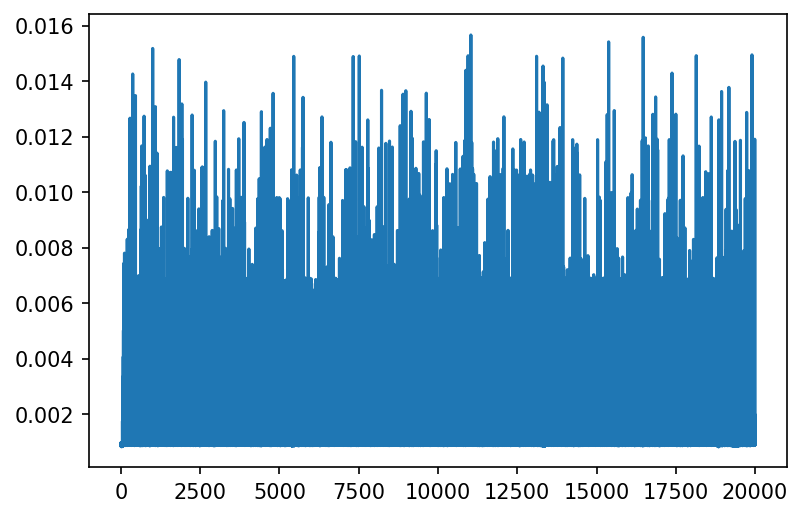

In [41]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(step_times_3)

In [ ]:
# Tolerance: 1.0e7

In [42]:
# PeriodicNonEq
from openmmtools.integrators import PeriodicNonequilibriumIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = PeriodicNonequilibriumIntegrator(DEFAULT_ALCHEMICAL_FUNCTIONS, nsteps_eq, nsteps_neq, neq_splitting, timestep=timestep)


In [43]:
integrator.setConstraintTolerance(1e-7)

In [44]:
integrator.getConstraintTolerance()

1e-07

In [45]:
from simtk import openmm

temperature = 300*unit.kelvin
collision_rate = 90/unit.picosecond
platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [46]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [47]:
# Run neq
ncycles = 1
forward_works_master, reverse_works_master = list(), list()
for _ in range(ncycles):
    # Equilibrium (lambda = 0)
    _logger.info(f'Starting to equilibrate at lambda = 0')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 0, took: {elapsed_time / unit.seconds} seconds')

    # Forward (0 -> 1)
    forward_works = [integrator.get_protocol_work(dimensionless=True)]
    forward_times = []
    for fwd_step in range(nsteps_neq):
        _logger.info(f'forward NEQ step: {fwd_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        forward_times.append(elapsed_time)
        forward_works.append(integrator.get_protocol_work(dimensionless=True))
    forward_works_master.append(forward_works)

    # Equilibrium (lambda = 1)
    _logger.info(f'Starting to equilibrate at lambda = 1')
    initial_time = time.time()
    integrator.step(nsteps_eq)
    elapsed_time = (time.time() - initial_time) * unit.seconds
    _logger.info(f'Done equilibrating at lambda = 1, took: {elapsed_time / unit.seconds} seconds')

    # Reverse work (1 -> 0)
    reverse_works = [integrator.get_protocol_work(dimensionless=True)]
    reverse_times = []
    for rev_step in range(nsteps_neq):
        _logger.info(f'reverse NEQ step: {rev_step}, took: {elapsed_time / unit.seconds} seconds')
        initial_time = time.time()
        integrator.step(1)
        elapsed_time = (time.time() - initial_time) * unit.seconds
        reverse_times.append(elapsed_time)
        reverse_works.append(integrator.get_protocol_work(dimensionless=True))
    reverse_works_master.append(reverse_works)

INFO:root:Starting to equilibrate at lambda = 0
INFO:root:Done equilibrating at lambda = 0, took: 63.745192766189575 seconds
INFO:root:forward NEQ step: 0, took: 63.745192766189575 seconds
INFO:root:forward NEQ step: 1, took: 0.0008733272552490234 seconds
INFO:root:forward NEQ step: 2, took: 0.0008575916290283203 seconds
INFO:root:forward NEQ step: 3, took: 0.0008640289306640625 seconds
INFO:root:forward NEQ step: 4, took: 0.0009801387786865234 seconds
INFO:root:forward NEQ step: 5, took: 0.0008478164672851562 seconds
INFO:root:forward NEQ step: 6, took: 0.0008511543273925781 seconds
INFO:root:forward NEQ step: 7, took: 0.0008707046508789062 seconds
INFO:root:forward NEQ step: 8, took: 0.0008504390716552734 seconds
INFO:root:forward NEQ step: 9, took: 0.0009741783142089844 seconds
INFO:root:forward NEQ step: 10, took: 0.0008661746978759766 seconds
INFO:root:forward NEQ step: 11, took: 0.0008537769317626953 seconds
INFO:root:forward NEQ step: 12, took: 0.0008611679077148438 seconds
INFO

INFO:root:forward NEQ step: 119, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ step: 120, took: 0.0056765079498291016 seconds
INFO:root:forward NEQ step: 121, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 122, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 123, took: 0.0010318756103515625 seconds
INFO:root:forward NEQ step: 124, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 125, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 126, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 127, took: 0.005708932876586914 seconds
INFO:root:forward NEQ step: 128, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 129, took: 0.0009191036224365234 seconds
INFO:root:forward NEQ step: 130, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 131, took: 0.0009226799011230469 seconds
INFO:root:forward NEQ step: 132, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 133, too

INFO:root:forward NEQ step: 239, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 240, took: 0.003324270248413086 seconds
INFO:root:forward NEQ step: 241, took: 0.0009417533874511719 seconds
INFO:root:forward NEQ step: 242, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 243, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 244, took: 0.005796194076538086 seconds
INFO:root:forward NEQ step: 245, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 246, took: 0.0009398460388183594 seconds
INFO:root:forward NEQ step: 247, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 248, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 249, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 250, took: 0.001958608627319336 seconds
INFO:root:forward NEQ step: 251, took: 0.005799770355224609 seconds
INFO:root:forward NEQ step: 252, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 253, took: 0.0

INFO:root:forward NEQ step: 359, took: 0.0009508132934570312 seconds
INFO:root:forward NEQ step: 360, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 361, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 362, took: 0.009563684463500977 seconds
INFO:root:forward NEQ step: 363, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 364, took: 0.0010170936584472656 seconds
INFO:root:forward NEQ step: 365, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 366, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 367, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 368, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 369, took: 0.0010178089141845703 seconds
INFO:root:forward NEQ step: 370, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 371, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 372, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 373, too

INFO:root:forward NEQ step: 479, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 480, took: 0.005496978759765625 seconds
INFO:root:forward NEQ step: 481, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 482, took: 0.000949859619140625 seconds
INFO:root:forward NEQ step: 483, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 484, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 485, took: 0.0009229183197021484 seconds
INFO:root:forward NEQ step: 486, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 487, took: 0.001018524169921875 seconds
INFO:root:forward NEQ step: 488, took: 0.006811857223510742 seconds
INFO:root:forward NEQ step: 489, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 490, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 491, took: 0.0010118484497070312 seconds
INFO:root:forward NEQ step: 492, took: 0.0009186267852783203 seconds
INFO:root:forward NEQ step: 493, took:

INFO:root:forward NEQ step: 599, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 600, took: 0.0018894672393798828 seconds
INFO:root:forward NEQ step: 601, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 602, took: 0.006595134735107422 seconds
INFO:root:forward NEQ step: 603, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 604, took: 0.0009586811065673828 seconds
INFO:root:forward NEQ step: 605, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 606, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 607, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 608, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 609, took: 0.0010285377502441406 seconds
INFO:root:forward NEQ step: 610, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 611, took: 0.005797863006591797 seconds
INFO:root:forward NEQ step: 612, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 613, too

INFO:root:forward NEQ step: 719, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 720, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 721, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 722, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 723, took: 0.0009701251983642578 seconds
INFO:root:forward NEQ step: 724, took: 0.005807161331176758 seconds
INFO:root:forward NEQ step: 725, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 726, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 727, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 728, took: 0.0009555816650390625 seconds
INFO:root:forward NEQ step: 729, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 730, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 731, took: 0.005787849426269531 seconds
INFO:root:forward NEQ step: 732, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 733, too

INFO:root:forward NEQ step: 838, took: 0.005854368209838867 seconds
INFO:root:forward NEQ step: 839, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 840, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 841, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 842, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 843, took: 0.0010223388671875 seconds
INFO:root:forward NEQ step: 844, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 845, took: 0.0009195804595947266 seconds
INFO:root:forward NEQ step: 846, took: 0.005854606628417969 seconds
INFO:root:forward NEQ step: 847, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 848, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 849, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 850, took: 0.0019855499267578125 seconds
INFO:root:forward NEQ step: 851, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 852, took: 0.0008

INFO:root:forward NEQ step: 958, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 959, took: 0.001004934310913086 seconds
INFO:root:forward NEQ step: 960, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 961, took: 0.007614612579345703 seconds
INFO:root:forward NEQ step: 962, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 963, took: 0.0009639263153076172 seconds
INFO:root:forward NEQ step: 964, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 965, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 966, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 967, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 968, took: 0.0009703636169433594 seconds
INFO:root:forward NEQ step: 969, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 970, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 971, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 972, took

INFO:root:forward NEQ step: 1077, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 1078, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 1079, took: 0.006886720657348633 seconds
INFO:root:forward NEQ step: 1080, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 1081, took: 0.0010235309600830078 seconds
INFO:root:forward NEQ step: 1082, took: 0.0008857250213623047 seconds
INFO:root:forward NEQ step: 1083, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 1084, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 1085, took: 0.0009617805480957031 seconds
INFO:root:forward NEQ step: 1086, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 1087, took: 0.0008845329284667969 seconds
INFO:root:forward NEQ step: 1088, took: 0.006800174713134766 seconds
INFO:root:forward NEQ step: 1089, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 1090, took: 0.0010166168212890625 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 1195, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 1196, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 1197, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 1198, took: 0.0009441375732421875 seconds
INFO:root:forward NEQ step: 1199, took: 0.006559610366821289 seconds
INFO:root:forward NEQ step: 1200, took: 0.0020241737365722656 seconds
INFO:root:forward NEQ step: 1201, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 1202, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 1203, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 1204, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 1205, took: 0.0010013580322265625 seconds
INFO:root:forward NEQ step: 1206, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 1207, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 1208, took: 0.0058934688568115234 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1313, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 1314, took: 0.0057735443115234375 seconds
INFO:root:forward NEQ step: 1315, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 1316, took: 0.0009474754333496094 seconds
INFO:root:forward NEQ step: 1317, took: 0.0009236335754394531 seconds
INFO:root:forward NEQ step: 1318, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 1319, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 1320, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 1321, took: 0.010265588760375977 seconds
INFO:root:forward NEQ step: 1322, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 1323, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 1324, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 1325, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 1326, took: 0.0010113716125488281 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 1431, took: 0.0009853839874267578 seconds
INFO:root:forward NEQ step: 1432, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 1433, took: 0.0010302066802978516 seconds
INFO:root:forward NEQ step: 1434, took: 0.005803585052490234 seconds
INFO:root:forward NEQ step: 1435, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 1436, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 1437, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 1438, took: 0.0010077953338623047 seconds
INFO:root:forward NEQ step: 1439, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 1440, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 1441, took: 0.006903648376464844 seconds
INFO:root:forward NEQ step: 1442, took: 0.0009586811065673828 seconds
INFO:root:forward NEQ step: 1443, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 1444, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 1549, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 1550, took: 0.001974821090698242 seconds
INFO:root:forward NEQ step: 1551, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 1552, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 1553, took: 0.0009179115295410156 seconds
INFO:root:forward NEQ step: 1554, took: 0.0009479522705078125 seconds
INFO:root:forward NEQ step: 1555, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 1556, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 1557, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 1558, took: 0.0069010257720947266 seconds
INFO:root:forward NEQ step: 1559, took: 0.0009543895721435547 seconds
INFO:root:forward NEQ step: 1560, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 1561, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 1562, took: 0.0015106201171875 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 1667, took: 0.0009443759918212891 seconds
INFO:root:forward NEQ step: 1668, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 1669, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 1670, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 1671, took: 0.011614084243774414 seconds
INFO:root:forward NEQ step: 1672, took: 0.0010280609130859375 seconds
INFO:root:forward NEQ step: 1673, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 1674, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ step: 1675, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 1676, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 1677, took: 0.0010781288146972656 seconds
INFO:root:forward NEQ step: 1678, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 1679, took: 0.0009303092956542969 seconds
INFO:root:forward NEQ step: 1680, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 1785, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 1786, took: 0.0009441375732421875 seconds
INFO:root:forward NEQ step: 1787, took: 0.006753206253051758 seconds
INFO:root:forward NEQ step: 1788, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 1789, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 1790, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 1791, took: 0.0010166168212890625 seconds
INFO:root:forward NEQ step: 1792, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 1793, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 1794, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 1795, took: 0.0009629726409912109 seconds
INFO:root:forward NEQ step: 1796, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 1797, took: 0.010808467864990234 seconds
INFO:root:forward NEQ step: 1798, took: 0.0009160041809082031 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 1903, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 1904, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 1905, took: 0.0010023117065429688 seconds
INFO:root:forward NEQ step: 1906, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 1907, took: 0.005712032318115234 seconds
INFO:root:forward NEQ step: 1908, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 1909, took: 0.0009744167327880859 seconds
INFO:root:forward NEQ step: 1910, took: 0.000982046127319336 seconds
INFO:root:forward NEQ step: 1911, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 1912, took: 0.0009279251098632812 seconds
INFO:root:forward NEQ step: 1913, took: 0.0009255409240722656 seconds
INFO:root:forward NEQ step: 1914, took: 0.006681203842163086 seconds
INFO:root:forward NEQ step: 1915, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 1916, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 2021, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 2022, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 2023, took: 0.001016378402709961 seconds
INFO:root:forward NEQ step: 2024, took: 0.011782407760620117 seconds
INFO:root:forward NEQ step: 2025, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 2026, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 2027, took: 0.0009653568267822266 seconds
INFO:root:forward NEQ step: 2028, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 2029, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 2030, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 2031, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 2032, took: 0.0009670257568359375 seconds
INFO:root:forward NEQ step: 2033, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 2034, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 2139, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 2140, took: 0.00283050537109375 seconds
INFO:root:forward NEQ step: 2141, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 2142, took: 0.0008780956268310547 seconds
INFO:root:forward NEQ step: 2143, took: 0.0057141780853271484 seconds
INFO:root:forward NEQ step: 2144, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 2145, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 2146, took: 0.0010275840759277344 seconds
INFO:root:forward NEQ step: 2147, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 2148, took: 0.0009217262268066406 seconds
INFO:root:forward NEQ step: 2149, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 2150, took: 0.0066797733306884766 seconds
INFO:root:forward NEQ step: 2151, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 2152, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 2257, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 2258, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 2259, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 2260, took: 0.0009472370147705078 seconds
INFO:root:forward NEQ step: 2261, took: 0.009793996810913086 seconds
INFO:root:forward NEQ step: 2262, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 2263, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 2264, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 2265, took: 0.001092672348022461 seconds
INFO:root:forward NEQ step: 2266, took: 0.0009286403656005859 seconds
INFO:root:forward NEQ step: 2267, took: 0.0009226799011230469 seconds
INFO:root:forward NEQ step: 2268, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 2269, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 2270, took: 0.0009677410125732422 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 2375, took: 0.005853176116943359 seconds
INFO:root:forward NEQ step: 2376, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 2377, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 2378, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 2379, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 2380, took: 0.0009520053863525391 seconds
INFO:root:forward NEQ step: 2381, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 2382, took: 0.005799770355224609 seconds
INFO:root:forward NEQ step: 2383, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 2384, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 2385, took: 0.000978708267211914 seconds
INFO:root:forward NEQ step: 2386, took: 0.0009160041809082031 seconds
INFO:root:forward NEQ step: 2387, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 2388, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 2493, took: 0.005944728851318359 seconds
INFO:root:forward NEQ step: 2494, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 2495, took: 0.0009543895721435547 seconds
INFO:root:forward NEQ step: 2496, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 2497, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 2498, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 2499, took: 0.0010280609130859375 seconds
INFO:root:forward NEQ step: 2500, took: 0.008418798446655273 seconds
INFO:root:forward NEQ step: 2501, took: 0.0009591579437255859 seconds
INFO:root:forward NEQ step: 2502, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 2503, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 2504, took: 0.001020669937133789 seconds
INFO:root:forward NEQ step: 2505, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 2506, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 2611, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 2612, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 2613, took: 0.0010192394256591797 seconds
INFO:root:forward NEQ step: 2614, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 2615, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 2616, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 2617, took: 0.006897687911987305 seconds
INFO:root:forward NEQ step: 2618, took: 0.0010302066802978516 seconds
INFO:root:forward NEQ step: 2619, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 2620, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 2621, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 2622, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 2623, took: 0.0010364055633544922 seconds
INFO:root:forward NEQ step: 2624, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 2729, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 2730, took: 0.005615234375 seconds
INFO:root:forward NEQ step: 2731, took: 0.0009367465972900391 seconds
INFO:root:forward NEQ step: 2732, took: 0.0009713172912597656 seconds
INFO:root:forward NEQ step: 2733, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 2734, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 2735, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 2736, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 2737, took: 0.0009622573852539062 seconds
INFO:root:forward NEQ step: 2738, took: 0.00675201416015625 seconds
INFO:root:forward NEQ step: 2739, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 2740, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 2741, took: 0.00092315673828125 seconds
INFO:root:forward NEQ step: 2742, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 274

INFO:root:forward NEQ step: 2847, took: 0.0010097026824951172 seconds
INFO:root:forward NEQ step: 2848, took: 0.005901336669921875 seconds
INFO:root:forward NEQ step: 2849, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 2850, took: 0.0018496513366699219 seconds
INFO:root:forward NEQ step: 2851, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 2852, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 2853, took: 0.0009393692016601562 seconds
INFO:root:forward NEQ step: 2854, took: 0.0009338855743408203 seconds
INFO:root:forward NEQ step: 2855, took: 0.001493215560913086 seconds
INFO:root:forward NEQ step: 2856, took: 0.007844209671020508 seconds
INFO:root:forward NEQ step: 2857, took: 0.0009195804595947266 seconds
INFO:root:forward NEQ step: 2858, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 2859, took: 0.0009570121765136719 seconds
INFO:root:forward NEQ step: 2860, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 2965, took: 0.0009160041809082031 seconds
INFO:root:forward NEQ step: 2966, took: 0.0068929195404052734 seconds
INFO:root:forward NEQ step: 2967, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 2968, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 2969, took: 0.0010161399841308594 seconds
INFO:root:forward NEQ step: 2970, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 2971, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 2972, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 2973, took: 0.0009481906890869141 seconds
INFO:root:forward NEQ step: 2974, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 2975, took: 0.001605987548828125 seconds
INFO:root:forward NEQ step: 2976, took: 0.007606983184814453 seconds
INFO:root:forward NEQ step: 2977, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 2978, took: 0.001028299331665039 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 3083, took: 0.001013040542602539 seconds
INFO:root:forward NEQ step: 3084, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 3085, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 3086, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 3087, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 3088, took: 0.0010063648223876953 seconds
INFO:root:forward NEQ step: 3089, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 3090, took: 0.007615804672241211 seconds
INFO:root:forward NEQ step: 3091, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 3092, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 3093, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 3094, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 3095, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 3096, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3201, took: 0.0009214878082275391 seconds
INFO:root:forward NEQ step: 3202, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 3203, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 3204, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 3205, took: 0.0010142326354980469 seconds
INFO:root:forward NEQ step: 3206, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 3207, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 3208, took: 0.005890607833862305 seconds
INFO:root:forward NEQ step: 3209, took: 0.0009560585021972656 seconds
INFO:root:forward NEQ step: 3210, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 3211, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 3212, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 3213, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 3214, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 3319, took: 0.0016498565673828125 seconds
INFO:root:forward NEQ step: 3320, took: 0.0013048648834228516 seconds
INFO:root:forward NEQ step: 3321, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 3322, took: 0.005582571029663086 seconds
INFO:root:forward NEQ step: 3323, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 3324, took: 0.0010173320770263672 seconds
INFO:root:forward NEQ step: 3325, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 3326, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 3327, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 3328, took: 0.0009615421295166016 seconds
INFO:root:forward NEQ step: 3329, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 3330, took: 0.012818574905395508 seconds
INFO:root:forward NEQ step: 3331, took: 0.0009236335754394531 seconds
INFO:root:forward NEQ step: 3332, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 3437, took: 0.0075037479400634766 seconds
INFO:root:forward NEQ step: 3438, took: 0.0009388923645019531 seconds
INFO:root:forward NEQ step: 3439, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 3440, took: 0.0009491443634033203 seconds
INFO:root:forward NEQ step: 3441, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 3442, took: 0.0009160041809082031 seconds
INFO:root:forward NEQ step: 3443, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 3444, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 3445, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 3446, took: 0.0010259151458740234 seconds
INFO:root:forward NEQ step: 3447, took: 0.00656437873840332 seconds
INFO:root:forward NEQ step: 3448, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 3449, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 3450, took: 0.0020301342010498047 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 3555, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 3556, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 3557, took: 0.0009303092956542969 seconds
INFO:root:forward NEQ step: 3558, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 3559, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 3560, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ step: 3561, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 3562, took: 0.005887031555175781 seconds
INFO:root:forward NEQ step: 3563, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 3564, took: 0.0010068416595458984 seconds
INFO:root:forward NEQ step: 3565, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 3566, took: 0.0009229183197021484 seconds
INFO:root:forward NEQ step: 3567, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 3568, took: 0.0009567737579345703 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 3673, took: 0.0009734630584716797 seconds
INFO:root:forward NEQ step: 3674, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 3675, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 3676, took: 0.006609678268432617 seconds
INFO:root:forward NEQ step: 3677, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 3678, took: 0.0009479522705078125 seconds
INFO:root:forward NEQ step: 3679, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 3680, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 3681, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 3682, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 3683, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 3684, took: 0.0010390281677246094 seconds
INFO:root:forward NEQ step: 3685, took: 0.007611989974975586 seconds
INFO:root:forward NEQ step: 3686, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 3791, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 3792, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 3793, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 3794, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 3795, took: 0.005853176116943359 seconds
INFO:root:forward NEQ step: 3796, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 3797, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 3798, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 3799, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 3800, took: 0.002009868621826172 seconds
INFO:root:forward NEQ step: 3801, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 3802, took: 0.0058023929595947266 seconds
INFO:root:forward NEQ step: 3803, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 3804, took: 0.0009667873382568359 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 3909, took: 0.005800008773803711 seconds
INFO:root:forward NEQ step: 3910, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 3911, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 3912, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 3913, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 3914, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 3915, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 3916, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 3917, took: 0.010632753372192383 seconds
INFO:root:forward NEQ step: 3918, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 3919, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 3920, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 3921, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 3922, took: 0.0010166168212890625 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4027, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 4028, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 4029, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 4030, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 4031, took: 0.0010221004486083984 seconds
INFO:root:forward NEQ step: 4032, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 4033, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 4034, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 4035, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 4036, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 4037, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 4038, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 4039, took: 0.00789189338684082 seconds
INFO:root:forward NEQ step: 4040, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4145, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 4146, took: 0.005785703659057617 seconds
INFO:root:forward NEQ step: 4147, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 4148, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 4149, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 4150, took: 0.001851797103881836 seconds
INFO:root:forward NEQ step: 4151, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 4152, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 4153, took: 0.005796194076538086 seconds
INFO:root:forward NEQ step: 4154, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 4155, took: 0.0010652542114257812 seconds
INFO:root:forward NEQ step: 4156, took: 0.0009198188781738281 seconds
INFO:root:forward NEQ step: 4157, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 4158, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 4263, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 4264, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 4265, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 4266, took: 0.0010101795196533203 seconds
INFO:root:forward NEQ step: 4267, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 4268, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 4269, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 4270, took: 0.0055882930755615234 seconds
INFO:root:forward NEQ step: 4271, took: 0.0010166168212890625 seconds
INFO:root:forward NEQ step: 4272, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 4273, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ step: 4274, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 4275, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 4276, took: 0.0010035037994384766 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 4381, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 4382, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 4383, took: 0.005722522735595703 seconds
INFO:root:forward NEQ step: 4384, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 4385, took: 0.0010178089141845703 seconds
INFO:root:forward NEQ step: 4386, took: 0.0009198188781738281 seconds
INFO:root:forward NEQ step: 4387, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 4388, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 4389, took: 0.000972747802734375 seconds
INFO:root:forward NEQ step: 4390, took: 0.008708000183105469 seconds
INFO:root:forward NEQ step: 4391, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 4392, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 4393, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 4394, took: 0.001001596450805664 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 4499, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 4500, took: 0.0018782615661621094 seconds
INFO:root:forward NEQ step: 4501, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 4502, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 4503, took: 0.0054781436920166016 seconds
INFO:root:forward NEQ step: 4504, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 4505, took: 0.001007080078125 seconds
INFO:root:forward NEQ step: 4506, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 4507, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 4508, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 4509, took: 0.0009655952453613281 seconds
INFO:root:forward NEQ step: 4510, took: 0.012553930282592773 seconds
INFO:root:forward NEQ step: 4511, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 4512, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 4617, took: 0.006493568420410156 seconds
INFO:root:forward NEQ step: 4618, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 4619, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 4620, took: 0.0010199546813964844 seconds
INFO:root:forward NEQ step: 4621, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 4622, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 4623, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 4624, took: 0.0009596347808837891 seconds
INFO:root:forward NEQ step: 4625, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 4626, took: 0.005795001983642578 seconds
INFO:root:forward NEQ step: 4627, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 4628, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 4629, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 4630, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4735, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 4736, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 4737, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 4738, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 4739, took: 0.0054857730865478516 seconds
INFO:root:forward NEQ step: 4740, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 4741, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 4742, took: 0.0009720325469970703 seconds
INFO:root:forward NEQ step: 4743, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 4744, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 4745, took: 0.0009372234344482422 seconds
INFO:root:forward NEQ step: 4746, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 4747, took: 0.005802154541015625 seconds
INFO:root:forward NEQ step: 4748, took: 0.00090789794921875 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 4853, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 4854, took: 0.0010929107666015625 seconds
INFO:root:forward NEQ step: 4855, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ step: 4856, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 4857, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 4858, took: 0.00690007209777832 seconds
INFO:root:forward NEQ step: 4859, took: 0.0010132789611816406 seconds
INFO:root:forward NEQ step: 4860, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 4861, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 4862, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 4863, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 4864, took: 0.0010194778442382812 seconds
INFO:root:forward NEQ step: 4865, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 4866, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 4971, took: 0.0058019161224365234 seconds
INFO:root:forward NEQ step: 4972, took: 0.0009579658508300781 seconds
INFO:root:forward NEQ step: 4973, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 4974, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 4975, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 4976, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 4977, took: 0.0010077953338623047 seconds
INFO:root:forward NEQ step: 4978, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 4979, took: 0.0066220760345458984 seconds
INFO:root:forward NEQ step: 4980, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 4981, took: 0.0009741783142089844 seconds
INFO:root:forward NEQ step: 4982, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 4983, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 4984, took: 0.0009181499481201172 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 5089, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 5090, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 5091, took: 0.001004934310913086 seconds
INFO:root:forward NEQ step: 5092, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 5093, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 5094, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 5095, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 5096, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 5097, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 5098, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 5099, took: 0.0058825016021728516 seconds
INFO:root:forward NEQ step: 5100, took: 0.0018684864044189453 seconds
INFO:root:forward NEQ step: 5101, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 5102, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 5207, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 5208, took: 0.0009937286376953125 seconds
INFO:root:forward NEQ step: 5209, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 5210, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 5211, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 5212, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 5213, took: 0.005450010299682617 seconds
INFO:root:forward NEQ step: 5214, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 5215, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 5216, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 5217, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 5218, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 5219, took: 0.001028299331665039 seconds
INFO:root:forward NEQ step: 5220, took: 0.0009002685546875 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 5325, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 5326, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 5327, took: 0.006501913070678711 seconds
INFO:root:forward NEQ step: 5328, took: 0.0013041496276855469 seconds
INFO:root:forward NEQ step: 5329, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 5330, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 5331, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 5332, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 5333, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 5334, took: 0.005793333053588867 seconds
INFO:root:forward NEQ step: 5335, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 5336, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 5337, took: 0.0009982585906982422 seconds
INFO:root:forward NEQ step: 5338, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5443, took: 0.0009748935699462891 seconds
INFO:root:forward NEQ step: 5444, took: 0.0009329319000244141 seconds
INFO:root:forward NEQ step: 5445, took: 0.0009527206420898438 seconds
INFO:root:forward NEQ step: 5446, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 5447, took: 0.0009305477142333984 seconds
INFO:root:forward NEQ step: 5448, took: 0.0009570121765136719 seconds
INFO:root:forward NEQ step: 5449, took: 0.0065915584564208984 seconds
INFO:root:forward NEQ step: 5450, took: 0.00197601318359375 seconds
INFO:root:forward NEQ step: 5451, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 5452, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 5453, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 5454, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 5455, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 5456, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5561, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 5562, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 5563, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 5564, took: 0.0009751319885253906 seconds
INFO:root:forward NEQ step: 5565, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 5566, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 5567, took: 0.006890535354614258 seconds
INFO:root:forward NEQ step: 5568, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 5569, took: 0.0009729862213134766 seconds
INFO:root:forward NEQ step: 5570, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 5571, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 5572, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 5573, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 5574, took: 0.0009682178497314453 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 5679, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 5680, took: 0.0009257793426513672 seconds
INFO:root:forward NEQ step: 5681, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 5682, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 5683, took: 0.0009496212005615234 seconds
INFO:root:forward NEQ step: 5684, took: 0.005482196807861328 seconds
INFO:root:forward NEQ step: 5685, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 5686, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 5687, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 5688, took: 0.0010123252868652344 seconds
INFO:root:forward NEQ step: 5689, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 5690, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 5691, took: 0.0009238719940185547 seconds
INFO:root:forward NEQ step: 5692, took: 0.005802631378173828 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 5797, took: 0.006901979446411133 seconds
INFO:root:forward NEQ step: 5798, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 5799, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 5800, took: 0.0018761157989501953 seconds
INFO:root:forward NEQ step: 5801, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 5802, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 5803, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 5804, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 5805, took: 0.0010211467742919922 seconds
INFO:root:forward NEQ step: 5806, took: 0.00657963752746582 seconds
INFO:root:forward NEQ step: 5807, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 5808, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 5809, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 5810, took: 0.0010173320770263672 seconds
INFO:root:forward NEQ step: 5

INFO:root:forward NEQ step: 5915, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 5916, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 5917, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 5918, took: 0.0009479522705078125 seconds
INFO:root:forward NEQ step: 5919, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 5920, took: 0.0058269500732421875 seconds
INFO:root:forward NEQ step: 5921, took: 0.0009403228759765625 seconds
INFO:root:forward NEQ step: 5922, took: 0.0009260177612304688 seconds
INFO:root:forward NEQ step: 5923, took: 0.0010063648223876953 seconds
INFO:root:forward NEQ step: 5924, took: 0.0009369850158691406 seconds
INFO:root:forward NEQ step: 5925, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 5926, took: 0.0009279251098632812 seconds
INFO:root:forward NEQ step: 5927, took: 0.0009541511535644531 seconds
INFO:root:forward NEQ step: 5928, took: 0.006813526153564453 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 6033, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 6034, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 6035, took: 0.0066242218017578125 seconds
INFO:root:forward NEQ step: 6036, took: 0.0009508132934570312 seconds
INFO:root:forward NEQ step: 6037, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 6038, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 6039, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 6040, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 6041, took: 0.0009887218475341797 seconds
INFO:root:forward NEQ step: 6042, took: 0.0009329319000244141 seconds
INFO:root:forward NEQ step: 6043, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 6044, took: 0.008617639541625977 seconds
INFO:root:forward NEQ step: 6045, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 6046, took: 0.0009653568267822266 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 6151, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 6152, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 6153, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 6154, took: 0.0009627342224121094 seconds
INFO:root:forward NEQ step: 6155, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 6156, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 6157, took: 0.0009427070617675781 seconds
INFO:root:forward NEQ step: 6158, took: 0.0009260177612304688 seconds
INFO:root:forward NEQ step: 6159, took: 0.0010213851928710938 seconds
INFO:root:forward NEQ step: 6160, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 6161, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 6162, took: 0.005495309829711914 seconds
INFO:root:forward NEQ step: 6163, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 6164, took: 0.0010218620300292969 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 6269, took: 0.001073598861694336 seconds
INFO:root:forward NEQ step: 6270, took: 0.0065920352935791016 seconds
INFO:root:forward NEQ step: 6271, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 6272, took: 0.001628875732421875 seconds
INFO:root:forward NEQ step: 6273, took: 0.001012563705444336 seconds
INFO:root:forward NEQ step: 6274, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 6275, took: 0.0009465217590332031 seconds
INFO:root:forward NEQ step: 6276, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 6277, took: 0.005913496017456055 seconds
INFO:root:forward NEQ step: 6278, took: 0.0010178089141845703 seconds
INFO:root:forward NEQ step: 6279, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 6280, took: 0.0009255409240722656 seconds
INFO:root:forward NEQ step: 6281, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 6282, took: 0.0009706020355224609 seconds
INFO:root:forward NEQ st

INFO:root:forward NEQ step: 6387, took: 0.0010318756103515625 seconds
INFO:root:forward NEQ step: 6388, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 6389, took: 0.006899118423461914 seconds
INFO:root:forward NEQ step: 6390, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 6391, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 6392, took: 0.0010411739349365234 seconds
INFO:root:forward NEQ step: 6393, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 6394, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 6395, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 6396, took: 0.0009403228759765625 seconds
INFO:root:forward NEQ step: 6397, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 6398, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 6399, took: 0.00689697265625 seconds
INFO:root:forward NEQ step: 6400, took: 0.0020313262939453125 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 6505, took: 0.00841212272644043 seconds
INFO:root:forward NEQ step: 6506, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 6507, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 6508, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 6509, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 6510, took: 0.0010159015655517578 seconds
INFO:root:forward NEQ step: 6511, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 6512, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 6513, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 6514, took: 0.0009570121765136719 seconds
INFO:root:forward NEQ step: 6515, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 6516, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 6517, took: 0.010616540908813477 seconds
INFO:root:forward NEQ step: 6518, took: 0.0009229183197021484 seconds
INFO:root:forward NEQ step: 

INFO:root:forward NEQ step: 6623, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 6624, took: 0.0009415149688720703 seconds
INFO:root:forward NEQ step: 6625, took: 0.00688624382019043 seconds
INFO:root:forward NEQ step: 6626, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 6627, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 6628, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 6629, took: 0.0009539127349853516 seconds
INFO:root:forward NEQ step: 6630, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 6631, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 6632, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 6633, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 6634, took: 0.0057981014251708984 seconds
INFO:root:forward NEQ step: 6635, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 6636, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 6741, took: 0.0009562969207763672 seconds
INFO:root:forward NEQ step: 6742, took: 0.005887508392333984 seconds
INFO:root:forward NEQ step: 6743, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 6744, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 6745, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 6746, took: 0.0009486675262451172 seconds
INFO:root:forward NEQ step: 6747, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 6748, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 6749, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 6750, took: 0.006876468658447266 seconds
INFO:root:forward NEQ step: 6751, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 6752, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 6753, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 6754, took: 0.0009672641754150391 seconds
INFO:root:forward NEQ step

INFO:root:forward NEQ step: 6859, took: 0.0009615421295166016 seconds
INFO:root:forward NEQ step: 6860, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 6861, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 6862, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 6863, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 6864, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 6865, took: 0.0010046958923339844 seconds
INFO:root:forward NEQ step: 6866, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 6867, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 6868, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 6869, took: 0.0016608238220214844 seconds
INFO:root:forward NEQ step: 6870, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 6871, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 6872, took: 0.0009291172027587891 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 6977, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 6978, took: 0.0010404586791992188 seconds
INFO:root:forward NEQ step: 6979, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 6980, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 6981, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 6982, took: 0.006937265396118164 seconds
INFO:root:forward NEQ step: 6983, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 6984, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 6985, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 6986, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 6987, took: 0.0009722709655761719 seconds
INFO:root:forward NEQ step: 6988, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 6989, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 6990, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 7095, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 7096, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 7097, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 7098, took: 0.0009634494781494141 seconds
INFO:root:forward NEQ step: 7099, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 7100, took: 0.0018808841705322266 seconds
INFO:root:forward NEQ step: 7101, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 7102, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 7103, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 7104, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 7105, took: 0.0009632110595703125 seconds
INFO:root:forward NEQ step: 7106, took: 0.0058591365814208984 seconds
INFO:root:forward NEQ step: 7107, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 7108, took: 0.0008985996246337891 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 7213, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 7214, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 7215, took: 0.0010187625885009766 seconds
INFO:root:forward NEQ step: 7216, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 7217, took: 0.0009250640869140625 seconds
INFO:root:forward NEQ step: 7218, took: 0.010622501373291016 seconds
INFO:root:forward NEQ step: 7219, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 7220, took: 0.0010182857513427734 seconds
INFO:root:forward NEQ step: 7221, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 7222, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 7223, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 7224, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 7225, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 7226, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 7331, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 7332, took: 0.0009601116180419922 seconds
INFO:root:forward NEQ step: 7333, took: 0.005789279937744141 seconds
INFO:root:forward NEQ step: 7334, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 7335, took: 0.0015270709991455078 seconds
INFO:root:forward NEQ step: 7336, took: 0.0012438297271728516 seconds
INFO:root:forward NEQ step: 7337, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 7338, took: 0.0009214878082275391 seconds
INFO:root:forward NEQ step: 7339, took: 0.0009455680847167969 seconds
INFO:root:forward NEQ step: 7340, took: 0.005648374557495117 seconds
INFO:root:forward NEQ step: 7341, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 7342, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 7343, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 7344, took: 0.0009570121765136719 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 7449, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 7450, took: 0.002008199691772461 seconds
INFO:root:forward NEQ step: 7451, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 7452, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 7453, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 7454, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 7455, took: 0.0008864402770996094 seconds
INFO:root:forward NEQ step: 7456, took: 0.006909847259521484 seconds
INFO:root:forward NEQ step: 7457, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 7458, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 7459, took: 0.0009620189666748047 seconds
INFO:root:forward NEQ step: 7460, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 7461, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 7462, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 7567, took: 0.0009462833404541016 seconds
INFO:root:forward NEQ step: 7568, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 7569, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 7570, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 7571, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 7572, took: 0.0009598731994628906 seconds
INFO:root:forward NEQ step: 7573, took: 0.005808830261230469 seconds
INFO:root:forward NEQ step: 7574, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 7575, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 7576, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 7577, took: 0.000982046127319336 seconds
INFO:root:forward NEQ step: 7578, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 7579, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 7580, took: 0.005800962448120117 seconds
INFO:root:forward NEQ step:

INFO:root:forward NEQ step: 7685, took: 0.0009176731109619141 seconds
INFO:root:forward NEQ step: 7686, took: 0.0008745193481445312 seconds
INFO:root:forward NEQ step: 7687, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 7688, took: 0.0010175704956054688 seconds
INFO:root:forward NEQ step: 7689, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 7690, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 7691, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 7692, took: 0.010803699493408203 seconds
INFO:root:forward NEQ step: 7693, took: 0.0010232925415039062 seconds
INFO:root:forward NEQ step: 7694, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 7695, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 7696, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 7697, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 7698, took: 0.0010180473327636719 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 7803, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 7804, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 7805, took: 0.005701303482055664 seconds
INFO:root:forward NEQ step: 7806, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 7807, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 7808, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 7809, took: 0.0009229183197021484 seconds
INFO:root:forward NEQ step: 7810, took: 0.0009474754333496094 seconds
INFO:root:forward NEQ step: 7811, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 7812, took: 0.010305404663085938 seconds
INFO:root:forward NEQ step: 7813, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 7814, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 7815, took: 0.001055002212524414 seconds
INFO:root:forward NEQ step: 7816, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 7921, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 7922, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 7923, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 7924, took: 0.0009508132934570312 seconds
INFO:root:forward NEQ step: 7925, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 7926, took: 0.0057942867279052734 seconds
INFO:root:forward NEQ step: 7927, took: 0.0009183883666992188 seconds
INFO:root:forward NEQ step: 7928, took: 0.0009236335754394531 seconds
INFO:root:forward NEQ step: 7929, took: 0.0009555816650390625 seconds
INFO:root:forward NEQ step: 7930, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 7931, took: 0.0009195804595947266 seconds
INFO:root:forward NEQ step: 7932, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 7933, took: 0.00589442253112793 seconds
INFO:root:forward NEQ step: 7934, took: 0.0009639263153076172 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 8039, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 8040, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 8041, took: 0.005533933639526367 seconds
INFO:root:forward NEQ step: 8042, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 8043, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 8044, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 8045, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 8046, took: 0.0010235309600830078 seconds
INFO:root:forward NEQ step: 8047, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 8048, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 8049, took: 0.005794525146484375 seconds
INFO:root:forward NEQ step: 8050, took: 0.0018613338470458984 seconds
INFO:root:forward NEQ step: 8051, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 8052, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8157, took: 0.006895303726196289 seconds
INFO:root:forward NEQ step: 8158, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 8159, took: 0.0009608268737792969 seconds
INFO:root:forward NEQ step: 8160, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 8161, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 8162, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 8163, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 8164, took: 0.0009522438049316406 seconds
INFO:root:forward NEQ step: 8165, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 8166, took: 0.01013326644897461 seconds
INFO:root:forward NEQ step: 8167, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 8168, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 8169, took: 0.0011301040649414062 seconds
INFO:root:forward NEQ step: 8170, took: 0.0008971691131591797 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8275, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 8276, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 8277, took: 0.00092315673828125 seconds
INFO:root:forward NEQ step: 8278, took: 0.0009586811065673828 seconds
INFO:root:forward NEQ step: 8279, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 8280, took: 0.0009214878082275391 seconds
INFO:root:forward NEQ step: 8281, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 8282, took: 0.005900144577026367 seconds
INFO:root:forward NEQ step: 8283, took: 0.0009610652923583984 seconds
INFO:root:forward NEQ step: 8284, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 8285, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 8286, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 8287, took: 0.0008819103240966797 seconds
INFO:root:forward NEQ step: 8288, took: 0.0009455680847167969 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 8393, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 8394, took: 0.0009675025939941406 seconds
INFO:root:forward NEQ step: 8395, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 8396, took: 0.00509190559387207 seconds
INFO:root:forward NEQ step: 8397, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 8398, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 8399, took: 0.0009541511535644531 seconds
INFO:root:forward NEQ step: 8400, took: 0.0018579959869384766 seconds
INFO:root:forward NEQ step: 8401, took: 0.0008871555328369141 seconds
INFO:root:forward NEQ step: 8402, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 8403, took: 0.005709171295166016 seconds
INFO:root:forward NEQ step: 8404, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 8405, took: 0.0010137557983398438 seconds
INFO:root:forward NEQ step: 8406, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8511, took: 0.00588536262512207 seconds
INFO:root:forward NEQ step: 8512, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 8513, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 8514, took: 0.0010099411010742188 seconds
INFO:root:forward NEQ step: 8515, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 8516, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 8517, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 8518, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 8519, took: 0.0057947635650634766 seconds
INFO:root:forward NEQ step: 8520, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 8521, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 8522, took: 0.0009932518005371094 seconds
INFO:root:forward NEQ step: 8523, took: 0.0009701251983642578 seconds
INFO:root:forward NEQ step: 8524, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 8629, took: 0.005717277526855469 seconds
INFO:root:forward NEQ step: 8630, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 8631, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 8632, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 8633, took: 0.0010027885437011719 seconds
INFO:root:forward NEQ step: 8634, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 8635, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 8636, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 8637, took: 0.005810260772705078 seconds
INFO:root:forward NEQ step: 8638, took: 0.0010170936584472656 seconds
INFO:root:forward NEQ step: 8639, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 8640, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 8641, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 8642, took: 0.0009229183197021484 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 8747, took: 0.0009620189666748047 seconds
INFO:root:forward NEQ step: 8748, took: 0.0009238719940185547 seconds
INFO:root:forward NEQ step: 8749, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 8750, took: 0.0018832683563232422 seconds
INFO:root:forward NEQ step: 8751, took: 0.0008826255798339844 seconds
INFO:root:forward NEQ step: 8752, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 8753, took: 0.005541563034057617 seconds
INFO:root:forward NEQ step: 8754, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 8755, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 8756, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 8757, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 8758, took: 0.0010154247283935547 seconds
INFO:root:forward NEQ step: 8759, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 8760, took: 0.0040149688720703125 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 8865, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 8866, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 8867, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 8868, took: 0.0054051876068115234 seconds
INFO:root:forward NEQ step: 8869, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 8870, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 8871, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 8872, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 8873, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 8874, took: 0.000885009765625 seconds
INFO:root:forward NEQ step: 8875, took: 0.006305217742919922 seconds
INFO:root:forward NEQ step: 8876, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 8877, took: 0.0010311603546142578 seconds
INFO:root:forward NEQ step: 8878, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ ste

INFO:root:forward NEQ step: 8983, took: 0.006901979446411133 seconds
INFO:root:forward NEQ step: 8984, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 8985, took: 0.0009665489196777344 seconds
INFO:root:forward NEQ step: 8986, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 8987, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 8988, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 8989, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 8990, took: 0.0009541511535644531 seconds
INFO:root:forward NEQ step: 8991, took: 0.0008814334869384766 seconds
INFO:root:forward NEQ step: 8992, took: 0.005498170852661133 seconds
INFO:root:forward NEQ step: 8993, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 8994, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 8995, took: 0.0009434223175048828 seconds
INFO:root:forward NEQ step: 8996, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 9101, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 9102, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 9103, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 9104, took: 0.0009322166442871094 seconds
INFO:root:forward NEQ step: 9105, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 9106, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 9107, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 9108, took: 0.00095367431640625 seconds
INFO:root:forward NEQ step: 9109, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 9110, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 9111, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 9112, took: 0.0009658336639404297 seconds
INFO:root:forward NEQ step: 9113, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 9114, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9219, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 9220, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 9221, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 9222, took: 0.00587153434753418 seconds
INFO:root:forward NEQ step: 9223, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 9224, took: 0.0010266304016113281 seconds
INFO:root:forward NEQ step: 9225, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 9226, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 9227, took: 0.0009438991546630859 seconds
INFO:root:forward NEQ step: 9228, took: 0.0008969306945800781 seconds
INFO:root:forward NEQ step: 9229, took: 0.005496501922607422 seconds
INFO:root:forward NEQ step: 9230, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 9231, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 9232, took: 0.0009303092956542969 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9337, took: 0.006807565689086914 seconds
INFO:root:forward NEQ step: 9338, took: 0.000972747802734375 seconds
INFO:root:forward NEQ step: 9339, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 9340, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 9341, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 9342, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 9343, took: 0.0016369819641113281 seconds
INFO:root:forward NEQ step: 9344, took: 0.001302480697631836 seconds
INFO:root:forward NEQ step: 9345, took: 0.005589485168457031 seconds
INFO:root:forward NEQ step: 9346, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 9347, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 9348, took: 0.0009598731994628906 seconds
INFO:root:forward NEQ step: 9349, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 9350, took: 0.0019683837890625 seconds
INFO:root:forward NEQ step:

INFO:root:forward NEQ step: 9455, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 9456, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 9457, took: 0.0009312629699707031 seconds
INFO:root:forward NEQ step: 9458, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 9459, took: 0.0010182857513427734 seconds
INFO:root:forward NEQ step: 9460, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 9461, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ step: 9462, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 9463, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 9464, took: 0.001010894775390625 seconds
INFO:root:forward NEQ step: 9465, took: 0.0058019161224365234 seconds
INFO:root:forward NEQ step: 9466, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 9467, took: 0.0009274482727050781 seconds
INFO:root:forward NEQ step: 9468, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 9573, took: 0.005848407745361328 seconds
INFO:root:forward NEQ step: 9574, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 9575, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 9576, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 9577, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 9578, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 9579, took: 0.0010492801666259766 seconds
INFO:root:forward NEQ step: 9580, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 9581, took: 0.0057566165924072266 seconds
INFO:root:forward NEQ step: 9582, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 9583, took: 0.0009634494781494141 seconds
INFO:root:forward NEQ step: 9584, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 9585, took: 0.0009241104125976562 seconds
INFO:root:forward NEQ step: 9586, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ

INFO:root:forward NEQ step: 9691, took: 0.0009248256683349609 seconds
INFO:root:forward NEQ step: 9692, took: 0.0009746551513671875 seconds
INFO:root:forward NEQ step: 9693, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 9694, took: 0.0009186267852783203 seconds
INFO:root:forward NEQ step: 9695, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 9696, took: 0.005954265594482422 seconds
INFO:root:forward NEQ step: 9697, took: 0.0009286403656005859 seconds
INFO:root:forward NEQ step: 9698, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 9699, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 9700, took: 0.002015352249145508 seconds
INFO:root:forward NEQ step: 9701, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 9702, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 9703, took: 0.006871223449707031 seconds
INFO:root:forward NEQ step: 9704, took: 0.0009679794311523438 seconds
INFO:root:forward NEQ s

INFO:root:forward NEQ step: 9809, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 9810, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 9811, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 9812, took: 0.0009677410125732422 seconds
INFO:root:forward NEQ step: 9813, took: 0.0009226799011230469 seconds
INFO:root:forward NEQ step: 9814, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 9815, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 9816, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 9817, took: 0.0009696483612060547 seconds
INFO:root:forward NEQ step: 9818, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 9819, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 9820, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 9821, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 9822, took: 0.0009138584136962891 seconds
INFO:root:forward NE

INFO:root:forward NEQ step: 9927, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 9928, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 9929, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 9930, took: 0.0009937286376953125 seconds
INFO:root:forward NEQ step: 9931, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 9932, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 9933, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 9934, took: 0.000942230224609375 seconds
INFO:root:forward NEQ step: 9935, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 9936, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 9937, took: 0.005774974822998047 seconds
INFO:root:forward NEQ step: 9938, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 9939, took: 0.0010030269622802734 seconds
INFO:root:forward NEQ step: 9940, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ 

INFO:root:forward NEQ step: 10044, took: 0.005638599395751953 seconds
INFO:root:forward NEQ step: 10045, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 10046, took: 0.0009491443634033203 seconds
INFO:root:forward NEQ step: 10047, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 10048, took: 0.0009264945983886719 seconds
INFO:root:forward NEQ step: 10049, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 10050, took: 0.0018694400787353516 seconds
INFO:root:forward NEQ step: 10051, took: 0.006644725799560547 seconds
INFO:root:forward NEQ step: 10052, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 10053, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 10054, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 10055, took: 0.001026153564453125 seconds
INFO:root:forward NEQ step: 10056, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 10057, took: 0.0009179115295410156 seconds
INFO:root:

INFO:root:forward NEQ step: 10160, took: 0.0008838176727294922 seconds
INFO:root:forward NEQ step: 10161, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 10162, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 10163, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 10164, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 10165, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 10166, took: 0.006612300872802734 seconds
INFO:root:forward NEQ step: 10167, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 10168, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 10169, took: 0.0010035037994384766 seconds
INFO:root:forward NEQ step: 10170, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 10171, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 10172, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 10173, took: 0.0009572505950927734 seconds
INFO:ro

INFO:root:forward NEQ step: 10276, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 10277, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 10278, took: 0.0010247230529785156 seconds
INFO:root:forward NEQ step: 10279, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 10280, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 10281, took: 0.0009465217590332031 seconds
INFO:root:forward NEQ step: 10282, took: 0.0009531974792480469 seconds
INFO:root:forward NEQ step: 10283, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 10284, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 10285, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 10286, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 10287, took: 0.0009663105010986328 seconds
INFO:root:forward NEQ step: 10288, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 10289, took: 0.0009033679962158203 seconds
INFO:root:for

INFO:root:forward NEQ step: 10392, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 10393, took: 0.0009756088256835938 seconds
INFO:root:forward NEQ step: 10394, took: 0.0009191036224365234 seconds
INFO:root:forward NEQ step: 10395, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 10396, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 10397, took: 0.005788564682006836 seconds
INFO:root:forward NEQ step: 10398, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 10399, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 10400, took: 0.0020329952239990234 seconds
INFO:root:forward NEQ step: 10401, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 10402, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 10403, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 10404, took: 0.0068645477294921875 seconds
INFO:root:forward NEQ step: 10405, took: 0.0009191036224365234 seconds
INFO:root:

INFO:root:forward NEQ step: 10508, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 10509, took: 0.0010228157043457031 seconds
INFO:root:forward NEQ step: 10510, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 10511, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 10512, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 10513, took: 0.006947994232177734 seconds
INFO:root:forward NEQ step: 10514, took: 0.0009236335754394531 seconds
INFO:root:forward NEQ step: 10515, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 10516, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 10517, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 10518, took: 0.0010118484497070312 seconds
INFO:root:forward NEQ step: 10519, took: 0.0009179115295410156 seconds
INFO:root:forward NEQ step: 10520, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 10521, took: 0.0009107589721679688 seconds
INFO:ro

INFO:root:forward NEQ step: 10624, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 10625, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 10626, took: 0.0009763240814208984 seconds
INFO:root:forward NEQ step: 10627, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 10628, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 10629, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 10630, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 10631, took: 0.009861230850219727 seconds
INFO:root:forward NEQ step: 10632, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 10633, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 10634, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 10635, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 10636, took: 0.0009756088256835938 seconds
INFO:root:forward NEQ step: 10637, took: 0.0009164810180664062 seconds
INFO:ro

INFO:root:forward NEQ step: 10740, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 10741, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 10742, took: 0.0009582042694091797 seconds
INFO:root:forward NEQ step: 10743, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 10744, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 10745, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 10746, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 10747, took: 0.005541563034057617 seconds
INFO:root:forward NEQ step: 10748, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 10749, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 10750, took: 0.0019996166229248047 seconds
INFO:root:forward NEQ step: 10751, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 10752, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 10753, took: 0.0009109973907470703 seconds
INFO:root

INFO:root:forward NEQ step: 10856, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 10857, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 10858, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 10859, took: 0.001020669937133789 seconds
INFO:root:forward NEQ step: 10860, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 10861, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 10862, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 10863, took: 0.0057904720306396484 seconds
INFO:root:forward NEQ step: 10864, took: 0.0010221004486083984 seconds
INFO:root:forward NEQ step: 10865, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 10866, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 10867, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 10868, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 10869, took: 0.001009225845336914 seconds
INFO:roo

INFO:root:forward NEQ step: 10972, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 10973, took: 0.0010046958923339844 seconds
INFO:root:forward NEQ step: 10974, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 10975, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 10976, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 10977, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 10978, took: 0.0010313987731933594 seconds
INFO:root:forward NEQ step: 10979, took: 0.005805253982543945 seconds
INFO:root:forward NEQ step: 10980, took: 0.0009191036224365234 seconds
INFO:root:forward NEQ step: 10981, took: 0.0009179115295410156 seconds
INFO:root:forward NEQ step: 10982, took: 0.0009675025939941406 seconds
INFO:root:forward NEQ step: 10983, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 10984, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 10985, took: 0.0008993148803710938 seconds
INFO:ro

INFO:root:forward NEQ step: 11088, took: 0.008310794830322266 seconds
INFO:root:forward NEQ step: 11089, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 11090, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 11091, took: 0.0009160041809082031 seconds
INFO:root:forward NEQ step: 11092, took: 0.0009644031524658203 seconds
INFO:root:forward NEQ step: 11093, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 11094, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 11095, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 11096, took: 0.0009553432464599609 seconds
INFO:root:forward NEQ step: 11097, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 11098, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 11099, took: 0.0008893013000488281 seconds
INFO:root:forward NEQ step: 11100, took: 0.007560014724731445 seconds
INFO:root:forward NEQ step: 11101, took: 0.0012729167938232422 seconds
INFO:root

INFO:root:forward NEQ step: 11204, took: 0.0009584426879882812 seconds
INFO:root:forward NEQ step: 11205, took: 0.00093841552734375 seconds
INFO:root:forward NEQ step: 11206, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 11207, took: 0.0009779930114746094 seconds
INFO:root:forward NEQ step: 11208, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 11209, took: 0.0009639263153076172 seconds
INFO:root:forward NEQ step: 11210, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 11211, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 11212, took: 0.0009274482727050781 seconds
INFO:root:forward NEQ step: 11213, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 11214, took: 0.0069637298583984375 seconds
INFO:root:forward NEQ step: 11215, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 11216, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 11217, took: 0.0009052753448486328 seconds
INFO:roo

INFO:root:forward NEQ step: 11320, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 11321, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 11322, took: 0.0009315013885498047 seconds
INFO:root:forward NEQ step: 11323, took: 0.0054857730865478516 seconds
INFO:root:forward NEQ step: 11324, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 11325, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 11326, took: 0.0010058879852294922 seconds
INFO:root:forward NEQ step: 11327, took: 0.0009195804595947266 seconds
INFO:root:forward NEQ step: 11328, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 11329, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 11330, took: 0.0009644031524658203 seconds
INFO:root:forward NEQ step: 11331, took: 0.005860567092895508 seconds
INFO:root:forward NEQ step: 11332, took: 0.0009377002716064453 seconds
INFO:root:forward NEQ step: 11333, took: 0.0008983612060546875 seconds
INFO:ro

INFO:root:forward NEQ step: 11436, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 11437, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 11438, took: 0.00682830810546875 seconds
INFO:root:forward NEQ step: 11439, took: 0.0009458065032958984 seconds
INFO:root:forward NEQ step: 11440, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 11441, took: 0.0009267330169677734 seconds
INFO:root:forward NEQ step: 11442, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 11443, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 11444, took: 0.0010082721710205078 seconds
INFO:root:forward NEQ step: 11445, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 11446, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 11447, took: 0.0058972835540771484 seconds
INFO:root:forward NEQ step: 11448, took: 0.0009419918060302734 seconds
INFO:root:forward NEQ step: 11449, took: 0.0008988380432128906 seconds
INFO:roo

INFO:root:forward NEQ step: 11552, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ step: 11553, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 11554, took: 0.0009515285491943359 seconds
INFO:root:forward NEQ step: 11555, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 11556, took: 0.01047205924987793 seconds
INFO:root:forward NEQ step: 11557, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 11558, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 11559, took: 0.0010609626770019531 seconds
INFO:root:forward NEQ step: 11560, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 11561, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 11562, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 11563, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 11564, took: 0.001003265380859375 seconds
INFO:root:forward NEQ step: 11565, took: 0.0009028911590576172 seconds
INFO:root

INFO:root:forward NEQ step: 11668, took: 0.0009312629699707031 seconds
INFO:root:forward NEQ step: 11669, took: 0.00767827033996582 seconds
INFO:root:forward NEQ step: 11670, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 11671, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 11672, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 11673, took: 0.0010306835174560547 seconds
INFO:root:forward NEQ step: 11674, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 11675, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 11676, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 11677, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 11678, took: 0.0010323524475097656 seconds
INFO:root:forward NEQ step: 11679, took: 0.005855083465576172 seconds
INFO:root:forward NEQ step: 11680, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 11681, took: 0.0009162425994873047 seconds
INFO:root

INFO:root:forward NEQ step: 11784, took: 0.005315065383911133 seconds
INFO:root:forward NEQ step: 11785, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 11786, took: 0.0010101795196533203 seconds
INFO:root:forward NEQ step: 11787, took: 0.0009186267852783203 seconds
INFO:root:forward NEQ step: 11788, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 11789, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 11790, took: 0.0009472370147705078 seconds
INFO:root:forward NEQ step: 11791, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 11792, took: 0.008701562881469727 seconds
INFO:root:forward NEQ step: 11793, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 11794, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 11795, took: 0.0009608268737792969 seconds
INFO:root:forward NEQ step: 11796, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 11797, took: 0.0008990764617919922 seconds
INFO:root

INFO:root:forward NEQ step: 11900, took: 0.0018377304077148438 seconds
INFO:root:forward NEQ step: 11901, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 11902, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 11903, took: 0.005795717239379883 seconds
INFO:root:forward NEQ step: 11904, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 11905, took: 0.0009591579437255859 seconds
INFO:root:forward NEQ step: 11906, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 11907, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 11908, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 11909, took: 0.0009191036224365234 seconds
INFO:root:forward NEQ step: 11910, took: 0.0009520053863525391 seconds
INFO:root:forward NEQ step: 11911, took: 0.005711793899536133 seconds
INFO:root:forward NEQ step: 11912, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 11913, took: 0.0009005069732666016 seconds
INFO:roo

INFO:root:forward NEQ step: 12016, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 12017, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 12018, took: 0.0009770393371582031 seconds
INFO:root:forward NEQ step: 12019, took: 0.005577564239501953 seconds
INFO:root:forward NEQ step: 12020, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 12021, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 12022, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 12023, took: 0.0010123252868652344 seconds
INFO:root:forward NEQ step: 12024, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 12025, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 12026, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 12027, took: 0.006850242614746094 seconds
INFO:root:forward NEQ step: 12028, took: 0.0010018348693847656 seconds
INFO:root:forward NEQ step: 12029, took: 0.0008950233459472656 seconds
INFO:roo

INFO:root:forward NEQ step: 12132, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 12133, took: 0.0010230541229248047 seconds
INFO:root:forward NEQ step: 12134, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 12135, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 12136, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 12137, took: 0.0009548664093017578 seconds
INFO:root:forward NEQ step: 12138, took: 0.006810903549194336 seconds
INFO:root:forward NEQ step: 12139, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 12140, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 12141, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 12142, took: 0.0009491443634033203 seconds
INFO:root:forward NEQ step: 12143, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 12144, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 12145, took: 0.0008978843688964844 seconds
INFO:ro

INFO:root:forward NEQ step: 12248, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 12249, took: 0.005804777145385742 seconds
INFO:root:forward NEQ step: 12250, took: 0.0018475055694580078 seconds
INFO:root:forward NEQ step: 12251, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 12252, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 12253, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 12254, took: 0.0009775161743164062 seconds
INFO:root:forward NEQ step: 12255, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 12256, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 12257, took: 0.005851030349731445 seconds
INFO:root:forward NEQ step: 12258, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 12259, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 12260, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 12261, took: 0.0009074211120605469 seconds
INFO:roo

INFO:root:forward NEQ step: 12364, took: 0.005872964859008789 seconds
INFO:root:forward NEQ step: 12365, took: 0.0009236335754394531 seconds
INFO:root:forward NEQ step: 12366, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 12367, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 12368, took: 0.0010662078857421875 seconds
INFO:root:forward NEQ step: 12369, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 12370, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 12371, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 12372, took: 0.005936622619628906 seconds
INFO:root:forward NEQ step: 12373, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 12374, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 12375, took: 0.00092315673828125 seconds
INFO:root:forward NEQ step: 12376, took: 0.0009510517120361328 seconds
INFO:root:forward NEQ step: 12377, took: 0.0009036064147949219 seconds
INFO:root:forwar

INFO:root:forward NEQ step: 12480, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 12481, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 12482, took: 0.005889892578125 seconds
INFO:root:forward NEQ step: 12483, took: 0.000949859619140625 seconds
INFO:root:forward NEQ step: 12484, took: 0.0009100437164306641 seconds
INFO:root:forward NEQ step: 12485, took: 0.0009238719940185547 seconds
INFO:root:forward NEQ step: 12486, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 12487, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 12488, took: 0.0008840560913085938 seconds
INFO:root:forward NEQ step: 12489, took: 0.0009768009185791016 seconds
INFO:root:forward NEQ step: 12490, took: 0.0058019161224365234 seconds
INFO:root:forward NEQ step: 12491, took: 0.0009324550628662109 seconds
INFO:root:forward NEQ step: 12492, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 12493, took: 0.0009105205535888672 seconds
INFO:root:f

INFO:root:forward NEQ step: 12596, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 12597, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 12598, took: 0.0009257793426513672 seconds
INFO:root:forward NEQ step: 12599, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 12600, took: 0.001999378204345703 seconds
INFO:root:forward NEQ step: 12601, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 12602, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 12603, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 12604, took: 0.0010118484497070312 seconds
INFO:root:forward NEQ step: 12605, took: 0.0009369850158691406 seconds
INFO:root:forward NEQ step: 12606, took: 0.006555318832397461 seconds
INFO:root:forward NEQ step: 12607, took: 0.0013003349304199219 seconds
INFO:root:forward NEQ step: 12608, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 12609, took: 0.0009007453918457031 seconds
INFO:roo

INFO:root:forward NEQ step: 12712, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 12713, took: 0.0009579658508300781 seconds
INFO:root:forward NEQ step: 12714, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 12715, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 12716, took: 0.005903720855712891 seconds
INFO:root:forward NEQ step: 12717, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 12718, took: 0.0009708404541015625 seconds
INFO:root:forward NEQ step: 12719, took: 0.0009198188781738281 seconds
INFO:root:forward NEQ step: 12720, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 12721, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 12722, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 12723, took: 0.0009706020355224609 seconds
INFO:root:forward NEQ step: 12724, took: 0.005791425704956055 seconds
INFO:root:forward NEQ step: 12725, took: 0.0009088516235351562 seconds
INFO:roo

INFO:root:forward NEQ step: 12828, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 12829, took: 0.010893106460571289 seconds
INFO:root:forward NEQ step: 12830, took: 0.0009613037109375 seconds
INFO:root:forward NEQ step: 12831, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 12832, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 12833, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 12834, took: 0.0009195804595947266 seconds
INFO:root:forward NEQ step: 12835, took: 0.0009560585021972656 seconds
INFO:root:forward NEQ step: 12836, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 12837, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 12838, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 12839, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 12840, took: 0.0009505748748779297 seconds
INFO:root:forward NEQ step: 12841, took: 0.0009021759033203125 seconds
INFO:root:

INFO:root:forward NEQ step: 12944, took: 0.0009388923645019531 seconds
INFO:root:forward NEQ step: 12945, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 12946, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 12947, took: 0.0009503364562988281 seconds
INFO:root:forward NEQ step: 12948, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 12949, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 12950, took: 0.008367538452148438 seconds
INFO:root:forward NEQ step: 12951, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 12952, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 12953, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 12954, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 12955, took: 0.0011014938354492188 seconds
INFO:root:forward NEQ step: 12956, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 12957, took: 0.0009098052978515625 seconds
INFO:root:f

INFO:root:forward NEQ step: 13060, took: 0.0058019161224365234 seconds
INFO:root:forward NEQ step: 13061, took: 0.0009894371032714844 seconds
INFO:root:forward NEQ step: 13062, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 13063, took: 0.0009183883666992188 seconds
INFO:root:forward NEQ step: 13064, took: 0.0010356903076171875 seconds
INFO:root:forward NEQ step: 13065, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 13066, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 13067, took: 0.009397745132446289 seconds
INFO:root:forward NEQ step: 13068, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 13069, took: 0.0010328292846679688 seconds
INFO:root:forward NEQ step: 13070, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 13071, took: 0.0008912086486816406 seconds
INFO:root:forward NEQ step: 13072, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 13073, took: 0.0009083747863769531 seconds
INFO:roo

INFO:root:forward NEQ step: 13176, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 13177, took: 0.0009253025054931641 seconds
INFO:root:forward NEQ step: 13178, took: 0.0009553432464599609 seconds
INFO:root:forward NEQ step: 13179, took: 0.0009222030639648438 seconds
INFO:root:forward NEQ step: 13180, took: 0.0009298324584960938 seconds
INFO:root:forward NEQ step: 13181, took: 0.006898403167724609 seconds
INFO:root:forward NEQ step: 13182, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 13183, took: 0.0009641647338867188 seconds
INFO:root:forward NEQ step: 13184, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 13185, took: 0.0009276866912841797 seconds
INFO:root:forward NEQ step: 13186, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 13187, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 13188, took: 0.0009446144104003906 seconds
INFO:root:forward NEQ step: 13189, took: 0.0009114742279052734 seconds
INFO:ro

INFO:root:forward NEQ step: 13292, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 13293, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 13294, took: 0.000997781753540039 seconds
INFO:root:forward NEQ step: 13295, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 13296, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 13297, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 13298, took: 0.0009350776672363281 seconds
INFO:root:forward NEQ step: 13299, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 13300, took: 0.006873369216918945 seconds
INFO:root:forward NEQ step: 13301, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 13302, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 13303, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 13304, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 13305, took: 0.0009644031524658203 seconds
INFO:root

INFO:root:forward NEQ step: 13408, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 13409, took: 0.0009572505950927734 seconds
INFO:root:forward NEQ step: 13410, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 13411, took: 0.0009255409240722656 seconds
INFO:root:forward NEQ step: 13412, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 13413, took: 0.0058062076568603516 seconds
INFO:root:forward NEQ step: 13414, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 13415, took: 0.0010013580322265625 seconds
INFO:root:forward NEQ step: 13416, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 13417, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 13418, took: 0.0008978843688964844 seconds
INFO:root:forward NEQ step: 13419, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 13420, took: 0.0009930133819580078 seconds
INFO:root:forward NEQ step: 13421, took: 0.005903482437133789 seconds
INFO:ro

INFO:root:forward NEQ step: 13524, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 13525, took: 0.0009102821350097656 seconds
INFO:root:forward NEQ step: 13526, took: 0.005792140960693359 seconds
INFO:root:forward NEQ step: 13527, took: 0.0009531974792480469 seconds
INFO:root:forward NEQ step: 13528, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 13529, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 13530, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 13531, took: 0.0009551048278808594 seconds
INFO:root:forward NEQ step: 13532, took: 0.0009214878082275391 seconds
INFO:root:forward NEQ step: 13533, took: 0.00861358642578125 seconds
INFO:root:forward NEQ step: 13534, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 13535, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 13536, took: 0.000980377197265625 seconds
INFO:root:forward NEQ step: 13537, took: 0.0009305477142333984 seconds
INFO:root:

INFO:root:forward NEQ step: 13640, took: 0.0010383129119873047 seconds
INFO:root:forward NEQ step: 13641, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 13642, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 13643, took: 0.0009131431579589844 seconds
INFO:root:forward NEQ step: 13644, took: 0.0009663105010986328 seconds
INFO:root:forward NEQ step: 13645, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 13646, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 13647, took: 0.005797624588012695 seconds
INFO:root:forward NEQ step: 13648, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 13649, took: 0.0009539127349853516 seconds
INFO:root:forward NEQ step: 13650, took: 0.0018534660339355469 seconds
INFO:root:forward NEQ step: 13651, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 13652, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 13653, took: 0.0008993148803710938 seconds
INFO:roo

INFO:root:forward NEQ step: 13756, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 13757, took: 0.0009682178497314453 seconds
INFO:root:forward NEQ step: 13758, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 13759, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 13760, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 13761, took: 0.0009179115295410156 seconds
INFO:root:forward NEQ step: 13762, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 13763, took: 0.012634754180908203 seconds
INFO:root:forward NEQ step: 13764, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 13765, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 13766, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 13767, took: 0.0009584426879882812 seconds
INFO:root:forward NEQ step: 13768, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 13769, took: 0.0009262561798095703 seconds
INFO:ro

INFO:root:forward NEQ step: 13872, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 13873, took: 0.0009326934814453125 seconds
INFO:root:forward NEQ step: 13874, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 13875, took: 0.0010216236114501953 seconds
INFO:root:forward NEQ step: 13876, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 13877, took: 0.013754606246948242 seconds
INFO:root:forward NEQ step: 13878, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 13879, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 13880, took: 0.0010251998901367188 seconds
INFO:root:forward NEQ step: 13881, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 13882, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 13883, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 13884, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 13885, took: 0.0010609626770019531 seconds
INFO:ro

INFO:root:forward NEQ step: 13988, took: 0.007872581481933594 seconds
INFO:root:forward NEQ step: 13989, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 13990, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 13991, took: 0.0009152889251708984 seconds
INFO:root:forward NEQ step: 13992, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 13993, took: 0.0010406970977783203 seconds
INFO:root:forward NEQ step: 13994, took: 0.0009331703186035156 seconds
INFO:root:forward NEQ step: 13995, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 13996, took: 0.0009367465972900391 seconds
INFO:root:forward NEQ step: 13997, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 13998, took: 0.0010383129119873047 seconds
INFO:root:forward NEQ step: 13999, took: 0.005904674530029297 seconds
INFO:root:forward NEQ step: 14000, took: 0.0018696784973144531 seconds
INFO:root:forward NEQ step: 14001, took: 0.0009236335754394531 seconds
INFO:roo

INFO:root:forward NEQ step: 14104, took: 0.0009768009185791016 seconds
INFO:root:forward NEQ step: 14105, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 14106, took: 0.0008881092071533203 seconds
INFO:root:forward NEQ step: 14107, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 14108, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 14109, took: 0.0009710788726806641 seconds
INFO:root:forward NEQ step: 14110, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 14111, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 14112, took: 0.0061991214752197266 seconds
INFO:root:forward NEQ step: 14113, took: 0.0013086795806884766 seconds
INFO:root:forward NEQ step: 14114, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 14115, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 14116, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 14117, took: 0.0009775161743164062 seconds
INFO:ro

INFO:root:forward NEQ step: 14220, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 14221, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 14222, took: 0.005811929702758789 seconds
INFO:root:forward NEQ step: 14223, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 14224, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 14225, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 14226, took: 0.0009734630584716797 seconds
INFO:root:forward NEQ step: 14227, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 14228, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 14229, took: 0.00949239730834961 seconds
INFO:root:forward NEQ step: 14230, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 14231, took: 0.0010073184967041016 seconds
INFO:root:forward NEQ step: 14232, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 14233, took: 0.0009129047393798828 seconds
INFO:root

INFO:root:forward NEQ step: 14336, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 14337, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 14338, took: 0.0009412765502929688 seconds
INFO:root:forward NEQ step: 14339, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 14340, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 14341, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 14342, took: 0.005803108215332031 seconds
INFO:root:forward NEQ step: 14343, took: 0.001007080078125 seconds
INFO:root:forward NEQ step: 14344, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 14345, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 14346, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 14347, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 14348, took: 0.0010323524475097656 seconds
INFO:root:forward NEQ step: 14349, took: 0.0009000301361083984 seconds
INFO:root:for

INFO:root:forward NEQ step: 14452, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 14453, took: 0.0008895397186279297 seconds
INFO:root:forward NEQ step: 14454, took: 0.0010607242584228516 seconds
INFO:root:forward NEQ step: 14455, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 14456, took: 0.005922794342041016 seconds
INFO:root:forward NEQ step: 14457, took: 0.0008876323699951172 seconds
INFO:root:forward NEQ step: 14458, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 14459, took: 0.0009739398956298828 seconds
INFO:root:forward NEQ step: 14460, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 14461, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 14462, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 14463, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 14464, took: 0.005936145782470703 seconds
INFO:root:forward NEQ step: 14465, took: 0.0008959770202636719 seconds
INFO:roo

INFO:root:forward NEQ step: 14568, took: 0.0009648799896240234 seconds
INFO:root:forward NEQ step: 14569, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 14570, took: 0.0058062076568603516 seconds
INFO:root:forward NEQ step: 14571, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 14572, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 14573, took: 0.0009627342224121094 seconds
INFO:root:forward NEQ step: 14574, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 14575, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 14576, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 14577, took: 0.005490303039550781 seconds
INFO:root:forward NEQ step: 14578, took: 0.0009562969207763672 seconds
INFO:root:forward NEQ step: 14579, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 14580, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 14581, took: 0.0009050369262695312 seconds
INFO:root

INFO:root:forward NEQ step: 14684, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 14685, took: 0.005829811096191406 seconds
INFO:root:forward NEQ step: 14686, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 14687, took: 0.0009608268737792969 seconds
INFO:root:forward NEQ step: 14688, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 14689, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 14690, took: 0.0009288787841796875 seconds
INFO:root:forward NEQ step: 14691, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 14692, took: 0.0009703636169433594 seconds
INFO:root:forward NEQ step: 14693, took: 0.009846687316894531 seconds
INFO:root:forward NEQ step: 14694, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 14695, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 14696, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 14697, took: 0.001020669937133789 seconds
INFO:root:forw

INFO:root:forward NEQ step: 14800, took: 0.0018856525421142578 seconds
INFO:root:forward NEQ step: 14801, took: 0.0009136199951171875 seconds
INFO:root:forward NEQ step: 14802, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 14803, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 14804, took: 0.0009014606475830078 seconds
INFO:root:forward NEQ step: 14805, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 14806, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 14807, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 14808, took: 0.005620718002319336 seconds
INFO:root:forward NEQ step: 14809, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 14810, took: 0.0010149478912353516 seconds
INFO:root:forward NEQ step: 14811, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 14812, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 14813, took: 0.0009124279022216797 seconds
INFO:roo

INFO:root:forward NEQ step: 14916, took: 0.00589299201965332 seconds
INFO:root:forward NEQ step: 14917, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 14918, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 14919, took: 0.0009467601776123047 seconds
INFO:root:forward NEQ step: 14920, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 14921, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 14922, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 14923, took: 0.010311603546142578 seconds
INFO:root:forward NEQ step: 14924, took: 0.0010266304016113281 seconds
INFO:root:forward NEQ step: 14925, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 14926, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 14927, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 14928, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 14929, took: 0.001018524169921875 seconds
INFO:root:forwa

INFO:root:forward NEQ step: 15032, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 15033, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 15034, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 15035, took: 0.0010232925415039062 seconds
INFO:root:forward NEQ step: 15036, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 15037, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 15038, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 15039, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 15040, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 15041, took: 0.0009253025054931641 seconds
INFO:root:forward NEQ step: 15042, took: 0.0009000301361083984 seconds
INFO:root:forward NEQ step: 15043, took: 0.0010492801666259766 seconds
INFO:root:forward NEQ step: 15044, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 15045, took: 0.0059435367584228516 seconds
INFO:r

INFO:root:forward NEQ step: 15148, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 15149, took: 0.0009236335754394531 seconds
INFO:root:forward NEQ step: 15150, took: 0.002011537551879883 seconds
INFO:root:forward NEQ step: 15151, took: 0.0069010257720947266 seconds
INFO:root:forward NEQ step: 15152, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 15153, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 15154, took: 0.0009524822235107422 seconds
INFO:root:forward NEQ step: 15155, took: 0.0009183883666992188 seconds
INFO:root:forward NEQ step: 15156, took: 0.0009245872497558594 seconds
INFO:root:forward NEQ step: 15157, took: 0.0008945465087890625 seconds
INFO:root:forward NEQ step: 15158, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 15159, took: 0.0009660720825195312 seconds
INFO:root:forward NEQ step: 15160, took: 0.011840105056762695 seconds
INFO:root:forward NEQ step: 15161, took: 0.0009164810180664062 seconds
INFO:roo

INFO:root:forward NEQ step: 15264, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 15265, took: 0.0010259151458740234 seconds
INFO:root:forward NEQ step: 15266, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 15267, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 15268, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 15269, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 15270, took: 0.0010044574737548828 seconds
INFO:root:forward NEQ step: 15271, took: 0.005919933319091797 seconds
INFO:root:forward NEQ step: 15272, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 15273, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 15274, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 15275, took: 0.0010242462158203125 seconds
INFO:root:forward NEQ step: 15276, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 15277, took: 0.000904083251953125 seconds
INFO:root

INFO:root:forward NEQ step: 15380, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 15381, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 15382, took: 0.001096487045288086 seconds
INFO:root:forward NEQ step: 15383, took: 0.011901378631591797 seconds
INFO:root:forward NEQ step: 15384, took: 0.004411220550537109 seconds
INFO:root:forward NEQ step: 15385, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 15386, took: 0.0010268688201904297 seconds
INFO:root:forward NEQ step: 15387, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 15388, took: 0.0009362697601318359 seconds
INFO:root:forward NEQ step: 15389, took: 0.0023345947265625 seconds
INFO:root:forward NEQ step: 15390, took: 0.0009522438049316406 seconds
INFO:root:forward NEQ step: 15391, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 15392, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 15393, took: 0.0009291172027587891 seconds
INFO:root:fo

INFO:root:forward NEQ step: 15496, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 15497, took: 0.005802631378173828 seconds
INFO:root:forward NEQ step: 15498, took: 0.0010190010070800781 seconds
INFO:root:forward NEQ step: 15499, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 15500, took: 0.0019948482513427734 seconds
INFO:root:forward NEQ step: 15501, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 15502, took: 0.0009293556213378906 seconds
INFO:root:forward NEQ step: 15503, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 15504, took: 0.005541801452636719 seconds
INFO:root:forward NEQ step: 15505, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 15506, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 15507, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 15508, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 15509, took: 0.0010066032409667969 seconds
INFO:roo

INFO:root:forward NEQ step: 15612, took: 0.006718873977661133 seconds
INFO:root:forward NEQ step: 15613, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 15614, took: 0.0010068416595458984 seconds
INFO:root:forward NEQ step: 15615, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 15616, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 15617, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 15618, took: 0.0016565322875976562 seconds
INFO:root:forward NEQ step: 15619, took: 0.001306295394897461 seconds
INFO:root:forward NEQ step: 15620, took: 0.005899190902709961 seconds
INFO:root:forward NEQ step: 15621, took: 0.0009083747863769531 seconds
INFO:root:forward NEQ step: 15622, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 15623, took: 0.0009398460388183594 seconds
INFO:root:forward NEQ step: 15624, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 15625, took: 0.0009152889251708984 seconds
INFO:root

INFO:root:forward NEQ step: 15728, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 15729, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 15730, took: 0.0008842945098876953 seconds
INFO:root:forward NEQ step: 15731, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 15732, took: 0.0010042190551757812 seconds
INFO:root:forward NEQ step: 15733, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 15734, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 15735, took: 0.00548243522644043 seconds
INFO:root:forward NEQ step: 15736, took: 0.0009522438049316406 seconds
INFO:root:forward NEQ step: 15737, took: 0.0009224414825439453 seconds
INFO:root:forward NEQ step: 15738, took: 0.0009241104125976562 seconds
INFO:root:forward NEQ step: 15739, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 15740, took: 0.0009529590606689453 seconds
INFO:root:forward NEQ step: 15741, took: 0.0008993148803710938 seconds
INFO:roo

INFO:root:forward NEQ step: 15844, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 15845, took: 0.005904197692871094 seconds
INFO:root:forward NEQ step: 15846, took: 0.0009179115295410156 seconds
INFO:root:forward NEQ step: 15847, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 15848, took: 0.0009038448333740234 seconds
INFO:root:forward NEQ step: 15849, took: 0.0009205341339111328 seconds
INFO:root:forward NEQ step: 15850, took: 0.001857757568359375 seconds
INFO:root:forward NEQ step: 15851, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 15852, took: 0.005379199981689453 seconds
INFO:root:forward NEQ step: 15853, took: 0.0009307861328125 seconds
INFO:root:forward NEQ step: 15854, took: 0.0009744167327880859 seconds
INFO:root:forward NEQ step: 15855, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 15856, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 15857, took: 0.0009162425994873047 seconds
INFO:root:fo

INFO:root:forward NEQ step: 15960, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 15961, took: 0.006910800933837891 seconds
INFO:root:forward NEQ step: 15962, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 15963, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 15964, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 15965, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 15966, took: 0.0010156631469726562 seconds
INFO:root:forward NEQ step: 15967, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 15968, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 15969, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 15970, took: 0.005909919738769531 seconds
INFO:root:forward NEQ step: 15971, took: 0.0010008811950683594 seconds
INFO:root:forward NEQ step: 15972, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 15973, took: 0.0008828639984130859 seconds
INFO:root:

INFO:root:forward NEQ step: 16076, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 16077, took: 0.006956338882446289 seconds
INFO:root:forward NEQ step: 16078, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 16079, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 16080, took: 0.0009007453918457031 seconds
INFO:root:forward NEQ step: 16081, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 16082, took: 0.0009911060333251953 seconds
INFO:root:forward NEQ step: 16083, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 16084, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 16085, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 16086, took: 0.007871389389038086 seconds
INFO:root:forward NEQ step: 16087, took: 0.0009744167327880859 seconds
INFO:root:forward NEQ step: 16088, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 16089, took: 0.0009009838104248047 seconds
INFO:root:forward 

INFO:root:forward NEQ step: 16192, took: 0.001013040542602539 seconds
INFO:root:forward NEQ step: 16193, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 16194, took: 0.0009260177612304688 seconds
INFO:root:forward NEQ step: 16195, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 16196, took: 0.00593876838684082 seconds
INFO:root:forward NEQ step: 16197, took: 0.0008940696716308594 seconds
INFO:root:forward NEQ step: 16198, took: 0.0009186267852783203 seconds
INFO:root:forward NEQ step: 16199, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 16200, took: 0.0018734931945800781 seconds
INFO:root:forward NEQ step: 16201, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 16202, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 16203, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 16204, took: 0.006878852844238281 seconds
INFO:root:forward NEQ step: 16205, took: 0.0009899139404296875 seconds
INFO:root:forwa

INFO:root:forward NEQ step: 16308, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 16309, took: 0.0009076595306396484 seconds
INFO:root:forward NEQ step: 16310, took: 0.0009610652923583984 seconds
INFO:root:forward NEQ step: 16311, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 16312, took: 0.005887031555175781 seconds
INFO:root:forward NEQ step: 16313, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 16314, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 16315, took: 0.0009796619415283203 seconds
INFO:root:forward NEQ step: 16316, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 16317, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 16318, took: 0.0009098052978515625 seconds
INFO:root:forward NEQ step: 16319, took: 0.005579948425292969 seconds
INFO:root:forward NEQ step: 16320, took: 0.0009641647338867188 seconds
INFO:root:forward NEQ step: 16321, took: 0.0009224414825439453 seconds
INFO:root:for

INFO:root:forward NEQ step: 16424, took: 0.0057981014251708984 seconds
INFO:root:forward NEQ step: 16425, took: 0.0010311603546142578 seconds
INFO:root:forward NEQ step: 16426, took: 0.0009181499481201172 seconds
INFO:root:forward NEQ step: 16427, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 16428, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 16429, took: 0.0009579658508300781 seconds
INFO:root:forward NEQ step: 16430, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 16431, took: 0.0009295940399169922 seconds
INFO:root:forward NEQ step: 16432, took: 0.005825519561767578 seconds
INFO:root:forward NEQ step: 16433, took: 0.0009570121765136719 seconds
INFO:root:forward NEQ step: 16434, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 16435, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 16436, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 16437, took: 0.000980377197265625 seconds
INFO:roo

INFO:root:forward NEQ step: 16540, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 16541, took: 0.0009016990661621094 seconds
INFO:root:forward NEQ step: 16542, took: 0.0009481906890869141 seconds
INFO:root:forward NEQ step: 16543, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 16544, took: 0.0009617805480957031 seconds
INFO:root:forward NEQ step: 16545, took: 0.0009021759033203125 seconds
INFO:root:forward NEQ step: 16546, took: 0.006902217864990234 seconds
INFO:root:forward NEQ step: 16547, took: 0.0009233951568603516 seconds
INFO:root:forward NEQ step: 16548, took: 0.0009112358093261719 seconds
INFO:root:forward NEQ step: 16549, took: 0.0009627342224121094 seconds
INFO:root:forward NEQ step: 16550, took: 0.0019829273223876953 seconds
INFO:root:forward NEQ step: 16551, took: 0.0009081363677978516 seconds
INFO:root:forward NEQ step: 16552, took: 0.0008909702301025391 seconds
INFO:root:forward NEQ step: 16553, took: 0.0009407997131347656 seconds
INFO:ro

INFO:root:forward NEQ step: 16656, took: 0.011811017990112305 seconds
INFO:root:forward NEQ step: 16657, took: 0.0009174346923828125 seconds
INFO:root:forward NEQ step: 16658, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 16659, took: 0.0009284019470214844 seconds
INFO:root:forward NEQ step: 16660, took: 0.0010304450988769531 seconds
INFO:root:forward NEQ step: 16661, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 16662, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 16663, took: 0.0009145736694335938 seconds
INFO:root:forward NEQ step: 16664, took: 0.0010137557983398438 seconds
INFO:root:forward NEQ step: 16665, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 16666, took: 0.0008916854858398438 seconds
INFO:root:forward NEQ step: 16667, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 16668, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 16669, took: 0.0010190010070800781 seconds
INFO:ro

INFO:root:forward NEQ step: 16772, took: 0.0009396076202392578 seconds
INFO:root:forward NEQ step: 16773, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 16774, took: 0.0010712146759033203 seconds
INFO:root:forward NEQ step: 16775, took: 0.0009295940399169922 seconds
INFO:root:forward NEQ step: 16776, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 16777, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 16778, took: 0.0008854866027832031 seconds
INFO:root:forward NEQ step: 16779, took: 0.0010068416595458984 seconds
INFO:root:forward NEQ step: 16780, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 16781, took: 0.006853342056274414 seconds
INFO:root:forward NEQ step: 16782, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 16783, took: 0.00095367431640625 seconds
INFO:root:forward NEQ step: 16784, took: 0.0009138584136962891 seconds
INFO:root:forward NEQ step: 16785, took: 0.0009143352508544922 seconds
INFO:root

INFO:root:forward NEQ step: 16888, took: 0.005496501922607422 seconds
INFO:root:forward NEQ step: 16889, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 16890, took: 0.0008966922760009766 seconds
INFO:root:forward NEQ step: 16891, took: 0.000946044921875 seconds
INFO:root:forward NEQ step: 16892, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 16893, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 16894, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 16895, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 16896, took: 0.006780862808227539 seconds
INFO:root:forward NEQ step: 16897, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 16898, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 16899, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 16900, took: 0.0018544197082519531 seconds
INFO:root:forward NEQ step: 16901, took: 0.0009145736694335938 seconds
INFO:root:fo

INFO:root:forward NEQ step: 17004, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 17005, took: 0.000926971435546875 seconds
INFO:root:forward NEQ step: 17006, took: 0.0009219646453857422 seconds
INFO:root:forward NEQ step: 17007, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 17008, took: 0.0010313987731933594 seconds
INFO:root:forward NEQ step: 17009, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 17010, took: 0.00531458854675293 seconds
INFO:root:forward NEQ step: 17011, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 17012, took: 0.0009677410125732422 seconds
INFO:root:forward NEQ step: 17013, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 17014, took: 0.0009129047393798828 seconds
INFO:root:forward NEQ step: 17015, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 17016, took: 0.0009047985076904297 seconds
INFO:root:forward NEQ step: 17017, took: 0.008404016494750977 seconds
INFO:root:

INFO:root:forward NEQ step: 17120, took: 0.0010232925415039062 seconds
INFO:root:forward NEQ step: 17121, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 17122, took: 0.0008997917175292969 seconds
INFO:root:forward NEQ step: 17123, took: 0.0008878707885742188 seconds
INFO:root:forward NEQ step: 17124, took: 0.001512289047241211 seconds
INFO:root:forward NEQ step: 17125, took: 0.0012798309326171875 seconds
INFO:root:forward NEQ step: 17126, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 17127, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 17128, took: 0.0008983612060546875 seconds
INFO:root:forward NEQ step: 17129, took: 0.005862236022949219 seconds
INFO:root:forward NEQ step: 17130, took: 0.00092315673828125 seconds
INFO:root:forward NEQ step: 17131, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 17132, took: 0.0009045600891113281 seconds
INFO:root:forward NEQ step: 17133, took: 0.0009081363677978516 seconds
INFO:root:

INFO:root:forward NEQ step: 17237, took: 0.0009663105010986328 seconds
INFO:root:forward NEQ step: 17238, took: 0.0009119510650634766 seconds
INFO:root:forward NEQ step: 17239, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 17240, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 17241, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 17242, took: 0.0009648799896240234 seconds
INFO:root:forward NEQ step: 17243, took: 0.0009107589721679688 seconds
INFO:root:forward NEQ step: 17244, took: 0.0057070255279541016 seconds
INFO:root:forward NEQ step: 17245, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 17246, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 17247, took: 0.0009779930114746094 seconds
INFO:root:forward NEQ step: 17248, took: 0.0009596347808837891 seconds
INFO:root:forward NEQ step: 17249, took: 0.0009024143218994141 seconds
INFO:root:forward NEQ step: 17250, took: 0.0018815994262695312 seconds
INFO:ro

INFO:root:forward NEQ step: 17353, took: 0.0009200572967529297 seconds
INFO:root:forward NEQ step: 17354, took: 0.0010144710540771484 seconds
INFO:root:forward NEQ step: 17355, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 17356, took: 0.0009171962738037109 seconds
INFO:root:forward NEQ step: 17357, took: 0.011628866195678711 seconds
INFO:root:forward NEQ step: 17358, took: 0.0009489059448242188 seconds
INFO:root:forward NEQ step: 17359, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 17360, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 17361, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 17362, took: 0.0009162425994873047 seconds
INFO:root:forward NEQ step: 17363, took: 0.0010266304016113281 seconds
INFO:root:forward NEQ step: 17364, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 17365, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 17366, took: 0.0009069442749023438 seconds
INFO:roo

INFO:root:forward NEQ step: 17469, took: 0.0011069774627685547 seconds
INFO:root:forward NEQ step: 17470, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 17471, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 17472, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 17473, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 17474, took: 0.005888700485229492 seconds
INFO:root:forward NEQ step: 17475, took: 0.0008859634399414062 seconds
INFO:root:forward NEQ step: 17476, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 17477, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 17478, took: 0.0009534358978271484 seconds
INFO:root:forward NEQ step: 17479, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 17480, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 17481, took: 0.000911712646484375 seconds
INFO:root:forward NEQ step: 17482, took: 0.006659030914306641 seconds
INFO:root:f

INFO:root:forward NEQ step: 17585, took: 0.0010290145874023438 seconds
INFO:root:forward NEQ step: 17586, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 17587, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 17588, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 17589, took: 0.00099945068359375 seconds
INFO:root:forward NEQ step: 17590, took: 0.005707740783691406 seconds
INFO:root:forward NEQ step: 17591, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 17592, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 17593, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 17594, took: 0.0010135173797607422 seconds
INFO:root:forward NEQ step: 17595, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 17596, took: 0.0008931159973144531 seconds
INFO:root:forward NEQ step: 17597, took: 0.005704641342163086 seconds
INFO:root:forward NEQ step: 17598, took: 0.0010068416595458984 seconds
INFO:root:

INFO:root:forward NEQ step: 17701, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 17702, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 17703, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 17704, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 17705, took: 0.0055027008056640625 seconds
INFO:root:forward NEQ step: 17706, took: 0.0008955001831054688 seconds
INFO:root:forward NEQ step: 17707, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 17708, took: 0.0009210109710693359 seconds
INFO:root:forward NEQ step: 17709, took: 0.0009691715240478516 seconds
INFO:root:forward NEQ step: 17710, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 17711, took: 0.0009243488311767578 seconds
INFO:root:forward NEQ step: 17712, took: 0.006424427032470703 seconds
INFO:root:forward NEQ step: 17713, took: 0.0009052753448486328 seconds
INFO:root:forward NEQ step: 17714, took: 0.0009558200836181641 seconds
INFO:roo

INFO:root:forward NEQ step: 17817, took: 0.0009002685546875 seconds
INFO:root:forward NEQ step: 17818, took: 0.0009653568267822266 seconds
INFO:root:forward NEQ step: 17819, took: 0.0008885860443115234 seconds
INFO:root:forward NEQ step: 17820, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 17821, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 17822, took: 0.0009150505065917969 seconds
INFO:root:forward NEQ step: 17823, took: 0.005792856216430664 seconds
INFO:root:forward NEQ step: 17824, took: 0.0009140968322753906 seconds
INFO:root:forward NEQ step: 17825, took: 0.0009033679962158203 seconds
INFO:root:forward NEQ step: 17826, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 17827, took: 0.00092315673828125 seconds
INFO:root:forward NEQ step: 17828, took: 0.0009517669677734375 seconds
INFO:root:forward NEQ step: 17829, took: 0.0009160041809082031 seconds
INFO:root:forward NEQ step: 17830, took: 0.006578683853149414 seconds
INFO:root:for

INFO:root:forward NEQ step: 17933, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 17934, took: 0.0009531974792480469 seconds
INFO:root:forward NEQ step: 17935, took: 0.0008914470672607422 seconds
INFO:root:forward NEQ step: 17936, took: 0.0009005069732666016 seconds
INFO:root:forward NEQ step: 17937, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 17938, took: 0.0008883476257324219 seconds
INFO:root:forward NEQ step: 17939, took: 0.005491495132446289 seconds
INFO:root:forward NEQ step: 17940, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 17941, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 17942, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 17943, took: 0.0009469985961914062 seconds
INFO:root:forward NEQ step: 17944, took: 0.0009124279022216797 seconds
INFO:root:forward NEQ step: 17945, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 17946, took: 0.005395412445068359 seconds
INFO:roo

INFO:root:forward NEQ step: 18049, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 18050, took: 0.0020303726196289062 seconds
INFO:root:forward NEQ step: 18051, took: 0.0009274482727050781 seconds
INFO:root:forward NEQ step: 18052, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 18053, took: 0.0009613037109375 seconds
INFO:root:forward NEQ step: 18054, took: 0.0009026527404785156 seconds
INFO:root:forward NEQ step: 18055, took: 0.010499715805053711 seconds
INFO:root:forward NEQ step: 18056, took: 0.0009093284606933594 seconds
INFO:root:forward NEQ step: 18057, took: 0.0009114742279052734 seconds
INFO:root:forward NEQ step: 18058, took: 0.0009443759918212891 seconds
INFO:root:forward NEQ step: 18059, took: 0.0009074211120605469 seconds
INFO:root:forward NEQ step: 18060, took: 0.0008988380432128906 seconds
INFO:root:forward NEQ step: 18061, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 18062, took: 0.0008974075317382812 seconds
INFO:root:

INFO:root:forward NEQ step: 18165, took: 0.0008959770202636719 seconds
INFO:root:forward NEQ step: 18166, took: 0.0008938312530517578 seconds
INFO:root:forward NEQ step: 18167, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 18168, took: 0.0010128021240234375 seconds
INFO:root:forward NEQ step: 18169, took: 0.006876468658447266 seconds
INFO:root:forward NEQ step: 18170, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 18171, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 18172, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 18173, took: 0.001100301742553711 seconds
INFO:root:forward NEQ step: 18174, took: 0.0009284019470214844 seconds
INFO:root:forward NEQ step: 18175, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 18176, took: 0.0009109973907470703 seconds
INFO:root:forward NEQ step: 18177, took: 0.0010020732879638672 seconds
INFO:root:forward NEQ step: 18178, took: 0.0009162425994873047 seconds
INFO:root

INFO:root:forward NEQ step: 18281, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 18282, took: 0.0009262561798095703 seconds
INFO:root:forward NEQ step: 18283, took: 0.0009584426879882812 seconds
INFO:root:forward NEQ step: 18284, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 18285, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 18286, took: 0.0009126663208007812 seconds
INFO:root:forward NEQ step: 18287, took: 0.0009217262268066406 seconds
INFO:root:forward NEQ step: 18288, took: 0.006790876388549805 seconds
INFO:root:forward NEQ step: 18289, took: 0.00102996826171875 seconds
INFO:root:forward NEQ step: 18290, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 18291, took: 0.0009055137634277344 seconds
INFO:root:forward NEQ step: 18292, took: 0.0009334087371826172 seconds
INFO:root:forward NEQ step: 18293, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 18294, took: 0.0009560585021972656 seconds
INFO:root

INFO:root:forward NEQ step: 18397, took: 0.0009527206420898438 seconds
INFO:root:forward NEQ step: 18398, took: 0.0008862018585205078 seconds
INFO:root:forward NEQ step: 18399, took: 0.0008952617645263672 seconds
INFO:root:forward NEQ step: 18400, took: 0.0018792152404785156 seconds
INFO:root:forward NEQ step: 18401, took: 0.006896018981933594 seconds
INFO:root:forward NEQ step: 18402, took: 0.0009133815765380859 seconds
INFO:root:forward NEQ step: 18403, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 18404, took: 0.0009510517120361328 seconds
INFO:root:forward NEQ step: 18405, took: 0.0009207725524902344 seconds
INFO:root:forward NEQ step: 18406, took: 0.0008985996246337891 seconds
INFO:root:forward NEQ step: 18407, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 18408, took: 0.0009071826934814453 seconds
INFO:root:forward NEQ step: 18409, took: 0.001013040542602539 seconds
INFO:root:forward NEQ step: 18410, took: 0.005799770355224609 seconds
INFO:root

INFO:root:forward NEQ step: 18513, took: 0.0008957386016845703 seconds
INFO:root:forward NEQ step: 18514, took: 0.0009534358978271484 seconds
INFO:root:forward NEQ step: 18515, took: 0.0009214878082275391 seconds
INFO:root:forward NEQ step: 18516, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 18517, took: 0.0009176731109619141 seconds
INFO:root:forward NEQ step: 18518, took: 0.005773067474365234 seconds
INFO:root:forward NEQ step: 18519, took: 0.00101470947265625 seconds
INFO:root:forward NEQ step: 18520, took: 0.0009062290191650391 seconds
INFO:root:forward NEQ step: 18521, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 18522, took: 0.0009202957153320312 seconds
INFO:root:forward NEQ step: 18523, took: 0.0008947849273681641 seconds
INFO:root:forward NEQ step: 18524, took: 0.0009577274322509766 seconds
INFO:root:forward NEQ step: 18525, took: 0.008331775665283203 seconds
INFO:root:forward NEQ step: 18526, took: 0.0009303092956542969 seconds
INFO:root:

INFO:root:forward NEQ step: 18629, took: 0.0009143352508544922 seconds
INFO:root:forward NEQ step: 18630, took: 0.001527547836303711 seconds
INFO:root:forward NEQ step: 18631, took: 0.0013041496276855469 seconds
INFO:root:forward NEQ step: 18632, took: 0.0009148120880126953 seconds
INFO:root:forward NEQ step: 18633, took: 0.005701541900634766 seconds
INFO:root:forward NEQ step: 18634, took: 0.0009188652038574219 seconds
INFO:root:forward NEQ step: 18635, took: 0.0009565353393554688 seconds
INFO:root:forward NEQ step: 18636, took: 0.0008921623229980469 seconds
INFO:root:forward NEQ step: 18637, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 18638, took: 0.0009088516235351562 seconds
INFO:root:forward NEQ step: 18639, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 18640, took: 0.0009992122650146484 seconds
INFO:root:forward NEQ step: 18641, took: 0.008611917495727539 seconds
INFO:root:forward NEQ step: 18642, took: 0.0008947849273681641 seconds
INFO:root

INFO:root:forward NEQ step: 18745, took: 0.0009198188781738281 seconds
INFO:root:forward NEQ step: 18746, took: 0.0009086132049560547 seconds
INFO:root:forward NEQ step: 18747, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 18748, took: 0.0009686946868896484 seconds
INFO:root:forward NEQ step: 18749, took: 0.0009169578552246094 seconds
INFO:root:forward NEQ step: 18750, took: 0.001981973648071289 seconds
INFO:root:forward NEQ step: 18751, took: 0.0008797645568847656 seconds
INFO:root:forward NEQ step: 18752, took: 0.000926971435546875 seconds
INFO:root:forward NEQ step: 18753, took: 0.0009484291076660156 seconds
INFO:root:forward NEQ step: 18754, took: 0.0010080337524414062 seconds
INFO:root:forward NEQ step: 18755, took: 0.015552520751953125 seconds
INFO:root:forward NEQ step: 18756, took: 0.0009448528289794922 seconds
INFO:root:forward NEQ step: 18757, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 18758, took: 0.0009024143218994141 seconds
INFO:root

INFO:root:forward NEQ step: 18861, took: 0.0009157657623291016 seconds
INFO:root:forward NEQ step: 18862, took: 0.0009560585021972656 seconds
INFO:root:forward NEQ step: 18863, took: 0.0009012222290039062 seconds
INFO:root:forward NEQ step: 18864, took: 0.0009043216705322266 seconds
INFO:root:forward NEQ step: 18865, took: 0.0009067058563232422 seconds
INFO:root:forward NEQ step: 18866, took: 0.0008943080902099609 seconds
INFO:root:forward NEQ step: 18867, took: 0.0009548664093017578 seconds
INFO:root:forward NEQ step: 18868, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 18869, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 18870, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 18871, took: 0.0009105205535888672 seconds
INFO:root:forward NEQ step: 18872, took: 0.0010411739349365234 seconds
INFO:root:forward NEQ step: 18873, took: 0.0009195804595947266 seconds
INFO:root:forward NEQ step: 18874, took: 0.0008943080902099609 seconds
INFO:r

INFO:root:forward NEQ step: 18977, took: 0.0009050369262695312 seconds
INFO:root:forward NEQ step: 18978, took: 0.0009176731109619141 seconds
INFO:root:forward NEQ step: 18979, took: 0.0058100223541259766 seconds
INFO:root:forward NEQ step: 18980, took: 0.0010013580322265625 seconds
INFO:root:forward NEQ step: 18981, took: 0.0009031295776367188 seconds
INFO:root:forward NEQ step: 18982, took: 0.000888824462890625 seconds
INFO:root:forward NEQ step: 18983, took: 0.0009009838104248047 seconds
INFO:root:forward NEQ step: 18984, took: 0.001008749008178711 seconds
INFO:root:forward NEQ step: 18985, took: 0.0008995532989501953 seconds
INFO:root:forward NEQ step: 18986, took: 0.0008976459503173828 seconds
INFO:root:forward NEQ step: 18987, took: 0.01399374008178711 seconds
INFO:root:forward NEQ step: 18988, took: 0.0009806156158447266 seconds
INFO:root:forward NEQ step: 18989, took: 0.0009095668792724609 seconds
INFO:root:forward NEQ step: 18990, took: 0.0009174346923828125 seconds
INFO:root:

INFO:root:forward NEQ step: 19093, took: 0.006544351577758789 seconds
INFO:root:forward NEQ step: 19094, took: 0.0008904933929443359 seconds
INFO:root:forward NEQ step: 19095, took: 0.0008950233459472656 seconds
INFO:root:forward NEQ step: 19096, took: 0.0008866786956787109 seconds
INFO:root:forward NEQ step: 19097, took: 0.0010046958923339844 seconds
INFO:root:forward NEQ step: 19098, took: 0.0009343624114990234 seconds
INFO:root:forward NEQ step: 19099, took: 0.0008828639984130859 seconds
INFO:root:forward NEQ step: 19100, took: 0.001985311508178711 seconds
INFO:root:forward NEQ step: 19101, took: 0.000904083251953125 seconds
INFO:root:forward NEQ step: 19102, took: 0.005788087844848633 seconds
INFO:root:forward NEQ step: 19103, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 19104, took: 0.000946044921875 seconds
INFO:root:forward NEQ step: 19105, took: 0.0008833408355712891 seconds
INFO:root:forward NEQ step: 19106, took: 0.0008931159973144531 seconds
INFO:root:forw

INFO:root:forward NEQ step: 19209, took: 0.0009582042694091797 seconds
INFO:root:forward NEQ step: 19210, took: 0.0008831024169921875 seconds
INFO:root:forward NEQ step: 19211, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 19212, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 19213, took: 0.00830078125 seconds
INFO:root:forward NEQ step: 19214, took: 0.0010075569152832031 seconds
INFO:root:forward NEQ step: 19215, took: 0.0008800029754638672 seconds
INFO:root:forward NEQ step: 19216, took: 0.0008900165557861328 seconds
INFO:root:forward NEQ step: 19217, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 19218, took: 0.0009720325469970703 seconds
INFO:root:forward NEQ step: 19219, took: 0.0009167194366455078 seconds
INFO:root:forward NEQ step: 19220, took: 0.0009164810180664062 seconds
INFO:root:forward NEQ step: 19221, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 19222, took: 0.0008962154388427734 seconds
INFO:root:forwa

INFO:root:forward NEQ step: 19325, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 19326, took: 0.0009036064147949219 seconds
INFO:root:forward NEQ step: 19327, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 19328, took: 0.0010218620300292969 seconds
INFO:root:forward NEQ step: 19329, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 19330, took: 0.0009028911590576172 seconds
INFO:root:forward NEQ step: 19331, took: 0.0056912899017333984 seconds
INFO:root:forward NEQ step: 19332, took: 0.001003265380859375 seconds
INFO:root:forward NEQ step: 19333, took: 0.000919342041015625 seconds
INFO:root:forward NEQ step: 19334, took: 0.0008933544158935547 seconds
INFO:root:forward NEQ step: 19335, took: 0.0009069442749023438 seconds
INFO:root:forward NEQ step: 19336, took: 0.0009627342224121094 seconds
INFO:root:forward NEQ step: 19337, took: 0.0009064674377441406 seconds
INFO:root:forward NEQ step: 19338, took: 0.007298707962036133 seconds
INFO:root:f

INFO:root:forward NEQ step: 19441, took: 0.0009694099426269531 seconds
INFO:root:forward NEQ step: 19442, took: 0.00089263916015625 seconds
INFO:root:forward NEQ step: 19443, took: 0.0009059906005859375 seconds
INFO:root:forward NEQ step: 19444, took: 0.0008981227874755859 seconds
INFO:root:forward NEQ step: 19445, took: 0.0008935928344726562 seconds
INFO:root:forward NEQ step: 19446, took: 0.0009465217590332031 seconds
INFO:root:forward NEQ step: 19447, took: 0.0008852481842041016 seconds
INFO:root:forward NEQ step: 19448, took: 0.0009212493896484375 seconds
INFO:root:forward NEQ step: 19449, took: 0.0057904720306396484 seconds
INFO:root:forward NEQ step: 19450, took: 0.0018620491027832031 seconds
INFO:root:forward NEQ step: 19451, took: 0.0008823871612548828 seconds
INFO:root:forward NEQ step: 19452, took: 0.0008919239044189453 seconds
INFO:root:forward NEQ step: 19453, took: 0.0009019374847412109 seconds
INFO:root:forward NEQ step: 19454, took: 0.0009071826934814453 seconds
INFO:roo

INFO:root:forward NEQ step: 19557, took: 0.0008847713470458984 seconds
INFO:root:forward NEQ step: 19558, took: 0.0009057521820068359 seconds
INFO:root:forward NEQ step: 19559, took: 0.0009753704071044922 seconds
INFO:root:forward NEQ step: 19560, took: 0.0008790493011474609 seconds
INFO:root:forward NEQ step: 19561, took: 0.0009238719940185547 seconds
INFO:root:forward NEQ step: 19562, took: 0.0008835792541503906 seconds
INFO:root:forward NEQ step: 19563, took: 0.00091552734375 seconds
INFO:root:forward NEQ step: 19564, took: 0.0009505748748779297 seconds
INFO:root:forward NEQ step: 19565, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 19566, took: 0.0008897781372070312 seconds
INFO:root:forward NEQ step: 19567, took: 0.0009121894836425781 seconds
INFO:root:forward NEQ step: 19568, took: 0.011776924133300781 seconds
INFO:root:forward NEQ step: 19569, took: 0.0009655952453613281 seconds
INFO:root:forward NEQ step: 19570, took: 0.0009045600891113281 seconds
INFO:root:forw

INFO:root:forward NEQ step: 19673, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 19674, took: 0.0008742809295654297 seconds
INFO:root:forward NEQ step: 19675, took: 0.0008993148803710938 seconds
INFO:root:forward NEQ step: 19676, took: 0.0008716583251953125 seconds
INFO:root:forward NEQ step: 19677, took: 0.0009844303131103516 seconds
INFO:root:forward NEQ step: 19678, took: 0.005823373794555664 seconds
INFO:root:forward NEQ step: 19679, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 19680, took: 0.0008816719055175781 seconds
INFO:root:forward NEQ step: 19681, took: 0.0008766651153564453 seconds
INFO:root:forward NEQ step: 19682, took: 0.0009891986846923828 seconds
INFO:root:forward NEQ step: 19683, took: 0.0008802413940429688 seconds
INFO:root:forward NEQ step: 19684, took: 0.0008962154388427734 seconds
INFO:root:forward NEQ step: 19685, took: 0.0008771419525146484 seconds
INFO:root:forward NEQ step: 19686, took: 0.0054471492767333984 seconds
INFO:ro

INFO:root:forward NEQ step: 19789, took: 0.0008554458618164062 seconds
INFO:root:forward NEQ step: 19790, took: 0.0008764266967773438 seconds
INFO:root:forward NEQ step: 19791, took: 0.0008711814880371094 seconds
INFO:root:forward NEQ step: 19792, took: 0.0009322166442871094 seconds
INFO:root:forward NEQ step: 19793, took: 0.0008754730224609375 seconds
INFO:root:forward NEQ step: 19794, took: 0.00223541259765625 seconds
INFO:root:forward NEQ step: 19795, took: 0.0008873939514160156 seconds
INFO:root:forward NEQ step: 19796, took: 0.0008487701416015625 seconds
INFO:root:forward NEQ step: 19797, took: 0.0008769035339355469 seconds
INFO:root:forward NEQ step: 19798, took: 0.0009930133819580078 seconds
INFO:root:forward NEQ step: 19799, took: 0.0008642673492431641 seconds
INFO:root:forward NEQ step: 19800, took: 0.002410888671875 seconds
INFO:root:forward NEQ step: 19801, took: 0.0009255409240722656 seconds
INFO:root:forward NEQ step: 19802, took: 0.0009102821350097656 seconds
INFO:root:fo

INFO:root:forward NEQ step: 19905, took: 0.0008902549743652344 seconds
INFO:root:forward NEQ step: 19906, took: 0.0008974075317382812 seconds
INFO:root:forward NEQ step: 19907, took: 0.000896453857421875 seconds
INFO:root:forward NEQ step: 19908, took: 0.000949859619140625 seconds
INFO:root:forward NEQ step: 19909, took: 0.00090789794921875 seconds
INFO:root:forward NEQ step: 19910, took: 0.0008990764617919922 seconds
INFO:root:forward NEQ step: 19911, took: 0.0008928775787353516 seconds
INFO:root:forward NEQ step: 19912, took: 0.005775928497314453 seconds
INFO:root:forward NEQ step: 19913, took: 0.0010039806365966797 seconds
INFO:root:forward NEQ step: 19914, took: 0.0008907318115234375 seconds
INFO:root:forward NEQ step: 19915, took: 0.000881195068359375 seconds
INFO:root:forward NEQ step: 19916, took: 0.0008924007415771484 seconds
INFO:root:forward NEQ step: 19917, took: 0.0009090900421142578 seconds
INFO:root:forward NEQ step: 19918, took: 0.0010273456573486328 seconds
INFO:root:fo

INFO:root:reverse NEQ step: 21, took: 0.0008935928344726562 seconds
INFO:root:reverse NEQ step: 22, took: 0.000990152359008789 seconds
INFO:root:reverse NEQ step: 23, took: 0.0008640289306640625 seconds
INFO:root:reverse NEQ step: 24, took: 0.00086212158203125 seconds
INFO:root:reverse NEQ step: 25, took: 0.0008704662322998047 seconds
INFO:root:reverse NEQ step: 26, took: 0.0009448528289794922 seconds
INFO:root:reverse NEQ step: 27, took: 0.0008697509765625 seconds
INFO:root:reverse NEQ step: 28, took: 0.0008575916290283203 seconds
INFO:root:reverse NEQ step: 29, took: 0.0008745193481445312 seconds
INFO:root:reverse NEQ step: 30, took: 0.0008528232574462891 seconds
INFO:root:reverse NEQ step: 31, took: 0.0009796619415283203 seconds
INFO:root:reverse NEQ step: 32, took: 0.00086212158203125 seconds
INFO:root:reverse NEQ step: 33, took: 0.0008676052093505859 seconds
INFO:root:reverse NEQ step: 34, took: 0.0008618831634521484 seconds
INFO:root:reverse NEQ step: 35, took: 0.0009822845458984

INFO:root:reverse NEQ step: 142, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 143, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 144, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 145, took: 0.007861852645874023 seconds
INFO:root:reverse NEQ step: 146, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 147, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 148, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 149, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 150, took: 0.001994609832763672 seconds
INFO:root:reverse NEQ step: 151, took: 0.0009496212005615234 seconds
INFO:root:reverse NEQ step: 152, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 153, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 154, took: 0.0010235309600830078 seconds
INFO:root:reverse NEQ step: 155, took: 0.00570368766784668 seconds
INFO:root:reverse NEQ step: 156, took:

INFO:root:reverse NEQ step: 262, took: 0.0009706020355224609 seconds
INFO:root:reverse NEQ step: 263, took: 0.005875110626220703 seconds
INFO:root:reverse NEQ step: 264, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 265, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 266, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 267, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 268, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 269, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 270, took: 0.0053026676177978516 seconds
INFO:root:reverse NEQ step: 271, took: 0.0009591579437255859 seconds
INFO:root:reverse NEQ step: 272, took: 0.0008885860443115234 seconds
INFO:root:reverse NEQ step: 273, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 274, took: 0.0009405612945556641 seconds
INFO:root:reverse NEQ step: 275, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 276, to

INFO:root:reverse NEQ step: 382, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 383, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 384, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 385, took: 0.005805253982543945 seconds
INFO:root:reverse NEQ step: 386, took: 0.0015244483947753906 seconds
INFO:root:reverse NEQ step: 387, took: 0.001291513442993164 seconds
INFO:root:reverse NEQ step: 388, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 389, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 390, took: 0.0009756088256835938 seconds
INFO:root:reverse NEQ step: 391, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 392, took: 0.005751609802246094 seconds
INFO:root:reverse NEQ step: 393, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 394, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 395, took: 0.0009672641754150391 seconds
INFO:root:reverse NEQ step: 396, took

INFO:root:reverse NEQ step: 502, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 503, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 504, took: 0.005356550216674805 seconds
INFO:root:reverse NEQ step: 505, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 506, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 507, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 508, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 509, took: 0.0010194778442382812 seconds
INFO:root:reverse NEQ step: 510, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 511, took: 0.005580425262451172 seconds
INFO:root:reverse NEQ step: 512, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 513, took: 0.0009829998016357422 seconds
INFO:root:reverse NEQ step: 514, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 515, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 516, took:

INFO:root:reverse NEQ step: 622, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 623, took: 0.0010340213775634766 seconds
INFO:root:reverse NEQ step: 624, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 625, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 626, took: 0.005490779876708984 seconds
INFO:root:reverse NEQ step: 627, took: 0.0010859966278076172 seconds
INFO:root:reverse NEQ step: 628, took: 0.0009412765502929688 seconds
INFO:root:reverse NEQ step: 629, took: 0.0009438991546630859 seconds
INFO:root:reverse NEQ step: 630, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 631, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 632, took: 0.001009225845336914 seconds
INFO:root:reverse NEQ step: 633, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 634, took: 0.005792140960693359 seconds
INFO:root:reverse NEQ step: 635, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 636, took

INFO:root:reverse NEQ step: 742, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 743, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 744, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 745, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 746, took: 0.0009734630584716797 seconds
INFO:root:reverse NEQ step: 747, took: 0.0009529590606689453 seconds
INFO:root:reverse NEQ step: 748, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 749, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 750, took: 0.0018572807312011719 seconds
INFO:root:reverse NEQ step: 751, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 752, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 753, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 754, took: 0.0009675025939941406 seconds
INFO:root:reverse NEQ step: 755, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 756, too

INFO:root:reverse NEQ step: 861, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 862, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 863, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 864, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 865, took: 0.0010254383087158203 seconds
INFO:root:reverse NEQ step: 866, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 867, took: 0.0056209564208984375 seconds
INFO:root:reverse NEQ step: 868, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 869, took: 0.0009799003601074219 seconds
INFO:root:reverse NEQ step: 870, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 871, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 872, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 873, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 874, took: 0.0009613037109375 seconds
INFO:root:reverse NEQ step: 875, took

INFO:root:reverse NEQ step: 981, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 982, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 983, took: 0.0010221004486083984 seconds
INFO:root:reverse NEQ step: 984, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 985, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 986, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 987, took: 0.005858421325683594 seconds
INFO:root:reverse NEQ step: 988, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 989, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 990, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 991, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 992, took: 0.0010154247283935547 seconds
INFO:root:reverse NEQ step: 993, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 994, took: 0.005810976028442383 seconds
INFO:root:reverse NEQ step: 995, too

INFO:root:reverse NEQ step: 1099, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 1100, took: 0.0020186901092529297 seconds
INFO:root:reverse NEQ step: 1101, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 1102, took: 0.007580995559692383 seconds
INFO:root:reverse NEQ step: 1103, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 1104, took: 0.0009741783142089844 seconds
INFO:root:reverse NEQ step: 1105, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 1106, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 1107, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 1108, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 1109, took: 0.000986337661743164 seconds
INFO:root:reverse NEQ step: 1110, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 1111, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 1112, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 

INFO:root:reverse NEQ step: 1217, took: 0.0009322166442871094 seconds
INFO:root:reverse NEQ step: 1218, took: 0.0009908676147460938 seconds
INFO:root:reverse NEQ step: 1219, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 1220, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 1221, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 1222, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 1223, took: 0.001043558120727539 seconds
INFO:root:reverse NEQ step: 1224, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 1225, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 1226, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 1227, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 1228, took: 0.0009660720825195312 seconds
INFO:root:reverse NEQ step: 1229, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 1230, took: 0.0054950714111328125 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1335, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 1336, took: 0.0009603500366210938 seconds
INFO:root:reverse NEQ step: 1337, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 1338, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 1339, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 1340, took: 0.005857944488525391 seconds
INFO:root:reverse NEQ step: 1341, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 1342, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 1343, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 1344, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 1345, took: 0.0010972023010253906 seconds
INFO:root:reverse NEQ step: 1346, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 1347, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 1348, took: 0.005803108215332031 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1453, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 1454, took: 0.0009610652923583984 seconds
INFO:root:reverse NEQ step: 1455, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 1456, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 1457, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 1458, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 1459, took: 0.005740165710449219 seconds
INFO:root:reverse NEQ step: 1460, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 1461, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 1462, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 1463, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 1464, took: 0.0010101795196533203 seconds
INFO:root:reverse NEQ step: 1465, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 1466, took: 0.005303382873535156 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1571, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 1572, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 1573, took: 0.0010764598846435547 seconds
INFO:root:reverse NEQ step: 1574, took: 0.005803823471069336 seconds
INFO:root:reverse NEQ step: 1575, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 1576, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 1577, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 1578, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 1579, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 1580, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 1581, took: 0.005807638168334961 seconds
INFO:root:reverse NEQ step: 1582, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 1583, took: 0.0008969306945800781 seconds
INFO:root:reverse NEQ step: 1584, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1689, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 1690, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 1691, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 1692, took: 0.0010271072387695312 seconds
INFO:root:reverse NEQ step: 1693, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 1694, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 1695, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 1696, took: 0.0010325908660888672 seconds
INFO:root:reverse NEQ step: 1697, took: 0.005896091461181641 seconds
INFO:root:reverse NEQ step: 1698, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 1699, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 1700, took: 0.0020058155059814453 seconds
INFO:root:reverse NEQ step: 1701, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 1702, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 1807, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 1808, took: 0.0009770393371582031 seconds
INFO:root:reverse NEQ step: 1809, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 1810, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 1811, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 1812, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 1813, took: 0.0009713172912597656 seconds
INFO:root:reverse NEQ step: 1814, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 1815, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 1816, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 1817, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 1818, took: 0.0009677410125732422 seconds
INFO:root:reverse NEQ step: 1819, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 1820, took: 0.005890607833862305 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 1925, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 1926, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 1927, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 1928, took: 0.0009660720825195312 seconds
INFO:root:reverse NEQ step: 1929, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 1930, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 1931, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 1932, took: 0.0058746337890625 seconds
INFO:root:reverse NEQ step: 1933, took: 0.0011043548583984375 seconds
INFO:root:reverse NEQ step: 1934, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 1935, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 1936, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 1937, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 1938, took: 0.001032114028930664 seconds
INFO:root:reverse NEQ step: 193

INFO:root:reverse NEQ step: 2043, took: 0.0010330677032470703 seconds
INFO:root:reverse NEQ step: 2044, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 2045, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 2046, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 2047, took: 0.005893230438232422 seconds
INFO:root:reverse NEQ step: 2048, took: 0.0010950565338134766 seconds
INFO:root:reverse NEQ step: 2049, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 2050, took: 0.0020427703857421875 seconds
INFO:root:reverse NEQ step: 2051, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 2052, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 2053, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 2054, took: 0.00587773323059082 seconds
INFO:root:reverse NEQ step: 2055, took: 0.0010254383087158203 seconds
INFO:root:reverse NEQ step: 2056, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2161, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 2162, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 2163, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 2164, took: 0.0009627342224121094 seconds
INFO:root:reverse NEQ step: 2165, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 2166, took: 0.0009367465972900391 seconds
INFO:root:reverse NEQ step: 2167, took: 0.005769014358520508 seconds
INFO:root:reverse NEQ step: 2168, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 2169, took: 0.0010378360748291016 seconds
INFO:root:reverse NEQ step: 2170, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 2171, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 2172, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 2173, took: 0.0009407997131347656 seconds
INFO:root:reverse NEQ step: 2174, took: 0.001027822494506836 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 2279, took: 0.0010204315185546875 seconds
INFO:root:reverse NEQ step: 2280, took: 0.006802082061767578 seconds
INFO:root:reverse NEQ step: 2281, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 2282, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 2283, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 2284, took: 0.0010497570037841797 seconds
INFO:root:reverse NEQ step: 2285, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 2286, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 2287, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 2288, took: 0.0010142326354980469 seconds
INFO:root:reverse NEQ step: 2289, took: 0.006779909133911133 seconds
INFO:root:reverse NEQ step: 2290, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 2291, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 2292, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 2397, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 2398, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 2399, took: 0.0010302066802978516 seconds
INFO:root:reverse NEQ step: 2400, took: 0.0018634796142578125 seconds
INFO:root:reverse NEQ step: 2401, took: 0.005626678466796875 seconds
INFO:root:reverse NEQ step: 2402, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 2403, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 2404, took: 0.0009717941284179688 seconds
INFO:root:reverse NEQ step: 2405, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 2406, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 2407, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 2408, took: 0.008407354354858398 seconds
INFO:root:reverse NEQ step: 2409, took: 0.0010361671447753906 seconds
INFO:root:reverse NEQ step: 2410, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 2515, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 2516, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 2517, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 2518, took: 0.0009756088256835938 seconds
INFO:root:reverse NEQ step: 2519, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 2520, took: 0.005898475646972656 seconds
INFO:root:reverse NEQ step: 2521, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 2522, took: 0.0009388923645019531 seconds
INFO:root:reverse NEQ step: 2523, took: 0.0009768009185791016 seconds
INFO:root:reverse NEQ step: 2524, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 2525, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 2526, took: 0.0009443759918212891 seconds
INFO:root:reverse NEQ step: 2527, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 2528, took: 0.005895853042602539 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 2633, took: 0.006886482238769531 seconds
INFO:root:reverse NEQ step: 2634, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 2635, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 2636, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 2637, took: 0.0009894371032714844 seconds
INFO:root:reverse NEQ step: 2638, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 2639, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 2640, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 2641, took: 0.0009613037109375 seconds
INFO:root:reverse NEQ step: 2642, took: 0.011902332305908203 seconds
INFO:root:reverse NEQ step: 2643, took: 0.0008902549743652344 seconds
INFO:root:reverse NEQ step: 2644, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 2645, took: 0.0015251636505126953 seconds
INFO:root:reverse NEQ step: 2646, took: 0.0012814998626708984 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 2751, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 2752, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 2753, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 2754, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 2755, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 2756, took: 0.006306171417236328 seconds
INFO:root:reverse NEQ step: 2757, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 2758, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 2759, took: 0.0010223388671875 seconds
INFO:root:reverse NEQ step: 2760, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 2761, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 2762, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 2763, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 2764, took: 0.0010149478912353516 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 2869, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 2870, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 2871, took: 0.010632514953613281 seconds
INFO:root:reverse NEQ step: 2872, took: 0.0010378360748291016 seconds
INFO:root:reverse NEQ step: 2873, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 2874, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 2875, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 2876, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 2877, took: 0.0009622573852539062 seconds
INFO:root:reverse NEQ step: 2878, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 2879, took: 0.0009286403656005859 seconds
INFO:root:reverse NEQ step: 2880, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 2881, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 2882, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 2987, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 2988, took: 0.001031637191772461 seconds
INFO:root:reverse NEQ step: 2989, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 2990, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 2991, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 2992, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 2993, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 2994, took: 0.0009319782257080078 seconds
INFO:root:reverse NEQ step: 2995, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 2996, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 2997, took: 0.010832071304321289 seconds
INFO:root:reverse NEQ step: 2998, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 2999, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 3000, took: 0.002055644989013672 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 3105, took: 0.00095367431640625 seconds
INFO:root:reverse NEQ step: 3106, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ step: 3107, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ step: 3108, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 3109, took: 0.0010199546813964844 seconds
INFO:root:reverse NEQ step: 3110, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 3111, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 3112, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 3113, took: 0.013932943344116211 seconds
INFO:root:reverse NEQ step: 3114, took: 0.0010290145874023438 seconds
INFO:root:reverse NEQ step: 3115, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 3116, took: 0.0009319782257080078 seconds
INFO:root:reverse NEQ step: 3117, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 3118, took: 0.0009791851043701172 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3223, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 3224, took: 0.0010378360748291016 seconds
INFO:root:reverse NEQ step: 3225, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 3226, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 3227, took: 0.0009310245513916016 seconds
INFO:root:reverse NEQ step: 3228, took: 0.0010187625885009766 seconds
INFO:root:reverse NEQ step: 3229, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 3230, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 3231, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 3232, took: 0.0008907318115234375 seconds
INFO:root:reverse NEQ step: 3233, took: 0.0009584426879882812 seconds
INFO:root:reverse NEQ step: 3234, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 3235, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 3236, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 3341, took: 0.0009617805480957031 seconds
INFO:root:reverse NEQ step: 3342, took: 0.006395101547241211 seconds
INFO:root:reverse NEQ step: 3343, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 3344, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 3345, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 3346, took: 0.0010275840759277344 seconds
INFO:root:reverse NEQ step: 3347, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 3348, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 3349, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 3350, took: 0.0020079612731933594 seconds
INFO:root:reverse NEQ step: 3351, took: 0.0058825016021728516 seconds
INFO:root:reverse NEQ step: 3352, took: 0.0009336471557617188 seconds
INFO:root:reverse NEQ step: 3353, took: 0.0009310245513916016 seconds
INFO:root:reverse NEQ step: 3354, took: 0.0009663105010986328 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 3459, took: 0.0010476112365722656 seconds
INFO:root:reverse NEQ step: 3460, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 3461, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 3462, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 3463, took: 0.006621599197387695 seconds
INFO:root:reverse NEQ step: 3464, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 3465, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 3466, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 3467, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 3468, took: 0.0010328292846679688 seconds
INFO:root:reverse NEQ step: 3469, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 3470, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 3471, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 3472, took: 0.01536250114440918 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3577, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 3578, took: 0.0009846687316894531 seconds
INFO:root:reverse NEQ step: 3579, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 3580, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 3581, took: 0.00539851188659668 seconds
INFO:root:reverse NEQ step: 3582, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 3583, took: 0.0009822845458984375 seconds
INFO:root:reverse NEQ step: 3584, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 3585, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 3586, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 3587, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 3588, took: 0.010308027267456055 seconds
INFO:root:reverse NEQ step: 3589, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 3590, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3695, took: 0.0010313987731933594 seconds
INFO:root:reverse NEQ step: 3696, took: 0.011873722076416016 seconds
INFO:root:reverse NEQ step: 3697, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 3698, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 3699, took: 0.0009646415710449219 seconds
INFO:root:reverse NEQ step: 3700, took: 0.002048969268798828 seconds
INFO:root:reverse NEQ step: 3701, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 3702, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 3703, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 3704, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ step: 3705, took: 0.0008912086486816406 seconds
INFO:root:reverse NEQ step: 3706, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 3707, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 3708, took: 0.0009665489196777344 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 3813, took: 0.005477428436279297 seconds
INFO:root:reverse NEQ step: 3814, took: 0.0009775161743164062 seconds
INFO:root:reverse NEQ step: 3815, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 3816, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 3817, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 3818, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 3819, took: 0.0009744167327880859 seconds
INFO:root:reverse NEQ step: 3820, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 3821, took: 0.01180887222290039 seconds
INFO:root:reverse NEQ step: 3822, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 3823, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 3824, took: 0.0009608268737792969 seconds
INFO:root:reverse NEQ step: 3825, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 3826, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 3931, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 3932, took: 0.0009582042694091797 seconds
INFO:root:reverse NEQ step: 3933, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 3934, took: 0.0009398460388183594 seconds
INFO:root:reverse NEQ step: 3935, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 3936, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 3937, took: 0.006493330001831055 seconds
INFO:root:reverse NEQ step: 3938, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 3939, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 3940, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 3941, took: 0.0009827613830566406 seconds
INFO:root:reverse NEQ step: 3942, took: 0.00093841552734375 seconds
INFO:root:reverse NEQ step: 3943, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 3944, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 4049, took: 0.005693197250366211 seconds
INFO:root:reverse NEQ step: 4050, took: 0.0018982887268066406 seconds
INFO:root:reverse NEQ step: 4051, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 4052, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 4053, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 4054, took: 0.0009799003601074219 seconds
INFO:root:reverse NEQ step: 4055, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 4056, took: 0.006303548812866211 seconds
INFO:root:reverse NEQ step: 4057, took: 0.0009298324584960938 seconds
INFO:root:reverse NEQ step: 4058, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 4059, took: 0.0009717941284179688 seconds
INFO:root:reverse NEQ step: 4060, took: 0.0009298324584960938 seconds
INFO:root:reverse NEQ step: 4061, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 4062, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 4167, took: 0.0009021759033203125 seconds
INFO:root:reverse NEQ step: 4168, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 4169, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 4170, took: 0.0009667873382568359 seconds
INFO:root:reverse NEQ step: 4171, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 4172, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 4173, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 4174, took: 0.005800724029541016 seconds
INFO:root:reverse NEQ step: 4175, took: 0.0010478496551513672 seconds
INFO:root:reverse NEQ step: 4176, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 4177, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 4178, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 4179, took: 0.0009658336639404297 seconds
INFO:root:reverse NEQ step: 4180, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 4285, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 4286, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 4287, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 4288, took: 0.007360935211181641 seconds
INFO:root:reverse NEQ step: 4289, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 4290, took: 0.0009377002716064453 seconds
INFO:root:reverse NEQ step: 4291, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 4292, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 4293, took: 0.0010409355163574219 seconds
INFO:root:reverse NEQ step: 4294, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 4295, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 4296, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 4297, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 4298, took: 0.0010559558868408203 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 4403, took: 0.009804725646972656 seconds
INFO:root:reverse NEQ step: 4404, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 4405, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 4406, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 4407, took: 0.000972747802734375 seconds
INFO:root:reverse NEQ step: 4408, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 4409, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 4410, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 4411, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 4412, took: 0.0009725093841552734 seconds
INFO:root:reverse NEQ step: 4413, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 4414, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 4415, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 4416, took: 0.006852149963378906 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 4521, took: 0.006710052490234375 seconds
INFO:root:reverse NEQ step: 4522, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 4523, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 4524, took: 0.0010271072387695312 seconds
INFO:root:reverse NEQ step: 4525, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 4526, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 4527, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 4528, took: 0.0009579658508300781 seconds
INFO:root:reverse NEQ step: 4529, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 4530, took: 0.0054700374603271484 seconds
INFO:root:reverse NEQ step: 4531, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 4532, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 4533, took: 0.0010869503021240234 seconds
INFO:root:reverse NEQ step: 4534, took: 0.0009317398071289062 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 4639, took: 0.0009844303131103516 seconds
INFO:root:reverse NEQ step: 4640, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 4641, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 4642, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 4643, took: 0.006897449493408203 seconds
INFO:root:reverse NEQ step: 4644, took: 0.0009751319885253906 seconds
INFO:root:reverse NEQ step: 4645, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 4646, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 4647, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 4648, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 4649, took: 0.0009741783142089844 seconds
INFO:root:reverse NEQ step: 4650, took: 0.001894235610961914 seconds
INFO:root:reverse NEQ step: 4651, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 4652, took: 0.005781650543212891 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 4757, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 4758, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 4759, took: 0.001024007797241211 seconds
INFO:root:reverse NEQ step: 4760, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 4761, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 4762, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 4763, took: 0.0009377002716064453 seconds
INFO:root:reverse NEQ step: 4764, took: 0.0010454654693603516 seconds
INFO:root:reverse NEQ step: 4765, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 4766, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 4767, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 4768, took: 0.0009703636169433594 seconds
INFO:root:reverse NEQ step: 4769, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 4770, took: 0.000896453857421875 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 4875, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 4876, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 4877, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 4878, took: 0.0009813308715820312 seconds
INFO:root:reverse NEQ step: 4879, took: 0.006906032562255859 seconds
INFO:root:reverse NEQ step: 4880, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 4881, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 4882, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 4883, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 4884, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 4885, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 4886, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 4887, took: 0.0009684562683105469 seconds
INFO:root:reverse NEQ step: 4888, took: 0.006613492965698242 seconds
INFO:root:reverse NEQ step:

INFO:root:reverse NEQ step: 4993, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 4994, took: 0.0010333061218261719 seconds
INFO:root:reverse NEQ step: 4995, took: 0.0010225772857666016 seconds
INFO:root:reverse NEQ step: 4996, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 4997, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 4998, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 4999, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 5000, took: 0.01088094711303711 seconds
INFO:root:reverse NEQ step: 5001, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 5002, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 5003, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 5004, took: 0.0009522438049316406 seconds
INFO:root:reverse NEQ step: 5005, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 5006, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 5111, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 5112, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 5113, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 5114, took: 0.0010225772857666016 seconds
INFO:root:reverse NEQ step: 5115, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 5116, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 5117, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 5118, took: 0.0009860992431640625 seconds
INFO:root:reverse NEQ step: 5119, took: 0.0009336471557617188 seconds
INFO:root:reverse NEQ step: 5120, took: 0.005808353424072266 seconds
INFO:root:reverse NEQ step: 5121, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 5122, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 5123, took: 0.00096893310546875 seconds
INFO:root:reverse NEQ step: 5124, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 5229, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 5230, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 5231, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 5232, took: 0.0009791851043701172 seconds
INFO:root:reverse NEQ step: 5233, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 5234, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 5235, took: 0.006804466247558594 seconds
INFO:root:reverse NEQ step: 5236, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 5237, took: 0.0010144710540771484 seconds
INFO:root:reverse NEQ step: 5238, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 5239, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 5240, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 5241, took: 0.0010232925415039062 seconds
INFO:root:reverse NEQ step: 5242, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 5347, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 5348, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 5349, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 5350, took: 0.0019958019256591797 seconds
INFO:root:reverse NEQ step: 5351, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 5352, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 5353, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 5354, took: 0.0009560585021972656 seconds
INFO:root:reverse NEQ step: 5355, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 5356, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 5357, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 5358, took: 0.005904436111450195 seconds
INFO:root:reverse NEQ step: 5359, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 5360, took: 0.0009305477142333984 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 5465, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 5466, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 5467, took: 0.0009362697601318359 seconds
INFO:root:reverse NEQ step: 5468, took: 0.005486249923706055 seconds
INFO:root:reverse NEQ step: 5469, took: 0.0009334087371826172 seconds
INFO:root:reverse NEQ step: 5470, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 5471, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 5472, took: 0.0010492801666259766 seconds
INFO:root:reverse NEQ step: 5473, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 5474, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 5475, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 5476, took: 0.006715059280395508 seconds
INFO:root:reverse NEQ step: 5477, took: 0.0010344982147216797 seconds
INFO:root:reverse NEQ step: 5478, took: 0.0009331703186035156 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5583, took: 0.0068511962890625 seconds
INFO:root:reverse NEQ step: 5584, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 5585, took: 0.0009305477142333984 seconds
INFO:root:reverse NEQ step: 5586, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 5587, took: 0.0009686946868896484 seconds
INFO:root:reverse NEQ step: 5588, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 5589, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 5590, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 5591, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 5592, took: 0.0068399906158447266 seconds
INFO:root:reverse NEQ step: 5593, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 5594, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 5595, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 5596, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 5701, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 5702, took: 0.0008928775787353516 seconds
INFO:root:reverse NEQ step: 5703, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 5704, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 5705, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 5706, took: 0.00561976432800293 seconds
INFO:root:reverse NEQ step: 5707, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 5708, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 5709, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 5710, took: 0.001016855239868164 seconds
INFO:root:reverse NEQ step: 5711, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 5712, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 5713, took: 0.0009844303131103516 seconds
INFO:root:reverse NEQ step: 5714, took: 0.007606983184814453 seconds
INFO:root:reverse NEQ step: 5

INFO:root:reverse NEQ step: 5819, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 5820, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 5821, took: 0.0010290145874023438 seconds
INFO:root:reverse NEQ step: 5822, took: 0.006554841995239258 seconds
INFO:root:reverse NEQ step: 5823, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 5824, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 5825, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 5826, took: 0.0010242462158203125 seconds
INFO:root:reverse NEQ step: 5827, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 5828, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 5829, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 5830, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 5831, took: 0.005632162094116211 seconds
INFO:root:reverse NEQ step: 5832, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 5937, took: 0.0009696483612060547 seconds
INFO:root:reverse NEQ step: 5938, took: 0.005705833435058594 seconds
INFO:root:reverse NEQ step: 5939, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 5940, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 5941, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 5942, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 5943, took: 0.0010082721710205078 seconds
INFO:root:reverse NEQ step: 5944, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 5945, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 5946, took: 0.006616353988647461 seconds
INFO:root:reverse NEQ step: 5947, took: 0.0009937286376953125 seconds
INFO:root:reverse NEQ step: 5948, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 5949, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 5950, took: 0.001873016357421875 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 6055, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 6056, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 6057, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 6058, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 6059, took: 0.0009799003601074219 seconds
INFO:root:reverse NEQ step: 6060, took: 0.01335597038269043 seconds
INFO:root:reverse NEQ step: 6061, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 6062, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 6063, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 6064, took: 0.0010190010070800781 seconds
INFO:root:reverse NEQ step: 6065, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 6066, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 6067, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 6068, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6173, took: 0.0009539127349853516 seconds
INFO:root:reverse NEQ step: 6174, took: 0.0009627342224121094 seconds
INFO:root:reverse NEQ step: 6175, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 6176, took: 0.0009276866912841797 seconds
INFO:root:reverse NEQ step: 6177, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 6178, took: 0.0009715557098388672 seconds
INFO:root:reverse NEQ step: 6179, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 6180, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 6181, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 6182, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 6183, took: 0.0010097026824951172 seconds
INFO:root:reverse NEQ step: 6184, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 6185, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 6186, took: 0.0009250640869140625 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 6291, took: 0.0009603500366210938 seconds
INFO:root:reverse NEQ step: 6292, took: 0.0009372234344482422 seconds
INFO:root:reverse NEQ step: 6293, took: 0.005796909332275391 seconds
INFO:root:reverse NEQ step: 6294, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 6295, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 6296, took: 0.0010082721710205078 seconds
INFO:root:reverse NEQ step: 6297, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 6298, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 6299, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 6300, took: 0.0018777847290039062 seconds
INFO:root:reverse NEQ step: 6301, took: 0.006590604782104492 seconds
INFO:root:reverse NEQ step: 6302, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 6303, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 6304, took: 0.0010287761688232422 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6409, took: 0.0009779930114746094 seconds
INFO:root:reverse NEQ step: 6410, took: 0.0015742778778076172 seconds
INFO:root:reverse NEQ step: 6411, took: 0.0013051033020019531 seconds
INFO:root:reverse NEQ step: 6412, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 6413, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 6414, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 6415, took: 0.0009796619415283203 seconds
INFO:root:reverse NEQ step: 6416, took: 0.005800962448120117 seconds
INFO:root:reverse NEQ step: 6417, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 6418, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 6419, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 6420, took: 0.0010318756103515625 seconds
INFO:root:reverse NEQ step: 6421, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 6422, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 6527, took: 0.0009777545928955078 seconds
INFO:root:reverse NEQ step: 6528, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 6529, took: 0.0009474754333496094 seconds
INFO:root:reverse NEQ step: 6530, took: 0.005304098129272461 seconds
INFO:root:reverse NEQ step: 6531, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 6532, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 6533, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 6534, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 6535, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 6536, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 6537, took: 0.006104946136474609 seconds
INFO:root:reverse NEQ step: 6538, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 6539, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 6540, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 6645, took: 0.0010242462158203125 seconds
INFO:root:reverse NEQ step: 6646, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 6647, took: 0.010801553726196289 seconds
INFO:root:reverse NEQ step: 6648, took: 0.0009491443634033203 seconds
INFO:root:reverse NEQ step: 6649, took: 0.0010075569152832031 seconds
INFO:root:reverse NEQ step: 6650, took: 0.0018830299377441406 seconds
INFO:root:reverse NEQ step: 6651, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 6652, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 6653, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 6654, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 6655, took: 0.0010385513305664062 seconds
INFO:root:reverse NEQ step: 6656, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 6657, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 6658, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 6763, took: 0.0009636878967285156 seconds
INFO:root:reverse NEQ step: 6764, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 6765, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 6766, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 6767, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 6768, took: 0.0009706020355224609 seconds
INFO:root:reverse NEQ step: 6769, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 6770, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 6771, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 6772, took: 0.006911516189575195 seconds
INFO:root:reverse NEQ step: 6773, took: 0.000978231430053711 seconds
INFO:root:reverse NEQ step: 6774, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 6775, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 6776, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 6881, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 6882, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 6883, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 6884, took: 0.0010187625885009766 seconds
INFO:root:reverse NEQ step: 6885, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 6886, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 6887, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 6888, took: 0.0068645477294921875 seconds
INFO:root:reverse NEQ step: 6889, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 6890, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 6891, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 6892, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 6893, took: 0.0009667873382568359 seconds
INFO:root:reverse NEQ step: 6894, took: 0.0009145736694335938 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 6999, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 7000, took: 0.0019199848175048828 seconds
INFO:root:reverse NEQ step: 7001, took: 0.006810665130615234 seconds
INFO:root:reverse NEQ step: 7002, took: 0.0009958744049072266 seconds
INFO:root:reverse NEQ step: 7003, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 7004, took: 0.0009663105010986328 seconds
INFO:root:reverse NEQ step: 7005, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 7006, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 7007, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 7008, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 7009, took: 0.0009806156158447266 seconds
INFO:root:reverse NEQ step: 7010, took: 0.006577968597412109 seconds
INFO:root:reverse NEQ step: 7011, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 7012, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7117, took: 0.0010232925415039062 seconds
INFO:root:reverse NEQ step: 7118, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 7119, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 7120, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 7121, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 7122, took: 0.0009844303131103516 seconds
INFO:root:reverse NEQ step: 7123, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 7124, took: 0.0008933544158935547 seconds
INFO:root:reverse NEQ step: 7125, took: 0.0009355545043945312 seconds
INFO:root:reverse NEQ step: 7126, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 7127, took: 0.0057981014251708984 seconds
INFO:root:reverse NEQ step: 7128, took: 0.0010628700256347656 seconds
INFO:root:reverse NEQ step: 7129, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 7130, took: 0.0009081363677978516 seconds
INFO:root:reverse NE

INFO:root:reverse NEQ step: 7235, took: 0.0009493827819824219 seconds
INFO:root:reverse NEQ step: 7236, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 7237, took: 0.0010406970977783203 seconds
INFO:root:reverse NEQ step: 7238, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 7239, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 7240, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 7241, took: 0.005888700485229492 seconds
INFO:root:reverse NEQ step: 7242, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 7243, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 7244, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 7245, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 7246, took: 0.0010173320770263672 seconds
INFO:root:reverse NEQ step: 7247, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 7248, took: 0.006900310516357422 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 7353, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 7354, took: 0.0056111812591552734 seconds
INFO:root:reverse NEQ step: 7355, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 7356, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 7357, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 7358, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 7359, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 7360, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 7361, took: 0.007626056671142578 seconds
INFO:root:reverse NEQ step: 7362, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 7363, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 7364, took: 0.0010077953338623047 seconds
INFO:root:reverse NEQ step: 7365, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 7366, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7471, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 7472, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 7473, took: 0.0009646415710449219 seconds
INFO:root:reverse NEQ step: 7474, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 7475, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 7476, took: 0.005711793899536133 seconds
INFO:root:reverse NEQ step: 7477, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 7478, took: 0.0010173320770263672 seconds
INFO:root:reverse NEQ step: 7479, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 7480, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 7481, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 7482, took: 0.0009655952453613281 seconds
INFO:root:reverse NEQ step: 7483, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 7484, took: 0.005844593048095703 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7589, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 7590, took: 0.006758928298950195 seconds
INFO:root:reverse NEQ step: 7591, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 7592, took: 0.0008940696716308594 seconds
INFO:root:reverse NEQ step: 7593, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 7594, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 7595, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 7596, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 7597, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 7598, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 7599, took: 0.005543708801269531 seconds
INFO:root:reverse NEQ step: 7600, took: 0.001886606216430664 seconds
INFO:root:reverse NEQ step: 7601, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 7602, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 760

INFO:root:reverse NEQ step: 7707, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 7708, took: 0.0009534358978271484 seconds
INFO:root:reverse NEQ step: 7709, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 7710, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 7711, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 7712, took: 0.005591154098510742 seconds
INFO:root:reverse NEQ step: 7713, took: 0.001024484634399414 seconds
INFO:root:reverse NEQ step: 7714, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 7715, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 7716, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 7717, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 7718, took: 0.0009741783142089844 seconds
INFO:root:reverse NEQ step: 7719, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 7720, took: 0.0059108734130859375 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7825, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 7826, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 7827, took: 0.0010099411010742188 seconds
INFO:root:reverse NEQ step: 7828, took: 0.005905866622924805 seconds
INFO:root:reverse NEQ step: 7829, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 7830, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 7831, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 7832, took: 0.0009703636169433594 seconds
INFO:root:reverse NEQ step: 7833, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 7834, took: 0.0009393692016601562 seconds
INFO:root:reverse NEQ step: 7835, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 7836, took: 0.005868196487426758 seconds
INFO:root:reverse NEQ step: 7837, took: 0.0009810924530029297 seconds
INFO:root:reverse NEQ step: 7838, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 7943, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 7944, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 7945, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 7946, took: 0.0010280609130859375 seconds
INFO:root:reverse NEQ step: 7947, took: 0.0009291172027587891 seconds
INFO:root:reverse NEQ step: 7948, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 7949, took: 0.005491018295288086 seconds
INFO:root:reverse NEQ step: 7950, took: 0.0020041465759277344 seconds
INFO:root:reverse NEQ step: 7951, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 7952, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 7953, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 7954, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 7955, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 7956, took: 0.006811380386352539 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8061, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 8062, took: 0.0009655952453613281 seconds
INFO:root:reverse NEQ step: 8063, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 8064, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 8065, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 8066, took: 0.005801200866699219 seconds
INFO:root:reverse NEQ step: 8067, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 8068, took: 0.0010552406311035156 seconds
INFO:root:reverse NEQ step: 8069, took: 0.0009310245513916016 seconds
INFO:root:reverse NEQ step: 8070, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 8071, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 8072, took: 0.0009734630584716797 seconds
INFO:root:reverse NEQ step: 8073, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 8074, took: 0.005810260772705078 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8179, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 8180, took: 0.006896495819091797 seconds
INFO:root:reverse NEQ step: 8181, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 8182, took: 0.0009527206420898438 seconds
INFO:root:reverse NEQ step: 8183, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 8184, took: 0.0009391307830810547 seconds
INFO:root:reverse NEQ step: 8185, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 8186, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 8187, took: 0.0010132789611816406 seconds
INFO:root:reverse NEQ step: 8188, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 8189, took: 0.005899190902709961 seconds
INFO:root:reverse NEQ step: 8190, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 8191, took: 0.0009331703186035156 seconds
INFO:root:reverse NEQ step: 8192, took: 0.0010302066802978516 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8297, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 8298, took: 0.0009789466857910156 seconds
INFO:root:reverse NEQ step: 8299, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 8300, took: 0.001886129379272461 seconds
INFO:root:reverse NEQ step: 8301, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 8302, took: 0.006714582443237305 seconds
INFO:root:reverse NEQ step: 8303, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 8304, took: 0.0009322166442871094 seconds
INFO:root:reverse NEQ step: 8305, took: 0.001039743423461914 seconds
INFO:root:reverse NEQ step: 8306, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 8307, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 8308, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 8309, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 8310, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ ste

INFO:root:reverse NEQ step: 8415, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 8416, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 8417, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 8418, took: 0.006601810455322266 seconds
INFO:root:reverse NEQ step: 8419, took: 0.0013060569763183594 seconds
INFO:root:reverse NEQ step: 8420, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 8421, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 8422, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 8423, took: 0.0010304450988769531 seconds
INFO:root:reverse NEQ step: 8424, took: 0.00531458854675293 seconds
INFO:root:reverse NEQ step: 8425, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 8426, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 8427, took: 0.0009601116180419922 seconds
INFO:root:reverse NEQ step: 8428, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 8533, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 8534, took: 0.0010159015655517578 seconds
INFO:root:reverse NEQ step: 8535, took: 0.0009429454803466797 seconds
INFO:root:reverse NEQ step: 8536, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 8537, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 8538, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 8539, took: 0.0009799003601074219 seconds
INFO:root:reverse NEQ step: 8540, took: 0.006907939910888672 seconds
INFO:root:reverse NEQ step: 8541, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 8542, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 8543, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 8544, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ step: 8545, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 8546, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 8651, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 8652, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 8653, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 8654, took: 0.0009701251983642578 seconds
INFO:root:reverse NEQ step: 8655, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 8656, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 8657, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 8658, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 8659, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 8660, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 8661, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 8662, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 8663, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 8664, took: 0.0008931159973144531 seconds
INFO:root:reverse NEQ st

INFO:root:reverse NEQ step: 8769, took: 0.00595545768737793 seconds
INFO:root:reverse NEQ step: 8770, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 8771, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 8772, took: 0.00090789794921875 seconds
INFO:root:reverse NEQ step: 8773, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 8774, took: 0.0009665489196777344 seconds
INFO:root:reverse NEQ step: 8775, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 8776, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 8777, took: 0.0058095455169677734 seconds
INFO:root:reverse NEQ step: 8778, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 8779, took: 0.0009779930114746094 seconds
INFO:root:reverse NEQ step: 8780, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 8781, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 8782, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 8887, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 8888, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ step: 8889, took: 0.0009458065032958984 seconds
INFO:root:reverse NEQ step: 8890, took: 0.0009627342224121094 seconds
INFO:root:reverse NEQ step: 8891, took: 0.009498357772827148 seconds
INFO:root:reverse NEQ step: 8892, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 8893, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 8894, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 8895, took: 0.0009744167327880859 seconds
INFO:root:reverse NEQ step: 8896, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 8897, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 8898, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 8899, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 8900, took: 0.0018897056579589844 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9005, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 9006, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 9007, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 9008, took: 0.0068204402923583984 seconds
INFO:root:reverse NEQ step: 9009, took: 0.0009622573852539062 seconds
INFO:root:reverse NEQ step: 9010, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 9011, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 9012, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 9013, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 9014, took: 0.0010275840759277344 seconds
INFO:root:reverse NEQ step: 9015, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 9016, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 9017, took: 0.008454084396362305 seconds
INFO:root:reverse NEQ step: 9018, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 9123, took: 0.000978231430053711 seconds
INFO:root:reverse NEQ step: 9124, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 9125, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 9126, took: 0.006644725799560547 seconds
INFO:root:reverse NEQ step: 9127, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 9128, took: 0.0009636878967285156 seconds
INFO:root:reverse NEQ step: 9129, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 9130, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 9131, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 9132, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 9133, took: 0.0010330677032470703 seconds
INFO:root:reverse NEQ step: 9134, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 9135, took: 0.005898952484130859 seconds
INFO:root:reverse NEQ step: 9136, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 9241, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 9242, took: 0.0009658336639404297 seconds
INFO:root:reverse NEQ step: 9243, took: 0.005887269973754883 seconds
INFO:root:reverse NEQ step: 9244, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 9245, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 9246, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 9247, took: 0.0010428428649902344 seconds
INFO:root:reverse NEQ step: 9248, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 9249, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 9250, took: 0.006885051727294922 seconds
INFO:root:reverse NEQ step: 9251, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 9252, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 9253, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 9254, took: 0.0009286403656005859 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9359, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 9360, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 9361, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 9362, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 9363, took: 0.0009720325469970703 seconds
INFO:root:reverse NEQ step: 9364, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 9365, took: 0.0009009838104248047 seconds
INFO:root:reverse NEQ step: 9366, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 9367, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 9368, took: 0.0010786056518554688 seconds
INFO:root:reverse NEQ step: 9369, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 9370, took: 0.0008974075317382812 seconds
INFO:root:reverse NEQ step: 9371, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 9372, took: 0.0010237693786621094 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 9477, took: 0.0009286403656005859 seconds
INFO:root:reverse NEQ step: 9478, took: 0.0010271072387695312 seconds
INFO:root:reverse NEQ step: 9479, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 9480, took: 0.009001016616821289 seconds
INFO:root:reverse NEQ step: 9481, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 9482, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 9483, took: 0.001012563705444336 seconds
INFO:root:reverse NEQ step: 9484, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 9485, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 9486, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 9487, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 9488, took: 0.0010089874267578125 seconds
INFO:root:reverse NEQ step: 9489, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 9490, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ 

INFO:root:reverse NEQ step: 9595, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 9596, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 9597, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 9598, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 9599, took: 0.001016855239868164 seconds
INFO:root:reverse NEQ step: 9600, took: 0.0019953250885009766 seconds
INFO:root:reverse NEQ step: 9601, took: 0.00549626350402832 seconds
INFO:root:reverse NEQ step: 9602, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 9603, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 9604, took: 0.0009865760803222656 seconds
INFO:root:reverse NEQ step: 9605, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 9606, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 9607, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 9608, took: 0.0009636878967285156 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 9713, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 9714, took: 0.0009741783142089844 seconds
INFO:root:reverse NEQ step: 9715, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 9716, took: 0.00801849365234375 seconds
INFO:root:reverse NEQ step: 9717, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 9718, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 9719, took: 0.0010123252868652344 seconds
INFO:root:reverse NEQ step: 9720, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 9721, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 9722, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 9723, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 9724, took: 0.0010175704956054688 seconds
INFO:root:reverse NEQ step: 9725, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 9726, took: 0.007781505584716797 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 9831, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 9832, took: 0.00698542594909668 seconds
INFO:root:reverse NEQ step: 9833, took: 0.000982522964477539 seconds
INFO:root:reverse NEQ step: 9834, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 9835, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 9836, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 9837, took: 0.0009286403656005859 seconds
INFO:root:reverse NEQ step: 9838, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ step: 9839, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 9840, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 9841, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 9842, took: 0.005803823471069336 seconds
INFO:root:reverse NEQ step: 9843, took: 0.0010139942169189453 seconds
INFO:root:reverse NEQ step: 9844, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step

INFO:root:reverse NEQ step: 9949, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 9950, took: 0.0019354820251464844 seconds
INFO:root:reverse NEQ step: 9951, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 9952, took: 0.007609128952026367 seconds
INFO:root:reverse NEQ step: 9953, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 9954, took: 0.0009627342224121094 seconds
INFO:root:reverse NEQ step: 9955, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 9956, took: 0.0009262561798095703 seconds
INFO:root:reverse NEQ step: 9957, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 9958, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 9959, took: 0.0010395050048828125 seconds
INFO:root:reverse NEQ step: 9960, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 9961, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 9962, took: 0.0008943080902099609 seconds
INFO:root:reverse NEQ

INFO:root:reverse NEQ step: 10066, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 10067, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 10068, took: 0.001026153564453125 seconds
INFO:root:reverse NEQ step: 10069, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 10070, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 10071, took: 0.00690150260925293 seconds
INFO:root:reverse NEQ step: 10072, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 10073, took: 0.001031637191772461 seconds
INFO:root:reverse NEQ step: 10074, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 10075, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 10076, took: 0.0009789466857910156 seconds
INFO:root:reverse NEQ step: 10077, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 10078, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 10079, took: 0.0009303092956542969 seconds
INFO:root:

INFO:root:reverse NEQ step: 10182, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 10183, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 10184, took: 0.0009655952453613281 seconds
INFO:root:reverse NEQ step: 10185, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 10186, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 10187, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 10188, took: 0.0008883476257324219 seconds
INFO:root:reverse NEQ step: 10189, took: 0.006772518157958984 seconds
INFO:root:reverse NEQ step: 10190, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 10191, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 10192, took: 0.0009331703186035156 seconds
INFO:root:reverse NEQ step: 10193, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 10194, took: 0.0009875297546386719 seconds
INFO:root:reverse NEQ step: 10195, took: 0.0009219646453857422 seconds
INFO:ro

INFO:root:reverse NEQ step: 10298, took: 0.005808591842651367 seconds
INFO:root:reverse NEQ step: 10299, took: 0.0009784698486328125 seconds
INFO:root:reverse NEQ step: 10300, took: 0.0019965171813964844 seconds
INFO:root:reverse NEQ step: 10301, took: 0.0009324550628662109 seconds
INFO:root:reverse NEQ step: 10302, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 10303, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 10304, took: 0.0009701251983642578 seconds
INFO:root:reverse NEQ step: 10305, took: 0.005887269973754883 seconds
INFO:root:reverse NEQ step: 10306, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 10307, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 10308, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 10309, took: 0.0010347366333007812 seconds
INFO:root:reverse NEQ step: 10310, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 10311, took: 0.0008947849273681641 seconds
INFO:roo

INFO:root:reverse NEQ step: 10414, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 10415, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 10416, took: 0.0009753704071044922 seconds
INFO:root:reverse NEQ step: 10417, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 10418, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 10419, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 10420, took: 0.005499839782714844 seconds
INFO:root:reverse NEQ step: 10421, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 10422, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 10423, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 10424, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 10425, took: 0.0009927749633789062 seconds
INFO:root:reverse NEQ step: 10426, took: 0.0015513896942138672 seconds
INFO:root:reverse NEQ step: 10427, took: 0.00800633430480957 seconds
INFO:root:

INFO:root:reverse NEQ step: 10530, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 10531, took: 0.0009763240814208984 seconds
INFO:root:reverse NEQ step: 10532, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 10533, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 10534, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 10535, took: 0.005986928939819336 seconds
INFO:root:reverse NEQ step: 10536, took: 0.0009751319885253906 seconds
INFO:root:reverse NEQ step: 10537, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 10538, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 10539, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 10540, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 10541, took: 0.0010042190551757812 seconds
INFO:root:reverse NEQ step: 10542, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 10543, took: 0.0009267330169677734 seconds
INFO:root:

INFO:root:reverse NEQ step: 10646, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 10647, took: 0.0009350776672363281 seconds
INFO:root:reverse NEQ step: 10648, took: 0.00531458854675293 seconds
INFO:root:reverse NEQ step: 10649, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 10650, took: 0.0019905567169189453 seconds
INFO:root:reverse NEQ step: 10651, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 10652, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 10653, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 10654, took: 0.0009641647338867188 seconds
INFO:root:reverse NEQ step: 10655, took: 0.009711742401123047 seconds
INFO:root:reverse NEQ step: 10656, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 10657, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 10658, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 10659, took: 0.0009706020355224609 seconds
INFO:root

INFO:root:reverse NEQ step: 10762, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 10763, took: 0.0008981227874755859 seconds
INFO:root:reverse NEQ step: 10764, took: 0.0010249614715576172 seconds
INFO:root:reverse NEQ step: 10765, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 10766, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 10767, took: 0.0009362697601318359 seconds
INFO:root:reverse NEQ step: 10768, took: 0.000989675521850586 seconds
INFO:root:reverse NEQ step: 10769, took: 0.005900859832763672 seconds
INFO:root:reverse NEQ step: 10770, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 10771, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 10772, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 10773, took: 0.0009577274322509766 seconds
INFO:root:reverse NEQ step: 10774, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 10775, took: 0.0009052753448486328 seconds
INFO:roo

INFO:root:reverse NEQ step: 10878, took: 0.0068721771240234375 seconds
INFO:root:reverse NEQ step: 10879, took: 0.0009338855743408203 seconds
INFO:root:reverse NEQ step: 10880, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 10881, took: 0.0010111331939697266 seconds
INFO:root:reverse NEQ step: 10882, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 10883, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 10884, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 10885, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 10886, took: 0.0010495185852050781 seconds
INFO:root:reverse NEQ step: 10887, took: 0.007918119430541992 seconds
INFO:root:reverse NEQ step: 10888, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 10889, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 10890, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 10891, took: 0.001049041748046875 seconds
INFO:roo

INFO:root:reverse NEQ step: 10994, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 10995, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 10996, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 10997, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 10998, took: 0.0010178089141845703 seconds
INFO:root:reverse NEQ step: 10999, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 11000, took: 0.007699728012084961 seconds
INFO:root:reverse NEQ step: 11001, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 11002, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 11003, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 11004, took: 0.0009675025939941406 seconds
INFO:root:reverse NEQ step: 11005, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 11006, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 11007, took: 0.0009226799011230469 seconds
INFO:roo

INFO:root:reverse NEQ step: 11110, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 11111, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 11112, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 11113, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 11114, took: 0.007688045501708984 seconds
INFO:root:reverse NEQ step: 11115, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 11116, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 11117, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 11118, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 11119, took: 0.0010344982147216797 seconds
INFO:root:reverse NEQ step: 11120, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 11121, took: 0.0008952617645263672 seconds
INFO:root:reverse NEQ step: 11122, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 11123, took: 0.0009655952453613281 seconds
INFO:roo

INFO:root:reverse NEQ step: 11226, took: 0.009809017181396484 seconds
INFO:root:reverse NEQ step: 11227, took: 0.0009601116180419922 seconds
INFO:root:reverse NEQ step: 11228, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 11229, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 11230, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 11231, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 11232, took: 0.0010235309600830078 seconds
INFO:root:reverse NEQ step: 11233, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 11234, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 11235, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 11236, took: 0.0010304450988769531 seconds
INFO:root:reverse NEQ step: 11237, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 11238, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 11239, took: 0.0009241104125976562 seconds
INFO:ro

INFO:root:reverse NEQ step: 11342, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 11343, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 11344, took: 0.0009589195251464844 seconds
INFO:root:reverse NEQ step: 11345, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 11346, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 11347, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 11348, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 11349, took: 0.0057718753814697266 seconds
INFO:root:reverse NEQ step: 11350, took: 0.0019273757934570312 seconds
INFO:root:reverse NEQ step: 11351, took: 0.0009365081787109375 seconds
INFO:root:reverse NEQ step: 11352, took: 0.0009372234344482422 seconds
INFO:root:reverse NEQ step: 11353, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 11354, took: 0.0009510517120361328 seconds
INFO:root:reverse NEQ step: 11355, took: 0.0009140968322753906 seconds
INFO:r

INFO:root:reverse NEQ step: 11458, took: 0.0009493827819824219 seconds
INFO:root:reverse NEQ step: 11459, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 11460, took: 0.0010097026824951172 seconds
INFO:root:reverse NEQ step: 11461, took: 0.0009407997131347656 seconds
INFO:root:reverse NEQ step: 11462, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 11463, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 11464, took: 0.005762577056884766 seconds
INFO:root:reverse NEQ step: 11465, took: 0.0010251998901367188 seconds
INFO:root:reverse NEQ step: 11466, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 11467, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 11468, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 11469, took: 0.0009663105010986328 seconds
INFO:root:reverse NEQ step: 11470, took: 0.00089263916015625 seconds
INFO:root:reverse NEQ step: 11471, took: 0.0008993148803710938 seconds
INFO:root

INFO:root:reverse NEQ step: 11574, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 11575, took: 0.0009765625 seconds
INFO:root:reverse NEQ step: 11576, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 11577, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 11578, took: 0.005789041519165039 seconds
INFO:root:reverse NEQ step: 11579, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 11580, took: 0.0009682178497314453 seconds
INFO:root:reverse NEQ step: 11581, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 11582, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 11583, took: 0.0009284019470214844 seconds
INFO:root:reverse NEQ step: 11584, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 11585, took: 0.001026153564453125 seconds
INFO:root:reverse NEQ step: 11586, took: 0.006791114807128906 seconds
INFO:root:reverse NEQ step: 11587, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ s

INFO:root:reverse NEQ step: 11691, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 11692, took: 0.0010273456573486328 seconds
INFO:root:reverse NEQ step: 11693, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 11694, took: 0.005901336669921875 seconds
INFO:root:reverse NEQ step: 11695, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 11696, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 11697, took: 0.0010285377502441406 seconds
INFO:root:reverse NEQ step: 11698, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 11699, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 11700, took: 0.002021312713623047 seconds
INFO:root:reverse NEQ step: 11701, took: 0.0076236724853515625 seconds
INFO:root:reverse NEQ step: 11702, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 11703, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 11704, took: 0.00102996826171875 seconds
INFO:root:r

INFO:root:reverse NEQ step: 11807, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 11808, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 11809, took: 0.0009715557098388672 seconds
INFO:root:reverse NEQ step: 11810, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 11811, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 11812, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 11813, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 11814, took: 0.0010497570037841797 seconds
INFO:root:reverse NEQ step: 11815, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 11816, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 11817, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 11818, took: 0.0009703636169433594 seconds
INFO:root:reverse NEQ step: 11819, took: 0.0009543895721435547 seconds
INFO:root:reverse NEQ step: 11820, took: 0.0009453296661376953 seconds
INFO:r

INFO:root:reverse NEQ step: 11923, took: 0.0010335445404052734 seconds
INFO:root:reverse NEQ step: 11924, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 11925, took: 0.0009341239929199219 seconds
INFO:root:reverse NEQ step: 11926, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 11927, took: 0.0009775161743164062 seconds
INFO:root:reverse NEQ step: 11928, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 11929, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 11930, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 11931, took: 0.0008988380432128906 seconds
INFO:root:reverse NEQ step: 11932, took: 0.001646280288696289 seconds
INFO:root:reverse NEQ step: 11933, took: 0.0013091564178466797 seconds
INFO:root:reverse NEQ step: 11934, took: 0.005802154541015625 seconds
INFO:root:reverse NEQ step: 11935, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 11936, took: 0.0008955001831054688 seconds
INFO:roo

INFO:root:reverse NEQ step: 12039, took: 0.0010352134704589844 seconds
INFO:root:reverse NEQ step: 12040, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 12041, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 12042, took: 0.005594968795776367 seconds
INFO:root:reverse NEQ step: 12043, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 12044, took: 0.0010404586791992188 seconds
INFO:root:reverse NEQ step: 12045, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 12046, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 12047, took: 0.0009298324584960938 seconds
INFO:root:reverse NEQ step: 12048, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 12049, took: 0.0010204315185546875 seconds
INFO:root:reverse NEQ step: 12050, took: 0.008100032806396484 seconds
INFO:root:reverse NEQ step: 12051, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 12052, took: 0.0009121894836425781 seconds
INFO:roo

INFO:root:reverse NEQ step: 12155, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 12156, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 12157, took: 0.0009310245513916016 seconds
INFO:root:reverse NEQ step: 12158, took: 0.0009665489196777344 seconds
INFO:root:reverse NEQ step: 12159, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 12160, took: 0.005914211273193359 seconds
INFO:root:reverse NEQ step: 12161, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 12162, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 12163, took: 0.0010361671447753906 seconds
INFO:root:reverse NEQ step: 12164, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 12165, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 12166, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 12167, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 12168, took: 0.005860567092895508 seconds
INFO:roo

INFO:root:reverse NEQ step: 12271, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 12272, took: 0.006816864013671875 seconds
INFO:root:reverse NEQ step: 12273, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 12274, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 12275, took: 0.0010447502136230469 seconds
INFO:root:reverse NEQ step: 12276, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 12277, took: 0.0009276866912841797 seconds
INFO:root:reverse NEQ step: 12278, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 12279, took: 0.0009701251983642578 seconds
INFO:root:reverse NEQ step: 12280, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 12281, took: 0.005894660949707031 seconds
INFO:root:reverse NEQ step: 12282, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 12283, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 12284, took: 0.0010323524475097656 seconds
INFO:root:

INFO:root:reverse NEQ step: 12388, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 12389, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 12390, took: 0.0010251998901367188 seconds
INFO:root:reverse NEQ step: 12391, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 12392, took: 0.005789995193481445 seconds
INFO:root:reverse NEQ step: 12393, took: 0.0008878707885742188 seconds
INFO:root:reverse NEQ step: 12394, took: 0.0008797645568847656 seconds
INFO:root:reverse NEQ step: 12395, took: 0.0009508132934570312 seconds
INFO:root:reverse NEQ step: 12396, took: 0.0008795261383056641 seconds
INFO:root:reverse NEQ step: 12397, took: 0.0009686946868896484 seconds
INFO:root:reverse NEQ step: 12398, took: 0.0008866786956787109 seconds
INFO:root:reverse NEQ step: 12399, took: 0.0008904933929443359 seconds
INFO:root:reverse NEQ step: 12400, took: 0.007985115051269531 seconds
INFO:root:reverse NEQ step: 12401, took: 0.0008749961853027344 seconds
INFO:roo

INFO:root:reverse NEQ step: 12504, took: 0.0009636878967285156 seconds
INFO:root:reverse NEQ step: 12505, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 12506, took: 0.0009334087371826172 seconds
INFO:root:reverse NEQ step: 12507, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 12508, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 12509, took: 0.0009691715240478516 seconds
INFO:root:reverse NEQ step: 12510, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 12511, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 12512, took: 0.005453586578369141 seconds
INFO:root:reverse NEQ step: 12513, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 12514, took: 0.001016378402709961 seconds
INFO:root:reverse NEQ step: 12515, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 12516, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 12517, took: 0.0009183883666992188 seconds
INFO:roo

INFO:root:reverse NEQ step: 12620, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 12621, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 12622, took: 0.0010187625885009766 seconds
INFO:root:reverse NEQ step: 12623, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 12624, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 12625, took: 0.005489826202392578 seconds
INFO:root:reverse NEQ step: 12626, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 12627, took: 0.00102996826171875 seconds
INFO:root:reverse NEQ step: 12628, took: 0.0008895397186279297 seconds
INFO:root:reverse NEQ step: 12629, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 12630, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 12631, took: 0.0010030269622802734 seconds
INFO:root:reverse NEQ step: 12632, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 12633, took: 0.005774021148681641 seconds
INFO:root:

INFO:root:reverse NEQ step: 12736, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 12737, took: 0.0009653568267822266 seconds
INFO:root:reverse NEQ step: 12738, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 12739, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 12740, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 12741, took: 0.006888628005981445 seconds
INFO:root:reverse NEQ step: 12742, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 12743, took: 0.0010344982147216797 seconds
INFO:root:reverse NEQ step: 12744, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 12745, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 12746, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 12747, took: 0.0009746551513671875 seconds
INFO:root:reverse NEQ step: 12748, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 12749, took: 0.005809307098388672 seconds
INFO:root:reve

INFO:root:reverse NEQ step: 12852, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 12853, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 12854, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 12855, took: 0.001024007797241211 seconds
INFO:root:reverse NEQ step: 12856, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 12857, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 12858, took: 0.005856513977050781 seconds
INFO:root:reverse NEQ step: 12859, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 12860, took: 0.0009753704071044922 seconds
INFO:root:reverse NEQ step: 12861, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 12862, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 12863, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 12864, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 12865, took: 0.0009737014770507812 seconds
INFO:root:revers

INFO:root:reverse NEQ step: 12968, took: 0.0009834766387939453 seconds
INFO:root:reverse NEQ step: 12969, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 12970, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 12971, took: 0.0008978843688964844 seconds
INFO:root:reverse NEQ step: 12972, took: 0.005805015563964844 seconds
INFO:root:reverse NEQ step: 12973, took: 0.001092672348022461 seconds
INFO:root:reverse NEQ step: 12974, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 12975, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 12976, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 12977, took: 0.0009298324584960938 seconds
INFO:root:reverse NEQ step: 12978, took: 0.0011072158813476562 seconds
INFO:root:reverse NEQ step: 12979, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 12980, took: 0.006894111633300781 seconds
INFO:root:reverse NEQ step: 12981, took: 0.0009307861328125 seconds
INFO:root:re

INFO:root:reverse NEQ step: 13084, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 13085, took: 0.0009322166442871094 seconds
INFO:root:reverse NEQ step: 13086, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 13087, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 13088, took: 0.0010142326354980469 seconds
INFO:root:reverse NEQ step: 13089, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 13090, took: 0.005743980407714844 seconds
INFO:root:reverse NEQ step: 13091, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 13092, took: 0.0009717941284179688 seconds
INFO:root:reverse NEQ step: 13093, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 13094, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 13095, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 13096, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 13097, took: 0.008370637893676758 seconds
INFO:roo

INFO:root:reverse NEQ step: 13200, took: 0.001895904541015625 seconds
INFO:root:reverse NEQ step: 13201, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 13202, took: 0.0008957386016845703 seconds
INFO:root:reverse NEQ step: 13203, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 13204, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 13205, took: 0.0010142326354980469 seconds
INFO:root:reverse NEQ step: 13206, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 13207, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 13208, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 13209, took: 0.005840778350830078 seconds
INFO:root:reverse NEQ step: 13210, took: 0.0010602474212646484 seconds
INFO:root:reverse NEQ step: 13211, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 13212, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 13213, took: 0.000911712646484375 seconds
INFO:root

INFO:root:reverse NEQ step: 13316, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 13317, took: 0.0009469985961914062 seconds
INFO:root:reverse NEQ step: 13318, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 13319, took: 0.0087127685546875 seconds
INFO:root:reverse NEQ step: 13320, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 13321, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 13322, took: 0.0010232925415039062 seconds
INFO:root:reverse NEQ step: 13323, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 13324, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 13325, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 13326, took: 0.0009710788726806641 seconds
INFO:root:reverse NEQ step: 13327, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 13328, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 13329, took: 0.0009083747863769531 seconds
INFO:root

INFO:root:reverse NEQ step: 13432, took: 0.0009255409240722656 seconds
INFO:root:reverse NEQ step: 13433, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 13434, took: 0.0010499954223632812 seconds
INFO:root:reverse NEQ step: 13435, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 13436, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 13437, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 13438, took: 0.008043766021728516 seconds
INFO:root:reverse NEQ step: 13439, took: 0.0012900829315185547 seconds
INFO:root:reverse NEQ step: 13440, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 13441, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 13442, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 13443, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 13444, took: 0.0010216236114501953 seconds
INFO:root:reverse NEQ step: 13445, took: 0.0009107589721679688 seconds
INFO:ro

INFO:root:reverse NEQ step: 13548, took: 0.001007080078125 seconds
INFO:root:reverse NEQ step: 13549, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 13550, took: 0.0018620491027832031 seconds
INFO:root:reverse NEQ step: 13551, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 13552, took: 0.013796329498291016 seconds
INFO:root:reverse NEQ step: 13553, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 13554, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 13555, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 13556, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 13557, took: 0.0009007453918457031 seconds
INFO:root:reverse NEQ step: 13558, took: 0.0009341239929199219 seconds
INFO:root:reverse NEQ step: 13559, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 13560, took: 0.0010209083557128906 seconds
INFO:root:reverse NEQ step: 13561, took: 0.0009131431579589844 seconds
INFO:root:r

INFO:root:reverse NEQ step: 13664, took: 0.000972747802734375 seconds
INFO:root:reverse NEQ step: 13665, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 13666, took: 0.0009326934814453125 seconds
INFO:root:reverse NEQ step: 13667, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 13668, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 13669, took: 0.001035451889038086 seconds
INFO:root:reverse NEQ step: 13670, took: 0.0009000301361083984 seconds
INFO:root:reverse NEQ step: 13671, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 13672, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 13673, took: 0.0010497570037841797 seconds
INFO:root:reverse NEQ step: 13674, took: 0.006704568862915039 seconds
INFO:root:reverse NEQ step: 13675, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 13676, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 13677, took: 0.0009682178497314453 seconds
INFO:root

INFO:root:reverse NEQ step: 13780, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 13781, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 13782, took: 0.006890535354614258 seconds
INFO:root:reverse NEQ step: 13783, took: 0.0010349750518798828 seconds
INFO:root:reverse NEQ step: 13784, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 13785, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 13786, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 13787, took: 0.0009627342224121094 seconds
INFO:root:reverse NEQ step: 13788, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 13789, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 13790, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 13791, took: 0.005773305892944336 seconds
INFO:root:reverse NEQ step: 13792, took: 0.0009822845458984375 seconds
INFO:root:reverse NEQ step: 13793, took: 0.0009059906005859375 seconds
INFO:roo

INFO:root:reverse NEQ step: 13896, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 13897, took: 0.00096893310546875 seconds
INFO:root:reverse NEQ step: 13898, took: 0.0058934688568115234 seconds
INFO:root:reverse NEQ step: 13899, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 13900, took: 0.002008676528930664 seconds
INFO:root:reverse NEQ step: 13901, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 13902, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 13903, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 13904, took: 0.0009014606475830078 seconds
INFO:root:reverse NEQ step: 13905, took: 0.0010497570037841797 seconds
INFO:root:reverse NEQ step: 13906, took: 0.007704734802246094 seconds
INFO:root:reverse NEQ step: 13907, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 13908, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 13909, took: 0.0009753704071044922 seconds
INFO:root:

INFO:root:reverse NEQ step: 14012, took: 0.0023849010467529297 seconds
INFO:root:reverse NEQ step: 14013, took: 0.002451658248901367 seconds
INFO:root:reverse NEQ step: 14014, took: 0.0025560855865478516 seconds
INFO:root:reverse NEQ step: 14015, took: 0.0023949146270751953 seconds
INFO:root:reverse NEQ step: 14016, took: 0.00241851806640625 seconds
INFO:root:reverse NEQ step: 14017, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 14018, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 14019, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 14020, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 14021, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 14022, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 14023, took: 0.0010380744934082031 seconds
INFO:root:reverse NEQ step: 14024, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 14025, took: 0.0009272098541259766 seconds
INFO:root

INFO:root:reverse NEQ step: 14128, took: 0.0009791851043701172 seconds
INFO:root:reverse NEQ step: 14129, took: 0.0058095455169677734 seconds
INFO:root:reverse NEQ step: 14130, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 14131, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 14132, took: 0.0009293556213378906 seconds
INFO:root:reverse NEQ step: 14133, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 14134, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 14135, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 14136, took: 0.005474567413330078 seconds
INFO:root:reverse NEQ step: 14137, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 14138, took: 0.0009608268737792969 seconds
INFO:root:reverse NEQ step: 14139, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 14140, took: 0.0009429454803466797 seconds
INFO:root:reverse NEQ step: 14141, took: 0.0009150505065917969 seconds
INFO:ro

INFO:root:reverse NEQ step: 14244, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 14245, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 14246, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 14247, took: 0.014722347259521484 seconds
INFO:root:reverse NEQ step: 14248, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 14249, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 14250, took: 0.001991748809814453 seconds
INFO:root:reverse NEQ step: 14251, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 14252, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 14253, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 14254, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 14255, took: 0.0010380744934082031 seconds
INFO:root:reverse NEQ step: 14256, took: 0.0008862018585205078 seconds
INFO:root:reverse NEQ step: 14257, took: 0.0008921623229980469 seconds
INFO:roo

INFO:root:reverse NEQ step: 14360, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 14361, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 14362, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 14363, took: 0.0009784698486328125 seconds
INFO:root:reverse NEQ step: 14364, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 14365, took: 0.0009436607360839844 seconds
INFO:root:reverse NEQ step: 14366, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 14367, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 14368, took: 0.0009579658508300781 seconds
INFO:root:reverse NEQ step: 14369, took: 0.005796670913696289 seconds
INFO:root:reverse NEQ step: 14370, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 14371, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 14372, took: 0.0008938312530517578 seconds
INFO:root:reverse NEQ step: 14373, took: 0.0010328292846679688 seconds
INFO:ro

INFO:root:reverse NEQ step: 14476, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 14477, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 14478, took: 0.010804891586303711 seconds
INFO:root:reverse NEQ step: 14479, took: 0.0009655952453613281 seconds
INFO:root:reverse NEQ step: 14480, took: 0.0009305477142333984 seconds
INFO:root:reverse NEQ step: 14481, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 14482, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 14483, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 14484, took: 0.0010297298431396484 seconds
INFO:root:reverse NEQ step: 14485, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 14486, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 14487, took: 0.0009033679962158203 seconds
INFO:root:reverse NEQ step: 14488, took: 0.0009613037109375 seconds
INFO:root:reverse NEQ step: 14489, took: 0.0009253025054931641 seconds
INFO:root:r

INFO:root:reverse NEQ step: 14593, took: 0.005806684494018555 seconds
INFO:root:reverse NEQ step: 14594, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 14595, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 14596, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 14597, took: 0.0009598731994628906 seconds
INFO:root:reverse NEQ step: 14598, took: 0.0009348392486572266 seconds
INFO:root:reverse NEQ step: 14599, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 14600, took: 0.011572837829589844 seconds
INFO:root:reverse NEQ step: 14601, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 14602, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 14603, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 14604, took: 0.0009894371032714844 seconds
INFO:root:reverse NEQ step: 14605, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 14606, took: 0.00092315673828125 seconds
INFO:root:r

INFO:root:reverse NEQ step: 14709, took: 0.0010013580322265625 seconds
INFO:root:reverse NEQ step: 14710, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 14711, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 14712, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 14713, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 14714, took: 0.005859375 seconds
INFO:root:reverse NEQ step: 14715, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 14716, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 14717, took: 0.0009086132049560547 seconds
INFO:root:reverse NEQ step: 14718, took: 0.0009551048278808594 seconds
INFO:root:reverse NEQ step: 14719, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 14720, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 14721, took: 0.005818605422973633 seconds
INFO:root:reverse NEQ step: 14722, took: 0.0009844303131103516 seconds
INFO:root:reverse

INFO:root:reverse NEQ step: 14825, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 14826, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 14827, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 14828, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 14829, took: 0.0009717941284179688 seconds
INFO:root:reverse NEQ step: 14830, took: 0.0009016990661621094 seconds
INFO:root:reverse NEQ step: 14831, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 14832, took: 0.013538122177124023 seconds
INFO:root:reverse NEQ step: 14833, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 14834, took: 0.0009601116180419922 seconds
INFO:root:reverse NEQ step: 14835, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 14836, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 14837, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 14838, took: 0.0009074211120605469 seconds
INFO:ro

INFO:root:reverse NEQ step: 14941, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 14942, took: 0.0009355545043945312 seconds
INFO:root:reverse NEQ step: 14943, took: 0.0009765625 seconds
INFO:root:reverse NEQ step: 14944, took: 0.0014832019805908203 seconds
INFO:root:reverse NEQ step: 14945, took: 0.00691533088684082 seconds
INFO:root:reverse NEQ step: 14946, took: 0.0009577274322509766 seconds
INFO:root:reverse NEQ step: 14947, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 14948, took: 0.0009889602661132812 seconds
INFO:root:reverse NEQ step: 14949, took: 0.000934600830078125 seconds
INFO:root:reverse NEQ step: 14950, took: 0.0019268989562988281 seconds
INFO:root:reverse NEQ step: 14951, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 14952, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 14953, took: 0.005899667739868164 seconds
INFO:root:reverse NEQ step: 14954, took: 0.0009508132934570312 seconds
INFO:root:reverse N

INFO:root:reverse NEQ step: 15057, took: 0.0009632110595703125 seconds
INFO:root:reverse NEQ step: 15058, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 15059, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 15060, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 15061, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 15062, took: 0.005897998809814453 seconds
INFO:root:reverse NEQ step: 15063, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 15064, took: 0.0009028911590576172 seconds
INFO:root:reverse NEQ step: 15065, took: 0.0009329319000244141 seconds
INFO:root:reverse NEQ step: 15066, took: 0.0009679794311523438 seconds
INFO:root:reverse NEQ step: 15067, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 15068, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 15069, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 15070, took: 0.014313459396362305 seconds
INFO:roo

INFO:root:reverse NEQ step: 15173, took: 0.000965118408203125 seconds
INFO:root:reverse NEQ step: 15174, took: 0.005888223648071289 seconds
INFO:root:reverse NEQ step: 15175, took: 0.00093841552734375 seconds
INFO:root:reverse NEQ step: 15176, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 15177, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 15178, took: 0.0009005069732666016 seconds
INFO:root:reverse NEQ step: 15179, took: 0.0009717941284179688 seconds
INFO:root:reverse NEQ step: 15180, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 15181, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 15182, took: 0.005858659744262695 seconds
INFO:root:reverse NEQ step: 15183, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 15184, took: 0.000982046127319336 seconds
INFO:root:reverse NEQ step: 15185, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 15186, took: 0.0009167194366455078 seconds
INFO:root:re

INFO:root:reverse NEQ step: 15289, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 15290, took: 0.0010104179382324219 seconds
INFO:root:reverse NEQ step: 15291, took: 0.000942230224609375 seconds
INFO:root:reverse NEQ step: 15292, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 15293, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 15294, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 15295, took: 0.0010313987731933594 seconds
INFO:root:reverse NEQ step: 15296, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 15297, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 15298, took: 0.005578279495239258 seconds
INFO:root:reverse NEQ step: 15299, took: 0.0009593963623046875 seconds
INFO:root:reverse NEQ step: 15300, took: 0.001898050308227539 seconds
INFO:root:reverse NEQ step: 15301, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 15302, took: 0.0009062290191650391 seconds
INFO:root

INFO:root:reverse NEQ step: 15405, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 15406, took: 0.005762577056884766 seconds
INFO:root:reverse NEQ step: 15407, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 15408, took: 0.0010848045349121094 seconds
INFO:root:reverse NEQ step: 15409, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 15410, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 15411, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 15412, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 15413, took: 0.001016378402709961 seconds
INFO:root:reverse NEQ step: 15414, took: 0.005806446075439453 seconds
INFO:root:reverse NEQ step: 15415, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 15416, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 15417, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 15418, took: 0.0010313987731933594 seconds
INFO:root:r

INFO:root:reverse NEQ step: 15521, took: 0.011887788772583008 seconds
INFO:root:reverse NEQ step: 15522, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 15523, took: 0.0009679794311523438 seconds
INFO:root:reverse NEQ step: 15524, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 15525, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 15526, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 15527, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 15528, took: 0.0009672641754150391 seconds
INFO:root:reverse NEQ step: 15529, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 15530, took: 0.00092315673828125 seconds
INFO:root:reverse NEQ step: 15531, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 15532, took: 0.000978231430053711 seconds
INFO:root:reverse NEQ step: 15533, took: 0.0009386539459228516 seconds
INFO:root:reverse NEQ step: 15534, took: 0.0009164810180664062 seconds
INFO:root:

INFO:root:reverse NEQ step: 15637, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 15638, took: 0.005668163299560547 seconds
INFO:root:reverse NEQ step: 15639, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 15640, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 15641, took: 0.0009036064147949219 seconds
INFO:root:reverse NEQ step: 15642, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 15643, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 15644, took: 0.0010268688201904297 seconds
INFO:root:reverse NEQ step: 15645, took: 0.008196115493774414 seconds
INFO:root:reverse NEQ step: 15646, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 15647, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 15648, took: 0.001171112060546875 seconds
INFO:root:reverse NEQ step: 15649, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 15650, took: 0.002018451690673828 seconds
INFO:root:

INFO:root:reverse NEQ step: 15753, took: 0.0009329319000244141 seconds
INFO:root:reverse NEQ step: 15754, took: 0.0010166168212890625 seconds
INFO:root:reverse NEQ step: 15755, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 15756, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 15757, took: 0.0009205341339111328 seconds
INFO:root:reverse NEQ step: 15758, took: 0.0009768009185791016 seconds
INFO:root:reverse NEQ step: 15759, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 15760, took: 0.0058100223541259766 seconds
INFO:root:reverse NEQ step: 15761, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 15762, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 15763, took: 0.0010340213775634766 seconds
INFO:root:reverse NEQ step: 15764, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 15765, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 15766, took: 0.0009224414825439453 seconds
INFO:r

INFO:root:reverse NEQ step: 15869, took: 0.0010232925415039062 seconds
INFO:root:reverse NEQ step: 15870, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 15871, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 15872, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 15873, took: 0.0010259151458740234 seconds
INFO:root:reverse NEQ step: 15874, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 15875, took: 0.005488872528076172 seconds
INFO:root:reverse NEQ step: 15876, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 15877, took: 0.0009675025939941406 seconds
INFO:root:reverse NEQ step: 15878, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 15879, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 15880, took: 0.0009043216705322266 seconds
INFO:root:reverse NEQ step: 15881, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 15882, took: 0.000978708267211914 seconds
INFO:root

INFO:root:reverse NEQ step: 15985, took: 0.0009105205535888672 seconds
INFO:root:reverse NEQ step: 15986, took: 0.0008900165557861328 seconds
INFO:root:reverse NEQ step: 15987, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 15988, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 15989, took: 0.0010006427764892578 seconds
INFO:root:reverse NEQ step: 15990, took: 0.0008971691131591797 seconds
INFO:root:reverse NEQ step: 15991, took: 0.005534648895263672 seconds
INFO:root:reverse NEQ step: 15992, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 15993, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 15994, took: 0.0010035037994384766 seconds
INFO:root:reverse NEQ step: 15995, took: 0.0009472370147705078 seconds
INFO:root:reverse NEQ step: 15996, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 15997, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 15998, took: 0.0009062290191650391 seconds
INFO:ro

INFO:root:reverse NEQ step: 16101, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 16102, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 16103, took: 0.0009582042694091797 seconds
INFO:root:reverse NEQ step: 16104, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 16105, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 16106, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 16107, took: 0.010889768600463867 seconds
INFO:root:reverse NEQ step: 16108, took: 0.0010194778442382812 seconds
INFO:root:reverse NEQ step: 16109, took: 0.0009367465972900391 seconds
INFO:root:reverse NEQ step: 16110, took: 0.0009300708770751953 seconds
INFO:root:reverse NEQ step: 16111, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 16112, took: 0.0009815692901611328 seconds
INFO:root:reverse NEQ step: 16113, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 16114, took: 0.0009191036224365234 seconds
INFO:ro

INFO:root:reverse NEQ step: 16217, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 16218, took: 0.0010385513305664062 seconds
INFO:root:reverse NEQ step: 16219, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 16220, took: 0.0058135986328125 seconds
INFO:root:reverse NEQ step: 16221, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 16222, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 16223, took: 0.0010273456573486328 seconds
INFO:root:reverse NEQ step: 16224, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 16225, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 16226, took: 0.0009207725524902344 seconds
INFO:root:reverse NEQ step: 16227, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 16228, took: 0.00762629508972168 seconds
INFO:root:reverse NEQ step: 16229, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 16230, took: 0.0009095668792724609 seconds
INFO:root:r

INFO:root:reverse NEQ step: 16333, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 16334, took: 0.0009396076202392578 seconds
INFO:root:reverse NEQ step: 16335, took: 0.0009331703186035156 seconds
INFO:root:reverse NEQ step: 16336, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 16337, took: 0.0010251998901367188 seconds
INFO:root:reverse NEQ step: 16338, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 16339, took: 0.006879091262817383 seconds
INFO:root:reverse NEQ step: 16340, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 16341, took: 0.000982522964477539 seconds
INFO:root:reverse NEQ step: 16342, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 16343, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 16344, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 16345, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 16346, took: 0.006485462188720703 seconds
INFO:root:

INFO:root:reverse NEQ step: 16449, took: 0.001020669937133789 seconds
INFO:root:reverse NEQ step: 16450, took: 0.0026369094848632812 seconds
INFO:root:reverse NEQ step: 16451, took: 0.0012896060943603516 seconds
INFO:root:reverse NEQ step: 16452, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 16453, took: 0.0008897781372070312 seconds
INFO:root:reverse NEQ step: 16454, took: 0.006812095642089844 seconds
INFO:root:reverse NEQ step: 16455, took: 0.0009899139404296875 seconds
INFO:root:reverse NEQ step: 16456, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 16457, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 16458, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 16459, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 16460, took: 0.0010333061218261719 seconds
INFO:root:reverse NEQ step: 16461, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 16462, took: 0.0009133815765380859 seconds
INFO:roo

INFO:root:reverse NEQ step: 16565, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 16566, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 16567, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 16568, took: 0.0009179115295410156 seconds
INFO:root:reverse NEQ step: 16569, took: 0.006957292556762695 seconds
INFO:root:reverse NEQ step: 16570, took: 0.0009050369262695312 seconds
INFO:root:reverse NEQ step: 16571, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 16572, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 16573, took: 0.0009381771087646484 seconds
INFO:root:reverse NEQ step: 16574, took: 0.0010230541229248047 seconds
INFO:root:reverse NEQ step: 16575, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 16576, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 16577, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 16578, took: 0.0009629726409912109 seconds
INFO:ro

INFO:root:reverse NEQ step: 16681, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 16682, took: 0.0008990764617919922 seconds
INFO:root:reverse NEQ step: 16683, took: 0.0008985996246337891 seconds
INFO:root:reverse NEQ step: 16684, took: 0.0009477138519287109 seconds
INFO:root:reverse NEQ step: 16685, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 16686, took: 0.007888078689575195 seconds
INFO:root:reverse NEQ step: 16687, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 16688, took: 0.0009398460388183594 seconds
INFO:root:reverse NEQ step: 16689, took: 0.0010256767272949219 seconds
INFO:root:reverse NEQ step: 16690, took: 0.0009267330169677734 seconds
INFO:root:reverse NEQ step: 16691, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 16692, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 16693, took: 0.0009911060333251953 seconds
INFO:root:reverse NEQ step: 16694, took: 0.0009341239929199219 seconds
INFO:ro

INFO:root:reverse NEQ step: 16797, took: 0.0009071826934814453 seconds
INFO:root:reverse NEQ step: 16798, took: 0.0008947849273681641 seconds
INFO:root:reverse NEQ step: 16799, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 16800, took: 0.0019173622131347656 seconds
INFO:root:reverse NEQ step: 16801, took: 0.005812406539916992 seconds
INFO:root:reverse NEQ step: 16802, took: 0.0009317398071289062 seconds
INFO:root:reverse NEQ step: 16803, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 16804, took: 0.0009760856628417969 seconds
INFO:root:reverse NEQ step: 16805, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 16806, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 16807, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 16808, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 16809, took: 0.00666046142578125 seconds
INFO:root:reverse NEQ step: 16810, took: 0.0009160041809082031 seconds
INFO:root

INFO:root:reverse NEQ step: 16913, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 16914, took: 0.0009682178497314453 seconds
INFO:root:reverse NEQ step: 16915, took: 0.0009331703186035156 seconds
INFO:root:reverse NEQ step: 16916, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 16917, took: 0.005807638168334961 seconds
INFO:root:reverse NEQ step: 16918, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 16919, took: 0.0009882450103759766 seconds
INFO:root:reverse NEQ step: 16920, took: 0.0009238719940185547 seconds
INFO:root:reverse NEQ step: 16921, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 16922, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 16923, took: 0.0009937286376953125 seconds
INFO:root:reverse NEQ step: 16924, took: 0.0009281635284423828 seconds
INFO:root:reverse NEQ step: 16925, took: 0.006899356842041016 seconds
INFO:root:reverse NEQ step: 16926, took: 0.0009169578552246094 seconds
INFO:root

INFO:root:reverse NEQ step: 17029, took: 0.0026235580444335938 seconds
INFO:root:reverse NEQ step: 17030, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 17031, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 17032, took: 0.005808115005493164 seconds
INFO:root:reverse NEQ step: 17033, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 17034, took: 0.0010170936584472656 seconds
INFO:root:reverse NEQ step: 17035, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 17036, took: 0.0009069442749023438 seconds
INFO:root:reverse NEQ step: 17037, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 17038, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 17039, took: 0.0009851455688476562 seconds
INFO:root:reverse NEQ step: 17040, took: 0.00661921501159668 seconds
INFO:root:reverse NEQ step: 17041, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 17042, took: 0.0009195804595947266 seconds
INFO:root

INFO:root:reverse NEQ step: 17146, took: 0.0009200572967529297 seconds
INFO:root:reverse NEQ step: 17147, took: 0.0009129047393798828 seconds
INFO:root:reverse NEQ step: 17148, took: 0.0010216236114501953 seconds
INFO:root:reverse NEQ step: 17149, took: 0.001714468002319336 seconds
INFO:root:reverse NEQ step: 17150, took: 0.0069580078125 seconds
INFO:root:reverse NEQ step: 17151, took: 0.0009202957153320312 seconds
INFO:root:reverse NEQ step: 17152, took: 0.0009315013885498047 seconds
INFO:root:reverse NEQ step: 17153, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 17154, took: 0.0009529590606689453 seconds
INFO:root:reverse NEQ step: 17155, took: 0.000965118408203125 seconds
INFO:root:reverse NEQ step: 17156, took: 0.0009374618530273438 seconds
INFO:root:reverse NEQ step: 17157, took: 0.005494832992553711 seconds
INFO:root:reverse NEQ step: 17158, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 17159, took: 0.0009648799896240234 seconds
INFO:root:rever

INFO:root:reverse NEQ step: 17262, took: 0.005812168121337891 seconds
INFO:root:reverse NEQ step: 17263, took: 0.0009295940399169922 seconds
INFO:root:reverse NEQ step: 17264, took: 0.0009431838989257812 seconds
INFO:root:reverse NEQ step: 17265, took: 0.0010395050048828125 seconds
INFO:root:reverse NEQ step: 17266, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 17267, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 17268, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 17269, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 17270, took: 0.002325773239135742 seconds
INFO:root:reverse NEQ step: 17271, took: 0.0009076595306396484 seconds
INFO:root:reverse NEQ step: 17272, took: 0.008000850677490234 seconds
INFO:root:reverse NEQ step: 17273, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 17274, took: 0.0009701251983642578 seconds
INFO:root:reverse NEQ step: 17275, took: 0.0009207725524902344 seconds
INFO:root

INFO:root:reverse NEQ step: 17378, took: 0.0009751319885253906 seconds
INFO:root:reverse NEQ step: 17379, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 17380, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 17381, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 17382, took: 0.0009303092956542969 seconds
INFO:root:reverse NEQ step: 17383, took: 0.0010521411895751953 seconds
INFO:root:reverse NEQ step: 17384, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 17385, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 17386, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 17387, took: 0.00098419189453125 seconds
INFO:root:reverse NEQ step: 17388, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 17389, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 17390, took: 0.005396366119384766 seconds
INFO:root:reverse NEQ step: 17391, took: 0.0009167194366455078 seconds
INFO:root

INFO:root:reverse NEQ step: 17494, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 17495, took: 0.0009157657623291016 seconds
INFO:root:reverse NEQ step: 17496, took: 0.0009381771087646484 seconds
INFO:root:reverse NEQ step: 17497, took: 0.0009918212890625 seconds
INFO:root:reverse NEQ step: 17498, took: 0.0009062290191650391 seconds
INFO:root:reverse NEQ step: 17499, took: 0.006900787353515625 seconds
INFO:root:reverse NEQ step: 17500, took: 0.0018815994262695312 seconds
INFO:root:reverse NEQ step: 17501, took: 0.0009222030639648438 seconds
INFO:root:reverse NEQ step: 17502, took: 0.0009245872497558594 seconds
INFO:root:reverse NEQ step: 17503, took: 0.0009145736694335938 seconds
INFO:root:reverse NEQ step: 17504, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 17505, took: 0.0009739398956298828 seconds
INFO:root:reverse NEQ step: 17506, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 17507, took: 0.0009167194366455078 seconds
INFO:root:

INFO:root:reverse NEQ step: 17610, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 17611, took: 0.005806684494018555 seconds
INFO:root:reverse NEQ step: 17612, took: 0.0009746551513671875 seconds
INFO:root:reverse NEQ step: 17613, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 17614, took: 0.0009276866912841797 seconds
INFO:root:reverse NEQ step: 17615, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 17616, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 17617, took: 0.0009827613830566406 seconds
INFO:root:reverse NEQ step: 17618, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 17619, took: 0.005841732025146484 seconds
INFO:root:reverse NEQ step: 17620, took: 0.0009224414825439453 seconds
INFO:root:reverse NEQ step: 17621, took: 0.0009233951568603516 seconds
INFO:root:reverse NEQ step: 17622, took: 0.0009570121765136719 seconds
INFO:root:reverse NEQ step: 17623, took: 0.0008938312530517578 seconds
INFO:roo

INFO:root:reverse NEQ step: 17726, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 17727, took: 0.0009241104125976562 seconds
INFO:root:reverse NEQ step: 17728, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 17729, took: 0.0010960102081298828 seconds
INFO:root:reverse NEQ step: 17730, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 17731, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 17732, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 17733, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 17734, took: 0.0009615421295166016 seconds
INFO:root:reverse NEQ step: 17735, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 17736, took: 0.0009183883666992188 seconds
INFO:root:reverse NEQ step: 17737, took: 0.0009253025054931641 seconds
INFO:root:reverse NEQ step: 17738, took: 0.0008962154388427734 seconds
INFO:root:reverse NEQ step: 17739, took: 0.0010292530059814453 seconds
INFO:r

INFO:root:reverse NEQ step: 17842, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 17843, took: 0.005806684494018555 seconds
INFO:root:reverse NEQ step: 17844, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 17845, took: 0.0009319782257080078 seconds
INFO:root:reverse NEQ step: 17846, took: 0.0009219646453857422 seconds
INFO:root:reverse NEQ step: 17847, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 17848, took: 0.00096893310546875 seconds
INFO:root:reverse NEQ step: 17849, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 17850, took: 0.008074283599853516 seconds
INFO:root:reverse NEQ step: 17851, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 17852, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 17853, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 17854, took: 0.0009860992431640625 seconds
INFO:root:reverse NEQ step: 17855, took: 0.0009169578552246094 seconds
INFO:root:revers

INFO:root:reverse NEQ step: 17958, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 17959, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 17960, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 17961, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 17962, took: 0.0010411739349365234 seconds
INFO:root:reverse NEQ step: 17963, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 17964, took: 0.0009150505065917969 seconds
INFO:root:reverse NEQ step: 17965, took: 0.0009257793426513672 seconds
INFO:root:reverse NEQ step: 17966, took: 0.0058441162109375 seconds
INFO:root:reverse NEQ step: 17967, took: 0.0010385513305664062 seconds
INFO:root:reverse NEQ step: 17968, took: 0.0009357929229736328 seconds
INFO:root:reverse NEQ step: 17969, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 17970, took: 0.0008955001831054688 seconds
INFO:root:reverse NEQ step: 17971, took: 0.0009663105010986328 seconds
INFO:root

INFO:root:reverse NEQ step: 18074, took: 0.0009479522705078125 seconds
INFO:root:reverse NEQ step: 18075, took: 0.0009102821350097656 seconds
INFO:root:reverse NEQ step: 18076, took: 0.0010225772857666016 seconds
INFO:root:reverse NEQ step: 18077, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 18078, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 18079, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 18080, took: 0.0008995532989501953 seconds
INFO:root:reverse NEQ step: 18081, took: 0.0010197162628173828 seconds
INFO:root:reverse NEQ step: 18082, took: 0.0009264945983886719 seconds
INFO:root:reverse NEQ step: 18083, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 18084, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 18085, took: 0.0009133815765380859 seconds
INFO:root:reverse NEQ step: 18086, took: 0.0058383941650390625 seconds
INFO:root:reverse NEQ step: 18087, took: 0.0009267330169677734 seconds
INFO:root:r

INFO:root:reverse NEQ step: 18190, took: 0.0063152313232421875 seconds
INFO:root:reverse NEQ step: 18191, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 18192, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 18193, took: 0.0009696483612060547 seconds
INFO:root:reverse NEQ step: 18194, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 18195, took: 0.0010013580322265625 seconds
INFO:root:reverse NEQ step: 18196, took: 0.0009045600891113281 seconds
INFO:root:reverse NEQ step: 18197, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 18198, took: 0.0010423660278320312 seconds
INFO:root:reverse NEQ step: 18199, took: 0.0056629180908203125 seconds
INFO:root:reverse NEQ step: 18200, took: 0.0018961429595947266 seconds
INFO:root:reverse NEQ step: 18201, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 18202, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 18203, took: 0.0009143352508544922 seconds
INFO:r

INFO:root:reverse NEQ step: 18306, took: 0.0009419918060302734 seconds
INFO:root:reverse NEQ step: 18307, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 18308, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 18309, took: 0.009836673736572266 seconds
INFO:root:reverse NEQ step: 18310, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 18311, took: 0.0009572505950927734 seconds
INFO:root:reverse NEQ step: 18312, took: 0.0009272098541259766 seconds
INFO:root:reverse NEQ step: 18313, took: 0.0009829998016357422 seconds
INFO:root:reverse NEQ step: 18314, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 18315, took: 0.000919342041015625 seconds
INFO:root:reverse NEQ step: 18316, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 18317, took: 0.0009198188781738281 seconds
INFO:root:reverse NEQ step: 18318, took: 0.0009429454803466797 seconds
INFO:root:reverse NEQ step: 18319, took: 0.0010404586791992188 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 18422, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 18423, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 18424, took: 0.0010492801666259766 seconds
INFO:root:reverse NEQ step: 18425, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 18426, took: 0.0009243488311767578 seconds
INFO:root:reverse NEQ step: 18427, took: 0.0009732246398925781 seconds
INFO:root:reverse NEQ step: 18428, took: 0.0025877952575683594 seconds
INFO:root:reverse NEQ step: 18429, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 18430, took: 0.005578279495239258 seconds
INFO:root:reverse NEQ step: 18431, took: 0.0009088516235351562 seconds
INFO:root:reverse NEQ step: 18432, took: 0.0009770393371582031 seconds
INFO:root:reverse NEQ step: 18433, took: 0.0009131431579589844 seconds
INFO:root:reverse NEQ step: 18434, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 18435, took: 0.0008854866027832031 seconds
INFO:ro

INFO:root:reverse NEQ step: 18538, took: 0.0009126663208007812 seconds
INFO:root:reverse NEQ step: 18539, took: 0.0010361671447753906 seconds
INFO:root:reverse NEQ step: 18540, took: 0.0009307861328125 seconds
INFO:root:reverse NEQ step: 18541, took: 0.0009329319000244141 seconds
INFO:root:reverse NEQ step: 18542, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 18543, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 18544, took: 0.0010094642639160156 seconds
INFO:root:reverse NEQ step: 18545, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 18546, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 18547, took: 0.009710550308227539 seconds
INFO:root:reverse NEQ step: 18548, took: 0.0009672641754150391 seconds
INFO:root:reverse NEQ step: 18549, took: 0.0009226799011230469 seconds
INFO:root:reverse NEQ step: 18550, took: 0.0019021034240722656 seconds
INFO:root:reverse NEQ step: 18551, took: 0.0009365081787109375 seconds
INFO:root:

INFO:root:reverse NEQ step: 18654, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 18655, took: 0.0009748935699462891 seconds
INFO:root:reverse NEQ step: 18656, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 18657, took: 0.0008959770202636719 seconds
INFO:root:reverse NEQ step: 18658, took: 0.0009112358093261719 seconds
INFO:root:reverse NEQ step: 18659, took: 0.005707502365112305 seconds
INFO:root:reverse NEQ step: 18660, took: 0.0010292530059814453 seconds
INFO:root:reverse NEQ step: 18661, took: 0.0009312629699707031 seconds
INFO:root:reverse NEQ step: 18662, took: 0.0009162425994873047 seconds
INFO:root:reverse NEQ step: 18663, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 18664, took: 0.0010442733764648438 seconds
INFO:root:reverse NEQ step: 18665, took: 0.0009098052978515625 seconds
INFO:root:reverse NEQ step: 18666, took: 0.0054934024810791016 seconds
INFO:root:reverse NEQ step: 18667, took: 0.0009233951568603516 seconds
INFO:ro

INFO:root:reverse NEQ step: 18770, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 18771, took: 0.005486249923706055 seconds
INFO:root:reverse NEQ step: 18772, took: 0.0009002685546875 seconds
INFO:root:reverse NEQ step: 18773, took: 0.0009751319885253906 seconds
INFO:root:reverse NEQ step: 18774, took: 0.0009317398071289062 seconds
INFO:root:reverse NEQ step: 18775, took: 0.0009012222290039062 seconds
INFO:root:reverse NEQ step: 18776, took: 0.0009160041809082031 seconds
INFO:root:reverse NEQ step: 18777, took: 0.0009362697601318359 seconds
INFO:root:reverse NEQ step: 18778, took: 0.0010786056518554688 seconds
INFO:root:reverse NEQ step: 18779, took: 0.005782604217529297 seconds
INFO:root:reverse NEQ step: 18780, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 18781, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 18782, took: 0.0009822845458984375 seconds
INFO:root:reverse NEQ step: 18783, took: 0.0009253025054931641 seconds
INFO:root:r

INFO:root:reverse NEQ step: 18886, took: 0.0009276866912841797 seconds
INFO:root:reverse NEQ step: 18887, took: 0.001003265380859375 seconds
INFO:root:reverse NEQ step: 18888, took: 0.0009171962738037109 seconds
INFO:root:reverse NEQ step: 18889, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 18890, took: 0.0009169578552246094 seconds
INFO:root:reverse NEQ step: 18891, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 18892, took: 0.0009725093841552734 seconds
INFO:root:reverse NEQ step: 18893, took: 0.0009212493896484375 seconds
INFO:root:reverse NEQ step: 18894, took: 0.005795955657958984 seconds
INFO:root:reverse NEQ step: 18895, took: 0.0009059906005859375 seconds
INFO:root:reverse NEQ step: 18896, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 18897, took: 0.0010235309600830078 seconds
INFO:root:reverse NEQ step: 18898, took: 0.0009067058563232422 seconds
INFO:root:reverse NEQ step: 18899, took: 0.0009276866912841797 seconds
INFO:roo

INFO:root:reverse NEQ step: 19002, took: 0.000904083251953125 seconds
INFO:root:reverse NEQ step: 19003, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 19004, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 19005, took: 0.0009779930114746094 seconds
INFO:root:reverse NEQ step: 19006, took: 0.005709171295166016 seconds
INFO:root:reverse NEQ step: 19007, took: 0.0009164810180664062 seconds
INFO:root:reverse NEQ step: 19008, took: 0.0009279251098632812 seconds
INFO:root:reverse NEQ step: 19009, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 19010, took: 0.0009210109710693359 seconds
INFO:root:reverse NEQ step: 19011, took: 0.00103759765625 seconds
INFO:root:reverse NEQ step: 19012, took: 0.0009090900421142578 seconds
INFO:root:reverse NEQ step: 19013, took: 0.005637407302856445 seconds
INFO:root:reverse NEQ step: 19014, took: 0.0009124279022216797 seconds
INFO:root:reverse NEQ step: 19015, took: 0.0009121894836425781 seconds
INFO:root:reverse N

INFO:root:reverse NEQ step: 19118, took: 0.0010983943939208984 seconds
INFO:root:reverse NEQ step: 19119, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 19120, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 19121, took: 0.005885124206542969 seconds
INFO:root:reverse NEQ step: 19122, took: 0.00099945068359375 seconds
INFO:root:reverse NEQ step: 19123, took: 0.0008997917175292969 seconds
INFO:root:reverse NEQ step: 19124, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 19125, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 19126, took: 0.0009167194366455078 seconds
INFO:root:reverse NEQ step: 19127, took: 0.0009722709655761719 seconds
INFO:root:reverse NEQ step: 19128, took: 0.0008983612060546875 seconds
INFO:root:reverse NEQ step: 19129, took: 0.00589442253112793 seconds
INFO:root:reverse NEQ step: 19130, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 19131, took: 0.000911712646484375 seconds
INFO:root:reverse

INFO:root:reverse NEQ step: 19234, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 19235, took: 0.0009770393371582031 seconds
INFO:root:reverse NEQ step: 19236, took: 0.0009095668792724609 seconds
INFO:root:reverse NEQ step: 19237, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 19238, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 19239, took: 0.0009148120880126953 seconds
INFO:root:reverse NEQ step: 19240, took: 0.0008950233459472656 seconds
INFO:root:reverse NEQ step: 19241, took: 0.0010309219360351562 seconds
INFO:root:reverse NEQ step: 19242, took: 0.005808830261230469 seconds
INFO:root:reverse NEQ step: 19243, took: 0.0009114742279052734 seconds
INFO:root:reverse NEQ step: 19244, took: 0.0009057521820068359 seconds
INFO:root:reverse NEQ step: 19245, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 19246, took: 0.0010094642639160156 seconds
INFO:root:reverse NEQ step: 19247, took: 0.0009953975677490234 seconds
INFO:root:re

INFO:root:reverse NEQ step: 19350, took: 0.001983165740966797 seconds
INFO:root:reverse NEQ step: 19351, took: 0.011623859405517578 seconds
INFO:root:reverse NEQ step: 19352, took: 0.0008993148803710938 seconds
INFO:root:reverse NEQ step: 19353, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 19354, took: 0.0010180473327636719 seconds
INFO:root:reverse NEQ step: 19355, took: 0.0009064674377441406 seconds
INFO:root:reverse NEQ step: 19356, took: 0.0009260177612304688 seconds
INFO:root:reverse NEQ step: 19357, took: 0.0009217262268066406 seconds
INFO:root:reverse NEQ step: 19358, took: 0.0009558200836181641 seconds
INFO:root:reverse NEQ step: 19359, took: 0.0008976459503173828 seconds
INFO:root:reverse NEQ step: 19360, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 19361, took: 0.0009288787841796875 seconds
INFO:root:reverse NEQ step: 19362, took: 0.000978231430053711 seconds
INFO:root:reverse NEQ step: 19363, took: 0.0009326934814453125 seconds
INFO:root

INFO:root:reverse NEQ step: 19466, took: 0.0009369850158691406 seconds
INFO:root:reverse NEQ step: 19467, took: 0.0009801387786865234 seconds
INFO:root:reverse NEQ step: 19468, took: 0.0009026527404785156 seconds
INFO:root:reverse NEQ step: 19469, took: 0.00590968132019043 seconds
INFO:root:reverse NEQ step: 19470, took: 0.0009109973907470703 seconds
INFO:root:reverse NEQ step: 19471, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 19472, took: 0.0009608268737792969 seconds
INFO:root:reverse NEQ step: 19473, took: 0.0009024143218994141 seconds
INFO:root:reverse NEQ step: 19474, took: 0.0009119510650634766 seconds
INFO:root:reverse NEQ step: 19475, took: 0.0009052753448486328 seconds
INFO:root:reverse NEQ step: 19476, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 19477, took: 0.0069615840911865234 seconds
INFO:root:reverse NEQ step: 19478, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 19479, took: 0.0009243488311767578 seconds
INFO:root

INFO:root:reverse NEQ step: 19582, took: 0.000911712646484375 seconds
INFO:root:reverse NEQ step: 19583, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 19584, took: 0.0009319782257080078 seconds
INFO:root:reverse NEQ step: 19585, took: 0.010307550430297852 seconds
INFO:root:reverse NEQ step: 19586, took: 0.0009791851043701172 seconds
INFO:root:reverse NEQ step: 19587, took: 0.0009100437164306641 seconds
INFO:root:reverse NEQ step: 19588, took: 0.0009343624114990234 seconds
INFO:root:reverse NEQ step: 19589, took: 0.0009152889251708984 seconds
INFO:root:reverse NEQ step: 19590, took: 0.0009107589721679688 seconds
INFO:root:reverse NEQ step: 19591, took: 0.0010211467742919922 seconds
INFO:root:reverse NEQ step: 19592, took: 0.00091552734375 seconds
INFO:root:reverse NEQ step: 19593, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 19594, took: 0.0009250640869140625 seconds
INFO:root:reverse NEQ step: 19595, took: 0.0009088516235351562 seconds
INFO:root:rev

INFO:root:reverse NEQ step: 19698, took: 0.0009038448333740234 seconds
INFO:root:reverse NEQ step: 19699, took: 0.0009789466857910156 seconds
INFO:root:reverse NEQ step: 19700, took: 0.006897926330566406 seconds
INFO:root:reverse NEQ step: 19701, took: 0.0009186267852783203 seconds
INFO:root:reverse NEQ step: 19702, took: 0.0009274482727050781 seconds
INFO:root:reverse NEQ step: 19703, took: 0.0009074211120605469 seconds
INFO:root:reverse NEQ step: 19704, took: 0.0009229183197021484 seconds
INFO:root:reverse NEQ step: 19705, took: 0.0009665489196777344 seconds
INFO:root:reverse NEQ step: 19706, took: 0.0009083747863769531 seconds
INFO:root:reverse NEQ step: 19707, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 19708, took: 0.005627632141113281 seconds
INFO:root:reverse NEQ step: 19709, took: 0.0009143352508544922 seconds
INFO:root:reverse NEQ step: 19710, took: 0.0009665489196777344 seconds
INFO:root:reverse NEQ step: 19711, took: 0.0009329319000244141 seconds
INFO:roo

INFO:root:reverse NEQ step: 19814, took: 0.0009174346923828125 seconds
INFO:root:reverse NEQ step: 19815, took: 0.0009188652038574219 seconds
INFO:root:reverse NEQ step: 19816, took: 0.0009055137634277344 seconds
INFO:root:reverse NEQ step: 19817, took: 0.0009181499481201172 seconds
INFO:root:reverse NEQ step: 19818, took: 0.0010373592376708984 seconds
INFO:root:reverse NEQ step: 19819, took: 0.0009019374847412109 seconds
INFO:root:reverse NEQ step: 19820, took: 0.0009047985076904297 seconds
INFO:root:reverse NEQ step: 19821, took: 0.0009176731109619141 seconds
INFO:root:reverse NEQ step: 19822, took: 0.0009140968322753906 seconds
INFO:root:reverse NEQ step: 19823, took: 0.0010232925415039062 seconds
INFO:root:reverse NEQ step: 19824, took: 0.0009121894836425781 seconds
INFO:root:reverse NEQ step: 19825, took: 0.0009236335754394531 seconds
INFO:root:reverse NEQ step: 19826, took: 0.005623817443847656 seconds
INFO:root:reverse NEQ step: 19827, took: 0.0009801387786865234 seconds
INFO:ro

INFO:root:reverse NEQ step: 19930, took: 0.0009191036224365234 seconds
INFO:root:reverse NEQ step: 19931, took: 0.0009081363677978516 seconds
INFO:root:reverse NEQ step: 19932, took: 0.0009136199951171875 seconds
INFO:root:reverse NEQ step: 19933, took: 0.0009682178497314453 seconds
INFO:root:reverse NEQ step: 19934, took: 0.0009248256683349609 seconds
INFO:root:reverse NEQ step: 19935, took: 0.0009214878082275391 seconds
INFO:root:reverse NEQ step: 19936, took: 0.0009093284606933594 seconds
INFO:root:reverse NEQ step: 19937, took: 0.006868124008178711 seconds
INFO:root:reverse NEQ step: 19938, took: 0.0009031295776367188 seconds
INFO:root:reverse NEQ step: 19939, took: 0.0009138584136962891 seconds
INFO:root:reverse NEQ step: 19940, took: 0.000926971435546875 seconds
INFO:root:reverse NEQ step: 19941, took: 0.0009195804595947266 seconds
INFO:root:reverse NEQ step: 19942, took: 0.0010373592376708984 seconds
INFO:root:reverse NEQ step: 19943, took: 0.0008893013000488281 seconds
INFO:roo

In [48]:
step_times_4 = [time / unit.seconds for time in reverse_times]

In [49]:
import numpy as np
np.mean(step_times_4)

0.0015783554553985596

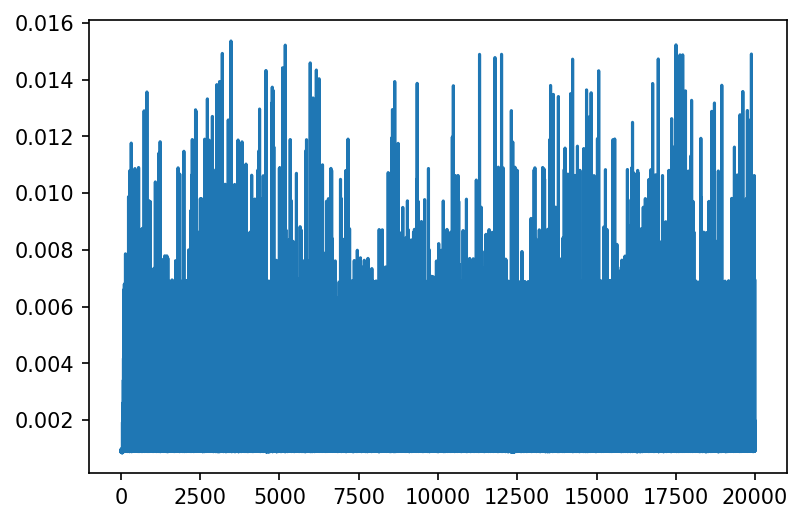

In [50]:
from matplotlib import pyplot as plt
fig = plt.figure(dpi=150)
fig.patch.set_facecolor('white')
plt.plot(step_times_4)

#### Test AlchemicalNonequilibriuLangevin integrator

In [56]:
with open("/data/chodera/zhangi/perses_benchmark/repex/0/solvent/ALA_CYS_solvent.pickle", 'rb') as f:
    htf = pickle.load(f)

In [57]:
x = 'lambda'
DEFAULT_ALCHEMICAL_FUNCTIONS = {
                             'lambda_sterics_core': x,
                             'lambda_electrostatics_core': x,
                             'lambda_sterics_insert': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_sterics_delete': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_insert': f"select(step({x} - 0.5), 2.0 * ({x} - 0.5), 0.0)",
                             'lambda_electrostatics_delete': f"select(step({x} - 0.5), 1.0, 2.0 * {x})",
                             'lambda_bonds': x,
                             'lambda_angles': x,
                             'lambda_torsions': x}

In [58]:
# AlchemicalNoneq
from openmmtools.integrators import AlchemicalNonequilibriumLangevinIntegrator
from simtk import unit
nsteps_eq = 62500 # 0.25 ns
nsteps_neq= 20000 # 80 ps
neq_splitting='V R H O R V'
timestep=4.0 * unit.femtosecond
integrator = AlchemicalNonequilibriumLangevinIntegrator(alchemical_functions=DEFAULT_ALCHEMICAL_FUNCTIONS, nsteps_neq=nsteps_neq, splitting=neq_splitting, timestep=timestep)


In [59]:
from simtk import openmm

temperature = 300*unit.kelvin
collision_rate = 90/unit.picosecond
platform_name = 'CUDA'

system = htf.hybrid_system
positions = htf.hybrid_positions
                            
platform = openmm.Platform.getPlatformByName(platform_name)
if platform_name in ['CUDA', 'OpenCL']:
    platform.setPropertyDefaultValue('Precision', 'mixed')
if platform_name in ['CUDA']:
    platform.setPropertyDefaultValue('DeterministicForces', 'true')



In [60]:
context = openmm.Context(system, integrator, platform)
context.setPeriodicBoxVectors(*system.getDefaultPeriodicBoxVectors())
context.setPositions(positions)

openmm.LocalEnergyMinimizer.minimize(context)


In [ ]:
integrator.step(nsteps_neq)